Using TensorFlow version: 2.19.0
170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step

Dataset loaded successfully!
Shape of training images: (50000, 32, 32, 3)
Shape of training labels: (50000, 1)


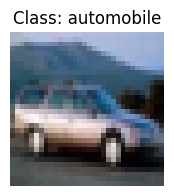

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

print(f"Using TensorFlow version: {tf.__version__}")

# Step 1: Dataset Collection - This one line loads the entire dataset.
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()

# Step 2: Preprocessing - Normalize pixel values from 0-255 to 0-1.
x_train = x_train.astype('float32') / 255.0
x_test = x_test.astype('float32') / 255.0

# --- Verification ---
print("\nDataset loaded successfully!")
print(f"Shape of training images: {x_train.shape}") # (50000 images, 32x32 pixels, 3 color channels)
print(f"Shape of training labels: {y_train.shape}")

# CIFAR-10 class names
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

# Let's find the class index for 'automobile' and 'truck'
automobile_class_index = class_names.index('automobile') # Should be 1
truck_class_index = class_names.index('truck') # Should be 9

# Display a sample image of a car to prove it's working
plt.figure(figsize=(2,2))
# Find the first image in the training set that is an automobile
first_car_image = x_train[np.where(y_train.flatten() == automobile_class_index)[0][0]]
plt.imshow(first_car_image)
plt.title(f"Class: {class_names[automobile_class_index]}")
plt.axis('off')
plt.show()

In [ ]:
# Continue in the same Colab notebook

# 1. Build the CNN model architecture
model = tf.keras.models.Sequential([
    # First convolutional layer: learns 32 simple patterns (edges, colors)
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)),
    tf.keras.layers.MaxPooling2D((2, 2)),

    # Second convolutional layer: learns 64 more complex patterns from the previous ones
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),

    # Flatten the 2D image data into a 1D vector to feed into the final layers
    tf.keras.layers.Flatten(),

    # A standard dense layer for classification
    tf.keras.layers.Dense(64, activation='relu'),

    # Output layer: 10 neurons, one for each class (automobile, truck, etc.)
    tf.keras.layers.Dense(10)
])

# 2. Compile the model
# This step configures the model for training
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# Print a summary of the model's architecture
model.summary()

# 3. Train the model (Step 6 from your plan)
# We'll train for 10 epochs, meaning the model will see the entire training dataset 10 times.
print("\nStarting model training...")
history = model.fit(x_train, y_train, epochs=10,
                    validation_data=(x_test, y_test))

print("\nTraining finished!")

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │       147,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 167,562 (654.54 KB)

 Trainable params: 167,562 (654.54 KB)

 Non-trainable params: 0 (0.00 B)


Starting model training...
Epoch 1/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 64s 40ms/step - accuracy: 0.3621 - loss: 1.7353 - val_accuracy: 0.5498 - val_loss: 1.2457
Epoch 2/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 78s 37ms/step - accuracy: 0.5765 - loss: 1.1951 - val_accuracy: 0.6232 - val_loss: 1.0854
Epoch 3/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 60s 38ms/step - accuracy: 0.6412 - loss: 1.0250 - val_accuracy: 0.6542 - val_loss: 0.9984
Epoch 4/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 60s 38ms/step - accuracy: 0.6802 - loss: 0.9282 - val_accuracy: 0.6730 - val_loss: 0.9406
Epoch 5/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - accuracy: 0.7008 - loss: 0.8602 - val_accuracy: 0.6815 - val_loss: 0.9161
Epoch 6/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - accuracy: 0.7200 - loss: 0.8012 - val_accuracy: 0.6869 - val_loss: 0.9146
Epoch 7/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - accuracy: 0.7353 - loss: 0.7582 - val_accuracy: 0.6791 - val_loss: 0.9224
Epoch 8/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 58s 37

In [ ]:
# --- This code filters the dataset for only automobiles and trucks ---

# Class indices for our target vehicles
# 1 = automobile, 9 = truck
vehicle_classes = [1, 9]

# Create a boolean mask for the training data
# It will be 'True' for every label that is either 1 or 9
train_mask = np.isin(y_train, vehicle_classes).flatten()

# Apply the mask to get only the vehicle images and labels
x_train_vehicles = x_train[train_mask]
y_train_vehicles = y_train[train_mask]

# Do the same for the testing data
test_mask = np.isin(y_test, vehicle_classes).flatten()
x_test_vehicles = x_test[test_mask]
y_test_vehicles = y_test[test_mask]

# --- Verification ---
print("Original training images shape:", x_train.shape)
print("Filtered training images shape:", x_train_vehicles.shape)
print("\nOriginal testing images shape:", x_test.shape)
print("Filtered testing images shape:", x_test_vehicles.shape)

# You now have a clean dataset with only the images you need! 🚗🚚

Original training images shape: (50000, 32, 32, 3)
Filtered training images shape: (10000, 32, 32, 3)

Original testing images shape: (10000, 32, 32, 3)
Filtered testing images shape: (2000, 32, 32, 3)


In [ ]:
# Remap labels: 1 (automobile) becomes 0, and 9 (truck) becomes 1
y_train_vehicles[y_train_vehicles == 1] = 0
y_train_vehicles[y_train_vehicles == 9] = 1

y_test_vehicles[y_test_vehicles == 1] = 0
y_test_vehicles[y_test_vehicles == 9] = 1

print("Labels have been remapped to 0s and 1s.")

Labels have been remapped to 0s and 1s.


In [ ]:
# 1. Build the new specialist CNN model
specialist_model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),

    # Key change: The output layer now has 1 neuron with a 'sigmoid' activation.
    # Sigmoid is perfect for binary (0 or 1) classification.
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# 2. Compile the model for binary classification
specialist_model.compile(optimizer='adam',
                         # Key change: Using 'binary_crossentropy' for a two-class problem.
                         loss='binary_crossentropy',
                         metrics=['accuracy'])

# Print the new model's summary
specialist_model.summary()

# 3. Train the specialist model on vehicle data ONLY
print("\nStarting specialist model training...")
history = specialist_model.fit(x_train_vehicles, y_train_vehicles, epochs=10,
                               validation_data=(x_test_vehicles, y_test_vehicles))

print("\nSpecialist model training finished!")

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)               │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │       147,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 166,977 (652.25 KB)

 Trainable params: 166,977 (652.25 KB)

 Non-trainable params: 0 (0.00 B)


Starting specialist model training...
Epoch 1/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - accuracy: 0.6485 - loss: 0.6163 - val_accuracy: 0.7930 - val_loss: 0.4474
Epoch 2/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - accuracy: 0.8154 - loss: 0.4191 - val_accuracy: 0.8105 - val_loss: 0.4209
Epoch 3/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - accuracy: 0.8513 - loss: 0.3425 - val_accuracy: 0.8600 - val_loss: 0.3360
Epoch 4/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step - accuracy: 0.8814 - loss: 0.2923 - val_accuracy: 0.8645 - val_loss: 0.3196
Epoch 5/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - accuracy: 0.8958 - loss: 0.2528 - val_accuracy: 0.8740 - val_loss: 0.3038
Epoch 6/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - accuracy: 0.9123 - loss: 0.2188 - val_accuracy: 0.8885 - val_loss: 0.2922
Epoch 7/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step - accuracy: 0.9271 - loss: 0.1800 - val_accuracy: 0.8670 - val_loss: 0.3181
Epoch 8/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/st

In [ ]:
# Evaluate the specialist model on the filtered test data
loss, accuracy = specialist_model.evaluate(x_test_vehicles, y_test_vehicles, verbose=0)

print(f"Specialist Model Accuracy on Test Data: {accuracy * 100:.2f}%")

Specialist Model Accuracy on Test Data: 89.30%


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


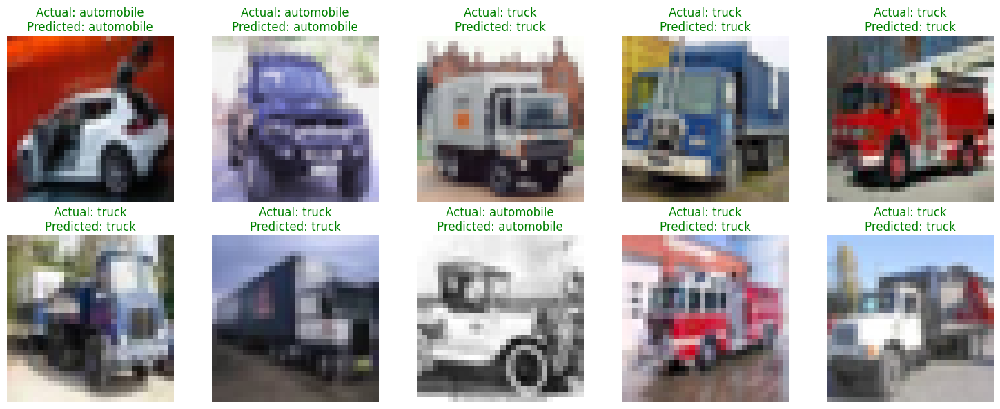

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# A dictionary to map our remapped labels (0, 1) back to names
class_names_vehicles = {0: 'automobile', 1: 'truck'}

# Get a batch of test images
num_images_to_show = 10
image_batch = x_test_vehicles[:num_images_to_show]
label_batch = y_test_vehicles[:num_images_to_show]

# Get model predictions
predictions = specialist_model.predict(image_batch)

# Display the images with their predicted and actual labels
plt.figure(figsize=(15, 6))
for i in range(num_images_to_show):
    plt.subplot(2, 5, i + 1)

    # The model's output is a probability. If it's > 0.5, we classify it as 1 (truck), else 0 (automobile).
    predicted_class = 1 if predictions[i][0] > 0.5 else 0
    actual_class = label_batch[i][0]

    # Set title color to green for correct predictions, red for incorrect
    title_color = 'green' if predicted_class == actual_class else 'red'

    plt.imshow(image_batch[i])
    plt.title(f"Actual: {class_names_vehicles[actual_class]}\nPredicted: {class_names_vehicles[predicted_class]}", color=title_color)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# Install the tensorflow-datasets library
!pip install tensorflow-datasets -q

import tensorflow_datasets as tfds
import tensorflow as tf
import matplotlib.pyplot as plt

# Load the Pascal VOC 2007 dataset
# This will download the data (once) and set it up for use.
(ds_train, ds_info) = tfds.load('voc/2007', split='train', with_info=True)

print(ds_info.features)

# --- Let's inspect one example to see the structure ---
print("\nHere is one example from the dataset:")
# Take one sample record from the training dataset
for example in ds_train.take(1):
  image = example['image']
  objects = example['objects']

  print(f"\nImage shape: {image.shape}")
  print(f"Number of objects in the image: {len(objects['label'])}")

  # Print the details for the first object in this image
  print(f"First object's label: {objects['label'][0]}")
  print(f"First object's bounding box: {objects['bbox'][0]}")

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/voc/2007/incomplete.NU6BAQ_5.0.0/voc-test.tfrecord*...:   0%|          | 0…

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/voc/2007/incomplete.NU6BAQ_5.0.0/voc-train.tfrecord*...:   0%|          | …

Generating validation examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/voc/2007/incomplete.NU6BAQ_5.0.0/voc-validation.tfrecord*...:   0%|       …

Dataset voc downloaded and prepared to /root/tensorflow_datasets/voc/2007/5.0.0. Subsequent calls will reuse this data.
FeaturesDict({
    'image': Image(shape=(None, None, 3), dtype=uint8),
    'image/filename': Text(shape=(), dtype=string),
    'labels': Sequence(ClassLabel(shape=(), dtype=int64, num_classes=20)),
    'labels_no_difficult': Sequence(ClassLabel(shape=(), dtype=int64, num_classes=20)),
    'objects': Sequence({
        'bbox': BBoxFeature(shape=(4,), dtype=float32),
        'is_difficult': bool,
        'is_truncated': bool,
        'label': ClassLabel(shape=(), dtype=int64, num_classes=20),
        'pose': ClassLabel(shape=(), dtype=int64, num_classes=5),
    }),
})

Here is one example from the dataset:

Image shape: (480, 389, 3)
Number of objects in the image: 4
First object's label: 12
First object's bounding box: [0.14375    0.0437018  0.97083336 0.7763496 ]


In [ ]:
# Define the standard input size for our model
IMG_SIZE = 300
BATCH_SIZE = 16

def preprocess_data(example):
    """
    This function resizes and normalizes the image.
    It also extracts the bounding boxes and labels.
    """
    # Get the image and normalize its pixel values to [0, 1]
    image = tf.image.convert_image_dtype(example['image'], dtype=tf.float32)

    # Resize the image to the standard size
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))

    # Get the bounding boxes and labels
    # Note: BBoxes are already normalized in the VOC dataset, so no changes are needed for them.
    bboxes = example['objects']['bbox']
    labels = example['objects']['label']

    return image, bboxes, labels

# Apply the preprocessing function to our filtered vehicle dataset
# The .map() function efficiently applies our function to every item.
train_ds = vehicle_ds.map(preprocess_data)

# To handle images with varying numbers of objects, we use .ragged_batch()
# This groups images and their corresponding objects into batches.
train_ds = train_ds.ragged_batch(BATCH_SIZE)


print("Preprocessing pipeline is set up and the dataset is batched.")
print("The data is now ready for the model. ✅")

# Let's check the output of one batch to see the final format
for images, bboxes, labels in train_ds.take(1):
    print(f"\nShape of the image batch: {images.shape}")
    print(f"Shape of the bounding box batch (ragged): {bboxes.shape}")
    print(f"Shape of the label batch (ragged): {labels.shape}")

NameError: name 'vehicle_ds' is not defined

In [ ]:
# Load the base dataset (if not already loaded)
(ds_train, ds_info) = tfds.load('voc/2007', split='train', with_info=True)

# Define the vehicle classes we want to keep
# car: 6, bus: 5, bicycle: 1, motorbike: 13, train: 18
vehicle_class_ids = tf.constant([6, 5, 1, 13, 18], dtype=tf.int64)

# ---- Define the filter functions ----
def contains_vehicle(example):
    labels = example['objects']['label']
    is_vehicle = tf.reduce_any(tf.equal(labels[:, tf.newaxis], vehicle_class_ids))
    return is_vehicle

def filter_objects(example):
    labels = example['objects']['label']
    bboxes = example['objects']['bbox']
    vehicle_indices = tf.where(tf.reduce_any(tf.equal(labels[:, tf.newaxis], vehicle_class_ids), axis=1))
    example['objects']['label'] = tf.gather(labels, vehicle_indices, axis=0)
    example['objects']['bbox'] = tf.gather(bboxes, vehicle_indices, axis=0)
    return example

# ---- Create the vehicle_ds variable by applying the filters ----
vehicle_ds = ds_train.filter(contains_vehicle).map(filter_objects)

print("✅ The 'vehicle_ds' dataset has been created successfully.")


✅ The 'vehicle_ds' dataset has been created successfully.


In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model

# Define the number of vehicle classes we are detecting
# bicycle, bus, car, motorbike, train
num_classes = 5

# 1. --- The Backbone ---
# Load MobileNetV2, pre-trained on ImageNet, without its top classification layer.
backbone = MobileNetV2(input_shape=(IMG_SIZE, IMG_SIZE, 3), include_top=False)

# Freeze the backbone's layers so we don't alter its pre-trained knowledge
backbone.trainable = False

# 2. --- The Custom Heads ---
# Start with the input layer
inputs = Input(shape=(IMG_SIZE, IMG_SIZE, 3))

# Pass the input through the backbone
x = backbone(inputs, training=False)

# Add our custom layers on top
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dense(512, activation='relu')(x)

# Create the Bounding Box Head
bbox_output = Dense(4, name='bounding_box')(x)

# Create the Classification Head
class_output = Dense(num_classes, activation='softmax', name='class_label')(x)

# 3. --- The Final Model ---
# Combine the backbone and the two heads into our final model
model = Model(inputs=inputs, outputs=[bbox_output, class_output])

# Print the model's architecture
model.summary()

print("\nObject detection model built successfully! ✅")

/tmp/ipython-input-2684626965.py:11: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  backbone = MobileNetV2(input_shape=(IMG_SIZE, IMG_SIZE, 3), include_top=False)


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 300, 300,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mobilenetv2_1.00_2… │ (None, 10, 10,    │  2,257,984 │ input_layer_3[0]… │
│ (Functional)        │ 1280)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 1280)      │          0 │ mobilenetv2_1.00… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 1024)      │  1,311,744 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_5 (Dense)     │ (None, 512)       │    524,800 │ dense_4[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bounding_box        │ (None, 4)         │      2,052 │ dense_5[0][0]     │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ class_label (Dense) │ (None, 5)         │      2,565 │ dense_5[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 4,099,145 (15.64 MB)

 Trainable params: 1,841,161 (7.02 MB)

 Non-trainable params: 2,257,984 (8.61 MB)


Object detection model built successfully! ✅


In [ ]:
# First, reformat the dataset to match the model's two output heads
def format_data_for_training(image, bboxes, labels):
    # The dictionary keys must match the names of the output layers
    return image, {"bounding_box": bboxes, "class_label": labels}

final_train_ds = train_ds.map(format_data_for_training)

# Compile the model with separate loss functions for each head
model.compile(optimizer='adam',
              loss={
                  'bounding_box': 'mean_squared_error',
                  'class_label': 'sparse_categorical_crossentropy'
              },
              metrics={
                  'class_label': 'accuracy'
              })

print("Model has been compiled.")

# Start training the model
print("Starting training... 🏋️‍♀️")
history = model.fit(
    final_train_ds,
    epochs=10,
)

print("\nTraining finished! ✅")

NameError: name 'train_ds' is not defined

In [ ]:
# --- Run this entire cell first to define all necessary datasets ---
import tensorflow_datasets as tfds
import tensorflow as tf

# 1. Load the raw dataset
(ds_train, ds_info) = tfds.load('voc/2007', split='train', with_info=True)

# 2. Filter for vehicles to create 'vehicle_ds'
vehicle_class_ids = tf.constant([6, 5, 1, 13, 18], dtype=tf.int64) # car, bus, bicycle, motorbike, train

def contains_vehicle(example):
    labels = example['objects']['label']
    is_vehicle = tf.reduce_any(tf.equal(labels[:, tf.newaxis], vehicle_class_ids))
    return is_vehicle

def filter_objects(example):
    labels = example['objects']['label']
    bboxes = example['objects']['bbox']
    vehicle_indices = tf.where(tf.reduce_any(tf.equal(labels[:, tf.newaxis], vehicle_class_ids), axis=1))
    example['objects']['label'] = tf.gather(labels, vehicle_indices, axis=0)
    example['objects']['bbox'] = tf.gather(bboxes, vehicle_indices, axis=0)
    return example

vehicle_ds = ds_train.filter(contains_vehicle).map(filter_objects)
print("✅ 'vehicle_ds' has been created.")

# 3. Preprocess 'vehicle_ds' to create 'train_ds'
IMG_SIZE = 300
BATCH_SIZE = 16

def preprocess_data(example):
    image = tf.image.convert_image_dtype(example['image'], dtype=tf.float32)
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    bboxes = example['objects']['bbox']
    labels = example['objects']['label']
    return image, bboxes, labels

train_ds = vehicle_ds.map(preprocess_data).ragged_batch(BATCH_SIZE)
print("✅ 'train_ds' has been created and preprocessed.")

✅ 'vehicle_ds' has been created.
✅ 'train_ds' has been created and preprocessed.


KeyError: 'class_label_accuracy'

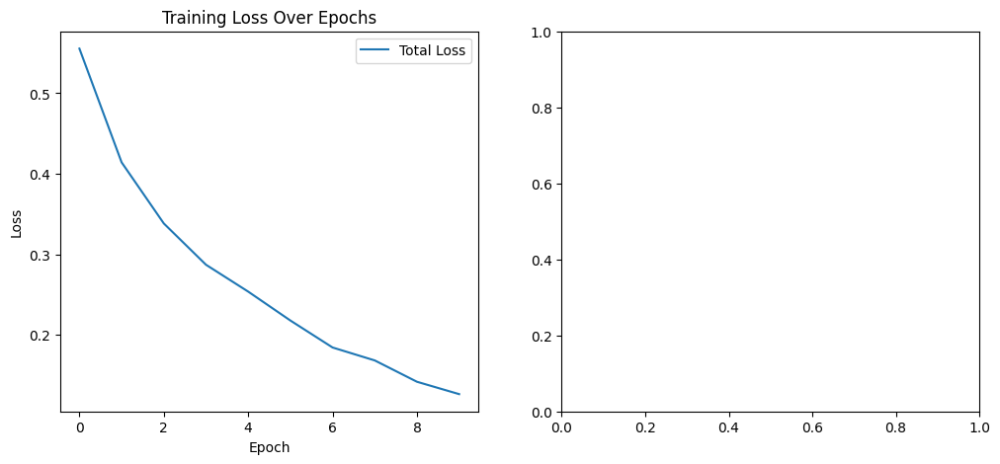

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Convert the history object to a pandas DataFrame for easy plotting
df = pd.DataFrame(history.history)

# Plot the training loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(df['loss'], label='Total Loss')
plt.title('Training Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot the training accuracy for the classification head
plt.subplot(1, 2, 2)
plt.plot(df['class_label_accuracy'], label='Classification Accuracy')
plt.title('Training Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# --- 1. Define and Compile the Model (Ensuring everything is fresh) ---

# Reformat the dataset to match the model's output names
def format_data_for_training(image, bboxes, labels):
    return image, {"bounding_box": bboxes, "class_label": labels}

final_train_ds = train_ds.map(format_data_for_training)

# Compile the model
# Keras creates metric names based on the output layer name + the metric name.
# So, for the 'class_label' output, the metric 'accuracy' becomes 'class_label_accuracy'.
model.compile(optimizer='adam',
              loss={
                  'bounding_box': 'mean_squared_error',
                  'class_label': 'sparse_categorical_crossentropy'
              },
              metrics={
                  'class_label': 'accuracy'
              })

# --- 2. Train the Model ---
print("Starting training...")
history = model.fit(
    final_train_ds,
    epochs=10,
    verbose=1 # Set to 1 to see the progress
)
print("\nTraining finished!")

# --- 3. Plot the Results ---
# This code will now use the fresh 'history' object from the training run above

print("\nPlotting training history...")
df = pd.DataFrame(history.history)

# To be safe, let's print the available keys so you can see them
print("Available keys:", df.columns)

# Plot the training loss and accuracy
plt.figure(figsize=(12, 5))

# Plot Total Loss
plt.subplot(1, 2, 1)
plt.plot(df['loss'], label='Total Loss')
plt.title('Training Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot Classification Accuracy
plt.subplot(1, 2, 2)
# Use the correct key, which is 'class_label_accuracy'
plt.plot(df['class_label_accuracy'], label='Classification Accuracy')
plt.title('Training Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

Starting training...
Epoch 1/10


ValueError: None values not supported.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# --- 1. Data Preparation (with the fix included) ---

# Define the preprocessing function
IMG_SIZE = 300
BATCH_SIZE = 16

def preprocess_data(example):
    image = tf.image.convert_image_dtype(example['image'], dtype=tf.float32)
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    bboxes = example['objects']['bbox']
    labels = example['objects']['label']
    return image, bboxes, labels

# Apply the preprocessing
train_ds = vehicle_ds.map(preprocess_data)

# --- THE FIX IS HERE ---
# Add a final filter to remove any examples that have 0 bounding boxes.
train_ds = train_ds.filter(lambda image, bboxes, labels: tf.shape(bboxes)[0] > 0)

# Now, batch the data
train_ds = train_ds.ragged_batch(BATCH_SIZE)

# Finally, format the dataset for the model's two outputs
def format_data_for_training(image, bboxes, labels):
    return image, {"bounding_box": bboxes, "class_label": labels}

final_train_ds = train_ds.map(format_data_for_training)

print("✅ Data pipeline fixed and ready.")


# --- 2. Compile and Train the Model ---

model.compile(optimizer='adam',
              loss={
                  'bounding_box': 'mean_squared_error',
                  'class_label': 'sparse_categorical_crossentropy'
              },
              metrics={
                  'class_label': 'accuracy'
              })

print("Starting training...")
history = model.fit(
    final_train_ds,
    epochs=10,
)

print("\nTraining finished!")

✅ Data pipeline fixed and ready.
Starting training...
Epoch 1/10


ValueError: None values not supported.

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds
import pandas as pd
import matplotlib.pyplot as plt

# --- 1. Load Data and Define Mappings ---
(ds_train, ds_info) = tfds.load('voc/2007', split='train', with_info=True)

# Original labels from the dataset
old_class_ids = tf.constant([6, 5, 1, 13, 18], dtype=tf.int64) # car, bus, bicycle, motorbike, train
# New labels we want to use (0, 1, 2, 3, 4)
new_class_ids = tf.constant([0, 1, 2, 3, 4], dtype=tf.int64)

# Create a lookup table to remap the labels
table = tf.lookup.StaticHashTable(
    initializer=tf.lookup.KeyValueTensorInitializer(keys=old_class_ids, values=new_class_ids),
    default_value=tf.constant(-1), # Use -1 for any class that is not a vehicle
    name="vehicle_class_mapper"
)

# --- 2. Create the All-in-One Preprocessing Function ---
IMG_SIZE = 300
BATCH_SIZE = 16

def preprocess_filter_and_remap(example):
    # Get original labels and bounding boxes
    labels = example['objects']['label']
    bboxes = example['objects']['bbox']

    # Find indices of objects that are vehicles
    is_vehicle_mask = tf.reduce_any(tf.equal(labels[:, tf.newaxis], old_class_ids), axis=1)
    vehicle_indices = tf.where(is_vehicle_mask)

    # Gather only the vehicle labels and boxes
    vehicle_labels = tf.gather(labels, vehicle_indices)
    vehicle_bboxes = tf.gather(bboxes, vehicle_indices)

    # Remap the original labels (e.g., 6) to our new labels (e.g., 0)
    remapped_labels = table.lookup(tf.squeeze(vehicle_labels, axis=1))

    # Preprocess the image
    image = tf.image.convert_image_dtype(example['image'], dtype=tf.float32)
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))

    return image, vehicle_bboxes, remapped_labels

# --- 3. Build the Final Data Pipeline ---
# Apply the all-in-one function
train_ds = ds_train.map(preprocess_filter_and_remap, num_parallel_calls=tf.data.AUTOTUNE)

# Filter out images that ended up with 0 vehicles
train_ds = train_ds.filter(lambda image, bboxes, labels: tf.shape(bboxes)[0] > 0)

# Batch the data
train_ds = train_ds.ragged_batch(BATCH_SIZE)

# Format for the model's two output heads
def format_data_for_training(image, bboxes, labels):
    return image, {"bounding_box": bboxes, "class_label": labels}

final_train_ds = train_ds.map(format_data_for_training)

print("✅ New robust data pipeline is ready.")

# --- 4. Compile and Train the Model ---
model.compile(optimizer='adam',
              loss={
                  'bounding_box': 'mean_squared_error',
                  'class_label': 'sparse_categorical_crossentropy'
              },
              metrics={
                  'class_label': 'accuracy'
              })

print("Starting training...")
history = model.fit(
    final_train_ds,
    epochs=10,
)

print("\nTraining finished!")

ValueError: Tensor conversion requested dtype int64 for Tensor with dtype int32: <tf.Tensor: shape=(), dtype=int32, numpy=-1>

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds
import pandas as pd
import matplotlib.pyplot as plt

# --- 1. Load Data and Define Mappings ---
(ds_train, ds_info) = tfds.load('voc/2007', split='train', with_info=True)

old_class_ids = tf.constant([6, 5, 1, 13, 18], dtype=tf.int64)
new_class_ids = tf.constant([0, 1, 2, 3, 4], dtype=tf.int64)

# --- THE FIX IS HERE ---
# Create a lookup table to remap the labels
table = tf.lookup.StaticHashTable(
    initializer=tf.lookup.KeyValueTensorInitializer(keys=old_class_ids, values=new_class_ids),
    # FIX: Explicitly set the dtype to tf.int64 to match the other values.
    default_value=tf.constant(-1, dtype=tf.int64),
    name="vehicle_class_mapper"
)

# --- 2. Create the All-in-One Preprocessing Function ---
IMG_SIZE = 300
BATCH_SIZE = 16

def preprocess_filter_and_remap(example):
    labels = example['objects']['label']
    bboxes = example['objects']['bbox']
    is_vehicle_mask = tf.reduce_any(tf.equal(labels[:, tf.newaxis], old_class_ids), axis=1)
    vehicle_indices = tf.where(is_vehicle_mask)
    vehicle_labels = tf.gather(labels, vehicle_indices)
    vehicle_bboxes = tf.gather(bboxes, vehicle_indices)
    remapped_labels = table.lookup(tf.squeeze(vehicle_labels, axis=1))
    image = tf.image.convert_image_dtype(example['image'], dtype=tf.float32)
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, vehicle_bboxes, remapped_labels

# --- 3. Build the Final Data Pipeline ---
train_ds = ds_train.map(preprocess_filter_and_remap, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.filter(lambda image, bboxes, labels: tf.shape(bboxes)[0] > 0)
train_ds = train_ds.ragged_batch(BATCH_SIZE)

def format_data_for_training(image, bboxes, labels):
    return image, {"bounding_box": bboxes, "class_label": labels}

final_train_ds = train_ds.map(format_data_for_training)

print("✅ New robust data pipeline is ready.")

# --- 4. Compile and Train the Model ---
model.compile(optimizer='adam',
              loss={
                  'bounding_box': 'mean_squared_error',
                  'class_label': 'sparse_categorical_crossentropy'
              },
              metrics={
                  'class_label': 'accuracy'
              })

print("Starting training...")
history = model.fit(
    final_train_ds,
    epochs=10,
)

print("\nTraining finished!")

✅ New robust data pipeline is ready.
Starting training...
Epoch 1/10


ValueError: None values not supported.

In [ ]:
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds
from tqdm import tqdm # A library to show progress bars

# --- 1. Load Data and Define Mappings (Same as before) ---
(ds_train, ds_info) = tfds.load('voc/2007', split='train', with_info=True)

old_class_ids = tf.constant([6, 5, 1, 13, 18], dtype=tf.int64) # car, bus, bicycle, motorbike, train
new_class_ids = tf.constant([0, 1, 2, 3, 4], dtype=tf.int64)

table = tf.lookup.StaticHashTable(
    initializer=tf.lookup.KeyValueTensorInitializer(keys=old_class_ids, values=new_class_ids),
    default_value=tf.constant(-1, dtype=tf.int64),
    name="vehicle_class_mapper"
)

# --- 2. Process the ENTIRE Dataset into NumPy arrays (The New Method) ---
print("Preparing dataset in memory... This may take a few minutes.")

IMG_SIZE = 300
all_images = []
all_bboxes = []
all_labels = []

# Loop through the dataset with a progress bar
for example in tqdm(ds_train):
    # --- Filter for vehicles ---
    labels = example['objects']['label']
    is_vehicle_mask = tf.reduce_any(tf.equal(labels[:, tf.newaxis], old_class_ids), axis=1)

    # If there are no vehicles in this image, skip it
    if not tf.reduce_any(is_vehicle_mask):
        continue

    # --- Preprocess the single example ---
    vehicle_indices = tf.where(is_vehicle_mask)
    vehicle_labels = tf.gather(labels, vehicle_indices)
    vehicle_bboxes = tf.gather(example['objects']['bbox'], vehicle_indices)
    remapped_labels = table.lookup(tf.squeeze(vehicle_labels, axis=1))

    image = tf.image.convert_image_dtype(example['image'], dtype=tf.float32)
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))

    # Append the processed data to our lists
    all_images.append(image.numpy())
    all_bboxes.append(vehicle_bboxes.numpy())
    all_labels.append(remapped_labels.numpy())

# Convert the lists into the final format for training
X_train = np.array(all_images)
# For the labels, we create a dictionary that Keras understands
y_train = {"bounding_box": tf.ragged.constant(all_bboxes),
           "class_label": tf.ragged.constant(all_labels)}

print(f"\n✅ Data preparation complete. Loaded {len(X_train)} images into memory.")

# --- 3. Compile and Train the Model ---
model.compile(optimizer='adam',
              loss={
                  'bounding_box': 'mean_squared_error',
                  'class_label': 'sparse_categorical_crossentropy'
              },
              metrics={
                  'class_label': 'accuracy'
              })

print("Starting training...")
history = model.fit(
    X_train,
    y_train,
    epochs=10,
    batch_size=16,
    validation_split=0.1 # Use 10% of the data for validation
)

print("\nTraining finished!")

Preparing dataset in memory... This may take a few minutes.


100%|██████████| 2501/2501 [00:20<00:00, 120.89it/s]



✅ Data preparation complete. Loaded 774 images into memory.
Starting training...
Epoch 1/10


ValueError: None values not supported.

In [ ]:
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds
from tqdm import tqdm

# --- 1. Load Data and Define Mappings ---
(ds_train, ds_info) = tfds.load('voc/2007', split='train', with_info=True)

old_class_ids = tf.constant([6, 5, 1, 13, 18], dtype=tf.int64)
new_class_ids = tf.constant([0, 1, 2, 3, 4], dtype=tf.int64)

table = tf.lookup.StaticHashTable(
    initializer=tf.lookup.KeyValueTensorInitializer(keys=old_class_ids, values=new_class_ids),
    default_value=tf.constant(-1, dtype=tf.int64),
    name="vehicle_class_mapper"
)

# --- 2. Process and DEBUG the Dataset ---
print("Debugging and preparing dataset in memory...")

IMG_SIZE = 300
all_images = []
all_bboxes = []
all_labels = []

for example in tqdm(ds_train):
    # --- Filter for vehicles ---
    labels = example['objects']['label']
    is_vehicle_mask = tf.reduce_any(tf.equal(labels[:, tf.newaxis], old_class_ids), axis=1)

    if not tf.reduce_any(is_vehicle_mask):
        continue

    # --- Preprocess the single example ---
    vehicle_indices = tf.where(is_vehicle_mask)
    vehicle_labels = tf.gather(labels, vehicle_indices)
    vehicle_bboxes = tf.gather(example['objects']['bbox'], vehicle_indices)
    remapped_labels = table.lookup(tf.squeeze(vehicle_labels, axis=1))

    image = tf.image.convert_image_dtype(example['image'], dtype=tf.float32)
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))

    # --- SANITY CHECKS TO FIND THE BUG ---
    # Convert to NumPy arrays to check them
    image_np = image.numpy()
    bboxes_np = vehicle_bboxes.numpy()
    labels_np = remapped_labels.numpy()

    # Check 1: Ensure no data is None
    if image_np is None or bboxes_np is None or labels_np is None:
        print(f"\n--- FATAL ERROR: A 'None' value was generated! ---")
        if 'image/filename' in example:
            print(f"Problematic filename: {example['image/filename'].numpy().decode('utf-8')}")
        break # Stop immediately

    # Check 2: Ensure that after filtering, we still have labels
    if labels_np.size == 0:
        print(f"\n--- WARNING: Found an image with zero vehicle objects after processing. Skipping. ---")
        if 'image/filename' in example:
            print(f"Filename: {example['image/filename'].numpy().decode('utf-8')}")
        continue # Skip this problematic sample

    # If all checks pass, append the data
    all_images.append(image_np)
    all_bboxes.append(bboxes_np)
    all_labels.append(labels_np)

# --- Check if the loop was broken by an error ---
if len(all_images) < 500: # Heuristic to check if loop broke early
     print("\n--- DEBUGGING FINISHED: A problem was likely found. Please review the output above. ---")
else:
    # --- 3. If Debugging Passes, Convert and Train ---
    X_train = np.array(all_images)
    y_train = {"bounding_box": tf.ragged.constant(all_bboxes),
               "class_label": tf.ragged.constant(all_labels)}

    print(f"\n✅ Data debugging complete. Loaded {len(X_train)} clean images into memory.")

    model.compile(optimizer='adam',
                  loss={'bounding_box': 'mean_squared_error', 'class_label': 'sparse_categorical_crossentropy'},
                  metrics={'class_label': 'accuracy'})

    print("Starting training...")
    history = model.fit(X_train, y_train, epochs=10, batch_size=16, validation_split=0.1)
    print("\nTraining finished!")

Debugging and preparing dataset in memory...


100%|██████████| 2501/2501 [00:10<00:00, 234.62it/s]



✅ Data debugging complete. Loaded 774 clean images into memory.
Starting training...
Epoch 1/10


ValueError: None values not supported.

In [ ]:
import numpy as np
import tensorflow as tf

# We already have all_images, all_bboxes, and all_labels from the last step.
# Now, we create new lists to hold only the single-object images.
single_object_images = []
single_object_bboxes = []
single_object_labels = []

print("Filtering for single-object images...")
for i in range(len(all_images)):
    # Check if the image has exactly one bounding box
    if len(all_bboxes[i]) == 1:
        single_object_images.append(all_images[i])
        # Since there's only one box/label, we extract it from the list
        single_object_bboxes.append(all_bboxes[i][0])
        single_object_labels.append(all_labels[i][0])

# Convert the new lists into simple NumPy arrays. No more RaggedTensors.
X_train_final = np.array(single_object_images)
y_bboxes_final = np.array(single_object_bboxes)
y_labels_final = np.array(single_object_labels)

# Create the final target dictionary for Keras
y_train_final = {
    "bounding_box": y_bboxes_final,
    "class_label": y_labels_final
}

print(f"✅ Final dataset created with {len(X_train_final)} single-object images.")

# --- Compile and Train the Model (on the corrected, non-ragged data) ---
model.compile(optimizer='adam',
              loss={
                  'bounding_box': 'mean_squared_error',
                  'class_label': 'sparse_categorical_crossentropy'
              },
              metrics={
                  'class_label': 'accuracy'
              })

print("Starting training on the final, corrected dataset...")
history = model.fit(
    X_train_final,
    y_train_final,
    epochs=10,
    batch_size=16,
    validation_split=0.1,
    verbose=1
)

print("\nTraining finally finished! ✅")

Filtering for single-object images...
✅ Final dataset created with 439 single-object images.
Starting training on the final, corrected dataset...
Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - bounding_box_loss: 0.7728 - class_label_accuracy: 0.5442 - class_label_loss: 1.3072 - loss: 2.0808 - val_bounding_box_loss: 0.0926 - val_class_label_accuracy: 0.6591 - val_class_label_loss: 0.7428 - val_loss: 0.8475
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 46s 2s/step - bounding_box_loss: 0.0745 - class_label_accuracy: 0.8690 - class_label_loss: 0.3301 - loss: 0.4043 - val_bounding_box_loss: 0.0869 - val_class_label_accuracy: 0.8409 - val_class_label_loss: 0.4659 - val_loss: 0.5144
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 32s 1s/step - bounding_box_loss: 0.0719 - class_label_accuracy: 0.9645 - class_label_loss: 0.1091 - loss: 0.1811 - val_bounding_box_loss: 0.0729 - val_class_label_accuracy: 0.8409 - val_class_label_loss: 0.4532 - val_loss: 0.4924
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step 

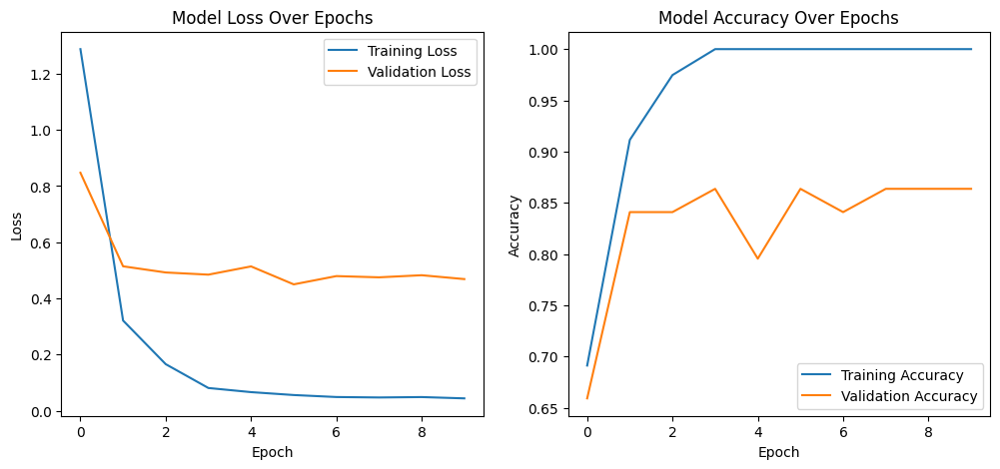

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Convert the history object to a pandas DataFrame for easy plotting
df = pd.DataFrame(history.history)

# Plot the training and validation loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(df['loss'], label='Training Loss')
plt.plot(df['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot the training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(df['class_label_accuracy'], label='Training Accuracy')
plt.plot(df['val_class_label_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

In [ ]:
# Load the 'test' split of the dataset
(ds_test, ds_info) = tfds.load('voc/2007', split='test', with_info=True)

# Process the entire test dataset into memory, keeping only single-object images
print("Preparing test dataset in memory...")
test_images = []
test_bboxes = []
test_labels = []

for example in tqdm(ds_test):
    labels = example['objects']['label']
    is_vehicle_mask = tf.reduce_any(tf.equal(labels[:, tf.newaxis], old_class_ids), axis=1)

    # We only want test images with exactly ONE vehicle
    if tf.reduce_sum(tf.cast(is_vehicle_mask, tf.int32)) == 1:
        vehicle_indices = tf.where(is_vehicle_mask)
        vehicle_label = tf.gather(labels, vehicle_indices)[0] # Get the single label
        remapped_label = table.lookup(vehicle_label)

        # Only proceed if it's a valid vehicle label
        if remapped_label != -1:
            image = tf.image.convert_image_dtype(example['image'], dtype=tf.float32)
            image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
            bbox = tf.gather(example['objects']['bbox'], vehicle_indices)[0]

            test_images.append(image.numpy())
            test_bboxes.append(bbox.numpy())
            test_labels.append(remapped_label.numpy())

X_test_final = np.array(test_images)
y_bboxes_test_final = np.array(test_bboxes)
y_labels_test_final = np.array(test_labels)

print(f"✅ Test dataset created with {len(X_test_final)} single-object images.")

Preparing test dataset in memory...


100%|██████████| 4952/4952 [00:20<00:00, 241.02it/s]


✅ Test dataset created with 1000 single-object images.


32/32 ━━━━━━━━━━━━━━━━━━━━ 77s 2s/step


ValueError: not enough values to unpack (expected 4, got 1)

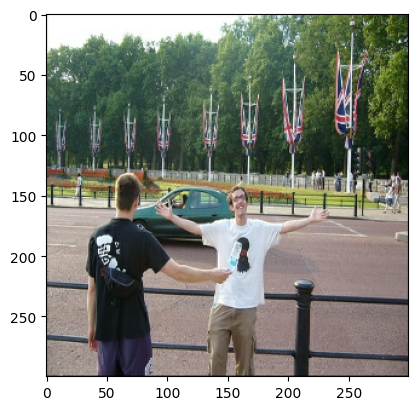

In [ ]:
import matplotlib.patches as patches

# Make predictions on the test set
predictions = model.predict(X_test_final)
pred_bboxes, pred_labels = predictions[0], predictions[1]

# Get the list of class names for display
class_names = ds_info.features['objects']['label'].names
# Create a new list for our remapped vehicle classes
vehicle_class_names = [class_names[i] for i in old_class_ids.numpy()]


# --- Display the results ---
plt.figure(figsize=(16, 16))
for i in range(min(len(X_test_final), 9)): # Show up to 9 images
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(X_test_final[i])

    # --- Draw the Ground Truth box (the correct answer) in GREEN ---
    y_min, x_min, y_max, x_max = y_bboxes_test_final[i]
    gt_rect = patches.Rectangle((x_min*IMG_SIZE, y_min*IMG_SIZE), (x_max-x_min)*IMG_SIZE, (y_max-y_min)*IMG_SIZE, linewidth=2, edgecolor='lime', facecolor='none')
    ax.add_patch(gt_rect)
    actual_class_id = y_labels_test_final[i]
    plt.text(x_min*IMG_SIZE, y_min*IMG_SIZE - 10, f"Actual: {vehicle_class_names[actual_class_id]}", color='lime', fontsize=10, bbox=dict(facecolor='black', alpha=0.5))

    # --- Draw the Predicted box in CYAN ---
    y_min, x_min, y_max, x_max = pred_bboxes[i]
    pred_rect = patches.Rectangle((x_min*IMG_SIZE, y_min*IMG_SIZE), (x_max-x_min)*IMG_SIZE, (y_max-y_min)*IMG_SIZE, linewidth=2, edgecolor='cyan', facecolor='none')
    ax.add_patch(pred_rect)
    predicted_class_id = np.argmax(pred_labels[i])
    plt.text(x_min*IMG_SIZE, (y_max*IMG_SIZE) + 20, f"Predicted: {vehicle_class_names[predicted_class_id]}", color='cyan', fontsize=10, bbox=dict(facecolor='black', alpha=0.5))

    plt.axis('off')

plt.tight_layout()
plt.show()

32/32 ━━━━━━━━━━━━━━━━━━━━ 70s 2s/step


TypeError: only integer scalar arrays can be converted to a scalar index

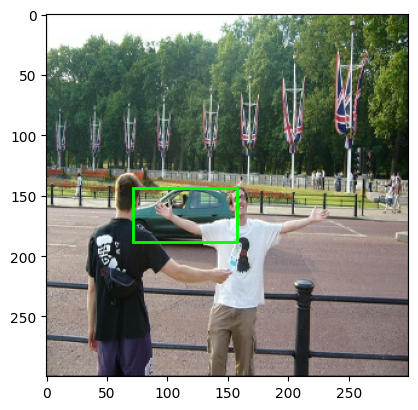

In [ ]:
import matplotlib.patches as patches
import numpy as np

# Make predictions on the test set
predictions = model.predict(X_test_final)
pred_bboxes, pred_labels = predictions[0], predictions[1]

# Get the list of class names for display
class_names = ds_info.features['objects']['label'].names
vehicle_class_names = [class_names[i] for i in old_class_ids.numpy()]

# --- Display the results ---
plt.figure(figsize=(16, 16))
for i in range(min(len(X_test_final), 9)): # Show up to 9 images
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(X_test_final[i])

    # --- Draw the Ground Truth box (the correct answer) in GREEN ---
    # FIX IS HERE: Add [0] to remove the extra dimension before unpacking
    y_min, x_min, y_max, x_max = y_bboxes_test_final[i][0]

    gt_rect = patches.Rectangle((x_min*IMG_SIZE, y_min*IMG_SIZE), (x_max-x_min)*IMG_SIZE, (y_max-y_min)*IMG_SIZE, linewidth=2, edgecolor='lime', facecolor='none')
    ax.add_patch(gt_rect)
    actual_class_id = y_labels_test_final[i]
    plt.text(x_min*IMG_SIZE, y_min*IMG_SIZE - 10, f"Actual: {vehicle_class_names[actual_class_id]}", color='lime', fontsize=10, bbox=dict(facecolor='black', alpha=0.5))

    # --- Draw the Predicted box in CYAN ---
    y_min, x_min, y_max, x_max = pred_bboxes[i]
    pred_rect = patches.Rectangle((x_min*IMG_SIZE, y_min*IMG_SIZE), (x_max-x_min)*IMG_SIZE, (y_max-y_min)*IMG_SIZE, linewidth=2, edgecolor='cyan', facecolor='none')
    ax.add_patch(pred_rect)
    predicted_class_id = np.argmax(pred_labels[i])
    plt.text(x_min*IMG_SIZE, (y_max*IMG_SIZE) + 20, f"Predicted: {vehicle_class_names[predicted_class_id]}", color='cyan', fontsize=10, bbox=dict(facecolor='black', alpha=0.5))

    plt.axis('off')

plt.tight_layout()
plt.show()

32/32 ━━━━━━━━━━━━━━━━━━━━ 69s 2s/step


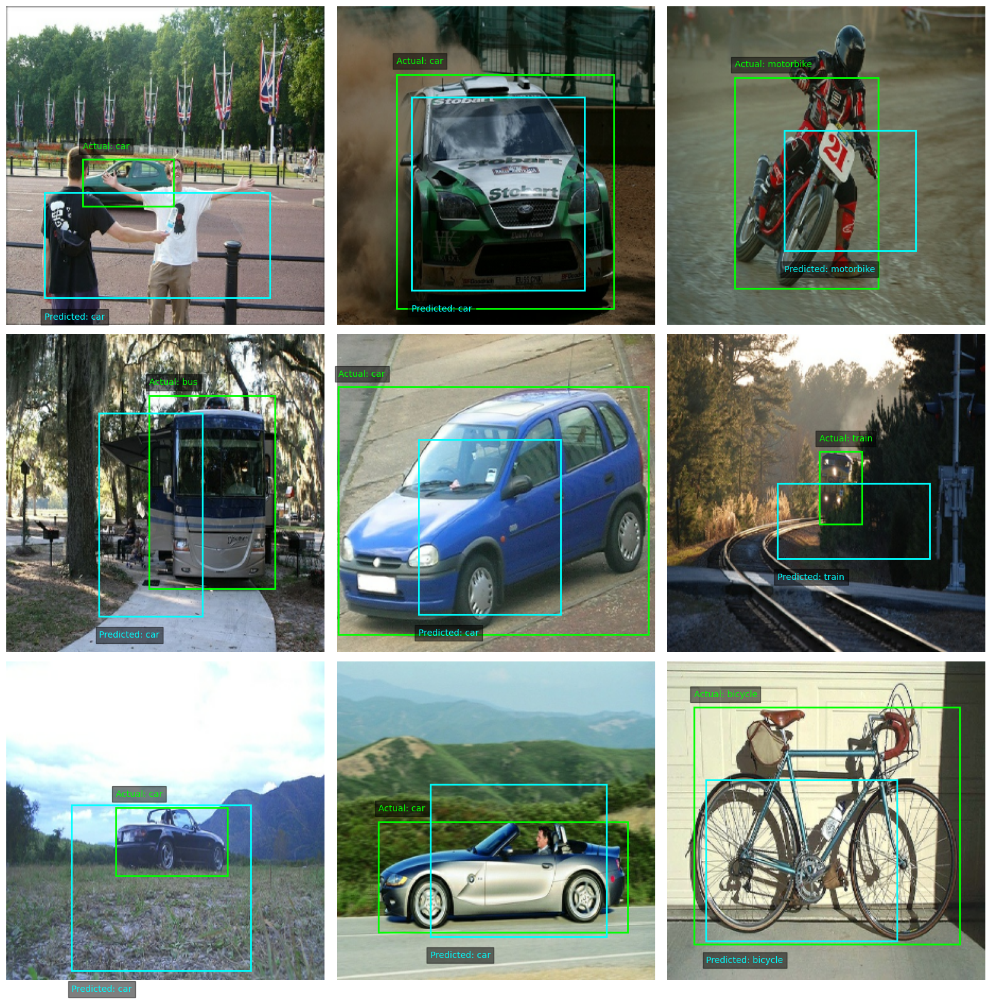

In [ ]:
import matplotlib.patches as patches
import numpy as np

# Make predictions on the test set
predictions = model.predict(X_test_final)
pred_bboxes, pred_labels = predictions[0], predictions[1]

# Get the list of class names for display
class_names = ds_info.features['objects']['label'].names
vehicle_class_names = [class_names[i] for i in old_class_ids.numpy()]


# --- Display the results ---
plt.figure(figsize=(16, 16))
for i in range(min(len(X_test_final), 9)): # Show up to 9 images
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(X_test_final[i])

    # --- Draw the Ground Truth box (the correct answer) in GREEN ---
    y_min, x_min, y_max, x_max = y_bboxes_test_final[i][0]
    gt_rect = patches.Rectangle((x_min*IMG_SIZE, y_min*IMG_SIZE), (x_max-x_min)*IMG_SIZE, (y_max-y_min)*IMG_SIZE, linewidth=2, edgecolor='lime', facecolor='none')
    ax.add_patch(gt_rect)

    # FIX IS HERE: Extract the integer from the array by adding [0]
    actual_class_id = y_labels_test_final[i][0]

    plt.text(x_min*IMG_SIZE, y_min*IMG_SIZE - 10, f"Actual: {vehicle_class_names[actual_class_id]}", color='lime', fontsize=10, bbox=dict(facecolor='black', alpha=0.5))

    # --- Draw the Predicted box in CYAN ---
    y_min, x_min, y_max, x_max = pred_bboxes[i]
    pred_rect = patches.Rectangle((x_min*IMG_SIZE, y_min*IMG_SIZE), (x_max-x_min)*IMG_SIZE, (y_max-y_min)*IMG_SIZE, linewidth=2, edgecolor='cyan', facecolor='none')
    ax.add_patch(pred_rect)
    predicted_class_id = np.argmax(pred_labels[i])
    plt.text(x_min*IMG_SIZE, (y_max*IMG_SIZE) + 20, f"Predicted: {vehicle_class_names[predicted_class_id]}", color='cyan', fontsize=10, bbox=dict(facecolor='black', alpha=0.5))

    plt.axis('off')

plt.tight_layout()
plt.show()

Processing 1501 frames from '1900-151662242_small.mp4'...


100%|██████████| 1501/1501 [04:40<00:00,  5.35it/s]



✅ Processing complete. Generated a sequence of 1501 detections.

Displaying a sample frame with the detected box:


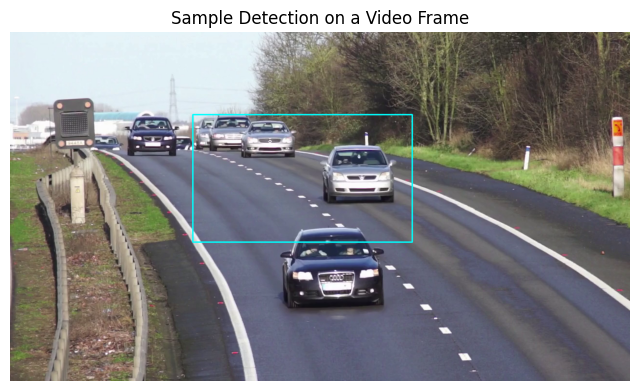

In [ ]:
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tqdm import tqdm

# --- IMPORTANT: Set your video's filename here ---
video_filename = '1900-151662242_small.mp4'

# This list will store the coordinates of the detected box in each frame
detection_sequence = []

# Open the video file
cap = cv2.VideoCapture(video_filename)
num_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

print(f"Processing {num_frames} frames from '{video_filename}'...")

# Loop through every frame of the video
for _ in tqdm(range(num_frames)):
    success, frame = cap.read()
    if not success:
        break

    # 1. Preprocess the frame to match the model's input requirements
    image_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    image_resized = tf.image.resize(image_rgb, (IMG_SIZE, IMG_SIZE))
    image_normalized = image_resized / 255.0
    # Add a batch dimension
    input_tensor = tf.expand_dims(image_normalized, axis=0)

    # 2. Run the detector to get the bounding box
    predictions = model.predict(input_tensor, verbose=0)
    pred_bboxes, _ = predictions # We only need the bounding box for this step

    # 3. Store the predicted bounding box
    detection_sequence.append(pred_bboxes[0])

cap.release()
print(f"\n✅ Processing complete. Generated a sequence of {len(detection_sequence)} detections.")

# --- Verification Step ---
# Let's visualize the last frame of the video with our model's detected bounding box
print("\nDisplaying a sample frame with the detected box:")
# Use the last successfully read frame
last_frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
# Get the last detected box
last_box = detection_sequence[-1]
y_min, x_min, y_max, x_max = last_box

# Scale coordinates to the original frame's dimensions
h, w, _ = last_frame_rgb.shape
x_min, y_min = int(x_min * w), int(y_min * h)
x_max, y_max = int(x_max * w), int(y_max * h)

# Draw the rectangle on the image
cv2.rectangle(last_frame_rgb, (x_min, y_min), (x_max, y_max), (0, 255, 255), 2) # Cyan color

plt.figure(figsize=(8,6))
plt.imshow(last_frame_rgb)
plt.title("Sample Detection on a Video Frame")
plt.axis('off')
plt.show()

In [ ]:
# 1. Install the Ultralytics library
!pip install ultralytics -q

from ultralytics import YOLO
from IPython.display import FileLink

# 2. Load a pre-trained YOLOv8 model
# 'yolov8n.pt' is the 'nano' version, which is the smallest and fastest.
model = YOLO('yolov8n.pt')

# 3. Run the model on your video
# --- IMPORTANT: Set your video's filename here ---
video_filename = '1900-151662242_small.mp4'

# The 'save=True' argument tells YOLO to save the output video with all detections.
# The 'classes=[2, 5, 6, 7]' argument tells it to only detect cars, buses, motorbikes, and trucks.
# 2=car, 5=bus, 6=motorbike, 7=truck
results = model.predict(source=video_filename, save=True, classes=[2, 5, 6, 7])

# 4. Display a link to download the result
# The output is saved in a 'runs/detect/predict' folder. FileLink will find the latest one.
print("\n✅ Processing complete! Your new video is ready.")
# Note: The exact output path might vary slightly.
# If the link doesn't appear, check the file browser on the left in the 'runs/detect/predict' folder.
output_path = results[0].save_dir + '/' + video_filename
display(FileLink(output_path))

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 30.3 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/1501) /content/1900-151662242_small.mp4: 384x640 

/content/runs/detect/predict/1900-151662242_small.mp4

In [ ]:
import cv2
from ultralytics import YOLO
from IPython.display import FileLink
from tqdm import tqdm

# Load the model
model = YOLO('yolov8n.pt')

# --- IMPORTANT: Set your video's filename here ---
video_filename = '1900-151662242_small.mp4'
output_filename = 'output_350_frames.mp4'

# --- UPDATED: Set to 350 frames as requested ---
max_frames = 350

# Get video properties to create the output file
cap = cv2.VideoCapture(video_filename)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))
cap.release()

# Define the video writer
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_filename, fourcc, fps, (width, height))

print(f"Starting a run on the first {max_frames} frames...")

# Use stream=True for efficient processing
results = model.predict(
    source=video_filename,
    stream=True,
    classes=[2, 3, 5, 7], # car, motorbike, bus, truck
    conf=0.5
)

# Loop through the results, but stop after max_frames
for i, r in enumerate(tqdm(results, total=max_frames)):
    if i >= max_frames:
        break

    # The .plot() method returns the frame with boxes drawn on it
    annotated_frame = r.plot()
    out.write(annotated_frame)

# Release the video writer to save the file
out.release()

print(f"\n✅ Processing complete! Your {max_frames}-frame video is saved as '{output_filename}'.")
display(FileLink(output_filename))

Starting a run on the first 350 frames...


  0%|          | 0/350 [00:00<?, ?it/s]


video 1/1 (frame 1/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 336.9ms


  0%|          | 1/350 [00:00<04:15,  1.36it/s]

video 1/1 (frame 2/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 144.8ms


  1%|          | 2/350 [00:00<02:19,  2.49it/s]

video 1/1 (frame 3/1501) /content/1900-151662242_small.mp4: 384x640 8 cars, 1 bus, 143.4ms


  1%|          | 3/350 [00:01<01:42,  3.38it/s]

video 1/1 (frame 4/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 bus, 136.5ms


  1%|          | 4/350 [00:01<01:23,  4.13it/s]

video 1/1 (frame 5/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 144.8ms


  1%|▏         | 5/350 [00:01<01:14,  4.64it/s]

video 1/1 (frame 6/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 152.0ms


  2%|▏         | 6/350 [00:01<01:09,  4.96it/s]

video 1/1 (frame 7/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 140.3ms


  2%|▏         | 7/350 [00:01<01:04,  5.30it/s]

video 1/1 (frame 8/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 bus, 147.2ms


  2%|▏         | 8/350 [00:01<01:02,  5.46it/s]

video 1/1 (frame 9/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 137.0ms


  3%|▎         | 9/350 [00:02<01:00,  5.67it/s]

video 1/1 (frame 10/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 140.6ms


  3%|▎         | 10/350 [00:02<00:58,  5.82it/s]

video 1/1 (frame 11/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 141.3ms


  3%|▎         | 11/350 [00:02<00:57,  5.92it/s]

video 1/1 (frame 12/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 152.8ms


  3%|▎         | 12/350 [00:02<00:57,  5.84it/s]

video 1/1 (frame 13/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 141.5ms


  4%|▎         | 13/350 [00:02<00:57,  5.88it/s]

video 1/1 (frame 14/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 141.3ms


  4%|▍         | 14/350 [00:02<00:56,  5.94it/s]

video 1/1 (frame 15/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 137.2ms


  4%|▍         | 15/350 [00:03<00:55,  6.03it/s]

video 1/1 (frame 16/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 135.4ms


  5%|▍         | 16/350 [00:03<00:54,  6.14it/s]

video 1/1 (frame 17/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 142.2ms


  5%|▍         | 17/350 [00:03<00:54,  6.11it/s]

video 1/1 (frame 18/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 140.1ms


  5%|▌         | 18/350 [00:03<00:54,  6.13it/s]

video 1/1 (frame 19/1501) /content/1900-151662242_small.mp4: 384x640 8 cars, 153.1ms


  5%|▌         | 19/350 [00:03<00:55,  6.00it/s]

video 1/1 (frame 20/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 133.9ms


  6%|▌         | 20/350 [00:03<00:53,  6.11it/s]

video 1/1 (frame 21/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 137.4ms


  6%|▌         | 21/350 [00:04<00:53,  6.15it/s]

video 1/1 (frame 22/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 137.7ms


  6%|▋         | 22/350 [00:04<00:53,  6.18it/s]

video 1/1 (frame 23/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 140.7ms


  7%|▋         | 23/350 [00:04<00:53,  6.14it/s]

video 1/1 (frame 24/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 137.1ms


  7%|▋         | 24/350 [00:04<00:52,  6.17it/s]

video 1/1 (frame 25/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 152.1ms


  7%|▋         | 25/350 [00:04<00:54,  5.98it/s]

video 1/1 (frame 26/1501) /content/1900-151662242_small.mp4: 384x640 8 cars, 139.3ms


  7%|▋         | 26/350 [00:04<00:53,  6.00it/s]

video 1/1 (frame 27/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 140.1ms


  8%|▊         | 27/350 [00:05<00:53,  6.05it/s]

video 1/1 (frame 28/1501) /content/1900-151662242_small.mp4: 384x640 8 cars, 192.5ms


  8%|▊         | 28/350 [00:05<00:58,  5.48it/s]

video 1/1 (frame 29/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 216.4ms


  8%|▊         | 29/350 [00:05<01:04,  4.98it/s]

video 1/1 (frame 30/1501) /content/1900-151662242_small.mp4: 384x640 8 cars, 217.3ms


  9%|▊         | 30/350 [00:05<01:09,  4.62it/s]

video 1/1 (frame 31/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 205.4ms


  9%|▉         | 31/350 [00:05<01:11,  4.48it/s]

video 1/1 (frame 32/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 206.1ms


  9%|▉         | 32/350 [00:06<01:12,  4.36it/s]

video 1/1 (frame 33/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 211.6ms


  9%|▉         | 33/350 [00:06<01:14,  4.28it/s]

video 1/1 (frame 34/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 206.4ms


 10%|▉         | 34/350 [00:06<01:14,  4.22it/s]

video 1/1 (frame 35/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 224.8ms


 10%|█         | 35/350 [00:06<01:16,  4.12it/s]

video 1/1 (frame 36/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 225.2ms


 10%|█         | 36/350 [00:07<01:18,  4.01it/s]

video 1/1 (frame 37/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 207.7ms


 11%|█         | 37/350 [00:07<01:17,  4.03it/s]

video 1/1 (frame 38/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 169.5ms


 11%|█         | 38/350 [00:07<01:12,  4.28it/s]

video 1/1 (frame 39/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 143.2ms


 11%|█         | 39/350 [00:07<01:06,  4.66it/s]

video 1/1 (frame 40/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 133.6ms


 11%|█▏        | 40/350 [00:08<01:01,  5.06it/s]

video 1/1 (frame 41/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 bus, 137.7ms


 12%|█▏        | 41/350 [00:08<00:57,  5.39it/s]

video 1/1 (frame 42/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 137.1ms


 12%|█▏        | 42/350 [00:08<00:54,  5.62it/s]

video 1/1 (frame 43/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 139.9ms


 12%|█▏        | 43/350 [00:08<00:53,  5.79it/s]

video 1/1 (frame 44/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 135.0ms


 13%|█▎        | 44/350 [00:08<00:51,  5.95it/s]

video 1/1 (frame 45/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 139.5ms


 13%|█▎        | 45/350 [00:08<00:50,  6.02it/s]

video 1/1 (frame 46/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 150.0ms


 13%|█▎        | 46/350 [00:08<00:51,  5.96it/s]

video 1/1 (frame 47/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 141.0ms


 13%|█▎        | 47/350 [00:09<00:50,  6.01it/s]

video 1/1 (frame 48/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 140.9ms


 14%|█▎        | 48/350 [00:09<00:50,  6.00it/s]

video 1/1 (frame 49/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 140.0ms


 14%|█▍        | 49/350 [00:09<00:49,  6.03it/s]

video 1/1 (frame 50/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 bus, 136.2ms


 14%|█▍        | 50/350 [00:09<00:49,  6.09it/s]

video 1/1 (frame 51/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 138.3ms


 15%|█▍        | 51/350 [00:09<00:48,  6.12it/s]

video 1/1 (frame 52/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 148.5ms


 15%|█▍        | 52/350 [00:09<00:49,  6.02it/s]

video 1/1 (frame 53/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 138.2ms


 15%|█▌        | 53/350 [00:10<00:48,  6.08it/s]

video 1/1 (frame 54/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 134.4ms


 15%|█▌        | 54/350 [00:10<00:48,  6.11it/s]

video 1/1 (frame 55/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 139.1ms


 16%|█▌        | 55/350 [00:10<00:48,  6.10it/s]

video 1/1 (frame 56/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 136.6ms


 16%|█▌        | 56/350 [00:10<00:47,  6.16it/s]

video 1/1 (frame 57/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 143.2ms


 16%|█▋        | 57/350 [00:10<00:47,  6.14it/s]

video 1/1 (frame 58/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 132.7ms


 17%|█▋        | 58/350 [00:10<00:46,  6.23it/s]

video 1/1 (frame 59/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 148.4ms


 17%|█▋        | 59/350 [00:11<00:47,  6.12it/s]

video 1/1 (frame 60/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 137.9ms


 17%|█▋        | 60/350 [00:11<00:46,  6.18it/s]

video 1/1 (frame 61/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 137.1ms


 17%|█▋        | 61/350 [00:11<00:46,  6.17it/s]

video 1/1 (frame 62/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 137.1ms


 18%|█▊        | 62/350 [00:11<00:46,  6.18it/s]

video 1/1 (frame 63/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 138.9ms


 18%|█▊        | 63/350 [00:11<00:46,  6.17it/s]

video 1/1 (frame 64/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 134.7ms


 18%|█▊        | 64/350 [00:11<00:45,  6.22it/s]

video 1/1 (frame 65/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 150.5ms


 19%|█▊        | 65/350 [00:12<00:46,  6.10it/s]

video 1/1 (frame 66/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 144.3ms


 19%|█▉        | 66/350 [00:12<00:46,  6.05it/s]

video 1/1 (frame 67/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 136.9ms


 19%|█▉        | 67/350 [00:12<00:46,  6.14it/s]

video 1/1 (frame 68/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 141.4ms


 19%|█▉        | 68/350 [00:12<00:46,  6.13it/s]

video 1/1 (frame 69/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 137.5ms


 20%|█▉        | 69/350 [00:12<00:45,  6.17it/s]

video 1/1 (frame 70/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 bus, 138.7ms


 20%|██        | 70/350 [00:12<00:45,  6.18it/s]

video 1/1 (frame 71/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 135.9ms


 20%|██        | 71/350 [00:13<00:46,  6.03it/s]

video 1/1 (frame 72/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 bus, 144.6ms


 21%|██        | 72/350 [00:13<00:46,  5.98it/s]

video 1/1 (frame 73/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 bus, 153.5ms


 21%|██        | 73/350 [00:13<00:47,  5.86it/s]

video 1/1 (frame 74/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 135.6ms


 21%|██        | 74/350 [00:13<00:46,  5.98it/s]

video 1/1 (frame 75/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 139.8ms


 21%|██▏       | 75/350 [00:13<00:45,  6.05it/s]

video 1/1 (frame 76/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 134.5ms


 22%|██▏       | 76/350 [00:13<00:44,  6.17it/s]

video 1/1 (frame 77/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 131.5ms


 22%|██▏       | 77/350 [00:14<00:43,  6.24it/s]

video 1/1 (frame 78/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 154.5ms


 22%|██▏       | 78/350 [00:14<00:44,  6.07it/s]

video 1/1 (frame 79/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 146.7ms


 23%|██▎       | 79/350 [00:14<00:45,  6.00it/s]

video 1/1 (frame 80/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 140.2ms


 23%|██▎       | 80/350 [00:14<00:44,  6.07it/s]

video 1/1 (frame 81/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 137.5ms


 23%|██▎       | 81/350 [00:14<00:43,  6.12it/s]

video 1/1 (frame 82/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 bus, 139.7ms


 23%|██▎       | 82/350 [00:14<00:43,  6.14it/s]

video 1/1 (frame 83/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.0ms


 24%|██▎       | 83/350 [00:15<00:42,  6.21it/s]

video 1/1 (frame 84/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 bus, 153.7ms


 24%|██▍       | 84/350 [00:15<00:43,  6.05it/s]

video 1/1 (frame 85/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 148.7ms


 24%|██▍       | 85/350 [00:15<00:44,  5.97it/s]

video 1/1 (frame 86/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 138.9ms


 25%|██▍       | 86/350 [00:15<00:43,  6.05it/s]

video 1/1 (frame 87/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 bus, 139.1ms


 25%|██▍       | 87/350 [00:15<00:43,  6.05it/s]

video 1/1 (frame 88/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.0ms


 25%|██▌       | 88/350 [00:15<00:43,  6.06it/s]

video 1/1 (frame 89/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 140.6ms


 25%|██▌       | 89/350 [00:16<00:42,  6.11it/s]

video 1/1 (frame 90/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 150.8ms


 26%|██▌       | 90/350 [00:16<00:43,  5.94it/s]

video 1/1 (frame 91/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 140.0ms


 26%|██▌       | 91/350 [00:16<00:43,  6.01it/s]

video 1/1 (frame 92/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 bus, 1 truck, 136.8ms


 26%|██▋       | 92/350 [00:16<00:42,  6.10it/s]

video 1/1 (frame 93/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 bus, 137.6ms


 27%|██▋       | 93/350 [00:16<00:41,  6.16it/s]

video 1/1 (frame 94/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 bus, 133.3ms


 27%|██▋       | 94/350 [00:16<00:41,  6.23it/s]

video 1/1 (frame 95/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 bus, 137.5ms


 27%|██▋       | 95/350 [00:17<00:40,  6.25it/s]

video 1/1 (frame 96/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 136.6ms


 27%|██▋       | 96/350 [00:17<00:40,  6.24it/s]

video 1/1 (frame 97/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 158.4ms


 28%|██▊       | 97/350 [00:17<00:42,  6.02it/s]

video 1/1 (frame 98/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 137.0ms


 28%|██▊       | 98/350 [00:17<00:41,  6.10it/s]

video 1/1 (frame 99/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 170.3ms


 28%|██▊       | 99/350 [00:17<00:44,  5.68it/s]

video 1/1 (frame 100/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 207.5ms


 29%|██▊       | 100/350 [00:17<00:48,  5.12it/s]

video 1/1 (frame 101/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 212.3ms


 29%|██▉       | 101/350 [00:18<00:51,  4.80it/s]

video 1/1 (frame 102/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 211.6ms


 29%|██▉       | 102/350 [00:18<00:54,  4.57it/s]

video 1/1 (frame 103/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 209.2ms


 29%|██▉       | 103/350 [00:18<00:55,  4.46it/s]

video 1/1 (frame 104/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 209.0ms


 30%|██▉       | 104/350 [00:18<00:56,  4.38it/s]

video 1/1 (frame 105/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 208.8ms


 30%|███       | 105/350 [00:19<00:56,  4.31it/s]

video 1/1 (frame 106/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 217.9ms


 30%|███       | 106/350 [00:19<00:58,  4.18it/s]

video 1/1 (frame 107/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 bus, 219.2ms


 31%|███       | 107/350 [00:19<00:59,  4.10it/s]

video 1/1 (frame 108/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 212.6ms


 31%|███       | 108/350 [00:19<00:58,  4.13it/s]

video 1/1 (frame 109/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 207.8ms


 31%|███       | 109/350 [00:20<00:57,  4.16it/s]

video 1/1 (frame 110/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 179.0ms


 31%|███▏      | 110/350 [00:20<00:55,  4.36it/s]

video 1/1 (frame 111/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 161.4ms


 32%|███▏      | 111/350 [00:20<00:51,  4.61it/s]

video 1/1 (frame 112/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.9ms


 32%|███▏      | 112/350 [00:20<00:47,  5.01it/s]

video 1/1 (frame 113/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.0ms


 32%|███▏      | 113/350 [00:20<00:44,  5.30it/s]

video 1/1 (frame 114/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.8ms


 33%|███▎      | 114/350 [00:21<00:42,  5.54it/s]

video 1/1 (frame 115/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 140.6ms


 33%|███▎      | 115/350 [00:21<00:41,  5.70it/s]

video 1/1 (frame 116/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 146.2ms


 33%|███▎      | 116/350 [00:21<00:40,  5.78it/s]

video 1/1 (frame 117/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 156.7ms


 33%|███▎      | 117/350 [00:21<00:40,  5.70it/s]

video 1/1 (frame 118/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 140.5ms


 34%|███▎      | 118/350 [00:21<00:39,  5.84it/s]

video 1/1 (frame 119/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 140.0ms


 34%|███▍      | 119/350 [00:21<00:39,  5.92it/s]

video 1/1 (frame 120/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 137.7ms


 34%|███▍      | 120/350 [00:22<00:38,  6.02it/s]

video 1/1 (frame 121/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 143.8ms


 35%|███▍      | 121/350 [00:22<00:38,  5.98it/s]

video 1/1 (frame 122/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 146.9ms


 35%|███▍      | 122/350 [00:22<00:38,  5.96it/s]

video 1/1 (frame 123/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 146.2ms


 35%|███▌      | 123/350 [00:22<00:38,  5.93it/s]

video 1/1 (frame 124/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 153.2ms


 35%|███▌      | 124/350 [00:22<00:39,  5.79it/s]

video 1/1 (frame 125/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 143.3ms


 36%|███▌      | 125/350 [00:22<00:38,  5.82it/s]

video 1/1 (frame 126/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.5ms


 36%|███▌      | 126/350 [00:23<00:37,  5.92it/s]

video 1/1 (frame 127/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 142.7ms


 36%|███▋      | 127/350 [00:23<00:37,  5.97it/s]

video 1/1 (frame 128/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 147.2ms


 37%|███▋      | 128/350 [00:23<00:37,  5.96it/s]

video 1/1 (frame 129/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.0ms


 37%|███▋      | 129/350 [00:23<00:36,  6.04it/s]

video 1/1 (frame 130/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 152.3ms


 37%|███▋      | 130/350 [00:23<00:36,  5.97it/s]

video 1/1 (frame 131/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.2ms


 37%|███▋      | 131/350 [00:23<00:36,  5.98it/s]

video 1/1 (frame 132/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 143.4ms


 38%|███▊      | 132/350 [00:24<00:36,  6.02it/s]

video 1/1 (frame 133/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.2ms


 38%|███▊      | 133/350 [00:24<00:36,  6.00it/s]

video 1/1 (frame 134/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.8ms


 38%|███▊      | 134/350 [00:24<00:36,  5.99it/s]

video 1/1 (frame 135/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.5ms


 39%|███▊      | 135/350 [00:24<00:35,  6.04it/s]

video 1/1 (frame 136/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 161.7ms


 39%|███▉      | 136/350 [00:24<00:36,  5.86it/s]

video 1/1 (frame 137/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 146.0ms


 39%|███▉      | 137/350 [00:24<00:36,  5.88it/s]

video 1/1 (frame 138/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 144.9ms


 39%|███▉      | 138/350 [00:25<00:35,  5.92it/s]

video 1/1 (frame 139/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 142.0ms


 40%|███▉      | 139/350 [00:25<00:35,  5.93it/s]

video 1/1 (frame 140/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 150.1ms


 40%|████      | 140/350 [00:25<00:35,  5.88it/s]

video 1/1 (frame 141/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 143.9ms


 40%|████      | 141/350 [00:25<00:35,  5.93it/s]

video 1/1 (frame 142/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 166.5ms


 41%|████      | 142/350 [00:25<00:36,  5.68it/s]

video 1/1 (frame 143/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 148.5ms


 41%|████      | 143/350 [00:25<00:36,  5.69it/s]

video 1/1 (frame 144/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 142.1ms


 41%|████      | 144/350 [00:26<00:35,  5.77it/s]

video 1/1 (frame 145/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 151.3ms


 41%|████▏     | 145/350 [00:26<00:35,  5.75it/s]

video 1/1 (frame 146/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 143.6ms


 42%|████▏     | 146/350 [00:26<00:35,  5.81it/s]

video 1/1 (frame 147/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 150.9ms


 42%|████▏     | 147/350 [00:26<00:35,  5.73it/s]

video 1/1 (frame 148/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 175.1ms


 42%|████▏     | 148/350 [00:26<00:37,  5.42it/s]

video 1/1 (frame 149/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 172.7ms


 43%|████▎     | 149/350 [00:27<00:37,  5.29it/s]

video 1/1 (frame 150/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 194.0ms


 43%|████▎     | 150/350 [00:27<00:39,  5.00it/s]

video 1/1 (frame 151/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 178.4ms


 43%|████▎     | 151/350 [00:27<00:40,  4.96it/s]

video 1/1 (frame 152/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 151.6ms


 43%|████▎     | 152/350 [00:27<00:38,  5.14it/s]

video 1/1 (frame 153/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 166.8ms


 44%|████▎     | 153/350 [00:27<00:38,  5.13it/s]

video 1/1 (frame 154/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 149.5ms


 44%|████▍     | 154/350 [00:27<00:37,  5.29it/s]

video 1/1 (frame 155/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 151.7ms


 44%|████▍     | 155/350 [00:28<00:36,  5.40it/s]

video 1/1 (frame 156/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 186.8ms


 45%|████▍     | 156/350 [00:28<00:37,  5.15it/s]

video 1/1 (frame 157/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 186.1ms


 45%|████▍     | 157/350 [00:28<00:38,  4.96it/s]

video 1/1 (frame 158/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 173.0ms


 45%|████▌     | 158/350 [00:28<00:38,  4.93it/s]

video 1/1 (frame 159/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 176.1ms


 45%|████▌     | 159/350 [00:29<00:38,  4.92it/s]

video 1/1 (frame 160/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 176.0ms


 46%|████▌     | 160/350 [00:29<00:38,  4.90it/s]

video 1/1 (frame 161/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 175.7ms


 46%|████▌     | 161/350 [00:29<00:38,  4.93it/s]

video 1/1 (frame 162/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 166.9ms


 46%|████▋     | 162/350 [00:29<00:37,  5.01it/s]

video 1/1 (frame 163/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 156.7ms


 47%|████▋     | 163/350 [00:29<00:36,  5.13it/s]

video 1/1 (frame 164/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 165.9ms


 47%|████▋     | 164/350 [00:29<00:35,  5.17it/s]

video 1/1 (frame 165/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 147.4ms


 47%|████▋     | 165/350 [00:30<00:34,  5.39it/s]

video 1/1 (frame 166/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 187.1ms


 47%|████▋     | 166/350 [00:30<00:35,  5.17it/s]

video 1/1 (frame 167/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 234.0ms


 48%|████▊     | 167/350 [00:30<00:39,  4.67it/s]

video 1/1 (frame 168/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 228.4ms


 48%|████▊     | 168/350 [00:30<00:41,  4.36it/s]

video 1/1 (frame 169/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 220.1ms


 48%|████▊     | 169/350 [00:31<00:42,  4.22it/s]

video 1/1 (frame 170/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 214.6ms


 49%|████▊     | 170/350 [00:31<00:43,  4.16it/s]

video 1/1 (frame 171/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 214.7ms


 49%|████▉     | 171/350 [00:31<00:43,  4.11it/s]

video 1/1 (frame 172/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 221.4ms


 49%|████▉     | 172/350 [00:31<00:44,  4.04it/s]

video 1/1 (frame 173/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 229.9ms


 49%|████▉     | 173/350 [00:32<00:44,  3.96it/s]

video 1/1 (frame 174/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 212.4ms


 50%|████▉     | 174/350 [00:32<00:44,  3.97it/s]

video 1/1 (frame 175/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 227.9ms


 50%|█████     | 175/350 [00:32<00:44,  3.94it/s]

video 1/1 (frame 176/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 221.5ms


 50%|█████     | 176/350 [00:32<00:43,  3.99it/s]

video 1/1 (frame 177/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 153.0ms


 51%|█████     | 177/350 [00:33<00:39,  4.37it/s]

video 1/1 (frame 178/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 136.8ms


 51%|█████     | 178/350 [00:33<00:36,  4.77it/s]

video 1/1 (frame 179/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 148.9ms


 51%|█████     | 179/350 [00:33<00:34,  5.01it/s]

video 1/1 (frame 180/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 158.9ms


 51%|█████▏    | 180/350 [00:33<00:33,  5.13it/s]

video 1/1 (frame 181/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 150.2ms


 52%|█████▏    | 181/350 [00:33<00:32,  5.27it/s]

video 1/1 (frame 182/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 141.7ms


 52%|█████▏    | 182/350 [00:33<00:30,  5.49it/s]

video 1/1 (frame 183/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 165.5ms


 52%|█████▏    | 183/350 [00:34<00:30,  5.43it/s]

video 1/1 (frame 184/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 149.4ms


 53%|█████▎    | 184/350 [00:34<00:30,  5.52it/s]

video 1/1 (frame 185/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 151.3ms


 53%|█████▎    | 185/350 [00:34<00:29,  5.58it/s]

video 1/1 (frame 186/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 137.7ms


 53%|█████▎    | 186/350 [00:34<00:28,  5.75it/s]

video 1/1 (frame 187/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 144.2ms


 53%|█████▎    | 187/350 [00:34<00:27,  5.84it/s]

video 1/1 (frame 188/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 142.8ms


 54%|█████▎    | 188/350 [00:34<00:27,  5.90it/s]

video 1/1 (frame 189/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 143.0ms


 54%|█████▍    | 189/350 [00:35<00:27,  5.90it/s]

video 1/1 (frame 190/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 145.5ms


 54%|█████▍    | 190/350 [00:35<00:27,  5.76it/s]

video 1/1 (frame 191/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 137.8ms


 55%|█████▍    | 191/350 [00:35<00:27,  5.86it/s]

video 1/1 (frame 192/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.6ms


 55%|█████▍    | 192/350 [00:35<00:26,  5.93it/s]

video 1/1 (frame 193/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 141.6ms


 55%|█████▌    | 193/350 [00:35<00:26,  5.96it/s]

video 1/1 (frame 194/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 142.1ms


 55%|█████▌    | 194/350 [00:36<00:26,  5.99it/s]

video 1/1 (frame 195/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 138.0ms


 56%|█████▌    | 195/350 [00:36<00:25,  6.04it/s]

video 1/1 (frame 196/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 153.4ms


 56%|█████▌    | 196/350 [00:36<00:26,  5.90it/s]

video 1/1 (frame 197/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 138.7ms


 56%|█████▋    | 197/350 [00:36<00:25,  5.99it/s]

video 1/1 (frame 198/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 138.1ms


 57%|█████▋    | 198/350 [00:36<00:25,  6.02it/s]

video 1/1 (frame 199/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 136.6ms


 57%|█████▋    | 199/350 [00:36<00:24,  6.12it/s]

video 1/1 (frame 200/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 137.4ms


 57%|█████▋    | 200/350 [00:36<00:24,  6.18it/s]

video 1/1 (frame 201/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 133.3ms


 57%|█████▋    | 201/350 [00:37<00:23,  6.28it/s]

video 1/1 (frame 202/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 154.1ms


 58%|█████▊    | 202/350 [00:37<00:24,  6.07it/s]

video 1/1 (frame 203/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 138.5ms


 58%|█████▊    | 203/350 [00:37<00:24,  6.12it/s]

video 1/1 (frame 204/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 137.2ms


 58%|█████▊    | 204/350 [00:37<00:23,  6.16it/s]

video 1/1 (frame 205/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 136.0ms


 59%|█████▊    | 205/350 [00:37<00:23,  6.21it/s]

video 1/1 (frame 206/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 139.0ms


 59%|█████▉    | 206/350 [00:37<00:23,  6.21it/s]

video 1/1 (frame 207/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 136.7ms


 59%|█████▉    | 207/350 [00:38<00:22,  6.25it/s]

video 1/1 (frame 208/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 136.1ms


 59%|█████▉    | 208/350 [00:38<00:22,  6.23it/s]

video 1/1 (frame 209/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 140.6ms


 60%|█████▉    | 209/350 [00:38<00:22,  6.15it/s]

video 1/1 (frame 210/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 133.8ms


 60%|██████    | 210/350 [00:38<00:22,  6.20it/s]

video 1/1 (frame 211/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 132.8ms


 60%|██████    | 211/350 [00:38<00:22,  6.28it/s]

video 1/1 (frame 212/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 140.6ms


 61%|██████    | 212/350 [00:38<00:22,  6.26it/s]

video 1/1 (frame 213/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 135.1ms


 61%|██████    | 213/350 [00:39<00:21,  6.33it/s]

video 1/1 (frame 214/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 146.3ms


 61%|██████    | 214/350 [00:39<00:21,  6.22it/s]

video 1/1 (frame 215/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 154.5ms


 61%|██████▏   | 215/350 [00:39<00:22,  6.07it/s]

video 1/1 (frame 216/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 138.5ms


 62%|██████▏   | 216/350 [00:39<00:21,  6.13it/s]

video 1/1 (frame 217/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.8ms


 62%|██████▏   | 217/350 [00:39<00:21,  6.15it/s]

video 1/1 (frame 218/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 142.9ms


 62%|██████▏   | 218/350 [00:39<00:21,  6.14it/s]

video 1/1 (frame 219/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 134.8ms


 63%|██████▎   | 219/350 [00:40<00:21,  6.22it/s]

video 1/1 (frame 220/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 145.6ms


 63%|██████▎   | 220/350 [00:40<00:21,  6.12it/s]

video 1/1 (frame 221/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 155.1ms


 63%|██████▎   | 221/350 [00:40<00:21,  5.94it/s]

video 1/1 (frame 222/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 134.6ms


 63%|██████▎   | 222/350 [00:40<00:21,  6.04it/s]

video 1/1 (frame 223/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 137.9ms


 64%|██████▎   | 223/350 [00:40<00:20,  6.07it/s]

video 1/1 (frame 224/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 135.8ms


 64%|██████▍   | 224/350 [00:40<00:20,  6.12it/s]

video 1/1 (frame 225/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 132.3ms


 64%|██████▍   | 225/350 [00:41<00:20,  6.24it/s]

video 1/1 (frame 226/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 135.0ms


 65%|██████▍   | 226/350 [00:41<00:19,  6.24it/s]

video 1/1 (frame 227/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.5ms


 65%|██████▍   | 227/350 [00:41<00:19,  6.23it/s]

video 1/1 (frame 228/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 152.8ms


 65%|██████▌   | 228/350 [00:41<00:20,  6.09it/s]

video 1/1 (frame 229/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.4ms


 65%|██████▌   | 229/350 [00:41<00:19,  6.17it/s]

video 1/1 (frame 230/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.5ms


 66%|██████▌   | 230/350 [00:41<00:19,  6.20it/s]

video 1/1 (frame 231/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 135.4ms


 66%|██████▌   | 231/350 [00:41<00:18,  6.29it/s]

video 1/1 (frame 232/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 134.0ms


 66%|██████▋   | 232/350 [00:42<00:18,  6.34it/s]

video 1/1 (frame 233/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 138.8ms


 67%|██████▋   | 233/350 [00:42<00:18,  6.34it/s]

video 1/1 (frame 234/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 149.4ms


 67%|██████▋   | 234/350 [00:42<00:18,  6.19it/s]

video 1/1 (frame 235/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.8ms


 67%|██████▋   | 235/350 [00:42<00:18,  6.25it/s]

video 1/1 (frame 236/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 134.8ms


 67%|██████▋   | 236/350 [00:42<00:18,  6.32it/s]

video 1/1 (frame 237/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 152.6ms


 68%|██████▊   | 237/350 [00:42<00:18,  6.03it/s]

video 1/1 (frame 238/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 202.5ms


 68%|██████▊   | 238/350 [00:43<00:21,  5.31it/s]

video 1/1 (frame 239/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 211.3ms


 68%|██████▊   | 239/350 [00:43<00:22,  4.93it/s]

video 1/1 (frame 240/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 222.1ms


 69%|██████▊   | 240/350 [00:43<00:23,  4.63it/s]

video 1/1 (frame 241/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 208.0ms


 69%|██████▉   | 241/350 [00:43<00:24,  4.52it/s]

video 1/1 (frame 242/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 199.1ms


 69%|██████▉   | 242/350 [00:44<00:23,  4.51it/s]

video 1/1 (frame 243/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 202.2ms


 69%|██████▉   | 243/350 [00:44<00:24,  4.45it/s]

video 1/1 (frame 244/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 206.0ms


 70%|██████▉   | 244/350 [00:44<00:24,  4.39it/s]

video 1/1 (frame 245/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 205.1ms


 70%|███████   | 245/350 [00:44<00:24,  4.32it/s]

video 1/1 (frame 246/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 212.3ms


 70%|███████   | 246/350 [00:45<00:24,  4.30it/s]

video 1/1 (frame 247/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 200.1ms


 71%|███████   | 247/350 [00:45<00:24,  4.28it/s]

video 1/1 (frame 248/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 201.1ms


 71%|███████   | 248/350 [00:45<00:23,  4.33it/s]

video 1/1 (frame 249/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 147.8ms


 71%|███████   | 249/350 [00:45<00:21,  4.69it/s]

video 1/1 (frame 250/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 135.2ms


 71%|███████▏  | 250/350 [00:45<00:19,  5.11it/s]

video 1/1 (frame 251/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 131.6ms


 72%|███████▏  | 251/350 [00:46<00:18,  5.44it/s]

video 1/1 (frame 252/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 133.2ms


 72%|███████▏  | 252/350 [00:46<00:17,  5.71it/s]

video 1/1 (frame 253/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 140.5ms


 72%|███████▏  | 253/350 [00:46<00:16,  5.84it/s]

video 1/1 (frame 254/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 132.3ms


 73%|███████▎  | 254/350 [00:46<00:16,  6.00it/s]

video 1/1 (frame 255/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 130.0ms


 73%|███████▎  | 255/350 [00:46<00:15,  6.12it/s]

video 1/1 (frame 256/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 144.2ms


 73%|███████▎  | 256/350 [00:46<00:15,  6.05it/s]

video 1/1 (frame 257/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 138.2ms


 73%|███████▎  | 257/350 [00:46<00:15,  6.14it/s]

video 1/1 (frame 258/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.9ms


 74%|███████▎  | 258/350 [00:47<00:14,  6.22it/s]

video 1/1 (frame 259/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.7ms


 74%|███████▍  | 259/350 [00:47<00:14,  6.22it/s]

video 1/1 (frame 260/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 140.1ms


 74%|███████▍  | 260/350 [00:47<00:14,  6.23it/s]

video 1/1 (frame 261/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.0ms


 75%|███████▍  | 261/350 [00:47<00:14,  6.29it/s]

video 1/1 (frame 262/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 147.8ms


 75%|███████▍  | 262/350 [00:47<00:14,  6.17it/s]

video 1/1 (frame 263/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 134.5ms


 75%|███████▌  | 263/350 [00:47<00:13,  6.26it/s]

video 1/1 (frame 264/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 135.5ms


 75%|███████▌  | 264/350 [00:48<00:13,  6.32it/s]

video 1/1 (frame 265/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.8ms


 76%|███████▌  | 265/350 [00:48<00:13,  6.31it/s]

video 1/1 (frame 266/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.3ms


 76%|███████▌  | 266/350 [00:48<00:13,  6.26it/s]

video 1/1 (frame 267/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 138.2ms


 76%|███████▋  | 267/350 [00:48<00:13,  6.26it/s]

video 1/1 (frame 268/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.0ms


 77%|███████▋  | 268/350 [00:48<00:13,  6.27it/s]

video 1/1 (frame 269/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 148.4ms


 77%|███████▋  | 269/350 [00:48<00:13,  6.16it/s]

video 1/1 (frame 270/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 134.6ms


 77%|███████▋  | 270/350 [00:49<00:12,  6.25it/s]

video 1/1 (frame 271/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.9ms


 77%|███████▋  | 271/350 [00:49<00:12,  6.24it/s]

video 1/1 (frame 272/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.3ms


 78%|███████▊  | 272/350 [00:49<00:12,  6.21it/s]

video 1/1 (frame 273/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 131.4ms


 78%|███████▊  | 273/350 [00:49<00:12,  6.25it/s]

video 1/1 (frame 274/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.8ms


 78%|███████▊  | 274/350 [00:49<00:12,  6.27it/s]

video 1/1 (frame 275/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 148.5ms


 79%|███████▊  | 275/350 [00:49<00:12,  6.15it/s]

video 1/1 (frame 276/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 132.9ms


 79%|███████▉  | 276/350 [00:50<00:11,  6.27it/s]

video 1/1 (frame 277/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.2ms


 79%|███████▉  | 277/350 [00:50<00:11,  6.32it/s]

video 1/1 (frame 278/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 146.4ms


 79%|███████▉  | 278/350 [00:50<00:11,  6.19it/s]

video 1/1 (frame 279/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.3ms


 80%|███████▉  | 279/350 [00:50<00:11,  6.18it/s]

video 1/1 (frame 280/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.7ms


 80%|████████  | 280/350 [00:50<00:11,  6.19it/s]

video 1/1 (frame 281/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.4ms


 80%|████████  | 281/350 [00:50<00:11,  6.18it/s]

video 1/1 (frame 282/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.8ms


 81%|████████  | 282/350 [00:51<00:11,  6.09it/s]

video 1/1 (frame 283/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.6ms


 81%|████████  | 283/350 [00:51<00:10,  6.18it/s]

video 1/1 (frame 284/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.9ms


 81%|████████  | 284/350 [00:51<00:10,  6.19it/s]

video 1/1 (frame 285/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 145.9ms


 81%|████████▏ | 285/350 [00:51<00:10,  6.10it/s]

video 1/1 (frame 286/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.7ms


 82%|████████▏ | 286/350 [00:51<00:10,  6.15it/s]

video 1/1 (frame 287/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.5ms


 82%|████████▏ | 287/350 [00:51<00:10,  6.15it/s]

video 1/1 (frame 288/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 150.6ms


 82%|████████▏ | 288/350 [00:51<00:10,  6.01it/s]

video 1/1 (frame 289/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 133.4ms


 83%|████████▎ | 289/350 [00:52<00:09,  6.12it/s]

video 1/1 (frame 290/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.5ms


 83%|████████▎ | 290/350 [00:52<00:09,  6.10it/s]

video 1/1 (frame 291/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.8ms


 83%|████████▎ | 291/350 [00:52<00:09,  6.14it/s]

video 1/1 (frame 292/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.2ms


 83%|████████▎ | 292/350 [00:52<00:09,  6.18it/s]

video 1/1 (frame 293/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 134.8ms


 84%|████████▎ | 293/350 [00:52<00:09,  6.26it/s]

video 1/1 (frame 294/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.1ms


 84%|████████▍ | 294/350 [00:52<00:09,  6.11it/s]

video 1/1 (frame 295/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.0ms


 84%|████████▍ | 295/350 [00:53<00:08,  6.14it/s]

video 1/1 (frame 296/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.6ms


 85%|████████▍ | 296/350 [00:53<00:08,  6.23it/s]

video 1/1 (frame 297/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.9ms


 85%|████████▍ | 297/350 [00:53<00:08,  6.19it/s]

video 1/1 (frame 298/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.6ms


 85%|████████▌ | 298/350 [00:53<00:08,  6.20it/s]

video 1/1 (frame 299/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.4ms


 85%|████████▌ | 299/350 [00:53<00:08,  6.21it/s]

video 1/1 (frame 300/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 146.7ms


 86%|████████▌ | 300/350 [00:53<00:08,  6.13it/s]

video 1/1 (frame 301/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 150.3ms


 86%|████████▌ | 301/350 [00:54<00:08,  6.01it/s]

video 1/1 (frame 302/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.4ms


 86%|████████▋ | 302/350 [00:54<00:07,  6.01it/s]

video 1/1 (frame 303/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.7ms


 87%|████████▋ | 303/350 [00:54<00:07,  6.04it/s]

video 1/1 (frame 304/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.5ms


 87%|████████▋ | 304/350 [00:54<00:07,  5.99it/s]

video 1/1 (frame 305/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.4ms


 87%|████████▋ | 305/350 [00:54<00:07,  6.14it/s]

video 1/1 (frame 306/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 143.4ms


 87%|████████▋ | 306/350 [00:54<00:07,  6.10it/s]

video 1/1 (frame 307/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 158.2ms


 88%|████████▊ | 307/350 [00:55<00:07,  5.95it/s]

video 1/1 (frame 308/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 148.3ms


 88%|████████▊ | 308/350 [00:55<00:07,  5.94it/s]

video 1/1 (frame 309/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 142.0ms


 88%|████████▊ | 309/350 [00:55<00:06,  5.97it/s]

video 1/1 (frame 310/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 181.3ms


 89%|████████▊ | 310/350 [00:55<00:07,  5.52it/s]

video 1/1 (frame 311/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 206.5ms


 89%|████████▉ | 311/350 [00:55<00:07,  5.00it/s]

video 1/1 (frame 312/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 224.1ms


 89%|████████▉ | 312/350 [00:56<00:08,  4.62it/s]

video 1/1 (frame 313/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 215.2ms


 89%|████████▉ | 313/350 [00:56<00:08,  4.36it/s]

video 1/1 (frame 314/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 214.9ms


 90%|████████▉ | 314/350 [00:56<00:08,  4.23it/s]

video 1/1 (frame 315/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 207.9ms


 90%|█████████ | 315/350 [00:56<00:08,  4.21it/s]

video 1/1 (frame 316/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 216.4ms


 90%|█████████ | 316/350 [00:57<00:08,  4.13it/s]

video 1/1 (frame 317/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 233.5ms


 91%|█████████ | 317/350 [00:57<00:08,  4.03it/s]

video 1/1 (frame 318/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 212.4ms


 91%|█████████ | 318/350 [00:57<00:07,  4.07it/s]

video 1/1 (frame 319/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 213.3ms


 91%|█████████ | 319/350 [00:57<00:07,  4.09it/s]

video 1/1 (frame 320/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 188.6ms


 91%|█████████▏| 320/350 [00:58<00:07,  4.25it/s]

video 1/1 (frame 321/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 146.1ms


 92%|█████████▏| 321/350 [00:58<00:06,  4.63it/s]

video 1/1 (frame 322/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.3ms


 92%|█████████▏| 322/350 [00:58<00:05,  4.99it/s]

video 1/1 (frame 323/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 132.5ms


 92%|█████████▏| 323/350 [00:58<00:05,  5.34it/s]

video 1/1 (frame 324/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 134.8ms


 93%|█████████▎| 324/350 [00:58<00:04,  5.59it/s]

video 1/1 (frame 325/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 131.0ms


 93%|█████████▎| 325/350 [00:58<00:04,  5.80it/s]

video 1/1 (frame 326/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 129.8ms


 93%|█████████▎| 326/350 [00:59<00:04,  5.97it/s]

video 1/1 (frame 327/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.3ms


 93%|█████████▎| 327/350 [00:59<00:03,  6.08it/s]

video 1/1 (frame 328/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 149.9ms


 94%|█████████▎| 328/350 [00:59<00:03,  5.95it/s]

video 1/1 (frame 329/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 130.8ms


 94%|█████████▍| 329/350 [00:59<00:03,  6.10it/s]

video 1/1 (frame 330/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.0ms


 94%|█████████▍| 330/350 [00:59<00:03,  6.13it/s]

video 1/1 (frame 331/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 131.6ms


 95%|█████████▍| 331/350 [00:59<00:03,  6.21it/s]

video 1/1 (frame 332/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 132.9ms


 95%|█████████▍| 332/350 [01:00<00:02,  6.26it/s]

video 1/1 (frame 333/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 134.6ms


 95%|█████████▌| 333/350 [01:00<00:02,  6.30it/s]

video 1/1 (frame 334/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 151.2ms


 95%|█████████▌| 334/350 [01:00<00:02,  6.16it/s]

video 1/1 (frame 335/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 134.8ms


 96%|█████████▌| 335/350 [01:00<00:02,  6.23it/s]

video 1/1 (frame 336/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 138.8ms


 96%|█████████▌| 336/350 [01:00<00:02,  6.24it/s]

video 1/1 (frame 337/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 135.2ms


 96%|█████████▋| 337/350 [01:00<00:02,  6.25it/s]

video 1/1 (frame 338/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 134.1ms


 97%|█████████▋| 338/350 [01:00<00:01,  6.31it/s]

video 1/1 (frame 339/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 131.4ms


 97%|█████████▋| 339/350 [01:01<00:01,  6.39it/s]

video 1/1 (frame 340/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.2ms


 97%|█████████▋| 340/350 [01:01<00:01,  6.40it/s]

video 1/1 (frame 341/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 151.2ms


 97%|█████████▋| 341/350 [01:01<00:01,  6.16it/s]

video 1/1 (frame 342/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 128.8ms


 98%|█████████▊| 342/350 [01:01<00:01,  6.25it/s]

video 1/1 (frame 343/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 144.2ms


 98%|█████████▊| 343/350 [01:01<00:01,  6.19it/s]

video 1/1 (frame 344/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 133.1ms


 98%|█████████▊| 344/350 [01:01<00:00,  6.20it/s]

video 1/1 (frame 345/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 133.5ms


 99%|█████████▊| 345/350 [01:02<00:00,  6.28it/s]

video 1/1 (frame 346/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 132.3ms


 99%|█████████▉| 346/350 [01:02<00:00,  6.32it/s]

video 1/1 (frame 347/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 146.4ms


 99%|█████████▉| 347/350 [01:02<00:00,  6.17it/s]

video 1/1 (frame 348/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.2ms


 99%|█████████▉| 348/350 [01:02<00:00,  6.20it/s]

video 1/1 (frame 349/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 131.1ms


100%|█████████▉| 349/350 [01:02<00:00,  6.24it/s]

video 1/1 (frame 350/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 130.6ms


100%|██████████| 350/350 [01:02<00:00,  6.27it/s]

video 1/1 (frame 351/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 132.1ms


100%|██████████| 350/350 [01:03<00:00,  5.55it/s]


✅ Processing complete! Your 350-frame video is saved as 'output_350_frames.mp4'.


/content/output_350_frames.mp4

In [ ]:
import cv2
from ultralytics import YOLO
from IPython.display import FileLink
from tqdm import tqdm

# Load the model
model = YOLO('yolov8n.pt')

# --- IMPORTANT: Set your video's filename here ---
video_filename = '1900-151662242_small.mp4'
output_filename = 'output_tracked.mp4'

# --- THE FIX: We are now using model.track() instead of model.predict() ---
print(f"Starting tracking on '{video_filename}'...")

# The .track() function activates the object tracker
results = model.track(
    source=video_filename,
    stream=True,
    classes=[2, 3, 5, 7], # car, motorbike, bus, truck
    conf=0.7,
    tracker="botsort.yaml" # Specifies the tracking algorithm to use
)

# --- We will save the video manually to ensure it works correctly ---
# Get video properties to create the output file
cap = cv2.VideoCapture(video_filename)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))
cap.release()

# Define the video writer
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_filename, fourcc, fps, (width, height))

# Loop through the results
for r in tqdm(results, total=int(cv2.VideoCapture(video_filename).get(cv2.CAP_PROP_FRAME_COUNT))):
    # The .plot() method returns the frame with boxes and tracking IDs
    annotated_frame = r.plot()
    out.write(annotated_frame)

# Release the video writer to save the file
out.release()

print(f"\n✅ Tracking complete! Your new, stable video is saved as '{output_filename}'.")
display(FileLink(output_filename))

Starting tracking on '1900-151662242_small.mp4'...


  0%|          | 0/1501 [00:00<?, ?it/s]


video 1/1 (frame 1/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 bus, 153.7ms


  0%|          | 1/1501 [00:00<06:12,  4.02it/s]

video 1/1 (frame 2/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 bus, 174.3ms


  0%|          | 2/1501 [00:00<06:03,  4.13it/s]

video 1/1 (frame 3/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 bus, 188.3ms


  0%|          | 3/1501 [00:00<06:11,  4.04it/s]

video 1/1 (frame 4/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 170.3ms


  0%|          | 4/1501 [00:00<06:00,  4.16it/s]

video 1/1 (frame 5/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 142.3ms


  0%|          | 5/1501 [00:01<05:39,  4.41it/s]

video 1/1 (frame 6/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 150.9ms


  0%|          | 6/1501 [00:01<05:26,  4.59it/s]

video 1/1 (frame 7/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 bus, 178.3ms


  0%|          | 7/1501 [00:01<05:33,  4.48it/s]

video 1/1 (frame 8/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 152.6ms


  1%|          | 8/1501 [00:01<05:26,  4.57it/s]

video 1/1 (frame 9/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 155.8ms


  1%|          | 9/1501 [00:02<05:21,  4.64it/s]

video 1/1 (frame 10/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 144.4ms


  1%|          | 10/1501 [00:02<05:14,  4.74it/s]

video 1/1 (frame 11/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 150.3ms


  1%|          | 11/1501 [00:02<05:09,  4.81it/s]

video 1/1 (frame 12/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 153.8ms


  1%|          | 12/1501 [00:02<05:09,  4.81it/s]

video 1/1 (frame 13/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 140.5ms


  1%|          | 13/1501 [00:02<05:03,  4.91it/s]

video 1/1 (frame 14/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 141.0ms


  1%|          | 14/1501 [00:03<04:58,  4.98it/s]

video 1/1 (frame 15/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 146.0ms


  1%|          | 15/1501 [00:03<05:00,  4.95it/s]

video 1/1 (frame 16/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 147.3ms


  1%|          | 16/1501 [00:03<05:00,  4.94it/s]

video 1/1 (frame 17/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 160.4ms


  1%|          | 17/1501 [00:03<05:05,  4.86it/s]

video 1/1 (frame 18/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 144.8ms


  1%|          | 18/1501 [00:03<05:01,  4.92it/s]

video 1/1 (frame 19/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 145.1ms


  1%|▏         | 19/1501 [00:04<04:59,  4.95it/s]

video 1/1 (frame 20/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 150.5ms


  1%|▏         | 20/1501 [00:04<05:01,  4.91it/s]

video 1/1 (frame 21/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 151.7ms


  1%|▏         | 21/1501 [00:04<05:03,  4.87it/s]

video 1/1 (frame 22/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 166.7ms


  1%|▏         | 22/1501 [00:04<05:11,  4.76it/s]

video 1/1 (frame 23/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 153.0ms


  2%|▏         | 23/1501 [00:04<05:10,  4.76it/s]

video 1/1 (frame 24/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 155.6ms


  2%|▏         | 24/1501 [00:05<05:10,  4.76it/s]

video 1/1 (frame 25/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 155.2ms


  2%|▏         | 25/1501 [00:05<05:09,  4.76it/s]

video 1/1 (frame 26/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 149.0ms


  2%|▏         | 26/1501 [00:05<05:08,  4.78it/s]

video 1/1 (frame 27/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 167.5ms


  2%|▏         | 27/1501 [00:05<05:14,  4.69it/s]

video 1/1 (frame 28/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 146.8ms


  2%|▏         | 28/1501 [00:05<05:09,  4.76it/s]

video 1/1 (frame 29/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 147.5ms


  2%|▏         | 29/1501 [00:06<05:06,  4.80it/s]

video 1/1 (frame 30/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 147.0ms


  2%|▏         | 30/1501 [00:06<05:03,  4.85it/s]

video 1/1 (frame 31/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 147.1ms


  2%|▏         | 31/1501 [00:06<05:00,  4.89it/s]

video 1/1 (frame 32/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 156.5ms


  2%|▏         | 32/1501 [00:06<05:01,  4.88it/s]

video 1/1 (frame 33/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 140.8ms


  2%|▏         | 33/1501 [00:06<04:55,  4.97it/s]

video 1/1 (frame 34/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 143.3ms


  2%|▏         | 34/1501 [00:07<04:51,  5.03it/s]

video 1/1 (frame 35/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 147.1ms


  2%|▏         | 35/1501 [00:07<04:50,  5.04it/s]

video 1/1 (frame 36/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 138.2ms


  2%|▏         | 36/1501 [00:07<04:47,  5.09it/s]

video 1/1 (frame 37/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 156.6ms


  2%|▏         | 37/1501 [00:07<04:54,  4.96it/s]

video 1/1 (frame 38/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 177.7ms


  3%|▎         | 38/1501 [00:08<05:22,  4.53it/s]

video 1/1 (frame 39/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 236.3ms


  3%|▎         | 39/1501 [00:08<06:06,  3.99it/s]

video 1/1 (frame 40/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 220.1ms


  3%|▎         | 40/1501 [00:08<06:24,  3.80it/s]

video 1/1 (frame 41/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 230.6ms


  3%|▎         | 41/1501 [00:08<06:42,  3.63it/s]

video 1/1 (frame 42/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 216.7ms


  3%|▎         | 42/1501 [00:09<06:49,  3.57it/s]

video 1/1 (frame 43/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 221.0ms


  3%|▎         | 43/1501 [00:09<06:57,  3.50it/s]

video 1/1 (frame 44/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 215.5ms


  3%|▎         | 44/1501 [00:09<07:02,  3.45it/s]

video 1/1 (frame 45/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 233.4ms


  3%|▎         | 45/1501 [00:10<07:14,  3.35it/s]

video 1/1 (frame 46/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 228.0ms


  3%|▎         | 46/1501 [00:10<07:15,  3.34it/s]

video 1/1 (frame 47/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 147.6ms


  3%|▎         | 47/1501 [00:10<06:32,  3.70it/s]

video 1/1 (frame 48/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 141.9ms


  3%|▎         | 48/1501 [00:10<05:59,  4.04it/s]

video 1/1 (frame 49/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 168.2ms


  3%|▎         | 49/1501 [00:11<05:47,  4.18it/s]

video 1/1 (frame 50/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 153.6ms


  3%|▎         | 50/1501 [00:11<05:35,  4.32it/s]

video 1/1 (frame 51/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 bus, 146.5ms


  3%|▎         | 51/1501 [00:11<05:20,  4.52it/s]

video 1/1 (frame 52/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 bus, 147.3ms


  3%|▎         | 52/1501 [00:11<05:11,  4.65it/s]

video 1/1 (frame 53/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 147.6ms


  4%|▎         | 53/1501 [00:11<05:03,  4.77it/s]

video 1/1 (frame 54/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 156.9ms


  4%|▎         | 54/1501 [00:12<05:04,  4.76it/s]

video 1/1 (frame 55/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 154.4ms


  4%|▎         | 55/1501 [00:12<05:02,  4.77it/s]

video 1/1 (frame 56/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 143.2ms


  4%|▎         | 56/1501 [00:12<04:57,  4.86it/s]

video 1/1 (frame 57/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 146.8ms


  4%|▍         | 57/1501 [00:12<04:55,  4.89it/s]

video 1/1 (frame 58/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 151.3ms


  4%|▍         | 58/1501 [00:12<04:56,  4.87it/s]

video 1/1 (frame 59/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 162.8ms


  4%|▍         | 59/1501 [00:13<05:01,  4.78it/s]

video 1/1 (frame 60/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 146.2ms


  4%|▍         | 60/1501 [00:13<04:56,  4.86it/s]

video 1/1 (frame 61/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.6ms


  4%|▍         | 61/1501 [00:13<04:54,  4.89it/s]

video 1/1 (frame 62/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.8ms


  4%|▍         | 62/1501 [00:13<04:48,  4.98it/s]

video 1/1 (frame 63/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 142.6ms


  4%|▍         | 63/1501 [00:13<04:45,  5.03it/s]

video 1/1 (frame 64/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 157.9ms


  4%|▍         | 64/1501 [00:14<04:50,  4.95it/s]

video 1/1 (frame 65/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 155.7ms


  4%|▍         | 65/1501 [00:14<04:51,  4.92it/s]

video 1/1 (frame 66/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 154.4ms


  4%|▍         | 66/1501 [00:14<04:53,  4.89it/s]

video 1/1 (frame 67/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 149.1ms


  4%|▍         | 67/1501 [00:14<04:53,  4.89it/s]

video 1/1 (frame 68/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 139.1ms


  5%|▍         | 68/1501 [00:14<04:47,  4.98it/s]

video 1/1 (frame 69/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 158.5ms


  5%|▍         | 69/1501 [00:15<04:50,  4.92it/s]

video 1/1 (frame 70/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 bus, 143.6ms


  5%|▍         | 70/1501 [00:15<04:47,  4.98it/s]

video 1/1 (frame 71/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.4ms


  5%|▍         | 71/1501 [00:15<04:43,  5.04it/s]

video 1/1 (frame 72/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.3ms


  5%|▍         | 72/1501 [00:15<04:40,  5.10it/s]

video 1/1 (frame 73/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 bus, 148.1ms


  5%|▍         | 73/1501 [00:15<04:43,  5.05it/s]

video 1/1 (frame 74/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 140.7ms


  5%|▍         | 74/1501 [00:16<04:45,  5.00it/s]

video 1/1 (frame 75/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 149.7ms


  5%|▍         | 75/1501 [00:16<04:44,  5.00it/s]

video 1/1 (frame 76/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 141.1ms


  5%|▌         | 76/1501 [00:16<04:41,  5.07it/s]

video 1/1 (frame 77/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 150.7ms


  5%|▌         | 77/1501 [00:16<04:42,  5.04it/s]

video 1/1 (frame 78/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 143.9ms


  5%|▌         | 78/1501 [00:16<04:40,  5.08it/s]

video 1/1 (frame 79/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.6ms


  5%|▌         | 79/1501 [00:17<04:38,  5.11it/s]

video 1/1 (frame 80/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 168.3ms


  5%|▌         | 80/1501 [00:17<04:47,  4.95it/s]

video 1/1 (frame 81/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 147.0ms


  5%|▌         | 81/1501 [00:17<04:45,  4.98it/s]

video 1/1 (frame 82/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 bus, 155.2ms


  5%|▌         | 82/1501 [00:17<04:47,  4.93it/s]

video 1/1 (frame 83/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.9ms


  6%|▌         | 83/1501 [00:17<04:41,  5.03it/s]

video 1/1 (frame 84/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.6ms


  6%|▌         | 84/1501 [00:18<04:35,  5.14it/s]

video 1/1 (frame 85/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 160.5ms


  6%|▌         | 85/1501 [00:18<04:42,  5.02it/s]

video 1/1 (frame 86/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.3ms


  6%|▌         | 86/1501 [00:18<04:37,  5.10it/s]

video 1/1 (frame 87/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 134.1ms


  6%|▌         | 87/1501 [00:18<04:32,  5.19it/s]

video 1/1 (frame 88/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.4ms


  6%|▌         | 88/1501 [00:18<04:29,  5.25it/s]

video 1/1 (frame 89/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 158.7ms


  6%|▌         | 89/1501 [00:19<04:35,  5.12it/s]

video 1/1 (frame 90/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 161.0ms


  6%|▌         | 90/1501 [00:19<04:43,  4.97it/s]

video 1/1 (frame 91/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.9ms


  6%|▌         | 91/1501 [00:19<04:41,  5.01it/s]

video 1/1 (frame 92/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.8ms


  6%|▌         | 92/1501 [00:19<04:39,  5.04it/s]

video 1/1 (frame 93/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.3ms


  6%|▌         | 93/1501 [00:19<04:33,  5.15it/s]

video 1/1 (frame 94/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 bus, 136.6ms


  6%|▋         | 94/1501 [00:20<04:30,  5.21it/s]

video 1/1 (frame 95/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 bus, 137.1ms


  6%|▋         | 95/1501 [00:20<04:30,  5.20it/s]

video 1/1 (frame 96/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 152.4ms


  6%|▋         | 96/1501 [00:20<04:36,  5.08it/s]

video 1/1 (frame 97/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 224.9ms


  6%|▋         | 97/1501 [00:20<05:19,  4.39it/s]

video 1/1 (frame 98/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 219.4ms


  7%|▋         | 98/1501 [00:21<05:45,  4.06it/s]

video 1/1 (frame 99/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 208.0ms


  7%|▋         | 99/1501 [00:21<06:06,  3.83it/s]

video 1/1 (frame 100/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 213.2ms


  7%|▋         | 100/1501 [00:21<06:19,  3.69it/s]

video 1/1 (frame 101/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 202.3ms


  7%|▋         | 101/1501 [00:21<06:20,  3.68it/s]

video 1/1 (frame 102/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 199.0ms


  7%|▋         | 102/1501 [00:22<06:22,  3.66it/s]

video 1/1 (frame 103/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 224.8ms


  7%|▋         | 103/1501 [00:22<06:39,  3.50it/s]

video 1/1 (frame 104/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 210.6ms


  7%|▋         | 104/1501 [00:22<06:38,  3.51it/s]

video 1/1 (frame 105/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 196.5ms


  7%|▋         | 105/1501 [00:23<06:24,  3.63it/s]

video 1/1 (frame 106/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.9ms


  7%|▋         | 106/1501 [00:23<05:50,  3.98it/s]

video 1/1 (frame 107/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 140.5ms


  7%|▋         | 107/1501 [00:23<05:25,  4.28it/s]

video 1/1 (frame 108/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 147.6ms


  7%|▋         | 108/1501 [00:23<05:10,  4.49it/s]

video 1/1 (frame 109/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.3ms


  7%|▋         | 109/1501 [00:23<04:55,  4.70it/s]

video 1/1 (frame 110/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.3ms


  7%|▋         | 110/1501 [00:23<04:42,  4.92it/s]

video 1/1 (frame 111/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.5ms


  7%|▋         | 111/1501 [00:24<04:34,  5.07it/s]

video 1/1 (frame 112/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.2ms


  7%|▋         | 112/1501 [00:24<04:32,  5.10it/s]

video 1/1 (frame 113/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.1ms


  8%|▊         | 113/1501 [00:24<04:33,  5.08it/s]

video 1/1 (frame 114/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.2ms


  8%|▊         | 114/1501 [00:24<04:30,  5.12it/s]

video 1/1 (frame 115/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.9ms


  8%|▊         | 115/1501 [00:24<04:27,  5.18it/s]

video 1/1 (frame 116/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.6ms


  8%|▊         | 116/1501 [00:25<04:27,  5.17it/s]

video 1/1 (frame 117/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 151.3ms


  8%|▊         | 117/1501 [00:25<04:32,  5.08it/s]

video 1/1 (frame 118/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 147.3ms


  8%|▊         | 118/1501 [00:25<04:33,  5.05it/s]

video 1/1 (frame 119/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 156.0ms


  8%|▊         | 119/1501 [00:25<04:37,  4.98it/s]

video 1/1 (frame 120/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.5ms


  8%|▊         | 120/1501 [00:25<04:32,  5.06it/s]

video 1/1 (frame 121/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.9ms


  8%|▊         | 121/1501 [00:26<04:30,  5.10it/s]

video 1/1 (frame 122/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 147.9ms


  8%|▊         | 122/1501 [00:26<04:31,  5.08it/s]

video 1/1 (frame 123/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.3ms


  8%|▊         | 123/1501 [00:26<04:31,  5.08it/s]

video 1/1 (frame 124/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 151.5ms


  8%|▊         | 124/1501 [00:26<04:33,  5.04it/s]

video 1/1 (frame 125/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 135.0ms


  8%|▊         | 125/1501 [00:26<04:26,  5.16it/s]

video 1/1 (frame 126/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 135.6ms


  8%|▊         | 126/1501 [00:27<04:22,  5.24it/s]

video 1/1 (frame 127/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 150.7ms


  8%|▊         | 127/1501 [00:27<04:25,  5.17it/s]

video 1/1 (frame 128/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 139.0ms


  9%|▊         | 128/1501 [00:27<04:23,  5.21it/s]

video 1/1 (frame 129/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 143.4ms


  9%|▊         | 129/1501 [00:27<04:30,  5.08it/s]

video 1/1 (frame 130/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 152.1ms


  9%|▊         | 130/1501 [00:27<04:32,  5.03it/s]

video 1/1 (frame 131/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.2ms


  9%|▊         | 131/1501 [00:28<04:29,  5.08it/s]

video 1/1 (frame 132/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 143.2ms


  9%|▉         | 132/1501 [00:28<04:28,  5.10it/s]

video 1/1 (frame 133/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 145.5ms


  9%|▉         | 133/1501 [00:28<04:29,  5.07it/s]

video 1/1 (frame 134/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.5ms


  9%|▉         | 134/1501 [00:28<04:27,  5.11it/s]

video 1/1 (frame 135/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 143.9ms


  9%|▉         | 135/1501 [00:28<04:27,  5.11it/s]

video 1/1 (frame 136/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.5ms


  9%|▉         | 136/1501 [00:29<04:24,  5.17it/s]

video 1/1 (frame 137/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.5ms


  9%|▉         | 137/1501 [00:29<04:26,  5.12it/s]

video 1/1 (frame 138/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 140.7ms


  9%|▉         | 138/1501 [00:29<04:23,  5.17it/s]

video 1/1 (frame 139/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.1ms


  9%|▉         | 139/1501 [00:29<04:21,  5.22it/s]

video 1/1 (frame 140/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 152.0ms


  9%|▉         | 140/1501 [00:29<04:24,  5.14it/s]

video 1/1 (frame 141/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 135.0ms


  9%|▉         | 141/1501 [00:30<04:20,  5.22it/s]

video 1/1 (frame 142/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 135.4ms


  9%|▉         | 142/1501 [00:30<04:17,  5.29it/s]

video 1/1 (frame 143/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.4ms


 10%|▉         | 143/1501 [00:30<04:18,  5.26it/s]

video 1/1 (frame 144/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.7ms


 10%|▉         | 144/1501 [00:30<04:16,  5.28it/s]

video 1/1 (frame 145/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.9ms


 10%|▉         | 145/1501 [00:30<04:24,  5.12it/s]

video 1/1 (frame 146/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.3ms


 10%|▉         | 146/1501 [00:30<04:26,  5.09it/s]

video 1/1 (frame 147/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 141.2ms


 10%|▉         | 147/1501 [00:31<04:25,  5.11it/s]

video 1/1 (frame 148/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 158.1ms


 10%|▉         | 148/1501 [00:31<04:30,  4.99it/s]

video 1/1 (frame 149/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.5ms


 10%|▉         | 149/1501 [00:31<04:28,  5.04it/s]

video 1/1 (frame 150/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 147.7ms


 10%|▉         | 150/1501 [00:31<04:26,  5.06it/s]

video 1/1 (frame 151/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 164.5ms


 10%|█         | 151/1501 [00:31<04:34,  4.92it/s]

video 1/1 (frame 152/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 139.6ms


 10%|█         | 152/1501 [00:32<04:29,  5.01it/s]

video 1/1 (frame 153/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 143.9ms


 10%|█         | 153/1501 [00:32<04:26,  5.05it/s]

video 1/1 (frame 154/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 135.8ms


 10%|█         | 154/1501 [00:32<04:21,  5.14it/s]

video 1/1 (frame 155/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 142.4ms


 10%|█         | 155/1501 [00:32<04:20,  5.17it/s]

video 1/1 (frame 156/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 148.3ms


 10%|█         | 156/1501 [00:32<04:21,  5.13it/s]

video 1/1 (frame 157/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 214.0ms


 10%|█         | 157/1501 [00:33<04:58,  4.50it/s]

video 1/1 (frame 158/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 214.2ms


 11%|█         | 158/1501 [00:33<05:25,  4.13it/s]

video 1/1 (frame 159/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 201.4ms


 11%|█         | 159/1501 [00:33<05:40,  3.94it/s]

video 1/1 (frame 160/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 218.6ms


 11%|█         | 160/1501 [00:34<05:55,  3.77it/s]

video 1/1 (frame 161/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 213.3ms


 11%|█         | 161/1501 [00:34<06:05,  3.67it/s]

video 1/1 (frame 162/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 202.7ms


 11%|█         | 162/1501 [00:34<06:06,  3.65it/s]

video 1/1 (frame 163/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 204.3ms


 11%|█         | 163/1501 [00:34<06:10,  3.61it/s]

video 1/1 (frame 164/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 226.6ms


 11%|█         | 164/1501 [00:35<06:22,  3.49it/s]

video 1/1 (frame 165/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 208.9ms


 11%|█         | 165/1501 [00:35<06:09,  3.61it/s]

video 1/1 (frame 166/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.5ms


 11%|█         | 166/1501 [00:35<05:35,  3.98it/s]

video 1/1 (frame 167/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 141.8ms


 11%|█         | 167/1501 [00:35<05:10,  4.29it/s]

video 1/1 (frame 168/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.7ms


 11%|█         | 168/1501 [00:36<04:54,  4.52it/s]

video 1/1 (frame 169/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 154.1ms


 11%|█▏        | 169/1501 [00:36<04:48,  4.62it/s]

video 1/1 (frame 170/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.7ms


 11%|█▏        | 170/1501 [00:36<04:36,  4.81it/s]

video 1/1 (frame 171/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.3ms


 11%|█▏        | 171/1501 [00:36<04:29,  4.93it/s]

video 1/1 (frame 172/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 138.5ms


 11%|█▏        | 172/1501 [00:36<04:22,  5.06it/s]

video 1/1 (frame 173/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.1ms


 12%|█▏        | 173/1501 [00:37<04:15,  5.19it/s]

video 1/1 (frame 174/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 153.5ms


 12%|█▏        | 174/1501 [00:37<04:18,  5.14it/s]

video 1/1 (frame 175/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.3ms


 12%|█▏        | 175/1501 [00:37<04:14,  5.21it/s]

video 1/1 (frame 176/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.3ms


 12%|█▏        | 176/1501 [00:37<04:12,  5.25it/s]

video 1/1 (frame 177/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 141.1ms


 12%|█▏        | 177/1501 [00:37<04:11,  5.27it/s]

video 1/1 (frame 178/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 132.9ms


 12%|█▏        | 178/1501 [00:37<04:09,  5.30it/s]

video 1/1 (frame 179/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.4ms


 12%|█▏        | 179/1501 [00:38<04:11,  5.25it/s]

video 1/1 (frame 180/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 142.3ms


 12%|█▏        | 180/1501 [00:38<04:15,  5.18it/s]

video 1/1 (frame 181/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.1ms


 12%|█▏        | 181/1501 [00:38<04:12,  5.24it/s]

video 1/1 (frame 182/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 131.1ms


 12%|█▏        | 182/1501 [00:38<04:06,  5.34it/s]

video 1/1 (frame 183/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 132.2ms


 12%|█▏        | 183/1501 [00:38<04:03,  5.41it/s]

video 1/1 (frame 184/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.4ms


 12%|█▏        | 184/1501 [00:39<04:02,  5.43it/s]

video 1/1 (frame 185/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 156.6ms


 12%|█▏        | 185/1501 [00:39<04:09,  5.27it/s]

video 1/1 (frame 186/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 134.8ms


 12%|█▏        | 186/1501 [00:39<04:06,  5.34it/s]

video 1/1 (frame 187/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 131.7ms


 12%|█▏        | 187/1501 [00:39<04:03,  5.40it/s]

video 1/1 (frame 188/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.3ms


 13%|█▎        | 188/1501 [00:39<04:02,  5.42it/s]

video 1/1 (frame 189/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 133.8ms


 13%|█▎        | 189/1501 [00:40<04:01,  5.43it/s]

video 1/1 (frame 190/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 135.0ms


 13%|█▎        | 190/1501 [00:40<04:01,  5.43it/s]

video 1/1 (frame 191/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 153.7ms


 13%|█▎        | 191/1501 [00:40<04:10,  5.22it/s]

video 1/1 (frame 192/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.8ms


 13%|█▎        | 192/1501 [00:40<04:11,  5.20it/s]

video 1/1 (frame 193/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.8ms


 13%|█▎        | 193/1501 [00:40<04:11,  5.20it/s]

video 1/1 (frame 194/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.6ms


 13%|█▎        | 194/1501 [00:40<04:07,  5.28it/s]

video 1/1 (frame 195/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.6ms


 13%|█▎        | 195/1501 [00:41<04:07,  5.28it/s]

video 1/1 (frame 196/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 154.6ms


 13%|█▎        | 196/1501 [00:41<04:13,  5.15it/s]

video 1/1 (frame 197/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.0ms


 13%|█▎        | 197/1501 [00:41<04:08,  5.26it/s]

video 1/1 (frame 198/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.4ms


 13%|█▎        | 198/1501 [00:41<04:07,  5.27it/s]

video 1/1 (frame 199/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 133.2ms


 13%|█▎        | 199/1501 [00:41<04:05,  5.30it/s]

video 1/1 (frame 200/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 129.1ms


 13%|█▎        | 200/1501 [00:42<04:03,  5.35it/s]

video 1/1 (frame 201/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.0ms


 13%|█▎        | 201/1501 [00:42<04:03,  5.34it/s]

video 1/1 (frame 202/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 146.7ms


 13%|█▎        | 202/1501 [00:42<04:06,  5.27it/s]

video 1/1 (frame 203/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 133.2ms


 14%|█▎        | 203/1501 [00:42<04:03,  5.33it/s]

video 1/1 (frame 204/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 132.4ms


 14%|█▎        | 204/1501 [00:42<03:59,  5.41it/s]

video 1/1 (frame 205/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.7ms


 14%|█▎        | 205/1501 [00:43<03:59,  5.42it/s]

video 1/1 (frame 206/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.5ms


 14%|█▎        | 206/1501 [00:43<03:58,  5.43it/s]

video 1/1 (frame 207/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 155.3ms


 14%|█▍        | 207/1501 [00:43<04:06,  5.26it/s]

video 1/1 (frame 208/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.7ms


 14%|█▍        | 208/1501 [00:43<04:02,  5.32it/s]

video 1/1 (frame 209/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 135.7ms


 14%|█▍        | 209/1501 [00:43<04:00,  5.36it/s]

video 1/1 (frame 210/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 134.9ms


 14%|█▍        | 210/1501 [00:43<03:58,  5.41it/s]

video 1/1 (frame 211/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.2ms


 14%|█▍        | 211/1501 [00:44<03:59,  5.38it/s]

video 1/1 (frame 212/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 142.8ms


 14%|█▍        | 212/1501 [00:44<04:02,  5.33it/s]

video 1/1 (frame 213/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 153.8ms


 14%|█▍        | 213/1501 [00:44<04:06,  5.23it/s]

video 1/1 (frame 214/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 135.7ms


 14%|█▍        | 214/1501 [00:44<04:01,  5.34it/s]

video 1/1 (frame 215/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 133.1ms


 14%|█▍        | 215/1501 [00:44<03:58,  5.40it/s]

video 1/1 (frame 216/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 130.2ms


 14%|█▍        | 216/1501 [00:45<03:55,  5.46it/s]

video 1/1 (frame 217/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 141.5ms


 14%|█▍        | 217/1501 [00:45<03:57,  5.42it/s]

video 1/1 (frame 218/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 141.8ms


 15%|█▍        | 218/1501 [00:45<04:08,  5.17it/s]

video 1/1 (frame 219/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 203.6ms


 15%|█▍        | 219/1501 [00:45<04:41,  4.56it/s]

video 1/1 (frame 220/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 208.0ms


 15%|█▍        | 220/1501 [00:46<05:07,  4.17it/s]

video 1/1 (frame 221/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 201.4ms


 15%|█▍        | 221/1501 [00:46<05:21,  3.98it/s]

video 1/1 (frame 222/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 210.0ms


 15%|█▍        | 222/1501 [00:46<05:32,  3.85it/s]

video 1/1 (frame 223/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 203.3ms


 15%|█▍        | 223/1501 [00:46<05:35,  3.81it/s]

video 1/1 (frame 224/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 195.2ms


 15%|█▍        | 224/1501 [00:47<05:38,  3.78it/s]

video 1/1 (frame 225/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 213.7ms


 15%|█▍        | 225/1501 [00:47<05:45,  3.69it/s]

video 1/1 (frame 226/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 210.8ms


 15%|█▌        | 226/1501 [00:47<05:53,  3.61it/s]

video 1/1 (frame 227/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 215.6ms


 15%|█▌        | 227/1501 [00:48<05:53,  3.61it/s]

video 1/1 (frame 228/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.2ms


 15%|█▌        | 228/1501 [00:48<05:16,  4.02it/s]

video 1/1 (frame 229/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.2ms


 15%|█▌        | 229/1501 [00:48<04:56,  4.29it/s]

video 1/1 (frame 230/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.1ms


 15%|█▌        | 230/1501 [00:48<04:37,  4.59it/s]

video 1/1 (frame 231/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 155.1ms


 15%|█▌        | 231/1501 [00:48<04:30,  4.69it/s]

video 1/1 (frame 232/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 134.6ms


 15%|█▌        | 232/1501 [00:48<04:17,  4.92it/s]

video 1/1 (frame 233/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 153.6ms


 16%|█▌        | 233/1501 [00:49<04:17,  4.93it/s]

video 1/1 (frame 234/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.3ms


 16%|█▌        | 234/1501 [00:49<04:11,  5.04it/s]

video 1/1 (frame 235/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.5ms


 16%|█▌        | 235/1501 [00:49<04:04,  5.17it/s]

video 1/1 (frame 236/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 145.2ms


 16%|█▌        | 236/1501 [00:49<04:05,  5.15it/s]

video 1/1 (frame 237/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.4ms


 16%|█▌        | 237/1501 [00:49<04:01,  5.23it/s]

video 1/1 (frame 238/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 133.8ms


 16%|█▌        | 238/1501 [00:50<03:57,  5.33it/s]

video 1/1 (frame 239/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.1ms


 16%|█▌        | 239/1501 [00:50<03:57,  5.32it/s]

video 1/1 (frame 240/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.5ms


 16%|█▌        | 240/1501 [00:50<03:55,  5.35it/s]

video 1/1 (frame 241/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 133.9ms


 16%|█▌        | 241/1501 [00:50<03:54,  5.37it/s]

video 1/1 (frame 242/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 147.0ms


 16%|█▌        | 242/1501 [00:50<03:57,  5.31it/s]

video 1/1 (frame 243/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 132.0ms


 16%|█▌        | 243/1501 [00:51<03:51,  5.42it/s]

video 1/1 (frame 244/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 129.7ms


 16%|█▋        | 244/1501 [00:51<03:49,  5.48it/s]

video 1/1 (frame 245/1501) /content/1900-151662242_small.mp4: 384x640 (no detections), 137.7ms


 16%|█▋        | 245/1501 [00:51<03:49,  5.48it/s]

video 1/1 (frame 246/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 133.5ms


 16%|█▋        | 246/1501 [00:51<03:50,  5.45it/s]

video 1/1 (frame 247/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.6ms


 16%|█▋        | 247/1501 [00:51<03:56,  5.31it/s]

video 1/1 (frame 248/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.7ms


 17%|█▋        | 248/1501 [00:51<03:54,  5.34it/s]

video 1/1 (frame 249/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 133.4ms


 17%|█▋        | 249/1501 [00:52<03:51,  5.41it/s]

video 1/1 (frame 250/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 138.1ms


 17%|█▋        | 250/1501 [00:52<03:51,  5.39it/s]

video 1/1 (frame 251/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 134.9ms


 17%|█▋        | 251/1501 [00:52<03:54,  5.33it/s]

video 1/1 (frame 252/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 131.6ms


 17%|█▋        | 252/1501 [00:52<03:51,  5.40it/s]

video 1/1 (frame 253/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 151.2ms


 17%|█▋        | 253/1501 [00:52<03:57,  5.25it/s]

video 1/1 (frame 254/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.7ms


 17%|█▋        | 254/1501 [00:53<03:55,  5.31it/s]

video 1/1 (frame 255/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 134.1ms


 17%|█▋        | 255/1501 [00:53<03:52,  5.37it/s]

video 1/1 (frame 256/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 139.7ms


 17%|█▋        | 256/1501 [00:53<03:53,  5.34it/s]

video 1/1 (frame 257/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.4ms


 17%|█▋        | 257/1501 [00:53<03:53,  5.33it/s]

video 1/1 (frame 258/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 141.2ms


 17%|█▋        | 258/1501 [00:53<03:57,  5.23it/s]

video 1/1 (frame 259/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.7ms


 17%|█▋        | 259/1501 [00:54<03:56,  5.26it/s]

video 1/1 (frame 260/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.3ms


 17%|█▋        | 260/1501 [00:54<03:53,  5.31it/s]

video 1/1 (frame 261/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.1ms


 17%|█▋        | 261/1501 [00:54<03:51,  5.36it/s]

video 1/1 (frame 262/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.5ms


 17%|█▋        | 262/1501 [00:54<03:50,  5.36it/s]

video 1/1 (frame 263/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.3ms


 18%|█▊        | 263/1501 [00:54<03:49,  5.40it/s]

video 1/1 (frame 264/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 148.6ms


 18%|█▊        | 264/1501 [00:54<03:53,  5.29it/s]

video 1/1 (frame 265/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 131.1ms


 18%|█▊        | 265/1501 [00:55<03:51,  5.35it/s]

video 1/1 (frame 266/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.1ms


 18%|█▊        | 266/1501 [00:55<03:51,  5.34it/s]

video 1/1 (frame 267/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 133.6ms


 18%|█▊        | 267/1501 [00:55<03:49,  5.37it/s]

video 1/1 (frame 268/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 136.7ms


 18%|█▊        | 268/1501 [00:55<03:49,  5.38it/s]

video 1/1 (frame 269/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 132.0ms


 18%|█▊        | 269/1501 [00:55<03:47,  5.43it/s]

video 1/1 (frame 270/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 152.7ms


 18%|█▊        | 270/1501 [00:56<03:53,  5.27it/s]

video 1/1 (frame 271/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 138.9ms


 18%|█▊        | 271/1501 [00:56<03:52,  5.28it/s]

video 1/1 (frame 272/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.5ms


 18%|█▊        | 272/1501 [00:56<03:53,  5.26it/s]

video 1/1 (frame 273/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.2ms


 18%|█▊        | 273/1501 [00:56<03:51,  5.31it/s]

video 1/1 (frame 274/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 132.0ms


 18%|█▊        | 274/1501 [00:56<03:48,  5.36it/s]

video 1/1 (frame 275/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.5ms


 18%|█▊        | 275/1501 [00:57<03:50,  5.32it/s]

video 1/1 (frame 276/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.1ms


 18%|█▊        | 276/1501 [00:57<03:49,  5.33it/s]

video 1/1 (frame 277/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.0ms


 18%|█▊        | 277/1501 [00:57<03:48,  5.35it/s]

video 1/1 (frame 278/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.9ms


 19%|█▊        | 278/1501 [00:57<03:48,  5.35it/s]

video 1/1 (frame 279/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.9ms


 19%|█▊        | 279/1501 [00:57<03:48,  5.34it/s]

video 1/1 (frame 280/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.4ms


 19%|█▊        | 280/1501 [00:57<03:49,  5.33it/s]

video 1/1 (frame 281/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 210.7ms


 19%|█▊        | 281/1501 [00:58<04:23,  4.63it/s]

video 1/1 (frame 282/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 206.6ms


 19%|█▉        | 282/1501 [00:58<04:47,  4.23it/s]

video 1/1 (frame 283/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 200.4ms


 19%|█▉        | 283/1501 [00:58<05:00,  4.06it/s]

video 1/1 (frame 284/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 197.9ms


 19%|█▉        | 284/1501 [00:59<05:07,  3.96it/s]

video 1/1 (frame 285/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 211.1ms


 19%|█▉        | 285/1501 [00:59<05:17,  3.84it/s]

video 1/1 (frame 286/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 204.1ms


 19%|█▉        | 286/1501 [00:59<05:22,  3.77it/s]

video 1/1 (frame 287/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 209.5ms


 19%|█▉        | 287/1501 [00:59<05:24,  3.74it/s]

video 1/1 (frame 288/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 207.9ms


 19%|█▉        | 288/1501 [01:00<05:32,  3.65it/s]

video 1/1 (frame 289/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 230.8ms


 19%|█▉        | 289/1501 [01:00<05:43,  3.53it/s]

video 1/1 (frame 290/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 162.2ms


 19%|█▉        | 290/1501 [01:00<05:19,  3.79it/s]

video 1/1 (frame 291/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.7ms


 19%|█▉        | 291/1501 [01:00<04:50,  4.16it/s]

video 1/1 (frame 292/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 133.1ms


 19%|█▉        | 292/1501 [01:01<04:28,  4.51it/s]

video 1/1 (frame 293/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 133.8ms


 20%|█▉        | 293/1501 [01:01<04:15,  4.72it/s]

video 1/1 (frame 294/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 152.6ms


 20%|█▉        | 294/1501 [01:01<04:11,  4.81it/s]

video 1/1 (frame 295/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.7ms


 20%|█▉        | 295/1501 [01:01<04:02,  4.97it/s]

video 1/1 (frame 296/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 134.9ms


 20%|█▉        | 296/1501 [01:01<03:55,  5.12it/s]

video 1/1 (frame 297/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 133.1ms


 20%|█▉        | 297/1501 [01:01<03:49,  5.24it/s]

video 1/1 (frame 298/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.4ms


 20%|█▉        | 298/1501 [01:02<03:49,  5.25it/s]

video 1/1 (frame 299/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 154.5ms


 20%|█▉        | 299/1501 [01:02<03:51,  5.18it/s]

video 1/1 (frame 300/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.2ms


 20%|█▉        | 300/1501 [01:02<03:48,  5.26it/s]

video 1/1 (frame 301/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.5ms


 20%|██        | 301/1501 [01:02<03:45,  5.32it/s]

video 1/1 (frame 302/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 130.8ms


 20%|██        | 302/1501 [01:02<03:41,  5.40it/s]

video 1/1 (frame 303/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.0ms


 20%|██        | 303/1501 [01:03<03:40,  5.44it/s]

video 1/1 (frame 304/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.2ms


 20%|██        | 304/1501 [01:03<03:40,  5.43it/s]

video 1/1 (frame 305/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 152.0ms


 20%|██        | 305/1501 [01:03<03:47,  5.26it/s]

video 1/1 (frame 306/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.6ms


 20%|██        | 306/1501 [01:03<03:45,  5.31it/s]

video 1/1 (frame 307/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.7ms


 20%|██        | 307/1501 [01:03<03:43,  5.33it/s]

video 1/1 (frame 308/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 131.7ms


 21%|██        | 308/1501 [01:04<03:39,  5.44it/s]

video 1/1 (frame 309/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 137.3ms


 21%|██        | 309/1501 [01:04<03:39,  5.44it/s]

video 1/1 (frame 310/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 133.8ms


 21%|██        | 310/1501 [01:04<03:43,  5.32it/s]

video 1/1 (frame 311/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 130.7ms


 21%|██        | 311/1501 [01:04<03:40,  5.40it/s]

video 1/1 (frame 312/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 131.7ms


 21%|██        | 312/1501 [01:04<03:39,  5.43it/s]

video 1/1 (frame 313/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 132.9ms


 21%|██        | 313/1501 [01:04<03:38,  5.43it/s]

video 1/1 (frame 314/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 129.8ms


 21%|██        | 314/1501 [01:05<03:36,  5.48it/s]

video 1/1 (frame 315/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.8ms


 21%|██        | 315/1501 [01:05<03:38,  5.42it/s]

video 1/1 (frame 316/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 146.7ms


 21%|██        | 316/1501 [01:05<03:43,  5.30it/s]

video 1/1 (frame 317/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.4ms


 21%|██        | 317/1501 [01:05<03:41,  5.35it/s]

video 1/1 (frame 318/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 130.5ms


 21%|██        | 318/1501 [01:05<03:38,  5.41it/s]

video 1/1 (frame 319/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 131.4ms


 21%|██▏       | 319/1501 [01:06<03:36,  5.45it/s]

video 1/1 (frame 320/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 132.4ms


 21%|██▏       | 320/1501 [01:06<03:37,  5.44it/s]

video 1/1 (frame 321/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.4ms


 21%|██▏       | 321/1501 [01:06<03:36,  5.44it/s]

video 1/1 (frame 322/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 149.8ms


 21%|██▏       | 322/1501 [01:06<03:42,  5.31it/s]

video 1/1 (frame 323/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.0ms


 22%|██▏       | 323/1501 [01:06<03:40,  5.33it/s]

video 1/1 (frame 324/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.5ms


 22%|██▏       | 324/1501 [01:07<03:38,  5.40it/s]

video 1/1 (frame 325/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.8ms


 22%|██▏       | 325/1501 [01:07<03:38,  5.38it/s]

video 1/1 (frame 326/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.7ms


 22%|██▏       | 326/1501 [01:07<03:39,  5.36it/s]

video 1/1 (frame 327/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 155.5ms


 22%|██▏       | 327/1501 [01:07<03:44,  5.22it/s]

video 1/1 (frame 328/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.8ms


 22%|██▏       | 328/1501 [01:07<03:42,  5.28it/s]

video 1/1 (frame 329/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.0ms


 22%|██▏       | 329/1501 [01:07<03:40,  5.30it/s]

video 1/1 (frame 330/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.0ms


 22%|██▏       | 330/1501 [01:08<03:38,  5.36it/s]

video 1/1 (frame 331/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.8ms


 22%|██▏       | 331/1501 [01:08<03:39,  5.33it/s]

video 1/1 (frame 332/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.4ms


 22%|██▏       | 332/1501 [01:08<03:37,  5.38it/s]

video 1/1 (frame 333/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 156.9ms


 22%|██▏       | 333/1501 [01:08<03:43,  5.23it/s]

video 1/1 (frame 334/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 131.6ms


 22%|██▏       | 334/1501 [01:08<03:40,  5.29it/s]

video 1/1 (frame 335/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.4ms


 22%|██▏       | 335/1501 [01:09<03:39,  5.32it/s]

video 1/1 (frame 336/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.8ms


 22%|██▏       | 336/1501 [01:09<03:38,  5.32it/s]

video 1/1 (frame 337/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.6ms


 22%|██▏       | 337/1501 [01:09<03:38,  5.32it/s]

video 1/1 (frame 338/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 149.3ms


 23%|██▎       | 338/1501 [01:09<03:42,  5.22it/s]

video 1/1 (frame 339/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.2ms


 23%|██▎       | 339/1501 [01:09<03:39,  5.28it/s]

video 1/1 (frame 340/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.6ms


 23%|██▎       | 340/1501 [01:10<03:36,  5.36it/s]

video 1/1 (frame 341/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.1ms


 23%|██▎       | 341/1501 [01:10<03:35,  5.37it/s]

video 1/1 (frame 342/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.2ms


 23%|██▎       | 342/1501 [01:10<03:36,  5.35it/s]

video 1/1 (frame 343/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 163.0ms


 23%|██▎       | 343/1501 [01:10<03:56,  4.90it/s]

video 1/1 (frame 344/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 223.9ms


 23%|██▎       | 344/1501 [01:10<04:30,  4.27it/s]

video 1/1 (frame 345/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 206.6ms


 23%|██▎       | 345/1501 [01:11<04:47,  4.01it/s]

video 1/1 (frame 346/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 208.9ms


 23%|██▎       | 346/1501 [01:11<05:02,  3.82it/s]

video 1/1 (frame 347/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 222.4ms


 23%|██▎       | 347/1501 [01:11<05:13,  3.68it/s]

video 1/1 (frame 348/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 202.4ms


 23%|██▎       | 348/1501 [01:12<05:15,  3.66it/s]

video 1/1 (frame 349/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 210.5ms


 23%|██▎       | 349/1501 [01:12<05:19,  3.60it/s]

video 1/1 (frame 350/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 215.1ms


 23%|██▎       | 350/1501 [01:12<05:23,  3.56it/s]

video 1/1 (frame 351/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 217.1ms


 23%|██▎       | 351/1501 [01:12<05:26,  3.53it/s]

video 1/1 (frame 352/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 149.4ms


 23%|██▎       | 352/1501 [01:13<04:59,  3.84it/s]

video 1/1 (frame 353/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 141.4ms


 24%|██▎       | 353/1501 [01:13<04:35,  4.17it/s]

video 1/1 (frame 354/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.3ms


 24%|██▎       | 354/1501 [01:13<04:16,  4.47it/s]

video 1/1 (frame 355/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 137.2ms


 24%|██▎       | 355/1501 [01:13<04:04,  4.68it/s]

video 1/1 (frame 356/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 149.3ms


 24%|██▎       | 356/1501 [01:13<04:00,  4.76it/s]

video 1/1 (frame 357/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.2ms


 24%|██▍       | 357/1501 [01:14<03:50,  4.96it/s]

video 1/1 (frame 358/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.6ms


 24%|██▍       | 358/1501 [01:14<03:46,  5.04it/s]

video 1/1 (frame 359/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.1ms


 24%|██▍       | 359/1501 [01:14<03:43,  5.12it/s]

video 1/1 (frame 360/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.6ms


 24%|██▍       | 360/1501 [01:14<03:39,  5.20it/s]

video 1/1 (frame 361/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 132.6ms


 24%|██▍       | 361/1501 [01:14<03:37,  5.24it/s]

video 1/1 (frame 362/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 150.6ms


 24%|██▍       | 362/1501 [01:15<03:39,  5.19it/s]

video 1/1 (frame 363/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.8ms


 24%|██▍       | 363/1501 [01:15<03:39,  5.19it/s]

video 1/1 (frame 364/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.0ms


 24%|██▍       | 364/1501 [01:15<03:35,  5.29it/s]

video 1/1 (frame 365/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.1ms


 24%|██▍       | 365/1501 [01:15<03:35,  5.27it/s]

video 1/1 (frame 366/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.5ms


 24%|██▍       | 366/1501 [01:15<03:35,  5.26it/s]

video 1/1 (frame 367/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 153.0ms


 24%|██▍       | 367/1501 [01:16<03:38,  5.18it/s]

video 1/1 (frame 368/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.4ms


 25%|██▍       | 368/1501 [01:16<03:34,  5.27it/s]

video 1/1 (frame 369/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 141.6ms


 25%|██▍       | 369/1501 [01:16<03:34,  5.28it/s]

video 1/1 (frame 370/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 137.3ms


 25%|██▍       | 370/1501 [01:16<03:32,  5.33it/s]

video 1/1 (frame 371/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 140.8ms


 25%|██▍       | 371/1501 [01:16<03:31,  5.33it/s]

video 1/1 (frame 372/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 134.0ms


 25%|██▍       | 372/1501 [01:16<03:30,  5.38it/s]

video 1/1 (frame 373/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 154.0ms


 25%|██▍       | 373/1501 [01:17<03:36,  5.20it/s]

video 1/1 (frame 374/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 144.9ms


 25%|██▍       | 374/1501 [01:17<03:36,  5.20it/s]

video 1/1 (frame 375/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 141.5ms


 25%|██▍       | 375/1501 [01:17<03:37,  5.18it/s]

video 1/1 (frame 376/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 147.4ms


 25%|██▌       | 376/1501 [01:17<03:39,  5.12it/s]

video 1/1 (frame 377/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 139.6ms


 25%|██▌       | 377/1501 [01:17<03:38,  5.14it/s]

video 1/1 (frame 378/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 152.6ms


 25%|██▌       | 378/1501 [01:18<03:39,  5.12it/s]

video 1/1 (frame 379/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 150.0ms


 25%|██▌       | 379/1501 [01:18<03:40,  5.09it/s]

video 1/1 (frame 380/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 135.0ms


 25%|██▌       | 380/1501 [01:18<03:36,  5.17it/s]

video 1/1 (frame 381/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 140.7ms


 25%|██▌       | 381/1501 [01:18<03:35,  5.20it/s]

video 1/1 (frame 382/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 134.2ms


 25%|██▌       | 382/1501 [01:18<03:32,  5.26it/s]

video 1/1 (frame 383/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 140.7ms


 26%|██▌       | 383/1501 [01:19<03:35,  5.18it/s]

video 1/1 (frame 384/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 164.5ms


 26%|██▌       | 384/1501 [01:19<03:43,  4.99it/s]

video 1/1 (frame 385/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 134.7ms


 26%|██▌       | 385/1501 [01:19<03:39,  5.08it/s]

video 1/1 (frame 386/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 139.5ms


 26%|██▌       | 386/1501 [01:19<03:35,  5.17it/s]

video 1/1 (frame 387/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 137.6ms


 26%|██▌       | 387/1501 [01:19<03:34,  5.20it/s]

video 1/1 (frame 388/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 133.3ms


 26%|██▌       | 388/1501 [01:20<03:29,  5.31it/s]

video 1/1 (frame 389/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 153.3ms


 26%|██▌       | 389/1501 [01:20<03:35,  5.16it/s]

video 1/1 (frame 390/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 140.2ms


 26%|██▌       | 390/1501 [01:20<03:35,  5.16it/s]

video 1/1 (frame 391/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 146.9ms


 26%|██▌       | 391/1501 [01:20<03:36,  5.12it/s]

video 1/1 (frame 392/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 140.0ms


 26%|██▌       | 392/1501 [01:20<03:34,  5.17it/s]

video 1/1 (frame 393/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.8ms


 26%|██▌       | 393/1501 [01:21<03:31,  5.25it/s]

video 1/1 (frame 394/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 143.2ms


 26%|██▌       | 394/1501 [01:21<03:33,  5.19it/s]

video 1/1 (frame 395/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.5ms


 26%|██▋       | 395/1501 [01:21<03:33,  5.17it/s]

video 1/1 (frame 396/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 140.8ms


 26%|██▋       | 396/1501 [01:21<03:32,  5.20it/s]

video 1/1 (frame 397/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 141.9ms


 26%|██▋       | 397/1501 [01:21<03:31,  5.21it/s]

video 1/1 (frame 398/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 132.6ms


 27%|██▋       | 398/1501 [01:21<03:29,  5.25it/s]

video 1/1 (frame 399/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.9ms


 27%|██▋       | 399/1501 [01:22<03:28,  5.28it/s]

video 1/1 (frame 400/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 154.2ms


 27%|██▋       | 400/1501 [01:22<03:35,  5.12it/s]

video 1/1 (frame 401/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 146.9ms


 27%|██▋       | 401/1501 [01:22<03:35,  5.10it/s]

video 1/1 (frame 402/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.8ms


 27%|██▋       | 402/1501 [01:22<03:33,  5.14it/s]

video 1/1 (frame 403/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 132.3ms


 27%|██▋       | 403/1501 [01:22<03:30,  5.23it/s]

video 1/1 (frame 404/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 188.6ms


 27%|██▋       | 404/1501 [01:23<03:55,  4.67it/s]

video 1/1 (frame 405/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 234.8ms


 27%|██▋       | 405/1501 [01:23<04:27,  4.10it/s]

video 1/1 (frame 406/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 211.2ms


 27%|██▋       | 406/1501 [01:23<04:41,  3.88it/s]

video 1/1 (frame 407/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 203.3ms


 27%|██▋       | 407/1501 [01:24<04:50,  3.76it/s]

video 1/1 (frame 408/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 216.6ms


 27%|██▋       | 408/1501 [01:24<05:03,  3.60it/s]

video 1/1 (frame 409/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 209.4ms


 27%|██▋       | 409/1501 [01:24<05:07,  3.56it/s]

video 1/1 (frame 410/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 214.7ms


 27%|██▋       | 410/1501 [01:25<05:11,  3.50it/s]

video 1/1 (frame 411/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 222.3ms


 27%|██▋       | 411/1501 [01:25<05:16,  3.44it/s]

video 1/1 (frame 412/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 203.1ms


 27%|██▋       | 412/1501 [01:25<05:04,  3.58it/s]

video 1/1 (frame 413/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 142.8ms


 28%|██▊       | 413/1501 [01:25<04:35,  3.95it/s]

video 1/1 (frame 414/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 139.5ms


 28%|██▊       | 414/1501 [01:25<04:14,  4.28it/s]

video 1/1 (frame 415/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 135.2ms


 28%|██▊       | 415/1501 [01:26<03:58,  4.56it/s]

video 1/1 (frame 416/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 146.8ms


 28%|██▊       | 416/1501 [01:26<03:51,  4.68it/s]

video 1/1 (frame 417/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.1ms


 28%|██▊       | 417/1501 [01:26<03:50,  4.71it/s]

video 1/1 (frame 418/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 141.1ms


 28%|██▊       | 418/1501 [01:26<03:44,  4.83it/s]

video 1/1 (frame 419/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 142.1ms


 28%|██▊       | 419/1501 [01:26<03:38,  4.96it/s]

video 1/1 (frame 420/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 135.3ms


 28%|██▊       | 420/1501 [01:27<03:32,  5.09it/s]

video 1/1 (frame 421/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 134.5ms


 28%|██▊       | 421/1501 [01:27<03:30,  5.14it/s]

video 1/1 (frame 422/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 140.6ms


 28%|██▊       | 422/1501 [01:27<03:27,  5.19it/s]

video 1/1 (frame 423/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 153.2ms


 28%|██▊       | 423/1501 [01:27<03:30,  5.11it/s]

video 1/1 (frame 424/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 137.5ms


 28%|██▊       | 424/1501 [01:27<03:28,  5.18it/s]

video 1/1 (frame 425/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 132.9ms


 28%|██▊       | 425/1501 [01:28<03:25,  5.24it/s]

video 1/1 (frame 426/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 135.2ms


 28%|██▊       | 426/1501 [01:28<03:25,  5.22it/s]

video 1/1 (frame 427/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 146.6ms


 28%|██▊       | 427/1501 [01:28<03:27,  5.17it/s]

video 1/1 (frame 428/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 150.4ms


 29%|██▊       | 428/1501 [01:28<03:30,  5.10it/s]

video 1/1 (frame 429/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.1ms


 29%|██▊       | 429/1501 [01:28<03:27,  5.18it/s]

video 1/1 (frame 430/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.1ms


 29%|██▊       | 430/1501 [01:29<03:24,  5.23it/s]

video 1/1 (frame 431/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 133.4ms


 29%|██▊       | 431/1501 [01:29<03:22,  5.29it/s]

video 1/1 (frame 432/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.7ms


 29%|██▉       | 432/1501 [01:29<03:22,  5.27it/s]

video 1/1 (frame 433/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.3ms


 29%|██▉       | 433/1501 [01:29<03:20,  5.32it/s]

video 1/1 (frame 434/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 150.8ms


 29%|██▉       | 434/1501 [01:29<03:26,  5.17it/s]

video 1/1 (frame 435/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.9ms


 29%|██▉       | 435/1501 [01:29<03:23,  5.23it/s]

video 1/1 (frame 436/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 130.5ms


 29%|██▉       | 436/1501 [01:30<03:20,  5.31it/s]

video 1/1 (frame 437/1501) /content/1900-151662242_small.mp4: 384x640 (no detections), 145.2ms


 29%|██▉       | 437/1501 [01:30<03:21,  5.27it/s]

video 1/1 (frame 438/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 139.0ms


 29%|██▉       | 438/1501 [01:30<03:21,  5.28it/s]

video 1/1 (frame 439/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 165.8ms


 29%|██▉       | 439/1501 [01:30<03:29,  5.08it/s]

video 1/1 (frame 440/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 140.2ms


 29%|██▉       | 440/1501 [01:30<03:27,  5.11it/s]

video 1/1 (frame 441/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 141.0ms


 29%|██▉       | 441/1501 [01:31<03:24,  5.19it/s]

video 1/1 (frame 442/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 141.1ms


 29%|██▉       | 442/1501 [01:31<03:23,  5.21it/s]

video 1/1 (frame 443/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 136.3ms


 30%|██▉       | 443/1501 [01:31<03:20,  5.26it/s]

video 1/1 (frame 444/1501) /content/1900-151662242_small.mp4: 384x640 (no detections), 138.9ms


 30%|██▉       | 444/1501 [01:31<03:20,  5.27it/s]

video 1/1 (frame 445/1501) /content/1900-151662242_small.mp4: 384x640 (no detections), 145.7ms


 30%|██▉       | 445/1501 [01:31<03:22,  5.22it/s]

video 1/1 (frame 446/1501) /content/1900-151662242_small.mp4: 384x640 (no detections), 139.5ms


 30%|██▉       | 446/1501 [01:32<03:19,  5.28it/s]

video 1/1 (frame 447/1501) /content/1900-151662242_small.mp4: 384x640 (no detections), 135.3ms


 30%|██▉       | 447/1501 [01:32<03:17,  5.33it/s]

video 1/1 (frame 448/1501) /content/1900-151662242_small.mp4: 384x640 (no detections), 150.8ms


 30%|██▉       | 448/1501 [01:32<03:21,  5.23it/s]

video 1/1 (frame 449/1501) /content/1900-151662242_small.mp4: 384x640 (no detections), 140.7ms


 30%|██▉       | 449/1501 [01:32<03:20,  5.25it/s]

video 1/1 (frame 450/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 165.4ms


 30%|██▉       | 450/1501 [01:32<03:26,  5.09it/s]

video 1/1 (frame 451/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 139.8ms


 30%|███       | 451/1501 [01:33<03:24,  5.12it/s]

video 1/1 (frame 452/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 146.2ms


 30%|███       | 452/1501 [01:33<03:26,  5.07it/s]

video 1/1 (frame 453/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 151.4ms


 30%|███       | 453/1501 [01:33<03:28,  5.04it/s]

video 1/1 (frame 454/1501) /content/1900-151662242_small.mp4: 384x640 (no detections), 139.8ms


 30%|███       | 454/1501 [01:33<03:24,  5.12it/s]

video 1/1 (frame 455/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 151.3ms


 30%|███       | 455/1501 [01:33<03:27,  5.05it/s]

video 1/1 (frame 456/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 142.5ms


 30%|███       | 456/1501 [01:34<03:24,  5.10it/s]

video 1/1 (frame 457/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 146.5ms


 30%|███       | 457/1501 [01:34<03:24,  5.10it/s]

video 1/1 (frame 458/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 147.4ms


 31%|███       | 458/1501 [01:34<03:23,  5.12it/s]

video 1/1 (frame 459/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 137.2ms


 31%|███       | 459/1501 [01:34<03:22,  5.15it/s]

video 1/1 (frame 460/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 145.2ms


 31%|███       | 460/1501 [01:34<03:23,  5.11it/s]

video 1/1 (frame 461/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 149.8ms


 31%|███       | 461/1501 [01:35<03:25,  5.05it/s]

video 1/1 (frame 462/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 137.9ms


 31%|███       | 462/1501 [01:35<03:21,  5.15it/s]

video 1/1 (frame 463/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 142.5ms


 31%|███       | 463/1501 [01:35<03:20,  5.17it/s]

video 1/1 (frame 464/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 194.0ms


 31%|███       | 464/1501 [01:35<03:43,  4.63it/s]

video 1/1 (frame 465/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 209.0ms


 31%|███       | 465/1501 [01:35<04:04,  4.23it/s]

video 1/1 (frame 466/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 202.3ms


 31%|███       | 466/1501 [01:36<04:20,  3.98it/s]

video 1/1 (frame 467/1501) /content/1900-151662242_small.mp4: 384x640 (no detections), 203.4ms


 31%|███       | 467/1501 [01:36<04:26,  3.88it/s]

video 1/1 (frame 468/1501) /content/1900-151662242_small.mp4: 384x640 (no detections), 206.2ms


 31%|███       | 468/1501 [01:36<04:31,  3.80it/s]

video 1/1 (frame 469/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 201.4ms


 31%|███       | 469/1501 [01:37<04:35,  3.74it/s]

video 1/1 (frame 470/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 205.4ms


 31%|███▏      | 470/1501 [01:37<04:37,  3.72it/s]

video 1/1 (frame 471/1501) /content/1900-151662242_small.mp4: 384x640 (no detections), 219.0ms


 31%|███▏      | 471/1501 [01:37<04:41,  3.66it/s]

video 1/1 (frame 472/1501) /content/1900-151662242_small.mp4: 384x640 (no detections), 217.3ms


 31%|███▏      | 472/1501 [01:37<04:42,  3.64it/s]

video 1/1 (frame 473/1501) /content/1900-151662242_small.mp4: 384x640 (no detections), 134.7ms


 32%|███▏      | 473/1501 [01:38<04:17,  4.00it/s]

video 1/1 (frame 474/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 138.0ms


 32%|███▏      | 474/1501 [01:38<03:57,  4.32it/s]

video 1/1 (frame 475/1501) /content/1900-151662242_small.mp4: 384x640 (no detections), 141.3ms


 32%|███▏      | 475/1501 [01:38<03:43,  4.59it/s]

video 1/1 (frame 476/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.8ms


 32%|███▏      | 476/1501 [01:38<03:36,  4.74it/s]

video 1/1 (frame 477/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 146.2ms


 32%|███▏      | 477/1501 [01:38<03:31,  4.85it/s]

video 1/1 (frame 478/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.1ms


 32%|███▏      | 478/1501 [01:39<03:23,  5.02it/s]

video 1/1 (frame 479/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 155.9ms


 32%|███▏      | 479/1501 [01:39<03:25,  4.98it/s]

video 1/1 (frame 480/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 200.8ms


 32%|███▏      | 480/1501 [01:39<03:50,  4.43it/s]

video 1/1 (frame 481/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 243.8ms


 32%|███▏      | 481/1501 [01:39<04:23,  3.87it/s]

video 1/1 (frame 482/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 222.0ms


 32%|███▏      | 482/1501 [01:40<04:49,  3.52it/s]

video 1/1 (frame 483/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 245.1ms


 32%|███▏      | 483/1501 [01:40<05:01,  3.37it/s]

video 1/1 (frame 484/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 226.6ms


 32%|███▏      | 484/1501 [01:40<05:05,  3.33it/s]

video 1/1 (frame 485/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 228.2ms


 32%|███▏      | 485/1501 [01:41<05:08,  3.30it/s]

video 1/1 (frame 486/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 276.9ms


 32%|███▏      | 486/1501 [01:41<05:28,  3.09it/s]

video 1/1 (frame 487/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 263.4ms


 32%|███▏      | 487/1501 [01:41<05:37,  3.01it/s]

video 1/1 (frame 488/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 230.9ms


 33%|███▎      | 488/1501 [01:42<05:33,  3.04it/s]

video 1/1 (frame 489/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 256.3ms


 33%|███▎      | 489/1501 [01:42<05:34,  3.02it/s]

video 1/1 (frame 490/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 215.6ms


 33%|███▎      | 490/1501 [01:42<05:26,  3.10it/s]

video 1/1 (frame 491/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 236.0ms


 33%|███▎      | 491/1501 [01:43<05:29,  3.06it/s]

video 1/1 (frame 492/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 285.8ms


 33%|███▎      | 492/1501 [01:43<05:46,  2.91it/s]

video 1/1 (frame 493/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 247.5ms


 33%|███▎      | 493/1501 [01:43<05:45,  2.92it/s]

video 1/1 (frame 494/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 244.2ms


 33%|███▎      | 494/1501 [01:44<05:42,  2.94it/s]

video 1/1 (frame 495/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 322.5ms


 33%|███▎      | 495/1501 [01:44<06:02,  2.77it/s]

video 1/1 (frame 496/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 237.7ms


 33%|███▎      | 496/1501 [01:44<05:51,  2.86it/s]

video 1/1 (frame 497/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 231.5ms


 33%|███▎      | 497/1501 [01:45<05:44,  2.92it/s]

video 1/1 (frame 498/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 239.4ms


 33%|███▎      | 498/1501 [01:45<05:43,  2.92it/s]

video 1/1 (frame 499/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 247.8ms


 33%|███▎      | 499/1501 [01:45<05:41,  2.93it/s]

video 1/1 (frame 500/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 280.4ms


 33%|███▎      | 500/1501 [01:46<05:39,  2.94it/s]

video 1/1 (frame 501/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.4ms


 33%|███▎      | 501/1501 [01:46<04:55,  3.38it/s]

video 1/1 (frame 502/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 159.0ms


 33%|███▎      | 502/1501 [01:46<04:30,  3.69it/s]

video 1/1 (frame 503/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 145.1ms


 34%|███▎      | 503/1501 [01:46<04:07,  4.03it/s]

video 1/1 (frame 504/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.4ms


 34%|███▎      | 504/1501 [01:47<03:47,  4.38it/s]

video 1/1 (frame 505/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.8ms


 34%|███▎      | 505/1501 [01:47<03:36,  4.60it/s]

video 1/1 (frame 506/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.0ms


 34%|███▎      | 506/1501 [01:47<03:28,  4.78it/s]

video 1/1 (frame 507/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 141.8ms


 34%|███▍      | 507/1501 [01:47<03:27,  4.78it/s]

video 1/1 (frame 508/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 145.1ms


 34%|███▍      | 508/1501 [01:47<03:23,  4.87it/s]

video 1/1 (frame 509/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 216.9ms


 34%|███▍      | 509/1501 [01:48<03:48,  4.34it/s]

video 1/1 (frame 510/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 223.9ms


 34%|███▍      | 510/1501 [01:48<04:09,  3.98it/s]

video 1/1 (frame 511/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 227.7ms


 34%|███▍      | 511/1501 [01:48<04:26,  3.71it/s]

video 1/1 (frame 512/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 206.1ms


 34%|███▍      | 512/1501 [01:49<04:31,  3.65it/s]

video 1/1 (frame 513/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 208.3ms


 34%|███▍      | 513/1501 [01:49<04:34,  3.60it/s]

video 1/1 (frame 514/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 213.8ms


 34%|███▍      | 514/1501 [01:49<04:37,  3.56it/s]

video 1/1 (frame 515/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 224.3ms


 34%|███▍      | 515/1501 [01:49<04:46,  3.44it/s]

video 1/1 (frame 516/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 207.2ms


 34%|███▍      | 516/1501 [01:50<04:42,  3.48it/s]

video 1/1 (frame 517/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 166.4ms


 34%|███▍      | 517/1501 [01:50<04:21,  3.76it/s]

video 1/1 (frame 518/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 133.1ms


 35%|███▍      | 518/1501 [01:50<03:58,  4.12it/s]

video 1/1 (frame 519/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 136.9ms


 35%|███▍      | 519/1501 [01:50<03:42,  4.41it/s]

video 1/1 (frame 520/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 152.0ms


 35%|███▍      | 520/1501 [01:51<03:35,  4.56it/s]

video 1/1 (frame 521/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.4ms


 35%|███▍      | 521/1501 [01:51<03:25,  4.76it/s]

video 1/1 (frame 522/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.6ms


 35%|███▍      | 522/1501 [01:51<03:18,  4.92it/s]

video 1/1 (frame 523/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.9ms


 35%|███▍      | 523/1501 [01:51<03:16,  4.97it/s]

video 1/1 (frame 524/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 145.3ms


 35%|███▍      | 524/1501 [01:51<03:15,  4.99it/s]

video 1/1 (frame 525/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 150.3ms


 35%|███▍      | 525/1501 [01:51<03:15,  4.98it/s]

video 1/1 (frame 526/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 132.3ms


 35%|███▌      | 526/1501 [01:52<03:11,  5.10it/s]

video 1/1 (frame 527/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.4ms


 35%|███▌      | 527/1501 [01:52<03:11,  5.08it/s]

video 1/1 (frame 528/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 150.3ms


 35%|███▌      | 528/1501 [01:52<03:13,  5.03it/s]

video 1/1 (frame 529/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.4ms


 35%|███▌      | 529/1501 [01:52<03:13,  5.02it/s]

video 1/1 (frame 530/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 163.4ms


 35%|███▌      | 530/1501 [01:52<03:17,  4.93it/s]

video 1/1 (frame 531/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.6ms


 35%|███▌      | 531/1501 [01:53<03:13,  5.01it/s]

video 1/1 (frame 532/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.8ms


 35%|███▌      | 532/1501 [01:53<03:10,  5.09it/s]

video 1/1 (frame 533/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 138.1ms


 36%|███▌      | 533/1501 [01:53<03:07,  5.16it/s]

video 1/1 (frame 534/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 141.7ms


 36%|███▌      | 534/1501 [01:53<03:06,  5.19it/s]

video 1/1 (frame 535/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 146.9ms


 36%|███▌      | 535/1501 [01:53<03:06,  5.17it/s]

video 1/1 (frame 536/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 145.7ms


 36%|███▌      | 536/1501 [01:54<03:08,  5.12it/s]

video 1/1 (frame 537/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 145.6ms


 36%|███▌      | 537/1501 [01:54<03:09,  5.10it/s]

video 1/1 (frame 538/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 132.9ms


 36%|███▌      | 538/1501 [01:54<03:05,  5.19it/s]

video 1/1 (frame 539/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.7ms


 36%|███▌      | 539/1501 [01:54<03:03,  5.24it/s]

video 1/1 (frame 540/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 133.8ms


 36%|███▌      | 540/1501 [01:54<03:01,  5.30it/s]

video 1/1 (frame 541/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 153.7ms


 36%|███▌      | 541/1501 [01:55<03:05,  5.17it/s]

video 1/1 (frame 542/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.9ms


 36%|███▌      | 542/1501 [01:55<03:04,  5.19it/s]

video 1/1 (frame 543/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 141.8ms


 36%|███▌      | 543/1501 [01:55<03:05,  5.16it/s]

video 1/1 (frame 544/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.5ms


 36%|███▌      | 544/1501 [01:55<03:05,  5.16it/s]

video 1/1 (frame 545/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.8ms


 36%|███▋      | 545/1501 [01:55<03:04,  5.17it/s]

video 1/1 (frame 546/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.3ms


 36%|███▋      | 546/1501 [01:56<03:08,  5.05it/s]

video 1/1 (frame 547/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.1ms


 36%|███▋      | 547/1501 [01:56<03:08,  5.05it/s]

video 1/1 (frame 548/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 150.4ms


 37%|███▋      | 548/1501 [01:56<03:11,  4.99it/s]

video 1/1 (frame 549/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 140.1ms


 37%|███▋      | 549/1501 [01:56<03:07,  5.07it/s]

video 1/1 (frame 550/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.8ms


 37%|███▋      | 550/1501 [01:56<03:05,  5.13it/s]

video 1/1 (frame 551/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.2ms


 37%|███▋      | 551/1501 [01:57<03:03,  5.17it/s]

video 1/1 (frame 552/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 158.0ms


 37%|███▋      | 552/1501 [01:57<03:10,  4.99it/s]

video 1/1 (frame 553/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 133.2ms


 37%|███▋      | 553/1501 [01:57<03:07,  5.06it/s]

video 1/1 (frame 554/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.8ms


 37%|███▋      | 554/1501 [01:57<03:06,  5.09it/s]

video 1/1 (frame 555/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 142.8ms


 37%|███▋      | 555/1501 [01:57<03:04,  5.13it/s]

video 1/1 (frame 556/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.4ms


 37%|███▋      | 556/1501 [01:58<03:06,  5.08it/s]

video 1/1 (frame 557/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 157.6ms


 37%|███▋      | 557/1501 [01:58<03:10,  4.97it/s]

video 1/1 (frame 558/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.6ms


 37%|███▋      | 558/1501 [01:58<03:09,  4.98it/s]

video 1/1 (frame 559/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 133.5ms


 37%|███▋      | 559/1501 [01:58<03:06,  5.06it/s]

video 1/1 (frame 560/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 137.6ms


 37%|███▋      | 560/1501 [01:58<03:05,  5.08it/s]

video 1/1 (frame 561/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 141.8ms


 37%|███▋      | 561/1501 [01:59<03:04,  5.10it/s]

video 1/1 (frame 562/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 157.1ms


 37%|███▋      | 562/1501 [01:59<03:09,  4.96it/s]

video 1/1 (frame 563/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.6ms


 38%|███▊      | 563/1501 [01:59<03:06,  5.02it/s]

video 1/1 (frame 564/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.2ms


 38%|███▊      | 564/1501 [01:59<03:06,  5.02it/s]

video 1/1 (frame 565/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 146.0ms


 38%|███▊      | 565/1501 [01:59<03:05,  5.04it/s]

video 1/1 (frame 566/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.1ms


 38%|███▊      | 566/1501 [02:00<03:04,  5.08it/s]

video 1/1 (frame 567/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.5ms


 38%|███▊      | 567/1501 [02:00<03:06,  5.02it/s]

video 1/1 (frame 568/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 183.4ms


 38%|███▊      | 568/1501 [02:00<03:24,  4.56it/s]

video 1/1 (frame 569/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 212.2ms


 38%|███▊      | 569/1501 [02:00<03:44,  4.16it/s]

video 1/1 (frame 570/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 206.4ms


 38%|███▊      | 570/1501 [02:01<03:56,  3.94it/s]

video 1/1 (frame 571/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 209.9ms


 38%|███▊      | 571/1501 [02:01<04:05,  3.78it/s]

video 1/1 (frame 572/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 207.6ms


 38%|███▊      | 572/1501 [02:01<04:11,  3.69it/s]

video 1/1 (frame 573/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 211.8ms


 38%|███▊      | 573/1501 [02:01<04:18,  3.59it/s]

video 1/1 (frame 574/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 205.0ms


 38%|███▊      | 574/1501 [02:02<04:18,  3.58it/s]

video 1/1 (frame 575/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 224.2ms


 38%|███▊      | 575/1501 [02:02<04:24,  3.50it/s]

video 1/1 (frame 576/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 213.0ms


 38%|███▊      | 576/1501 [02:02<04:21,  3.54it/s]

video 1/1 (frame 577/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.7ms


 38%|███▊      | 577/1501 [02:03<03:56,  3.91it/s]

video 1/1 (frame 578/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.0ms


 39%|███▊      | 578/1501 [02:03<03:36,  4.25it/s]

video 1/1 (frame 579/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.7ms


 39%|███▊      | 579/1501 [02:03<03:29,  4.40it/s]

video 1/1 (frame 580/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.4ms


 39%|███▊      | 580/1501 [02:03<03:19,  4.62it/s]

video 1/1 (frame 581/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.6ms


 39%|███▊      | 581/1501 [02:03<03:12,  4.79it/s]

video 1/1 (frame 582/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.0ms


 39%|███▉      | 582/1501 [02:03<03:06,  4.93it/s]

video 1/1 (frame 583/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 131.4ms


 39%|███▉      | 583/1501 [02:04<03:01,  5.06it/s]

video 1/1 (frame 584/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 141.1ms


 39%|███▉      | 584/1501 [02:04<02:59,  5.10it/s]

video 1/1 (frame 585/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 150.7ms


 39%|███▉      | 585/1501 [02:04<03:00,  5.08it/s]

video 1/1 (frame 586/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 132.4ms


 39%|███▉      | 586/1501 [02:04<02:58,  5.13it/s]

video 1/1 (frame 587/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 133.4ms


 39%|███▉      | 587/1501 [02:04<02:55,  5.22it/s]

video 1/1 (frame 588/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.8ms


 39%|███▉      | 588/1501 [02:05<02:55,  5.20it/s]

video 1/1 (frame 589/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 141.9ms


 39%|███▉      | 589/1501 [02:05<02:57,  5.14it/s]

video 1/1 (frame 590/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 150.0ms


 39%|███▉      | 590/1501 [02:05<03:01,  5.02it/s]

video 1/1 (frame 591/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 132.6ms


 39%|███▉      | 591/1501 [02:05<02:58,  5.10it/s]

video 1/1 (frame 592/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 135.6ms


 39%|███▉      | 592/1501 [02:05<02:56,  5.15it/s]

video 1/1 (frame 593/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.1ms


 40%|███▉      | 593/1501 [02:06<02:55,  5.18it/s]

video 1/1 (frame 594/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.5ms


 40%|███▉      | 594/1501 [02:06<02:54,  5.20it/s]

video 1/1 (frame 595/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.7ms


 40%|███▉      | 595/1501 [02:06<02:55,  5.16it/s]

video 1/1 (frame 596/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 154.4ms


 40%|███▉      | 596/1501 [02:06<02:58,  5.08it/s]

video 1/1 (frame 597/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.1ms


 40%|███▉      | 597/1501 [02:06<02:56,  5.12it/s]

video 1/1 (frame 598/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.5ms


 40%|███▉      | 598/1501 [02:07<02:56,  5.13it/s]

video 1/1 (frame 599/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.9ms


 40%|███▉      | 599/1501 [02:07<02:54,  5.17it/s]

video 1/1 (frame 600/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.7ms


 40%|███▉      | 600/1501 [02:07<02:54,  5.16it/s]

video 1/1 (frame 601/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 154.2ms


 40%|████      | 601/1501 [02:07<02:59,  5.03it/s]

video 1/1 (frame 602/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.4ms


 40%|████      | 602/1501 [02:07<02:58,  5.03it/s]

video 1/1 (frame 603/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 138.9ms


 40%|████      | 603/1501 [02:08<02:55,  5.12it/s]

video 1/1 (frame 604/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.6ms


 40%|████      | 604/1501 [02:08<02:55,  5.12it/s]

video 1/1 (frame 605/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.1ms


 40%|████      | 605/1501 [02:08<02:54,  5.15it/s]

video 1/1 (frame 606/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 150.8ms


 40%|████      | 606/1501 [02:08<02:57,  5.05it/s]

video 1/1 (frame 607/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.9ms


 40%|████      | 607/1501 [02:08<02:54,  5.13it/s]

video 1/1 (frame 608/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 138.1ms


 41%|████      | 608/1501 [02:09<02:52,  5.19it/s]

video 1/1 (frame 609/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.5ms


 41%|████      | 609/1501 [02:09<02:51,  5.21it/s]

video 1/1 (frame 610/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.5ms


 41%|████      | 610/1501 [02:09<02:50,  5.23it/s]

video 1/1 (frame 611/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.7ms


 41%|████      | 611/1501 [02:09<02:51,  5.20it/s]

video 1/1 (frame 612/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 148.9ms


 41%|████      | 612/1501 [02:09<02:55,  5.06it/s]

video 1/1 (frame 613/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 139.6ms


 41%|████      | 613/1501 [02:10<02:54,  5.08it/s]

video 1/1 (frame 614/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 141.4ms


 41%|████      | 614/1501 [02:10<02:54,  5.09it/s]

video 1/1 (frame 615/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 147.8ms


 41%|████      | 615/1501 [02:10<02:55,  5.03it/s]

video 1/1 (frame 616/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.8ms


 41%|████      | 616/1501 [02:10<02:55,  5.05it/s]

video 1/1 (frame 617/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 154.0ms


 41%|████      | 617/1501 [02:10<02:57,  4.97it/s]

video 1/1 (frame 618/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.5ms


 41%|████      | 618/1501 [02:11<02:55,  5.05it/s]

video 1/1 (frame 619/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.1ms


 41%|████      | 619/1501 [02:11<02:52,  5.12it/s]

video 1/1 (frame 620/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 151.8ms


 41%|████▏     | 620/1501 [02:11<02:55,  5.03it/s]

video 1/1 (frame 621/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.8ms


 41%|████▏     | 621/1501 [02:11<02:53,  5.08it/s]

video 1/1 (frame 622/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 156.6ms


 41%|████▏     | 622/1501 [02:11<02:55,  5.00it/s]

video 1/1 (frame 623/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.1ms


 42%|████▏     | 623/1501 [02:11<02:52,  5.08it/s]

video 1/1 (frame 624/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.4ms


 42%|████▏     | 624/1501 [02:12<02:50,  5.15it/s]

video 1/1 (frame 625/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.8ms


 42%|████▏     | 625/1501 [02:12<02:50,  5.14it/s]

video 1/1 (frame 626/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 133.3ms


 42%|████▏     | 626/1501 [02:12<02:49,  5.18it/s]

video 1/1 (frame 627/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 135.6ms


 42%|████▏     | 627/1501 [02:12<02:49,  5.16it/s]

video 1/1 (frame 628/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 208.2ms


 42%|████▏     | 628/1501 [02:13<03:12,  4.54it/s]

video 1/1 (frame 629/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 211.3ms


 42%|████▏     | 629/1501 [02:13<03:29,  4.16it/s]

video 1/1 (frame 630/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 198.8ms


 42%|████▏     | 630/1501 [02:13<03:39,  3.96it/s]

video 1/1 (frame 631/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 215.7ms


 42%|████▏     | 631/1501 [02:13<03:48,  3.81it/s]

video 1/1 (frame 632/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 207.3ms


 42%|████▏     | 632/1501 [02:14<03:55,  3.68it/s]

video 1/1 (frame 633/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 216.7ms


 42%|████▏     | 633/1501 [02:14<04:03,  3.57it/s]

video 1/1 (frame 634/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 209.0ms


 42%|████▏     | 634/1501 [02:14<04:04,  3.55it/s]

video 1/1 (frame 635/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 222.2ms


 42%|████▏     | 635/1501 [02:15<04:10,  3.46it/s]

video 1/1 (frame 636/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 195.3ms


 42%|████▏     | 636/1501 [02:15<03:58,  3.62it/s]

video 1/1 (frame 637/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 137.9ms


 42%|████▏     | 637/1501 [02:15<03:36,  3.99it/s]

video 1/1 (frame 638/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 142.0ms


 43%|████▎     | 638/1501 [02:15<03:20,  4.30it/s]

video 1/1 (frame 639/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 141.6ms


 43%|████▎     | 639/1501 [02:15<03:11,  4.51it/s]

video 1/1 (frame 640/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 155.0ms


 43%|████▎     | 640/1501 [02:16<03:07,  4.59it/s]

video 1/1 (frame 641/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.4ms


 43%|████▎     | 641/1501 [02:16<03:00,  4.75it/s]

video 1/1 (frame 642/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.7ms


 43%|████▎     | 642/1501 [02:16<02:56,  4.87it/s]

video 1/1 (frame 643/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.9ms


 43%|████▎     | 643/1501 [02:16<02:53,  4.94it/s]

video 1/1 (frame 644/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.9ms


 43%|████▎     | 644/1501 [02:16<02:51,  5.01it/s]

video 1/1 (frame 645/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 155.8ms


 43%|████▎     | 645/1501 [02:17<02:52,  4.95it/s]

video 1/1 (frame 646/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.5ms


 43%|████▎     | 646/1501 [02:17<02:50,  5.01it/s]

video 1/1 (frame 647/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.8ms


 43%|████▎     | 647/1501 [02:17<02:48,  5.07it/s]

video 1/1 (frame 648/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 147.5ms


 43%|████▎     | 648/1501 [02:17<02:48,  5.07it/s]

video 1/1 (frame 649/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 143.6ms


 43%|████▎     | 649/1501 [02:17<02:47,  5.10it/s]

video 1/1 (frame 650/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 147.5ms


 43%|████▎     | 650/1501 [02:18<02:50,  4.98it/s]

video 1/1 (frame 651/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.6ms


 43%|████▎     | 651/1501 [02:18<02:50,  4.99it/s]

video 1/1 (frame 652/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.8ms


 43%|████▎     | 652/1501 [02:18<02:50,  4.98it/s]

video 1/1 (frame 653/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.1ms


 44%|████▎     | 653/1501 [02:18<02:48,  5.02it/s]

video 1/1 (frame 654/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.9ms


 44%|████▎     | 654/1501 [02:18<02:47,  5.05it/s]

video 1/1 (frame 655/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.8ms


 44%|████▎     | 655/1501 [02:19<02:44,  5.13it/s]

video 1/1 (frame 656/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 158.8ms


 44%|████▎     | 656/1501 [02:19<02:48,  5.01it/s]

video 1/1 (frame 657/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 159.9ms


 44%|████▍     | 657/1501 [02:19<02:51,  4.91it/s]

video 1/1 (frame 658/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 146.5ms


 44%|████▍     | 658/1501 [02:19<02:50,  4.94it/s]

video 1/1 (frame 659/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.0ms


 44%|████▍     | 659/1501 [02:19<02:47,  5.04it/s]

video 1/1 (frame 660/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.7ms


 44%|████▍     | 660/1501 [02:20<02:45,  5.09it/s]

video 1/1 (frame 661/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 151.6ms


 44%|████▍     | 661/1501 [02:20<02:47,  5.01it/s]

video 1/1 (frame 662/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 148.9ms


 44%|████▍     | 662/1501 [02:20<02:48,  4.99it/s]

video 1/1 (frame 663/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.6ms


 44%|████▍     | 663/1501 [02:20<02:45,  5.05it/s]

video 1/1 (frame 664/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 134.3ms


 44%|████▍     | 664/1501 [02:20<02:43,  5.13it/s]

video 1/1 (frame 665/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.1ms


 44%|████▍     | 665/1501 [02:21<02:43,  5.13it/s]

video 1/1 (frame 666/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 152.1ms


 44%|████▍     | 666/1501 [02:21<02:45,  5.05it/s]

video 1/1 (frame 667/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.9ms


 44%|████▍     | 667/1501 [02:21<02:44,  5.08it/s]

video 1/1 (frame 668/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 147.4ms


 45%|████▍     | 668/1501 [02:21<02:45,  5.04it/s]

video 1/1 (frame 669/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.2ms


 45%|████▍     | 669/1501 [02:21<02:43,  5.08it/s]

video 1/1 (frame 670/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 141.9ms


 45%|████▍     | 670/1501 [02:22<02:42,  5.11it/s]

video 1/1 (frame 671/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.4ms


 45%|████▍     | 671/1501 [02:22<02:46,  4.99it/s]

video 1/1 (frame 672/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 147.8ms


 45%|████▍     | 672/1501 [02:22<02:45,  5.02it/s]

video 1/1 (frame 673/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 153.4ms


 45%|████▍     | 673/1501 [02:22<02:47,  4.96it/s]

video 1/1 (frame 674/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.1ms


 45%|████▍     | 674/1501 [02:22<02:44,  5.02it/s]

video 1/1 (frame 675/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.3ms


 45%|████▍     | 675/1501 [02:23<02:41,  5.12it/s]

video 1/1 (frame 676/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.2ms


 45%|████▌     | 676/1501 [02:23<02:42,  5.08it/s]

video 1/1 (frame 677/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 165.1ms


 45%|████▌     | 677/1501 [02:23<02:47,  4.93it/s]

video 1/1 (frame 678/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.8ms


 45%|████▌     | 678/1501 [02:23<02:44,  5.00it/s]

video 1/1 (frame 679/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.7ms


 45%|████▌     | 679/1501 [02:23<02:42,  5.07it/s]

video 1/1 (frame 680/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.6ms


 45%|████▌     | 680/1501 [02:24<02:38,  5.17it/s]

video 1/1 (frame 681/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 145.1ms


 45%|████▌     | 681/1501 [02:24<02:38,  5.16it/s]

video 1/1 (frame 682/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 153.8ms


 45%|████▌     | 682/1501 [02:24<02:42,  5.05it/s]

video 1/1 (frame 683/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.0ms


 46%|████▌     | 683/1501 [02:24<02:40,  5.09it/s]

video 1/1 (frame 684/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.1ms


 46%|████▌     | 684/1501 [02:24<02:39,  5.13it/s]

video 1/1 (frame 685/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.4ms


 46%|████▌     | 685/1501 [02:24<02:39,  5.13it/s]

video 1/1 (frame 686/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.4ms


 46%|████▌     | 686/1501 [02:25<02:37,  5.16it/s]

video 1/1 (frame 687/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 204.5ms


 46%|████▌     | 687/1501 [02:25<02:59,  4.54it/s]

video 1/1 (frame 688/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 230.8ms


 46%|████▌     | 688/1501 [02:25<03:21,  4.04it/s]

video 1/1 (frame 689/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 206.0ms


 46%|████▌     | 689/1501 [02:26<03:30,  3.87it/s]

video 1/1 (frame 690/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 210.6ms


 46%|████▌     | 690/1501 [02:26<03:36,  3.75it/s]

video 1/1 (frame 691/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 226.2ms


 46%|████▌     | 691/1501 [02:26<03:44,  3.60it/s]

video 1/1 (frame 692/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 223.7ms


 46%|████▌     | 692/1501 [02:26<03:49,  3.53it/s]

video 1/1 (frame 693/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 222.3ms


 46%|████▌     | 693/1501 [02:27<03:52,  3.48it/s]

video 1/1 (frame 694/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 225.1ms


 46%|████▌     | 694/1501 [02:27<03:57,  3.39it/s]

video 1/1 (frame 695/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 201.5ms


 46%|████▋     | 695/1501 [02:27<03:48,  3.53it/s]

video 1/1 (frame 696/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 147.3ms


 46%|████▋     | 696/1501 [02:28<03:27,  3.88it/s]

video 1/1 (frame 697/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 143.8ms


 46%|████▋     | 697/1501 [02:28<03:13,  4.16it/s]

video 1/1 (frame 698/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.2ms


 47%|████▋     | 698/1501 [02:28<03:03,  4.38it/s]

video 1/1 (frame 699/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 143.4ms


 47%|████▋     | 699/1501 [02:28<02:55,  4.57it/s]

video 1/1 (frame 700/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 151.9ms


 47%|████▋     | 700/1501 [02:28<02:51,  4.68it/s]

video 1/1 (frame 701/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 148.9ms


 47%|████▋     | 701/1501 [02:29<02:48,  4.76it/s]

video 1/1 (frame 702/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 145.0ms


 47%|████▋     | 702/1501 [02:29<02:44,  4.85it/s]

video 1/1 (frame 703/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.3ms


 47%|████▋     | 703/1501 [02:29<02:42,  4.91it/s]

video 1/1 (frame 704/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.1ms


 47%|████▋     | 704/1501 [02:29<02:39,  5.00it/s]

video 1/1 (frame 705/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 158.8ms


 47%|████▋     | 705/1501 [02:29<02:42,  4.89it/s]

video 1/1 (frame 706/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.7ms


 47%|████▋     | 706/1501 [02:30<02:38,  5.01it/s]

video 1/1 (frame 707/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 144.0ms


 47%|████▋     | 707/1501 [02:30<02:38,  5.01it/s]

video 1/1 (frame 708/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 141.7ms


 47%|████▋     | 708/1501 [02:30<02:38,  5.01it/s]

video 1/1 (frame 709/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 144.9ms


 47%|████▋     | 709/1501 [02:30<02:38,  5.01it/s]

video 1/1 (frame 710/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 160.5ms


 47%|████▋     | 710/1501 [02:30<02:41,  4.91it/s]

video 1/1 (frame 711/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 133.5ms


 47%|████▋     | 711/1501 [02:31<02:38,  5.00it/s]

video 1/1 (frame 712/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 135.6ms


 47%|████▋     | 712/1501 [02:31<02:34,  5.10it/s]

video 1/1 (frame 713/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.4ms


 48%|████▊     | 713/1501 [02:31<02:33,  5.14it/s]

video 1/1 (frame 714/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.0ms


 48%|████▊     | 714/1501 [02:31<02:31,  5.19it/s]

video 1/1 (frame 715/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 148.5ms


 48%|████▊     | 715/1501 [02:31<02:35,  5.06it/s]

video 1/1 (frame 716/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 133.2ms


 48%|████▊     | 716/1501 [02:31<02:32,  5.16it/s]

video 1/1 (frame 717/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.3ms


 48%|████▊     | 717/1501 [02:32<02:30,  5.21it/s]

video 1/1 (frame 718/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.4ms


 48%|████▊     | 718/1501 [02:32<02:31,  5.18it/s]

video 1/1 (frame 719/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.8ms


 48%|████▊     | 719/1501 [02:32<02:30,  5.21it/s]

video 1/1 (frame 720/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.4ms


 48%|████▊     | 720/1501 [02:32<02:29,  5.23it/s]

video 1/1 (frame 721/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 152.8ms


 48%|████▊     | 721/1501 [02:32<02:32,  5.13it/s]

video 1/1 (frame 722/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.8ms


 48%|████▊     | 722/1501 [02:33<02:30,  5.17it/s]

video 1/1 (frame 723/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 148.4ms


 48%|████▊     | 723/1501 [02:33<02:31,  5.12it/s]

video 1/1 (frame 724/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 135.2ms


 48%|████▊     | 724/1501 [02:33<02:28,  5.22it/s]

video 1/1 (frame 725/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.5ms


 48%|████▊     | 725/1501 [02:33<02:28,  5.24it/s]

video 1/1 (frame 726/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 148.4ms


 48%|████▊     | 726/1501 [02:33<02:30,  5.15it/s]

video 1/1 (frame 727/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.7ms


 48%|████▊     | 727/1501 [02:34<02:29,  5.19it/s]

video 1/1 (frame 728/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.2ms


 49%|████▊     | 728/1501 [02:34<02:28,  5.22it/s]

video 1/1 (frame 729/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.6ms


 49%|████▊     | 729/1501 [02:34<02:27,  5.22it/s]

video 1/1 (frame 730/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.1ms


 49%|████▊     | 730/1501 [02:34<02:27,  5.23it/s]

video 1/1 (frame 731/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.9ms


 49%|████▊     | 731/1501 [02:34<02:26,  5.25it/s]

video 1/1 (frame 732/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 146.9ms


 49%|████▉     | 732/1501 [02:35<02:28,  5.18it/s]

video 1/1 (frame 733/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 140.4ms


 49%|████▉     | 733/1501 [02:35<02:28,  5.16it/s]

video 1/1 (frame 734/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 134.2ms


 49%|████▉     | 734/1501 [02:35<02:28,  5.18it/s]

video 1/1 (frame 735/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 134.4ms


 49%|████▉     | 735/1501 [02:35<02:27,  5.21it/s]

video 1/1 (frame 736/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 134.6ms


 49%|████▉     | 736/1501 [02:35<02:26,  5.21it/s]

video 1/1 (frame 737/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 153.1ms


 49%|████▉     | 737/1501 [02:36<02:29,  5.10it/s]

video 1/1 (frame 738/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 138.5ms


 49%|████▉     | 738/1501 [02:36<02:28,  5.13it/s]

video 1/1 (frame 739/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.1ms


 49%|████▉     | 739/1501 [02:36<02:27,  5.15it/s]

video 1/1 (frame 740/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 140.9ms


 49%|████▉     | 740/1501 [02:36<02:27,  5.17it/s]

video 1/1 (frame 741/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 143.9ms


 49%|████▉     | 741/1501 [02:36<02:27,  5.15it/s]

video 1/1 (frame 742/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 131.2ms


 49%|████▉     | 742/1501 [02:36<02:28,  5.11it/s]

video 1/1 (frame 743/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 139.0ms


 50%|████▉     | 743/1501 [02:37<02:27,  5.14it/s]

video 1/1 (frame 744/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 145.4ms


 50%|████▉     | 744/1501 [02:37<02:28,  5.11it/s]

video 1/1 (frame 745/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.2ms


 50%|████▉     | 745/1501 [02:37<02:27,  5.12it/s]

video 1/1 (frame 746/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 153.4ms


 50%|████▉     | 746/1501 [02:37<02:34,  4.87it/s]

video 1/1 (frame 747/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 219.0ms


 50%|████▉     | 747/1501 [02:38<02:54,  4.32it/s]

video 1/1 (frame 748/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 209.9ms


 50%|████▉     | 748/1501 [02:38<03:07,  4.01it/s]

video 1/1 (frame 749/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 203.4ms


 50%|████▉     | 749/1501 [02:38<03:16,  3.82it/s]

video 1/1 (frame 750/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 212.9ms


 50%|████▉     | 750/1501 [02:38<03:22,  3.71it/s]

video 1/1 (frame 751/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 220.1ms


 50%|█████     | 751/1501 [02:39<03:30,  3.57it/s]

video 1/1 (frame 752/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 212.8ms


 50%|█████     | 752/1501 [02:39<03:33,  3.51it/s]

video 1/1 (frame 753/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 218.8ms


 50%|█████     | 753/1501 [02:39<03:35,  3.47it/s]

video 1/1 (frame 754/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 202.6ms


 50%|█████     | 754/1501 [02:40<03:31,  3.54it/s]

video 1/1 (frame 755/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 183.5ms


 50%|█████     | 755/1501 [02:40<03:19,  3.74it/s]

video 1/1 (frame 756/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 135.8ms


 50%|█████     | 756/1501 [02:40<03:01,  4.10it/s]

video 1/1 (frame 757/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.0ms


 50%|█████     | 757/1501 [02:40<02:50,  4.35it/s]

video 1/1 (frame 758/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 133.9ms


 50%|█████     | 758/1501 [02:40<02:41,  4.60it/s]

video 1/1 (frame 759/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 133.9ms


 51%|█████     | 759/1501 [02:41<02:33,  4.82it/s]

video 1/1 (frame 760/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 157.0ms


 51%|█████     | 760/1501 [02:41<02:33,  4.81it/s]

video 1/1 (frame 761/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.6ms


 51%|█████     | 761/1501 [02:41<02:30,  4.93it/s]

video 1/1 (frame 762/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.2ms


 51%|█████     | 762/1501 [02:41<02:27,  5.01it/s]

video 1/1 (frame 763/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.5ms


 51%|█████     | 763/1501 [02:41<02:25,  5.08it/s]

video 1/1 (frame 764/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 132.6ms


 51%|█████     | 764/1501 [02:42<02:23,  5.14it/s]

video 1/1 (frame 765/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.5ms


 51%|█████     | 765/1501 [02:42<02:22,  5.15it/s]

video 1/1 (frame 766/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 147.6ms


 51%|█████     | 766/1501 [02:42<02:25,  5.05it/s]

video 1/1 (frame 767/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.3ms


 51%|█████     | 767/1501 [02:42<02:23,  5.12it/s]

video 1/1 (frame 768/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.0ms


 51%|█████     | 768/1501 [02:42<02:21,  5.19it/s]

video 1/1 (frame 769/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 134.9ms


 51%|█████     | 769/1501 [02:43<02:19,  5.25it/s]

video 1/1 (frame 770/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.0ms


 51%|█████▏    | 770/1501 [02:43<02:19,  5.23it/s]

video 1/1 (frame 771/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 153.4ms


 51%|█████▏    | 771/1501 [02:43<02:23,  5.09it/s]

video 1/1 (frame 772/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.4ms


 51%|█████▏    | 772/1501 [02:43<02:22,  5.13it/s]

video 1/1 (frame 773/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.6ms


 51%|█████▏    | 773/1501 [02:43<02:21,  5.15it/s]

video 1/1 (frame 774/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.9ms


 52%|█████▏    | 774/1501 [02:44<02:20,  5.19it/s]

video 1/1 (frame 775/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.3ms


 52%|█████▏    | 775/1501 [02:44<02:20,  5.18it/s]

video 1/1 (frame 776/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.3ms


 52%|█████▏    | 776/1501 [02:44<02:23,  5.04it/s]

video 1/1 (frame 777/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 155.9ms


 52%|█████▏    | 777/1501 [02:44<02:26,  4.95it/s]

video 1/1 (frame 778/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.9ms


 52%|█████▏    | 778/1501 [02:44<02:24,  5.00it/s]

video 1/1 (frame 779/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.3ms


 52%|█████▏    | 779/1501 [02:45<02:24,  4.98it/s]

video 1/1 (frame 780/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.0ms


 52%|█████▏    | 780/1501 [02:45<02:24,  4.99it/s]

video 1/1 (frame 781/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.3ms


 52%|█████▏    | 781/1501 [02:45<02:27,  4.87it/s]

video 1/1 (frame 782/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 157.7ms


 52%|█████▏    | 782/1501 [02:45<02:28,  4.83it/s]

video 1/1 (frame 783/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 152.3ms


 52%|█████▏    | 783/1501 [02:45<02:27,  4.85it/s]

video 1/1 (frame 784/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 135.0ms


 52%|█████▏    | 784/1501 [02:46<02:24,  4.98it/s]

video 1/1 (frame 785/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.0ms


 52%|█████▏    | 785/1501 [02:46<02:21,  5.05it/s]

video 1/1 (frame 786/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.8ms


 52%|█████▏    | 786/1501 [02:46<02:20,  5.10it/s]

video 1/1 (frame 787/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 151.8ms


 52%|█████▏    | 787/1501 [02:46<02:23,  4.98it/s]

video 1/1 (frame 788/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 150.1ms


 52%|█████▏    | 788/1501 [02:46<02:23,  4.97it/s]

video 1/1 (frame 789/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 134.8ms


 53%|█████▎    | 789/1501 [02:47<02:21,  5.04it/s]

video 1/1 (frame 790/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.2ms


 53%|█████▎    | 790/1501 [02:47<02:20,  5.07it/s]

video 1/1 (frame 791/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 146.7ms


 53%|█████▎    | 791/1501 [02:47<02:21,  5.01it/s]

video 1/1 (frame 792/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 156.7ms


 53%|█████▎    | 792/1501 [02:47<02:24,  4.92it/s]

video 1/1 (frame 793/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.8ms


 53%|█████▎    | 793/1501 [02:47<02:23,  4.94it/s]

video 1/1 (frame 794/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.0ms


 53%|█████▎    | 794/1501 [02:48<02:20,  5.02it/s]

video 1/1 (frame 795/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 145.3ms


 53%|█████▎    | 795/1501 [02:48<02:21,  5.00it/s]

video 1/1 (frame 796/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 144.8ms


 53%|█████▎    | 796/1501 [02:48<02:21,  4.98it/s]

video 1/1 (frame 797/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 153.3ms


 53%|█████▎    | 797/1501 [02:48<02:23,  4.89it/s]

video 1/1 (frame 798/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.9ms


 53%|█████▎    | 798/1501 [02:48<02:22,  4.94it/s]

video 1/1 (frame 799/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 141.3ms


 53%|█████▎    | 799/1501 [02:49<02:20,  5.00it/s]

video 1/1 (frame 800/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.5ms


 53%|█████▎    | 800/1501 [02:49<02:19,  5.02it/s]

video 1/1 (frame 801/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 147.5ms


 53%|█████▎    | 801/1501 [02:49<02:20,  4.97it/s]

video 1/1 (frame 802/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 177.8ms


 53%|█████▎    | 802/1501 [02:49<02:26,  4.76it/s]

video 1/1 (frame 803/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 144.3ms


 53%|█████▎    | 803/1501 [02:49<02:25,  4.79it/s]

video 1/1 (frame 804/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 134.0ms


 54%|█████▎    | 804/1501 [02:50<02:21,  4.91it/s]

video 1/1 (frame 805/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 144.9ms


 54%|█████▎    | 805/1501 [02:50<02:27,  4.73it/s]

video 1/1 (frame 806/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 217.3ms


 54%|█████▎    | 806/1501 [02:50<02:44,  4.22it/s]

video 1/1 (frame 807/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 219.2ms


 54%|█████▍    | 807/1501 [02:50<02:57,  3.92it/s]

video 1/1 (frame 808/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 197.9ms


 54%|█████▍    | 808/1501 [02:51<03:00,  3.83it/s]

video 1/1 (frame 809/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 204.9ms


 54%|█████▍    | 809/1501 [02:51<03:06,  3.71it/s]

video 1/1 (frame 810/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 215.2ms


 54%|█████▍    | 810/1501 [02:51<03:16,  3.52it/s]

video 1/1 (frame 811/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 211.9ms


 54%|█████▍    | 811/1501 [02:52<03:18,  3.47it/s]

video 1/1 (frame 812/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 211.6ms


 54%|█████▍    | 812/1501 [02:52<03:20,  3.44it/s]

video 1/1 (frame 813/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 215.3ms


 54%|█████▍    | 813/1501 [02:52<03:21,  3.42it/s]

video 1/1 (frame 814/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 178.4ms


 54%|█████▍    | 814/1501 [02:52<03:10,  3.61it/s]

video 1/1 (frame 815/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 137.7ms


 54%|█████▍    | 815/1501 [02:53<02:52,  3.97it/s]

video 1/1 (frame 816/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 145.1ms


 54%|█████▍    | 816/1501 [02:53<02:42,  4.21it/s]

video 1/1 (frame 817/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 143.4ms


 54%|█████▍    | 817/1501 [02:53<02:34,  4.42it/s]

video 1/1 (frame 818/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 136.5ms


 54%|█████▍    | 818/1501 [02:53<02:27,  4.62it/s]

video 1/1 (frame 819/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.6ms


 55%|█████▍    | 819/1501 [02:53<02:25,  4.68it/s]

video 1/1 (frame 820/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 137.2ms


 55%|█████▍    | 820/1501 [02:54<02:21,  4.81it/s]

video 1/1 (frame 821/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 143.5ms


 55%|█████▍    | 821/1501 [02:54<02:20,  4.86it/s]

video 1/1 (frame 822/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 144.4ms


 55%|█████▍    | 822/1501 [02:54<02:18,  4.91it/s]

video 1/1 (frame 823/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 139.2ms


 55%|█████▍    | 823/1501 [02:54<02:16,  4.95it/s]

video 1/1 (frame 824/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 142.5ms


 55%|█████▍    | 824/1501 [02:54<02:19,  4.86it/s]

video 1/1 (frame 825/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 149.3ms


 55%|█████▍    | 825/1501 [02:55<02:19,  4.85it/s]

video 1/1 (frame 826/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 141.6ms


 55%|█████▌    | 826/1501 [02:55<02:18,  4.87it/s]

video 1/1 (frame 827/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 148.5ms


 55%|█████▌    | 827/1501 [02:55<02:18,  4.85it/s]

video 1/1 (frame 828/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 136.1ms


 55%|█████▌    | 828/1501 [02:55<02:16,  4.93it/s]

video 1/1 (frame 829/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 147.0ms


 55%|█████▌    | 829/1501 [02:55<02:16,  4.91it/s]

video 1/1 (frame 830/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 154.6ms


 55%|█████▌    | 830/1501 [02:56<02:18,  4.86it/s]

video 1/1 (frame 831/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 141.4ms


 55%|█████▌    | 831/1501 [02:56<02:17,  4.86it/s]

video 1/1 (frame 832/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 137.0ms


 55%|█████▌    | 832/1501 [02:56<02:14,  4.96it/s]

video 1/1 (frame 833/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 137.6ms


 55%|█████▌    | 833/1501 [02:56<02:12,  5.04it/s]

video 1/1 (frame 834/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 134.8ms


 56%|█████▌    | 834/1501 [02:56<02:10,  5.10it/s]

video 1/1 (frame 835/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 145.9ms


 56%|█████▌    | 835/1501 [02:57<02:12,  5.04it/s]

video 1/1 (frame 836/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 143.1ms


 56%|█████▌    | 836/1501 [02:57<02:11,  5.05it/s]

video 1/1 (frame 837/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 140.2ms


 56%|█████▌    | 837/1501 [02:57<02:11,  5.04it/s]

video 1/1 (frame 838/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 138.2ms


 56%|█████▌    | 838/1501 [02:57<02:10,  5.08it/s]

video 1/1 (frame 839/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 142.0ms


 56%|█████▌    | 839/1501 [02:57<02:10,  5.09it/s]

video 1/1 (frame 840/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 151.0ms


 56%|█████▌    | 840/1501 [02:58<02:12,  4.99it/s]

video 1/1 (frame 841/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 141.6ms


 56%|█████▌    | 841/1501 [02:58<02:11,  5.01it/s]

video 1/1 (frame 842/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 142.2ms


 56%|█████▌    | 842/1501 [02:58<02:11,  5.01it/s]

video 1/1 (frame 843/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 140.6ms


 56%|█████▌    | 843/1501 [02:58<02:10,  5.06it/s]

video 1/1 (frame 844/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 138.1ms


 56%|█████▌    | 844/1501 [02:58<02:08,  5.10it/s]

video 1/1 (frame 845/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 136.0ms


 56%|█████▋    | 845/1501 [02:59<02:08,  5.09it/s]

video 1/1 (frame 846/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 154.5ms


 56%|█████▋    | 846/1501 [02:59<02:11,  4.99it/s]

video 1/1 (frame 847/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 137.5ms


 56%|█████▋    | 847/1501 [02:59<02:10,  5.02it/s]

video 1/1 (frame 848/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 135.5ms


 56%|█████▋    | 848/1501 [02:59<02:08,  5.07it/s]

video 1/1 (frame 849/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 145.8ms


 57%|█████▋    | 849/1501 [02:59<02:08,  5.07it/s]

video 1/1 (frame 850/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 134.2ms


 57%|█████▋    | 850/1501 [03:00<02:07,  5.11it/s]

video 1/1 (frame 851/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 147.3ms


 57%|█████▋    | 851/1501 [03:00<02:08,  5.07it/s]

video 1/1 (frame 852/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 149.3ms


 57%|█████▋    | 852/1501 [03:00<02:10,  4.99it/s]

video 1/1 (frame 853/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 141.6ms


 57%|█████▋    | 853/1501 [03:00<02:09,  5.00it/s]

video 1/1 (frame 854/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 139.6ms


 57%|█████▋    | 854/1501 [03:00<02:09,  5.00it/s]

video 1/1 (frame 855/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 136.0ms


 57%|█████▋    | 855/1501 [03:01<02:06,  5.09it/s]

video 1/1 (frame 856/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 154.4ms


 57%|█████▋    | 856/1501 [03:01<02:10,  4.96it/s]

video 1/1 (frame 857/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 143.1ms


 57%|█████▋    | 857/1501 [03:01<02:08,  5.00it/s]

video 1/1 (frame 858/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 136.6ms


 57%|█████▋    | 858/1501 [03:01<02:07,  5.05it/s]

video 1/1 (frame 859/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 143.0ms


 57%|█████▋    | 859/1501 [03:01<02:07,  5.05it/s]

video 1/1 (frame 860/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 132.5ms


 57%|█████▋    | 860/1501 [03:02<02:05,  5.11it/s]

video 1/1 (frame 861/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 140.8ms


 57%|█████▋    | 861/1501 [03:02<02:08,  5.00it/s]

video 1/1 (frame 862/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 141.6ms


 57%|█████▋    | 862/1501 [03:02<02:08,  4.97it/s]

video 1/1 (frame 863/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.2ms


 57%|█████▋    | 863/1501 [03:02<02:08,  4.98it/s]

video 1/1 (frame 864/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 192.1ms


 58%|█████▊    | 864/1501 [03:03<02:23,  4.45it/s]

video 1/1 (frame 865/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 216.4ms


 58%|█████▊    | 865/1501 [03:03<02:37,  4.05it/s]

video 1/1 (frame 866/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 255.1ms


 58%|█████▊    | 866/1501 [03:03<02:52,  3.67it/s]

video 1/1 (frame 867/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 208.7ms


 58%|█████▊    | 867/1501 [03:03<02:54,  3.63it/s]

video 1/1 (frame 868/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 206.7ms


 58%|█████▊    | 868/1501 [03:04<02:56,  3.59it/s]

video 1/1 (frame 869/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 219.0ms


 58%|█████▊    | 869/1501 [03:04<03:02,  3.47it/s]

video 1/1 (frame 870/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 213.6ms


 58%|█████▊    | 870/1501 [03:04<03:05,  3.41it/s]

video 1/1 (frame 871/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 215.9ms


 58%|█████▊    | 871/1501 [03:05<03:07,  3.35it/s]

video 1/1 (frame 872/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 182.4ms


 58%|█████▊    | 872/1501 [03:05<02:58,  3.53it/s]

video 1/1 (frame 873/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 142.7ms


 58%|█████▊    | 873/1501 [03:05<02:42,  3.87it/s]

video 1/1 (frame 874/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 147.8ms


 58%|█████▊    | 874/1501 [03:05<02:31,  4.15it/s]

video 1/1 (frame 875/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.2ms


 58%|█████▊    | 875/1501 [03:05<02:22,  4.40it/s]

video 1/1 (frame 876/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.0ms


 58%|█████▊    | 876/1501 [03:06<02:18,  4.52it/s]

video 1/1 (frame 877/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 146.7ms


 58%|█████▊    | 877/1501 [03:06<02:14,  4.65it/s]

video 1/1 (frame 878/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.8ms


 58%|█████▊    | 878/1501 [03:06<02:09,  4.80it/s]

video 1/1 (frame 879/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 150.9ms


 59%|█████▊    | 879/1501 [03:06<02:08,  4.83it/s]

video 1/1 (frame 880/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 141.9ms


 59%|█████▊    | 880/1501 [03:06<02:05,  4.94it/s]

video 1/1 (frame 881/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.1ms


 59%|█████▊    | 881/1501 [03:07<02:02,  5.04it/s]

video 1/1 (frame 882/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 142.7ms


 59%|█████▉    | 882/1501 [03:07<02:02,  5.06it/s]

video 1/1 (frame 883/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.4ms


 59%|█████▉    | 883/1501 [03:07<02:01,  5.08it/s]

video 1/1 (frame 884/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 149.8ms


 59%|█████▉    | 884/1501 [03:07<02:03,  4.99it/s]

video 1/1 (frame 885/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.1ms


 59%|█████▉    | 885/1501 [03:07<02:02,  5.05it/s]

video 1/1 (frame 886/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.5ms


 59%|█████▉    | 886/1501 [03:08<02:01,  5.08it/s]

video 1/1 (frame 887/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.2ms


 59%|█████▉    | 887/1501 [03:08<02:00,  5.09it/s]

video 1/1 (frame 888/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.1ms


 59%|█████▉    | 888/1501 [03:08<01:59,  5.15it/s]

video 1/1 (frame 889/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 135.7ms


 59%|█████▉    | 889/1501 [03:08<01:57,  5.20it/s]

video 1/1 (frame 890/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 150.9ms


 59%|█████▉    | 890/1501 [03:08<02:00,  5.07it/s]

video 1/1 (frame 891/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.5ms


 59%|█████▉    | 891/1501 [03:09<01:59,  5.11it/s]

video 1/1 (frame 892/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.7ms


 59%|█████▉    | 892/1501 [03:09<01:58,  5.12it/s]

video 1/1 (frame 893/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 138.6ms


 59%|█████▉    | 893/1501 [03:09<01:58,  5.12it/s]

video 1/1 (frame 894/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 136.8ms


 60%|█████▉    | 894/1501 [03:09<01:57,  5.15it/s]

video 1/1 (frame 895/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 151.6ms


 60%|█████▉    | 895/1501 [03:09<01:59,  5.05it/s]

video 1/1 (frame 896/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 135.8ms


 60%|█████▉    | 896/1501 [03:10<01:57,  5.14it/s]

video 1/1 (frame 897/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.4ms


 60%|█████▉    | 897/1501 [03:10<01:57,  5.13it/s]

video 1/1 (frame 898/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 145.2ms


 60%|█████▉    | 898/1501 [03:10<01:59,  5.05it/s]

video 1/1 (frame 899/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 138.2ms


 60%|█████▉    | 899/1501 [03:10<01:58,  5.07it/s]

video 1/1 (frame 900/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 150.3ms


 60%|█████▉    | 900/1501 [03:10<01:59,  5.04it/s]

video 1/1 (frame 901/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.2ms


 60%|██████    | 901/1501 [03:11<01:58,  5.08it/s]

video 1/1 (frame 902/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.5ms


 60%|██████    | 902/1501 [03:11<01:56,  5.14it/s]

video 1/1 (frame 903/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 141.2ms


 60%|██████    | 903/1501 [03:11<01:57,  5.10it/s]

video 1/1 (frame 904/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.1ms


 60%|██████    | 904/1501 [03:11<01:57,  5.08it/s]

video 1/1 (frame 905/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 144.0ms


 60%|██████    | 905/1501 [03:11<01:58,  5.01it/s]

video 1/1 (frame 906/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 143.9ms


 60%|██████    | 906/1501 [03:12<01:59,  4.98it/s]

video 1/1 (frame 907/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.0ms


 60%|██████    | 907/1501 [03:12<01:58,  5.03it/s]

video 1/1 (frame 908/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 137.3ms


 60%|██████    | 908/1501 [03:12<01:56,  5.09it/s]

video 1/1 (frame 909/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 137.5ms


 61%|██████    | 909/1501 [03:12<01:55,  5.13it/s]

video 1/1 (frame 910/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.7ms


 61%|██████    | 910/1501 [03:12<01:54,  5.16it/s]

video 1/1 (frame 911/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 154.5ms


 61%|██████    | 911/1501 [03:13<01:57,  5.03it/s]

video 1/1 (frame 912/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 135.3ms


 61%|██████    | 912/1501 [03:13<01:55,  5.10it/s]

video 1/1 (frame 913/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.5ms


 61%|██████    | 913/1501 [03:13<01:54,  5.11it/s]

video 1/1 (frame 914/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.4ms


 61%|██████    | 914/1501 [03:13<01:54,  5.13it/s]

video 1/1 (frame 915/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 140.7ms


 61%|██████    | 915/1501 [03:13<01:54,  5.13it/s]

video 1/1 (frame 916/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 153.0ms


 61%|██████    | 916/1501 [03:14<01:56,  5.03it/s]

video 1/1 (frame 917/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 137.0ms


 61%|██████    | 917/1501 [03:14<01:55,  5.05it/s]

video 1/1 (frame 918/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 142.1ms


 61%|██████    | 918/1501 [03:14<01:55,  5.06it/s]

video 1/1 (frame 919/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 135.9ms


 61%|██████    | 919/1501 [03:14<01:53,  5.11it/s]

video 1/1 (frame 920/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 134.6ms


 61%|██████▏   | 920/1501 [03:14<01:52,  5.14it/s]

video 1/1 (frame 921/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.0ms


 61%|██████▏   | 921/1501 [03:15<01:55,  5.04it/s]

video 1/1 (frame 922/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.3ms


 61%|██████▏   | 922/1501 [03:15<01:53,  5.11it/s]

video 1/1 (frame 923/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 211.7ms


 61%|██████▏   | 923/1501 [03:15<02:08,  4.52it/s]

video 1/1 (frame 924/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 211.3ms


 62%|██████▏   | 924/1501 [03:15<02:19,  4.14it/s]

video 1/1 (frame 925/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 199.6ms


 62%|██████▏   | 925/1501 [03:16<02:28,  3.87it/s]

video 1/1 (frame 926/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 215.5ms


 62%|██████▏   | 926/1501 [03:16<02:37,  3.65it/s]

video 1/1 (frame 927/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 217.7ms


 62%|██████▏   | 927/1501 [03:16<02:40,  3.57it/s]

video 1/1 (frame 928/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 200.1ms


 62%|██████▏   | 928/1501 [03:16<02:39,  3.59it/s]

video 1/1 (frame 929/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 209.7ms


 62%|██████▏   | 929/1501 [03:17<02:40,  3.56it/s]

video 1/1 (frame 930/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 222.9ms


 62%|██████▏   | 930/1501 [03:17<02:44,  3.47it/s]

video 1/1 (frame 931/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 225.4ms


 62%|██████▏   | 931/1501 [03:17<02:48,  3.38it/s]

video 1/1 (frame 932/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 162.3ms


 62%|██████▏   | 932/1501 [03:18<02:34,  3.68it/s]

video 1/1 (frame 933/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 158.5ms


 62%|██████▏   | 933/1501 [03:18<02:24,  3.92it/s]

video 1/1 (frame 934/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 148.9ms


 62%|██████▏   | 934/1501 [03:18<02:16,  4.15it/s]

video 1/1 (frame 935/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 146.3ms


 62%|██████▏   | 935/1501 [03:18<02:09,  4.39it/s]

video 1/1 (frame 936/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.3ms


 62%|██████▏   | 936/1501 [03:18<02:01,  4.64it/s]

video 1/1 (frame 937/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.6ms


 62%|██████▏   | 937/1501 [03:19<01:57,  4.80it/s]

video 1/1 (frame 938/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 141.7ms


 62%|██████▏   | 938/1501 [03:19<01:56,  4.82it/s]

video 1/1 (frame 939/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.5ms


 63%|██████▎   | 939/1501 [03:19<01:55,  4.87it/s]

video 1/1 (frame 940/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.1ms


 63%|██████▎   | 940/1501 [03:19<01:52,  4.97it/s]

video 1/1 (frame 941/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.0ms


 63%|██████▎   | 941/1501 [03:19<01:51,  5.01it/s]

video 1/1 (frame 942/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 158.2ms


 63%|██████▎   | 942/1501 [03:20<01:53,  4.91it/s]

video 1/1 (frame 943/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.3ms


 63%|██████▎   | 943/1501 [03:20<01:54,  4.89it/s]

video 1/1 (frame 944/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.4ms


 63%|██████▎   | 944/1501 [03:20<01:52,  4.96it/s]

video 1/1 (frame 945/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.6ms


 63%|██████▎   | 945/1501 [03:20<01:50,  5.01it/s]

video 1/1 (frame 946/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.8ms


 63%|██████▎   | 946/1501 [03:20<01:49,  5.07it/s]

video 1/1 (frame 947/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.1ms


 63%|██████▎   | 947/1501 [03:21<01:48,  5.12it/s]

video 1/1 (frame 948/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 135.8ms


 63%|██████▎   | 948/1501 [03:21<01:46,  5.19it/s]

video 1/1 (frame 949/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 151.6ms


 63%|██████▎   | 949/1501 [03:21<01:48,  5.07it/s]

video 1/1 (frame 950/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.6ms


 63%|██████▎   | 950/1501 [03:21<01:48,  5.08it/s]

video 1/1 (frame 951/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 141.5ms


 63%|██████▎   | 951/1501 [03:21<01:47,  5.10it/s]

video 1/1 (frame 952/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 137.7ms


 63%|██████▎   | 952/1501 [03:22<01:46,  5.16it/s]

video 1/1 (frame 953/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.8ms


 63%|██████▎   | 953/1501 [03:22<01:45,  5.21it/s]

video 1/1 (frame 954/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 152.8ms


 64%|██████▎   | 954/1501 [03:22<01:47,  5.08it/s]

video 1/1 (frame 955/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 145.1ms


 64%|██████▎   | 955/1501 [03:22<01:48,  5.05it/s]

video 1/1 (frame 956/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 137.1ms


 64%|██████▎   | 956/1501 [03:22<01:46,  5.13it/s]

video 1/1 (frame 957/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 141.8ms


 64%|██████▍   | 957/1501 [03:23<01:45,  5.15it/s]

video 1/1 (frame 958/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 137.5ms


 64%|██████▍   | 958/1501 [03:23<01:45,  5.16it/s]

video 1/1 (frame 959/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.4ms


 64%|██████▍   | 959/1501 [03:23<01:48,  5.02it/s]

video 1/1 (frame 960/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.6ms


 64%|██████▍   | 960/1501 [03:23<01:46,  5.10it/s]

video 1/1 (frame 961/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.8ms


 64%|██████▍   | 961/1501 [03:23<01:45,  5.11it/s]

video 1/1 (frame 962/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 138.0ms


 64%|██████▍   | 962/1501 [03:23<01:44,  5.14it/s]

video 1/1 (frame 963/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.8ms


 64%|██████▍   | 963/1501 [03:24<01:44,  5.16it/s]

video 1/1 (frame 964/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.3ms


 64%|██████▍   | 964/1501 [03:24<01:44,  5.16it/s]

video 1/1 (frame 965/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 147.0ms


 64%|██████▍   | 965/1501 [03:24<01:45,  5.08it/s]

video 1/1 (frame 966/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 131.3ms


 64%|██████▍   | 966/1501 [03:24<01:44,  5.14it/s]

video 1/1 (frame 967/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 142.8ms


 64%|██████▍   | 967/1501 [03:24<01:43,  5.15it/s]

video 1/1 (frame 968/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.3ms


 64%|██████▍   | 968/1501 [03:25<01:43,  5.15it/s]

video 1/1 (frame 969/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.9ms


 65%|██████▍   | 969/1501 [03:25<01:44,  5.08it/s]

video 1/1 (frame 970/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 155.9ms


 65%|██████▍   | 970/1501 [03:25<01:47,  4.94it/s]

video 1/1 (frame 971/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 143.8ms


 65%|██████▍   | 971/1501 [03:25<01:46,  4.96it/s]

video 1/1 (frame 972/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 143.5ms


 65%|██████▍   | 972/1501 [03:25<01:45,  5.00it/s]

video 1/1 (frame 973/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 146.8ms


 65%|██████▍   | 973/1501 [03:26<01:46,  4.98it/s]

video 1/1 (frame 974/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 146.2ms


 65%|██████▍   | 974/1501 [03:26<01:46,  4.97it/s]

video 1/1 (frame 975/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 161.4ms


 65%|██████▍   | 975/1501 [03:26<01:48,  4.84it/s]

video 1/1 (frame 976/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 140.0ms


 65%|██████▌   | 976/1501 [03:26<01:46,  4.92it/s]

video 1/1 (frame 977/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 144.0ms


 65%|██████▌   | 977/1501 [03:26<01:45,  4.97it/s]

video 1/1 (frame 978/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 138.2ms


 65%|██████▌   | 978/1501 [03:27<01:43,  5.04it/s]

video 1/1 (frame 979/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.1ms


 65%|██████▌   | 979/1501 [03:27<01:43,  5.06it/s]

video 1/1 (frame 980/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.3ms


 65%|██████▌   | 980/1501 [03:27<01:43,  5.03it/s]

video 1/1 (frame 981/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 142.8ms


 65%|██████▌   | 981/1501 [03:27<01:42,  5.05it/s]

video 1/1 (frame 982/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 138.3ms


 65%|██████▌   | 982/1501 [03:27<01:46,  4.89it/s]

video 1/1 (frame 983/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 221.1ms


 65%|██████▌   | 983/1501 [03:28<02:00,  4.30it/s]

video 1/1 (frame 984/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 207.2ms


 66%|██████▌   | 984/1501 [03:28<02:08,  4.01it/s]

video 1/1 (frame 985/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 214.4ms


 66%|██████▌   | 985/1501 [03:28<02:16,  3.78it/s]

video 1/1 (frame 986/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 212.2ms


 66%|██████▌   | 986/1501 [03:29<02:21,  3.64it/s]

video 1/1 (frame 987/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 208.5ms


 66%|██████▌   | 987/1501 [03:29<02:22,  3.61it/s]

video 1/1 (frame 988/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 213.7ms


 66%|██████▌   | 988/1501 [03:29<02:26,  3.49it/s]

video 1/1 (frame 989/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 209.6ms


 66%|██████▌   | 989/1501 [03:30<02:26,  3.50it/s]

video 1/1 (frame 990/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 215.3ms


 66%|██████▌   | 990/1501 [03:30<02:28,  3.44it/s]

video 1/1 (frame 991/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 209.0ms


 66%|██████▌   | 991/1501 [03:30<02:24,  3.52it/s]

video 1/1 (frame 992/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 157.6ms


 66%|██████▌   | 992/1501 [03:30<02:13,  3.82it/s]

video 1/1 (frame 993/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.4ms


 66%|██████▌   | 993/1501 [03:31<02:03,  4.13it/s]

video 1/1 (frame 994/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.7ms


 66%|██████▌   | 994/1501 [03:31<01:55,  4.38it/s]

video 1/1 (frame 995/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 148.2ms


 66%|██████▋   | 995/1501 [03:31<01:51,  4.56it/s]

video 1/1 (frame 996/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.7ms


 66%|██████▋   | 996/1501 [03:31<01:46,  4.73it/s]

video 1/1 (frame 997/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.8ms


 66%|██████▋   | 997/1501 [03:31<01:46,  4.72it/s]

video 1/1 (frame 998/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 146.5ms


 66%|██████▋   | 998/1501 [03:32<01:44,  4.82it/s]

video 1/1 (frame 999/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 142.6ms


 67%|██████▋   | 999/1501 [03:32<01:42,  4.91it/s]

video 1/1 (frame 1000/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 143.0ms


 67%|██████▋   | 1000/1501 [03:32<01:41,  4.94it/s]

video 1/1 (frame 1001/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 145.9ms


 67%|██████▋   | 1001/1501 [03:32<01:41,  4.91it/s]

video 1/1 (frame 1002/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.6ms


 67%|██████▋   | 1002/1501 [03:32<01:39,  5.01it/s]

video 1/1 (frame 1003/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 151.3ms


 67%|██████▋   | 1003/1501 [03:33<01:40,  4.96it/s]

video 1/1 (frame 1004/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 138.4ms


 67%|██████▋   | 1004/1501 [03:33<01:38,  5.04it/s]

video 1/1 (frame 1005/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 144.2ms


 67%|██████▋   | 1005/1501 [03:33<01:38,  5.01it/s]

video 1/1 (frame 1006/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 130.1ms


 67%|██████▋   | 1006/1501 [03:33<01:36,  5.11it/s]

video 1/1 (frame 1007/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 140.0ms


 67%|██████▋   | 1007/1501 [03:33<01:36,  5.10it/s]

video 1/1 (frame 1008/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 149.3ms


 67%|██████▋   | 1008/1501 [03:34<01:38,  5.03it/s]

video 1/1 (frame 1009/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 136.9ms


 67%|██████▋   | 1009/1501 [03:34<01:37,  5.05it/s]

video 1/1 (frame 1010/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.0ms


 67%|██████▋   | 1010/1501 [03:34<01:36,  5.11it/s]

video 1/1 (frame 1011/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.8ms


 67%|██████▋   | 1011/1501 [03:34<01:35,  5.14it/s]

video 1/1 (frame 1012/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 134.2ms


 67%|██████▋   | 1012/1501 [03:34<01:34,  5.18it/s]

video 1/1 (frame 1013/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 136.2ms


 67%|██████▋   | 1013/1501 [03:34<01:35,  5.11it/s]

video 1/1 (frame 1014/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 133.7ms


 68%|██████▊   | 1014/1501 [03:35<01:34,  5.14it/s]

video 1/1 (frame 1015/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 141.9ms


 68%|██████▊   | 1015/1501 [03:35<01:34,  5.14it/s]

video 1/1 (frame 1016/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 132.5ms


 68%|██████▊   | 1016/1501 [03:35<01:33,  5.18it/s]

video 1/1 (frame 1017/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.1ms


 68%|██████▊   | 1017/1501 [03:35<01:33,  5.20it/s]

video 1/1 (frame 1018/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 133.9ms


 68%|██████▊   | 1018/1501 [03:35<01:32,  5.20it/s]

video 1/1 (frame 1019/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 150.8ms


 68%|██████▊   | 1019/1501 [03:36<01:34,  5.07it/s]

video 1/1 (frame 1020/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 147.1ms


 68%|██████▊   | 1020/1501 [03:36<01:35,  5.03it/s]

video 1/1 (frame 1021/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.9ms


 68%|██████▊   | 1021/1501 [03:36<01:34,  5.10it/s]

video 1/1 (frame 1022/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.9ms


 68%|██████▊   | 1022/1501 [03:36<01:34,  5.08it/s]

video 1/1 (frame 1023/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.6ms


 68%|██████▊   | 1023/1501 [03:36<01:32,  5.16it/s]

video 1/1 (frame 1024/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 152.1ms


 68%|██████▊   | 1024/1501 [03:37<01:34,  5.07it/s]

video 1/1 (frame 1025/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.1ms


 68%|██████▊   | 1025/1501 [03:37<01:34,  5.03it/s]

video 1/1 (frame 1026/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 134.6ms


 68%|██████▊   | 1026/1501 [03:37<01:32,  5.15it/s]

video 1/1 (frame 1027/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.2ms


 68%|██████▊   | 1027/1501 [03:37<01:32,  5.15it/s]

video 1/1 (frame 1028/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.4ms


 68%|██████▊   | 1028/1501 [03:37<01:31,  5.18it/s]

video 1/1 (frame 1029/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 148.5ms


 69%|██████▊   | 1029/1501 [03:38<01:32,  5.08it/s]

video 1/1 (frame 1030/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.6ms


 69%|██████▊   | 1030/1501 [03:38<01:31,  5.14it/s]

video 1/1 (frame 1031/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 135.5ms


 69%|██████▊   | 1031/1501 [03:38<01:31,  5.14it/s]

video 1/1 (frame 1032/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.2ms


 69%|██████▉   | 1032/1501 [03:38<01:30,  5.19it/s]

video 1/1 (frame 1033/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.5ms


 69%|██████▉   | 1033/1501 [03:38<01:30,  5.16it/s]

video 1/1 (frame 1034/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.4ms


 69%|██████▉   | 1034/1501 [03:39<01:29,  5.20it/s]

video 1/1 (frame 1035/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 158.3ms


 69%|██████▉   | 1035/1501 [03:39<01:33,  5.00it/s]

video 1/1 (frame 1036/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 138.5ms


 69%|██████▉   | 1036/1501 [03:39<01:32,  5.05it/s]

video 1/1 (frame 1037/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 140.8ms


 69%|██████▉   | 1037/1501 [03:39<01:32,  5.04it/s]

video 1/1 (frame 1038/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 137.9ms


 69%|██████▉   | 1038/1501 [03:39<01:31,  5.08it/s]

video 1/1 (frame 1039/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 140.6ms


 69%|██████▉   | 1039/1501 [03:40<01:30,  5.08it/s]

video 1/1 (frame 1040/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 153.9ms


 69%|██████▉   | 1040/1501 [03:40<01:32,  5.01it/s]

video 1/1 (frame 1041/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.8ms


 69%|██████▉   | 1041/1501 [03:40<01:31,  5.02it/s]

video 1/1 (frame 1042/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 179.1ms


 69%|██████▉   | 1042/1501 [03:40<01:40,  4.56it/s]

video 1/1 (frame 1043/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 203.2ms


 69%|██████▉   | 1043/1501 [03:41<01:49,  4.17it/s]

video 1/1 (frame 1044/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 213.7ms


 70%|██████▉   | 1044/1501 [03:41<01:57,  3.90it/s]

video 1/1 (frame 1045/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 205.6ms


 70%|██████▉   | 1045/1501 [03:41<02:01,  3.75it/s]

video 1/1 (frame 1046/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 215.3ms


 70%|██████▉   | 1046/1501 [03:41<02:04,  3.65it/s]

video 1/1 (frame 1047/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 204.5ms


 70%|██████▉   | 1047/1501 [03:42<02:04,  3.64it/s]

video 1/1 (frame 1048/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 242.8ms


 70%|██████▉   | 1048/1501 [03:42<02:10,  3.46it/s]

video 1/1 (frame 1049/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 206.6ms


 70%|██████▉   | 1049/1501 [03:42<02:09,  3.48it/s]

video 1/1 (frame 1050/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 213.6ms


 70%|██████▉   | 1050/1501 [03:43<02:10,  3.45it/s]

video 1/1 (frame 1051/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 214.5ms


 70%|███████   | 1051/1501 [03:43<02:10,  3.46it/s]

video 1/1 (frame 1052/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 motorcycle, 139.3ms


 70%|███████   | 1052/1501 [03:43<01:57,  3.82it/s]

video 1/1 (frame 1053/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.8ms


 70%|███████   | 1053/1501 [03:43<01:48,  4.11it/s]

video 1/1 (frame 1054/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.5ms


 70%|███████   | 1054/1501 [03:43<01:43,  4.31it/s]

video 1/1 (frame 1055/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 143.1ms


 70%|███████   | 1055/1501 [03:44<01:38,  4.51it/s]

video 1/1 (frame 1056/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 145.6ms


 70%|███████   | 1056/1501 [03:44<01:38,  4.51it/s]

video 1/1 (frame 1057/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.1ms


 70%|███████   | 1057/1501 [03:44<01:35,  4.65it/s]

video 1/1 (frame 1058/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.7ms


 70%|███████   | 1058/1501 [03:44<01:32,  4.81it/s]

video 1/1 (frame 1059/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.7ms


 71%|███████   | 1059/1501 [03:44<01:30,  4.87it/s]

video 1/1 (frame 1060/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 141.3ms


 71%|███████   | 1060/1501 [03:45<01:29,  4.94it/s]

video 1/1 (frame 1061/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 137.9ms


 71%|███████   | 1061/1501 [03:45<01:29,  4.93it/s]

video 1/1 (frame 1062/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 147.4ms


 71%|███████   | 1062/1501 [03:45<01:29,  4.89it/s]

video 1/1 (frame 1063/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.7ms


 71%|███████   | 1063/1501 [03:45<01:28,  4.96it/s]

video 1/1 (frame 1064/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 146.4ms


 71%|███████   | 1064/1501 [03:45<01:27,  4.98it/s]

video 1/1 (frame 1065/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.1ms


 71%|███████   | 1065/1501 [03:46<01:27,  5.00it/s]

video 1/1 (frame 1066/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 144.3ms


 71%|███████   | 1066/1501 [03:46<01:27,  4.99it/s]

video 1/1 (frame 1067/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 156.0ms


 71%|███████   | 1067/1501 [03:46<01:28,  4.89it/s]

video 1/1 (frame 1068/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 1 truck, 144.7ms


 71%|███████   | 1068/1501 [03:46<01:28,  4.87it/s]

video 1/1 (frame 1069/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.8ms


 71%|███████   | 1069/1501 [03:46<01:27,  4.92it/s]

video 1/1 (frame 1070/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 141.5ms


 71%|███████▏  | 1070/1501 [03:47<01:26,  4.96it/s]

video 1/1 (frame 1071/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 143.0ms


 71%|███████▏  | 1071/1501 [03:47<01:27,  4.94it/s]

video 1/1 (frame 1072/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 149.2ms


 71%|███████▏  | 1072/1501 [03:47<01:28,  4.86it/s]

video 1/1 (frame 1073/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 145.6ms


 71%|███████▏  | 1073/1501 [03:47<01:28,  4.86it/s]

video 1/1 (frame 1074/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 135.7ms


 72%|███████▏  | 1074/1501 [03:48<01:26,  4.92it/s]

video 1/1 (frame 1075/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 139.0ms


 72%|███████▏  | 1075/1501 [03:48<01:25,  4.99it/s]

video 1/1 (frame 1076/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 146.1ms


 72%|███████▏  | 1076/1501 [03:48<01:25,  4.97it/s]

video 1/1 (frame 1077/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 154.2ms


 72%|███████▏  | 1077/1501 [03:48<01:26,  4.90it/s]

video 1/1 (frame 1078/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 144.5ms


 72%|███████▏  | 1078/1501 [03:48<01:25,  4.94it/s]

video 1/1 (frame 1079/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 136.9ms


 72%|███████▏  | 1079/1501 [03:49<01:24,  4.98it/s]

video 1/1 (frame 1080/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 138.8ms


 72%|███████▏  | 1080/1501 [03:49<01:24,  4.99it/s]

video 1/1 (frame 1081/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 1 truck, 139.7ms


 72%|███████▏  | 1081/1501 [03:49<01:23,  5.03it/s]

video 1/1 (frame 1082/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 155.9ms


 72%|███████▏  | 1082/1501 [03:49<01:25,  4.91it/s]

video 1/1 (frame 1083/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.5ms


 72%|███████▏  | 1083/1501 [03:49<01:23,  5.00it/s]

video 1/1 (frame 1084/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 142.3ms


 72%|███████▏  | 1084/1501 [03:50<01:23,  5.00it/s]

video 1/1 (frame 1085/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 161.7ms


 72%|███████▏  | 1085/1501 [03:50<01:25,  4.85it/s]

video 1/1 (frame 1086/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.5ms


 72%|███████▏  | 1086/1501 [03:50<01:24,  4.92it/s]

video 1/1 (frame 1087/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 146.7ms


 72%|███████▏  | 1087/1501 [03:50<01:24,  4.89it/s]

video 1/1 (frame 1088/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.2ms


 72%|███████▏  | 1088/1501 [03:50<01:23,  4.97it/s]

video 1/1 (frame 1089/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 140.6ms


 73%|███████▎  | 1089/1501 [03:51<01:22,  5.00it/s]

video 1/1 (frame 1090/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.9ms


 73%|███████▎  | 1090/1501 [03:51<01:21,  5.04it/s]

video 1/1 (frame 1091/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.4ms


 73%|███████▎  | 1091/1501 [03:51<01:21,  5.04it/s]

video 1/1 (frame 1092/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 135.2ms


 73%|███████▎  | 1092/1501 [03:51<01:20,  5.06it/s]

video 1/1 (frame 1093/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 152.4ms


 73%|███████▎  | 1093/1501 [03:51<01:22,  4.95it/s]

video 1/1 (frame 1094/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.8ms


 73%|███████▎  | 1094/1501 [03:52<01:21,  4.98it/s]

video 1/1 (frame 1095/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 147.8ms


 73%|███████▎  | 1095/1501 [03:52<01:21,  4.96it/s]

video 1/1 (frame 1096/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 144.8ms


 73%|███████▎  | 1096/1501 [03:52<01:21,  4.95it/s]

video 1/1 (frame 1097/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 146.8ms


 73%|███████▎  | 1097/1501 [03:52<01:21,  4.93it/s]

video 1/1 (frame 1098/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 151.4ms


 73%|███████▎  | 1098/1501 [03:52<01:22,  4.90it/s]

video 1/1 (frame 1099/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.9ms


 73%|███████▎  | 1099/1501 [03:53<01:20,  4.97it/s]

video 1/1 (frame 1100/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.7ms


 73%|███████▎  | 1100/1501 [03:53<01:20,  5.00it/s]

video 1/1 (frame 1101/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 196.2ms


 73%|███████▎  | 1101/1501 [03:53<01:29,  4.49it/s]

video 1/1 (frame 1102/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 215.9ms


 73%|███████▎  | 1102/1501 [03:53<01:38,  4.04it/s]

video 1/1 (frame 1103/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 224.1ms


 73%|███████▎  | 1103/1501 [03:54<01:44,  3.80it/s]

video 1/1 (frame 1104/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 205.2ms


 74%|███████▎  | 1104/1501 [03:54<01:47,  3.70it/s]

video 1/1 (frame 1105/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 207.5ms


 74%|███████▎  | 1105/1501 [03:54<01:48,  3.64it/s]

video 1/1 (frame 1106/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 218.2ms


 74%|███████▎  | 1106/1501 [03:54<01:51,  3.56it/s]

video 1/1 (frame 1107/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 220.1ms


 74%|███████▍  | 1107/1501 [03:55<01:52,  3.50it/s]

video 1/1 (frame 1108/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 232.8ms


 74%|███████▍  | 1108/1501 [03:55<01:55,  3.40it/s]

video 1/1 (frame 1109/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 212.4ms


 74%|███████▍  | 1109/1501 [03:55<01:56,  3.37it/s]

video 1/1 (frame 1110/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 189.3ms


 74%|███████▍  | 1110/1501 [03:56<01:49,  3.56it/s]

video 1/1 (frame 1111/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.5ms


 74%|███████▍  | 1111/1501 [03:56<01:40,  3.89it/s]

video 1/1 (frame 1112/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 146.0ms


 74%|███████▍  | 1112/1501 [03:56<01:33,  4.18it/s]

video 1/1 (frame 1113/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.8ms


 74%|███████▍  | 1113/1501 [03:56<01:27,  4.45it/s]

video 1/1 (frame 1114/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 146.6ms


 74%|███████▍  | 1114/1501 [03:56<01:24,  4.60it/s]

video 1/1 (frame 1115/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 156.1ms


 74%|███████▍  | 1115/1501 [03:57<01:23,  4.60it/s]

video 1/1 (frame 1116/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 147.5ms


 74%|███████▍  | 1116/1501 [03:57<01:22,  4.68it/s]

video 1/1 (frame 1117/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 145.4ms


 74%|███████▍  | 1117/1501 [03:57<01:20,  4.75it/s]

video 1/1 (frame 1118/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 148.5ms


 74%|███████▍  | 1118/1501 [03:57<01:20,  4.78it/s]

video 1/1 (frame 1119/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 140.8ms


 75%|███████▍  | 1119/1501 [03:57<01:19,  4.80it/s]

video 1/1 (frame 1120/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 1 truck, 151.7ms


 75%|███████▍  | 1120/1501 [03:58<01:20,  4.76it/s]

video 1/1 (frame 1121/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 1 truck, 142.7ms


 75%|███████▍  | 1121/1501 [03:58<01:18,  4.86it/s]

video 1/1 (frame 1122/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 138.7ms


 75%|███████▍  | 1122/1501 [03:58<01:16,  4.96it/s]

video 1/1 (frame 1123/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 143.7ms


 75%|███████▍  | 1123/1501 [03:58<01:16,  4.96it/s]

video 1/1 (frame 1124/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 142.5ms


 75%|███████▍  | 1124/1501 [03:58<01:15,  4.97it/s]

video 1/1 (frame 1125/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 157.9ms


 75%|███████▍  | 1125/1501 [03:59<01:16,  4.90it/s]

video 1/1 (frame 1126/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 153.1ms


 75%|███████▌  | 1126/1501 [03:59<01:16,  4.88it/s]

video 1/1 (frame 1127/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 137.0ms


 75%|███████▌  | 1127/1501 [03:59<01:15,  4.97it/s]

video 1/1 (frame 1128/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 146.8ms


 75%|███████▌  | 1128/1501 [03:59<01:14,  5.00it/s]

video 1/1 (frame 1129/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.7ms


 75%|███████▌  | 1129/1501 [03:59<01:13,  5.07it/s]

video 1/1 (frame 1130/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 155.7ms


 75%|███████▌  | 1130/1501 [04:00<01:14,  4.95it/s]

video 1/1 (frame 1131/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 145.2ms


 75%|███████▌  | 1131/1501 [04:00<01:14,  4.96it/s]

video 1/1 (frame 1132/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 1 truck, 146.4ms


 75%|███████▌  | 1132/1501 [04:00<01:14,  4.96it/s]

video 1/1 (frame 1133/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 1 truck, 142.4ms


 75%|███████▌  | 1133/1501 [04:00<01:13,  4.99it/s]

video 1/1 (frame 1134/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.0ms


 76%|███████▌  | 1134/1501 [04:00<01:13,  5.02it/s]

video 1/1 (frame 1135/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 153.9ms


 76%|███████▌  | 1135/1501 [04:01<01:13,  4.96it/s]

video 1/1 (frame 1136/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 149.1ms


 76%|███████▌  | 1136/1501 [04:01<01:13,  4.96it/s]

video 1/1 (frame 1137/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 143.2ms


 76%|███████▌  | 1137/1501 [04:01<01:12,  5.04it/s]

video 1/1 (frame 1138/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 141.9ms


 76%|███████▌  | 1138/1501 [04:01<01:11,  5.06it/s]

video 1/1 (frame 1139/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 136.9ms


 76%|███████▌  | 1139/1501 [04:01<01:10,  5.11it/s]

video 1/1 (frame 1140/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 152.1ms


 76%|███████▌  | 1140/1501 [04:02<01:12,  4.98it/s]

video 1/1 (frame 1141/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 147.7ms


 76%|███████▌  | 1141/1501 [04:02<01:12,  4.94it/s]

video 1/1 (frame 1142/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 142.2ms


 76%|███████▌  | 1142/1501 [04:02<01:11,  5.03it/s]

video 1/1 (frame 1143/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 139.3ms


 76%|███████▌  | 1143/1501 [04:02<01:10,  5.11it/s]

video 1/1 (frame 1144/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 139.5ms


 76%|███████▌  | 1144/1501 [04:02<01:09,  5.13it/s]

video 1/1 (frame 1145/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.0ms


 76%|███████▋  | 1145/1501 [04:03<01:09,  5.15it/s]

video 1/1 (frame 1146/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 160.6ms


 76%|███████▋  | 1146/1501 [04:03<01:11,  4.99it/s]

video 1/1 (frame 1147/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.7ms


 76%|███████▋  | 1147/1501 [04:03<01:09,  5.08it/s]

video 1/1 (frame 1148/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.7ms


 76%|███████▋  | 1148/1501 [04:03<01:09,  5.07it/s]

video 1/1 (frame 1149/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.9ms


 77%|███████▋  | 1149/1501 [04:03<01:09,  5.08it/s]

video 1/1 (frame 1150/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.8ms


 77%|███████▋  | 1150/1501 [04:04<01:09,  5.06it/s]

video 1/1 (frame 1151/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 155.7ms


 77%|███████▋  | 1151/1501 [04:04<01:10,  4.96it/s]

video 1/1 (frame 1152/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.8ms


 77%|███████▋  | 1152/1501 [04:04<01:09,  5.03it/s]

video 1/1 (frame 1153/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 134.5ms


 77%|███████▋  | 1153/1501 [04:04<01:08,  5.09it/s]

video 1/1 (frame 1154/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.0ms


 77%|███████▋  | 1154/1501 [04:04<01:08,  5.09it/s]

video 1/1 (frame 1155/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.6ms


 77%|███████▋  | 1155/1501 [04:05<01:07,  5.09it/s]

video 1/1 (frame 1156/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 150.4ms


 77%|███████▋  | 1156/1501 [04:05<01:09,  4.99it/s]

video 1/1 (frame 1157/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.6ms


 77%|███████▋  | 1157/1501 [04:05<01:08,  5.05it/s]

video 1/1 (frame 1158/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.1ms


 77%|███████▋  | 1158/1501 [04:05<01:07,  5.08it/s]

video 1/1 (frame 1159/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 134.9ms


 77%|███████▋  | 1159/1501 [04:05<01:06,  5.11it/s]

video 1/1 (frame 1160/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 189.2ms


 77%|███████▋  | 1160/1501 [04:06<01:13,  4.63it/s]

video 1/1 (frame 1161/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 233.0ms


 77%|███████▋  | 1161/1501 [04:06<01:22,  4.10it/s]

video 1/1 (frame 1162/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 196.2ms


 77%|███████▋  | 1162/1501 [04:06<01:25,  3.98it/s]

video 1/1 (frame 1163/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 223.7ms


 77%|███████▋  | 1163/1501 [04:07<01:29,  3.78it/s]

video 1/1 (frame 1164/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 208.5ms


 78%|███████▊  | 1164/1501 [04:07<01:32,  3.66it/s]

video 1/1 (frame 1165/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 223.8ms


 78%|███████▊  | 1165/1501 [04:07<01:34,  3.55it/s]

video 1/1 (frame 1166/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 218.2ms


 78%|███████▊  | 1166/1501 [04:07<01:36,  3.47it/s]

video 1/1 (frame 1167/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 219.0ms


 78%|███████▊  | 1167/1501 [04:08<01:38,  3.40it/s]

video 1/1 (frame 1168/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 239.0ms


 78%|███████▊  | 1168/1501 [04:08<01:40,  3.30it/s]

video 1/1 (frame 1169/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 189.9ms


 78%|███████▊  | 1169/1501 [04:08<01:34,  3.52it/s]

video 1/1 (frame 1170/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.7ms


 78%|███████▊  | 1170/1501 [04:09<01:25,  3.88it/s]

video 1/1 (frame 1171/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 148.0ms


 78%|███████▊  | 1171/1501 [04:09<01:19,  4.16it/s]

video 1/1 (frame 1172/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 143.2ms


 78%|███████▊  | 1172/1501 [04:09<01:14,  4.40it/s]

video 1/1 (frame 1173/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 151.0ms


 78%|███████▊  | 1173/1501 [04:09<01:12,  4.53it/s]

video 1/1 (frame 1174/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 143.4ms


 78%|███████▊  | 1174/1501 [04:09<01:09,  4.68it/s]

video 1/1 (frame 1175/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 138.7ms


 78%|███████▊  | 1175/1501 [04:10<01:07,  4.82it/s]

video 1/1 (frame 1176/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 144.9ms


 78%|███████▊  | 1176/1501 [04:10<01:06,  4.87it/s]

video 1/1 (frame 1177/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 143.6ms


 78%|███████▊  | 1177/1501 [04:10<01:06,  4.84it/s]

video 1/1 (frame 1178/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 155.9ms


 78%|███████▊  | 1178/1501 [04:10<01:07,  4.79it/s]

video 1/1 (frame 1179/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 143.3ms


 79%|███████▊  | 1179/1501 [04:10<01:05,  4.90it/s]

video 1/1 (frame 1180/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.7ms


 79%|███████▊  | 1180/1501 [04:11<01:04,  5.01it/s]

video 1/1 (frame 1181/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 137.1ms


 79%|███████▊  | 1181/1501 [04:11<01:02,  5.10it/s]

video 1/1 (frame 1182/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 143.1ms


 79%|███████▊  | 1182/1501 [04:11<01:02,  5.07it/s]

video 1/1 (frame 1183/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.0ms


 79%|███████▉  | 1183/1501 [04:11<01:02,  5.10it/s]

video 1/1 (frame 1184/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 153.1ms


 79%|███████▉  | 1184/1501 [04:11<01:03,  4.99it/s]

video 1/1 (frame 1185/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.2ms


 79%|███████▉  | 1185/1501 [04:12<01:02,  5.06it/s]

video 1/1 (frame 1186/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.7ms


 79%|███████▉  | 1186/1501 [04:12<01:02,  5.05it/s]

video 1/1 (frame 1187/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.5ms


 79%|███████▉  | 1187/1501 [04:12<01:01,  5.09it/s]

video 1/1 (frame 1188/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.3ms


 79%|███████▉  | 1188/1501 [04:12<01:00,  5.13it/s]

video 1/1 (frame 1189/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 153.5ms


 79%|███████▉  | 1189/1501 [04:12<01:01,  5.04it/s]

video 1/1 (frame 1190/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 144.3ms


 79%|███████▉  | 1190/1501 [04:13<01:01,  5.05it/s]

video 1/1 (frame 1191/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.8ms


 79%|███████▉  | 1191/1501 [04:13<01:01,  5.04it/s]

video 1/1 (frame 1192/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 140.5ms


 79%|███████▉  | 1192/1501 [04:13<01:00,  5.09it/s]

video 1/1 (frame 1193/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 140.0ms


 79%|███████▉  | 1193/1501 [04:13<01:00,  5.10it/s]

video 1/1 (frame 1194/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 153.4ms


 80%|███████▉  | 1194/1501 [04:13<01:00,  5.03it/s]

video 1/1 (frame 1195/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.2ms


 80%|███████▉  | 1195/1501 [04:13<01:00,  5.07it/s]

video 1/1 (frame 1196/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.0ms


 80%|███████▉  | 1196/1501 [04:14<01:00,  5.08it/s]

video 1/1 (frame 1197/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 144.6ms


 80%|███████▉  | 1197/1501 [04:14<00:59,  5.09it/s]

video 1/1 (frame 1198/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 148.9ms


 80%|███████▉  | 1198/1501 [04:14<00:59,  5.07it/s]

video 1/1 (frame 1199/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.7ms


 80%|███████▉  | 1199/1501 [04:14<00:59,  5.05it/s]

video 1/1 (frame 1200/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.2ms


 80%|███████▉  | 1200/1501 [04:14<00:59,  5.04it/s]

video 1/1 (frame 1201/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.9ms


 80%|████████  | 1201/1501 [04:15<00:59,  5.05it/s]

video 1/1 (frame 1202/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.8ms


 80%|████████  | 1202/1501 [04:15<00:59,  4.99it/s]

video 1/1 (frame 1203/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.7ms


 80%|████████  | 1203/1501 [04:15<00:59,  5.02it/s]

video 1/1 (frame 1204/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 149.4ms


 80%|████████  | 1204/1501 [04:15<00:59,  4.97it/s]

video 1/1 (frame 1205/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 153.8ms


 80%|████████  | 1205/1501 [04:15<01:00,  4.92it/s]

video 1/1 (frame 1206/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.1ms


 80%|████████  | 1206/1501 [04:16<00:59,  4.95it/s]

video 1/1 (frame 1207/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.2ms


 80%|████████  | 1207/1501 [04:16<00:59,  4.95it/s]

video 1/1 (frame 1208/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.2ms


 80%|████████  | 1208/1501 [04:16<00:58,  4.99it/s]

video 1/1 (frame 1209/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.2ms


 81%|████████  | 1209/1501 [04:16<00:58,  5.03it/s]

video 1/1 (frame 1210/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 155.8ms


 81%|████████  | 1210/1501 [04:16<00:58,  4.95it/s]

video 1/1 (frame 1211/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 149.8ms


 81%|████████  | 1211/1501 [04:17<00:58,  4.93it/s]

video 1/1 (frame 1212/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.4ms


 81%|████████  | 1212/1501 [04:17<00:58,  4.95it/s]

video 1/1 (frame 1213/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.2ms


 81%|████████  | 1213/1501 [04:17<00:58,  4.93it/s]

video 1/1 (frame 1214/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 151.6ms


 81%|████████  | 1214/1501 [04:17<00:58,  4.92it/s]

video 1/1 (frame 1215/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 147.4ms


 81%|████████  | 1215/1501 [04:18<00:57,  4.94it/s]

video 1/1 (frame 1216/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 156.0ms


 81%|████████  | 1216/1501 [04:18<00:58,  4.87it/s]

video 1/1 (frame 1217/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 158.2ms


 81%|████████  | 1217/1501 [04:18<00:58,  4.82it/s]

video 1/1 (frame 1218/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 144.0ms


 81%|████████  | 1218/1501 [04:18<00:57,  4.90it/s]

video 1/1 (frame 1219/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 190.3ms


 81%|████████  | 1219/1501 [04:18<01:03,  4.44it/s]

video 1/1 (frame 1220/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 213.7ms


 81%|████████▏ | 1220/1501 [04:19<01:08,  4.08it/s]

video 1/1 (frame 1221/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 213.8ms


 81%|████████▏ | 1221/1501 [04:19<01:12,  3.84it/s]

video 1/1 (frame 1222/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 216.5ms


 81%|████████▏ | 1222/1501 [04:19<01:15,  3.70it/s]

video 1/1 (frame 1223/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 196.8ms


 81%|████████▏ | 1223/1501 [04:20<01:15,  3.70it/s]

video 1/1 (frame 1224/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 220.4ms


 82%|████████▏ | 1224/1501 [04:20<01:17,  3.58it/s]

video 1/1 (frame 1225/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 199.7ms


 82%|████████▏ | 1225/1501 [04:20<01:17,  3.58it/s]

video 1/1 (frame 1226/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 216.4ms


 82%|████████▏ | 1226/1501 [04:20<01:18,  3.52it/s]

video 1/1 (frame 1227/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 220.5ms


 82%|████████▏ | 1227/1501 [04:21<01:18,  3.49it/s]

video 1/1 (frame 1228/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 215.6ms


 82%|████████▏ | 1228/1501 [04:21<01:18,  3.47it/s]

video 1/1 (frame 1229/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 172.4ms


 82%|████████▏ | 1229/1501 [04:21<01:13,  3.70it/s]

video 1/1 (frame 1230/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.9ms


 82%|████████▏ | 1230/1501 [04:21<01:06,  4.06it/s]

video 1/1 (frame 1231/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.5ms


 82%|████████▏ | 1231/1501 [04:22<01:02,  4.35it/s]

video 1/1 (frame 1232/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 165.5ms


 82%|████████▏ | 1232/1501 [04:22<01:01,  4.40it/s]

video 1/1 (frame 1233/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 140.5ms


 82%|████████▏ | 1233/1501 [04:22<00:58,  4.59it/s]

video 1/1 (frame 1234/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.1ms


 82%|████████▏ | 1234/1501 [04:22<00:56,  4.74it/s]

video 1/1 (frame 1235/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.2ms


 82%|████████▏ | 1235/1501 [04:22<00:54,  4.87it/s]

video 1/1 (frame 1236/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 141.3ms


 82%|████████▏ | 1236/1501 [04:23<00:53,  4.91it/s]

video 1/1 (frame 1237/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 159.1ms


 82%|████████▏ | 1237/1501 [04:23<00:54,  4.84it/s]

video 1/1 (frame 1238/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.4ms


 82%|████████▏ | 1238/1501 [04:23<00:53,  4.90it/s]

video 1/1 (frame 1239/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.6ms


 83%|████████▎ | 1239/1501 [04:23<00:52,  5.00it/s]

video 1/1 (frame 1240/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.4ms


 83%|████████▎ | 1240/1501 [04:23<00:51,  5.05it/s]

video 1/1 (frame 1241/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 135.6ms


 83%|████████▎ | 1241/1501 [04:24<00:51,  5.09it/s]

video 1/1 (frame 1242/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 163.9ms


 83%|████████▎ | 1242/1501 [04:24<00:52,  4.93it/s]

video 1/1 (frame 1243/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 140.8ms


 83%|████████▎ | 1243/1501 [04:24<00:51,  5.00it/s]

video 1/1 (frame 1244/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 145.3ms


 83%|████████▎ | 1244/1501 [04:24<00:51,  4.99it/s]

video 1/1 (frame 1245/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.2ms


 83%|████████▎ | 1245/1501 [04:24<00:50,  5.04it/s]

video 1/1 (frame 1246/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.2ms


 83%|████████▎ | 1246/1501 [04:25<00:50,  5.07it/s]

video 1/1 (frame 1247/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 143.9ms


 83%|████████▎ | 1247/1501 [04:25<00:51,  4.95it/s]

video 1/1 (frame 1248/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 146.4ms


 83%|████████▎ | 1248/1501 [04:25<00:51,  4.95it/s]

video 1/1 (frame 1249/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.7ms


 83%|████████▎ | 1249/1501 [04:25<00:50,  5.03it/s]

video 1/1 (frame 1250/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 144.0ms


 83%|████████▎ | 1250/1501 [04:25<00:49,  5.08it/s]

video 1/1 (frame 1251/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.0ms


 83%|████████▎ | 1251/1501 [04:26<00:48,  5.12it/s]

video 1/1 (frame 1252/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 149.5ms


 83%|████████▎ | 1252/1501 [04:26<00:49,  5.06it/s]

video 1/1 (frame 1253/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 154.5ms


 83%|████████▎ | 1253/1501 [04:26<00:49,  4.97it/s]

video 1/1 (frame 1254/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 141.0ms


 84%|████████▎ | 1254/1501 [04:26<00:48,  5.07it/s]

video 1/1 (frame 1255/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.5ms


 84%|████████▎ | 1255/1501 [04:26<00:48,  5.12it/s]

video 1/1 (frame 1256/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.1ms


 84%|████████▎ | 1256/1501 [04:27<00:47,  5.17it/s]

video 1/1 (frame 1257/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.6ms


 84%|████████▎ | 1257/1501 [04:27<00:47,  5.18it/s]

video 1/1 (frame 1258/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 155.2ms


 84%|████████▍ | 1258/1501 [04:27<00:47,  5.07it/s]

video 1/1 (frame 1259/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 140.5ms


 84%|████████▍ | 1259/1501 [04:27<00:47,  5.10it/s]

video 1/1 (frame 1260/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.2ms


 84%|████████▍ | 1260/1501 [04:27<00:47,  5.10it/s]

video 1/1 (frame 1261/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.4ms


 84%|████████▍ | 1261/1501 [04:28<00:47,  5.10it/s]

video 1/1 (frame 1262/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 144.7ms


 84%|████████▍ | 1262/1501 [04:28<00:47,  5.06it/s]

video 1/1 (frame 1263/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 150.5ms


 84%|████████▍ | 1263/1501 [04:28<00:48,  4.95it/s]

video 1/1 (frame 1264/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 140.9ms


 84%|████████▍ | 1264/1501 [04:28<00:47,  5.01it/s]

video 1/1 (frame 1265/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 143.7ms


 84%|████████▍ | 1265/1501 [04:28<00:46,  5.06it/s]

video 1/1 (frame 1266/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.6ms


 84%|████████▍ | 1266/1501 [04:29<00:46,  5.10it/s]

video 1/1 (frame 1267/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.2ms


 84%|████████▍ | 1267/1501 [04:29<00:45,  5.10it/s]

video 1/1 (frame 1268/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 150.4ms


 84%|████████▍ | 1268/1501 [04:29<00:46,  5.04it/s]

video 1/1 (frame 1269/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 171.5ms


 85%|████████▍ | 1269/1501 [04:29<00:47,  4.88it/s]

video 1/1 (frame 1270/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.1ms


 85%|████████▍ | 1270/1501 [04:29<00:46,  4.95it/s]

video 1/1 (frame 1271/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.0ms


 85%|████████▍ | 1271/1501 [04:30<00:45,  5.05it/s]

video 1/1 (frame 1272/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.6ms


 85%|████████▍ | 1272/1501 [04:30<00:45,  5.07it/s]

video 1/1 (frame 1273/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 155.7ms


 85%|████████▍ | 1273/1501 [04:30<00:45,  4.99it/s]

video 1/1 (frame 1274/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 155.5ms


 85%|████████▍ | 1274/1501 [04:30<00:45,  4.94it/s]

video 1/1 (frame 1275/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.7ms


 85%|████████▍ | 1275/1501 [04:30<00:44,  5.04it/s]

video 1/1 (frame 1276/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.7ms


 85%|████████▌ | 1276/1501 [04:31<00:44,  5.05it/s]

video 1/1 (frame 1277/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.8ms


 85%|████████▌ | 1277/1501 [04:31<00:44,  5.05it/s]

video 1/1 (frame 1278/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 148.2ms


 85%|████████▌ | 1278/1501 [04:31<00:44,  5.01it/s]

video 1/1 (frame 1279/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 167.1ms


 85%|████████▌ | 1279/1501 [04:31<00:46,  4.72it/s]

video 1/1 (frame 1280/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 206.8ms


 85%|████████▌ | 1280/1501 [04:31<00:51,  4.32it/s]

video 1/1 (frame 1281/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 213.1ms


 85%|████████▌ | 1281/1501 [04:32<00:54,  4.06it/s]

video 1/1 (frame 1282/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 205.6ms


 85%|████████▌ | 1282/1501 [04:32<00:55,  3.93it/s]

video 1/1 (frame 1283/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 239.1ms


 85%|████████▌ | 1283/1501 [04:32<00:58,  3.71it/s]

video 1/1 (frame 1284/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 210.6ms


 86%|████████▌ | 1284/1501 [04:33<00:59,  3.67it/s]

video 1/1 (frame 1285/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 219.2ms


 86%|████████▌ | 1285/1501 [04:33<01:00,  3.57it/s]

video 1/1 (frame 1286/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 207.0ms


 86%|████████▌ | 1286/1501 [04:33<01:00,  3.55it/s]

video 1/1 (frame 1287/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 242.7ms


 86%|████████▌ | 1287/1501 [04:34<01:02,  3.41it/s]

video 1/1 (frame 1288/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 205.0ms


 86%|████████▌ | 1288/1501 [04:34<01:01,  3.44it/s]

video 1/1 (frame 1289/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 177.1ms


 86%|████████▌ | 1289/1501 [04:34<00:58,  3.64it/s]

video 1/1 (frame 1290/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 133.2ms


 86%|████████▌ | 1290/1501 [04:34<00:52,  4.01it/s]

video 1/1 (frame 1291/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 155.5ms


 86%|████████▌ | 1291/1501 [04:34<00:49,  4.25it/s]

video 1/1 (frame 1292/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.3ms


 86%|████████▌ | 1292/1501 [04:35<00:46,  4.51it/s]

video 1/1 (frame 1293/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.1ms


 86%|████████▌ | 1293/1501 [04:35<00:44,  4.68it/s]

video 1/1 (frame 1294/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.9ms


 86%|████████▌ | 1294/1501 [04:35<00:43,  4.81it/s]

video 1/1 (frame 1295/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.5ms


 86%|████████▋ | 1295/1501 [04:35<00:41,  4.91it/s]

video 1/1 (frame 1296/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 148.3ms


 86%|████████▋ | 1296/1501 [04:35<00:41,  4.91it/s]

video 1/1 (frame 1297/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.8ms


 86%|████████▋ | 1297/1501 [04:36<00:40,  5.01it/s]

video 1/1 (frame 1298/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 146.9ms


 86%|████████▋ | 1298/1501 [04:36<00:41,  4.95it/s]

video 1/1 (frame 1299/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.2ms


 87%|████████▋ | 1299/1501 [04:36<00:40,  5.01it/s]

video 1/1 (frame 1300/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.1ms


 87%|████████▋ | 1300/1501 [04:36<00:39,  5.08it/s]

video 1/1 (frame 1301/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.3ms


 87%|████████▋ | 1301/1501 [04:36<00:38,  5.13it/s]

video 1/1 (frame 1302/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 145.8ms


 87%|████████▋ | 1302/1501 [04:37<00:39,  5.06it/s]

video 1/1 (frame 1303/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.3ms


 87%|████████▋ | 1303/1501 [04:37<00:38,  5.10it/s]

video 1/1 (frame 1304/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.3ms


 87%|████████▋ | 1304/1501 [04:37<00:38,  5.12it/s]

video 1/1 (frame 1305/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.1ms


 87%|████████▋ | 1305/1501 [04:37<00:37,  5.20it/s]

video 1/1 (frame 1306/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.8ms


 87%|████████▋ | 1306/1501 [04:37<00:37,  5.19it/s]

video 1/1 (frame 1307/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 151.2ms


 87%|████████▋ | 1307/1501 [04:38<00:38,  5.08it/s]

video 1/1 (frame 1308/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.2ms


 87%|████████▋ | 1308/1501 [04:38<00:37,  5.13it/s]

video 1/1 (frame 1309/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.8ms


 87%|████████▋ | 1309/1501 [04:38<00:37,  5.08it/s]

video 1/1 (frame 1310/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.3ms


 87%|████████▋ | 1310/1501 [04:38<00:37,  5.12it/s]

video 1/1 (frame 1311/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.6ms


 87%|████████▋ | 1311/1501 [04:38<00:36,  5.14it/s]

video 1/1 (frame 1312/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 145.3ms


 87%|████████▋ | 1312/1501 [04:39<00:37,  5.08it/s]

video 1/1 (frame 1313/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 145.8ms


 87%|████████▋ | 1313/1501 [04:39<00:36,  5.09it/s]

video 1/1 (frame 1314/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 146.6ms


 88%|████████▊ | 1314/1501 [04:39<00:36,  5.07it/s]

video 1/1 (frame 1315/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 141.0ms


 88%|████████▊ | 1315/1501 [04:39<00:36,  5.09it/s]

video 1/1 (frame 1316/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.2ms


 88%|████████▊ | 1316/1501 [04:39<00:36,  5.10it/s]

video 1/1 (frame 1317/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.9ms


 88%|████████▊ | 1317/1501 [04:40<00:36,  5.04it/s]

video 1/1 (frame 1318/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 160.1ms


 88%|████████▊ | 1318/1501 [04:40<00:37,  4.93it/s]

video 1/1 (frame 1319/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 152.0ms


 88%|████████▊ | 1319/1501 [04:40<00:37,  4.91it/s]

video 1/1 (frame 1320/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 150.2ms


 88%|████████▊ | 1320/1501 [04:40<00:36,  4.90it/s]

video 1/1 (frame 1321/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.7ms


 88%|████████▊ | 1321/1501 [04:40<00:36,  4.95it/s]

video 1/1 (frame 1322/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.5ms


 88%|████████▊ | 1322/1501 [04:41<00:36,  4.97it/s]

video 1/1 (frame 1323/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 157.5ms


 88%|████████▊ | 1323/1501 [04:41<00:36,  4.92it/s]

video 1/1 (frame 1324/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 149.7ms


 88%|████████▊ | 1324/1501 [04:41<00:35,  4.94it/s]

video 1/1 (frame 1325/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 149.9ms


 88%|████████▊ | 1325/1501 [04:41<00:35,  4.93it/s]

video 1/1 (frame 1326/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 145.2ms


 88%|████████▊ | 1326/1501 [04:41<00:34,  5.00it/s]

video 1/1 (frame 1327/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 135.8ms


 88%|████████▊ | 1327/1501 [04:42<00:33,  5.14it/s]

video 1/1 (frame 1328/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 149.8ms


 88%|████████▊ | 1328/1501 [04:42<00:34,  5.03it/s]

video 1/1 (frame 1329/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 147.2ms


 89%|████████▊ | 1329/1501 [04:42<00:33,  5.06it/s]

video 1/1 (frame 1330/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.9ms


 89%|████████▊ | 1330/1501 [04:42<00:33,  5.09it/s]

video 1/1 (frame 1331/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 148.7ms


 89%|████████▊ | 1331/1501 [04:42<00:33,  5.08it/s]

video 1/1 (frame 1332/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 140.1ms


 89%|████████▊ | 1332/1501 [04:43<00:33,  5.11it/s]

video 1/1 (frame 1333/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 163.2ms


 89%|████████▉ | 1333/1501 [04:43<00:33,  4.95it/s]

video 1/1 (frame 1334/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 147.5ms


 89%|████████▉ | 1334/1501 [04:43<00:33,  4.94it/s]

video 1/1 (frame 1335/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.1ms


 89%|████████▉ | 1335/1501 [04:43<00:32,  5.04it/s]

video 1/1 (frame 1336/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 148.9ms


 89%|████████▉ | 1336/1501 [04:43<00:32,  5.03it/s]

video 1/1 (frame 1337/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 140.4ms


 89%|████████▉ | 1337/1501 [04:44<00:32,  5.09it/s]

video 1/1 (frame 1338/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.7ms


 89%|████████▉ | 1338/1501 [04:44<00:32,  5.01it/s]

video 1/1 (frame 1339/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 153.9ms


 89%|████████▉ | 1339/1501 [04:44<00:32,  4.93it/s]

video 1/1 (frame 1340/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 235.3ms


 89%|████████▉ | 1340/1501 [04:44<00:38,  4.23it/s]

video 1/1 (frame 1341/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 216.1ms


 89%|████████▉ | 1341/1501 [04:45<00:40,  3.95it/s]

video 1/1 (frame 1342/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 227.2ms


 89%|████████▉ | 1342/1501 [04:45<00:43,  3.65it/s]

video 1/1 (frame 1343/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 218.3ms


 89%|████████▉ | 1343/1501 [04:45<00:44,  3.55it/s]

video 1/1 (frame 1344/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 213.5ms


 90%|████████▉ | 1344/1501 [04:45<00:44,  3.49it/s]

video 1/1 (frame 1345/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 214.0ms


 90%|████████▉ | 1345/1501 [04:46<00:44,  3.48it/s]

video 1/1 (frame 1346/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 227.3ms


 90%|████████▉ | 1346/1501 [04:46<00:45,  3.42it/s]

video 1/1 (frame 1347/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 218.9ms


 90%|████████▉ | 1347/1501 [04:46<00:45,  3.40it/s]

video 1/1 (frame 1348/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 248.9ms


 90%|████████▉ | 1348/1501 [04:47<00:45,  3.35it/s]

video 1/1 (frame 1349/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 154.5ms


 90%|████████▉ | 1349/1501 [04:47<00:41,  3.68it/s]

video 1/1 (frame 1350/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 156.6ms


 90%|████████▉ | 1350/1501 [04:47<00:38,  3.94it/s]

video 1/1 (frame 1351/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 154.4ms


 90%|█████████ | 1351/1501 [04:47<00:36,  4.15it/s]

video 1/1 (frame 1352/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 154.8ms


 90%|█████████ | 1352/1501 [04:48<00:34,  4.33it/s]

video 1/1 (frame 1353/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.3ms


 90%|█████████ | 1353/1501 [04:48<00:32,  4.52it/s]

video 1/1 (frame 1354/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 153.7ms


 90%|█████████ | 1354/1501 [04:48<00:32,  4.58it/s]

video 1/1 (frame 1355/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 160.6ms


 90%|█████████ | 1355/1501 [04:48<00:31,  4.61it/s]

video 1/1 (frame 1356/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 147.7ms


 90%|█████████ | 1356/1501 [04:48<00:30,  4.73it/s]

video 1/1 (frame 1357/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.9ms


 90%|█████████ | 1357/1501 [04:49<00:29,  4.84it/s]

video 1/1 (frame 1358/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.0ms


 90%|█████████ | 1358/1501 [04:49<00:29,  4.93it/s]

video 1/1 (frame 1359/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 147.1ms


 91%|█████████ | 1359/1501 [04:49<00:28,  4.95it/s]

video 1/1 (frame 1360/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 163.0ms


 91%|█████████ | 1360/1501 [04:49<00:29,  4.84it/s]

video 1/1 (frame 1361/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.0ms


 91%|█████████ | 1361/1501 [04:49<00:28,  4.94it/s]

video 1/1 (frame 1362/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.1ms


 91%|█████████ | 1362/1501 [04:50<00:27,  5.02it/s]

video 1/1 (frame 1363/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 140.3ms


 91%|█████████ | 1363/1501 [04:50<00:27,  5.11it/s]

video 1/1 (frame 1364/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 170.5ms


 91%|█████████ | 1364/1501 [04:50<00:28,  4.81it/s]

video 1/1 (frame 1365/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 155.3ms


 91%|█████████ | 1365/1501 [04:50<00:28,  4.79it/s]

video 1/1 (frame 1366/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.9ms


 91%|█████████ | 1366/1501 [04:50<00:27,  4.86it/s]

video 1/1 (frame 1367/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.0ms


 91%|█████████ | 1367/1501 [04:51<00:27,  4.96it/s]

video 1/1 (frame 1368/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 137.4ms


 91%|█████████ | 1368/1501 [04:51<00:26,  5.01it/s]

video 1/1 (frame 1369/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 155.1ms


 91%|█████████ | 1369/1501 [04:51<00:26,  4.97it/s]

video 1/1 (frame 1370/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.6ms


 91%|█████████▏| 1370/1501 [04:51<00:26,  4.92it/s]

video 1/1 (frame 1371/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 146.6ms


 91%|█████████▏| 1371/1501 [04:51<00:26,  4.98it/s]

video 1/1 (frame 1372/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 149.8ms


 91%|█████████▏| 1372/1501 [04:52<00:25,  4.98it/s]

video 1/1 (frame 1373/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 138.8ms


 91%|█████████▏| 1373/1501 [04:52<00:25,  5.02it/s]

video 1/1 (frame 1374/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 148.8ms


 92%|█████████▏| 1374/1501 [04:52<00:25,  5.00it/s]

video 1/1 (frame 1375/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 147.4ms


 92%|█████████▏| 1375/1501 [04:52<00:25,  4.96it/s]

video 1/1 (frame 1376/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 155.9ms


 92%|█████████▏| 1376/1501 [04:52<00:25,  4.94it/s]

video 1/1 (frame 1377/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.7ms


 92%|█████████▏| 1377/1501 [04:53<00:24,  4.98it/s]

video 1/1 (frame 1378/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.3ms


 92%|█████████▏| 1378/1501 [04:53<00:24,  5.05it/s]

video 1/1 (frame 1379/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 145.7ms


 92%|█████████▏| 1379/1501 [04:53<00:24,  5.06it/s]

video 1/1 (frame 1380/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 145.3ms


 92%|█████████▏| 1380/1501 [04:53<00:23,  5.09it/s]

video 1/1 (frame 1381/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 159.6ms


 92%|█████████▏| 1381/1501 [04:53<00:24,  4.97it/s]

video 1/1 (frame 1382/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.8ms


 92%|█████████▏| 1382/1501 [04:54<00:23,  5.05it/s]

video 1/1 (frame 1383/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.0ms


 92%|█████████▏| 1383/1501 [04:54<00:23,  5.10it/s]

video 1/1 (frame 1384/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 146.7ms


 92%|█████████▏| 1384/1501 [04:54<00:22,  5.09it/s]

video 1/1 (frame 1385/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 146.0ms


 92%|█████████▏| 1385/1501 [04:54<00:22,  5.10it/s]

video 1/1 (frame 1386/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 151.9ms


 92%|█████████▏| 1386/1501 [04:54<00:22,  5.00it/s]

video 1/1 (frame 1387/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 138.3ms


 92%|█████████▏| 1387/1501 [04:55<00:22,  5.05it/s]

video 1/1 (frame 1388/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.8ms


 92%|█████████▏| 1388/1501 [04:55<00:22,  5.11it/s]

video 1/1 (frame 1389/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 149.5ms


 93%|█████████▎| 1389/1501 [04:55<00:22,  5.07it/s]

video 1/1 (frame 1390/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 141.3ms


 93%|█████████▎| 1390/1501 [04:55<00:21,  5.09it/s]

video 1/1 (frame 1391/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.1ms


 93%|█████████▎| 1391/1501 [04:55<00:22,  4.99it/s]

video 1/1 (frame 1392/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 138.6ms


 93%|█████████▎| 1392/1501 [04:56<00:21,  5.06it/s]

video 1/1 (frame 1393/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 144.3ms


 93%|█████████▎| 1393/1501 [04:56<00:21,  5.06it/s]

video 1/1 (frame 1394/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 145.7ms


 93%|█████████▎| 1394/1501 [04:56<00:21,  5.04it/s]

video 1/1 (frame 1395/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 140.2ms


 93%|█████████▎| 1395/1501 [04:56<00:20,  5.13it/s]

video 1/1 (frame 1396/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 139.4ms


 93%|█████████▎| 1396/1501 [04:56<00:20,  5.17it/s]

video 1/1 (frame 1397/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 157.8ms


 93%|█████████▎| 1397/1501 [04:57<00:20,  5.06it/s]

video 1/1 (frame 1398/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 141.2ms


 93%|█████████▎| 1398/1501 [04:57<00:20,  4.98it/s]

video 1/1 (frame 1399/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 207.2ms


 93%|█████████▎| 1399/1501 [04:57<00:22,  4.52it/s]

video 1/1 (frame 1400/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 204.2ms


 93%|█████████▎| 1400/1501 [04:57<00:24,  4.21it/s]

video 1/1 (frame 1401/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 210.6ms


 93%|█████████▎| 1401/1501 [04:58<00:25,  4.00it/s]

video 1/1 (frame 1402/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 197.4ms


 93%|█████████▎| 1402/1501 [04:58<00:25,  3.95it/s]

video 1/1 (frame 1403/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 209.4ms


 93%|█████████▎| 1403/1501 [04:58<00:25,  3.84it/s]

video 1/1 (frame 1404/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 197.5ms


 94%|█████████▎| 1404/1501 [04:58<00:25,  3.83it/s]

video 1/1 (frame 1405/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 210.7ms


 94%|█████████▎| 1405/1501 [04:59<00:25,  3.74it/s]

video 1/1 (frame 1406/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 211.9ms


 94%|█████████▎| 1406/1501 [04:59<00:25,  3.66it/s]

video 1/1 (frame 1407/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 219.7ms


 94%|█████████▎| 1407/1501 [04:59<00:26,  3.57it/s]

video 1/1 (frame 1408/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 223.3ms


 94%|█████████▍| 1408/1501 [04:59<00:26,  3.51it/s]

video 1/1 (frame 1409/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 183.6ms


 94%|█████████▍| 1409/1501 [05:00<00:24,  3.72it/s]

video 1/1 (frame 1410/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 147.0ms


 94%|█████████▍| 1410/1501 [05:00<00:22,  4.04it/s]

video 1/1 (frame 1411/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 154.7ms


 94%|█████████▍| 1411/1501 [05:00<00:21,  4.26it/s]

video 1/1 (frame 1412/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.5ms


 94%|█████████▍| 1412/1501 [05:00<00:19,  4.48it/s]

video 1/1 (frame 1413/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 144.4ms


 94%|█████████▍| 1413/1501 [05:01<00:18,  4.66it/s]

video 1/1 (frame 1414/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 154.8ms


 94%|█████████▍| 1414/1501 [05:01<00:18,  4.75it/s]

video 1/1 (frame 1415/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 155.3ms


 94%|█████████▍| 1415/1501 [05:01<00:17,  4.80it/s]

video 1/1 (frame 1416/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 144.7ms


 94%|█████████▍| 1416/1501 [05:01<00:17,  4.88it/s]

video 1/1 (frame 1417/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 149.0ms


 94%|█████████▍| 1417/1501 [05:01<00:17,  4.90it/s]

video 1/1 (frame 1418/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.0ms


 94%|█████████▍| 1418/1501 [05:02<00:16,  5.00it/s]

video 1/1 (frame 1419/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 164.2ms


 95%|█████████▍| 1419/1501 [05:02<00:16,  4.87it/s]

video 1/1 (frame 1420/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 147.5ms


 95%|█████████▍| 1420/1501 [05:02<00:16,  4.82it/s]

video 1/1 (frame 1421/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 147.5ms


 95%|█████████▍| 1421/1501 [05:02<00:16,  4.89it/s]

video 1/1 (frame 1422/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.4ms


 95%|█████████▍| 1422/1501 [05:02<00:15,  4.96it/s]

video 1/1 (frame 1423/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 144.7ms


 95%|█████████▍| 1423/1501 [05:03<00:15,  5.00it/s]

video 1/1 (frame 1424/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 148.0ms


 95%|█████████▍| 1424/1501 [05:03<00:15,  4.90it/s]

video 1/1 (frame 1425/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 148.8ms


 95%|█████████▍| 1425/1501 [05:03<00:15,  4.94it/s]

video 1/1 (frame 1426/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.5ms


 95%|█████████▌| 1426/1501 [05:03<00:15,  4.98it/s]

video 1/1 (frame 1427/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.6ms


 95%|█████████▌| 1427/1501 [05:03<00:14,  5.06it/s]

video 1/1 (frame 1428/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.5ms


 95%|█████████▌| 1428/1501 [05:04<00:14,  5.06it/s]

video 1/1 (frame 1429/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.8ms


 95%|█████████▌| 1429/1501 [05:04<00:14,  5.04it/s]

video 1/1 (frame 1430/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 157.9ms


 95%|█████████▌| 1430/1501 [05:04<00:14,  4.93it/s]

video 1/1 (frame 1431/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 142.8ms


 95%|█████████▌| 1431/1501 [05:04<00:14,  4.98it/s]

video 1/1 (frame 1432/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 150.2ms


 95%|█████████▌| 1432/1501 [05:04<00:13,  4.98it/s]

video 1/1 (frame 1433/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.2ms


 95%|█████████▌| 1433/1501 [05:05<00:13,  5.03it/s]

video 1/1 (frame 1434/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 140.6ms


 96%|█████████▌| 1434/1501 [05:05<00:13,  5.08it/s]

video 1/1 (frame 1435/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 164.5ms


 96%|█████████▌| 1435/1501 [05:05<00:13,  4.91it/s]

video 1/1 (frame 1436/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 144.3ms


 96%|█████████▌| 1436/1501 [05:05<00:13,  4.98it/s]

video 1/1 (frame 1437/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.0ms


 96%|█████████▌| 1437/1501 [05:05<00:12,  5.05it/s]

video 1/1 (frame 1438/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.0ms


 96%|█████████▌| 1438/1501 [05:06<00:12,  5.08it/s]

video 1/1 (frame 1439/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.8ms


 96%|█████████▌| 1439/1501 [05:06<00:12,  5.13it/s]

video 1/1 (frame 1440/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 158.7ms


 96%|█████████▌| 1440/1501 [05:06<00:12,  5.00it/s]

video 1/1 (frame 1441/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 139.8ms


 96%|█████████▌| 1441/1501 [05:06<00:11,  5.03it/s]

video 1/1 (frame 1442/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 144.5ms


 96%|█████████▌| 1442/1501 [05:06<00:11,  5.06it/s]

video 1/1 (frame 1443/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.3ms


 96%|█████████▌| 1443/1501 [05:07<00:11,  5.12it/s]

video 1/1 (frame 1444/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.1ms


 96%|█████████▌| 1444/1501 [05:07<00:11,  5.18it/s]

video 1/1 (frame 1445/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 144.8ms


 96%|█████████▋| 1445/1501 [05:07<00:11,  5.01it/s]

video 1/1 (frame 1446/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 140.2ms


 96%|█████████▋| 1446/1501 [05:07<00:10,  5.06it/s]

video 1/1 (frame 1447/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.3ms


 96%|█████████▋| 1447/1501 [05:07<00:10,  5.06it/s]

video 1/1 (frame 1448/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 147.5ms


 96%|█████████▋| 1448/1501 [05:08<00:10,  5.05it/s]

video 1/1 (frame 1449/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.8ms


 97%|█████████▋| 1449/1501 [05:08<00:10,  5.10it/s]

video 1/1 (frame 1450/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 149.9ms


 97%|█████████▋| 1450/1501 [05:08<00:10,  5.04it/s]

video 1/1 (frame 1451/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 162.5ms


 97%|█████████▋| 1451/1501 [05:08<00:10,  4.85it/s]

video 1/1 (frame 1452/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 140.4ms


 97%|█████████▋| 1452/1501 [05:08<00:09,  4.93it/s]

video 1/1 (frame 1453/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.2ms


 97%|█████████▋| 1453/1501 [05:09<00:09,  4.99it/s]

video 1/1 (frame 1454/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 146.0ms


 97%|█████████▋| 1454/1501 [05:09<00:09,  4.98it/s]

video 1/1 (frame 1455/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.9ms


 97%|█████████▋| 1455/1501 [05:09<00:09,  5.00it/s]

video 1/1 (frame 1456/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 160.2ms


 97%|█████████▋| 1456/1501 [05:09<00:09,  4.90it/s]

video 1/1 (frame 1457/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 142.8ms


 97%|█████████▋| 1457/1501 [05:09<00:08,  4.98it/s]

video 1/1 (frame 1458/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 143.0ms


 97%|█████████▋| 1458/1501 [05:10<00:08,  5.06it/s]

video 1/1 (frame 1459/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 188.4ms


 97%|█████████▋| 1459/1501 [05:10<00:09,  4.65it/s]

video 1/1 (frame 1460/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 225.2ms


 97%|█████████▋| 1460/1501 [05:10<00:09,  4.14it/s]

video 1/1 (frame 1461/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 228.8ms


 97%|█████████▋| 1461/1501 [05:10<00:10,  3.84it/s]

video 1/1 (frame 1462/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 210.5ms


 97%|█████████▋| 1462/1501 [05:11<00:10,  3.72it/s]

video 1/1 (frame 1463/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 223.5ms


 97%|█████████▋| 1463/1501 [05:11<00:10,  3.58it/s]

video 1/1 (frame 1464/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 230.4ms


 98%|█████████▊| 1464/1501 [05:11<00:10,  3.43it/s]

video 1/1 (frame 1465/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 211.9ms


 98%|█████████▊| 1465/1501 [05:12<00:10,  3.42it/s]

video 1/1 (frame 1466/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 235.2ms


 98%|█████████▊| 1466/1501 [05:12<00:10,  3.35it/s]

video 1/1 (frame 1467/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 227.2ms


 98%|█████████▊| 1467/1501 [05:12<00:10,  3.30it/s]

video 1/1 (frame 1468/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 239.4ms


 98%|█████████▊| 1468/1501 [05:13<00:09,  3.32it/s]

video 1/1 (frame 1469/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.1ms


 98%|█████████▊| 1469/1501 [05:13<00:08,  3.72it/s]

video 1/1 (frame 1470/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 151.0ms


 98%|█████████▊| 1470/1501 [05:13<00:07,  3.98it/s]

video 1/1 (frame 1471/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 146.7ms


 98%|█████████▊| 1471/1501 [05:13<00:07,  4.22it/s]

video 1/1 (frame 1472/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 140.4ms


 98%|█████████▊| 1472/1501 [05:13<00:06,  4.36it/s]

video 1/1 (frame 1473/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.6ms


 98%|█████████▊| 1473/1501 [05:14<00:06,  4.55it/s]

video 1/1 (frame 1474/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.8ms


 98%|█████████▊| 1474/1501 [05:14<00:05,  4.62it/s]

video 1/1 (frame 1475/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 149.0ms


 98%|█████████▊| 1475/1501 [05:14<00:05,  4.71it/s]

video 1/1 (frame 1476/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 154.5ms


 98%|█████████▊| 1476/1501 [05:14<00:05,  4.70it/s]

video 1/1 (frame 1477/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 144.7ms


 98%|█████████▊| 1477/1501 [05:14<00:05,  4.67it/s]

video 1/1 (frame 1478/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.3ms


 98%|█████████▊| 1478/1501 [05:15<00:04,  4.78it/s]

video 1/1 (frame 1479/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 146.2ms


 99%|█████████▊| 1479/1501 [05:15<00:04,  4.84it/s]

video 1/1 (frame 1480/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 153.7ms


 99%|█████████▊| 1480/1501 [05:15<00:04,  4.83it/s]

video 1/1 (frame 1481/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 148.2ms


 99%|█████████▊| 1481/1501 [05:15<00:04,  4.84it/s]

video 1/1 (frame 1482/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 153.6ms


 99%|█████████▊| 1482/1501 [05:15<00:04,  4.73it/s]

video 1/1 (frame 1483/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 142.5ms


 99%|█████████▉| 1483/1501 [05:16<00:03,  4.80it/s]

video 1/1 (frame 1484/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 149.5ms


 99%|█████████▉| 1484/1501 [05:16<00:03,  4.80it/s]

video 1/1 (frame 1485/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 146.9ms


 99%|█████████▉| 1485/1501 [05:16<00:03,  4.87it/s]

video 1/1 (frame 1486/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 149.1ms


 99%|█████████▉| 1486/1501 [05:16<00:03,  4.85it/s]

video 1/1 (frame 1487/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 147.8ms


 99%|█████████▉| 1487/1501 [05:16<00:02,  4.86it/s]

video 1/1 (frame 1488/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 146.0ms


 99%|█████████▉| 1488/1501 [05:17<00:02,  4.83it/s]

video 1/1 (frame 1489/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 148.6ms


 99%|█████████▉| 1489/1501 [05:17<00:02,  4.88it/s]

video 1/1 (frame 1490/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 146.6ms


 99%|█████████▉| 1490/1501 [05:17<00:02,  4.91it/s]

video 1/1 (frame 1491/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 146.3ms


 99%|█████████▉| 1491/1501 [05:17<00:02,  4.94it/s]

video 1/1 (frame 1492/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 145.8ms


 99%|█████████▉| 1492/1501 [05:17<00:01,  4.96it/s]

video 1/1 (frame 1493/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 157.1ms


 99%|█████████▉| 1493/1501 [05:18<00:01,  4.88it/s]

video 1/1 (frame 1494/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.9ms


100%|█████████▉| 1494/1501 [05:18<00:01,  4.92it/s]

video 1/1 (frame 1495/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 151.5ms


100%|█████████▉| 1495/1501 [05:18<00:01,  4.88it/s]

video 1/1 (frame 1496/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 150.7ms


100%|█████████▉| 1496/1501 [05:18<00:01,  4.90it/s]

video 1/1 (frame 1497/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 140.2ms


100%|█████████▉| 1497/1501 [05:18<00:00,  4.94it/s]

video 1/1 (frame 1498/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 165.5ms


100%|█████████▉| 1498/1501 [05:19<00:00,  4.85it/s]

video 1/1 (frame 1499/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 148.0ms


100%|█████████▉| 1499/1501 [05:19<00:00,  4.91it/s]

video 1/1 (frame 1500/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 158.6ms


100%|█████████▉| 1500/1501 [05:19<00:00,  4.85it/s]

video 1/1 (frame 1501/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 145.8ms


100%|██████████| 1501/1501 [05:19<00:00,  4.86it/s]

Speed: 4.7ms preprocess, 155.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


100%|██████████| 1501/1501 [05:19<00:00,  4.69it/s]


✅ Tracking complete! Your new, stable video is saved as 'output_tracked.mp4'.


/content/output_tracked.mp4

In [ ]:
import cv2
from ultralytics import YOLO
from IPython.display import FileLink
from tqdm import tqdm

# Load the model
model = YOLO('yolov8n.pt')

# --- IMPORTANT: Set your video's filename here ---
video_filename = 'footage_1.mp4'
output_filename = 'output_trackeddd.mp4'

# --- THE FIX: We are now using model.track() instead of model.predict() ---
print(f"Starting tracking on '{video_filename}'...")

# The .track() function activates the object tracker
results = model.track(
    source=video_filename,
    stream=True,
    classes=[2, 3, 5, 7], # car, motorbike, bus, truck
    conf=0.7,
    tracker="botsort.yaml" # Specifies the tracking algorithm to use
)

# --- We will save the video manually to ensure it works correctly ---
# Get video properties to create the output file
cap = cv2.VideoCapture(video_filename)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))
cap.release()

# Define the video writer
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_filename, fourcc, fps, (width, height))

# Loop through the results
for r in tqdm(results, total=int(cv2.VideoCapture(video_filename).get(cv2.CAP_PROP_FRAME_COUNT))):
    # The .plot() method returns the frame with boxes and tracking IDs
    annotated_frame = r.plot()
    out.write(annotated_frame)

# Release the video writer to save the file
out.release()

print(f"\n✅ Tracking complete! Your new, stable video is saved as '{output_filename}'.")
display(FileLink(output_filename))

Starting tracking on 'footage_1.mp4'...


  0%|          | 0/1501 [00:00<?, ?it/s]


video 1/1 (frame 1/1501) /content/footage_1.mp4: 384x640 2 cars, 140.5ms


  0%|          | 1/1501 [00:00<05:08,  4.87it/s]

video 1/1 (frame 2/1501) /content/footage_1.mp4: 384x640 2 cars, 153.6ms


  0%|          | 2/1501 [00:00<05:10,  4.82it/s]

video 1/1 (frame 3/1501) /content/footage_1.mp4: 384x640 4 cars, 167.2ms


  0%|          | 3/1501 [00:00<05:25,  4.61it/s]

video 1/1 (frame 4/1501) /content/footage_1.mp4: 384x640 4 cars, 153.2ms


  0%|          | 4/1501 [00:00<05:26,  4.59it/s]

video 1/1 (frame 5/1501) /content/footage_1.mp4: 384x640 4 cars, 147.9ms


  0%|          | 5/1501 [00:01<05:18,  4.69it/s]

video 1/1 (frame 6/1501) /content/footage_1.mp4: 384x640 3 cars, 149.9ms


  0%|          | 6/1501 [00:01<05:12,  4.79it/s]

video 1/1 (frame 7/1501) /content/footage_1.mp4: 384x640 4 cars, 150.9ms


  0%|          | 7/1501 [00:01<05:10,  4.81it/s]

video 1/1 (frame 8/1501) /content/footage_1.mp4: 384x640 4 cars, 145.0ms


  1%|          | 8/1501 [00:01<05:08,  4.84it/s]

video 1/1 (frame 9/1501) /content/footage_1.mp4: 384x640 4 cars, 153.8ms


  1%|          | 9/1501 [00:01<05:14,  4.74it/s]

video 1/1 (frame 10/1501) /content/footage_1.mp4: 384x640 3 cars, 146.0ms


  1%|          | 10/1501 [00:02<05:07,  4.85it/s]

video 1/1 (frame 11/1501) /content/footage_1.mp4: 384x640 3 cars, 132.4ms


  1%|          | 11/1501 [00:02<04:57,  5.01it/s]

video 1/1 (frame 12/1501) /content/footage_1.mp4: 384x640 3 cars, 156.2ms


  1%|          | 12/1501 [00:02<05:04,  4.88it/s]

video 1/1 (frame 13/1501) /content/footage_1.mp4: 384x640 4 cars, 156.2ms


  1%|          | 13/1501 [00:02<05:11,  4.78it/s]

video 1/1 (frame 14/1501) /content/footage_1.mp4: 384x640 3 cars, 160.2ms


  1%|          | 14/1501 [00:02<05:20,  4.64it/s]

video 1/1 (frame 15/1501) /content/footage_1.mp4: 384x640 1 car, 159.1ms


  1%|          | 15/1501 [00:03<05:20,  4.64it/s]

video 1/1 (frame 16/1501) /content/footage_1.mp4: 384x640 3 cars, 162.1ms


  1%|          | 16/1501 [00:03<05:21,  4.62it/s]

video 1/1 (frame 17/1501) /content/footage_1.mp4: 384x640 2 cars, 167.6ms


  1%|          | 17/1501 [00:03<05:28,  4.51it/s]

video 1/1 (frame 18/1501) /content/footage_1.mp4: 384x640 3 cars, 164.2ms


  1%|          | 18/1501 [00:03<05:31,  4.47it/s]

video 1/1 (frame 19/1501) /content/footage_1.mp4: 384x640 2 cars, 171.6ms


  1%|▏         | 19/1501 [00:04<05:36,  4.40it/s]

video 1/1 (frame 20/1501) /content/footage_1.mp4: 384x640 3 cars, 228.6ms


  1%|▏         | 20/1501 [00:04<06:16,  3.94it/s]

video 1/1 (frame 21/1501) /content/footage_1.mp4: 384x640 2 cars, 235.6ms


  1%|▏         | 21/1501 [00:04<06:55,  3.56it/s]

video 1/1 (frame 22/1501) /content/footage_1.mp4: 384x640 2 cars, 237.4ms


  1%|▏         | 22/1501 [00:05<07:17,  3.38it/s]

video 1/1 (frame 23/1501) /content/footage_1.mp4: 384x640 1 car, 206.5ms


  2%|▏         | 23/1501 [00:05<07:12,  3.42it/s]

video 1/1 (frame 24/1501) /content/footage_1.mp4: 384x640 3 cars, 218.4ms


  2%|▏         | 24/1501 [00:05<07:17,  3.38it/s]

video 1/1 (frame 25/1501) /content/footage_1.mp4: 384x640 2 cars, 218.1ms


  2%|▏         | 25/1501 [00:05<07:20,  3.35it/s]

video 1/1 (frame 26/1501) /content/footage_1.mp4: 384x640 2 cars, 225.9ms


  2%|▏         | 26/1501 [00:06<07:26,  3.31it/s]

video 1/1 (frame 27/1501) /content/footage_1.mp4: 384x640 3 cars, 214.0ms


  2%|▏         | 27/1501 [00:06<07:23,  3.32it/s]

video 1/1 (frame 28/1501) /content/footage_1.mp4: 384x640 3 cars, 225.2ms


  2%|▏         | 28/1501 [00:06<07:17,  3.37it/s]

video 1/1 (frame 29/1501) /content/footage_1.mp4: 384x640 4 cars, 142.8ms


  2%|▏         | 29/1501 [00:07<06:31,  3.76it/s]

video 1/1 (frame 30/1501) /content/footage_1.mp4: 384x640 3 cars, 152.6ms


  2%|▏         | 30/1501 [00:07<06:04,  4.03it/s]

video 1/1 (frame 31/1501) /content/footage_1.mp4: 384x640 3 cars, 135.2ms


  2%|▏         | 31/1501 [00:07<05:37,  4.36it/s]

video 1/1 (frame 32/1501) /content/footage_1.mp4: 384x640 3 cars, 177.0ms


  2%|▏         | 32/1501 [00:07<05:36,  4.37it/s]

video 1/1 (frame 33/1501) /content/footage_1.mp4: 384x640 3 cars, 139.2ms


  2%|▏         | 33/1501 [00:07<05:19,  4.59it/s]

video 1/1 (frame 34/1501) /content/footage_1.mp4: 384x640 3 cars, 144.4ms


  2%|▏         | 34/1501 [00:08<05:11,  4.72it/s]

video 1/1 (frame 35/1501) /content/footage_1.mp4: 384x640 3 cars, 158.8ms


  2%|▏         | 35/1501 [00:08<05:09,  4.73it/s]

video 1/1 (frame 36/1501) /content/footage_1.mp4: 384x640 2 cars, 178.3ms


  2%|▏         | 36/1501 [00:08<05:20,  4.57it/s]

video 1/1 (frame 37/1501) /content/footage_1.mp4: 384x640 1 car, 144.7ms


  2%|▏         | 37/1501 [00:08<05:11,  4.70it/s]

video 1/1 (frame 38/1501) /content/footage_1.mp4: 384x640 2 cars, 139.4ms


  3%|▎         | 38/1501 [00:08<05:02,  4.83it/s]

video 1/1 (frame 39/1501) /content/footage_1.mp4: 384x640 3 cars, 140.5ms


  3%|▎         | 39/1501 [00:09<04:55,  4.95it/s]

video 1/1 (frame 40/1501) /content/footage_1.mp4: 384x640 3 cars, 151.7ms


  3%|▎         | 40/1501 [00:09<04:58,  4.90it/s]

video 1/1 (frame 41/1501) /content/footage_1.mp4: 384x640 4 cars, 141.5ms


  3%|▎         | 41/1501 [00:09<04:56,  4.92it/s]

video 1/1 (frame 42/1501) /content/footage_1.mp4: 384x640 2 cars, 141.5ms


  3%|▎         | 42/1501 [00:09<04:50,  5.02it/s]

video 1/1 (frame 43/1501) /content/footage_1.mp4: 384x640 3 cars, 138.1ms


  3%|▎         | 43/1501 [00:09<04:45,  5.10it/s]

video 1/1 (frame 44/1501) /content/footage_1.mp4: 384x640 2 cars, 137.1ms


  3%|▎         | 44/1501 [00:10<04:43,  5.14it/s]

video 1/1 (frame 45/1501) /content/footage_1.mp4: 384x640 2 cars, 134.8ms


  3%|▎         | 45/1501 [00:10<04:47,  5.06it/s]

video 1/1 (frame 46/1501) /content/footage_1.mp4: 384x640 2 cars, 153.6ms


  3%|▎         | 46/1501 [00:10<04:52,  4.97it/s]

video 1/1 (frame 47/1501) /content/footage_1.mp4: 384x640 2 cars, 151.2ms


  3%|▎         | 47/1501 [00:10<04:52,  4.98it/s]

video 1/1 (frame 48/1501) /content/footage_1.mp4: 384x640 3 cars, 137.2ms


  3%|▎         | 48/1501 [00:10<04:48,  5.03it/s]

video 1/1 (frame 49/1501) /content/footage_1.mp4: 384x640 3 cars, 134.8ms


  3%|▎         | 49/1501 [00:11<04:44,  5.10it/s]

video 1/1 (frame 50/1501) /content/footage_1.mp4: 384x640 3 cars, 139.0ms


  3%|▎         | 50/1501 [00:11<04:40,  5.17it/s]

video 1/1 (frame 51/1501) /content/footage_1.mp4: 384x640 2 cars, 148.2ms


  3%|▎         | 51/1501 [00:11<04:42,  5.14it/s]

video 1/1 (frame 52/1501) /content/footage_1.mp4: 384x640 3 cars, 144.7ms


  3%|▎         | 52/1501 [00:11<04:42,  5.12it/s]

video 1/1 (frame 53/1501) /content/footage_1.mp4: 384x640 2 cars, 135.6ms


  4%|▎         | 53/1501 [00:11<04:37,  5.21it/s]

video 1/1 (frame 54/1501) /content/footage_1.mp4: 384x640 3 cars, 139.5ms


  4%|▎         | 54/1501 [00:12<04:36,  5.23it/s]

video 1/1 (frame 55/1501) /content/footage_1.mp4: 384x640 2 cars, 188.9ms


  4%|▎         | 55/1501 [00:12<04:58,  4.84it/s]

video 1/1 (frame 56/1501) /content/footage_1.mp4: 384x640 1 car, 150.4ms


  4%|▎         | 56/1501 [00:12<04:56,  4.87it/s]

video 1/1 (frame 57/1501) /content/footage_1.mp4: 384x640 1 car, 139.3ms


  4%|▍         | 57/1501 [00:12<04:49,  4.99it/s]

video 1/1 (frame 58/1501) /content/footage_1.mp4: 384x640 1 car, 132.8ms


  4%|▍         | 58/1501 [00:12<04:44,  5.07it/s]

video 1/1 (frame 59/1501) /content/footage_1.mp4: 384x640 2 cars, 138.0ms


  4%|▍         | 59/1501 [00:13<04:42,  5.11it/s]

video 1/1 (frame 60/1501) /content/footage_1.mp4: 384x640 1 car, 136.7ms


  4%|▍         | 60/1501 [00:13<04:38,  5.18it/s]

video 1/1 (frame 61/1501) /content/footage_1.mp4: 384x640 1 car, 150.2ms


  4%|▍         | 61/1501 [00:13<04:42,  5.09it/s]

video 1/1 (frame 62/1501) /content/footage_1.mp4: 384x640 1 car, 143.1ms


  4%|▍         | 62/1501 [00:13<04:41,  5.12it/s]

video 1/1 (frame 63/1501) /content/footage_1.mp4: 384x640 1 car, 137.7ms


  4%|▍         | 63/1501 [00:13<04:39,  5.14it/s]

video 1/1 (frame 64/1501) /content/footage_1.mp4: 384x640 1 car, 134.4ms


  4%|▍         | 64/1501 [00:13<04:34,  5.24it/s]

video 1/1 (frame 65/1501) /content/footage_1.mp4: 384x640 1 car, 147.2ms


  4%|▍         | 65/1501 [00:14<04:35,  5.22it/s]

video 1/1 (frame 66/1501) /content/footage_1.mp4: 384x640 1 car, 159.9ms


  4%|▍         | 66/1501 [00:14<04:52,  4.91it/s]

video 1/1 (frame 67/1501) /content/footage_1.mp4: 384x640 2 cars, 140.9ms


  4%|▍         | 67/1501 [00:14<04:45,  5.02it/s]

video 1/1 (frame 68/1501) /content/footage_1.mp4: 384x640 2 cars, 137.5ms


  5%|▍         | 68/1501 [00:14<04:43,  5.05it/s]

video 1/1 (frame 69/1501) /content/footage_1.mp4: 384x640 1 car, 138.0ms


  5%|▍         | 69/1501 [00:14<04:39,  5.12it/s]

video 1/1 (frame 70/1501) /content/footage_1.mp4: 384x640 1 car, 137.2ms


  5%|▍         | 70/1501 [00:15<04:34,  5.22it/s]

video 1/1 (frame 71/1501) /content/footage_1.mp4: 384x640 2 cars, 130.7ms


  5%|▍         | 71/1501 [00:15<04:30,  5.28it/s]

video 1/1 (frame 72/1501) /content/footage_1.mp4: 384x640 2 cars, 154.5ms


  5%|▍         | 72/1501 [00:15<04:39,  5.12it/s]

video 1/1 (frame 73/1501) /content/footage_1.mp4: 384x640 2 cars, 159.1ms


  5%|▍         | 73/1501 [00:15<04:48,  4.96it/s]

video 1/1 (frame 74/1501) /content/footage_1.mp4: 384x640 1 car, 136.6ms


  5%|▍         | 74/1501 [00:15<04:43,  5.03it/s]

video 1/1 (frame 75/1501) /content/footage_1.mp4: 384x640 1 car, 134.8ms


  5%|▍         | 75/1501 [00:16<04:38,  5.13it/s]

video 1/1 (frame 76/1501) /content/footage_1.mp4: 384x640 1 car, 133.7ms


  5%|▌         | 76/1501 [00:16<04:33,  5.21it/s]

video 1/1 (frame 77/1501) /content/footage_1.mp4: 384x640 1 car, 157.8ms


  5%|▌         | 77/1501 [00:16<04:39,  5.09it/s]

video 1/1 (frame 78/1501) /content/footage_1.mp4: 384x640 (no detections), 140.8ms


  5%|▌         | 78/1501 [00:16<04:36,  5.15it/s]

video 1/1 (frame 79/1501) /content/footage_1.mp4: 384x640 (no detections), 186.2ms


  5%|▌         | 79/1501 [00:17<05:03,  4.68it/s]

video 1/1 (frame 80/1501) /content/footage_1.mp4: 384x640 1 car, 211.7ms


  5%|▌         | 80/1501 [00:17<05:34,  4.25it/s]

video 1/1 (frame 81/1501) /content/footage_1.mp4: 384x640 2 cars, 203.6ms


  5%|▌         | 81/1501 [00:17<05:55,  4.00it/s]

video 1/1 (frame 82/1501) /content/footage_1.mp4: 384x640 1 car, 209.5ms


  5%|▌         | 82/1501 [00:17<06:09,  3.84it/s]

video 1/1 (frame 83/1501) /content/footage_1.mp4: 384x640 2 cars, 208.4ms


  6%|▌         | 83/1501 [00:18<06:21,  3.71it/s]

video 1/1 (frame 84/1501) /content/footage_1.mp4: 384x640 2 cars, 203.4ms


  6%|▌         | 84/1501 [00:18<06:28,  3.64it/s]

video 1/1 (frame 85/1501) /content/footage_1.mp4: 384x640 3 cars, 210.0ms


  6%|▌         | 85/1501 [00:18<06:37,  3.56it/s]

video 1/1 (frame 86/1501) /content/footage_1.mp4: 384x640 2 cars, 212.8ms


  6%|▌         | 86/1501 [00:19<06:43,  3.51it/s]

video 1/1 (frame 87/1501) /content/footage_1.mp4: 384x640 1 car, 206.8ms


  6%|▌         | 87/1501 [00:19<06:40,  3.53it/s]

video 1/1 (frame 88/1501) /content/footage_1.mp4: 384x640 1 car, 163.1ms


  6%|▌         | 88/1501 [00:19<06:11,  3.80it/s]

video 1/1 (frame 89/1501) /content/footage_1.mp4: 384x640 2 cars, 135.2ms


  6%|▌         | 89/1501 [00:19<05:42,  4.12it/s]

video 1/1 (frame 90/1501) /content/footage_1.mp4: 384x640 1 car, 136.0ms


  6%|▌         | 90/1501 [00:19<05:17,  4.45it/s]

video 1/1 (frame 91/1501) /content/footage_1.mp4: 384x640 (no detections), 135.9ms


  6%|▌         | 91/1501 [00:20<04:58,  4.72it/s]

video 1/1 (frame 92/1501) /content/footage_1.mp4: 384x640 1 car, 136.9ms


  6%|▌         | 92/1501 [00:20<04:45,  4.93it/s]

video 1/1 (frame 93/1501) /content/footage_1.mp4: 384x640 2 cars, 137.3ms


  6%|▌         | 93/1501 [00:20<04:38,  5.05it/s]

video 1/1 (frame 94/1501) /content/footage_1.mp4: 384x640 1 car, 138.3ms


  6%|▋         | 94/1501 [00:20<04:34,  5.14it/s]

video 1/1 (frame 95/1501) /content/footage_1.mp4: 384x640 1 bus, 154.8ms


  6%|▋         | 95/1501 [00:20<04:39,  5.04it/s]

video 1/1 (frame 96/1501) /content/footage_1.mp4: 384x640 1 car, 143.6ms


  6%|▋         | 96/1501 [00:21<04:37,  5.06it/s]

video 1/1 (frame 97/1501) /content/footage_1.mp4: 384x640 1 car, 136.6ms


  6%|▋         | 97/1501 [00:21<04:32,  5.15it/s]

video 1/1 (frame 98/1501) /content/footage_1.mp4: 384x640 2 cars, 136.5ms


  7%|▋         | 98/1501 [00:21<04:30,  5.19it/s]

video 1/1 (frame 99/1501) /content/footage_1.mp4: 384x640 2 cars, 139.6ms


  7%|▋         | 99/1501 [00:21<04:27,  5.23it/s]

video 1/1 (frame 100/1501) /content/footage_1.mp4: 384x640 1 car, 143.6ms


  7%|▋         | 100/1501 [00:21<04:32,  5.14it/s]

video 1/1 (frame 101/1501) /content/footage_1.mp4: 384x640 1 car, 133.8ms


  7%|▋         | 101/1501 [00:21<04:26,  5.25it/s]

video 1/1 (frame 102/1501) /content/footage_1.mp4: 384x640 1 car, 134.7ms


  7%|▋         | 102/1501 [00:22<04:23,  5.30it/s]

video 1/1 (frame 103/1501) /content/footage_1.mp4: 384x640 2 cars, 133.1ms


  7%|▋         | 103/1501 [00:22<04:20,  5.36it/s]

video 1/1 (frame 104/1501) /content/footage_1.mp4: 384x640 2 cars, 143.2ms


  7%|▋         | 104/1501 [00:22<04:22,  5.32it/s]

video 1/1 (frame 105/1501) /content/footage_1.mp4: 384x640 2 cars, 138.7ms


  7%|▋         | 105/1501 [00:22<04:21,  5.33it/s]

video 1/1 (frame 106/1501) /content/footage_1.mp4: 384x640 1 car, 152.1ms


  7%|▋         | 106/1501 [00:22<04:28,  5.19it/s]

video 1/1 (frame 107/1501) /content/footage_1.mp4: 384x640 2 cars, 139.5ms


  7%|▋         | 107/1501 [00:23<04:28,  5.19it/s]

video 1/1 (frame 108/1501) /content/footage_1.mp4: 384x640 1 car, 138.9ms


  7%|▋         | 108/1501 [00:23<04:26,  5.23it/s]

video 1/1 (frame 109/1501) /content/footage_1.mp4: 384x640 2 cars, 136.0ms


  7%|▋         | 109/1501 [00:23<04:25,  5.25it/s]

video 1/1 (frame 110/1501) /content/footage_1.mp4: 384x640 2 cars, 131.4ms


  7%|▋         | 110/1501 [00:23<04:21,  5.32it/s]

video 1/1 (frame 111/1501) /content/footage_1.mp4: 384x640 2 cars, 146.3ms


  7%|▋         | 111/1501 [00:23<04:27,  5.20it/s]

video 1/1 (frame 112/1501) /content/footage_1.mp4: 384x640 2 cars, 142.1ms


  7%|▋         | 112/1501 [00:24<04:26,  5.21it/s]

video 1/1 (frame 113/1501) /content/footage_1.mp4: 384x640 1 car, 137.7ms


  8%|▊         | 113/1501 [00:24<04:25,  5.22it/s]

video 1/1 (frame 114/1501) /content/footage_1.mp4: 384x640 1 car, 135.7ms


  8%|▊         | 114/1501 [00:24<04:24,  5.24it/s]

video 1/1 (frame 115/1501) /content/footage_1.mp4: 384x640 2 cars, 143.5ms


  8%|▊         | 115/1501 [00:24<04:26,  5.20it/s]

video 1/1 (frame 116/1501) /content/footage_1.mp4: 384x640 (no detections), 135.4ms


  8%|▊         | 116/1501 [00:24<04:25,  5.23it/s]

video 1/1 (frame 117/1501) /content/footage_1.mp4: 384x640 1 car, 151.0ms


  8%|▊         | 117/1501 [00:25<04:28,  5.15it/s]

video 1/1 (frame 118/1501) /content/footage_1.mp4: 384x640 1 car, 134.5ms


  8%|▊         | 118/1501 [00:25<04:25,  5.21it/s]

video 1/1 (frame 119/1501) /content/footage_1.mp4: 384x640 1 car, 133.9ms


  8%|▊         | 119/1501 [00:25<04:23,  5.25it/s]

video 1/1 (frame 120/1501) /content/footage_1.mp4: 384x640 (no detections), 144.6ms


  8%|▊         | 120/1501 [00:25<04:24,  5.22it/s]

video 1/1 (frame 121/1501) /content/footage_1.mp4: 384x640 (no detections), 139.4ms


  8%|▊         | 121/1501 [00:25<04:24,  5.21it/s]

video 1/1 (frame 122/1501) /content/footage_1.mp4: 384x640 (no detections), 152.6ms


  8%|▊         | 122/1501 [00:26<04:30,  5.11it/s]

video 1/1 (frame 123/1501) /content/footage_1.mp4: 384x640 (no detections), 139.9ms


  8%|▊         | 123/1501 [00:26<04:24,  5.21it/s]

video 1/1 (frame 124/1501) /content/footage_1.mp4: 384x640 (no detections), 134.0ms


  8%|▊         | 124/1501 [00:26<04:19,  5.32it/s]

video 1/1 (frame 125/1501) /content/footage_1.mp4: 384x640 2 cars, 142.6ms


  8%|▊         | 125/1501 [00:26<04:20,  5.28it/s]

video 1/1 (frame 126/1501) /content/footage_1.mp4: 384x640 2 cars, 136.2ms


  8%|▊         | 126/1501 [00:26<04:17,  5.34it/s]

video 1/1 (frame 127/1501) /content/footage_1.mp4: 384x640 1 car, 137.3ms


  8%|▊         | 127/1501 [00:26<04:16,  5.36it/s]

video 1/1 (frame 128/1501) /content/footage_1.mp4: 384x640 (no detections), 146.5ms


  9%|▊         | 128/1501 [00:27<04:18,  5.30it/s]

video 1/1 (frame 129/1501) /content/footage_1.mp4: 384x640 1 car, 138.1ms


  9%|▊         | 129/1501 [00:27<04:17,  5.33it/s]

video 1/1 (frame 130/1501) /content/footage_1.mp4: 384x640 1 car, 137.4ms


  9%|▊         | 130/1501 [00:27<04:16,  5.34it/s]

video 1/1 (frame 131/1501) /content/footage_1.mp4: 384x640 (no detections), 139.8ms


  9%|▊         | 131/1501 [00:27<04:15,  5.36it/s]

video 1/1 (frame 132/1501) /content/footage_1.mp4: 384x640 1 car, 136.1ms


  9%|▉         | 132/1501 [00:27<04:16,  5.33it/s]

video 1/1 (frame 133/1501) /content/footage_1.mp4: 384x640 (no detections), 162.0ms


  9%|▉         | 133/1501 [00:28<04:24,  5.16it/s]

video 1/1 (frame 134/1501) /content/footage_1.mp4: 384x640 (no detections), 137.6ms


  9%|▉         | 134/1501 [00:28<04:20,  5.24it/s]

video 1/1 (frame 135/1501) /content/footage_1.mp4: 384x640 1 car, 139.9ms


  9%|▉         | 135/1501 [00:28<04:20,  5.25it/s]

video 1/1 (frame 136/1501) /content/footage_1.mp4: 384x640 1 car, 142.2ms


  9%|▉         | 136/1501 [00:28<04:20,  5.24it/s]

video 1/1 (frame 137/1501) /content/footage_1.mp4: 384x640 1 car, 138.8ms


  9%|▉         | 137/1501 [00:28<04:18,  5.27it/s]

video 1/1 (frame 138/1501) /content/footage_1.mp4: 384x640 1 car, 136.4ms


  9%|▉         | 138/1501 [00:29<04:15,  5.32it/s]

video 1/1 (frame 139/1501) /content/footage_1.mp4: 384x640 (no detections), 149.3ms


  9%|▉         | 139/1501 [00:29<04:18,  5.26it/s]

video 1/1 (frame 140/1501) /content/footage_1.mp4: 384x640 1 car, 131.6ms


  9%|▉         | 140/1501 [00:29<04:13,  5.38it/s]

video 1/1 (frame 141/1501) /content/footage_1.mp4: 384x640 1 car, 204.9ms


  9%|▉         | 141/1501 [00:29<04:48,  4.72it/s]

video 1/1 (frame 142/1501) /content/footage_1.mp4: 384x640 1 car, 202.2ms


  9%|▉         | 142/1501 [00:29<05:11,  4.37it/s]

video 1/1 (frame 143/1501) /content/footage_1.mp4: 384x640 (no detections), 205.0ms


 10%|▉         | 143/1501 [00:30<05:29,  4.13it/s]

video 1/1 (frame 144/1501) /content/footage_1.mp4: 384x640 1 car, 206.4ms


 10%|▉         | 144/1501 [00:30<05:43,  3.95it/s]

video 1/1 (frame 145/1501) /content/footage_1.mp4: 384x640 1 car, 203.4ms


 10%|▉         | 145/1501 [00:30<05:55,  3.82it/s]

video 1/1 (frame 146/1501) /content/footage_1.mp4: 384x640 1 car, 207.5ms


 10%|▉         | 146/1501 [00:31<06:04,  3.72it/s]

video 1/1 (frame 147/1501) /content/footage_1.mp4: 384x640 1 car, 230.5ms


 10%|▉         | 147/1501 [00:31<06:17,  3.58it/s]

video 1/1 (frame 148/1501) /content/footage_1.mp4: 384x640 1 car, 217.3ms


 10%|▉         | 148/1501 [00:31<06:25,  3.51it/s]

video 1/1 (frame 149/1501) /content/footage_1.mp4: 384x640 1 car, 213.5ms


 10%|▉         | 149/1501 [00:31<06:25,  3.50it/s]

video 1/1 (frame 150/1501) /content/footage_1.mp4: 384x640 1 car, 164.9ms


 10%|▉         | 150/1501 [00:32<06:00,  3.75it/s]

video 1/1 (frame 151/1501) /content/footage_1.mp4: 384x640 1 car, 148.3ms


 10%|█         | 151/1501 [00:32<05:33,  4.05it/s]

video 1/1 (frame 152/1501) /content/footage_1.mp4: 384x640 1 car, 139.5ms


 10%|█         | 152/1501 [00:32<05:09,  4.35it/s]

video 1/1 (frame 153/1501) /content/footage_1.mp4: 384x640 1 car, 133.8ms


 10%|█         | 153/1501 [00:32<04:49,  4.65it/s]

video 1/1 (frame 154/1501) /content/footage_1.mp4: 384x640 1 car, 142.4ms


 10%|█         | 154/1501 [00:32<04:39,  4.81it/s]

video 1/1 (frame 155/1501) /content/footage_1.mp4: 384x640 1 car, 140.1ms


 10%|█         | 155/1501 [00:33<04:31,  4.95it/s]

video 1/1 (frame 156/1501) /content/footage_1.mp4: 384x640 1 car, 136.1ms


 10%|█         | 156/1501 [00:33<04:26,  5.05it/s]

video 1/1 (frame 157/1501) /content/footage_1.mp4: 384x640 1 car, 152.6ms


 10%|█         | 157/1501 [00:33<04:29,  4.99it/s]

video 1/1 (frame 158/1501) /content/footage_1.mp4: 384x640 1 car, 151.8ms


 11%|█         | 158/1501 [00:33<04:26,  5.04it/s]

video 1/1 (frame 159/1501) /content/footage_1.mp4: 384x640 1 car, 137.8ms


 11%|█         | 159/1501 [00:33<04:21,  5.14it/s]

video 1/1 (frame 160/1501) /content/footage_1.mp4: 384x640 1 car, 151.3ms


 11%|█         | 160/1501 [00:34<04:21,  5.13it/s]

video 1/1 (frame 161/1501) /content/footage_1.mp4: 384x640 1 car, 138.5ms


 11%|█         | 161/1501 [00:34<04:17,  5.20it/s]

video 1/1 (frame 162/1501) /content/footage_1.mp4: 384x640 1 car, 150.2ms


 11%|█         | 162/1501 [00:34<04:19,  5.16it/s]

video 1/1 (frame 163/1501) /content/footage_1.mp4: 384x640 1 car, 159.2ms


 11%|█         | 163/1501 [00:34<04:25,  5.04it/s]

video 1/1 (frame 164/1501) /content/footage_1.mp4: 384x640 1 car, 138.0ms


 11%|█         | 164/1501 [00:34<04:27,  5.01it/s]

video 1/1 (frame 165/1501) /content/footage_1.mp4: 384x640 1 car, 139.2ms


 11%|█         | 165/1501 [00:35<04:20,  5.13it/s]

video 1/1 (frame 166/1501) /content/footage_1.mp4: 384x640 1 car, 135.7ms


 11%|█         | 166/1501 [00:35<04:18,  5.17it/s]

video 1/1 (frame 167/1501) /content/footage_1.mp4: 384x640 1 car, 142.5ms


 11%|█         | 167/1501 [00:35<04:18,  5.15it/s]

video 1/1 (frame 168/1501) /content/footage_1.mp4: 384x640 1 car, 142.8ms


 11%|█         | 168/1501 [00:35<04:18,  5.15it/s]

video 1/1 (frame 169/1501) /content/footage_1.mp4: 384x640 1 car, 142.9ms


 11%|█▏        | 169/1501 [00:35<04:18,  5.15it/s]

video 1/1 (frame 170/1501) /content/footage_1.mp4: 384x640 1 car, 145.4ms


 11%|█▏        | 170/1501 [00:36<04:19,  5.12it/s]

video 1/1 (frame 171/1501) /content/footage_1.mp4: 384x640 1 car, 134.9ms


 11%|█▏        | 171/1501 [00:36<04:15,  5.21it/s]

video 1/1 (frame 172/1501) /content/footage_1.mp4: 384x640 2 cars, 136.0ms


 11%|█▏        | 172/1501 [00:36<04:12,  5.27it/s]

video 1/1 (frame 173/1501) /content/footage_1.mp4: 384x640 2 cars, 153.2ms


 12%|█▏        | 173/1501 [00:36<04:16,  5.17it/s]

video 1/1 (frame 174/1501) /content/footage_1.mp4: 384x640 2 cars, 135.0ms


 12%|█▏        | 174/1501 [00:36<04:11,  5.28it/s]

video 1/1 (frame 175/1501) /content/footage_1.mp4: 384x640 3 cars, 136.8ms


 12%|█▏        | 175/1501 [00:36<04:09,  5.31it/s]

video 1/1 (frame 176/1501) /content/footage_1.mp4: 384x640 3 cars, 134.4ms


 12%|█▏        | 176/1501 [00:37<04:08,  5.33it/s]

video 1/1 (frame 177/1501) /content/footage_1.mp4: 384x640 2 cars, 135.2ms


 12%|█▏        | 177/1501 [00:37<04:07,  5.36it/s]

video 1/1 (frame 178/1501) /content/footage_1.mp4: 384x640 2 cars, 157.2ms


 12%|█▏        | 178/1501 [00:37<04:15,  5.18it/s]

video 1/1 (frame 179/1501) /content/footage_1.mp4: 384x640 1 car, 142.7ms


 12%|█▏        | 179/1501 [00:37<04:13,  5.21it/s]

video 1/1 (frame 180/1501) /content/footage_1.mp4: 384x640 2 cars, 136.4ms


 12%|█▏        | 180/1501 [00:37<04:11,  5.25it/s]

video 1/1 (frame 181/1501) /content/footage_1.mp4: 384x640 1 car, 135.1ms


 12%|█▏        | 181/1501 [00:38<04:12,  5.22it/s]

video 1/1 (frame 182/1501) /content/footage_1.mp4: 384x640 1 car, 134.7ms


 12%|█▏        | 182/1501 [00:38<04:09,  5.29it/s]

video 1/1 (frame 183/1501) /content/footage_1.mp4: 384x640 1 car, 138.2ms


 12%|█▏        | 183/1501 [00:38<04:07,  5.32it/s]

video 1/1 (frame 184/1501) /content/footage_1.mp4: 384x640 1 car, 142.5ms


 12%|█▏        | 184/1501 [00:38<04:09,  5.29it/s]

video 1/1 (frame 185/1501) /content/footage_1.mp4: 384x640 2 cars, 136.7ms


 12%|█▏        | 185/1501 [00:38<04:09,  5.27it/s]

video 1/1 (frame 186/1501) /content/footage_1.mp4: 384x640 1 car, 143.8ms


 12%|█▏        | 186/1501 [00:39<04:11,  5.24it/s]

video 1/1 (frame 187/1501) /content/footage_1.mp4: 384x640 2 cars, 134.3ms


 12%|█▏        | 187/1501 [00:39<04:09,  5.27it/s]

video 1/1 (frame 188/1501) /content/footage_1.mp4: 384x640 2 cars, 132.3ms


 13%|█▎        | 188/1501 [00:39<04:05,  5.36it/s]

video 1/1 (frame 189/1501) /content/footage_1.mp4: 384x640 1 car, 148.5ms


 13%|█▎        | 189/1501 [00:39<04:09,  5.26it/s]

video 1/1 (frame 190/1501) /content/footage_1.mp4: 384x640 2 cars, 135.8ms


 13%|█▎        | 190/1501 [00:39<04:06,  5.31it/s]

video 1/1 (frame 191/1501) /content/footage_1.mp4: 384x640 1 car, 133.3ms


 13%|█▎        | 191/1501 [00:39<04:03,  5.38it/s]

video 1/1 (frame 192/1501) /content/footage_1.mp4: 384x640 1 car, 137.0ms


 13%|█▎        | 192/1501 [00:40<04:02,  5.39it/s]

video 1/1 (frame 193/1501) /content/footage_1.mp4: 384x640 1 car, 137.5ms


 13%|█▎        | 193/1501 [00:40<04:03,  5.37it/s]

video 1/1 (frame 194/1501) /content/footage_1.mp4: 384x640 1 car, 138.6ms


 13%|█▎        | 194/1501 [00:40<04:04,  5.34it/s]

video 1/1 (frame 195/1501) /content/footage_1.mp4: 384x640 2 cars, 153.8ms


 13%|█▎        | 195/1501 [00:40<04:10,  5.22it/s]

video 1/1 (frame 196/1501) /content/footage_1.mp4: 384x640 2 cars, 137.8ms


 13%|█▎        | 196/1501 [00:40<04:08,  5.26it/s]

video 1/1 (frame 197/1501) /content/footage_1.mp4: 384x640 1 car, 142.6ms


 13%|█▎        | 197/1501 [00:41<04:08,  5.26it/s]

video 1/1 (frame 198/1501) /content/footage_1.mp4: 384x640 3 cars, 136.9ms


 13%|█▎        | 198/1501 [00:41<04:06,  5.29it/s]

video 1/1 (frame 199/1501) /content/footage_1.mp4: 384x640 3 cars, 136.9ms


 13%|█▎        | 199/1501 [00:41<04:08,  5.24it/s]

video 1/1 (frame 200/1501) /content/footage_1.mp4: 384x640 2 cars, 146.8ms


 13%|█▎        | 200/1501 [00:41<04:10,  5.18it/s]

video 1/1 (frame 201/1501) /content/footage_1.mp4: 384x640 1 car, 135.3ms


 13%|█▎        | 201/1501 [00:41<04:08,  5.23it/s]

video 1/1 (frame 202/1501) /content/footage_1.mp4: 384x640 1 car, 139.1ms


 13%|█▎        | 202/1501 [00:42<04:18,  5.02it/s]

video 1/1 (frame 203/1501) /content/footage_1.mp4: 384x640 (no detections), 209.4ms


 14%|█▎        | 203/1501 [00:42<04:48,  4.49it/s]

video 1/1 (frame 204/1501) /content/footage_1.mp4: 384x640 (no detections), 211.4ms


 14%|█▎        | 204/1501 [00:42<05:12,  4.15it/s]

video 1/1 (frame 205/1501) /content/footage_1.mp4: 384x640 1 car, 208.5ms


 14%|█▎        | 205/1501 [00:42<05:31,  3.91it/s]

video 1/1 (frame 206/1501) /content/footage_1.mp4: 384x640 2 cars, 206.1ms


 14%|█▎        | 206/1501 [00:43<05:42,  3.78it/s]

video 1/1 (frame 207/1501) /content/footage_1.mp4: 384x640 (no detections), 203.8ms


 14%|█▍        | 207/1501 [00:43<05:48,  3.72it/s]

video 1/1 (frame 208/1501) /content/footage_1.mp4: 384x640 (no detections), 219.6ms


 14%|█▍        | 208/1501 [00:43<05:56,  3.62it/s]

video 1/1 (frame 209/1501) /content/footage_1.mp4: 384x640 (no detections), 231.4ms


 14%|█▍        | 209/1501 [00:44<06:13,  3.46it/s]

video 1/1 (frame 210/1501) /content/footage_1.mp4: 384x640 1 car, 243.4ms


 14%|█▍        | 210/1501 [00:44<06:25,  3.35it/s]

video 1/1 (frame 211/1501) /content/footage_1.mp4: 384x640 1 car, 202.7ms


 14%|█▍        | 211/1501 [00:44<06:08,  3.50it/s]

video 1/1 (frame 212/1501) /content/footage_1.mp4: 384x640 (no detections), 150.7ms


 14%|█▍        | 212/1501 [00:44<05:38,  3.81it/s]

video 1/1 (frame 213/1501) /content/footage_1.mp4: 384x640 (no detections), 142.5ms


 14%|█▍        | 213/1501 [00:45<05:09,  4.16it/s]

video 1/1 (frame 214/1501) /content/footage_1.mp4: 384x640 1 car, 133.3ms


 14%|█▍        | 214/1501 [00:45<04:48,  4.45it/s]

video 1/1 (frame 215/1501) /content/footage_1.mp4: 384x640 1 car, 149.1ms


 14%|█▍        | 215/1501 [00:45<04:40,  4.59it/s]

video 1/1 (frame 216/1501) /content/footage_1.mp4: 384x640 2 cars, 141.7ms


 14%|█▍        | 216/1501 [00:45<04:29,  4.77it/s]

video 1/1 (frame 217/1501) /content/footage_1.mp4: 384x640 1 car, 150.6ms


 14%|█▍        | 217/1501 [00:45<04:32,  4.72it/s]

video 1/1 (frame 218/1501) /content/footage_1.mp4: 384x640 1 car, 138.3ms


 15%|█▍        | 218/1501 [00:46<04:23,  4.87it/s]

video 1/1 (frame 219/1501) /content/footage_1.mp4: 384x640 1 car, 140.2ms


 15%|█▍        | 219/1501 [00:46<04:16,  5.00it/s]

video 1/1 (frame 220/1501) /content/footage_1.mp4: 384x640 2 cars, 142.5ms


 15%|█▍        | 220/1501 [00:46<04:13,  5.06it/s]

video 1/1 (frame 221/1501) /content/footage_1.mp4: 384x640 1 car, 146.1ms


 15%|█▍        | 221/1501 [00:46<04:10,  5.11it/s]

video 1/1 (frame 222/1501) /content/footage_1.mp4: 384x640 2 cars, 135.1ms


 15%|█▍        | 222/1501 [00:46<04:06,  5.19it/s]

video 1/1 (frame 223/1501) /content/footage_1.mp4: 384x640 2 cars, 154.0ms


 15%|█▍        | 223/1501 [00:47<04:10,  5.09it/s]

video 1/1 (frame 224/1501) /content/footage_1.mp4: 384x640 2 cars, 135.7ms


 15%|█▍        | 224/1501 [00:47<04:04,  5.21it/s]

video 1/1 (frame 225/1501) /content/footage_1.mp4: 384x640 (no detections), 141.0ms


 15%|█▍        | 225/1501 [00:47<04:02,  5.26it/s]

video 1/1 (frame 226/1501) /content/footage_1.mp4: 384x640 1 car, 138.0ms


 15%|█▌        | 226/1501 [00:47<04:01,  5.29it/s]

video 1/1 (frame 227/1501) /content/footage_1.mp4: 384x640 (no detections), 133.3ms


 15%|█▌        | 227/1501 [00:47<03:57,  5.36it/s]

video 1/1 (frame 228/1501) /content/footage_1.mp4: 384x640 (no detections), 146.2ms


 15%|█▌        | 228/1501 [00:47<04:00,  5.29it/s]

video 1/1 (frame 229/1501) /content/footage_1.mp4: 384x640 1 car, 135.6ms


 15%|█▌        | 229/1501 [00:48<03:58,  5.33it/s]

video 1/1 (frame 230/1501) /content/footage_1.mp4: 384x640 1 car, 136.8ms


 15%|█▌        | 230/1501 [00:48<03:55,  5.39it/s]

video 1/1 (frame 231/1501) /content/footage_1.mp4: 384x640 (no detections), 144.1ms


 15%|█▌        | 231/1501 [00:48<03:56,  5.37it/s]

video 1/1 (frame 232/1501) /content/footage_1.mp4: 384x640 (no detections), 140.7ms


 15%|█▌        | 232/1501 [00:48<03:56,  5.37it/s]

video 1/1 (frame 233/1501) /content/footage_1.mp4: 384x640 1 car, 138.4ms


 16%|█▌        | 233/1501 [00:48<03:55,  5.39it/s]

video 1/1 (frame 234/1501) /content/footage_1.mp4: 384x640 1 car, 153.2ms


 16%|█▌        | 234/1501 [00:49<04:00,  5.27it/s]

video 1/1 (frame 235/1501) /content/footage_1.mp4: 384x640 (no detections), 133.5ms


 16%|█▌        | 235/1501 [00:49<03:55,  5.38it/s]

video 1/1 (frame 236/1501) /content/footage_1.mp4: 384x640 1 car, 136.7ms


 16%|█▌        | 236/1501 [00:49<03:54,  5.40it/s]

video 1/1 (frame 237/1501) /content/footage_1.mp4: 384x640 (no detections), 131.5ms


 16%|█▌        | 237/1501 [00:49<03:50,  5.49it/s]

video 1/1 (frame 238/1501) /content/footage_1.mp4: 384x640 1 car, 129.1ms


 16%|█▌        | 238/1501 [00:49<03:51,  5.47it/s]

video 1/1 (frame 239/1501) /content/footage_1.mp4: 384x640 1 car, 134.2ms


 16%|█▌        | 239/1501 [00:50<03:56,  5.35it/s]

video 1/1 (frame 240/1501) /content/footage_1.mp4: 384x640 1 car, 136.7ms


 16%|█▌        | 240/1501 [00:50<03:53,  5.39it/s]

video 1/1 (frame 241/1501) /content/footage_1.mp4: 384x640 1 car, 137.3ms


 16%|█▌        | 241/1501 [00:50<03:56,  5.32it/s]

video 1/1 (frame 242/1501) /content/footage_1.mp4: 384x640 1 car, 142.5ms


 16%|█▌        | 242/1501 [00:50<03:57,  5.30it/s]

video 1/1 (frame 243/1501) /content/footage_1.mp4: 384x640 (no detections), 137.8ms


 16%|█▌        | 243/1501 [00:50<03:56,  5.31it/s]

video 1/1 (frame 244/1501) /content/footage_1.mp4: 384x640 (no detections), 136.2ms


 16%|█▋        | 244/1501 [00:50<03:55,  5.35it/s]

video 1/1 (frame 245/1501) /content/footage_1.mp4: 384x640 (no detections), 147.8ms


 16%|█▋        | 245/1501 [00:51<03:58,  5.27it/s]

video 1/1 (frame 246/1501) /content/footage_1.mp4: 384x640 1 car, 134.6ms


 16%|█▋        | 246/1501 [00:51<03:57,  5.29it/s]

video 1/1 (frame 247/1501) /content/footage_1.mp4: 384x640 1 car, 143.8ms


 16%|█▋        | 247/1501 [00:51<03:58,  5.26it/s]

video 1/1 (frame 248/1501) /content/footage_1.mp4: 384x640 2 cars, 136.3ms


 17%|█▋        | 248/1501 [00:51<03:57,  5.27it/s]

video 1/1 (frame 249/1501) /content/footage_1.mp4: 384x640 1 car, 133.8ms


 17%|█▋        | 249/1501 [00:51<03:53,  5.36it/s]

video 1/1 (frame 250/1501) /content/footage_1.mp4: 384x640 1 car, 130.8ms


 17%|█▋        | 250/1501 [00:52<03:57,  5.26it/s]

video 1/1 (frame 251/1501) /content/footage_1.mp4: 384x640 (no detections), 134.9ms


 17%|█▋        | 251/1501 [00:52<03:54,  5.33it/s]

video 1/1 (frame 252/1501) /content/footage_1.mp4: 384x640 2 cars, 138.3ms


 17%|█▋        | 252/1501 [00:52<03:56,  5.29it/s]

video 1/1 (frame 253/1501) /content/footage_1.mp4: 384x640 1 car, 137.9ms


 17%|█▋        | 253/1501 [00:52<03:55,  5.31it/s]

video 1/1 (frame 254/1501) /content/footage_1.mp4: 384x640 1 car, 136.2ms


 17%|█▋        | 254/1501 [00:52<03:53,  5.35it/s]

video 1/1 (frame 255/1501) /content/footage_1.mp4: 384x640 2 cars, 144.4ms


 17%|█▋        | 255/1501 [00:53<03:56,  5.28it/s]

video 1/1 (frame 256/1501) /content/footage_1.mp4: 384x640 1 car, 148.6ms


 17%|█▋        | 256/1501 [00:53<04:00,  5.17it/s]

video 1/1 (frame 257/1501) /content/footage_1.mp4: 384x640 1 car, 146.5ms


 17%|█▋        | 257/1501 [00:53<04:01,  5.16it/s]

video 1/1 (frame 258/1501) /content/footage_1.mp4: 384x640 1 car, 143.9ms


 17%|█▋        | 258/1501 [00:53<03:59,  5.19it/s]

video 1/1 (frame 259/1501) /content/footage_1.mp4: 384x640 1 car, 137.5ms


 17%|█▋        | 259/1501 [00:53<03:56,  5.26it/s]

video 1/1 (frame 260/1501) /content/footage_1.mp4: 384x640 1 car, 135.8ms


 17%|█▋        | 260/1501 [00:54<03:53,  5.32it/s]

video 1/1 (frame 261/1501) /content/footage_1.mp4: 384x640 1 car, 139.8ms


 17%|█▋        | 261/1501 [00:54<03:56,  5.24it/s]

video 1/1 (frame 262/1501) /content/footage_1.mp4: 384x640 3 cars, 148.6ms


 17%|█▋        | 262/1501 [00:54<03:59,  5.18it/s]

video 1/1 (frame 263/1501) /content/footage_1.mp4: 384x640 1 car, 146.9ms


 18%|█▊        | 263/1501 [00:54<03:59,  5.18it/s]

video 1/1 (frame 264/1501) /content/footage_1.mp4: 384x640 (no detections), 202.4ms


 18%|█▊        | 264/1501 [00:54<04:31,  4.56it/s]

video 1/1 (frame 265/1501) /content/footage_1.mp4: 384x640 1 car, 227.4ms


 18%|█▊        | 265/1501 [00:55<05:05,  4.05it/s]

video 1/1 (frame 266/1501) /content/footage_1.mp4: 384x640 1 car, 243.1ms


 18%|█▊        | 266/1501 [00:55<05:33,  3.70it/s]

video 1/1 (frame 267/1501) /content/footage_1.mp4: 384x640 1 car, 225.9ms


 18%|█▊        | 267/1501 [00:55<05:48,  3.54it/s]

video 1/1 (frame 268/1501) /content/footage_1.mp4: 384x640 1 car, 217.0ms


 18%|█▊        | 268/1501 [00:56<05:49,  3.53it/s]

video 1/1 (frame 269/1501) /content/footage_1.mp4: 384x640 1 car, 210.7ms


 18%|█▊        | 269/1501 [00:56<05:50,  3.51it/s]

video 1/1 (frame 270/1501) /content/footage_1.mp4: 384x640 1 car, 251.1ms


 18%|█▊        | 270/1501 [00:56<06:05,  3.37it/s]

video 1/1 (frame 271/1501) /content/footage_1.mp4: 384x640 1 car, 226.2ms


 18%|█▊        | 271/1501 [00:57<06:07,  3.35it/s]

video 1/1 (frame 272/1501) /content/footage_1.mp4: 384x640 1 car, 214.7ms


 18%|█▊        | 272/1501 [00:57<06:04,  3.37it/s]

video 1/1 (frame 273/1501) /content/footage_1.mp4: 384x640 2 cars, 194.6ms


 18%|█▊        | 273/1501 [00:57<05:45,  3.55it/s]

video 1/1 (frame 274/1501) /content/footage_1.mp4: 384x640 1 car, 138.2ms


 18%|█▊        | 274/1501 [00:57<05:09,  3.96it/s]

video 1/1 (frame 275/1501) /content/footage_1.mp4: 384x640 (no detections), 137.8ms


 18%|█▊        | 275/1501 [00:57<04:44,  4.32it/s]

video 1/1 (frame 276/1501) /content/footage_1.mp4: 384x640 2 cars, 134.4ms


 18%|█▊        | 276/1501 [00:58<04:28,  4.57it/s]

video 1/1 (frame 277/1501) /content/footage_1.mp4: 384x640 2 cars, 137.8ms


 18%|█▊        | 277/1501 [00:58<04:17,  4.76it/s]

video 1/1 (frame 278/1501) /content/footage_1.mp4: 384x640 2 cars, 159.7ms


 19%|█▊        | 278/1501 [00:58<04:17,  4.75it/s]

video 1/1 (frame 279/1501) /content/footage_1.mp4: 384x640 2 cars, 139.9ms


 19%|█▊        | 279/1501 [00:58<04:08,  4.92it/s]

video 1/1 (frame 280/1501) /content/footage_1.mp4: 384x640 1 car, 137.4ms


 19%|█▊        | 280/1501 [00:58<04:01,  5.06it/s]

video 1/1 (frame 281/1501) /content/footage_1.mp4: 384x640 2 cars, 136.0ms


 19%|█▊        | 281/1501 [00:59<03:55,  5.18it/s]

video 1/1 (frame 282/1501) /content/footage_1.mp4: 384x640 2 cars, 132.9ms


 19%|█▉        | 282/1501 [00:59<03:51,  5.26it/s]

video 1/1 (frame 283/1501) /content/footage_1.mp4: 384x640 2 cars, 142.6ms


 19%|█▉        | 283/1501 [00:59<03:52,  5.25it/s]

video 1/1 (frame 284/1501) /content/footage_1.mp4: 384x640 2 cars, 158.1ms


 19%|█▉        | 284/1501 [00:59<03:57,  5.12it/s]

video 1/1 (frame 285/1501) /content/footage_1.mp4: 384x640 2 cars, 138.9ms


 19%|█▉        | 285/1501 [00:59<03:54,  5.18it/s]

video 1/1 (frame 286/1501) /content/footage_1.mp4: 384x640 2 cars, 133.6ms


 19%|█▉        | 286/1501 [01:00<03:51,  5.26it/s]

video 1/1 (frame 287/1501) /content/footage_1.mp4: 384x640 1 car, 140.3ms


 19%|█▉        | 287/1501 [01:00<03:51,  5.24it/s]

video 1/1 (frame 288/1501) /content/footage_1.mp4: 384x640 2 cars, 146.5ms


 19%|█▉        | 288/1501 [01:00<03:54,  5.18it/s]

video 1/1 (frame 289/1501) /content/footage_1.mp4: 384x640 2 cars, 159.1ms


 19%|█▉        | 289/1501 [01:00<04:02,  5.00it/s]

video 1/1 (frame 290/1501) /content/footage_1.mp4: 384x640 1 car, 148.7ms


 19%|█▉        | 290/1501 [01:00<04:00,  5.03it/s]

video 1/1 (frame 291/1501) /content/footage_1.mp4: 384x640 2 cars, 148.3ms


 19%|█▉        | 291/1501 [01:01<04:00,  5.04it/s]

video 1/1 (frame 292/1501) /content/footage_1.mp4: 384x640 2 cars, 141.9ms


 19%|█▉        | 292/1501 [01:01<03:55,  5.13it/s]

video 1/1 (frame 293/1501) /content/footage_1.mp4: 384x640 2 cars, 144.6ms


 20%|█▉        | 293/1501 [01:01<04:01,  4.99it/s]

video 1/1 (frame 294/1501) /content/footage_1.mp4: 384x640 2 cars, 176.8ms


 20%|█▉        | 294/1501 [01:01<04:12,  4.77it/s]

video 1/1 (frame 295/1501) /content/footage_1.mp4: 384x640 2 cars, 154.4ms


 20%|█▉        | 295/1501 [01:01<04:10,  4.81it/s]

video 1/1 (frame 296/1501) /content/footage_1.mp4: 384x640 2 cars, 145.8ms


 20%|█▉        | 296/1501 [01:02<04:05,  4.90it/s]

video 1/1 (frame 297/1501) /content/footage_1.mp4: 384x640 (no detections), 144.2ms


 20%|█▉        | 297/1501 [01:02<04:01,  4.99it/s]

video 1/1 (frame 298/1501) /content/footage_1.mp4: 384x640 (no detections), 155.5ms


 20%|█▉        | 298/1501 [01:02<04:04,  4.91it/s]

video 1/1 (frame 299/1501) /content/footage_1.mp4: 384x640 1 car, 177.0ms


 20%|█▉        | 299/1501 [01:02<04:15,  4.71it/s]

video 1/1 (frame 300/1501) /content/footage_1.mp4: 384x640 (no detections), 163.0ms


 20%|█▉        | 300/1501 [01:02<04:17,  4.66it/s]

video 1/1 (frame 301/1501) /content/footage_1.mp4: 384x640 (no detections), 149.9ms


 20%|██        | 301/1501 [01:03<04:13,  4.74it/s]

video 1/1 (frame 302/1501) /content/footage_1.mp4: 384x640 (no detections), 147.7ms


 20%|██        | 302/1501 [01:03<04:07,  4.85it/s]

video 1/1 (frame 303/1501) /content/footage_1.mp4: 384x640 (no detections), 148.4ms


 20%|██        | 303/1501 [01:03<04:03,  4.92it/s]

video 1/1 (frame 304/1501) /content/footage_1.mp4: 384x640 (no detections), 149.0ms


 20%|██        | 304/1501 [01:03<04:03,  4.92it/s]

video 1/1 (frame 305/1501) /content/footage_1.mp4: 384x640 (no detections), 135.5ms


 20%|██        | 305/1501 [01:03<03:55,  5.07it/s]

video 1/1 (frame 306/1501) /content/footage_1.mp4: 384x640 (no detections), 142.9ms


 20%|██        | 306/1501 [01:04<03:52,  5.14it/s]

video 1/1 (frame 307/1501) /content/footage_1.mp4: 384x640 (no detections), 146.5ms


 20%|██        | 307/1501 [01:04<03:52,  5.15it/s]

video 1/1 (frame 308/1501) /content/footage_1.mp4: 384x640 (no detections), 153.8ms


 21%|██        | 308/1501 [01:04<03:55,  5.08it/s]

video 1/1 (frame 309/1501) /content/footage_1.mp4: 384x640 1 car, 140.5ms


 21%|██        | 309/1501 [01:04<03:52,  5.12it/s]

video 1/1 (frame 310/1501) /content/footage_1.mp4: 384x640 1 car, 153.9ms


 21%|██        | 310/1501 [01:04<03:56,  5.04it/s]

video 1/1 (frame 311/1501) /content/footage_1.mp4: 384x640 (no detections), 144.5ms


 21%|██        | 311/1501 [01:05<03:52,  5.11it/s]

video 1/1 (frame 312/1501) /content/footage_1.mp4: 384x640 1 car, 141.4ms


 21%|██        | 312/1501 [01:05<03:50,  5.15it/s]

video 1/1 (frame 313/1501) /content/footage_1.mp4: 384x640 (no detections), 145.8ms


 21%|██        | 313/1501 [01:05<03:51,  5.14it/s]

video 1/1 (frame 314/1501) /content/footage_1.mp4: 384x640 1 car, 143.3ms


 21%|██        | 314/1501 [01:05<03:50,  5.16it/s]

video 1/1 (frame 315/1501) /content/footage_1.mp4: 384x640 (no detections), 175.5ms


 21%|██        | 315/1501 [01:05<03:58,  4.97it/s]

video 1/1 (frame 316/1501) /content/footage_1.mp4: 384x640 (no detections), 142.8ms


 21%|██        | 316/1501 [01:06<03:54,  5.06it/s]

video 1/1 (frame 317/1501) /content/footage_1.mp4: 384x640 (no detections), 145.4ms


 21%|██        | 317/1501 [01:06<03:51,  5.11it/s]

video 1/1 (frame 318/1501) /content/footage_1.mp4: 384x640 (no detections), 141.4ms


 21%|██        | 318/1501 [01:06<03:50,  5.13it/s]

video 1/1 (frame 319/1501) /content/footage_1.mp4: 384x640 1 car, 151.6ms


 21%|██▏       | 319/1501 [01:06<03:51,  5.10it/s]

video 1/1 (frame 320/1501) /content/footage_1.mp4: 384x640 (no detections), 141.8ms


 21%|██▏       | 320/1501 [01:06<03:55,  5.02it/s]

video 1/1 (frame 321/1501) /content/footage_1.mp4: 384x640 (no detections), 148.3ms


 21%|██▏       | 321/1501 [01:07<03:54,  5.03it/s]

video 1/1 (frame 322/1501) /content/footage_1.mp4: 384x640 1 car, 148.5ms


 21%|██▏       | 322/1501 [01:07<03:54,  5.04it/s]

video 1/1 (frame 323/1501) /content/footage_1.mp4: 384x640 1 car, 138.2ms


 22%|██▏       | 323/1501 [01:07<03:51,  5.10it/s]

video 1/1 (frame 324/1501) /content/footage_1.mp4: 384x640 (no detections), 222.8ms


 22%|██▏       | 324/1501 [01:07<04:29,  4.37it/s]

video 1/1 (frame 325/1501) /content/footage_1.mp4: 384x640 (no detections), 233.3ms


 22%|██▏       | 325/1501 [01:08<04:56,  3.96it/s]

video 1/1 (frame 326/1501) /content/footage_1.mp4: 384x640 (no detections), 203.9ms


 22%|██▏       | 326/1501 [01:08<05:05,  3.84it/s]

video 1/1 (frame 327/1501) /content/footage_1.mp4: 384x640 (no detections), 218.8ms


 22%|██▏       | 327/1501 [01:08<05:15,  3.72it/s]

video 1/1 (frame 328/1501) /content/footage_1.mp4: 384x640 1 car, 207.1ms


 22%|██▏       | 328/1501 [01:08<05:19,  3.67it/s]

video 1/1 (frame 329/1501) /content/footage_1.mp4: 384x640 1 car, 220.2ms


 22%|██▏       | 329/1501 [01:09<05:24,  3.61it/s]

video 1/1 (frame 330/1501) /content/footage_1.mp4: 384x640 1 car, 210.2ms


 22%|██▏       | 330/1501 [01:09<05:25,  3.60it/s]

video 1/1 (frame 331/1501) /content/footage_1.mp4: 384x640 1 car, 217.2ms


 22%|██▏       | 331/1501 [01:09<05:31,  3.53it/s]

video 1/1 (frame 332/1501) /content/footage_1.mp4: 384x640 1 car, 203.9ms


 22%|██▏       | 332/1501 [01:10<05:29,  3.55it/s]

video 1/1 (frame 333/1501) /content/footage_1.mp4: 384x640 1 car, 159.3ms


 22%|██▏       | 333/1501 [01:10<05:05,  3.83it/s]

video 1/1 (frame 334/1501) /content/footage_1.mp4: 384x640 1 car, 139.2ms


 22%|██▏       | 334/1501 [01:10<04:39,  4.17it/s]

video 1/1 (frame 335/1501) /content/footage_1.mp4: 384x640 1 car, 141.6ms


 22%|██▏       | 335/1501 [01:10<04:22,  4.44it/s]

video 1/1 (frame 336/1501) /content/footage_1.mp4: 384x640 1 car, 142.4ms


 22%|██▏       | 336/1501 [01:10<04:11,  4.64it/s]

video 1/1 (frame 337/1501) /content/footage_1.mp4: 384x640 1 car, 134.9ms


 22%|██▏       | 337/1501 [01:11<04:01,  4.83it/s]

video 1/1 (frame 338/1501) /content/footage_1.mp4: 384x640 1 car, 149.0ms


 23%|██▎       | 338/1501 [01:11<03:57,  4.90it/s]

video 1/1 (frame 339/1501) /content/footage_1.mp4: 384x640 2 cars, 138.8ms


 23%|██▎       | 339/1501 [01:11<03:51,  5.01it/s]

video 1/1 (frame 340/1501) /content/footage_1.mp4: 384x640 1 car, 150.6ms


 23%|██▎       | 340/1501 [01:11<03:51,  5.02it/s]

video 1/1 (frame 341/1501) /content/footage_1.mp4: 384x640 2 cars, 146.4ms


 23%|██▎       | 341/1501 [01:11<03:49,  5.05it/s]

video 1/1 (frame 342/1501) /content/footage_1.mp4: 384x640 1 car, 134.2ms


 23%|██▎       | 342/1501 [01:11<03:44,  5.15it/s]

video 1/1 (frame 343/1501) /content/footage_1.mp4: 384x640 1 car, 140.8ms


 23%|██▎       | 343/1501 [01:12<03:45,  5.14it/s]

video 1/1 (frame 344/1501) /content/footage_1.mp4: 384x640 2 cars, 141.0ms


 23%|██▎       | 344/1501 [01:12<03:45,  5.13it/s]

video 1/1 (frame 345/1501) /content/footage_1.mp4: 384x640 2 cars, 137.7ms


 23%|██▎       | 345/1501 [01:12<03:44,  5.14it/s]

video 1/1 (frame 346/1501) /content/footage_1.mp4: 384x640 2 cars, 136.4ms


 23%|██▎       | 346/1501 [01:12<03:42,  5.19it/s]

video 1/1 (frame 347/1501) /content/footage_1.mp4: 384x640 2 cars, 137.9ms


 23%|██▎       | 347/1501 [01:12<03:40,  5.24it/s]

video 1/1 (frame 348/1501) /content/footage_1.mp4: 384x640 2 cars, 139.6ms


 23%|██▎       | 348/1501 [01:13<03:41,  5.21it/s]

video 1/1 (frame 349/1501) /content/footage_1.mp4: 384x640 2 cars, 159.8ms


 23%|██▎       | 349/1501 [01:13<03:47,  5.05it/s]

video 1/1 (frame 350/1501) /content/footage_1.mp4: 384x640 1 car, 144.0ms


 23%|██▎       | 350/1501 [01:13<03:46,  5.08it/s]

video 1/1 (frame 351/1501) /content/footage_1.mp4: 384x640 2 cars, 138.7ms


 23%|██▎       | 351/1501 [01:13<03:43,  5.14it/s]

video 1/1 (frame 352/1501) /content/footage_1.mp4: 384x640 1 car, 136.4ms


 23%|██▎       | 352/1501 [01:13<03:40,  5.21it/s]

video 1/1 (frame 353/1501) /content/footage_1.mp4: 384x640 1 car, 138.8ms


 24%|██▎       | 353/1501 [01:14<03:38,  5.26it/s]

video 1/1 (frame 354/1501) /content/footage_1.mp4: 384x640 1 car, 151.0ms


 24%|██▎       | 354/1501 [01:14<03:45,  5.09it/s]

video 1/1 (frame 355/1501) /content/footage_1.mp4: 384x640 1 car, 154.2ms


 24%|██▎       | 355/1501 [01:14<03:49,  4.99it/s]

video 1/1 (frame 356/1501) /content/footage_1.mp4: 384x640 1 car, 169.0ms


 24%|██▎       | 356/1501 [01:14<03:58,  4.80it/s]

video 1/1 (frame 357/1501) /content/footage_1.mp4: 384x640 1 car, 156.8ms


 24%|██▍       | 357/1501 [01:14<03:57,  4.81it/s]

video 1/1 (frame 358/1501) /content/footage_1.mp4: 384x640 1 car, 143.1ms


 24%|██▍       | 358/1501 [01:15<03:53,  4.89it/s]

video 1/1 (frame 359/1501) /content/footage_1.mp4: 384x640 1 car, 154.1ms


 24%|██▍       | 359/1501 [01:15<03:53,  4.90it/s]

video 1/1 (frame 360/1501) /content/footage_1.mp4: 384x640 1 car, 146.3ms


 24%|██▍       | 360/1501 [01:15<03:50,  4.94it/s]

video 1/1 (frame 361/1501) /content/footage_1.mp4: 384x640 (no detections), 142.0ms


 24%|██▍       | 361/1501 [01:15<03:46,  5.04it/s]

video 1/1 (frame 362/1501) /content/footage_1.mp4: 384x640 1 car, 140.0ms


 24%|██▍       | 362/1501 [01:15<03:43,  5.09it/s]

video 1/1 (frame 363/1501) /content/footage_1.mp4: 384x640 1 car, 137.1ms


 24%|██▍       | 363/1501 [01:16<03:39,  5.18it/s]

video 1/1 (frame 364/1501) /content/footage_1.mp4: 384x640 1 car, 141.9ms


 24%|██▍       | 364/1501 [01:16<03:38,  5.20it/s]

video 1/1 (frame 365/1501) /content/footage_1.mp4: 384x640 1 car, 147.6ms


 24%|██▍       | 365/1501 [01:16<03:42,  5.11it/s]

video 1/1 (frame 366/1501) /content/footage_1.mp4: 384x640 1 car, 140.6ms


 24%|██▍       | 366/1501 [01:16<03:40,  5.14it/s]

video 1/1 (frame 367/1501) /content/footage_1.mp4: 384x640 1 car, 134.0ms


 24%|██▍       | 367/1501 [01:16<03:38,  5.19it/s]

video 1/1 (frame 368/1501) /content/footage_1.mp4: 384x640 1 car, 140.0ms


 25%|██▍       | 368/1501 [01:17<03:37,  5.21it/s]

video 1/1 (frame 369/1501) /content/footage_1.mp4: 384x640 1 car, 137.6ms


 25%|██▍       | 369/1501 [01:17<03:36,  5.22it/s]

video 1/1 (frame 370/1501) /content/footage_1.mp4: 384x640 1 car, 158.3ms


 25%|██▍       | 370/1501 [01:17<03:41,  5.11it/s]

video 1/1 (frame 371/1501) /content/footage_1.mp4: 384x640 1 car, 148.5ms


 25%|██▍       | 371/1501 [01:17<03:42,  5.07it/s]

video 1/1 (frame 372/1501) /content/footage_1.mp4: 384x640 1 car, 143.0ms


 25%|██▍       | 372/1501 [01:17<03:40,  5.13it/s]

video 1/1 (frame 373/1501) /content/footage_1.mp4: 384x640 (no detections), 137.3ms


 25%|██▍       | 373/1501 [01:18<03:36,  5.22it/s]

video 1/1 (frame 374/1501) /content/footage_1.mp4: 384x640 1 car, 134.8ms


 25%|██▍       | 374/1501 [01:18<03:34,  5.26it/s]

video 1/1 (frame 375/1501) /content/footage_1.mp4: 384x640 1 car, 139.6ms


 25%|██▍       | 375/1501 [01:18<03:37,  5.19it/s]

video 1/1 (frame 376/1501) /content/footage_1.mp4: 384x640 1 car, 142.9ms


 25%|██▌       | 376/1501 [01:18<03:37,  5.16it/s]

video 1/1 (frame 377/1501) /content/footage_1.mp4: 384x640 1 car, 134.0ms


 25%|██▌       | 377/1501 [01:18<03:32,  5.28it/s]

video 1/1 (frame 378/1501) /content/footage_1.mp4: 384x640 1 car, 137.1ms


 25%|██▌       | 378/1501 [01:18<03:30,  5.33it/s]

video 1/1 (frame 379/1501) /content/footage_1.mp4: 384x640 1 car, 137.1ms


 25%|██▌       | 379/1501 [01:19<03:28,  5.39it/s]

video 1/1 (frame 380/1501) /content/footage_1.mp4: 384x640 1 car, 137.0ms


 25%|██▌       | 380/1501 [01:19<03:26,  5.42it/s]

video 1/1 (frame 381/1501) /content/footage_1.mp4: 384x640 1 car, 152.2ms


 25%|██▌       | 381/1501 [01:19<03:32,  5.28it/s]

video 1/1 (frame 382/1501) /content/footage_1.mp4: 384x640 1 car, 136.6ms


 25%|██▌       | 382/1501 [01:19<03:29,  5.35it/s]

video 1/1 (frame 383/1501) /content/footage_1.mp4: 384x640 1 car, 134.1ms


 26%|██▌       | 383/1501 [01:19<03:26,  5.42it/s]

video 1/1 (frame 384/1501) /content/footage_1.mp4: 384x640 (no detections), 139.2ms


 26%|██▌       | 384/1501 [01:20<03:25,  5.45it/s]

video 1/1 (frame 385/1501) /content/footage_1.mp4: 384x640 1 car, 212.9ms


 26%|██▌       | 385/1501 [01:20<03:58,  4.68it/s]

video 1/1 (frame 386/1501) /content/footage_1.mp4: 384x640 1 car, 224.4ms


 26%|██▌       | 386/1501 [01:20<04:22,  4.24it/s]

video 1/1 (frame 387/1501) /content/footage_1.mp4: 384x640 1 car, 204.3ms


 26%|██▌       | 387/1501 [01:20<04:34,  4.05it/s]

video 1/1 (frame 388/1501) /content/footage_1.mp4: 384x640 1 car, 199.0ms


 26%|██▌       | 388/1501 [01:21<04:41,  3.96it/s]

video 1/1 (frame 389/1501) /content/footage_1.mp4: 384x640 1 car, 213.8ms


 26%|██▌       | 389/1501 [01:21<04:50,  3.83it/s]

video 1/1 (frame 390/1501) /content/footage_1.mp4: 384x640 (no detections), 226.3ms


 26%|██▌       | 390/1501 [01:21<05:00,  3.69it/s]

video 1/1 (frame 391/1501) /content/footage_1.mp4: 384x640 1 car, 204.3ms


 26%|██▌       | 391/1501 [01:22<05:00,  3.70it/s]

video 1/1 (frame 392/1501) /content/footage_1.mp4: 384x640 1 car, 211.4ms


 26%|██▌       | 392/1501 [01:22<05:05,  3.63it/s]

video 1/1 (frame 393/1501) /content/footage_1.mp4: 384x640 1 car, 224.3ms


 26%|██▌       | 393/1501 [01:22<05:15,  3.51it/s]

video 1/1 (frame 394/1501) /content/footage_1.mp4: 384x640 1 car, 159.9ms


 26%|██▌       | 394/1501 [01:22<04:50,  3.81it/s]

video 1/1 (frame 395/1501) /content/footage_1.mp4: 384x640 (no detections), 140.8ms


 26%|██▋       | 395/1501 [01:23<04:26,  4.15it/s]

video 1/1 (frame 396/1501) /content/footage_1.mp4: 384x640 1 car, 133.2ms


 26%|██▋       | 396/1501 [01:23<04:09,  4.43it/s]

video 1/1 (frame 397/1501) /content/footage_1.mp4: 384x640 1 car, 136.9ms


 26%|██▋       | 397/1501 [01:23<03:59,  4.62it/s]

video 1/1 (frame 398/1501) /content/footage_1.mp4: 384x640 1 car, 140.3ms


 27%|██▋       | 398/1501 [01:23<03:51,  4.76it/s]

video 1/1 (frame 399/1501) /content/footage_1.mp4: 384x640 (no detections), 154.1ms


 27%|██▋       | 399/1501 [01:23<03:49,  4.81it/s]

video 1/1 (frame 400/1501) /content/footage_1.mp4: 384x640 1 car, 137.1ms


 27%|██▋       | 400/1501 [01:24<03:41,  4.98it/s]

video 1/1 (frame 401/1501) /content/footage_1.mp4: 384x640 1 car, 134.3ms


 27%|██▋       | 401/1501 [01:24<03:36,  5.09it/s]

video 1/1 (frame 402/1501) /content/footage_1.mp4: 384x640 1 car, 138.4ms


 27%|██▋       | 402/1501 [01:24<03:32,  5.18it/s]

video 1/1 (frame 403/1501) /content/footage_1.mp4: 384x640 1 car, 140.2ms


 27%|██▋       | 403/1501 [01:24<03:30,  5.20it/s]

video 1/1 (frame 404/1501) /content/footage_1.mp4: 384x640 1 car, 136.1ms


 27%|██▋       | 404/1501 [01:24<03:27,  5.27it/s]

video 1/1 (frame 405/1501) /content/footage_1.mp4: 384x640 1 car, 149.4ms


 27%|██▋       | 405/1501 [01:24<03:31,  5.19it/s]

video 1/1 (frame 406/1501) /content/footage_1.mp4: 384x640 1 car, 135.0ms


 27%|██▋       | 406/1501 [01:25<03:27,  5.28it/s]

video 1/1 (frame 407/1501) /content/footage_1.mp4: 384x640 1 car, 132.3ms


 27%|██▋       | 407/1501 [01:25<03:25,  5.33it/s]

video 1/1 (frame 408/1501) /content/footage_1.mp4: 384x640 1 car, 152.5ms


 27%|██▋       | 408/1501 [01:25<03:30,  5.19it/s]

video 1/1 (frame 409/1501) /content/footage_1.mp4: 384x640 1 car, 138.5ms


 27%|██▋       | 409/1501 [01:25<03:30,  5.20it/s]

video 1/1 (frame 410/1501) /content/footage_1.mp4: 384x640 1 car, 154.5ms


 27%|██▋       | 410/1501 [01:25<03:32,  5.13it/s]

video 1/1 (frame 411/1501) /content/footage_1.mp4: 384x640 1 car, 141.8ms


 27%|██▋       | 411/1501 [01:26<03:31,  5.15it/s]

video 1/1 (frame 412/1501) /content/footage_1.mp4: 384x640 1 car, 134.1ms


 27%|██▋       | 412/1501 [01:26<03:28,  5.23it/s]

video 1/1 (frame 413/1501) /content/footage_1.mp4: 384x640 2 cars, 134.3ms


 28%|██▊       | 413/1501 [01:26<03:26,  5.26it/s]

video 1/1 (frame 414/1501) /content/footage_1.mp4: 384x640 2 cars, 142.3ms


 28%|██▊       | 414/1501 [01:26<03:27,  5.23it/s]

video 1/1 (frame 415/1501) /content/footage_1.mp4: 384x640 2 cars, 136.8ms


 28%|██▊       | 415/1501 [01:26<03:26,  5.26it/s]

video 1/1 (frame 416/1501) /content/footage_1.mp4: 384x640 1 car, 149.1ms


 28%|██▊       | 416/1501 [01:27<03:30,  5.15it/s]

video 1/1 (frame 417/1501) /content/footage_1.mp4: 384x640 (no detections), 138.6ms


 28%|██▊       | 417/1501 [01:27<03:28,  5.19it/s]

video 1/1 (frame 418/1501) /content/footage_1.mp4: 384x640 1 car, 149.2ms


 28%|██▊       | 418/1501 [01:27<03:30,  5.14it/s]

video 1/1 (frame 419/1501) /content/footage_1.mp4: 384x640 (no detections), 141.1ms


 28%|██▊       | 419/1501 [01:27<03:27,  5.20it/s]

video 1/1 (frame 420/1501) /content/footage_1.mp4: 384x640 (no detections), 145.9ms


 28%|██▊       | 420/1501 [01:27<03:28,  5.18it/s]

video 1/1 (frame 421/1501) /content/footage_1.mp4: 384x640 1 car, 157.9ms


 28%|██▊       | 421/1501 [01:28<03:34,  5.04it/s]

video 1/1 (frame 422/1501) /content/footage_1.mp4: 384x640 (no detections), 131.0ms


 28%|██▊       | 422/1501 [01:28<03:28,  5.18it/s]

video 1/1 (frame 423/1501) /content/footage_1.mp4: 384x640 (no detections), 137.9ms


 28%|██▊       | 423/1501 [01:28<03:25,  5.25it/s]

video 1/1 (frame 424/1501) /content/footage_1.mp4: 384x640 (no detections), 139.2ms


 28%|██▊       | 424/1501 [01:28<03:24,  5.27it/s]

video 1/1 (frame 425/1501) /content/footage_1.mp4: 384x640 1 car, 136.9ms


 28%|██▊       | 425/1501 [01:28<03:23,  5.29it/s]

video 1/1 (frame 426/1501) /content/footage_1.mp4: 384x640 (no detections), 141.3ms


 28%|██▊       | 426/1501 [01:28<03:28,  5.16it/s]

video 1/1 (frame 427/1501) /content/footage_1.mp4: 384x640 (no detections), 129.9ms


 28%|██▊       | 427/1501 [01:29<03:23,  5.27it/s]

video 1/1 (frame 428/1501) /content/footage_1.mp4: 384x640 1 car, 135.3ms


 29%|██▊       | 428/1501 [01:29<03:22,  5.31it/s]

video 1/1 (frame 429/1501) /content/footage_1.mp4: 384x640 1 car, 141.9ms


 29%|██▊       | 429/1501 [01:29<03:22,  5.29it/s]

video 1/1 (frame 430/1501) /content/footage_1.mp4: 384x640 1 car, 133.9ms


 29%|██▊       | 430/1501 [01:29<03:20,  5.35it/s]

video 1/1 (frame 431/1501) /content/footage_1.mp4: 384x640 (no detections), 136.1ms


 29%|██▊       | 431/1501 [01:29<03:17,  5.41it/s]

video 1/1 (frame 432/1501) /content/footage_1.mp4: 384x640 (no detections), 147.9ms


 29%|██▉       | 432/1501 [01:30<03:22,  5.27it/s]

video 1/1 (frame 433/1501) /content/footage_1.mp4: 384x640 (no detections), 131.9ms


 29%|██▉       | 433/1501 [01:30<03:20,  5.32it/s]

video 1/1 (frame 434/1501) /content/footage_1.mp4: 384x640 (no detections), 139.1ms


 29%|██▉       | 434/1501 [01:30<03:21,  5.30it/s]

video 1/1 (frame 435/1501) /content/footage_1.mp4: 384x640 1 car, 139.3ms


 29%|██▉       | 435/1501 [01:30<03:22,  5.27it/s]

video 1/1 (frame 436/1501) /content/footage_1.mp4: 384x640 (no detections), 143.3ms


 29%|██▉       | 436/1501 [01:30<03:22,  5.27it/s]

video 1/1 (frame 437/1501) /content/footage_1.mp4: 384x640 (no detections), 139.2ms


 29%|██▉       | 437/1501 [01:31<03:25,  5.17it/s]

video 1/1 (frame 438/1501) /content/footage_1.mp4: 384x640 (no detections), 136.0ms


 29%|██▉       | 438/1501 [01:31<03:20,  5.30it/s]

video 1/1 (frame 439/1501) /content/footage_1.mp4: 384x640 (no detections), 136.9ms


 29%|██▉       | 439/1501 [01:31<03:18,  5.36it/s]

video 1/1 (frame 440/1501) /content/footage_1.mp4: 384x640 (no detections), 141.5ms


 29%|██▉       | 440/1501 [01:31<03:17,  5.36it/s]

video 1/1 (frame 441/1501) /content/footage_1.mp4: 384x640 1 car, 137.4ms


 29%|██▉       | 441/1501 [01:31<03:20,  5.30it/s]

video 1/1 (frame 442/1501) /content/footage_1.mp4: 384x640 1 car, 145.7ms


 29%|██▉       | 442/1501 [01:32<03:21,  5.24it/s]

video 1/1 (frame 443/1501) /content/footage_1.mp4: 384x640 1 car, 153.1ms


 30%|██▉       | 443/1501 [01:32<03:25,  5.16it/s]

video 1/1 (frame 444/1501) /content/footage_1.mp4: 384x640 (no detections), 134.1ms


 30%|██▉       | 444/1501 [01:32<03:22,  5.21it/s]

video 1/1 (frame 445/1501) /content/footage_1.mp4: 384x640 (no detections), 135.2ms


 30%|██▉       | 445/1501 [01:32<03:20,  5.27it/s]

video 1/1 (frame 446/1501) /content/footage_1.mp4: 384x640 (no detections), 158.1ms


 30%|██▉       | 446/1501 [01:32<03:29,  5.04it/s]

video 1/1 (frame 447/1501) /content/footage_1.mp4: 384x640 (no detections), 214.3ms


 30%|██▉       | 447/1501 [01:33<03:55,  4.48it/s]

video 1/1 (frame 448/1501) /content/footage_1.mp4: 384x640 1 car, 219.6ms


 30%|██▉       | 448/1501 [01:33<04:13,  4.15it/s]

video 1/1 (frame 449/1501) /content/footage_1.mp4: 384x640 (no detections), 202.9ms


 30%|██▉       | 449/1501 [01:33<04:22,  4.02it/s]

video 1/1 (frame 450/1501) /content/footage_1.mp4: 384x640 (no detections), 208.5ms


 30%|██▉       | 450/1501 [01:33<04:29,  3.91it/s]

video 1/1 (frame 451/1501) /content/footage_1.mp4: 384x640 (no detections), 198.6ms


 30%|███       | 451/1501 [01:34<04:31,  3.87it/s]

video 1/1 (frame 452/1501) /content/footage_1.mp4: 384x640 (no detections), 226.1ms


 30%|███       | 452/1501 [01:34<04:38,  3.76it/s]

video 1/1 (frame 453/1501) /content/footage_1.mp4: 384x640 (no detections), 205.9ms


 30%|███       | 453/1501 [01:34<04:39,  3.75it/s]

video 1/1 (frame 454/1501) /content/footage_1.mp4: 384x640 (no detections), 214.4ms


 30%|███       | 454/1501 [01:35<04:44,  3.68it/s]

video 1/1 (frame 455/1501) /content/footage_1.mp4: 384x640 (no detections), 204.8ms


 30%|███       | 455/1501 [01:35<04:42,  3.71it/s]

video 1/1 (frame 456/1501) /content/footage_1.mp4: 384x640 (no detections), 157.9ms


 30%|███       | 456/1501 [01:35<04:20,  4.01it/s]

video 1/1 (frame 457/1501) /content/footage_1.mp4: 384x640 (no detections), 144.6ms


 30%|███       | 457/1501 [01:35<04:03,  4.29it/s]

video 1/1 (frame 458/1501) /content/footage_1.mp4: 384x640 (no detections), 135.6ms


 31%|███       | 458/1501 [01:35<03:46,  4.61it/s]

video 1/1 (frame 459/1501) /content/footage_1.mp4: 384x640 (no detections), 130.1ms


 31%|███       | 459/1501 [01:36<03:32,  4.90it/s]

video 1/1 (frame 460/1501) /content/footage_1.mp4: 384x640 (no detections), 135.5ms


 31%|███       | 460/1501 [01:36<03:24,  5.09it/s]

video 1/1 (frame 461/1501) /content/footage_1.mp4: 384x640 (no detections), 132.5ms


 31%|███       | 461/1501 [01:36<03:21,  5.15it/s]

video 1/1 (frame 462/1501) /content/footage_1.mp4: 384x640 (no detections), 144.6ms


 31%|███       | 462/1501 [01:36<03:20,  5.19it/s]

video 1/1 (frame 463/1501) /content/footage_1.mp4: 384x640 (no detections), 137.4ms


 31%|███       | 463/1501 [01:36<03:17,  5.25it/s]

video 1/1 (frame 464/1501) /content/footage_1.mp4: 384x640 (no detections), 135.6ms


 31%|███       | 464/1501 [01:36<03:14,  5.33it/s]

video 1/1 (frame 465/1501) /content/footage_1.mp4: 384x640 1 car, 144.9ms


 31%|███       | 465/1501 [01:37<03:15,  5.29it/s]

video 1/1 (frame 466/1501) /content/footage_1.mp4: 384x640 (no detections), 135.8ms


 31%|███       | 466/1501 [01:37<03:13,  5.35it/s]

video 1/1 (frame 467/1501) /content/footage_1.mp4: 384x640 (no detections), 159.7ms


 31%|███       | 467/1501 [01:37<03:20,  5.16it/s]

video 1/1 (frame 468/1501) /content/footage_1.mp4: 384x640 (no detections), 147.7ms


 31%|███       | 468/1501 [01:37<03:21,  5.12it/s]

video 1/1 (frame 469/1501) /content/footage_1.mp4: 384x640 (no detections), 136.0ms


 31%|███       | 469/1501 [01:37<03:18,  5.19it/s]

video 1/1 (frame 470/1501) /content/footage_1.mp4: 384x640 (no detections), 140.5ms


 31%|███▏      | 470/1501 [01:38<03:15,  5.26it/s]

video 1/1 (frame 471/1501) /content/footage_1.mp4: 384x640 (no detections), 142.5ms


 31%|███▏      | 471/1501 [01:38<03:15,  5.27it/s]

video 1/1 (frame 472/1501) /content/footage_1.mp4: 384x640 (no detections), 144.4ms


 31%|███▏      | 472/1501 [01:38<03:18,  5.17it/s]

video 1/1 (frame 473/1501) /content/footage_1.mp4: 384x640 (no detections), 137.1ms


 32%|███▏      | 473/1501 [01:38<03:15,  5.25it/s]

video 1/1 (frame 474/1501) /content/footage_1.mp4: 384x640 (no detections), 136.1ms


 32%|███▏      | 474/1501 [01:38<03:11,  5.35it/s]

video 1/1 (frame 475/1501) /content/footage_1.mp4: 384x640 (no detections), 140.6ms


 32%|███▏      | 475/1501 [01:39<03:12,  5.34it/s]

video 1/1 (frame 476/1501) /content/footage_1.mp4: 384x640 (no detections), 140.1ms


 32%|███▏      | 476/1501 [01:39<03:11,  5.34it/s]

video 1/1 (frame 477/1501) /content/footage_1.mp4: 384x640 (no detections), 135.3ms


 32%|███▏      | 477/1501 [01:39<03:11,  5.36it/s]

video 1/1 (frame 478/1501) /content/footage_1.mp4: 384x640 1 car, 151.7ms


 32%|███▏      | 478/1501 [01:39<03:15,  5.22it/s]

video 1/1 (frame 479/1501) /content/footage_1.mp4: 384x640 1 car, 140.8ms


 32%|███▏      | 479/1501 [01:39<03:14,  5.26it/s]

video 1/1 (frame 480/1501) /content/footage_1.mp4: 384x640 1 car, 137.0ms


 32%|███▏      | 480/1501 [01:39<03:12,  5.30it/s]

video 1/1 (frame 481/1501) /content/footage_1.mp4: 384x640 1 car, 132.6ms


 32%|███▏      | 481/1501 [01:40<03:11,  5.32it/s]

video 1/1 (frame 482/1501) /content/footage_1.mp4: 384x640 1 car, 130.7ms


 32%|███▏      | 482/1501 [01:40<03:09,  5.38it/s]

video 1/1 (frame 483/1501) /content/footage_1.mp4: 384x640 2 cars, 134.6ms


 32%|███▏      | 483/1501 [01:40<03:13,  5.27it/s]

video 1/1 (frame 484/1501) /content/footage_1.mp4: 384x640 1 car, 137.1ms


 32%|███▏      | 484/1501 [01:40<03:12,  5.27it/s]

video 1/1 (frame 485/1501) /content/footage_1.mp4: 384x640 1 car, 142.4ms


 32%|███▏      | 485/1501 [01:40<03:12,  5.28it/s]

video 1/1 (frame 486/1501) /content/footage_1.mp4: 384x640 2 cars, 137.0ms


 32%|███▏      | 486/1501 [01:41<03:10,  5.33it/s]

video 1/1 (frame 487/1501) /content/footage_1.mp4: 384x640 1 car, 138.3ms


 32%|███▏      | 487/1501 [01:41<03:09,  5.35it/s]

video 1/1 (frame 488/1501) /content/footage_1.mp4: 384x640 (no detections), 141.9ms


 33%|███▎      | 488/1501 [01:41<03:09,  5.35it/s]

video 1/1 (frame 489/1501) /content/footage_1.mp4: 384x640 2 cars, 149.7ms


 33%|███▎      | 489/1501 [01:41<03:13,  5.22it/s]

video 1/1 (frame 490/1501) /content/footage_1.mp4: 384x640 1 car, 138.2ms


 33%|███▎      | 490/1501 [01:41<03:11,  5.29it/s]

video 1/1 (frame 491/1501) /content/footage_1.mp4: 384x640 (no detections), 132.0ms


 33%|███▎      | 491/1501 [01:42<03:07,  5.40it/s]

video 1/1 (frame 492/1501) /content/footage_1.mp4: 384x640 (no detections), 131.1ms


 33%|███▎      | 492/1501 [01:42<03:03,  5.51it/s]

video 1/1 (frame 493/1501) /content/footage_1.mp4: 384x640 1 car, 133.2ms


 33%|███▎      | 493/1501 [01:42<03:04,  5.45it/s]

video 1/1 (frame 494/1501) /content/footage_1.mp4: 384x640 1 car, 135.8ms


 33%|███▎      | 494/1501 [01:42<03:04,  5.45it/s]

video 1/1 (frame 495/1501) /content/footage_1.mp4: 384x640 1 car, 144.9ms


 33%|███▎      | 495/1501 [01:42<03:08,  5.35it/s]

video 1/1 (frame 496/1501) /content/footage_1.mp4: 384x640 2 cars, 133.7ms


 33%|███▎      | 496/1501 [01:42<03:07,  5.37it/s]

video 1/1 (frame 497/1501) /content/footage_1.mp4: 384x640 2 cars, 128.6ms


 33%|███▎      | 497/1501 [01:43<03:04,  5.44it/s]

video 1/1 (frame 498/1501) /content/footage_1.mp4: 384x640 2 cars, 136.8ms


 33%|███▎      | 498/1501 [01:43<03:04,  5.44it/s]

video 1/1 (frame 499/1501) /content/footage_1.mp4: 384x640 2 cars, 134.9ms


 33%|███▎      | 499/1501 [01:43<03:06,  5.38it/s]

video 1/1 (frame 500/1501) /content/footage_1.mp4: 384x640 2 cars, 158.3ms


 33%|███▎      | 500/1501 [01:43<03:12,  5.20it/s]

video 1/1 (frame 501/1501) /content/footage_1.mp4: 384x640 2 cars, 146.2ms


 33%|███▎      | 501/1501 [01:43<03:13,  5.18it/s]

video 1/1 (frame 502/1501) /content/footage_1.mp4: 384x640 2 cars, 140.9ms


 33%|███▎      | 502/1501 [01:44<03:10,  5.24it/s]

video 1/1 (frame 503/1501) /content/footage_1.mp4: 384x640 2 cars, 138.5ms


 34%|███▎      | 503/1501 [01:44<03:09,  5.27it/s]

video 1/1 (frame 504/1501) /content/footage_1.mp4: 384x640 2 cars, 145.6ms


 34%|███▎      | 504/1501 [01:44<03:10,  5.25it/s]

video 1/1 (frame 505/1501) /content/footage_1.mp4: 384x640 2 cars, 138.4ms


 34%|███▎      | 505/1501 [01:44<03:11,  5.20it/s]

video 1/1 (frame 506/1501) /content/footage_1.mp4: 384x640 1 car, 167.6ms


 34%|███▎      | 506/1501 [01:44<03:19,  5.00it/s]

video 1/1 (frame 507/1501) /content/footage_1.mp4: 384x640 (no detections), 135.2ms


 34%|███▍      | 507/1501 [01:45<03:12,  5.16it/s]

video 1/1 (frame 508/1501) /content/footage_1.mp4: 384x640 1 car, 130.0ms


 34%|███▍      | 508/1501 [01:45<03:07,  5.29it/s]

video 1/1 (frame 509/1501) /content/footage_1.mp4: 384x640 (no detections), 191.4ms


 34%|███▍      | 509/1501 [01:45<03:28,  4.77it/s]

video 1/1 (frame 510/1501) /content/footage_1.mp4: 384x640 2 cars, 214.6ms


 34%|███▍      | 510/1501 [01:45<03:54,  4.22it/s]

video 1/1 (frame 511/1501) /content/footage_1.mp4: 384x640 2 cars, 213.7ms


 34%|███▍      | 511/1501 [01:46<04:06,  4.01it/s]

video 1/1 (frame 512/1501) /content/footage_1.mp4: 384x640 2 cars, 202.6ms


 34%|███▍      | 512/1501 [01:46<04:14,  3.89it/s]

video 1/1 (frame 513/1501) /content/footage_1.mp4: 384x640 2 cars, 205.3ms


 34%|███▍      | 513/1501 [01:46<04:20,  3.80it/s]

video 1/1 (frame 514/1501) /content/footage_1.mp4: 384x640 1 car, 199.4ms


 34%|███▍      | 514/1501 [01:46<04:26,  3.71it/s]

video 1/1 (frame 515/1501) /content/footage_1.mp4: 384x640 2 cars, 224.2ms


 34%|███▍      | 515/1501 [01:47<04:31,  3.63it/s]

video 1/1 (frame 516/1501) /content/footage_1.mp4: 384x640 2 cars, 220.7ms


 34%|███▍      | 516/1501 [01:47<04:36,  3.56it/s]

video 1/1 (frame 517/1501) /content/footage_1.mp4: 384x640 2 cars, 211.6ms


 34%|███▍      | 517/1501 [01:47<04:38,  3.54it/s]

video 1/1 (frame 518/1501) /content/footage_1.mp4: 384x640 2 cars, 236.8ms


 35%|███▍      | 518/1501 [01:48<04:43,  3.47it/s]

video 1/1 (frame 519/1501) /content/footage_1.mp4: 384x640 1 car, 135.2ms


 35%|███▍      | 519/1501 [01:48<04:14,  3.85it/s]

video 1/1 (frame 520/1501) /content/footage_1.mp4: 384x640 2 cars, 140.6ms


 35%|███▍      | 520/1501 [01:48<03:55,  4.17it/s]

video 1/1 (frame 521/1501) /content/footage_1.mp4: 384x640 2 cars, 139.3ms


 35%|███▍      | 521/1501 [01:48<03:41,  4.43it/s]

video 1/1 (frame 522/1501) /content/footage_1.mp4: 384x640 2 cars, 143.1ms


 35%|███▍      | 522/1501 [01:48<03:32,  4.60it/s]

video 1/1 (frame 523/1501) /content/footage_1.mp4: 384x640 2 cars, 141.3ms


 35%|███▍      | 523/1501 [01:49<03:25,  4.76it/s]

video 1/1 (frame 524/1501) /content/footage_1.mp4: 384x640 2 cars, 144.8ms


 35%|███▍      | 524/1501 [01:49<03:21,  4.85it/s]

video 1/1 (frame 525/1501) /content/footage_1.mp4: 384x640 2 cars, 137.1ms


 35%|███▍      | 525/1501 [01:49<03:15,  4.99it/s]

video 1/1 (frame 526/1501) /content/footage_1.mp4: 384x640 2 cars, 139.5ms


 35%|███▌      | 526/1501 [01:49<03:13,  5.05it/s]

video 1/1 (frame 527/1501) /content/footage_1.mp4: 384x640 (no detections), 134.3ms


 35%|███▌      | 527/1501 [01:49<03:07,  5.20it/s]

video 1/1 (frame 528/1501) /content/footage_1.mp4: 384x640 2 cars, 134.6ms


 35%|███▌      | 528/1501 [01:50<03:07,  5.20it/s]

video 1/1 (frame 529/1501) /content/footage_1.mp4: 384x640 2 cars, 149.3ms


 35%|███▌      | 529/1501 [01:50<03:08,  5.14it/s]

video 1/1 (frame 530/1501) /content/footage_1.mp4: 384x640 2 cars, 135.6ms


 35%|███▌      | 530/1501 [01:50<03:06,  5.20it/s]

video 1/1 (frame 531/1501) /content/footage_1.mp4: 384x640 1 car, 138.4ms


 35%|███▌      | 531/1501 [01:50<03:04,  5.24it/s]

video 1/1 (frame 532/1501) /content/footage_1.mp4: 384x640 1 car, 134.3ms


 35%|███▌      | 532/1501 [01:50<03:04,  5.26it/s]

video 1/1 (frame 533/1501) /content/footage_1.mp4: 384x640 1 car, 132.9ms


 36%|███▌      | 533/1501 [01:50<03:03,  5.28it/s]

video 1/1 (frame 534/1501) /content/footage_1.mp4: 384x640 2 cars, 132.8ms


 36%|███▌      | 534/1501 [01:51<03:01,  5.32it/s]

video 1/1 (frame 535/1501) /content/footage_1.mp4: 384x640 2 cars, 143.0ms


 36%|███▌      | 535/1501 [01:51<03:04,  5.25it/s]

video 1/1 (frame 536/1501) /content/footage_1.mp4: 384x640 1 car, 144.1ms


 36%|███▌      | 536/1501 [01:51<03:05,  5.20it/s]

video 1/1 (frame 537/1501) /content/footage_1.mp4: 384x640 1 car, 140.0ms


 36%|███▌      | 537/1501 [01:51<03:03,  5.26it/s]

video 1/1 (frame 538/1501) /content/footage_1.mp4: 384x640 2 cars, 137.0ms


 36%|███▌      | 538/1501 [01:51<03:02,  5.28it/s]

video 1/1 (frame 539/1501) /content/footage_1.mp4: 384x640 2 cars, 138.9ms


 36%|███▌      | 539/1501 [01:52<03:01,  5.29it/s]

video 1/1 (frame 540/1501) /content/footage_1.mp4: 384x640 1 car, 150.0ms


 36%|███▌      | 540/1501 [01:52<03:06,  5.14it/s]

video 1/1 (frame 541/1501) /content/footage_1.mp4: 384x640 1 car, 135.5ms


 36%|███▌      | 541/1501 [01:52<03:05,  5.18it/s]

video 1/1 (frame 542/1501) /content/footage_1.mp4: 384x640 2 cars, 136.0ms


 36%|███▌      | 542/1501 [01:52<03:02,  5.25it/s]

video 1/1 (frame 543/1501) /content/footage_1.mp4: 384x640 2 cars, 135.9ms


 36%|███▌      | 543/1501 [01:52<03:00,  5.30it/s]

video 1/1 (frame 544/1501) /content/footage_1.mp4: 384x640 1 car, 137.3ms


 36%|███▌      | 544/1501 [01:53<02:59,  5.34it/s]

video 1/1 (frame 545/1501) /content/footage_1.mp4: 384x640 1 car, 134.2ms


 36%|███▋      | 545/1501 [01:53<02:58,  5.35it/s]

video 1/1 (frame 546/1501) /content/footage_1.mp4: 384x640 1 car, 147.0ms


 36%|███▋      | 546/1501 [01:53<03:02,  5.23it/s]

video 1/1 (frame 547/1501) /content/footage_1.mp4: 384x640 1 car, 139.9ms


 36%|███▋      | 547/1501 [01:53<03:02,  5.24it/s]

video 1/1 (frame 548/1501) /content/footage_1.mp4: 384x640 1 car, 143.3ms


 37%|███▋      | 548/1501 [01:53<03:02,  5.23it/s]

video 1/1 (frame 549/1501) /content/footage_1.mp4: 384x640 1 car, 135.9ms


 37%|███▋      | 549/1501 [01:54<03:00,  5.26it/s]

video 1/1 (frame 550/1501) /content/footage_1.mp4: 384x640 1 car, 138.6ms


 37%|███▋      | 550/1501 [01:54<03:00,  5.27it/s]

video 1/1 (frame 551/1501) /content/footage_1.mp4: 384x640 2 cars, 151.6ms


 37%|███▋      | 551/1501 [01:54<03:04,  5.16it/s]

video 1/1 (frame 552/1501) /content/footage_1.mp4: 384x640 2 cars, 140.8ms


 37%|███▋      | 552/1501 [01:54<03:05,  5.12it/s]

video 1/1 (frame 553/1501) /content/footage_1.mp4: 384x640 2 cars, 137.9ms


 37%|███▋      | 553/1501 [01:54<03:05,  5.12it/s]

video 1/1 (frame 554/1501) /content/footage_1.mp4: 384x640 2 cars, 136.0ms


 37%|███▋      | 554/1501 [01:54<03:04,  5.13it/s]

video 1/1 (frame 555/1501) /content/footage_1.mp4: 384x640 2 cars, 134.9ms


 37%|███▋      | 555/1501 [01:55<03:01,  5.20it/s]

video 1/1 (frame 556/1501) /content/footage_1.mp4: 384x640 2 cars, 133.8ms


 37%|███▋      | 556/1501 [01:55<03:05,  5.11it/s]

video 1/1 (frame 557/1501) /content/footage_1.mp4: 384x640 2 cars, 140.3ms


 37%|███▋      | 557/1501 [01:55<03:04,  5.11it/s]

video 1/1 (frame 558/1501) /content/footage_1.mp4: 384x640 2 cars, 141.7ms


 37%|███▋      | 558/1501 [01:55<03:05,  5.09it/s]

video 1/1 (frame 559/1501) /content/footage_1.mp4: 384x640 2 cars, 139.4ms


 37%|███▋      | 559/1501 [01:55<03:03,  5.13it/s]

video 1/1 (frame 560/1501) /content/footage_1.mp4: 384x640 2 cars, 136.0ms


 37%|███▋      | 560/1501 [01:56<03:01,  5.20it/s]

video 1/1 (frame 561/1501) /content/footage_1.mp4: 384x640 2 cars, 129.0ms


 37%|███▋      | 561/1501 [01:56<02:57,  5.30it/s]

video 1/1 (frame 562/1501) /content/footage_1.mp4: 384x640 2 cars, 158.4ms


 37%|███▋      | 562/1501 [01:56<03:03,  5.11it/s]

video 1/1 (frame 563/1501) /content/footage_1.mp4: 384x640 2 cars, 146.0ms


 38%|███▊      | 563/1501 [01:56<03:05,  5.06it/s]

video 1/1 (frame 564/1501) /content/footage_1.mp4: 384x640 3 cars, 140.7ms


 38%|███▊      | 564/1501 [01:56<03:04,  5.07it/s]

video 1/1 (frame 565/1501) /content/footage_1.mp4: 384x640 3 cars, 133.6ms


 38%|███▊      | 565/1501 [01:57<03:02,  5.13it/s]

video 1/1 (frame 566/1501) /content/footage_1.mp4: 384x640 3 cars, 135.5ms


 38%|███▊      | 566/1501 [01:57<03:00,  5.19it/s]

video 1/1 (frame 567/1501) /content/footage_1.mp4: 384x640 2 cars, 160.1ms


 38%|███▊      | 567/1501 [01:57<03:06,  5.02it/s]

video 1/1 (frame 568/1501) /content/footage_1.mp4: 384x640 3 cars, 141.4ms


 38%|███▊      | 568/1501 [01:57<03:03,  5.08it/s]

video 1/1 (frame 569/1501) /content/footage_1.mp4: 384x640 3 cars, 147.2ms


 38%|███▊      | 569/1501 [01:57<03:05,  5.02it/s]

video 1/1 (frame 570/1501) /content/footage_1.mp4: 384x640 3 cars, 136.1ms


 38%|███▊      | 570/1501 [01:58<03:08,  4.95it/s]

video 1/1 (frame 571/1501) /content/footage_1.mp4: 384x640 3 cars, 205.4ms


 38%|███▊      | 571/1501 [01:58<03:30,  4.42it/s]

video 1/1 (frame 572/1501) /content/footage_1.mp4: 384x640 2 cars, 252.5ms


 38%|███▊      | 572/1501 [01:58<04:01,  3.85it/s]

video 1/1 (frame 573/1501) /content/footage_1.mp4: 384x640 2 cars, 216.3ms


 38%|███▊      | 573/1501 [01:59<04:10,  3.71it/s]

video 1/1 (frame 574/1501) /content/footage_1.mp4: 384x640 1 car, 207.1ms


 38%|███▊      | 574/1501 [01:59<04:15,  3.63it/s]

video 1/1 (frame 575/1501) /content/footage_1.mp4: 384x640 3 cars, 219.4ms


 38%|███▊      | 575/1501 [01:59<04:21,  3.54it/s]

video 1/1 (frame 576/1501) /content/footage_1.mp4: 384x640 2 cars, 216.9ms


 38%|███▊      | 576/1501 [01:59<04:27,  3.46it/s]

video 1/1 (frame 577/1501) /content/footage_1.mp4: 384x640 2 cars, 205.0ms


 38%|███▊      | 577/1501 [02:00<04:27,  3.46it/s]

video 1/1 (frame 578/1501) /content/footage_1.mp4: 384x640 3 cars, 215.4ms


 39%|███▊      | 578/1501 [02:00<04:28,  3.44it/s]

video 1/1 (frame 579/1501) /content/footage_1.mp4: 384x640 3 cars, 233.9ms


 39%|███▊      | 579/1501 [02:00<04:32,  3.38it/s]

video 1/1 (frame 580/1501) /content/footage_1.mp4: 384x640 2 cars, 145.0ms


 39%|███▊      | 580/1501 [02:01<04:05,  3.75it/s]

video 1/1 (frame 581/1501) /content/footage_1.mp4: 384x640 3 cars, 136.0ms


 39%|███▊      | 581/1501 [02:01<03:45,  4.07it/s]

video 1/1 (frame 582/1501) /content/footage_1.mp4: 384x640 3 cars, 135.1ms


 39%|███▉      | 582/1501 [02:01<03:30,  4.36it/s]

video 1/1 (frame 583/1501) /content/footage_1.mp4: 384x640 2 cars, 139.8ms


 39%|███▉      | 583/1501 [02:01<03:20,  4.57it/s]

video 1/1 (frame 584/1501) /content/footage_1.mp4: 384x640 2 cars, 149.9ms


 39%|███▉      | 584/1501 [02:01<03:17,  4.65it/s]

video 1/1 (frame 585/1501) /content/footage_1.mp4: 384x640 3 cars, 137.7ms


 39%|███▉      | 585/1501 [02:02<03:10,  4.82it/s]

video 1/1 (frame 586/1501) /content/footage_1.mp4: 384x640 3 cars, 136.3ms


 39%|███▉      | 586/1501 [02:02<03:04,  4.95it/s]

video 1/1 (frame 587/1501) /content/footage_1.mp4: 384x640 2 cars, 134.8ms


 39%|███▉      | 587/1501 [02:02<03:02,  5.01it/s]

video 1/1 (frame 588/1501) /content/footage_1.mp4: 384x640 3 cars, 143.3ms


 39%|███▉      | 588/1501 [02:02<03:01,  5.04it/s]

video 1/1 (frame 589/1501) /content/footage_1.mp4: 384x640 3 cars, 137.5ms


 39%|███▉      | 589/1501 [02:02<03:02,  4.99it/s]

video 1/1 (frame 590/1501) /content/footage_1.mp4: 384x640 2 cars, 146.1ms


 39%|███▉      | 590/1501 [02:03<03:02,  4.99it/s]

video 1/1 (frame 591/1501) /content/footage_1.mp4: 384x640 2 cars, 135.1ms


 39%|███▉      | 591/1501 [02:03<02:59,  5.07it/s]

video 1/1 (frame 592/1501) /content/footage_1.mp4: 384x640 2 cars, 138.4ms


 39%|███▉      | 592/1501 [02:03<02:58,  5.09it/s]

video 1/1 (frame 593/1501) /content/footage_1.mp4: 384x640 2 cars, 150.7ms


 40%|███▉      | 593/1501 [02:03<03:00,  5.04it/s]

video 1/1 (frame 594/1501) /content/footage_1.mp4: 384x640 3 cars, 139.7ms


 40%|███▉      | 594/1501 [02:03<02:58,  5.07it/s]

video 1/1 (frame 595/1501) /content/footage_1.mp4: 384x640 2 cars, 150.0ms


 40%|███▉      | 595/1501 [02:03<03:00,  5.01it/s]

video 1/1 (frame 596/1501) /content/footage_1.mp4: 384x640 1 car, 136.7ms


 40%|███▉      | 596/1501 [02:04<02:58,  5.08it/s]

video 1/1 (frame 597/1501) /content/footage_1.mp4: 384x640 2 cars, 141.3ms


 40%|███▉      | 597/1501 [02:04<02:57,  5.09it/s]

video 1/1 (frame 598/1501) /content/footage_1.mp4: 384x640 2 cars, 146.2ms


 40%|███▉      | 598/1501 [02:04<02:58,  5.07it/s]

video 1/1 (frame 599/1501) /content/footage_1.mp4: 384x640 1 car, 140.7ms


 40%|███▉      | 599/1501 [02:04<02:55,  5.13it/s]

video 1/1 (frame 600/1501) /content/footage_1.mp4: 384x640 1 car, 148.8ms


 40%|███▉      | 600/1501 [02:04<02:59,  5.02it/s]

video 1/1 (frame 601/1501) /content/footage_1.mp4: 384x640 2 cars, 137.3ms


 40%|████      | 601/1501 [02:05<02:57,  5.06it/s]

video 1/1 (frame 602/1501) /content/footage_1.mp4: 384x640 2 cars, 134.7ms


 40%|████      | 602/1501 [02:05<02:54,  5.16it/s]

video 1/1 (frame 603/1501) /content/footage_1.mp4: 384x640 (no detections), 143.0ms


 40%|████      | 603/1501 [02:05<02:55,  5.12it/s]

video 1/1 (frame 604/1501) /content/footage_1.mp4: 384x640 1 car, 138.5ms


 40%|████      | 604/1501 [02:05<02:53,  5.16it/s]

video 1/1 (frame 605/1501) /content/footage_1.mp4: 384x640 1 car, 153.5ms


 40%|████      | 605/1501 [02:05<02:56,  5.07it/s]

video 1/1 (frame 606/1501) /content/footage_1.mp4: 384x640 1 car, 133.6ms


 40%|████      | 606/1501 [02:06<02:54,  5.14it/s]

video 1/1 (frame 607/1501) /content/footage_1.mp4: 384x640 1 car, 133.8ms


 40%|████      | 607/1501 [02:06<02:51,  5.22it/s]

video 1/1 (frame 608/1501) /content/footage_1.mp4: 384x640 1 car, 139.4ms


 41%|████      | 608/1501 [02:06<02:53,  5.14it/s]

video 1/1 (frame 609/1501) /content/footage_1.mp4: 384x640 1 car, 135.2ms


 41%|████      | 609/1501 [02:06<02:51,  5.20it/s]

video 1/1 (frame 610/1501) /content/footage_1.mp4: 384x640 2 cars, 150.4ms


 41%|████      | 610/1501 [02:06<02:53,  5.13it/s]

video 1/1 (frame 611/1501) /content/footage_1.mp4: 384x640 1 car, 163.9ms


 41%|████      | 611/1501 [02:07<02:58,  4.98it/s]

video 1/1 (frame 612/1501) /content/footage_1.mp4: 384x640 2 cars, 134.6ms


 41%|████      | 612/1501 [02:07<02:54,  5.10it/s]

video 1/1 (frame 613/1501) /content/footage_1.mp4: 384x640 1 car, 138.3ms


 41%|████      | 613/1501 [02:07<02:53,  5.11it/s]

video 1/1 (frame 614/1501) /content/footage_1.mp4: 384x640 (no detections), 141.2ms


 41%|████      | 614/1501 [02:07<02:52,  5.14it/s]

video 1/1 (frame 615/1501) /content/footage_1.mp4: 384x640 1 car, 147.5ms


 41%|████      | 615/1501 [02:07<02:53,  5.10it/s]

video 1/1 (frame 616/1501) /content/footage_1.mp4: 384x640 2 cars, 148.1ms


 41%|████      | 616/1501 [02:08<02:54,  5.07it/s]

video 1/1 (frame 617/1501) /content/footage_1.mp4: 384x640 1 car, 143.0ms


 41%|████      | 617/1501 [02:08<02:53,  5.09it/s]

video 1/1 (frame 618/1501) /content/footage_1.mp4: 384x640 1 car, 142.5ms


 41%|████      | 618/1501 [02:08<02:54,  5.07it/s]

video 1/1 (frame 619/1501) /content/footage_1.mp4: 384x640 2 cars, 136.3ms


 41%|████      | 619/1501 [02:08<02:51,  5.13it/s]

video 1/1 (frame 620/1501) /content/footage_1.mp4: 384x640 1 car, 133.3ms


 41%|████▏     | 620/1501 [02:08<02:48,  5.22it/s]

video 1/1 (frame 621/1501) /content/footage_1.mp4: 384x640 2 cars, 147.2ms


 41%|████▏     | 621/1501 [02:09<02:54,  5.04it/s]

video 1/1 (frame 622/1501) /content/footage_1.mp4: 384x640 2 cars, 132.0ms


 41%|████▏     | 622/1501 [02:09<02:51,  5.14it/s]

video 1/1 (frame 623/1501) /content/footage_1.mp4: 384x640 2 cars, 141.1ms


 42%|████▏     | 623/1501 [02:09<02:49,  5.17it/s]

video 1/1 (frame 624/1501) /content/footage_1.mp4: 384x640 2 cars, 147.9ms


 42%|████▏     | 624/1501 [02:09<02:51,  5.12it/s]

video 1/1 (frame 625/1501) /content/footage_1.mp4: 384x640 2 cars, 131.0ms


 42%|████▏     | 625/1501 [02:09<02:48,  5.21it/s]

video 1/1 (frame 626/1501) /content/footage_1.mp4: 384x640 1 car, 138.1ms


 42%|████▏     | 626/1501 [02:10<02:46,  5.26it/s]

video 1/1 (frame 627/1501) /content/footage_1.mp4: 384x640 1 car, 147.0ms


 42%|████▏     | 627/1501 [02:10<02:48,  5.18it/s]

video 1/1 (frame 628/1501) /content/footage_1.mp4: 384x640 1 car, 132.6ms


 42%|████▏     | 628/1501 [02:10<02:46,  5.24it/s]

video 1/1 (frame 629/1501) /content/footage_1.mp4: 384x640 2 cars, 145.0ms


 42%|████▏     | 629/1501 [02:10<02:47,  5.20it/s]

video 1/1 (frame 630/1501) /content/footage_1.mp4: 384x640 2 cars, 142.2ms


 42%|████▏     | 630/1501 [02:10<02:47,  5.20it/s]

video 1/1 (frame 631/1501) /content/footage_1.mp4: 384x640 2 cars, 212.2ms


 42%|████▏     | 631/1501 [02:11<03:11,  4.53it/s]

video 1/1 (frame 632/1501) /content/footage_1.mp4: 384x640 2 cars, 220.7ms


 42%|████▏     | 632/1501 [02:11<03:32,  4.08it/s]

video 1/1 (frame 633/1501) /content/footage_1.mp4: 384x640 2 cars, 215.4ms


 42%|████▏     | 633/1501 [02:11<03:46,  3.83it/s]

video 1/1 (frame 634/1501) /content/footage_1.mp4: 384x640 1 car, 199.9ms


 42%|████▏     | 634/1501 [02:11<03:48,  3.79it/s]

video 1/1 (frame 635/1501) /content/footage_1.mp4: 384x640 1 car, 192.6ms


 42%|████▏     | 635/1501 [02:12<03:54,  3.69it/s]

video 1/1 (frame 636/1501) /content/footage_1.mp4: 384x640 1 car, 212.0ms


 42%|████▏     | 636/1501 [02:12<03:58,  3.63it/s]

video 1/1 (frame 637/1501) /content/footage_1.mp4: 384x640 1 car, 201.3ms


 42%|████▏     | 637/1501 [02:12<04:01,  3.57it/s]

video 1/1 (frame 638/1501) /content/footage_1.mp4: 384x640 (no detections), 215.2ms


 43%|████▎     | 638/1501 [02:13<04:04,  3.53it/s]

video 1/1 (frame 639/1501) /content/footage_1.mp4: 384x640 1 car, 211.7ms


 43%|████▎     | 639/1501 [02:13<04:06,  3.50it/s]

video 1/1 (frame 640/1501) /content/footage_1.mp4: 384x640 (no detections), 146.0ms


 43%|████▎     | 640/1501 [02:13<03:42,  3.87it/s]

video 1/1 (frame 641/1501) /content/footage_1.mp4: 384x640 (no detections), 140.5ms


 43%|████▎     | 641/1501 [02:13<03:24,  4.20it/s]

video 1/1 (frame 642/1501) /content/footage_1.mp4: 384x640 1 car, 136.9ms


 43%|████▎     | 642/1501 [02:13<03:13,  4.44it/s]

video 1/1 (frame 643/1501) /content/footage_1.mp4: 384x640 1 car, 136.7ms


 43%|████▎     | 643/1501 [02:14<03:03,  4.67it/s]

video 1/1 (frame 644/1501) /content/footage_1.mp4: 384x640 1 car, 134.6ms


 43%|████▎     | 644/1501 [02:14<02:56,  4.86it/s]

video 1/1 (frame 645/1501) /content/footage_1.mp4: 384x640 1 car, 154.3ms


 43%|████▎     | 645/1501 [02:14<02:56,  4.85it/s]

video 1/1 (frame 646/1501) /content/footage_1.mp4: 384x640 (no detections), 133.7ms


 43%|████▎     | 646/1501 [02:14<02:50,  5.01it/s]

video 1/1 (frame 647/1501) /content/footage_1.mp4: 384x640 (no detections), 155.9ms


 43%|████▎     | 647/1501 [02:14<02:51,  4.97it/s]

video 1/1 (frame 648/1501) /content/footage_1.mp4: 384x640 1 car, 129.0ms


 43%|████▎     | 648/1501 [02:15<02:48,  5.06it/s]

video 1/1 (frame 649/1501) /content/footage_1.mp4: 384x640 1 car, 132.0ms


 43%|████▎     | 649/1501 [02:15<02:44,  5.19it/s]

video 1/1 (frame 650/1501) /content/footage_1.mp4: 384x640 (no detections), 150.5ms


 43%|████▎     | 650/1501 [02:15<02:45,  5.13it/s]

video 1/1 (frame 651/1501) /content/footage_1.mp4: 384x640 (no detections), 134.1ms


 43%|████▎     | 651/1501 [02:15<02:43,  5.20it/s]

video 1/1 (frame 652/1501) /content/footage_1.mp4: 384x640 1 car, 142.7ms


 43%|████▎     | 652/1501 [02:15<02:44,  5.16it/s]

video 1/1 (frame 653/1501) /content/footage_1.mp4: 384x640 1 car, 139.7ms


 44%|████▎     | 653/1501 [02:16<02:42,  5.20it/s]

video 1/1 (frame 654/1501) /content/footage_1.mp4: 384x640 (no detections), 132.0ms


 44%|████▎     | 654/1501 [02:16<02:41,  5.26it/s]

video 1/1 (frame 655/1501) /content/footage_1.mp4: 384x640 (no detections), 133.8ms


 44%|████▎     | 655/1501 [02:16<02:40,  5.29it/s]

video 1/1 (frame 656/1501) /content/footage_1.mp4: 384x640 (no detections), 149.1ms


 44%|████▎     | 656/1501 [02:16<02:41,  5.22it/s]

video 1/1 (frame 657/1501) /content/footage_1.mp4: 384x640 (no detections), 137.5ms


 44%|████▍     | 657/1501 [02:16<02:39,  5.30it/s]

video 1/1 (frame 658/1501) /content/footage_1.mp4: 384x640 (no detections), 138.6ms


 44%|████▍     | 658/1501 [02:17<02:38,  5.31it/s]

video 1/1 (frame 659/1501) /content/footage_1.mp4: 384x640 1 car, 135.9ms


 44%|████▍     | 659/1501 [02:17<02:37,  5.34it/s]

video 1/1 (frame 660/1501) /content/footage_1.mp4: 384x640 1 car, 148.0ms


 44%|████▍     | 660/1501 [02:17<02:39,  5.27it/s]

video 1/1 (frame 661/1501) /content/footage_1.mp4: 384x640 1 car, 151.0ms


 44%|████▍     | 661/1501 [02:17<02:43,  5.13it/s]

video 1/1 (frame 662/1501) /content/footage_1.mp4: 384x640 (no detections), 133.2ms


 44%|████▍     | 662/1501 [02:17<02:40,  5.23it/s]

video 1/1 (frame 663/1501) /content/footage_1.mp4: 384x640 (no detections), 137.5ms


 44%|████▍     | 663/1501 [02:17<02:39,  5.25it/s]

video 1/1 (frame 664/1501) /content/footage_1.mp4: 384x640 (no detections), 134.0ms


 44%|████▍     | 664/1501 [02:18<02:38,  5.29it/s]

video 1/1 (frame 665/1501) /content/footage_1.mp4: 384x640 (no detections), 134.1ms


 44%|████▍     | 665/1501 [02:18<02:36,  5.34it/s]

video 1/1 (frame 666/1501) /content/footage_1.mp4: 384x640 (no detections), 138.3ms


 44%|████▍     | 666/1501 [02:18<02:36,  5.35it/s]

video 1/1 (frame 667/1501) /content/footage_1.mp4: 384x640 (no detections), 150.5ms


 44%|████▍     | 667/1501 [02:18<02:39,  5.22it/s]

video 1/1 (frame 668/1501) /content/footage_1.mp4: 384x640 (no detections), 135.0ms


 45%|████▍     | 668/1501 [02:18<02:36,  5.32it/s]

video 1/1 (frame 669/1501) /content/footage_1.mp4: 384x640 (no detections), 147.5ms


 45%|████▍     | 669/1501 [02:19<02:37,  5.30it/s]

video 1/1 (frame 670/1501) /content/footage_1.mp4: 384x640 (no detections), 136.4ms


 45%|████▍     | 670/1501 [02:19<02:34,  5.36it/s]

video 1/1 (frame 671/1501) /content/footage_1.mp4: 384x640 1 car, 145.2ms


 45%|████▍     | 671/1501 [02:19<02:37,  5.27it/s]

video 1/1 (frame 672/1501) /content/footage_1.mp4: 384x640 1 car, 146.9ms


 45%|████▍     | 672/1501 [02:19<02:39,  5.20it/s]

video 1/1 (frame 673/1501) /content/footage_1.mp4: 384x640 1 car, 137.0ms


 45%|████▍     | 673/1501 [02:19<02:39,  5.19it/s]

video 1/1 (frame 674/1501) /content/footage_1.mp4: 384x640 (no detections), 149.9ms


 45%|████▍     | 674/1501 [02:20<02:40,  5.15it/s]

video 1/1 (frame 675/1501) /content/footage_1.mp4: 384x640 1 car, 136.0ms


 45%|████▍     | 675/1501 [02:20<02:38,  5.22it/s]

video 1/1 (frame 676/1501) /content/footage_1.mp4: 384x640 (no detections), 132.5ms


 45%|████▌     | 676/1501 [02:20<02:36,  5.28it/s]

video 1/1 (frame 677/1501) /content/footage_1.mp4: 384x640 (no detections), 139.4ms


 45%|████▌     | 677/1501 [02:20<02:36,  5.27it/s]

video 1/1 (frame 678/1501) /content/footage_1.mp4: 384x640 (no detections), 147.8ms


 45%|████▌     | 678/1501 [02:20<02:37,  5.21it/s]

video 1/1 (frame 679/1501) /content/footage_1.mp4: 384x640 1 car, 134.9ms


 45%|████▌     | 679/1501 [02:21<02:36,  5.25it/s]

video 1/1 (frame 680/1501) /content/footage_1.mp4: 384x640 1 car, 135.2ms


 45%|████▌     | 680/1501 [02:21<02:34,  5.30it/s]

video 1/1 (frame 681/1501) /content/footage_1.mp4: 384x640 1 car, 134.8ms


 45%|████▌     | 681/1501 [02:21<02:34,  5.29it/s]

video 1/1 (frame 682/1501) /content/footage_1.mp4: 384x640 1 car, 135.7ms


 45%|████▌     | 682/1501 [02:21<02:34,  5.32it/s]

video 1/1 (frame 683/1501) /content/footage_1.mp4: 384x640 2 cars, 150.2ms


 46%|████▌     | 683/1501 [02:21<02:36,  5.23it/s]

video 1/1 (frame 684/1501) /content/footage_1.mp4: 384x640 2 cars, 134.8ms


 46%|████▌     | 684/1501 [02:21<02:35,  5.25it/s]

video 1/1 (frame 685/1501) /content/footage_1.mp4: 384x640 (no detections), 130.1ms


 46%|████▌     | 685/1501 [02:22<02:33,  5.32it/s]

video 1/1 (frame 686/1501) /content/footage_1.mp4: 384x640 2 cars, 133.2ms


 46%|████▌     | 686/1501 [02:22<02:32,  5.36it/s]

video 1/1 (frame 687/1501) /content/footage_1.mp4: 384x640 1 car, 143.3ms


 46%|████▌     | 687/1501 [02:22<02:33,  5.31it/s]

video 1/1 (frame 688/1501) /content/footage_1.mp4: 384x640 (no detections), 132.7ms


 46%|████▌     | 688/1501 [02:22<02:31,  5.37it/s]

video 1/1 (frame 689/1501) /content/footage_1.mp4: 384x640 1 car, 152.2ms


 46%|████▌     | 689/1501 [02:22<02:35,  5.22it/s]

video 1/1 (frame 690/1501) /content/footage_1.mp4: 384x640 1 car, 142.5ms


 46%|████▌     | 690/1501 [02:23<02:35,  5.20it/s]

video 1/1 (frame 691/1501) /content/footage_1.mp4: 384x640 1 car, 137.8ms


 46%|████▌     | 691/1501 [02:23<02:33,  5.26it/s]

video 1/1 (frame 692/1501) /content/footage_1.mp4: 384x640 1 car, 152.3ms


 46%|████▌     | 692/1501 [02:23<02:42,  4.99it/s]

video 1/1 (frame 693/1501) /content/footage_1.mp4: 384x640 1 car, 207.9ms


 46%|████▌     | 693/1501 [02:23<03:00,  4.47it/s]

video 1/1 (frame 694/1501) /content/footage_1.mp4: 384x640 (no detections), 208.6ms


 46%|████▌     | 694/1501 [02:24<03:14,  4.16it/s]

video 1/1 (frame 695/1501) /content/footage_1.mp4: 384x640 1 car, 201.4ms


 46%|████▋     | 695/1501 [02:24<03:20,  4.01it/s]

video 1/1 (frame 696/1501) /content/footage_1.mp4: 384x640 1 car, 213.6ms


 46%|████▋     | 696/1501 [02:24<03:28,  3.86it/s]

video 1/1 (frame 697/1501) /content/footage_1.mp4: 384x640 (no detections), 196.2ms


 46%|████▋     | 697/1501 [02:24<03:29,  3.83it/s]

video 1/1 (frame 698/1501) /content/footage_1.mp4: 384x640 (no detections), 216.8ms


 47%|████▋     | 698/1501 [02:25<03:35,  3.72it/s]

video 1/1 (frame 699/1501) /content/footage_1.mp4: 384x640 1 car, 204.3ms


 47%|████▋     | 699/1501 [02:25<03:38,  3.67it/s]

video 1/1 (frame 700/1501) /content/footage_1.mp4: 384x640 (no detections), 235.4ms


 47%|████▋     | 700/1501 [02:25<03:47,  3.53it/s]

video 1/1 (frame 701/1501) /content/footage_1.mp4: 384x640 (no detections), 227.0ms


 47%|████▋     | 701/1501 [02:26<03:51,  3.46it/s]

video 1/1 (frame 702/1501) /content/footage_1.mp4: 384x640 (no detections), 137.5ms


 47%|████▋     | 702/1501 [02:26<03:25,  3.88it/s]

video 1/1 (frame 703/1501) /content/footage_1.mp4: 384x640 (no detections), 139.2ms


 47%|████▋     | 703/1501 [02:26<03:08,  4.23it/s]

video 1/1 (frame 704/1501) /content/footage_1.mp4: 384x640 1 car, 138.9ms


 47%|████▋     | 704/1501 [02:26<02:56,  4.51it/s]

video 1/1 (frame 705/1501) /content/footage_1.mp4: 384x640 (no detections), 134.6ms


 47%|████▋     | 705/1501 [02:26<02:47,  4.76it/s]

video 1/1 (frame 706/1501) /content/footage_1.mp4: 384x640 1 car, 135.3ms


 47%|████▋     | 706/1501 [02:27<02:41,  4.94it/s]

video 1/1 (frame 707/1501) /content/footage_1.mp4: 384x640 (no detections), 150.2ms


 47%|████▋     | 707/1501 [02:27<02:39,  4.97it/s]

video 1/1 (frame 708/1501) /content/footage_1.mp4: 384x640 (no detections), 136.2ms


 47%|████▋     | 708/1501 [02:27<02:35,  5.09it/s]

video 1/1 (frame 709/1501) /content/footage_1.mp4: 384x640 1 car, 139.8ms


 47%|████▋     | 709/1501 [02:27<02:34,  5.12it/s]

video 1/1 (frame 710/1501) /content/footage_1.mp4: 384x640 1 car, 136.7ms


 47%|████▋     | 710/1501 [02:27<02:34,  5.14it/s]

video 1/1 (frame 711/1501) /content/footage_1.mp4: 384x640 1 car, 136.3ms


 47%|████▋     | 711/1501 [02:27<02:31,  5.21it/s]

video 1/1 (frame 712/1501) /content/footage_1.mp4: 384x640 1 car, 151.0ms


 47%|████▋     | 712/1501 [02:28<02:33,  5.15it/s]

video 1/1 (frame 713/1501) /content/footage_1.mp4: 384x640 1 car, 136.7ms


 48%|████▊     | 713/1501 [02:28<02:30,  5.23it/s]

video 1/1 (frame 714/1501) /content/footage_1.mp4: 384x640 1 car, 140.7ms


 48%|████▊     | 714/1501 [02:28<02:31,  5.21it/s]

video 1/1 (frame 715/1501) /content/footage_1.mp4: 384x640 1 car, 143.5ms


 48%|████▊     | 715/1501 [02:28<02:31,  5.20it/s]

video 1/1 (frame 716/1501) /content/footage_1.mp4: 384x640 1 car, 140.4ms


 48%|████▊     | 716/1501 [02:28<02:30,  5.22it/s]

video 1/1 (frame 717/1501) /content/footage_1.mp4: 384x640 1 car, 149.1ms


 48%|████▊     | 717/1501 [02:29<02:31,  5.18it/s]

video 1/1 (frame 718/1501) /content/footage_1.mp4: 384x640 1 car, 151.4ms


 48%|████▊     | 718/1501 [02:29<02:33,  5.10it/s]

video 1/1 (frame 719/1501) /content/footage_1.mp4: 384x640 1 car, 150.3ms


 48%|████▊     | 719/1501 [02:29<02:33,  5.09it/s]

video 1/1 (frame 720/1501) /content/footage_1.mp4: 384x640 1 car, 142.0ms


 48%|████▊     | 720/1501 [02:29<02:31,  5.14it/s]

video 1/1 (frame 721/1501) /content/footage_1.mp4: 384x640 1 car, 141.4ms


 48%|████▊     | 721/1501 [02:29<02:31,  5.14it/s]

video 1/1 (frame 722/1501) /content/footage_1.mp4: 384x640 1 car, 130.6ms


 48%|████▊     | 722/1501 [02:30<02:28,  5.23it/s]

video 1/1 (frame 723/1501) /content/footage_1.mp4: 384x640 1 car, 154.7ms


 48%|████▊     | 723/1501 [02:30<02:31,  5.14it/s]

video 1/1 (frame 724/1501) /content/footage_1.mp4: 384x640 1 car, 145.9ms


 48%|████▊     | 724/1501 [02:30<02:31,  5.13it/s]

video 1/1 (frame 725/1501) /content/footage_1.mp4: 384x640 1 car, 133.0ms


 48%|████▊     | 725/1501 [02:30<02:28,  5.21it/s]

video 1/1 (frame 726/1501) /content/footage_1.mp4: 384x640 1 car, 135.8ms


 48%|████▊     | 726/1501 [02:30<02:27,  5.25it/s]

video 1/1 (frame 727/1501) /content/footage_1.mp4: 384x640 1 car, 139.7ms


 48%|████▊     | 727/1501 [02:31<02:28,  5.22it/s]

video 1/1 (frame 728/1501) /content/footage_1.mp4: 384x640 2 cars, 138.1ms


 49%|████▊     | 728/1501 [02:31<02:30,  5.13it/s]

video 1/1 (frame 729/1501) /content/footage_1.mp4: 384x640 2 cars, 135.2ms


 49%|████▊     | 729/1501 [02:31<02:28,  5.20it/s]

video 1/1 (frame 730/1501) /content/footage_1.mp4: 384x640 1 car, 139.1ms


 49%|████▊     | 730/1501 [02:31<02:28,  5.20it/s]

video 1/1 (frame 731/1501) /content/footage_1.mp4: 384x640 1 car, 135.0ms


 49%|████▊     | 731/1501 [02:31<02:26,  5.25it/s]

video 1/1 (frame 732/1501) /content/footage_1.mp4: 384x640 2 cars, 133.8ms


 49%|████▉     | 732/1501 [02:32<02:25,  5.29it/s]

video 1/1 (frame 733/1501) /content/footage_1.mp4: 384x640 2 cars, 140.7ms


 49%|████▉     | 733/1501 [02:32<02:26,  5.24it/s]

video 1/1 (frame 734/1501) /content/footage_1.mp4: 384x640 2 cars, 151.3ms


 49%|████▉     | 734/1501 [02:32<02:29,  5.15it/s]

video 1/1 (frame 735/1501) /content/footage_1.mp4: 384x640 1 car, 144.3ms


 49%|████▉     | 735/1501 [02:32<02:28,  5.15it/s]

video 1/1 (frame 736/1501) /content/footage_1.mp4: 384x640 2 cars, 137.5ms


 49%|████▉     | 736/1501 [02:32<02:27,  5.19it/s]

video 1/1 (frame 737/1501) /content/footage_1.mp4: 384x640 2 cars, 135.4ms


 49%|████▉     | 737/1501 [02:32<02:26,  5.22it/s]

video 1/1 (frame 738/1501) /content/footage_1.mp4: 384x640 2 cars, 140.9ms


 49%|████▉     | 738/1501 [02:33<02:26,  5.21it/s]

video 1/1 (frame 739/1501) /content/footage_1.mp4: 384x640 3 cars, 150.7ms


 49%|████▉     | 739/1501 [02:33<02:29,  5.08it/s]

video 1/1 (frame 740/1501) /content/footage_1.mp4: 384x640 3 cars, 141.9ms


 49%|████▉     | 740/1501 [02:33<02:29,  5.08it/s]

video 1/1 (frame 741/1501) /content/footage_1.mp4: 384x640 3 cars, 139.8ms


 49%|████▉     | 741/1501 [02:33<02:28,  5.13it/s]

video 1/1 (frame 742/1501) /content/footage_1.mp4: 384x640 1 car, 134.1ms


 49%|████▉     | 742/1501 [02:33<02:26,  5.20it/s]

video 1/1 (frame 743/1501) /content/footage_1.mp4: 384x640 2 cars, 140.3ms


 50%|████▉     | 743/1501 [02:34<02:25,  5.19it/s]

video 1/1 (frame 744/1501) /content/footage_1.mp4: 384x640 3 cars, 132.4ms


 50%|████▉     | 744/1501 [02:34<02:24,  5.23it/s]

video 1/1 (frame 745/1501) /content/footage_1.mp4: 384x640 3 cars, 147.0ms


 50%|████▉     | 745/1501 [02:34<02:28,  5.08it/s]

video 1/1 (frame 746/1501) /content/footage_1.mp4: 384x640 3 cars, 139.4ms


 50%|████▉     | 746/1501 [02:34<02:26,  5.14it/s]

video 1/1 (frame 747/1501) /content/footage_1.mp4: 384x640 3 cars, 131.0ms


 50%|████▉     | 747/1501 [02:34<02:24,  5.21it/s]

video 1/1 (frame 748/1501) /content/footage_1.mp4: 384x640 3 cars, 136.8ms


 50%|████▉     | 748/1501 [02:35<02:23,  5.24it/s]

video 1/1 (frame 749/1501) /content/footage_1.mp4: 384x640 3 cars, 129.8ms


 50%|████▉     | 749/1501 [02:35<02:21,  5.30it/s]

video 1/1 (frame 750/1501) /content/footage_1.mp4: 384x640 3 cars, 150.3ms


 50%|████▉     | 750/1501 [02:35<02:24,  5.18it/s]

video 1/1 (frame 751/1501) /content/footage_1.mp4: 384x640 3 cars, 137.4ms


 50%|█████     | 751/1501 [02:35<02:24,  5.18it/s]

video 1/1 (frame 752/1501) /content/footage_1.mp4: 384x640 3 cars, 135.1ms


 50%|█████     | 752/1501 [02:35<02:22,  5.26it/s]

video 1/1 (frame 753/1501) /content/footage_1.mp4: 384x640 3 cars, 131.2ms


 50%|█████     | 753/1501 [02:36<02:20,  5.32it/s]

video 1/1 (frame 754/1501) /content/footage_1.mp4: 384x640 3 cars, 202.8ms


 50%|█████     | 754/1501 [02:36<02:40,  4.66it/s]

video 1/1 (frame 755/1501) /content/footage_1.mp4: 384x640 2 cars, 219.7ms


 50%|█████     | 755/1501 [02:36<02:57,  4.20it/s]

video 1/1 (frame 756/1501) /content/footage_1.mp4: 384x640 2 cars, 213.9ms


 50%|█████     | 756/1501 [02:36<03:08,  3.96it/s]

video 1/1 (frame 757/1501) /content/footage_1.mp4: 384x640 2 cars, 213.0ms


 50%|█████     | 757/1501 [02:37<03:17,  3.77it/s]

video 1/1 (frame 758/1501) /content/footage_1.mp4: 384x640 2 cars, 204.2ms


 50%|█████     | 758/1501 [02:37<03:19,  3.72it/s]

video 1/1 (frame 759/1501) /content/footage_1.mp4: 384x640 2 cars, 230.7ms


 51%|█████     | 759/1501 [02:37<03:26,  3.60it/s]

video 1/1 (frame 760/1501) /content/footage_1.mp4: 384x640 2 cars, 210.0ms


 51%|█████     | 760/1501 [02:38<03:25,  3.60it/s]

video 1/1 (frame 761/1501) /content/footage_1.mp4: 384x640 2 cars, 225.1ms


 51%|█████     | 761/1501 [02:38<03:31,  3.50it/s]

video 1/1 (frame 762/1501) /content/footage_1.mp4: 384x640 1 car, 230.4ms


 51%|█████     | 762/1501 [02:38<03:36,  3.42it/s]

video 1/1 (frame 763/1501) /content/footage_1.mp4: 384x640 2 cars, 151.8ms


 51%|█████     | 763/1501 [02:38<03:15,  3.77it/s]

video 1/1 (frame 764/1501) /content/footage_1.mp4: 384x640 2 cars, 131.6ms


 51%|█████     | 764/1501 [02:39<02:57,  4.15it/s]

video 1/1 (frame 765/1501) /content/footage_1.mp4: 384x640 2 cars, 135.6ms


 51%|█████     | 765/1501 [02:39<02:45,  4.45it/s]

video 1/1 (frame 766/1501) /content/footage_1.mp4: 384x640 2 cars, 154.4ms


 51%|█████     | 766/1501 [02:39<02:42,  4.54it/s]

video 1/1 (frame 767/1501) /content/footage_1.mp4: 384x640 2 cars, 132.6ms


 51%|█████     | 767/1501 [02:39<02:35,  4.71it/s]

video 1/1 (frame 768/1501) /content/footage_1.mp4: 384x640 2 cars, 151.1ms


 51%|█████     | 768/1501 [02:39<02:34,  4.74it/s]

video 1/1 (frame 769/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 129.7ms


 51%|█████     | 769/1501 [02:40<02:28,  4.92it/s]

video 1/1 (frame 770/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 146.5ms


 51%|█████▏    | 770/1501 [02:40<02:27,  4.95it/s]

video 1/1 (frame 771/1501) /content/footage_1.mp4: 384x640 2 cars, 136.9ms


 51%|█████▏    | 771/1501 [02:40<02:24,  5.05it/s]

video 1/1 (frame 772/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 142.9ms


 51%|█████▏    | 772/1501 [02:40<02:24,  5.06it/s]

video 1/1 (frame 773/1501) /content/footage_1.mp4: 384x640 2 cars, 157.9ms


 51%|█████▏    | 773/1501 [02:40<02:26,  4.98it/s]

video 1/1 (frame 774/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 134.4ms


 52%|█████▏    | 774/1501 [02:41<02:23,  5.06it/s]

video 1/1 (frame 775/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 134.7ms


 52%|█████▏    | 775/1501 [02:41<02:21,  5.13it/s]

video 1/1 (frame 776/1501) /content/footage_1.mp4: 384x640 2 cars, 135.8ms


 52%|█████▏    | 776/1501 [02:41<02:20,  5.18it/s]

video 1/1 (frame 777/1501) /content/footage_1.mp4: 384x640 2 cars, 136.8ms


 52%|█████▏    | 777/1501 [02:41<02:18,  5.24it/s]

video 1/1 (frame 778/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 138.0ms


 52%|█████▏    | 778/1501 [02:41<02:20,  5.13it/s]

video 1/1 (frame 779/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 132.9ms


 52%|█████▏    | 779/1501 [02:41<02:19,  5.19it/s]

video 1/1 (frame 780/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 137.5ms


 52%|█████▏    | 780/1501 [02:42<02:18,  5.19it/s]

video 1/1 (frame 781/1501) /content/footage_1.mp4: 384x640 1 car, 1 bus, 132.6ms


 52%|█████▏    | 781/1501 [02:42<02:17,  5.25it/s]

video 1/1 (frame 782/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 137.3ms


 52%|█████▏    | 782/1501 [02:42<02:17,  5.23it/s]

video 1/1 (frame 783/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 137.7ms


 52%|█████▏    | 783/1501 [02:42<02:16,  5.26it/s]

video 1/1 (frame 784/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 151.7ms


 52%|█████▏    | 784/1501 [02:42<02:19,  5.14it/s]

video 1/1 (frame 785/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 135.7ms


 52%|█████▏    | 785/1501 [02:43<02:18,  5.19it/s]

video 1/1 (frame 786/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 138.1ms


 52%|█████▏    | 786/1501 [02:43<02:17,  5.19it/s]

video 1/1 (frame 787/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 137.8ms


 52%|█████▏    | 787/1501 [02:43<02:16,  5.22it/s]

video 1/1 (frame 788/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 138.7ms


 52%|█████▏    | 788/1501 [02:43<02:16,  5.22it/s]

video 1/1 (frame 789/1501) /content/footage_1.mp4: 384x640 1 car, 1 bus, 159.1ms


 53%|█████▎    | 789/1501 [02:43<02:20,  5.08it/s]

video 1/1 (frame 790/1501) /content/footage_1.mp4: 384x640 1 car, 1 bus, 141.4ms


 53%|█████▎    | 790/1501 [02:44<02:19,  5.11it/s]

video 1/1 (frame 791/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 143.0ms


 53%|█████▎    | 791/1501 [02:44<02:19,  5.07it/s]

video 1/1 (frame 792/1501) /content/footage_1.mp4: 384x640 2 cars, 144.2ms


 53%|█████▎    | 792/1501 [02:44<02:20,  5.05it/s]

video 1/1 (frame 793/1501) /content/footage_1.mp4: 384x640 2 cars, 134.6ms


 53%|█████▎    | 793/1501 [02:44<02:17,  5.13it/s]

video 1/1 (frame 794/1501) /content/footage_1.mp4: 384x640 1 car, 137.3ms


 53%|█████▎    | 794/1501 [02:44<02:19,  5.06it/s]

video 1/1 (frame 795/1501) /content/footage_1.mp4: 384x640 2 cars, 158.4ms


 53%|█████▎    | 795/1501 [02:45<02:22,  4.94it/s]

video 1/1 (frame 796/1501) /content/footage_1.mp4: 384x640 2 cars, 135.5ms


 53%|█████▎    | 796/1501 [02:45<02:20,  5.03it/s]

video 1/1 (frame 797/1501) /content/footage_1.mp4: 384x640 2 cars, 139.6ms


 53%|█████▎    | 797/1501 [02:45<02:18,  5.08it/s]

video 1/1 (frame 798/1501) /content/footage_1.mp4: 384x640 1 car, 148.0ms


 53%|█████▎    | 798/1501 [02:45<02:20,  4.99it/s]

video 1/1 (frame 799/1501) /content/footage_1.mp4: 384x640 2 cars, 145.2ms


 53%|█████▎    | 799/1501 [02:45<02:20,  4.99it/s]

video 1/1 (frame 800/1501) /content/footage_1.mp4: 384x640 2 cars, 152.6ms


 53%|█████▎    | 800/1501 [02:46<02:23,  4.89it/s]

video 1/1 (frame 801/1501) /content/footage_1.mp4: 384x640 2 cars, 140.3ms


 53%|█████▎    | 801/1501 [02:46<02:20,  4.98it/s]

video 1/1 (frame 802/1501) /content/footage_1.mp4: 384x640 3 cars, 141.4ms


 53%|█████▎    | 802/1501 [02:46<02:19,  5.01it/s]

video 1/1 (frame 803/1501) /content/footage_1.mp4: 384x640 3 cars, 140.0ms


 53%|█████▎    | 803/1501 [02:46<02:18,  5.04it/s]

video 1/1 (frame 804/1501) /content/footage_1.mp4: 384x640 3 cars, 137.5ms


 54%|█████▎    | 804/1501 [02:46<02:16,  5.12it/s]

video 1/1 (frame 805/1501) /content/footage_1.mp4: 384x640 4 cars, 152.9ms


 54%|█████▎    | 805/1501 [02:47<02:19,  4.97it/s]

video 1/1 (frame 806/1501) /content/footage_1.mp4: 384x640 3 cars, 141.3ms


 54%|█████▎    | 806/1501 [02:47<02:18,  5.00it/s]

video 1/1 (frame 807/1501) /content/footage_1.mp4: 384x640 3 cars, 141.9ms


 54%|█████▍    | 807/1501 [02:47<02:18,  5.03it/s]

video 1/1 (frame 808/1501) /content/footage_1.mp4: 384x640 2 cars, 139.1ms


 54%|█████▍    | 808/1501 [02:47<02:17,  5.03it/s]

video 1/1 (frame 809/1501) /content/footage_1.mp4: 384x640 4 cars, 138.5ms


 54%|█████▍    | 809/1501 [02:47<02:16,  5.05it/s]

video 1/1 (frame 810/1501) /content/footage_1.mp4: 384x640 3 cars, 153.6ms


 54%|█████▍    | 810/1501 [02:48<02:19,  4.95it/s]

video 1/1 (frame 811/1501) /content/footage_1.mp4: 384x640 4 cars, 137.6ms


 54%|█████▍    | 811/1501 [02:48<02:18,  4.99it/s]

video 1/1 (frame 812/1501) /content/footage_1.mp4: 384x640 3 cars, 142.6ms


 54%|█████▍    | 812/1501 [02:48<02:17,  5.02it/s]

video 1/1 (frame 813/1501) /content/footage_1.mp4: 384x640 3 cars, 140.7ms


 54%|█████▍    | 813/1501 [02:48<02:17,  5.02it/s]

video 1/1 (frame 814/1501) /content/footage_1.mp4: 384x640 2 cars, 203.9ms


 54%|█████▍    | 814/1501 [02:48<02:36,  4.40it/s]

video 1/1 (frame 815/1501) /content/footage_1.mp4: 384x640 4 cars, 236.6ms


 54%|█████▍    | 815/1501 [02:49<02:55,  3.92it/s]

video 1/1 (frame 816/1501) /content/footage_1.mp4: 384x640 2 cars, 212.9ms


 54%|█████▍    | 816/1501 [02:49<03:01,  3.77it/s]

video 1/1 (frame 817/1501) /content/footage_1.mp4: 384x640 2 cars, 208.9ms


 54%|█████▍    | 817/1501 [02:49<03:05,  3.69it/s]

video 1/1 (frame 818/1501) /content/footage_1.mp4: 384x640 3 cars, 199.1ms


 54%|█████▍    | 818/1501 [02:50<03:08,  3.63it/s]

video 1/1 (frame 819/1501) /content/footage_1.mp4: 384x640 3 cars, 219.4ms


 55%|█████▍    | 819/1501 [02:50<03:13,  3.52it/s]

video 1/1 (frame 820/1501) /content/footage_1.mp4: 384x640 4 cars, 215.8ms


 55%|█████▍    | 820/1501 [02:50<03:15,  3.48it/s]

video 1/1 (frame 821/1501) /content/footage_1.mp4: 384x640 3 cars, 215.5ms


 55%|█████▍    | 821/1501 [02:51<03:19,  3.41it/s]

video 1/1 (frame 822/1501) /content/footage_1.mp4: 384x640 4 cars, 228.0ms


 55%|█████▍    | 822/1501 [02:51<03:21,  3.37it/s]

video 1/1 (frame 823/1501) /content/footage_1.mp4: 384x640 3 cars, 184.6ms


 55%|█████▍    | 823/1501 [02:51<03:09,  3.59it/s]

video 1/1 (frame 824/1501) /content/footage_1.mp4: 384x640 2 cars, 135.4ms


 55%|█████▍    | 824/1501 [02:51<02:50,  3.97it/s]

video 1/1 (frame 825/1501) /content/footage_1.mp4: 384x640 4 cars, 128.4ms


 55%|█████▍    | 825/1501 [02:51<02:38,  4.28it/s]

video 1/1 (frame 826/1501) /content/footage_1.mp4: 384x640 2 cars, 130.1ms


 55%|█████▌    | 826/1501 [02:52<02:28,  4.55it/s]

video 1/1 (frame 827/1501) /content/footage_1.mp4: 384x640 3 cars, 147.6ms


 55%|█████▌    | 827/1501 [02:52<02:26,  4.60it/s]

video 1/1 (frame 828/1501) /content/footage_1.mp4: 384x640 2 cars, 140.7ms


 55%|█████▌    | 828/1501 [02:52<02:21,  4.77it/s]

video 1/1 (frame 829/1501) /content/footage_1.mp4: 384x640 5 cars, 137.0ms


 55%|█████▌    | 829/1501 [02:52<02:18,  4.86it/s]

video 1/1 (frame 830/1501) /content/footage_1.mp4: 384x640 5 cars, 136.9ms


 55%|█████▌    | 830/1501 [02:52<02:17,  4.90it/s]

video 1/1 (frame 831/1501) /content/footage_1.mp4: 384x640 3 cars, 135.5ms


 55%|█████▌    | 831/1501 [02:53<02:15,  4.96it/s]

video 1/1 (frame 832/1501) /content/footage_1.mp4: 384x640 3 cars, 140.4ms


 55%|█████▌    | 832/1501 [02:53<02:17,  4.88it/s]

video 1/1 (frame 833/1501) /content/footage_1.mp4: 384x640 3 cars, 143.5ms


 55%|█████▌    | 833/1501 [02:53<02:16,  4.90it/s]

video 1/1 (frame 834/1501) /content/footage_1.mp4: 384x640 4 cars, 136.5ms


 56%|█████▌    | 834/1501 [02:53<02:13,  4.99it/s]

video 1/1 (frame 835/1501) /content/footage_1.mp4: 384x640 3 cars, 136.1ms


 56%|█████▌    | 835/1501 [02:53<02:11,  5.05it/s]

video 1/1 (frame 836/1501) /content/footage_1.mp4: 384x640 4 cars, 136.0ms


 56%|█████▌    | 836/1501 [02:54<02:10,  5.09it/s]

video 1/1 (frame 837/1501) /content/footage_1.mp4: 384x640 3 cars, 134.5ms


 56%|█████▌    | 837/1501 [02:54<02:09,  5.12it/s]

video 1/1 (frame 838/1501) /content/footage_1.mp4: 384x640 2 cars, 147.7ms


 56%|█████▌    | 838/1501 [02:54<02:12,  5.00it/s]

video 1/1 (frame 839/1501) /content/footage_1.mp4: 384x640 2 cars, 136.5ms


 56%|█████▌    | 839/1501 [02:54<02:10,  5.07it/s]

video 1/1 (frame 840/1501) /content/footage_1.mp4: 384x640 1 car, 132.4ms


 56%|█████▌    | 840/1501 [02:54<02:08,  5.16it/s]

video 1/1 (frame 841/1501) /content/footage_1.mp4: 384x640 3 cars, 131.1ms


 56%|█████▌    | 841/1501 [02:55<02:07,  5.18it/s]

video 1/1 (frame 842/1501) /content/footage_1.mp4: 384x640 4 cars, 133.9ms


 56%|█████▌    | 842/1501 [02:55<02:07,  5.17it/s]

video 1/1 (frame 843/1501) /content/footage_1.mp4: 384x640 3 cars, 154.2ms


 56%|█████▌    | 843/1501 [02:55<02:10,  5.03it/s]

video 1/1 (frame 844/1501) /content/footage_1.mp4: 384x640 3 cars, 147.0ms


 56%|█████▌    | 844/1501 [02:55<02:11,  4.99it/s]

video 1/1 (frame 845/1501) /content/footage_1.mp4: 384x640 2 cars, 139.3ms


 56%|█████▋    | 845/1501 [02:55<02:10,  5.03it/s]

video 1/1 (frame 846/1501) /content/footage_1.mp4: 384x640 2 cars, 135.2ms


 56%|█████▋    | 846/1501 [02:56<02:08,  5.10it/s]

video 1/1 (frame 847/1501) /content/footage_1.mp4: 384x640 4 cars, 135.5ms


 56%|█████▋    | 847/1501 [02:56<02:08,  5.10it/s]

video 1/1 (frame 848/1501) /content/footage_1.mp4: 384x640 2 cars, 145.1ms


 56%|█████▋    | 848/1501 [02:56<02:10,  5.01it/s]

video 1/1 (frame 849/1501) /content/footage_1.mp4: 384x640 3 cars, 134.1ms


 57%|█████▋    | 849/1501 [02:56<02:09,  5.04it/s]

video 1/1 (frame 850/1501) /content/footage_1.mp4: 384x640 3 cars, 139.6ms


 57%|█████▋    | 850/1501 [02:56<02:08,  5.07it/s]

video 1/1 (frame 851/1501) /content/footage_1.mp4: 384x640 3 cars, 134.9ms


 57%|█████▋    | 851/1501 [02:57<02:06,  5.15it/s]

video 1/1 (frame 852/1501) /content/footage_1.mp4: 384x640 4 cars, 141.3ms


 57%|█████▋    | 852/1501 [02:57<02:07,  5.09it/s]

video 1/1 (frame 853/1501) /content/footage_1.mp4: 384x640 5 cars, 139.9ms


 57%|█████▋    | 853/1501 [02:57<02:07,  5.07it/s]

video 1/1 (frame 854/1501) /content/footage_1.mp4: 384x640 5 cars, 147.4ms


 57%|█████▋    | 854/1501 [02:57<02:08,  5.02it/s]

video 1/1 (frame 855/1501) /content/footage_1.mp4: 384x640 5 cars, 137.1ms


 57%|█████▋    | 855/1501 [02:57<02:07,  5.07it/s]

video 1/1 (frame 856/1501) /content/footage_1.mp4: 384x640 5 cars, 133.6ms


 57%|█████▋    | 856/1501 [02:58<02:05,  5.14it/s]

video 1/1 (frame 857/1501) /content/footage_1.mp4: 384x640 4 cars, 130.3ms


 57%|█████▋    | 857/1501 [02:58<02:04,  5.16it/s]

video 1/1 (frame 858/1501) /content/footage_1.mp4: 384x640 4 cars, 136.7ms


 57%|█████▋    | 858/1501 [02:58<02:05,  5.14it/s]

video 1/1 (frame 859/1501) /content/footage_1.mp4: 384x640 5 cars, 149.6ms


 57%|█████▋    | 859/1501 [02:58<02:07,  5.04it/s]

video 1/1 (frame 860/1501) /content/footage_1.mp4: 384x640 4 cars, 134.8ms


 57%|█████▋    | 860/1501 [02:58<02:06,  5.06it/s]

video 1/1 (frame 861/1501) /content/footage_1.mp4: 384x640 5 cars, 135.6ms


 57%|█████▋    | 861/1501 [02:59<02:05,  5.10it/s]

video 1/1 (frame 862/1501) /content/footage_1.mp4: 384x640 4 cars, 136.2ms


 57%|█████▋    | 862/1501 [02:59<02:05,  5.10it/s]

video 1/1 (frame 863/1501) /content/footage_1.mp4: 384x640 3 cars, 140.3ms


 57%|█████▋    | 863/1501 [02:59<02:04,  5.12it/s]

video 1/1 (frame 864/1501) /content/footage_1.mp4: 384x640 3 cars, 154.8ms


 58%|█████▊    | 864/1501 [02:59<02:07,  4.98it/s]

video 1/1 (frame 865/1501) /content/footage_1.mp4: 384x640 2 cars, 134.5ms


 58%|█████▊    | 865/1501 [02:59<02:05,  5.07it/s]

video 1/1 (frame 866/1501) /content/footage_1.mp4: 384x640 3 cars, 132.6ms


 58%|█████▊    | 866/1501 [03:00<02:03,  5.14it/s]

video 1/1 (frame 867/1501) /content/footage_1.mp4: 384x640 3 cars, 140.4ms


 58%|█████▊    | 867/1501 [03:00<02:03,  5.12it/s]

video 1/1 (frame 868/1501) /content/footage_1.mp4: 384x640 3 cars, 137.7ms


 58%|█████▊    | 868/1501 [03:00<02:02,  5.16it/s]

video 1/1 (frame 869/1501) /content/footage_1.mp4: 384x640 2 cars, 147.2ms


 58%|█████▊    | 869/1501 [03:00<02:05,  5.03it/s]

video 1/1 (frame 870/1501) /content/footage_1.mp4: 384x640 2 cars, 138.8ms


 58%|█████▊    | 870/1501 [03:00<02:05,  5.03it/s]

video 1/1 (frame 871/1501) /content/footage_1.mp4: 384x640 2 cars, 143.0ms


 58%|█████▊    | 871/1501 [03:01<02:05,  5.04it/s]

video 1/1 (frame 872/1501) /content/footage_1.mp4: 384x640 2 cars, 133.8ms


 58%|█████▊    | 872/1501 [03:01<02:03,  5.09it/s]

video 1/1 (frame 873/1501) /content/footage_1.mp4: 384x640 2 cars, 146.9ms


 58%|█████▊    | 873/1501 [03:01<02:04,  5.03it/s]

video 1/1 (frame 874/1501) /content/footage_1.mp4: 384x640 1 car, 201.1ms


 58%|█████▊    | 874/1501 [03:01<02:24,  4.33it/s]

video 1/1 (frame 875/1501) /content/footage_1.mp4: 384x640 2 cars, 197.4ms


 58%|█████▊    | 875/1501 [03:02<02:33,  4.09it/s]

video 1/1 (frame 876/1501) /content/footage_1.mp4: 384x640 2 cars, 195.1ms


 58%|█████▊    | 876/1501 [03:02<02:38,  3.93it/s]

video 1/1 (frame 877/1501) /content/footage_1.mp4: 384x640 2 cars, 213.9ms


 58%|█████▊    | 877/1501 [03:02<02:45,  3.76it/s]

video 1/1 (frame 878/1501) /content/footage_1.mp4: 384x640 2 cars, 211.3ms


 58%|█████▊    | 878/1501 [03:02<02:49,  3.67it/s]

video 1/1 (frame 879/1501) /content/footage_1.mp4: 384x640 3 cars, 199.3ms


 59%|█████▊    | 879/1501 [03:03<02:49,  3.67it/s]

video 1/1 (frame 880/1501) /content/footage_1.mp4: 384x640 3 cars, 204.3ms


 59%|█████▊    | 880/1501 [03:03<02:50,  3.65it/s]

video 1/1 (frame 881/1501) /content/footage_1.mp4: 384x640 2 cars, 206.7ms


 59%|█████▊    | 881/1501 [03:03<02:51,  3.61it/s]

video 1/1 (frame 882/1501) /content/footage_1.mp4: 384x640 2 cars, 226.7ms


 59%|█████▉    | 882/1501 [03:04<02:57,  3.50it/s]

video 1/1 (frame 883/1501) /content/footage_1.mp4: 384x640 2 cars, 207.7ms


 59%|█████▉    | 883/1501 [03:04<02:54,  3.55it/s]

video 1/1 (frame 884/1501) /content/footage_1.mp4: 384x640 2 cars, 140.3ms


 59%|█████▉    | 884/1501 [03:04<02:37,  3.91it/s]

video 1/1 (frame 885/1501) /content/footage_1.mp4: 384x640 2 cars, 134.0ms


 59%|█████▉    | 885/1501 [03:04<02:25,  4.22it/s]

video 1/1 (frame 886/1501) /content/footage_1.mp4: 384x640 1 car, 137.3ms


 59%|█████▉    | 886/1501 [03:04<02:17,  4.48it/s]

video 1/1 (frame 887/1501) /content/footage_1.mp4: 384x640 (no detections), 147.4ms


 59%|█████▉    | 887/1501 [03:05<02:12,  4.65it/s]

video 1/1 (frame 888/1501) /content/footage_1.mp4: 384x640 1 car, 134.9ms


 59%|█████▉    | 888/1501 [03:05<02:07,  4.82it/s]

video 1/1 (frame 889/1501) /content/footage_1.mp4: 384x640 1 car, 1 bus, 137.7ms


 59%|█████▉    | 889/1501 [03:05<02:04,  4.93it/s]

video 1/1 (frame 890/1501) /content/footage_1.mp4: 384x640 2 cars, 135.5ms


 59%|█████▉    | 890/1501 [03:05<02:01,  5.01it/s]

video 1/1 (frame 891/1501) /content/footage_1.mp4: 384x640 1 bus, 139.4ms


 59%|█████▉    | 891/1501 [03:05<01:59,  5.10it/s]

video 1/1 (frame 892/1501) /content/footage_1.mp4: 384x640 (no detections), 148.4ms


 59%|█████▉    | 892/1501 [03:06<01:59,  5.11it/s]

video 1/1 (frame 893/1501) /content/footage_1.mp4: 384x640 (no detections), 131.4ms


 59%|█████▉    | 893/1501 [03:06<01:56,  5.24it/s]

video 1/1 (frame 894/1501) /content/footage_1.mp4: 384x640 1 car, 137.5ms


 60%|█████▉    | 894/1501 [03:06<01:55,  5.25it/s]

video 1/1 (frame 895/1501) /content/footage_1.mp4: 384x640 1 car, 137.5ms


 60%|█████▉    | 895/1501 [03:06<01:55,  5.24it/s]

video 1/1 (frame 896/1501) /content/footage_1.mp4: 384x640 (no detections), 137.3ms


 60%|█████▉    | 896/1501 [03:06<01:55,  5.25it/s]

video 1/1 (frame 897/1501) /content/footage_1.mp4: 384x640 1 car, 1 bus, 137.1ms


 60%|█████▉    | 897/1501 [03:06<01:56,  5.20it/s]

video 1/1 (frame 898/1501) /content/footage_1.mp4: 384x640 2 cars, 145.4ms


 60%|█████▉    | 898/1501 [03:07<01:57,  5.12it/s]

video 1/1 (frame 899/1501) /content/footage_1.mp4: 384x640 (no detections), 134.1ms


 60%|█████▉    | 899/1501 [03:07<01:55,  5.21it/s]

video 1/1 (frame 900/1501) /content/footage_1.mp4: 384x640 2 cars, 143.1ms


 60%|█████▉    | 900/1501 [03:07<01:55,  5.20it/s]

video 1/1 (frame 901/1501) /content/footage_1.mp4: 384x640 1 car, 141.1ms


 60%|██████    | 901/1501 [03:07<01:56,  5.15it/s]

video 1/1 (frame 902/1501) /content/footage_1.mp4: 384x640 2 cars, 135.0ms


 60%|██████    | 902/1501 [03:07<01:54,  5.22it/s]

video 1/1 (frame 903/1501) /content/footage_1.mp4: 384x640 1 car, 149.2ms


 60%|██████    | 903/1501 [03:08<01:56,  5.14it/s]

video 1/1 (frame 904/1501) /content/footage_1.mp4: 384x640 1 car, 138.2ms


 60%|██████    | 904/1501 [03:08<01:55,  5.16it/s]

video 1/1 (frame 905/1501) /content/footage_1.mp4: 384x640 2 cars, 140.4ms


 60%|██████    | 905/1501 [03:08<01:55,  5.15it/s]

video 1/1 (frame 906/1501) /content/footage_1.mp4: 384x640 2 cars, 135.0ms


 60%|██████    | 906/1501 [03:08<01:54,  5.19it/s]

video 1/1 (frame 907/1501) /content/footage_1.mp4: 384x640 1 car, 135.0ms


 60%|██████    | 907/1501 [03:08<01:53,  5.22it/s]

video 1/1 (frame 908/1501) /content/footage_1.mp4: 384x640 2 cars, 130.9ms


 60%|██████    | 908/1501 [03:09<01:54,  5.19it/s]

video 1/1 (frame 909/1501) /content/footage_1.mp4: 384x640 2 cars, 136.4ms


 61%|██████    | 909/1501 [03:09<01:53,  5.24it/s]

video 1/1 (frame 910/1501) /content/footage_1.mp4: 384x640 2 cars, 150.0ms


 61%|██████    | 910/1501 [03:09<01:55,  5.12it/s]

video 1/1 (frame 911/1501) /content/footage_1.mp4: 384x640 1 car, 133.0ms


 61%|██████    | 911/1501 [03:09<01:53,  5.18it/s]

video 1/1 (frame 912/1501) /content/footage_1.mp4: 384x640 (no detections), 135.6ms


 61%|██████    | 912/1501 [03:09<01:52,  5.23it/s]

video 1/1 (frame 913/1501) /content/footage_1.mp4: 384x640 2 cars, 137.0ms


 61%|██████    | 913/1501 [03:10<01:52,  5.25it/s]

video 1/1 (frame 914/1501) /content/footage_1.mp4: 384x640 (no detections), 148.9ms


 61%|██████    | 914/1501 [03:10<01:53,  5.17it/s]

video 1/1 (frame 915/1501) /content/footage_1.mp4: 384x640 (no detections), 138.9ms


 61%|██████    | 915/1501 [03:10<01:52,  5.22it/s]

video 1/1 (frame 916/1501) /content/footage_1.mp4: 384x640 (no detections), 155.9ms


 61%|██████    | 916/1501 [03:10<01:55,  5.09it/s]

video 1/1 (frame 917/1501) /content/footage_1.mp4: 384x640 1 car, 143.6ms


 61%|██████    | 917/1501 [03:10<01:54,  5.11it/s]

video 1/1 (frame 918/1501) /content/footage_1.mp4: 384x640 (no detections), 141.0ms


 61%|██████    | 918/1501 [03:11<01:52,  5.17it/s]

video 1/1 (frame 919/1501) /content/footage_1.mp4: 384x640 1 car, 146.2ms


 61%|██████    | 919/1501 [03:11<01:54,  5.10it/s]

video 1/1 (frame 920/1501) /content/footage_1.mp4: 384x640 1 car, 147.3ms


 61%|██████▏   | 920/1501 [03:11<01:54,  5.06it/s]

video 1/1 (frame 921/1501) /content/footage_1.mp4: 384x640 (no detections), 140.5ms


 61%|██████▏   | 921/1501 [03:11<01:53,  5.11it/s]

video 1/1 (frame 922/1501) /content/footage_1.mp4: 384x640 1 car, 142.3ms


 61%|██████▏   | 922/1501 [03:11<01:53,  5.09it/s]

video 1/1 (frame 923/1501) /content/footage_1.mp4: 384x640 (no detections), 146.0ms


 61%|██████▏   | 923/1501 [03:12<01:53,  5.11it/s]

video 1/1 (frame 924/1501) /content/footage_1.mp4: 384x640 (no detections), 135.6ms


 62%|██████▏   | 924/1501 [03:12<01:54,  5.03it/s]

video 1/1 (frame 925/1501) /content/footage_1.mp4: 384x640 (no detections), 137.9ms


 62%|██████▏   | 925/1501 [03:12<01:53,  5.09it/s]

video 1/1 (frame 926/1501) /content/footage_1.mp4: 384x640 1 car, 142.2ms


 62%|██████▏   | 926/1501 [03:12<01:52,  5.10it/s]

video 1/1 (frame 927/1501) /content/footage_1.mp4: 384x640 (no detections), 137.9ms


 62%|██████▏   | 927/1501 [03:12<01:50,  5.20it/s]

video 1/1 (frame 928/1501) /content/footage_1.mp4: 384x640 2 cars, 145.3ms


 62%|██████▏   | 928/1501 [03:13<01:51,  5.15it/s]

video 1/1 (frame 929/1501) /content/footage_1.mp4: 384x640 2 cars, 132.1ms


 62%|██████▏   | 929/1501 [03:13<01:49,  5.20it/s]

video 1/1 (frame 930/1501) /content/footage_1.mp4: 384x640 (no detections), 152.6ms


 62%|██████▏   | 930/1501 [03:13<01:52,  5.05it/s]

video 1/1 (frame 931/1501) /content/footage_1.mp4: 384x640 1 car, 139.4ms


 62%|██████▏   | 931/1501 [03:13<01:52,  5.08it/s]

video 1/1 (frame 932/1501) /content/footage_1.mp4: 384x640 2 cars, 135.9ms


 62%|██████▏   | 932/1501 [03:13<01:51,  5.11it/s]

video 1/1 (frame 933/1501) /content/footage_1.mp4: 384x640 1 car, 137.3ms


 62%|██████▏   | 933/1501 [03:13<01:50,  5.13it/s]

video 1/1 (frame 934/1501) /content/footage_1.mp4: 384x640 (no detections), 137.3ms


 62%|██████▏   | 934/1501 [03:14<01:49,  5.19it/s]

video 1/1 (frame 935/1501) /content/footage_1.mp4: 384x640 (no detections), 211.1ms


 62%|██████▏   | 935/1501 [03:14<02:03,  4.58it/s]

video 1/1 (frame 936/1501) /content/footage_1.mp4: 384x640 1 car, 205.0ms


 62%|██████▏   | 936/1501 [03:14<02:13,  4.23it/s]

video 1/1 (frame 937/1501) /content/footage_1.mp4: 384x640 1 car, 200.7ms


 62%|██████▏   | 937/1501 [03:15<02:19,  4.05it/s]

video 1/1 (frame 938/1501) /content/footage_1.mp4: 384x640 1 car, 206.6ms


 62%|██████▏   | 938/1501 [03:15<02:23,  3.91it/s]

video 1/1 (frame 939/1501) /content/footage_1.mp4: 384x640 1 car, 219.5ms


 63%|██████▎   | 939/1501 [03:15<02:29,  3.75it/s]

video 1/1 (frame 940/1501) /content/footage_1.mp4: 384x640 (no detections), 199.1ms


 63%|██████▎   | 940/1501 [03:15<02:29,  3.76it/s]

video 1/1 (frame 941/1501) /content/footage_1.mp4: 384x640 1 car, 199.9ms


 63%|██████▎   | 941/1501 [03:16<02:29,  3.74it/s]

video 1/1 (frame 942/1501) /content/footage_1.mp4: 384x640 2 cars, 202.1ms


 63%|██████▎   | 942/1501 [03:16<02:29,  3.73it/s]

video 1/1 (frame 943/1501) /content/footage_1.mp4: 384x640 1 car, 239.1ms


 63%|██████▎   | 943/1501 [03:16<02:37,  3.55it/s]

video 1/1 (frame 944/1501) /content/footage_1.mp4: 384x640 1 car, 203.6ms


 63%|██████▎   | 944/1501 [03:16<02:35,  3.59it/s]

video 1/1 (frame 945/1501) /content/footage_1.mp4: 384x640 1 car, 166.0ms


 63%|██████▎   | 945/1501 [03:17<02:25,  3.83it/s]

video 1/1 (frame 946/1501) /content/footage_1.mp4: 384x640 1 car, 134.7ms


 63%|██████▎   | 946/1501 [03:17<02:12,  4.19it/s]

video 1/1 (frame 947/1501) /content/footage_1.mp4: 384x640 3 cars, 136.3ms


 63%|██████▎   | 947/1501 [03:17<02:04,  4.45it/s]

video 1/1 (frame 948/1501) /content/footage_1.mp4: 384x640 1 car, 149.6ms


 63%|██████▎   | 948/1501 [03:17<02:00,  4.58it/s]

video 1/1 (frame 949/1501) /content/footage_1.mp4: 384x640 3 cars, 136.9ms


 63%|██████▎   | 949/1501 [03:17<01:56,  4.74it/s]

video 1/1 (frame 950/1501) /content/footage_1.mp4: 384x640 2 cars, 134.0ms


 63%|██████▎   | 950/1501 [03:18<01:52,  4.91it/s]

video 1/1 (frame 951/1501) /content/footage_1.mp4: 384x640 1 car, 134.2ms


 63%|██████▎   | 951/1501 [03:18<01:48,  5.06it/s]

video 1/1 (frame 952/1501) /content/footage_1.mp4: 384x640 1 car, 139.6ms


 63%|██████▎   | 952/1501 [03:18<01:48,  5.05it/s]

video 1/1 (frame 953/1501) /content/footage_1.mp4: 384x640 1 car, 149.9ms


 63%|██████▎   | 953/1501 [03:18<01:48,  5.03it/s]

video 1/1 (frame 954/1501) /content/footage_1.mp4: 384x640 1 car, 134.5ms


 64%|██████▎   | 954/1501 [03:18<01:47,  5.10it/s]

video 1/1 (frame 955/1501) /content/footage_1.mp4: 384x640 1 car, 133.3ms


 64%|██████▎   | 955/1501 [03:19<01:44,  5.23it/s]

video 1/1 (frame 956/1501) /content/footage_1.mp4: 384x640 1 car, 135.0ms


 64%|██████▎   | 956/1501 [03:19<01:44,  5.23it/s]

video 1/1 (frame 957/1501) /content/footage_1.mp4: 384x640 2 cars, 138.8ms


 64%|██████▍   | 957/1501 [03:19<01:43,  5.24it/s]

video 1/1 (frame 958/1501) /content/footage_1.mp4: 384x640 2 cars, 134.0ms


 64%|██████▍   | 958/1501 [03:19<01:43,  5.24it/s]

video 1/1 (frame 959/1501) /content/footage_1.mp4: 384x640 3 cars, 148.4ms


 64%|██████▍   | 959/1501 [03:19<01:45,  5.12it/s]

video 1/1 (frame 960/1501) /content/footage_1.mp4: 384x640 2 cars, 136.7ms


 64%|██████▍   | 960/1501 [03:20<01:44,  5.18it/s]

video 1/1 (frame 961/1501) /content/footage_1.mp4: 384x640 2 cars, 134.8ms


 64%|██████▍   | 961/1501 [03:20<01:43,  5.20it/s]

video 1/1 (frame 962/1501) /content/footage_1.mp4: 384x640 2 cars, 135.6ms


 64%|██████▍   | 962/1501 [03:20<01:43,  5.22it/s]

video 1/1 (frame 963/1501) /content/footage_1.mp4: 384x640 3 cars, 140.3ms


 64%|██████▍   | 963/1501 [03:20<01:43,  5.18it/s]

video 1/1 (frame 964/1501) /content/footage_1.mp4: 384x640 3 cars, 151.7ms


 64%|██████▍   | 964/1501 [03:20<01:45,  5.10it/s]

video 1/1 (frame 965/1501) /content/footage_1.mp4: 384x640 2 cars, 141.5ms


 64%|██████▍   | 965/1501 [03:21<01:45,  5.10it/s]

video 1/1 (frame 966/1501) /content/footage_1.mp4: 384x640 4 cars, 132.5ms


 64%|██████▍   | 966/1501 [03:21<01:43,  5.15it/s]

video 1/1 (frame 967/1501) /content/footage_1.mp4: 384x640 3 cars, 144.0ms


 64%|██████▍   | 967/1501 [03:21<01:44,  5.10it/s]

video 1/1 (frame 968/1501) /content/footage_1.mp4: 384x640 2 cars, 143.2ms


 64%|██████▍   | 968/1501 [03:21<01:44,  5.09it/s]

video 1/1 (frame 969/1501) /content/footage_1.mp4: 384x640 2 cars, 162.4ms


 65%|██████▍   | 969/1501 [03:21<01:48,  4.91it/s]

video 1/1 (frame 970/1501) /content/footage_1.mp4: 384x640 3 cars, 138.1ms


 65%|██████▍   | 970/1501 [03:22<01:46,  5.01it/s]

video 1/1 (frame 971/1501) /content/footage_1.mp4: 384x640 3 cars, 142.1ms


 65%|██████▍   | 971/1501 [03:22<01:45,  5.03it/s]

video 1/1 (frame 972/1501) /content/footage_1.mp4: 384x640 4 cars, 147.4ms


 65%|██████▍   | 972/1501 [03:22<01:45,  5.00it/s]

video 1/1 (frame 973/1501) /content/footage_1.mp4: 384x640 2 cars, 139.1ms


 65%|██████▍   | 973/1501 [03:22<01:44,  5.04it/s]

video 1/1 (frame 974/1501) /content/footage_1.mp4: 384x640 4 cars, 134.5ms


 65%|██████▍   | 974/1501 [03:22<01:45,  5.02it/s]

video 1/1 (frame 975/1501) /content/footage_1.mp4: 384x640 3 cars, 150.3ms


 65%|██████▍   | 975/1501 [03:23<01:46,  4.92it/s]

video 1/1 (frame 976/1501) /content/footage_1.mp4: 384x640 3 cars, 141.9ms


 65%|██████▌   | 976/1501 [03:23<01:46,  4.91it/s]

video 1/1 (frame 977/1501) /content/footage_1.mp4: 384x640 4 cars, 144.8ms


 65%|██████▌   | 977/1501 [03:23<01:46,  4.93it/s]

video 1/1 (frame 978/1501) /content/footage_1.mp4: 384x640 3 cars, 142.5ms


 65%|██████▌   | 978/1501 [03:23<01:45,  4.97it/s]

video 1/1 (frame 979/1501) /content/footage_1.mp4: 384x640 3 cars, 136.9ms


 65%|██████▌   | 979/1501 [03:23<01:44,  4.97it/s]

video 1/1 (frame 980/1501) /content/footage_1.mp4: 384x640 3 cars, 146.4ms


 65%|██████▌   | 980/1501 [03:24<01:44,  4.96it/s]

video 1/1 (frame 981/1501) /content/footage_1.mp4: 384x640 2 cars, 135.8ms


 65%|██████▌   | 981/1501 [03:24<01:42,  5.06it/s]

video 1/1 (frame 982/1501) /content/footage_1.mp4: 384x640 2 cars, 138.8ms


 65%|██████▌   | 982/1501 [03:24<01:42,  5.06it/s]

video 1/1 (frame 983/1501) /content/footage_1.mp4: 384x640 2 cars, 144.1ms


 65%|██████▌   | 983/1501 [03:24<01:43,  5.01it/s]

video 1/1 (frame 984/1501) /content/footage_1.mp4: 384x640 2 cars, 137.4ms


 66%|██████▌   | 984/1501 [03:24<01:42,  5.03it/s]

video 1/1 (frame 985/1501) /content/footage_1.mp4: 384x640 1 car, 150.2ms


 66%|██████▌   | 985/1501 [03:25<01:44,  4.95it/s]

video 1/1 (frame 986/1501) /content/footage_1.mp4: 384x640 3 cars, 131.6ms


 66%|██████▌   | 986/1501 [03:25<01:42,  5.03it/s]

video 1/1 (frame 987/1501) /content/footage_1.mp4: 384x640 2 cars, 139.3ms


 66%|██████▌   | 987/1501 [03:25<01:41,  5.06it/s]

video 1/1 (frame 988/1501) /content/footage_1.mp4: 384x640 2 cars, 145.3ms


 66%|██████▌   | 988/1501 [03:25<01:41,  5.04it/s]

video 1/1 (frame 989/1501) /content/footage_1.mp4: 384x640 3 cars, 149.0ms


 66%|██████▌   | 989/1501 [03:25<01:42,  4.98it/s]

video 1/1 (frame 990/1501) /content/footage_1.mp4: 384x640 3 cars, 150.6ms


 66%|██████▌   | 990/1501 [03:26<01:43,  4.94it/s]

video 1/1 (frame 991/1501) /content/footage_1.mp4: 384x640 3 cars, 133.4ms


 66%|██████▌   | 991/1501 [03:26<01:41,  5.03it/s]

video 1/1 (frame 992/1501) /content/footage_1.mp4: 384x640 3 cars, 134.0ms


 66%|██████▌   | 992/1501 [03:26<01:39,  5.11it/s]

video 1/1 (frame 993/1501) /content/footage_1.mp4: 384x640 3 cars, 142.5ms


 66%|██████▌   | 993/1501 [03:26<01:39,  5.09it/s]

video 1/1 (frame 994/1501) /content/footage_1.mp4: 384x640 3 cars, 135.2ms


 66%|██████▌   | 994/1501 [03:26<01:38,  5.16it/s]

video 1/1 (frame 995/1501) /content/footage_1.mp4: 384x640 3 cars, 136.4ms


 66%|██████▋   | 995/1501 [03:27<01:39,  5.07it/s]

video 1/1 (frame 996/1501) /content/footage_1.mp4: 384x640 2 cars, 184.4ms


 66%|██████▋   | 996/1501 [03:27<01:49,  4.61it/s]

video 1/1 (frame 997/1501) /content/footage_1.mp4: 384x640 2 cars, 207.5ms


 66%|██████▋   | 997/1501 [03:27<02:00,  4.19it/s]

video 1/1 (frame 998/1501) /content/footage_1.mp4: 384x640 3 cars, 214.4ms


 66%|██████▋   | 998/1501 [03:27<02:07,  3.93it/s]

video 1/1 (frame 999/1501) /content/footage_1.mp4: 384x640 2 cars, 216.9ms


 67%|██████▋   | 999/1501 [03:28<02:14,  3.74it/s]

video 1/1 (frame 1000/1501) /content/footage_1.mp4: 384x640 2 cars, 211.1ms


 67%|██████▋   | 1000/1501 [03:28<02:17,  3.64it/s]

video 1/1 (frame 1001/1501) /content/footage_1.mp4: 384x640 3 cars, 210.4ms


 67%|██████▋   | 1001/1501 [03:28<02:20,  3.56it/s]

video 1/1 (frame 1002/1501) /content/footage_1.mp4: 384x640 3 cars, 212.3ms


 67%|██████▋   | 1002/1501 [03:29<02:21,  3.52it/s]

video 1/1 (frame 1003/1501) /content/footage_1.mp4: 384x640 2 cars, 218.9ms


 67%|██████▋   | 1003/1501 [03:29<02:23,  3.47it/s]

video 1/1 (frame 1004/1501) /content/footage_1.mp4: 384x640 2 cars, 205.3ms


 67%|██████▋   | 1004/1501 [03:29<02:22,  3.48it/s]

video 1/1 (frame 1005/1501) /content/footage_1.mp4: 384x640 1 car, 177.0ms


 67%|██████▋   | 1005/1501 [03:29<02:13,  3.71it/s]

video 1/1 (frame 1006/1501) /content/footage_1.mp4: 384x640 3 cars, 135.8ms


 67%|██████▋   | 1006/1501 [03:30<02:01,  4.06it/s]

video 1/1 (frame 1007/1501) /content/footage_1.mp4: 384x640 2 cars, 154.5ms


 67%|██████▋   | 1007/1501 [03:30<01:55,  4.28it/s]

video 1/1 (frame 1008/1501) /content/footage_1.mp4: 384x640 3 cars, 141.9ms


 67%|██████▋   | 1008/1501 [03:30<01:49,  4.50it/s]

video 1/1 (frame 1009/1501) /content/footage_1.mp4: 384x640 2 cars, 135.7ms


 67%|██████▋   | 1009/1501 [03:30<01:45,  4.67it/s]

video 1/1 (frame 1010/1501) /content/footage_1.mp4: 384x640 2 cars, 139.0ms


 67%|██████▋   | 1010/1501 [03:30<01:42,  4.80it/s]

video 1/1 (frame 1011/1501) /content/footage_1.mp4: 384x640 3 cars, 141.5ms


 67%|██████▋   | 1011/1501 [03:31<01:39,  4.92it/s]

video 1/1 (frame 1012/1501) /content/footage_1.mp4: 384x640 2 cars, 137.1ms


 67%|██████▋   | 1012/1501 [03:31<01:38,  4.94it/s]

video 1/1 (frame 1013/1501) /content/footage_1.mp4: 384x640 2 cars, 147.4ms


 67%|██████▋   | 1013/1501 [03:31<01:37,  4.98it/s]

video 1/1 (frame 1014/1501) /content/footage_1.mp4: 384x640 1 car, 140.3ms


 68%|██████▊   | 1014/1501 [03:31<01:36,  5.03it/s]

video 1/1 (frame 1015/1501) /content/footage_1.mp4: 384x640 1 car, 151.6ms


 68%|██████▊   | 1015/1501 [03:31<01:37,  4.96it/s]

video 1/1 (frame 1016/1501) /content/footage_1.mp4: 384x640 1 car, 143.1ms


 68%|██████▊   | 1016/1501 [03:32<01:36,  5.02it/s]

video 1/1 (frame 1017/1501) /content/footage_1.mp4: 384x640 2 cars, 143.0ms


 68%|██████▊   | 1017/1501 [03:32<01:35,  5.08it/s]

video 1/1 (frame 1018/1501) /content/footage_1.mp4: 384x640 2 cars, 150.8ms


 68%|██████▊   | 1018/1501 [03:32<01:37,  4.97it/s]

video 1/1 (frame 1019/1501) /content/footage_1.mp4: 384x640 2 cars, 140.6ms


 68%|██████▊   | 1019/1501 [03:32<01:36,  5.01it/s]

video 1/1 (frame 1020/1501) /content/footage_1.mp4: 384x640 2 cars, 145.5ms


 68%|██████▊   | 1020/1501 [03:32<01:35,  5.02it/s]

video 1/1 (frame 1021/1501) /content/footage_1.mp4: 384x640 2 cars, 138.0ms


 68%|██████▊   | 1021/1501 [03:33<01:35,  5.05it/s]

video 1/1 (frame 1022/1501) /content/footage_1.mp4: 384x640 2 cars, 131.7ms


 68%|██████▊   | 1022/1501 [03:33<01:33,  5.13it/s]

video 1/1 (frame 1023/1501) /content/footage_1.mp4: 384x640 2 cars, 151.2ms


 68%|██████▊   | 1023/1501 [03:33<01:35,  5.02it/s]

video 1/1 (frame 1024/1501) /content/footage_1.mp4: 384x640 2 cars, 136.7ms


 68%|██████▊   | 1024/1501 [03:33<01:33,  5.08it/s]

video 1/1 (frame 1025/1501) /content/footage_1.mp4: 384x640 2 cars, 132.7ms


 68%|██████▊   | 1025/1501 [03:33<01:31,  5.18it/s]

video 1/1 (frame 1026/1501) /content/footage_1.mp4: 384x640 2 cars, 137.6ms


 68%|██████▊   | 1026/1501 [03:33<01:32,  5.16it/s]

video 1/1 (frame 1027/1501) /content/footage_1.mp4: 384x640 2 cars, 134.0ms


 68%|██████▊   | 1027/1501 [03:34<01:30,  5.24it/s]

video 1/1 (frame 1028/1501) /content/footage_1.mp4: 384x640 2 cars, 133.8ms


 68%|██████▊   | 1028/1501 [03:34<01:31,  5.15it/s]

video 1/1 (frame 1029/1501) /content/footage_1.mp4: 384x640 2 cars, 142.6ms


 69%|██████▊   | 1029/1501 [03:34<01:31,  5.15it/s]

video 1/1 (frame 1030/1501) /content/footage_1.mp4: 384x640 2 cars, 137.3ms


 69%|██████▊   | 1030/1501 [03:34<01:31,  5.16it/s]

video 1/1 (frame 1031/1501) /content/footage_1.mp4: 384x640 2 cars, 138.3ms


 69%|██████▊   | 1031/1501 [03:34<01:30,  5.19it/s]

video 1/1 (frame 1032/1501) /content/footage_1.mp4: 384x640 2 cars, 136.3ms


 69%|██████▉   | 1032/1501 [03:35<01:29,  5.21it/s]

video 1/1 (frame 1033/1501) /content/footage_1.mp4: 384x640 2 cars, 133.7ms


 69%|██████▉   | 1033/1501 [03:35<01:29,  5.24it/s]

video 1/1 (frame 1034/1501) /content/footage_1.mp4: 384x640 2 cars, 155.9ms


 69%|██████▉   | 1034/1501 [03:35<01:31,  5.09it/s]

video 1/1 (frame 1035/1501) /content/footage_1.mp4: 384x640 2 cars, 139.9ms


 69%|██████▉   | 1035/1501 [03:35<01:30,  5.12it/s]

video 1/1 (frame 1036/1501) /content/footage_1.mp4: 384x640 1 car, 142.6ms


 69%|██████▉   | 1036/1501 [03:35<01:30,  5.13it/s]

video 1/1 (frame 1037/1501) /content/footage_1.mp4: 384x640 2 cars, 135.8ms


 69%|██████▉   | 1037/1501 [03:36<01:29,  5.19it/s]

video 1/1 (frame 1038/1501) /content/footage_1.mp4: 384x640 2 cars, 133.0ms


 69%|██████▉   | 1038/1501 [03:36<01:28,  5.25it/s]

video 1/1 (frame 1039/1501) /content/footage_1.mp4: 384x640 2 cars, 151.6ms


 69%|██████▉   | 1039/1501 [03:36<01:30,  5.10it/s]

video 1/1 (frame 1040/1501) /content/footage_1.mp4: 384x640 2 cars, 136.8ms


 69%|██████▉   | 1040/1501 [03:36<01:29,  5.14it/s]

video 1/1 (frame 1041/1501) /content/footage_1.mp4: 384x640 2 cars, 139.8ms


 69%|██████▉   | 1041/1501 [03:36<01:30,  5.10it/s]

video 1/1 (frame 1042/1501) /content/footage_1.mp4: 384x640 2 cars, 136.2ms


 69%|██████▉   | 1042/1501 [03:37<01:29,  5.13it/s]

video 1/1 (frame 1043/1501) /content/footage_1.mp4: 384x640 2 cars, 135.1ms


 69%|██████▉   | 1043/1501 [03:37<01:28,  5.17it/s]

video 1/1 (frame 1044/1501) /content/footage_1.mp4: 384x640 2 cars, 135.5ms


 70%|██████▉   | 1044/1501 [03:37<01:31,  5.00it/s]

video 1/1 (frame 1045/1501) /content/footage_1.mp4: 384x640 2 cars, 141.8ms


 70%|██████▉   | 1045/1501 [03:37<01:31,  4.99it/s]

video 1/1 (frame 1046/1501) /content/footage_1.mp4: 384x640 2 cars, 1 motorcycle, 138.0ms


 70%|██████▉   | 1046/1501 [03:37<01:31,  5.00it/s]

video 1/1 (frame 1047/1501) /content/footage_1.mp4: 384x640 2 cars, 147.9ms


 70%|██████▉   | 1047/1501 [03:38<01:31,  4.94it/s]

video 1/1 (frame 1048/1501) /content/footage_1.mp4: 384x640 3 cars, 136.8ms


 70%|██████▉   | 1048/1501 [03:38<01:30,  5.03it/s]

video 1/1 (frame 1049/1501) /content/footage_1.mp4: 384x640 3 cars, 144.1ms


 70%|██████▉   | 1049/1501 [03:38<01:30,  5.02it/s]

video 1/1 (frame 1050/1501) /content/footage_1.mp4: 384x640 3 cars, 154.8ms


 70%|██████▉   | 1050/1501 [03:38<01:31,  4.94it/s]

video 1/1 (frame 1051/1501) /content/footage_1.mp4: 384x640 3 cars, 137.7ms


 70%|███████   | 1051/1501 [03:38<01:30,  4.99it/s]

video 1/1 (frame 1052/1501) /content/footage_1.mp4: 384x640 2 cars, 138.0ms


 70%|███████   | 1052/1501 [03:39<01:29,  5.00it/s]

video 1/1 (frame 1053/1501) /content/footage_1.mp4: 384x640 2 cars, 135.8ms


 70%|███████   | 1053/1501 [03:39<01:28,  5.05it/s]

video 1/1 (frame 1054/1501) /content/footage_1.mp4: 384x640 3 cars, 138.8ms


 70%|███████   | 1054/1501 [03:39<01:28,  5.06it/s]

video 1/1 (frame 1055/1501) /content/footage_1.mp4: 384x640 3 cars, 156.8ms


 70%|███████   | 1055/1501 [03:39<01:30,  4.95it/s]

video 1/1 (frame 1056/1501) /content/footage_1.mp4: 384x640 3 cars, 185.6ms


 70%|███████   | 1056/1501 [03:39<01:38,  4.53it/s]

video 1/1 (frame 1057/1501) /content/footage_1.mp4: 384x640 3 cars, 198.0ms


 70%|███████   | 1057/1501 [03:40<01:46,  4.17it/s]

video 1/1 (frame 1058/1501) /content/footage_1.mp4: 384x640 2 cars, 213.7ms


 70%|███████   | 1058/1501 [03:40<01:53,  3.92it/s]

video 1/1 (frame 1059/1501) /content/footage_1.mp4: 384x640 3 cars, 217.9ms


 71%|███████   | 1059/1501 [03:40<01:57,  3.75it/s]

video 1/1 (frame 1060/1501) /content/footage_1.mp4: 384x640 3 cars, 201.1ms


 71%|███████   | 1060/1501 [03:41<01:59,  3.70it/s]

video 1/1 (frame 1061/1501) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 192.1ms


 71%|███████   | 1061/1501 [03:41<01:58,  3.70it/s]

video 1/1 (frame 1062/1501) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 219.3ms


 71%|███████   | 1062/1501 [03:41<02:02,  3.57it/s]

video 1/1 (frame 1063/1501) /content/footage_1.mp4: 384x640 3 cars, 216.1ms


 71%|███████   | 1063/1501 [03:41<02:05,  3.48it/s]

video 1/1 (frame 1064/1501) /content/footage_1.mp4: 384x640 3 cars, 219.6ms


 71%|███████   | 1064/1501 [03:42<02:08,  3.40it/s]

video 1/1 (frame 1065/1501) /content/footage_1.mp4: 384x640 3 cars, 1 motorcycle, 213.5ms


 71%|███████   | 1065/1501 [03:42<02:06,  3.46it/s]

video 1/1 (frame 1066/1501) /content/footage_1.mp4: 384x640 3 cars, 136.5ms


 71%|███████   | 1066/1501 [03:42<01:53,  3.85it/s]

video 1/1 (frame 1067/1501) /content/footage_1.mp4: 384x640 3 cars, 153.7ms


 71%|███████   | 1067/1501 [03:42<01:47,  4.04it/s]

video 1/1 (frame 1068/1501) /content/footage_1.mp4: 384x640 3 cars, 142.7ms


 71%|███████   | 1068/1501 [03:43<01:41,  4.28it/s]

video 1/1 (frame 1069/1501) /content/footage_1.mp4: 384x640 2 cars, 139.4ms


 71%|███████   | 1069/1501 [03:43<01:37,  4.42it/s]

video 1/1 (frame 1070/1501) /content/footage_1.mp4: 384x640 3 cars, 143.4ms


 71%|███████▏  | 1070/1501 [03:43<01:34,  4.56it/s]

video 1/1 (frame 1071/1501) /content/footage_1.mp4: 384x640 3 cars, 136.5ms


 71%|███████▏  | 1071/1501 [03:43<01:31,  4.72it/s]

video 1/1 (frame 1072/1501) /content/footage_1.mp4: 384x640 2 cars, 149.2ms


 71%|███████▏  | 1072/1501 [03:43<01:30,  4.76it/s]

video 1/1 (frame 1073/1501) /content/footage_1.mp4: 384x640 2 cars, 134.8ms


 71%|███████▏  | 1073/1501 [03:44<01:28,  4.85it/s]

video 1/1 (frame 1074/1501) /content/footage_1.mp4: 384x640 3 cars, 137.3ms


 72%|███████▏  | 1074/1501 [03:44<01:26,  4.95it/s]

video 1/1 (frame 1075/1501) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 141.9ms


 72%|███████▏  | 1075/1501 [03:44<01:25,  4.96it/s]

video 1/1 (frame 1076/1501) /content/footage_1.mp4: 384x640 1 car, 140.1ms


 72%|███████▏  | 1076/1501 [03:44<01:24,  5.03it/s]

video 1/1 (frame 1077/1501) /content/footage_1.mp4: 384x640 2 cars, 152.6ms


 72%|███████▏  | 1077/1501 [03:44<01:25,  4.97it/s]

video 1/1 (frame 1078/1501) /content/footage_1.mp4: 384x640 3 cars, 132.1ms


 72%|███████▏  | 1078/1501 [03:45<01:23,  5.04it/s]

video 1/1 (frame 1079/1501) /content/footage_1.mp4: 384x640 3 cars, 152.3ms


 72%|███████▏  | 1079/1501 [03:45<01:24,  4.97it/s]

video 1/1 (frame 1080/1501) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 143.1ms


 72%|███████▏  | 1080/1501 [03:45<01:24,  4.97it/s]

video 1/1 (frame 1081/1501) /content/footage_1.mp4: 384x640 2 cars, 139.3ms


 72%|███████▏  | 1081/1501 [03:45<01:24,  4.98it/s]

video 1/1 (frame 1082/1501) /content/footage_1.mp4: 384x640 3 cars, 142.4ms


 72%|███████▏  | 1082/1501 [03:45<01:25,  4.89it/s]

video 1/1 (frame 1083/1501) /content/footage_1.mp4: 384x640 2 cars, 133.1ms


 72%|███████▏  | 1083/1501 [03:46<01:23,  5.00it/s]

video 1/1 (frame 1084/1501) /content/footage_1.mp4: 384x640 3 cars, 134.0ms


 72%|███████▏  | 1084/1501 [03:46<01:22,  5.07it/s]

video 1/1 (frame 1085/1501) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 137.1ms


 72%|███████▏  | 1085/1501 [03:46<01:22,  5.07it/s]

video 1/1 (frame 1086/1501) /content/footage_1.mp4: 384x640 3 cars, 138.7ms


 72%|███████▏  | 1086/1501 [03:46<01:22,  5.05it/s]

video 1/1 (frame 1087/1501) /content/footage_1.mp4: 384x640 2 cars, 139.2ms


 72%|███████▏  | 1087/1501 [03:46<01:22,  5.04it/s]

video 1/1 (frame 1088/1501) /content/footage_1.mp4: 384x640 3 cars, 151.8ms


 72%|███████▏  | 1088/1501 [03:47<01:23,  4.97it/s]

video 1/1 (frame 1089/1501) /content/footage_1.mp4: 384x640 1 car, 136.7ms


 73%|███████▎  | 1089/1501 [03:47<01:21,  5.06it/s]

video 1/1 (frame 1090/1501) /content/footage_1.mp4: 384x640 2 cars, 141.1ms


 73%|███████▎  | 1090/1501 [03:47<01:21,  5.05it/s]

video 1/1 (frame 1091/1501) /content/footage_1.mp4: 384x640 1 car, 139.3ms


 73%|███████▎  | 1091/1501 [03:47<01:20,  5.10it/s]

video 1/1 (frame 1092/1501) /content/footage_1.mp4: 384x640 1 car, 138.9ms


 73%|███████▎  | 1092/1501 [03:47<01:19,  5.16it/s]

video 1/1 (frame 1093/1501) /content/footage_1.mp4: 384x640 1 car, 150.7ms


 73%|███████▎  | 1093/1501 [03:48<01:20,  5.05it/s]

video 1/1 (frame 1094/1501) /content/footage_1.mp4: 384x640 3 cars, 138.8ms


 73%|███████▎  | 1094/1501 [03:48<01:19,  5.09it/s]

video 1/1 (frame 1095/1501) /content/footage_1.mp4: 384x640 1 car, 145.7ms


 73%|███████▎  | 1095/1501 [03:48<01:19,  5.11it/s]

video 1/1 (frame 1096/1501) /content/footage_1.mp4: 384x640 1 car, 141.4ms


 73%|███████▎  | 1096/1501 [03:48<01:18,  5.14it/s]

video 1/1 (frame 1097/1501) /content/footage_1.mp4: 384x640 1 car, 139.2ms


 73%|███████▎  | 1097/1501 [03:48<01:19,  5.11it/s]

video 1/1 (frame 1098/1501) /content/footage_1.mp4: 384x640 1 car, 146.5ms


 73%|███████▎  | 1098/1501 [03:49<01:19,  5.05it/s]

video 1/1 (frame 1099/1501) /content/footage_1.mp4: 384x640 1 car, 135.6ms


 73%|███████▎  | 1099/1501 [03:49<01:18,  5.13it/s]

video 1/1 (frame 1100/1501) /content/footage_1.mp4: 384x640 1 car, 141.5ms


 73%|███████▎  | 1100/1501 [03:49<01:18,  5.13it/s]

video 1/1 (frame 1101/1501) /content/footage_1.mp4: 384x640 1 car, 137.3ms


 73%|███████▎  | 1101/1501 [03:49<01:17,  5.18it/s]

video 1/1 (frame 1102/1501) /content/footage_1.mp4: 384x640 1 car, 138.6ms


 73%|███████▎  | 1102/1501 [03:49<01:16,  5.20it/s]

video 1/1 (frame 1103/1501) /content/footage_1.mp4: 384x640 2 cars, 141.1ms


 73%|███████▎  | 1103/1501 [03:50<01:16,  5.20it/s]

video 1/1 (frame 1104/1501) /content/footage_1.mp4: 384x640 2 cars, 153.0ms


 74%|███████▎  | 1104/1501 [03:50<01:17,  5.11it/s]

video 1/1 (frame 1105/1501) /content/footage_1.mp4: 384x640 1 car, 1 truck, 138.8ms


 74%|███████▎  | 1105/1501 [03:50<01:17,  5.10it/s]

video 1/1 (frame 1106/1501) /content/footage_1.mp4: 384x640 2 cars, 139.4ms


 74%|███████▎  | 1106/1501 [03:50<01:17,  5.13it/s]

video 1/1 (frame 1107/1501) /content/footage_1.mp4: 384x640 2 cars, 134.7ms


 74%|███████▍  | 1107/1501 [03:50<01:16,  5.17it/s]

video 1/1 (frame 1108/1501) /content/footage_1.mp4: 384x640 2 cars, 144.1ms


 74%|███████▍  | 1108/1501 [03:51<01:16,  5.12it/s]

video 1/1 (frame 1109/1501) /content/footage_1.mp4: 384x640 2 cars, 146.6ms


 74%|███████▍  | 1109/1501 [03:51<01:17,  5.07it/s]

video 1/1 (frame 1110/1501) /content/footage_1.mp4: 384x640 2 cars, 142.1ms


 74%|███████▍  | 1110/1501 [03:51<01:17,  5.07it/s]

video 1/1 (frame 1111/1501) /content/footage_1.mp4: 384x640 2 cars, 137.0ms


 74%|███████▍  | 1111/1501 [03:51<01:17,  5.04it/s]

video 1/1 (frame 1112/1501) /content/footage_1.mp4: 384x640 2 cars, 156.1ms


 74%|███████▍  | 1112/1501 [03:51<01:18,  4.96it/s]

video 1/1 (frame 1113/1501) /content/footage_1.mp4: 384x640 1 car, 138.6ms


 74%|███████▍  | 1113/1501 [03:52<01:16,  5.04it/s]

video 1/1 (frame 1114/1501) /content/footage_1.mp4: 384x640 1 car, 159.2ms


 74%|███████▍  | 1114/1501 [03:52<01:18,  4.93it/s]

video 1/1 (frame 1115/1501) /content/footage_1.mp4: 384x640 1 car, 1 truck, 135.2ms


 74%|███████▍  | 1115/1501 [03:52<01:17,  5.01it/s]

video 1/1 (frame 1116/1501) /content/footage_1.mp4: 384x640 1 car, 1 truck, 197.5ms


 74%|███████▍  | 1116/1501 [03:52<01:26,  4.46it/s]

video 1/1 (frame 1117/1501) /content/footage_1.mp4: 384x640 1 car, 209.6ms


 74%|███████▍  | 1117/1501 [03:53<01:34,  4.06it/s]

video 1/1 (frame 1118/1501) /content/footage_1.mp4: 384x640 2 cars, 211.5ms


 74%|███████▍  | 1118/1501 [03:53<01:41,  3.79it/s]

video 1/1 (frame 1119/1501) /content/footage_1.mp4: 384x640 1 car, 205.5ms


 75%|███████▍  | 1119/1501 [03:53<01:43,  3.68it/s]

video 1/1 (frame 1120/1501) /content/footage_1.mp4: 384x640 1 car, 232.0ms


 75%|███████▍  | 1120/1501 [03:53<01:50,  3.43it/s]

video 1/1 (frame 1121/1501) /content/footage_1.mp4: 384x640 1 car, 198.5ms


 75%|███████▍  | 1121/1501 [03:54<01:48,  3.50it/s]

video 1/1 (frame 1122/1501) /content/footage_1.mp4: 384x640 1 car, 237.4ms


 75%|███████▍  | 1122/1501 [03:54<01:51,  3.40it/s]

video 1/1 (frame 1123/1501) /content/footage_1.mp4: 384x640 2 cars, 213.6ms


 75%|███████▍  | 1123/1501 [03:54<01:52,  3.35it/s]

video 1/1 (frame 1124/1501) /content/footage_1.mp4: 384x640 2 cars, 209.1ms


 75%|███████▍  | 1124/1501 [03:55<01:51,  3.38it/s]

video 1/1 (frame 1125/1501) /content/footage_1.mp4: 384x640 2 cars, 178.5ms


 75%|███████▍  | 1125/1501 [03:55<01:44,  3.60it/s]

video 1/1 (frame 1126/1501) /content/footage_1.mp4: 384x640 2 cars, 158.3ms


 75%|███████▌  | 1126/1501 [03:55<01:37,  3.85it/s]

video 1/1 (frame 1127/1501) /content/footage_1.mp4: 384x640 1 car, 141.2ms


 75%|███████▌  | 1127/1501 [03:55<01:30,  4.15it/s]

video 1/1 (frame 1128/1501) /content/footage_1.mp4: 384x640 1 car, 142.5ms


 75%|███████▌  | 1128/1501 [03:56<01:25,  4.38it/s]

video 1/1 (frame 1129/1501) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 136.4ms


 75%|███████▌  | 1129/1501 [03:56<01:20,  4.62it/s]

video 1/1 (frame 1130/1501) /content/footage_1.mp4: 384x640 2 cars, 134.0ms


 75%|███████▌  | 1130/1501 [03:56<01:16,  4.82it/s]

video 1/1 (frame 1131/1501) /content/footage_1.mp4: 384x640 1 car, 153.8ms


 75%|███████▌  | 1131/1501 [03:56<01:16,  4.81it/s]

video 1/1 (frame 1132/1501) /content/footage_1.mp4: 384x640 1 car, 136.3ms


 75%|███████▌  | 1132/1501 [03:56<01:14,  4.94it/s]

video 1/1 (frame 1133/1501) /content/footage_1.mp4: 384x640 2 cars, 141.6ms


 75%|███████▌  | 1133/1501 [03:56<01:14,  4.91it/s]

video 1/1 (frame 1134/1501) /content/footage_1.mp4: 384x640 1 car, 131.7ms


 76%|███████▌  | 1134/1501 [03:57<01:13,  5.03it/s]

video 1/1 (frame 1135/1501) /content/footage_1.mp4: 384x640 1 car, 140.3ms


 76%|███████▌  | 1135/1501 [03:57<01:12,  5.02it/s]

video 1/1 (frame 1136/1501) /content/footage_1.mp4: 384x640 2 cars, 157.5ms


 76%|███████▌  | 1136/1501 [03:57<01:13,  4.94it/s]

video 1/1 (frame 1137/1501) /content/footage_1.mp4: 384x640 1 car, 139.6ms


 76%|███████▌  | 1137/1501 [03:57<01:12,  5.02it/s]

video 1/1 (frame 1138/1501) /content/footage_1.mp4: 384x640 1 car, 141.9ms


 76%|███████▌  | 1138/1501 [03:57<01:11,  5.05it/s]

video 1/1 (frame 1139/1501) /content/footage_1.mp4: 384x640 2 cars, 137.7ms


 76%|███████▌  | 1139/1501 [03:58<01:11,  5.06it/s]

video 1/1 (frame 1140/1501) /content/footage_1.mp4: 384x640 2 cars, 143.7ms


 76%|███████▌  | 1140/1501 [03:58<01:11,  5.06it/s]

video 1/1 (frame 1141/1501) /content/footage_1.mp4: 384x640 2 cars, 139.9ms


 76%|███████▌  | 1141/1501 [03:58<01:13,  4.89it/s]

video 1/1 (frame 1142/1501) /content/footage_1.mp4: 384x640 1 car, 139.3ms


 76%|███████▌  | 1142/1501 [03:58<01:11,  4.99it/s]

video 1/1 (frame 1143/1501) /content/footage_1.mp4: 384x640 1 car, 136.6ms


 76%|███████▌  | 1143/1501 [03:58<01:10,  5.07it/s]

video 1/1 (frame 1144/1501) /content/footage_1.mp4: 384x640 1 car, 134.1ms


 76%|███████▌  | 1144/1501 [03:59<01:09,  5.17it/s]

video 1/1 (frame 1145/1501) /content/footage_1.mp4: 384x640 2 cars, 136.5ms


 76%|███████▋  | 1145/1501 [03:59<01:08,  5.19it/s]

video 1/1 (frame 1146/1501) /content/footage_1.mp4: 384x640 1 car, 139.6ms


 76%|███████▋  | 1146/1501 [03:59<01:08,  5.20it/s]

video 1/1 (frame 1147/1501) /content/footage_1.mp4: 384x640 2 cars, 150.4ms


 76%|███████▋  | 1147/1501 [03:59<01:09,  5.07it/s]

video 1/1 (frame 1148/1501) /content/footage_1.mp4: 384x640 (no detections), 135.5ms


 76%|███████▋  | 1148/1501 [03:59<01:08,  5.18it/s]

video 1/1 (frame 1149/1501) /content/footage_1.mp4: 384x640 1 car, 137.8ms


 77%|███████▋  | 1149/1501 [04:00<01:07,  5.21it/s]

video 1/1 (frame 1150/1501) /content/footage_1.mp4: 384x640 1 car, 137.0ms


 77%|███████▋  | 1150/1501 [04:00<01:07,  5.23it/s]

video 1/1 (frame 1151/1501) /content/footage_1.mp4: 384x640 1 car, 136.7ms


 77%|███████▋  | 1151/1501 [04:00<01:06,  5.24it/s]

video 1/1 (frame 1152/1501) /content/footage_1.mp4: 384x640 (no detections), 150.3ms


 77%|███████▋  | 1152/1501 [04:00<01:08,  5.13it/s]

video 1/1 (frame 1153/1501) /content/footage_1.mp4: 384x640 2 cars, 140.8ms


 77%|███████▋  | 1153/1501 [04:00<01:08,  5.08it/s]

video 1/1 (frame 1154/1501) /content/footage_1.mp4: 384x640 2 cars, 140.0ms


 77%|███████▋  | 1154/1501 [04:01<01:08,  5.09it/s]

video 1/1 (frame 1155/1501) /content/footage_1.mp4: 384x640 1 car, 138.5ms


 77%|███████▋  | 1155/1501 [04:01<01:08,  5.06it/s]

video 1/1 (frame 1156/1501) /content/footage_1.mp4: 384x640 2 cars, 136.0ms


 77%|███████▋  | 1156/1501 [04:01<01:07,  5.10it/s]

video 1/1 (frame 1157/1501) /content/footage_1.mp4: 384x640 2 cars, 135.6ms


 77%|███████▋  | 1157/1501 [04:01<01:08,  5.01it/s]

video 1/1 (frame 1158/1501) /content/footage_1.mp4: 384x640 1 car, 141.4ms


 77%|███████▋  | 1158/1501 [04:01<01:08,  5.01it/s]

video 1/1 (frame 1159/1501) /content/footage_1.mp4: 384x640 1 car, 140.1ms


 77%|███████▋  | 1159/1501 [04:02<01:07,  5.07it/s]

video 1/1 (frame 1160/1501) /content/footage_1.mp4: 384x640 1 car, 132.0ms


 77%|███████▋  | 1160/1501 [04:02<01:06,  5.12it/s]

video 1/1 (frame 1161/1501) /content/footage_1.mp4: 384x640 3 cars, 146.0ms


 77%|███████▋  | 1161/1501 [04:02<01:07,  5.07it/s]

video 1/1 (frame 1162/1501) /content/footage_1.mp4: 384x640 1 car, 142.0ms


 77%|███████▋  | 1162/1501 [04:02<01:07,  5.04it/s]

video 1/1 (frame 1163/1501) /content/footage_1.mp4: 384x640 1 car, 155.6ms


 77%|███████▋  | 1163/1501 [04:02<01:08,  4.94it/s]

video 1/1 (frame 1164/1501) /content/footage_1.mp4: 384x640 1 car, 151.7ms


 78%|███████▊  | 1164/1501 [04:03<01:08,  4.94it/s]

video 1/1 (frame 1165/1501) /content/footage_1.mp4: 384x640 1 car, 133.0ms


 78%|███████▊  | 1165/1501 [04:03<01:06,  5.04it/s]

video 1/1 (frame 1166/1501) /content/footage_1.mp4: 384x640 2 cars, 148.5ms


 78%|███████▊  | 1166/1501 [04:03<01:07,  4.99it/s]

video 1/1 (frame 1167/1501) /content/footage_1.mp4: 384x640 2 cars, 137.2ms


 78%|███████▊  | 1167/1501 [04:03<01:06,  5.00it/s]

video 1/1 (frame 1168/1501) /content/footage_1.mp4: 384x640 2 cars, 157.5ms


 78%|███████▊  | 1168/1501 [04:03<01:07,  4.92it/s]

video 1/1 (frame 1169/1501) /content/footage_1.mp4: 384x640 1 car, 146.6ms


 78%|███████▊  | 1169/1501 [04:04<01:06,  4.96it/s]

video 1/1 (frame 1170/1501) /content/footage_1.mp4: 384x640 1 car, 136.3ms


 78%|███████▊  | 1170/1501 [04:04<01:05,  5.05it/s]

video 1/1 (frame 1171/1501) /content/footage_1.mp4: 384x640 2 cars, 140.1ms


 78%|███████▊  | 1171/1501 [04:04<01:05,  5.05it/s]

video 1/1 (frame 1172/1501) /content/footage_1.mp4: 384x640 3 cars, 140.1ms


 78%|███████▊  | 1172/1501 [04:04<01:04,  5.10it/s]

video 1/1 (frame 1173/1501) /content/footage_1.mp4: 384x640 (no detections), 151.3ms


 78%|███████▊  | 1173/1501 [04:04<01:05,  5.04it/s]

video 1/1 (frame 1174/1501) /content/footage_1.mp4: 384x640 1 car, 137.2ms


 78%|███████▊  | 1174/1501 [04:05<01:04,  5.11it/s]

video 1/1 (frame 1175/1501) /content/footage_1.mp4: 384x640 1 car, 134.0ms


 78%|███████▊  | 1175/1501 [04:05<01:02,  5.18it/s]

video 1/1 (frame 1176/1501) /content/footage_1.mp4: 384x640 (no detections), 213.3ms


 78%|███████▊  | 1176/1501 [04:05<01:11,  4.53it/s]

video 1/1 (frame 1177/1501) /content/footage_1.mp4: 384x640 (no detections), 232.3ms


 78%|███████▊  | 1177/1501 [04:05<01:20,  4.01it/s]

video 1/1 (frame 1178/1501) /content/footage_1.mp4: 384x640 1 car, 232.4ms


 78%|███████▊  | 1178/1501 [04:06<01:26,  3.74it/s]

video 1/1 (frame 1179/1501) /content/footage_1.mp4: 384x640 (no detections), 202.6ms


 79%|███████▊  | 1179/1501 [04:06<01:26,  3.71it/s]

video 1/1 (frame 1180/1501) /content/footage_1.mp4: 384x640 1 car, 214.1ms


 79%|███████▊  | 1180/1501 [04:06<01:28,  3.63it/s]

video 1/1 (frame 1181/1501) /content/footage_1.mp4: 384x640 1 car, 236.0ms


 79%|███████▊  | 1181/1501 [04:07<01:32,  3.47it/s]

video 1/1 (frame 1182/1501) /content/footage_1.mp4: 384x640 1 car, 206.5ms


 79%|███████▊  | 1182/1501 [04:07<01:31,  3.50it/s]

video 1/1 (frame 1183/1501) /content/footage_1.mp4: 384x640 1 car, 213.0ms


 79%|███████▉  | 1183/1501 [04:07<01:31,  3.47it/s]

video 1/1 (frame 1184/1501) /content/footage_1.mp4: 384x640 (no detections), 226.9ms


 79%|███████▉  | 1184/1501 [04:07<01:30,  3.50it/s]

video 1/1 (frame 1185/1501) /content/footage_1.mp4: 384x640 (no detections), 164.8ms


 79%|███████▉  | 1185/1501 [04:08<01:23,  3.78it/s]

video 1/1 (frame 1186/1501) /content/footage_1.mp4: 384x640 1 car, 145.6ms


 79%|███████▉  | 1186/1501 [04:08<01:17,  4.09it/s]

video 1/1 (frame 1187/1501) /content/footage_1.mp4: 384x640 (no detections), 143.0ms


 79%|███████▉  | 1187/1501 [04:08<01:11,  4.38it/s]

video 1/1 (frame 1188/1501) /content/footage_1.mp4: 384x640 1 car, 143.3ms


 79%|███████▉  | 1188/1501 [04:08<01:08,  4.60it/s]

video 1/1 (frame 1189/1501) /content/footage_1.mp4: 384x640 2 cars, 138.3ms


 79%|███████▉  | 1189/1501 [04:08<01:05,  4.78it/s]

video 1/1 (frame 1190/1501) /content/footage_1.mp4: 384x640 1 car, 138.9ms


 79%|███████▉  | 1190/1501 [04:09<01:04,  4.83it/s]

video 1/1 (frame 1191/1501) /content/footage_1.mp4: 384x640 (no detections), 135.2ms


 79%|███████▉  | 1191/1501 [04:09<01:01,  5.00it/s]

video 1/1 (frame 1192/1501) /content/footage_1.mp4: 384x640 1 car, 139.7ms


 79%|███████▉  | 1192/1501 [04:09<01:01,  5.06it/s]

video 1/1 (frame 1193/1501) /content/footage_1.mp4: 384x640 1 car, 136.9ms


 79%|███████▉  | 1193/1501 [04:09<00:59,  5.15it/s]

video 1/1 (frame 1194/1501) /content/footage_1.mp4: 384x640 2 cars, 135.1ms


 80%|███████▉  | 1194/1501 [04:09<00:59,  5.19it/s]

video 1/1 (frame 1195/1501) /content/footage_1.mp4: 384x640 2 cars, 137.7ms


 80%|███████▉  | 1195/1501 [04:10<00:58,  5.22it/s]

video 1/1 (frame 1196/1501) /content/footage_1.mp4: 384x640 1 car, 151.1ms


 80%|███████▉  | 1196/1501 [04:10<00:59,  5.13it/s]

video 1/1 (frame 1197/1501) /content/footage_1.mp4: 384x640 2 cars, 136.3ms


 80%|███████▉  | 1197/1501 [04:10<00:58,  5.19it/s]

video 1/1 (frame 1198/1501) /content/footage_1.mp4: 384x640 2 cars, 140.5ms


 80%|███████▉  | 1198/1501 [04:10<00:58,  5.20it/s]

video 1/1 (frame 1199/1501) /content/footage_1.mp4: 384x640 1 car, 138.1ms


 80%|███████▉  | 1199/1501 [04:10<00:57,  5.24it/s]

video 1/1 (frame 1200/1501) /content/footage_1.mp4: 384x640 2 cars, 142.4ms


 80%|███████▉  | 1200/1501 [04:11<00:57,  5.20it/s]

video 1/1 (frame 1201/1501) /content/footage_1.mp4: 384x640 2 cars, 147.4ms


 80%|████████  | 1201/1501 [04:11<00:58,  5.13it/s]

video 1/1 (frame 1202/1501) /content/footage_1.mp4: 384x640 2 cars, 135.4ms


 80%|████████  | 1202/1501 [04:11<00:58,  5.14it/s]

video 1/1 (frame 1203/1501) /content/footage_1.mp4: 384x640 1 car, 140.4ms


 80%|████████  | 1203/1501 [04:11<00:57,  5.14it/s]

video 1/1 (frame 1204/1501) /content/footage_1.mp4: 384x640 3 cars, 147.7ms


 80%|████████  | 1204/1501 [04:11<00:58,  5.08it/s]

video 1/1 (frame 1205/1501) /content/footage_1.mp4: 384x640 3 cars, 138.7ms


 80%|████████  | 1205/1501 [04:11<00:58,  5.10it/s]

video 1/1 (frame 1206/1501) /content/footage_1.mp4: 384x640 1 car, 140.2ms


 80%|████████  | 1206/1501 [04:12<00:58,  5.04it/s]

video 1/1 (frame 1207/1501) /content/footage_1.mp4: 384x640 3 cars, 146.9ms


 80%|████████  | 1207/1501 [04:12<00:59,  4.97it/s]

video 1/1 (frame 1208/1501) /content/footage_1.mp4: 384x640 1 car, 134.6ms


 80%|████████  | 1208/1501 [04:12<00:58,  5.03it/s]

video 1/1 (frame 1209/1501) /content/footage_1.mp4: 384x640 2 cars, 139.0ms


 81%|████████  | 1209/1501 [04:12<00:57,  5.07it/s]

video 1/1 (frame 1210/1501) /content/footage_1.mp4: 384x640 1 car, 149.9ms


 81%|████████  | 1210/1501 [04:12<00:57,  5.05it/s]

video 1/1 (frame 1211/1501) /content/footage_1.mp4: 384x640 2 cars, 140.1ms


 81%|████████  | 1211/1501 [04:13<00:56,  5.09it/s]

video 1/1 (frame 1212/1501) /content/footage_1.mp4: 384x640 2 cars, 165.3ms


 81%|████████  | 1212/1501 [04:13<00:59,  4.88it/s]

video 1/1 (frame 1213/1501) /content/footage_1.mp4: 384x640 2 cars, 146.3ms


 81%|████████  | 1213/1501 [04:13<00:58,  4.91it/s]

video 1/1 (frame 1214/1501) /content/footage_1.mp4: 384x640 1 car, 145.1ms


 81%|████████  | 1214/1501 [04:13<00:57,  4.95it/s]

video 1/1 (frame 1215/1501) /content/footage_1.mp4: 384x640 2 cars, 145.6ms


 81%|████████  | 1215/1501 [04:14<00:57,  4.96it/s]

video 1/1 (frame 1216/1501) /content/footage_1.mp4: 384x640 2 cars, 151.2ms


 81%|████████  | 1216/1501 [04:14<00:57,  4.95it/s]

video 1/1 (frame 1217/1501) /content/footage_1.mp4: 384x640 4 cars, 162.1ms


 81%|████████  | 1217/1501 [04:14<00:58,  4.84it/s]

video 1/1 (frame 1218/1501) /content/footage_1.mp4: 384x640 3 cars, 140.9ms


 81%|████████  | 1218/1501 [04:14<00:57,  4.93it/s]

video 1/1 (frame 1219/1501) /content/footage_1.mp4: 384x640 2 cars, 141.4ms


 81%|████████  | 1219/1501 [04:14<00:56,  5.00it/s]

video 1/1 (frame 1220/1501) /content/footage_1.mp4: 384x640 1 car, 144.2ms


 81%|████████▏ | 1220/1501 [04:15<00:55,  5.06it/s]

video 1/1 (frame 1221/1501) /content/footage_1.mp4: 384x640 1 car, 138.8ms


 81%|████████▏ | 1221/1501 [04:15<00:54,  5.09it/s]

video 1/1 (frame 1222/1501) /content/footage_1.mp4: 384x640 2 cars, 174.2ms


 81%|████████▏ | 1222/1501 [04:15<00:57,  4.88it/s]

video 1/1 (frame 1223/1501) /content/footage_1.mp4: 384x640 1 car, 141.6ms


 81%|████████▏ | 1223/1501 [04:15<00:55,  4.99it/s]

video 1/1 (frame 1224/1501) /content/footage_1.mp4: 384x640 1 car, 145.7ms


 82%|████████▏ | 1224/1501 [04:15<00:55,  4.99it/s]

video 1/1 (frame 1225/1501) /content/footage_1.mp4: 384x640 1 car, 148.9ms


 82%|████████▏ | 1225/1501 [04:16<00:55,  5.00it/s]

video 1/1 (frame 1226/1501) /content/footage_1.mp4: 384x640 1 car, 139.9ms


 82%|████████▏ | 1226/1501 [04:16<00:54,  5.04it/s]

video 1/1 (frame 1227/1501) /content/footage_1.mp4: 384x640 3 cars, 138.2ms


 82%|████████▏ | 1227/1501 [04:16<00:55,  4.92it/s]

video 1/1 (frame 1228/1501) /content/footage_1.mp4: 384x640 2 cars, 141.6ms


 82%|████████▏ | 1228/1501 [04:16<00:54,  4.98it/s]

video 1/1 (frame 1229/1501) /content/footage_1.mp4: 384x640 4 cars, 138.4ms


 82%|████████▏ | 1229/1501 [04:16<00:54,  5.02it/s]

video 1/1 (frame 1230/1501) /content/footage_1.mp4: 384x640 (no detections), 142.0ms


 82%|████████▏ | 1230/1501 [04:17<00:53,  5.05it/s]

video 1/1 (frame 1231/1501) /content/footage_1.mp4: 384x640 2 cars, 142.2ms


 82%|████████▏ | 1231/1501 [04:17<00:53,  5.07it/s]

video 1/1 (frame 1232/1501) /content/footage_1.mp4: 384x640 2 cars, 136.0ms


 82%|████████▏ | 1232/1501 [04:17<00:53,  5.07it/s]

video 1/1 (frame 1233/1501) /content/footage_1.mp4: 384x640 (no detections), 157.0ms


 82%|████████▏ | 1233/1501 [04:17<00:53,  5.02it/s]

video 1/1 (frame 1234/1501) /content/footage_1.mp4: 384x640 1 car, 140.9ms


 82%|████████▏ | 1234/1501 [04:17<00:52,  5.04it/s]

video 1/1 (frame 1235/1501) /content/footage_1.mp4: 384x640 1 car, 185.8ms


 82%|████████▏ | 1235/1501 [04:18<00:58,  4.55it/s]

video 1/1 (frame 1236/1501) /content/footage_1.mp4: 384x640 2 cars, 230.6ms


 82%|████████▏ | 1236/1501 [04:18<01:05,  4.06it/s]

video 1/1 (frame 1237/1501) /content/footage_1.mp4: 384x640 (no detections), 218.5ms


 82%|████████▏ | 1237/1501 [04:18<01:08,  3.84it/s]

video 1/1 (frame 1238/1501) /content/footage_1.mp4: 384x640 (no detections), 220.3ms


 82%|████████▏ | 1238/1501 [04:18<01:11,  3.68it/s]

video 1/1 (frame 1239/1501) /content/footage_1.mp4: 384x640 (no detections), 196.1ms


 83%|████████▎ | 1239/1501 [04:19<01:10,  3.69it/s]

video 1/1 (frame 1240/1501) /content/footage_1.mp4: 384x640 (no detections), 199.4ms


 83%|████████▎ | 1240/1501 [04:19<01:10,  3.68it/s]

video 1/1 (frame 1241/1501) /content/footage_1.mp4: 384x640 (no detections), 222.1ms


 83%|████████▎ | 1241/1501 [04:19<01:11,  3.61it/s]

video 1/1 (frame 1242/1501) /content/footage_1.mp4: 384x640 1 car, 202.0ms


 83%|████████▎ | 1242/1501 [04:20<01:11,  3.61it/s]

video 1/1 (frame 1243/1501) /content/footage_1.mp4: 384x640 1 car, 206.7ms


 83%|████████▎ | 1243/1501 [04:20<01:11,  3.61it/s]

video 1/1 (frame 1244/1501) /content/footage_1.mp4: 384x640 1 car, 210.0ms


 83%|████████▎ | 1244/1501 [04:20<01:10,  3.65it/s]

video 1/1 (frame 1245/1501) /content/footage_1.mp4: 384x640 (no detections), 151.4ms


 83%|████████▎ | 1245/1501 [04:20<01:04,  3.97it/s]

video 1/1 (frame 1246/1501) /content/footage_1.mp4: 384x640 (no detections), 138.7ms


 83%|████████▎ | 1246/1501 [04:21<00:59,  4.30it/s]

video 1/1 (frame 1247/1501) /content/footage_1.mp4: 384x640 (no detections), 132.6ms


 83%|████████▎ | 1247/1501 [04:21<00:55,  4.61it/s]

video 1/1 (frame 1248/1501) /content/footage_1.mp4: 384x640 (no detections), 134.7ms


 83%|████████▎ | 1248/1501 [04:21<00:52,  4.83it/s]

video 1/1 (frame 1249/1501) /content/footage_1.mp4: 384x640 1 car, 139.8ms


 83%|████████▎ | 1249/1501 [04:21<00:51,  4.93it/s]

video 1/1 (frame 1250/1501) /content/footage_1.mp4: 384x640 1 car, 143.6ms


 83%|████████▎ | 1250/1501 [04:21<00:50,  4.97it/s]

video 1/1 (frame 1251/1501) /content/footage_1.mp4: 384x640 1 car, 135.3ms


 83%|████████▎ | 1251/1501 [04:21<00:49,  5.08it/s]

video 1/1 (frame 1252/1501) /content/footage_1.mp4: 384x640 1 car, 146.5ms


 83%|████████▎ | 1252/1501 [04:22<00:49,  5.05it/s]

video 1/1 (frame 1253/1501) /content/footage_1.mp4: 384x640 1 car, 137.4ms


 83%|████████▎ | 1253/1501 [04:22<00:48,  5.15it/s]

video 1/1 (frame 1254/1501) /content/footage_1.mp4: 384x640 3 cars, 140.7ms


 84%|████████▎ | 1254/1501 [04:22<00:48,  5.10it/s]

video 1/1 (frame 1255/1501) /content/footage_1.mp4: 384x640 1 car, 136.3ms


 84%|████████▎ | 1255/1501 [04:22<00:47,  5.20it/s]

video 1/1 (frame 1256/1501) /content/footage_1.mp4: 384x640 2 cars, 152.3ms


 84%|████████▎ | 1256/1501 [04:22<00:48,  5.10it/s]

video 1/1 (frame 1257/1501) /content/footage_1.mp4: 384x640 2 cars, 136.7ms


 84%|████████▎ | 1257/1501 [04:23<00:47,  5.15it/s]

video 1/1 (frame 1258/1501) /content/footage_1.mp4: 384x640 (no detections), 137.5ms


 84%|████████▍ | 1258/1501 [04:23<00:46,  5.21it/s]

video 1/1 (frame 1259/1501) /content/footage_1.mp4: 384x640 1 car, 142.3ms


 84%|████████▍ | 1259/1501 [04:23<00:46,  5.22it/s]

video 1/1 (frame 1260/1501) /content/footage_1.mp4: 384x640 (no detections), 144.8ms


 84%|████████▍ | 1260/1501 [04:23<00:46,  5.19it/s]

video 1/1 (frame 1261/1501) /content/footage_1.mp4: 384x640 1 car, 150.0ms


 84%|████████▍ | 1261/1501 [04:23<00:47,  5.09it/s]

video 1/1 (frame 1262/1501) /content/footage_1.mp4: 384x640 2 cars, 146.1ms


 84%|████████▍ | 1262/1501 [04:24<00:47,  5.08it/s]

video 1/1 (frame 1263/1501) /content/footage_1.mp4: 384x640 2 cars, 137.1ms


 84%|████████▍ | 1263/1501 [04:24<00:46,  5.16it/s]

video 1/1 (frame 1264/1501) /content/footage_1.mp4: 384x640 2 cars, 143.6ms


 84%|████████▍ | 1264/1501 [04:24<00:46,  5.15it/s]

video 1/1 (frame 1265/1501) /content/footage_1.mp4: 384x640 1 car, 138.2ms


 84%|████████▍ | 1265/1501 [04:24<00:45,  5.19it/s]

video 1/1 (frame 1266/1501) /content/footage_1.mp4: 384x640 1 car, 141.6ms


 84%|████████▍ | 1266/1501 [04:24<00:46,  5.07it/s]

video 1/1 (frame 1267/1501) /content/footage_1.mp4: 384x640 1 car, 142.2ms


 84%|████████▍ | 1267/1501 [04:25<00:46,  5.08it/s]

video 1/1 (frame 1268/1501) /content/footage_1.mp4: 384x640 1 car, 132.9ms


 84%|████████▍ | 1268/1501 [04:25<00:44,  5.21it/s]

video 1/1 (frame 1269/1501) /content/footage_1.mp4: 384x640 2 cars, 134.0ms


 85%|████████▍ | 1269/1501 [04:25<00:43,  5.28it/s]

video 1/1 (frame 1270/1501) /content/footage_1.mp4: 384x640 3 cars, 145.7ms


 85%|████████▍ | 1270/1501 [04:25<00:44,  5.22it/s]

video 1/1 (frame 1271/1501) /content/footage_1.mp4: 384x640 3 cars, 140.7ms


 85%|████████▍ | 1271/1501 [04:25<00:43,  5.25it/s]

video 1/1 (frame 1272/1501) /content/footage_1.mp4: 384x640 3 cars, 156.6ms


 85%|████████▍ | 1272/1501 [04:26<00:44,  5.10it/s]

video 1/1 (frame 1273/1501) /content/footage_1.mp4: 384x640 3 cars, 136.3ms


 85%|████████▍ | 1273/1501 [04:26<00:44,  5.15it/s]

video 1/1 (frame 1274/1501) /content/footage_1.mp4: 384x640 3 cars, 136.7ms


 85%|████████▍ | 1274/1501 [04:26<00:43,  5.20it/s]

video 1/1 (frame 1275/1501) /content/footage_1.mp4: 384x640 2 cars, 142.0ms


 85%|████████▍ | 1275/1501 [04:26<00:43,  5.22it/s]

video 1/1 (frame 1276/1501) /content/footage_1.mp4: 384x640 2 cars, 139.2ms


 85%|████████▌ | 1276/1501 [04:26<00:43,  5.18it/s]

video 1/1 (frame 1277/1501) /content/footage_1.mp4: 384x640 2 cars, 149.7ms


 85%|████████▌ | 1277/1501 [04:26<00:43,  5.10it/s]

video 1/1 (frame 1278/1501) /content/footage_1.mp4: 384x640 2 cars, 140.5ms


 85%|████████▌ | 1278/1501 [04:27<00:43,  5.13it/s]

video 1/1 (frame 1279/1501) /content/footage_1.mp4: 384x640 3 cars, 136.4ms


 85%|████████▌ | 1279/1501 [04:27<00:42,  5.21it/s]

video 1/1 (frame 1280/1501) /content/footage_1.mp4: 384x640 3 cars, 145.2ms


 85%|████████▌ | 1280/1501 [04:27<00:42,  5.19it/s]

video 1/1 (frame 1281/1501) /content/footage_1.mp4: 384x640 3 cars, 142.6ms


 85%|████████▌ | 1281/1501 [04:27<00:42,  5.20it/s]

video 1/1 (frame 1282/1501) /content/footage_1.mp4: 384x640 3 cars, 142.7ms


 85%|████████▌ | 1282/1501 [04:27<00:42,  5.17it/s]

video 1/1 (frame 1283/1501) /content/footage_1.mp4: 384x640 3 cars, 158.7ms


 85%|████████▌ | 1283/1501 [04:28<00:43,  5.06it/s]

video 1/1 (frame 1284/1501) /content/footage_1.mp4: 384x640 2 cars, 142.3ms


 86%|████████▌ | 1284/1501 [04:28<00:42,  5.10it/s]

video 1/1 (frame 1285/1501) /content/footage_1.mp4: 384x640 3 cars, 146.5ms


 86%|████████▌ | 1285/1501 [04:28<00:42,  5.06it/s]

video 1/1 (frame 1286/1501) /content/footage_1.mp4: 384x640 2 cars, 141.1ms


 86%|████████▌ | 1286/1501 [04:28<00:42,  5.08it/s]

video 1/1 (frame 1287/1501) /content/footage_1.mp4: 384x640 2 cars, 139.0ms


 86%|████████▌ | 1287/1501 [04:28<00:41,  5.12it/s]

video 1/1 (frame 1288/1501) /content/footage_1.mp4: 384x640 1 car, 150.2ms


 86%|████████▌ | 1288/1501 [04:29<00:42,  5.02it/s]

video 1/1 (frame 1289/1501) /content/footage_1.mp4: 384x640 1 car, 142.3ms


 86%|████████▌ | 1289/1501 [04:29<00:41,  5.08it/s]

video 1/1 (frame 1290/1501) /content/footage_1.mp4: 384x640 1 car, 147.0ms


 86%|████████▌ | 1290/1501 [04:29<00:41,  5.08it/s]

video 1/1 (frame 1291/1501) /content/footage_1.mp4: 384x640 2 cars, 139.2ms


 86%|████████▌ | 1291/1501 [04:29<00:40,  5.16it/s]

video 1/1 (frame 1292/1501) /content/footage_1.mp4: 384x640 2 cars, 136.6ms


 86%|████████▌ | 1292/1501 [04:29<00:40,  5.20it/s]

video 1/1 (frame 1293/1501) /content/footage_1.mp4: 384x640 2 cars, 146.7ms


 86%|████████▌ | 1293/1501 [04:30<00:40,  5.12it/s]

video 1/1 (frame 1294/1501) /content/footage_1.mp4: 384x640 1 car, 137.0ms


 86%|████████▌ | 1294/1501 [04:30<00:40,  5.17it/s]

video 1/1 (frame 1295/1501) /content/footage_1.mp4: 384x640 2 cars, 137.5ms


 86%|████████▋ | 1295/1501 [04:30<00:39,  5.18it/s]

video 1/1 (frame 1296/1501) /content/footage_1.mp4: 384x640 2 cars, 177.8ms


 86%|████████▋ | 1296/1501 [04:30<00:42,  4.78it/s]

video 1/1 (frame 1297/1501) /content/footage_1.mp4: 384x640 2 cars, 208.8ms


 86%|████████▋ | 1297/1501 [04:31<00:47,  4.33it/s]

video 1/1 (frame 1298/1501) /content/footage_1.mp4: 384x640 1 car, 201.9ms


 86%|████████▋ | 1298/1501 [04:31<00:49,  4.09it/s]

video 1/1 (frame 1299/1501) /content/footage_1.mp4: 384x640 1 car, 228.9ms


 87%|████████▋ | 1299/1501 [04:31<00:52,  3.83it/s]

video 1/1 (frame 1300/1501) /content/footage_1.mp4: 384x640 1 car, 197.1ms


 87%|████████▋ | 1300/1501 [04:31<00:53,  3.78it/s]

video 1/1 (frame 1301/1501) /content/footage_1.mp4: 384x640 1 car, 200.7ms


 87%|████████▋ | 1301/1501 [04:32<00:53,  3.73it/s]

video 1/1 (frame 1302/1501) /content/footage_1.mp4: 384x640 1 car, 222.4ms


 87%|████████▋ | 1302/1501 [04:32<00:54,  3.62it/s]

video 1/1 (frame 1303/1501) /content/footage_1.mp4: 384x640 1 car, 227.0ms


 87%|████████▋ | 1303/1501 [04:32<00:55,  3.54it/s]

video 1/1 (frame 1304/1501) /content/footage_1.mp4: 384x640 1 car, 215.9ms


 87%|████████▋ | 1304/1501 [04:33<00:56,  3.49it/s]

video 1/1 (frame 1305/1501) /content/footage_1.mp4: 384x640 1 car, 222.7ms


 87%|████████▋ | 1305/1501 [04:33<00:55,  3.51it/s]

video 1/1 (frame 1306/1501) /content/footage_1.mp4: 384x640 1 car, 157.1ms


 87%|████████▋ | 1306/1501 [04:33<00:51,  3.80it/s]

video 1/1 (frame 1307/1501) /content/footage_1.mp4: 384x640 1 car, 142.2ms


 87%|████████▋ | 1307/1501 [04:33<00:46,  4.13it/s]

video 1/1 (frame 1308/1501) /content/footage_1.mp4: 384x640 1 car, 135.5ms


 87%|████████▋ | 1308/1501 [04:33<00:43,  4.42it/s]

video 1/1 (frame 1309/1501) /content/footage_1.mp4: 384x640 1 car, 147.5ms


 87%|████████▋ | 1309/1501 [04:34<00:42,  4.57it/s]

video 1/1 (frame 1310/1501) /content/footage_1.mp4: 384x640 1 car, 137.0ms


 87%|████████▋ | 1310/1501 [04:34<00:40,  4.77it/s]

video 1/1 (frame 1311/1501) /content/footage_1.mp4: 384x640 1 car, 166.8ms


 87%|████████▋ | 1311/1501 [04:34<00:40,  4.75it/s]

video 1/1 (frame 1312/1501) /content/footage_1.mp4: 384x640 1 car, 143.2ms


 87%|████████▋ | 1312/1501 [04:34<00:38,  4.88it/s]

video 1/1 (frame 1313/1501) /content/footage_1.mp4: 384x640 1 car, 150.1ms


 87%|████████▋ | 1313/1501 [04:34<00:37,  4.95it/s]

video 1/1 (frame 1314/1501) /content/footage_1.mp4: 384x640 1 car, 141.1ms


 88%|████████▊ | 1314/1501 [04:35<00:37,  5.02it/s]

video 1/1 (frame 1315/1501) /content/footage_1.mp4: 384x640 1 car, 145.3ms


 88%|████████▊ | 1315/1501 [04:35<00:36,  5.04it/s]

video 1/1 (frame 1316/1501) /content/footage_1.mp4: 384x640 2 cars, 161.9ms


 88%|████████▊ | 1316/1501 [04:35<00:37,  4.90it/s]

video 1/1 (frame 1317/1501) /content/footage_1.mp4: 384x640 2 cars, 139.5ms


 88%|████████▊ | 1317/1501 [04:35<00:36,  4.98it/s]

video 1/1 (frame 1318/1501) /content/footage_1.mp4: 384x640 2 cars, 138.4ms


 88%|████████▊ | 1318/1501 [04:35<00:36,  5.06it/s]

video 1/1 (frame 1319/1501) /content/footage_1.mp4: 384x640 (no detections), 139.9ms


 88%|████████▊ | 1319/1501 [04:36<00:35,  5.14it/s]

video 1/1 (frame 1320/1501) /content/footage_1.mp4: 384x640 1 car, 138.1ms


 88%|████████▊ | 1320/1501 [04:36<00:34,  5.18it/s]

video 1/1 (frame 1321/1501) /content/footage_1.mp4: 384x640 1 car, 143.3ms


 88%|████████▊ | 1321/1501 [04:36<00:35,  5.10it/s]

video 1/1 (frame 1322/1501) /content/footage_1.mp4: 384x640 2 cars, 138.0ms


 88%|████████▊ | 1322/1501 [04:36<00:35,  5.10it/s]

video 1/1 (frame 1323/1501) /content/footage_1.mp4: 384x640 1 car, 138.8ms


 88%|████████▊ | 1323/1501 [04:36<00:34,  5.18it/s]

video 1/1 (frame 1324/1501) /content/footage_1.mp4: 384x640 1 car, 140.3ms


 88%|████████▊ | 1324/1501 [04:37<00:33,  5.21it/s]

video 1/1 (frame 1325/1501) /content/footage_1.mp4: 384x640 1 car, 139.1ms


 88%|████████▊ | 1325/1501 [04:37<00:33,  5.25it/s]

video 1/1 (frame 1326/1501) /content/footage_1.mp4: 384x640 1 car, 135.8ms


 88%|████████▊ | 1326/1501 [04:37<00:33,  5.30it/s]

video 1/1 (frame 1327/1501) /content/footage_1.mp4: 384x640 1 car, 156.5ms


 88%|████████▊ | 1327/1501 [04:37<00:33,  5.16it/s]

video 1/1 (frame 1328/1501) /content/footage_1.mp4: 384x640 1 car, 141.9ms


 88%|████████▊ | 1328/1501 [04:37<00:33,  5.19it/s]

video 1/1 (frame 1329/1501) /content/footage_1.mp4: 384x640 2 cars, 140.9ms


 89%|████████▊ | 1329/1501 [04:38<00:32,  5.22it/s]

video 1/1 (frame 1330/1501) /content/footage_1.mp4: 384x640 1 car, 138.9ms


 89%|████████▊ | 1330/1501 [04:38<00:32,  5.27it/s]

video 1/1 (frame 1331/1501) /content/footage_1.mp4: 384x640 1 car, 138.4ms


 89%|████████▊ | 1331/1501 [04:38<00:32,  5.30it/s]

video 1/1 (frame 1332/1501) /content/footage_1.mp4: 384x640 1 car, 139.0ms


 89%|████████▊ | 1332/1501 [04:38<00:32,  5.15it/s]

video 1/1 (frame 1333/1501) /content/footage_1.mp4: 384x640 (no detections), 135.0ms


 89%|████████▉ | 1333/1501 [04:38<00:32,  5.21it/s]

video 1/1 (frame 1334/1501) /content/footage_1.mp4: 384x640 1 car, 136.4ms


 89%|████████▉ | 1334/1501 [04:38<00:32,  5.22it/s]

video 1/1 (frame 1335/1501) /content/footage_1.mp4: 384x640 1 car, 138.3ms


 89%|████████▉ | 1335/1501 [04:39<00:31,  5.22it/s]

video 1/1 (frame 1336/1501) /content/footage_1.mp4: 384x640 1 car, 139.7ms


 89%|████████▉ | 1336/1501 [04:39<00:31,  5.23it/s]

video 1/1 (frame 1337/1501) /content/footage_1.mp4: 384x640 1 car, 142.7ms


 89%|████████▉ | 1337/1501 [04:39<00:31,  5.22it/s]

video 1/1 (frame 1338/1501) /content/footage_1.mp4: 384x640 1 car, 158.5ms


 89%|████████▉ | 1338/1501 [04:39<00:31,  5.10it/s]

video 1/1 (frame 1339/1501) /content/footage_1.mp4: 384x640 1 car, 138.4ms


 89%|████████▉ | 1339/1501 [04:39<00:31,  5.17it/s]

video 1/1 (frame 1340/1501) /content/footage_1.mp4: 384x640 1 car, 137.3ms


 89%|████████▉ | 1340/1501 [04:40<00:30,  5.24it/s]

video 1/1 (frame 1341/1501) /content/footage_1.mp4: 384x640 1 car, 140.1ms


 89%|████████▉ | 1341/1501 [04:40<00:30,  5.23it/s]

video 1/1 (frame 1342/1501) /content/footage_1.mp4: 384x640 1 car, 142.6ms


 89%|████████▉ | 1342/1501 [04:40<00:30,  5.22it/s]

video 1/1 (frame 1343/1501) /content/footage_1.mp4: 384x640 (no detections), 157.7ms


 89%|████████▉ | 1343/1501 [04:40<00:31,  5.06it/s]

video 1/1 (frame 1344/1501) /content/footage_1.mp4: 384x640 1 car, 138.2ms


 90%|████████▉ | 1344/1501 [04:40<00:30,  5.07it/s]

video 1/1 (frame 1345/1501) /content/footage_1.mp4: 384x640 1 car, 143.7ms


 90%|████████▉ | 1345/1501 [04:41<00:30,  5.10it/s]

video 1/1 (frame 1346/1501) /content/footage_1.mp4: 384x640 1 car, 143.6ms


 90%|████████▉ | 1346/1501 [04:41<00:30,  5.13it/s]

video 1/1 (frame 1347/1501) /content/footage_1.mp4: 384x640 (no detections), 142.2ms


 90%|████████▉ | 1347/1501 [04:41<00:29,  5.14it/s]

video 1/1 (frame 1348/1501) /content/footage_1.mp4: 384x640 (no detections), 137.7ms


 90%|████████▉ | 1348/1501 [04:41<00:30,  5.06it/s]

video 1/1 (frame 1349/1501) /content/footage_1.mp4: 384x640 1 car, 135.5ms


 90%|████████▉ | 1349/1501 [04:41<00:29,  5.18it/s]

video 1/1 (frame 1350/1501) /content/footage_1.mp4: 384x640 1 car, 139.9ms


 90%|████████▉ | 1350/1501 [04:42<00:29,  5.16it/s]

video 1/1 (frame 1351/1501) /content/footage_1.mp4: 384x640 (no detections), 139.2ms


 90%|█████████ | 1351/1501 [04:42<00:28,  5.18it/s]

video 1/1 (frame 1352/1501) /content/footage_1.mp4: 384x640 1 car, 138.8ms


 90%|█████████ | 1352/1501 [04:42<00:28,  5.22it/s]

video 1/1 (frame 1353/1501) /content/footage_1.mp4: 384x640 (no detections), 142.2ms


 90%|█████████ | 1353/1501 [04:42<00:28,  5.24it/s]

video 1/1 (frame 1354/1501) /content/footage_1.mp4: 384x640 1 car, 152.0ms


 90%|█████████ | 1354/1501 [04:42<00:28,  5.14it/s]

video 1/1 (frame 1355/1501) /content/footage_1.mp4: 384x640 2 cars, 148.3ms


 90%|█████████ | 1355/1501 [04:43<00:28,  5.11it/s]

video 1/1 (frame 1356/1501) /content/footage_1.mp4: 384x640 (no detections), 141.2ms


 90%|█████████ | 1356/1501 [04:43<00:28,  5.16it/s]

video 1/1 (frame 1357/1501) /content/footage_1.mp4: 384x640 2 cars, 200.9ms


 90%|█████████ | 1357/1501 [04:43<00:31,  4.53it/s]

video 1/1 (frame 1358/1501) /content/footage_1.mp4: 384x640 2 cars, 200.7ms


 90%|█████████ | 1358/1501 [04:43<00:34,  4.15it/s]

video 1/1 (frame 1359/1501) /content/footage_1.mp4: 384x640 2 cars, 198.8ms


 91%|█████████ | 1359/1501 [04:44<00:35,  4.01it/s]

video 1/1 (frame 1360/1501) /content/footage_1.mp4: 384x640 2 cars, 197.7ms


 91%|█████████ | 1360/1501 [04:44<00:36,  3.90it/s]

video 1/1 (frame 1361/1501) /content/footage_1.mp4: 384x640 2 cars, 207.3ms


 91%|█████████ | 1361/1501 [04:44<00:36,  3.82it/s]

video 1/1 (frame 1362/1501) /content/footage_1.mp4: 384x640 1 car, 202.4ms


 91%|█████████ | 1362/1501 [04:44<00:37,  3.70it/s]

video 1/1 (frame 1363/1501) /content/footage_1.mp4: 384x640 1 car, 240.3ms


 91%|█████████ | 1363/1501 [04:45<00:39,  3.54it/s]

video 1/1 (frame 1364/1501) /content/footage_1.mp4: 384x640 1 car, 205.3ms


 91%|█████████ | 1364/1501 [04:45<00:39,  3.51it/s]

video 1/1 (frame 1365/1501) /content/footage_1.mp4: 384x640 (no detections), 218.5ms


 91%|█████████ | 1365/1501 [04:45<00:39,  3.47it/s]

video 1/1 (frame 1366/1501) /content/footage_1.mp4: 384x640 (no detections), 231.9ms


 91%|█████████ | 1366/1501 [04:46<00:39,  3.41it/s]

video 1/1 (frame 1367/1501) /content/footage_1.mp4: 384x640 (no detections), 192.5ms


 91%|█████████ | 1367/1501 [04:46<00:37,  3.58it/s]

video 1/1 (frame 1368/1501) /content/footage_1.mp4: 384x640 (no detections), 145.3ms


 91%|█████████ | 1368/1501 [04:46<00:33,  3.95it/s]

video 1/1 (frame 1369/1501) /content/footage_1.mp4: 384x640 (no detections), 139.1ms


 91%|█████████ | 1369/1501 [04:46<00:30,  4.27it/s]

video 1/1 (frame 1370/1501) /content/footage_1.mp4: 384x640 1 car, 140.3ms


 91%|█████████▏| 1370/1501 [04:46<00:28,  4.52it/s]

video 1/1 (frame 1371/1501) /content/footage_1.mp4: 384x640 1 car, 157.4ms


 91%|█████████▏| 1371/1501 [04:47<00:28,  4.60it/s]

video 1/1 (frame 1372/1501) /content/footage_1.mp4: 384x640 1 car, 142.5ms


 91%|█████████▏| 1372/1501 [04:47<00:27,  4.76it/s]

video 1/1 (frame 1373/1501) /content/footage_1.mp4: 384x640 1 car, 141.9ms


 91%|█████████▏| 1373/1501 [04:47<00:26,  4.87it/s]

video 1/1 (frame 1374/1501) /content/footage_1.mp4: 384x640 1 car, 140.6ms


 92%|█████████▏| 1374/1501 [04:47<00:25,  4.98it/s]

video 1/1 (frame 1375/1501) /content/footage_1.mp4: 384x640 1 car, 141.4ms


 92%|█████████▏| 1375/1501 [04:47<00:24,  5.07it/s]

video 1/1 (frame 1376/1501) /content/footage_1.mp4: 384x640 1 car, 141.8ms


 92%|█████████▏| 1376/1501 [04:48<00:24,  5.03it/s]

video 1/1 (frame 1377/1501) /content/footage_1.mp4: 384x640 1 car, 142.3ms


 92%|█████████▏| 1377/1501 [04:48<00:24,  5.10it/s]

video 1/1 (frame 1378/1501) /content/footage_1.mp4: 384x640 1 car, 145.4ms


 92%|█████████▏| 1378/1501 [04:48<00:24,  5.12it/s]

video 1/1 (frame 1379/1501) /content/footage_1.mp4: 384x640 1 car, 139.4ms


 92%|█████████▏| 1379/1501 [04:48<00:23,  5.17it/s]

video 1/1 (frame 1380/1501) /content/footage_1.mp4: 384x640 2 cars, 318.5ms


 92%|█████████▏| 1380/1501 [04:49<00:31,  3.81it/s]

video 1/1 (frame 1381/1501) /content/footage_1.mp4: 384x640 2 cars, 470.3ms


 92%|█████████▏| 1381/1501 [04:49<00:43,  2.75it/s]

video 1/1 (frame 1382/1501) /content/footage_1.mp4: 384x640 2 cars, 208.1ms


 92%|█████████▏| 1382/1501 [04:49<00:40,  2.97it/s]

video 1/1 (frame 1383/1501) /content/footage_1.mp4: 384x640 2 cars, 134.3ms


 92%|█████████▏| 1383/1501 [04:50<00:34,  3.43it/s]

video 1/1 (frame 1384/1501) /content/footage_1.mp4: 384x640 (no detections), 143.3ms


 92%|█████████▏| 1384/1501 [04:50<00:30,  3.81it/s]

video 1/1 (frame 1385/1501) /content/footage_1.mp4: 384x640 1 car, 156.5ms


 92%|█████████▏| 1385/1501 [04:50<00:28,  4.05it/s]

video 1/1 (frame 1386/1501) /content/footage_1.mp4: 384x640 1 car, 140.7ms


 92%|█████████▏| 1386/1501 [04:50<00:26,  4.33it/s]

video 1/1 (frame 1387/1501) /content/footage_1.mp4: 384x640 1 car, 140.3ms


 92%|█████████▏| 1387/1501 [04:50<00:24,  4.58it/s]

video 1/1 (frame 1388/1501) /content/footage_1.mp4: 384x640 1 car, 137.7ms


 92%|█████████▏| 1388/1501 [04:51<00:23,  4.78it/s]

video 1/1 (frame 1389/1501) /content/footage_1.mp4: 384x640 1 car, 143.1ms


 93%|█████████▎| 1389/1501 [04:51<00:22,  4.87it/s]

video 1/1 (frame 1390/1501) /content/footage_1.mp4: 384x640 1 car, 159.4ms


 93%|█████████▎| 1390/1501 [04:51<00:22,  4.84it/s]

video 1/1 (frame 1391/1501) /content/footage_1.mp4: 384x640 1 car, 136.7ms


 93%|█████████▎| 1391/1501 [04:51<00:22,  4.97it/s]

video 1/1 (frame 1392/1501) /content/footage_1.mp4: 384x640 1 car, 138.9ms


 93%|█████████▎| 1392/1501 [04:51<00:21,  5.04it/s]

video 1/1 (frame 1393/1501) /content/footage_1.mp4: 384x640 1 car, 137.8ms


 93%|█████████▎| 1393/1501 [04:52<00:21,  5.12it/s]

video 1/1 (frame 1394/1501) /content/footage_1.mp4: 384x640 1 car, 140.7ms


 93%|█████████▎| 1394/1501 [04:52<00:20,  5.16it/s]

video 1/1 (frame 1395/1501) /content/footage_1.mp4: 384x640 1 car, 139.1ms


 93%|█████████▎| 1395/1501 [04:52<00:20,  5.08it/s]

video 1/1 (frame 1396/1501) /content/footage_1.mp4: 384x640 1 car, 142.3ms


 93%|█████████▎| 1396/1501 [04:52<00:20,  5.13it/s]

video 1/1 (frame 1397/1501) /content/footage_1.mp4: 384x640 1 car, 138.5ms


 93%|█████████▎| 1397/1501 [04:52<00:20,  5.20it/s]

video 1/1 (frame 1398/1501) /content/footage_1.mp4: 384x640 1 car, 142.3ms


 93%|█████████▎| 1398/1501 [04:53<00:19,  5.22it/s]

video 1/1 (frame 1399/1501) /content/footage_1.mp4: 384x640 1 car, 143.6ms


 93%|█████████▎| 1399/1501 [04:53<00:19,  5.16it/s]

video 1/1 (frame 1400/1501) /content/footage_1.mp4: 384x640 1 car, 161.5ms


 93%|█████████▎| 1400/1501 [04:53<00:20,  5.00it/s]

video 1/1 (frame 1401/1501) /content/footage_1.mp4: 384x640 1 car, 156.8ms


 93%|█████████▎| 1401/1501 [04:53<00:20,  4.95it/s]

video 1/1 (frame 1402/1501) /content/footage_1.mp4: 384x640 1 car, 141.2ms


 93%|█████████▎| 1402/1501 [04:53<00:19,  5.07it/s]

video 1/1 (frame 1403/1501) /content/footage_1.mp4: 384x640 1 car, 143.7ms


 93%|█████████▎| 1403/1501 [04:54<00:19,  5.11it/s]

video 1/1 (frame 1404/1501) /content/footage_1.mp4: 384x640 1 car, 144.1ms


 94%|█████████▎| 1404/1501 [04:54<00:18,  5.11it/s]

video 1/1 (frame 1405/1501) /content/footage_1.mp4: 384x640 1 car, 147.2ms


 94%|█████████▎| 1405/1501 [04:54<00:18,  5.11it/s]

video 1/1 (frame 1406/1501) /content/footage_1.mp4: 384x640 1 car, 153.3ms


 94%|█████████▎| 1406/1501 [04:54<00:18,  5.06it/s]

video 1/1 (frame 1407/1501) /content/footage_1.mp4: 384x640 1 car, 151.4ms


 94%|█████████▎| 1407/1501 [04:54<00:18,  5.00it/s]

video 1/1 (frame 1408/1501) /content/footage_1.mp4: 384x640 1 car, 139.9ms


 94%|█████████▍| 1408/1501 [04:55<00:18,  5.12it/s]

video 1/1 (frame 1409/1501) /content/footage_1.mp4: 384x640 1 car, 145.6ms


 94%|█████████▍| 1409/1501 [04:55<00:18,  5.10it/s]

video 1/1 (frame 1410/1501) /content/footage_1.mp4: 384x640 1 car, 146.0ms


 94%|█████████▍| 1410/1501 [04:55<00:17,  5.11it/s]

video 1/1 (frame 1411/1501) /content/footage_1.mp4: 384x640 1 car, 144.0ms


 94%|█████████▍| 1411/1501 [04:55<00:18,  4.97it/s]

video 1/1 (frame 1412/1501) /content/footage_1.mp4: 384x640 1 car, 145.1ms


 94%|█████████▍| 1412/1501 [04:55<00:17,  5.03it/s]

video 1/1 (frame 1413/1501) /content/footage_1.mp4: 384x640 1 car, 149.5ms


 94%|█████████▍| 1413/1501 [04:56<00:17,  5.04it/s]

video 1/1 (frame 1414/1501) /content/footage_1.mp4: 384x640 1 car, 143.8ms


 94%|█████████▍| 1414/1501 [04:56<00:17,  5.03it/s]

video 1/1 (frame 1415/1501) /content/footage_1.mp4: 384x640 1 car, 217.9ms


 94%|█████████▍| 1415/1501 [04:56<00:19,  4.43it/s]

video 1/1 (frame 1416/1501) /content/footage_1.mp4: 384x640 1 car, 209.4ms


 94%|█████████▍| 1416/1501 [04:56<00:20,  4.14it/s]

video 1/1 (frame 1417/1501) /content/footage_1.mp4: 384x640 1 car, 217.3ms


 94%|█████████▍| 1417/1501 [04:57<00:21,  3.91it/s]

video 1/1 (frame 1418/1501) /content/footage_1.mp4: 384x640 1 car, 207.1ms


 94%|█████████▍| 1418/1501 [04:57<00:21,  3.83it/s]

video 1/1 (frame 1419/1501) /content/footage_1.mp4: 384x640 1 car, 205.4ms


 95%|█████████▍| 1419/1501 [04:57<00:21,  3.80it/s]

video 1/1 (frame 1420/1501) /content/footage_1.mp4: 384x640 1 car, 201.9ms


 95%|█████████▍| 1420/1501 [04:57<00:21,  3.78it/s]

video 1/1 (frame 1421/1501) /content/footage_1.mp4: 384x640 1 car, 190.9ms


 95%|█████████▍| 1421/1501 [04:58<00:20,  3.83it/s]

video 1/1 (frame 1422/1501) /content/footage_1.mp4: 384x640 1 car, 200.7ms


 95%|█████████▍| 1422/1501 [04:58<00:20,  3.79it/s]

video 1/1 (frame 1423/1501) /content/footage_1.mp4: 384x640 1 car, 213.7ms


 95%|█████████▍| 1423/1501 [04:58<00:21,  3.68it/s]

video 1/1 (frame 1424/1501) /content/footage_1.mp4: 384x640 1 car, 222.2ms


 95%|█████████▍| 1424/1501 [04:59<00:21,  3.62it/s]

video 1/1 (frame 1425/1501) /content/footage_1.mp4: 384x640 1 car, 208.6ms


 95%|█████████▍| 1425/1501 [04:59<00:21,  3.59it/s]

video 1/1 (frame 1426/1501) /content/footage_1.mp4: 384x640 1 car, 192.3ms


 95%|█████████▌| 1426/1501 [04:59<00:20,  3.72it/s]

video 1/1 (frame 1427/1501) /content/footage_1.mp4: 384x640 1 car, 137.3ms


 95%|█████████▌| 1427/1501 [04:59<00:18,  4.10it/s]

video 1/1 (frame 1428/1501) /content/footage_1.mp4: 384x640 1 car, 145.6ms


 95%|█████████▌| 1428/1501 [04:59<00:16,  4.31it/s]

video 1/1 (frame 1429/1501) /content/footage_1.mp4: 384x640 1 car, 135.8ms


 95%|█████████▌| 1429/1501 [05:00<00:15,  4.57it/s]

video 1/1 (frame 1430/1501) /content/footage_1.mp4: 384x640 1 car, 135.4ms


 95%|█████████▌| 1430/1501 [05:00<00:14,  4.77it/s]

video 1/1 (frame 1431/1501) /content/footage_1.mp4: 384x640 1 car, 143.2ms


 95%|█████████▌| 1431/1501 [05:00<00:14,  4.87it/s]

video 1/1 (frame 1432/1501) /content/footage_1.mp4: 384x640 1 car, 140.4ms


 95%|█████████▌| 1432/1501 [05:00<00:13,  5.00it/s]

video 1/1 (frame 1433/1501) /content/footage_1.mp4: 384x640 2 cars, 140.1ms


 95%|█████████▌| 1433/1501 [05:00<00:13,  5.07it/s]

video 1/1 (frame 1434/1501) /content/footage_1.mp4: 384x640 2 cars, 158.9ms


 96%|█████████▌| 1434/1501 [05:01<00:13,  5.00it/s]

video 1/1 (frame 1435/1501) /content/footage_1.mp4: 384x640 2 cars, 137.0ms


 96%|█████████▌| 1435/1501 [05:01<00:12,  5.11it/s]

video 1/1 (frame 1436/1501) /content/footage_1.mp4: 384x640 2 cars, 148.6ms


 96%|█████████▌| 1436/1501 [05:01<00:12,  5.10it/s]

video 1/1 (frame 1437/1501) /content/footage_1.mp4: 384x640 2 cars, 143.4ms


 96%|█████████▌| 1437/1501 [05:01<00:12,  5.16it/s]

video 1/1 (frame 1438/1501) /content/footage_1.mp4: 384x640 2 cars, 137.1ms


 96%|█████████▌| 1438/1501 [05:01<00:12,  5.22it/s]

video 1/1 (frame 1439/1501) /content/footage_1.mp4: 384x640 2 cars, 156.3ms


 96%|█████████▌| 1439/1501 [05:02<00:12,  5.10it/s]

video 1/1 (frame 1440/1501) /content/footage_1.mp4: 384x640 2 cars, 137.6ms


 96%|█████████▌| 1440/1501 [05:02<00:11,  5.16it/s]

video 1/1 (frame 1441/1501) /content/footage_1.mp4: 384x640 2 cars, 148.4ms


 96%|█████████▌| 1441/1501 [05:02<00:11,  5.10it/s]

video 1/1 (frame 1442/1501) /content/footage_1.mp4: 384x640 2 cars, 145.3ms


 96%|█████████▌| 1442/1501 [05:02<00:11,  5.12it/s]

video 1/1 (frame 1443/1501) /content/footage_1.mp4: 384x640 2 cars, 140.6ms


 96%|█████████▌| 1443/1501 [05:02<00:11,  5.18it/s]

video 1/1 (frame 1444/1501) /content/footage_1.mp4: 384x640 2 cars, 147.4ms


 96%|█████████▌| 1444/1501 [05:03<00:11,  5.08it/s]

video 1/1 (frame 1445/1501) /content/footage_1.mp4: 384x640 1 car, 145.1ms


 96%|█████████▋| 1445/1501 [05:03<00:10,  5.13it/s]

video 1/1 (frame 1446/1501) /content/footage_1.mp4: 384x640 2 cars, 145.2ms


 96%|█████████▋| 1446/1501 [05:03<00:10,  5.12it/s]

video 1/1 (frame 1447/1501) /content/footage_1.mp4: 384x640 2 cars, 139.6ms


 96%|█████████▋| 1447/1501 [05:03<00:10,  5.15it/s]

video 1/1 (frame 1448/1501) /content/footage_1.mp4: 384x640 2 cars, 150.5ms


 96%|█████████▋| 1448/1501 [05:03<00:10,  5.13it/s]

video 1/1 (frame 1449/1501) /content/footage_1.mp4: 384x640 1 car, 138.1ms


 97%|█████████▋| 1449/1501 [05:03<00:09,  5.21it/s]

video 1/1 (frame 1450/1501) /content/footage_1.mp4: 384x640 1 car, 152.4ms


 97%|█████████▋| 1450/1501 [05:04<00:09,  5.12it/s]

video 1/1 (frame 1451/1501) /content/footage_1.mp4: 384x640 2 cars, 142.6ms


 97%|█████████▋| 1451/1501 [05:04<00:09,  5.14it/s]

video 1/1 (frame 1452/1501) /content/footage_1.mp4: 384x640 2 cars, 141.7ms


 97%|█████████▋| 1452/1501 [05:04<00:09,  5.12it/s]

video 1/1 (frame 1453/1501) /content/footage_1.mp4: 384x640 2 cars, 139.8ms


 97%|█████████▋| 1453/1501 [05:04<00:09,  5.15it/s]

video 1/1 (frame 1454/1501) /content/footage_1.mp4: 384x640 2 cars, 137.7ms


 97%|█████████▋| 1454/1501 [05:04<00:09,  5.21it/s]

video 1/1 (frame 1455/1501) /content/footage_1.mp4: 384x640 1 car, 147.0ms


 97%|█████████▋| 1455/1501 [05:05<00:08,  5.16it/s]

video 1/1 (frame 1456/1501) /content/footage_1.mp4: 384x640 1 car, 151.9ms


 97%|█████████▋| 1456/1501 [05:05<00:08,  5.08it/s]

video 1/1 (frame 1457/1501) /content/footage_1.mp4: 384x640 2 cars, 140.8ms


 97%|█████████▋| 1457/1501 [05:05<00:08,  5.12it/s]

video 1/1 (frame 1458/1501) /content/footage_1.mp4: 384x640 1 car, 148.9ms


 97%|█████████▋| 1458/1501 [05:05<00:08,  5.10it/s]

video 1/1 (frame 1459/1501) /content/footage_1.mp4: 384x640 2 cars, 142.4ms


 97%|█████████▋| 1459/1501 [05:05<00:08,  5.13it/s]

video 1/1 (frame 1460/1501) /content/footage_1.mp4: 384x640 2 cars, 166.4ms


 97%|█████████▋| 1460/1501 [05:06<00:08,  4.89it/s]

video 1/1 (frame 1461/1501) /content/footage_1.mp4: 384x640 1 car, 137.6ms


 97%|█████████▋| 1461/1501 [05:06<00:08,  5.00it/s]

video 1/1 (frame 1462/1501) /content/footage_1.mp4: 384x640 2 cars, 147.8ms


 97%|█████████▋| 1462/1501 [05:06<00:07,  5.01it/s]

video 1/1 (frame 1463/1501) /content/footage_1.mp4: 384x640 2 cars, 145.7ms


 97%|█████████▋| 1463/1501 [05:06<00:07,  5.02it/s]

video 1/1 (frame 1464/1501) /content/footage_1.mp4: 384x640 1 car, 148.3ms


 98%|█████████▊| 1464/1501 [05:06<00:07,  5.01it/s]

video 1/1 (frame 1465/1501) /content/footage_1.mp4: 384x640 2 cars, 139.3ms


 98%|█████████▊| 1465/1501 [05:07<00:07,  5.03it/s]

video 1/1 (frame 1466/1501) /content/footage_1.mp4: 384x640 2 cars, 152.6ms


 98%|█████████▊| 1466/1501 [05:07<00:07,  4.97it/s]

video 1/1 (frame 1467/1501) /content/footage_1.mp4: 384x640 1 car, 143.3ms


 98%|█████████▊| 1467/1501 [05:07<00:06,  5.03it/s]

video 1/1 (frame 1468/1501) /content/footage_1.mp4: 384x640 1 car, 153.3ms


 98%|█████████▊| 1468/1501 [05:07<00:06,  4.96it/s]

video 1/1 (frame 1469/1501) /content/footage_1.mp4: 384x640 2 cars, 145.9ms


 98%|█████████▊| 1469/1501 [05:07<00:06,  4.93it/s]

video 1/1 (frame 1470/1501) /content/footage_1.mp4: 384x640 2 cars, 135.6ms


 98%|█████████▊| 1470/1501 [05:08<00:06,  5.02it/s]

video 1/1 (frame 1471/1501) /content/footage_1.mp4: 384x640 2 cars, 159.1ms


 98%|█████████▊| 1471/1501 [05:08<00:06,  4.91it/s]

video 1/1 (frame 1472/1501) /content/footage_1.mp4: 384x640 2 cars, 148.6ms


 98%|█████████▊| 1472/1501 [05:08<00:05,  4.91it/s]

video 1/1 (frame 1473/1501) /content/footage_1.mp4: 384x640 2 cars, 144.6ms


 98%|█████████▊| 1473/1501 [05:08<00:05,  4.94it/s]

video 1/1 (frame 1474/1501) /content/footage_1.mp4: 384x640 3 cars, 143.5ms


 98%|█████████▊| 1474/1501 [05:08<00:05,  4.98it/s]

video 1/1 (frame 1475/1501) /content/footage_1.mp4: 384x640 3 cars, 138.1ms


 98%|█████████▊| 1475/1501 [05:09<00:05,  5.05it/s]

video 1/1 (frame 1476/1501) /content/footage_1.mp4: 384x640 2 cars, 159.6ms


 98%|█████████▊| 1476/1501 [05:09<00:05,  4.94it/s]

video 1/1 (frame 1477/1501) /content/footage_1.mp4: 384x640 2 cars, 192.4ms


 98%|█████████▊| 1477/1501 [05:09<00:05,  4.46it/s]

video 1/1 (frame 1478/1501) /content/footage_1.mp4: 384x640 1 car, 202.6ms


 98%|█████████▊| 1478/1501 [05:09<00:05,  4.17it/s]

video 1/1 (frame 1479/1501) /content/footage_1.mp4: 384x640 3 cars, 196.3ms


 99%|█████████▊| 1479/1501 [05:10<00:05,  4.02it/s]

video 1/1 (frame 1480/1501) /content/footage_1.mp4: 384x640 3 cars, 219.0ms


 99%|█████████▊| 1480/1501 [05:10<00:05,  3.81it/s]

video 1/1 (frame 1481/1501) /content/footage_1.mp4: 384x640 1 car, 198.9ms


 99%|█████████▊| 1481/1501 [05:10<00:05,  3.78it/s]

video 1/1 (frame 1482/1501) /content/footage_1.mp4: 384x640 2 cars, 192.2ms


 99%|█████████▊| 1482/1501 [05:11<00:05,  3.80it/s]

video 1/1 (frame 1483/1501) /content/footage_1.mp4: 384x640 2 cars, 194.5ms


 99%|█████████▉| 1483/1501 [05:11<00:04,  3.78it/s]

video 1/1 (frame 1484/1501) /content/footage_1.mp4: 384x640 4 cars, 232.5ms


 99%|█████████▉| 1484/1501 [05:11<00:04,  3.60it/s]

video 1/1 (frame 1485/1501) /content/footage_1.mp4: 384x640 4 cars, 255.4ms


 99%|█████████▉| 1485/1501 [05:11<00:04,  3.37it/s]

video 1/1 (frame 1486/1501) /content/footage_1.mp4: 384x640 4 cars, 231.9ms


 99%|█████████▉| 1486/1501 [05:12<00:04,  3.39it/s]

video 1/1 (frame 1487/1501) /content/footage_1.mp4: 384x640 3 cars, 139.9ms


 99%|█████████▉| 1487/1501 [05:12<00:03,  3.75it/s]

video 1/1 (frame 1488/1501) /content/footage_1.mp4: 384x640 3 cars, 157.6ms


 99%|█████████▉| 1488/1501 [05:12<00:03,  3.99it/s]

video 1/1 (frame 1489/1501) /content/footage_1.mp4: 384x640 3 cars, 141.3ms


 99%|█████████▉| 1489/1501 [05:12<00:02,  4.28it/s]

video 1/1 (frame 1490/1501) /content/footage_1.mp4: 384x640 3 cars, 138.1ms


 99%|█████████▉| 1490/1501 [05:13<00:02,  4.53it/s]

video 1/1 (frame 1491/1501) /content/footage_1.mp4: 384x640 1 car, 141.1ms


 99%|█████████▉| 1491/1501 [05:13<00:02,  4.73it/s]

video 1/1 (frame 1492/1501) /content/footage_1.mp4: 384x640 (no detections), 140.5ms


 99%|█████████▉| 1492/1501 [05:13<00:01,  4.82it/s]

video 1/1 (frame 1493/1501) /content/footage_1.mp4: 384x640 1 car, 152.9ms


 99%|█████████▉| 1493/1501 [05:13<00:01,  4.84it/s]

video 1/1 (frame 1494/1501) /content/footage_1.mp4: 384x640 2 cars, 140.7ms


100%|█████████▉| 1494/1501 [05:13<00:01,  4.94it/s]

video 1/1 (frame 1495/1501) /content/footage_1.mp4: 384x640 1 car, 138.3ms


100%|█████████▉| 1495/1501 [05:14<00:01,  5.04it/s]

video 1/1 (frame 1496/1501) /content/footage_1.mp4: 384x640 3 cars, 146.1ms


100%|█████████▉| 1496/1501 [05:14<00:00,  5.07it/s]

video 1/1 (frame 1497/1501) /content/footage_1.mp4: 384x640 3 cars, 141.5ms


100%|█████████▉| 1497/1501 [05:14<00:00,  5.02it/s]

video 1/1 (frame 1498/1501) /content/footage_1.mp4: 384x640 4 cars, 141.5ms


100%|█████████▉| 1498/1501 [05:14<00:00,  4.96it/s]

video 1/1 (frame 1499/1501) /content/footage_1.mp4: 384x640 3 cars, 140.8ms


100%|█████████▉| 1499/1501 [05:14<00:00,  5.03it/s]

video 1/1 (frame 1500/1501) /content/footage_1.mp4: 384x640 3 cars, 142.7ms


100%|█████████▉| 1500/1501 [05:14<00:00,  5.09it/s]

video 1/1 (frame 1501/1501) /content/footage_1.mp4: 384x640 3 cars, 137.6ms


100%|██████████| 1501/1501 [05:15<00:00,  5.14it/s]

Speed: 4.0ms preprocess, 153.5ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


100%|██████████| 1501/1501 [05:15<00:00,  4.76it/s]



✅ Tracking complete! Your new, stable video is saved as 'output_trackeddd.mp4'.


/content/output_trackeddd.mp4

In [ ]:
# This command will remove the old 'runs' folder and the old output video
!rm -rf runs output_tracked.mp4
print("Old output files have been deleted. ✅")

Old output files have been deleted. ✅


In [ ]:
import cv2
from ultralytics import YOLO
from IPython.display import FileLink
from tqdm import tqdm

# Load the model
model = YOLO('yolov8n.pt')

# --- PASTE THE PATH YOU COPIED FROM STEP 3 HERE ---
video_filename = '/content/footage_1.mp4'  # <-- PASTE YOUR PATH HERE
output_filename = 'output_tracked.mp4'

print(f"Starting tracking on '{video_filename}'...")

results = model.track(
    source=video_filename,
    stream=True,
    classes=[2, 3, 5, 7], # car, motorbike, bus, truck
    conf=0.7,
    tracker="botsort.yaml"
)

# Get video properties to create the output file
cap = cv2.VideoCapture(video_filename)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))
cap.release()

# Define the video writer
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_filename, fourcc, fps, (width, height))

# Loop through the results
# Re-open the video capture to get the total frame count for the progress bar
total_frames = int(cv2.VideoCapture(video_filename).get(cv2.CAP_PROP_FRAME_COUNT))
for r in tqdm(results, total=total_frames):
    annotated_frame = r.plot()
    out.write(annotated_frame)

out.release()

print(f"\n✅ Tracking complete! Your new video is saved as '{output_filename}'.")
display(FileLink(output_filename))

Starting tracking on '/content/footage_1.mp4'...


  0%|          | 0/1501 [00:00<?, ?it/s]


video 1/1 (frame 1/1501) /content/footage_1.mp4: 384x640 2 cars, 340.5ms


  0%|          | 1/1501 [00:03<1:21:13,  3.25s/it]

video 1/1 (frame 2/1501) /content/footage_1.mp4: 384x640 2 cars, 157.1ms


  0%|          | 2/1501 [00:03<36:36,  1.47s/it]  

video 1/1 (frame 3/1501) /content/footage_1.mp4: 384x640 4 cars, 139.9ms


  0%|          | 3/1501 [00:03<22:03,  1.13it/s]

video 1/1 (frame 4/1501) /content/footage_1.mp4: 384x640 4 cars, 139.1ms


  0%|          | 4/1501 [00:03<15:20,  1.63it/s]

video 1/1 (frame 5/1501) /content/footage_1.mp4: 384x640 4 cars, 154.2ms


  0%|          | 5/1501 [00:04<11:37,  2.14it/s]

video 1/1 (frame 6/1501) /content/footage_1.mp4: 384x640 3 cars, 126.5ms


  0%|          | 6/1501 [00:04<09:14,  2.69it/s]

video 1/1 (frame 7/1501) /content/footage_1.mp4: 384x640 4 cars, 134.5ms


  0%|          | 7/1501 [00:04<07:44,  3.21it/s]

video 1/1 (frame 8/1501) /content/footage_1.mp4: 384x640 4 cars, 131.5ms


  1%|          | 8/1501 [00:04<06:44,  3.69it/s]

video 1/1 (frame 9/1501) /content/footage_1.mp4: 384x640 4 cars, 138.2ms


  1%|          | 9/1501 [00:04<06:07,  4.06it/s]

video 1/1 (frame 10/1501) /content/footage_1.mp4: 384x640 3 cars, 201.5ms


  1%|          | 10/1501 [00:05<06:22,  3.90it/s]

video 1/1 (frame 11/1501) /content/footage_1.mp4: 384x640 3 cars, 220.4ms


  1%|          | 11/1501 [00:05<06:41,  3.71it/s]

video 1/1 (frame 12/1501) /content/footage_1.mp4: 384x640 3 cars, 199.3ms


  1%|          | 12/1501 [00:05<06:44,  3.68it/s]

video 1/1 (frame 13/1501) /content/footage_1.mp4: 384x640 4 cars, 218.3ms


  1%|          | 13/1501 [00:05<06:53,  3.60it/s]

video 1/1 (frame 14/1501) /content/footage_1.mp4: 384x640 3 cars, 190.2ms


  1%|          | 14/1501 [00:06<06:52,  3.60it/s]

video 1/1 (frame 15/1501) /content/footage_1.mp4: 384x640 1 car, 192.1ms


  1%|          | 15/1501 [00:06<06:49,  3.63it/s]

video 1/1 (frame 16/1501) /content/footage_1.mp4: 384x640 3 cars, 202.7ms


  1%|          | 16/1501 [00:06<06:51,  3.61it/s]

video 1/1 (frame 17/1501) /content/footage_1.mp4: 384x640 2 cars, 219.1ms


  1%|          | 17/1501 [00:07<07:00,  3.53it/s]

video 1/1 (frame 18/1501) /content/footage_1.mp4: 384x640 3 cars, 204.8ms


  1%|          | 18/1501 [00:07<07:02,  3.51it/s]

video 1/1 (frame 19/1501) /content/footage_1.mp4: 384x640 2 cars, 162.0ms


  1%|▏         | 19/1501 [00:07<06:30,  3.80it/s]

video 1/1 (frame 20/1501) /content/footage_1.mp4: 384x640 3 cars, 129.7ms


  1%|▏         | 20/1501 [00:07<05:51,  4.21it/s]

video 1/1 (frame 21/1501) /content/footage_1.mp4: 384x640 2 cars, 138.3ms


  1%|▏         | 21/1501 [00:07<05:30,  4.48it/s]

video 1/1 (frame 22/1501) /content/footage_1.mp4: 384x640 2 cars, 131.2ms


  1%|▏         | 22/1501 [00:08<05:12,  4.73it/s]

video 1/1 (frame 23/1501) /content/footage_1.mp4: 384x640 1 car, 128.5ms


  2%|▏         | 23/1501 [00:08<04:56,  4.98it/s]

video 1/1 (frame 24/1501) /content/footage_1.mp4: 384x640 3 cars, 131.6ms


  2%|▏         | 24/1501 [00:08<04:47,  5.13it/s]

video 1/1 (frame 25/1501) /content/footage_1.mp4: 384x640 2 cars, 137.5ms


  2%|▏         | 25/1501 [00:08<04:44,  5.20it/s]

video 1/1 (frame 26/1501) /content/footage_1.mp4: 384x640 2 cars, 129.6ms


  2%|▏         | 26/1501 [00:08<04:40,  5.27it/s]

video 1/1 (frame 27/1501) /content/footage_1.mp4: 384x640 3 cars, 144.5ms


  2%|▏         | 27/1501 [00:09<04:41,  5.24it/s]

video 1/1 (frame 28/1501) /content/footage_1.mp4: 384x640 3 cars, 125.6ms


  2%|▏         | 28/1501 [00:09<04:33,  5.39it/s]

video 1/1 (frame 29/1501) /content/footage_1.mp4: 384x640 4 cars, 130.6ms


  2%|▏         | 29/1501 [00:09<04:30,  5.44it/s]

video 1/1 (frame 30/1501) /content/footage_1.mp4: 384x640 3 cars, 130.2ms


  2%|▏         | 30/1501 [00:09<04:27,  5.49it/s]

video 1/1 (frame 31/1501) /content/footage_1.mp4: 384x640 3 cars, 130.2ms


  2%|▏         | 31/1501 [00:09<04:26,  5.51it/s]

video 1/1 (frame 32/1501) /content/footage_1.mp4: 384x640 3 cars, 135.0ms


  2%|▏         | 32/1501 [00:09<04:26,  5.52it/s]

video 1/1 (frame 33/1501) /content/footage_1.mp4: 384x640 3 cars, 141.1ms


  2%|▏         | 33/1501 [00:10<04:28,  5.46it/s]

video 1/1 (frame 34/1501) /content/footage_1.mp4: 384x640 3 cars, 132.6ms


  2%|▏         | 34/1501 [00:10<04:27,  5.48it/s]

video 1/1 (frame 35/1501) /content/footage_1.mp4: 384x640 3 cars, 127.6ms


  2%|▏         | 35/1501 [00:10<04:23,  5.56it/s]

video 1/1 (frame 36/1501) /content/footage_1.mp4: 384x640 2 cars, 129.0ms


  2%|▏         | 36/1501 [00:10<04:21,  5.61it/s]

video 1/1 (frame 37/1501) /content/footage_1.mp4: 384x640 1 car, 129.3ms


  2%|▏         | 37/1501 [00:10<04:20,  5.61it/s]

video 1/1 (frame 38/1501) /content/footage_1.mp4: 384x640 2 cars, 134.2ms


  3%|▎         | 38/1501 [00:11<04:27,  5.48it/s]

video 1/1 (frame 39/1501) /content/footage_1.mp4: 384x640 3 cars, 143.1ms


  3%|▎         | 39/1501 [00:11<04:30,  5.40it/s]

video 1/1 (frame 40/1501) /content/footage_1.mp4: 384x640 3 cars, 134.7ms


  3%|▎         | 40/1501 [00:11<04:30,  5.39it/s]

video 1/1 (frame 41/1501) /content/footage_1.mp4: 384x640 4 cars, 131.3ms


  3%|▎         | 41/1501 [00:11<04:28,  5.44it/s]

video 1/1 (frame 42/1501) /content/footage_1.mp4: 384x640 2 cars, 132.5ms


  3%|▎         | 42/1501 [00:11<04:26,  5.48it/s]

video 1/1 (frame 43/1501) /content/footage_1.mp4: 384x640 3 cars, 131.1ms


  3%|▎         | 43/1501 [00:11<04:24,  5.52it/s]

video 1/1 (frame 44/1501) /content/footage_1.mp4: 384x640 2 cars, 126.7ms


  3%|▎         | 44/1501 [00:12<04:29,  5.42it/s]

video 1/1 (frame 45/1501) /content/footage_1.mp4: 384x640 2 cars, 128.4ms


  3%|▎         | 45/1501 [00:12<04:25,  5.48it/s]

video 1/1 (frame 46/1501) /content/footage_1.mp4: 384x640 2 cars, 133.6ms


  3%|▎         | 46/1501 [00:12<04:26,  5.46it/s]

video 1/1 (frame 47/1501) /content/footage_1.mp4: 384x640 2 cars, 136.5ms


  3%|▎         | 47/1501 [00:12<04:26,  5.47it/s]

video 1/1 (frame 48/1501) /content/footage_1.mp4: 384x640 3 cars, 133.9ms


  3%|▎         | 48/1501 [00:12<04:26,  5.46it/s]

video 1/1 (frame 49/1501) /content/footage_1.mp4: 384x640 3 cars, 129.3ms


  3%|▎         | 49/1501 [00:13<04:24,  5.49it/s]

video 1/1 (frame 50/1501) /content/footage_1.mp4: 384x640 3 cars, 143.2ms


  3%|▎         | 50/1501 [00:13<04:27,  5.42it/s]

video 1/1 (frame 51/1501) /content/footage_1.mp4: 384x640 2 cars, 139.1ms


  3%|▎         | 51/1501 [00:13<04:29,  5.39it/s]

video 1/1 (frame 52/1501) /content/footage_1.mp4: 384x640 3 cars, 124.1ms


  3%|▎         | 52/1501 [00:13<04:24,  5.49it/s]

video 1/1 (frame 53/1501) /content/footage_1.mp4: 384x640 2 cars, 129.7ms


  4%|▎         | 53/1501 [00:13<04:21,  5.54it/s]

video 1/1 (frame 54/1501) /content/footage_1.mp4: 384x640 3 cars, 128.6ms


  4%|▎         | 54/1501 [00:13<04:19,  5.57it/s]

video 1/1 (frame 55/1501) /content/footage_1.mp4: 384x640 2 cars, 129.1ms


  4%|▎         | 55/1501 [00:14<04:19,  5.58it/s]

video 1/1 (frame 56/1501) /content/footage_1.mp4: 384x640 1 car, 149.2ms


  4%|▎         | 56/1501 [00:14<04:27,  5.41it/s]

video 1/1 (frame 57/1501) /content/footage_1.mp4: 384x640 1 car, 128.5ms


  4%|▍         | 57/1501 [00:14<04:22,  5.50it/s]

video 1/1 (frame 58/1501) /content/footage_1.mp4: 384x640 1 car, 135.4ms


  4%|▍         | 58/1501 [00:14<04:23,  5.47it/s]

video 1/1 (frame 59/1501) /content/footage_1.mp4: 384x640 2 cars, 130.3ms


  4%|▍         | 59/1501 [00:14<04:21,  5.50it/s]

video 1/1 (frame 60/1501) /content/footage_1.mp4: 384x640 1 car, 128.6ms


  4%|▍         | 60/1501 [00:15<04:19,  5.55it/s]

video 1/1 (frame 61/1501) /content/footage_1.mp4: 384x640 1 car, 126.8ms


  4%|▍         | 61/1501 [00:15<04:23,  5.46it/s]

video 1/1 (frame 62/1501) /content/footage_1.mp4: 384x640 1 car, 140.6ms


  4%|▍         | 62/1501 [00:15<04:25,  5.42it/s]

video 1/1 (frame 63/1501) /content/footage_1.mp4: 384x640 1 car, 128.2ms


  4%|▍         | 63/1501 [00:15<04:20,  5.53it/s]

video 1/1 (frame 64/1501) /content/footage_1.mp4: 384x640 1 car, 136.9ms


  4%|▍         | 64/1501 [00:15<04:21,  5.50it/s]

video 1/1 (frame 65/1501) /content/footage_1.mp4: 384x640 1 car, 132.8ms


  4%|▍         | 65/1501 [00:15<04:19,  5.53it/s]

video 1/1 (frame 66/1501) /content/footage_1.mp4: 384x640 1 car, 131.0ms


  4%|▍         | 66/1501 [00:16<04:17,  5.57it/s]

video 1/1 (frame 67/1501) /content/footage_1.mp4: 384x640 2 cars, 146.0ms


  4%|▍         | 67/1501 [00:16<04:23,  5.45it/s]

video 1/1 (frame 68/1501) /content/footage_1.mp4: 384x640 2 cars, 135.2ms


  5%|▍         | 68/1501 [00:16<04:22,  5.45it/s]

video 1/1 (frame 69/1501) /content/footage_1.mp4: 384x640 1 car, 132.3ms


  5%|▍         | 69/1501 [00:16<04:20,  5.49it/s]

video 1/1 (frame 70/1501) /content/footage_1.mp4: 384x640 1 car, 130.4ms


  5%|▍         | 70/1501 [00:16<04:19,  5.52it/s]

video 1/1 (frame 71/1501) /content/footage_1.mp4: 384x640 2 cars, 130.8ms


  5%|▍         | 71/1501 [00:17<04:20,  5.49it/s]

video 1/1 (frame 72/1501) /content/footage_1.mp4: 384x640 2 cars, 139.7ms


  5%|▍         | 72/1501 [00:17<04:24,  5.40it/s]

video 1/1 (frame 73/1501) /content/footage_1.mp4: 384x640 2 cars, 163.0ms


  5%|▍         | 73/1501 [00:17<04:37,  5.14it/s]

video 1/1 (frame 74/1501) /content/footage_1.mp4: 384x640 1 car, 205.3ms


  5%|▍         | 74/1501 [00:17<05:12,  4.56it/s]

video 1/1 (frame 75/1501) /content/footage_1.mp4: 384x640 1 car, 201.3ms


  5%|▍         | 75/1501 [00:18<05:38,  4.21it/s]

video 1/1 (frame 76/1501) /content/footage_1.mp4: 384x640 1 car, 197.3ms


  5%|▌         | 76/1501 [00:18<05:54,  4.02it/s]

video 1/1 (frame 77/1501) /content/footage_1.mp4: 384x640 1 car, 202.3ms


  5%|▌         | 77/1501 [00:18<06:05,  3.89it/s]

video 1/1 (frame 78/1501) /content/footage_1.mp4: 384x640 (no detections), 200.3ms


  5%|▌         | 78/1501 [00:18<06:09,  3.85it/s]

video 1/1 (frame 79/1501) /content/footage_1.mp4: 384x640 (no detections), 206.0ms


  5%|▌         | 79/1501 [00:19<06:18,  3.76it/s]

video 1/1 (frame 80/1501) /content/footage_1.mp4: 384x640 1 car, 211.9ms


  5%|▌         | 80/1501 [00:19<06:26,  3.68it/s]

video 1/1 (frame 81/1501) /content/footage_1.mp4: 384x640 2 cars, 221.3ms


  5%|▌         | 81/1501 [00:19<06:35,  3.59it/s]

video 1/1 (frame 82/1501) /content/footage_1.mp4: 384x640 1 car, 219.8ms


  5%|▌         | 82/1501 [00:19<06:42,  3.53it/s]

video 1/1 (frame 83/1501) /content/footage_1.mp4: 384x640 2 cars, 201.1ms


  6%|▌         | 83/1501 [00:20<06:35,  3.58it/s]

video 1/1 (frame 84/1501) /content/footage_1.mp4: 384x640 2 cars, 140.7ms


  6%|▌         | 84/1501 [00:20<05:57,  3.97it/s]

video 1/1 (frame 85/1501) /content/footage_1.mp4: 384x640 3 cars, 145.6ms


  6%|▌         | 85/1501 [00:20<05:33,  4.25it/s]

video 1/1 (frame 86/1501) /content/footage_1.mp4: 384x640 2 cars, 138.7ms


  6%|▌         | 86/1501 [00:20<05:13,  4.52it/s]

video 1/1 (frame 87/1501) /content/footage_1.mp4: 384x640 1 car, 129.7ms


  6%|▌         | 87/1501 [00:21<04:53,  4.82it/s]

video 1/1 (frame 88/1501) /content/footage_1.mp4: 384x640 1 car, 134.0ms


  6%|▌         | 88/1501 [00:21<04:42,  5.00it/s]

video 1/1 (frame 89/1501) /content/footage_1.mp4: 384x640 2 cars, 139.9ms


  6%|▌         | 89/1501 [00:21<04:37,  5.08it/s]

video 1/1 (frame 90/1501) /content/footage_1.mp4: 384x640 1 car, 136.8ms


  6%|▌         | 90/1501 [00:21<04:37,  5.09it/s]

video 1/1 (frame 91/1501) /content/footage_1.mp4: 384x640 (no detections), 128.9ms


  6%|▌         | 91/1501 [00:21<04:28,  5.25it/s]

video 1/1 (frame 92/1501) /content/footage_1.mp4: 384x640 1 car, 137.6ms


  6%|▌         | 92/1501 [00:21<04:26,  5.28it/s]

video 1/1 (frame 93/1501) /content/footage_1.mp4: 384x640 2 cars, 139.8ms


  6%|▌         | 93/1501 [00:22<04:25,  5.30it/s]

video 1/1 (frame 94/1501) /content/footage_1.mp4: 384x640 1 car, 136.6ms


  6%|▋         | 94/1501 [00:22<04:22,  5.35it/s]

video 1/1 (frame 95/1501) /content/footage_1.mp4: 384x640 1 bus, 139.5ms


  6%|▋         | 95/1501 [00:22<04:22,  5.35it/s]

video 1/1 (frame 96/1501) /content/footage_1.mp4: 384x640 1 car, 142.8ms


  6%|▋         | 96/1501 [00:22<04:23,  5.34it/s]

video 1/1 (frame 97/1501) /content/footage_1.mp4: 384x640 1 car, 134.1ms


  6%|▋         | 97/1501 [00:22<04:20,  5.39it/s]

video 1/1 (frame 98/1501) /content/footage_1.mp4: 384x640 2 cars, 130.5ms


  7%|▋         | 98/1501 [00:23<04:18,  5.42it/s]

video 1/1 (frame 99/1501) /content/footage_1.mp4: 384x640 2 cars, 137.5ms


  7%|▋         | 99/1501 [00:23<04:18,  5.42it/s]

video 1/1 (frame 100/1501) /content/footage_1.mp4: 384x640 1 car, 135.5ms


  7%|▋         | 100/1501 [00:23<04:18,  5.43it/s]

video 1/1 (frame 101/1501) /content/footage_1.mp4: 384x640 1 car, 137.6ms


  7%|▋         | 101/1501 [00:23<04:18,  5.41it/s]

video 1/1 (frame 102/1501) /content/footage_1.mp4: 384x640 1 car, 137.6ms


  7%|▋         | 102/1501 [00:23<04:21,  5.35it/s]

video 1/1 (frame 103/1501) /content/footage_1.mp4: 384x640 2 cars, 130.0ms


  7%|▋         | 103/1501 [00:23<04:17,  5.44it/s]

video 1/1 (frame 104/1501) /content/footage_1.mp4: 384x640 2 cars, 127.7ms


  7%|▋         | 104/1501 [00:24<04:14,  5.49it/s]

video 1/1 (frame 105/1501) /content/footage_1.mp4: 384x640 2 cars, 142.7ms


  7%|▋         | 105/1501 [00:24<04:19,  5.39it/s]

video 1/1 (frame 106/1501) /content/footage_1.mp4: 384x640 1 car, 133.4ms


  7%|▋         | 106/1501 [00:24<04:18,  5.39it/s]

video 1/1 (frame 107/1501) /content/footage_1.mp4: 384x640 2 cars, 150.9ms


  7%|▋         | 107/1501 [00:24<04:24,  5.26it/s]

video 1/1 (frame 108/1501) /content/footage_1.mp4: 384x640 1 car, 138.7ms


  7%|▋         | 108/1501 [00:24<04:21,  5.32it/s]

video 1/1 (frame 109/1501) /content/footage_1.mp4: 384x640 2 cars, 132.9ms


  7%|▋         | 109/1501 [00:25<04:21,  5.32it/s]

video 1/1 (frame 110/1501) /content/footage_1.mp4: 384x640 2 cars, 137.2ms


  7%|▋         | 110/1501 [00:25<04:21,  5.32it/s]

video 1/1 (frame 111/1501) /content/footage_1.mp4: 384x640 2 cars, 139.0ms


  7%|▋         | 111/1501 [00:25<04:20,  5.33it/s]

video 1/1 (frame 112/1501) /content/footage_1.mp4: 384x640 2 cars, 132.9ms


  7%|▋         | 112/1501 [00:25<04:17,  5.39it/s]

video 1/1 (frame 113/1501) /content/footage_1.mp4: 384x640 1 car, 150.0ms


  8%|▊         | 113/1501 [00:25<04:22,  5.29it/s]

video 1/1 (frame 114/1501) /content/footage_1.mp4: 384x640 1 car, 140.0ms


  8%|▊         | 114/1501 [00:26<04:21,  5.31it/s]

video 1/1 (frame 115/1501) /content/footage_1.mp4: 384x640 2 cars, 131.7ms


  8%|▊         | 115/1501 [00:26<04:18,  5.37it/s]

video 1/1 (frame 116/1501) /content/footage_1.mp4: 384x640 (no detections), 144.5ms


  8%|▊         | 116/1501 [00:26<04:21,  5.30it/s]

video 1/1 (frame 117/1501) /content/footage_1.mp4: 384x640 1 car, 140.7ms


  8%|▊         | 117/1501 [00:26<04:21,  5.29it/s]

video 1/1 (frame 118/1501) /content/footage_1.mp4: 384x640 1 car, 145.8ms


  8%|▊         | 118/1501 [00:26<04:23,  5.26it/s]

video 1/1 (frame 119/1501) /content/footage_1.mp4: 384x640 1 car, 135.3ms


  8%|▊         | 119/1501 [00:27<04:30,  5.11it/s]

video 1/1 (frame 120/1501) /content/footage_1.mp4: 384x640 (no detections), 139.3ms


  8%|▊         | 120/1501 [00:27<04:25,  5.20it/s]

video 1/1 (frame 121/1501) /content/footage_1.mp4: 384x640 (no detections), 141.2ms


  8%|▊         | 121/1501 [00:27<04:25,  5.21it/s]

video 1/1 (frame 122/1501) /content/footage_1.mp4: 384x640 (no detections), 133.6ms


  8%|▊         | 122/1501 [00:27<04:19,  5.32it/s]

video 1/1 (frame 123/1501) /content/footage_1.mp4: 384x640 (no detections), 133.0ms


  8%|▊         | 123/1501 [00:27<04:14,  5.41it/s]

video 1/1 (frame 124/1501) /content/footage_1.mp4: 384x640 (no detections), 149.4ms


  8%|▊         | 124/1501 [00:27<04:18,  5.34it/s]

video 1/1 (frame 125/1501) /content/footage_1.mp4: 384x640 2 cars, 133.8ms


  8%|▊         | 125/1501 [00:28<04:17,  5.34it/s]

video 1/1 (frame 126/1501) /content/footage_1.mp4: 384x640 2 cars, 136.4ms


  8%|▊         | 126/1501 [00:28<04:15,  5.37it/s]

video 1/1 (frame 127/1501) /content/footage_1.mp4: 384x640 1 car, 144.4ms


  8%|▊         | 127/1501 [00:28<04:17,  5.34it/s]

video 1/1 (frame 128/1501) /content/footage_1.mp4: 384x640 (no detections), 139.0ms


  9%|▊         | 128/1501 [00:28<04:15,  5.38it/s]

video 1/1 (frame 129/1501) /content/footage_1.mp4: 384x640 1 car, 156.1ms


  9%|▊         | 129/1501 [00:28<04:22,  5.22it/s]

video 1/1 (frame 130/1501) /content/footage_1.mp4: 384x640 1 car, 132.2ms


  9%|▊         | 130/1501 [00:29<04:16,  5.34it/s]

video 1/1 (frame 131/1501) /content/footage_1.mp4: 384x640 (no detections), 138.8ms


  9%|▊         | 131/1501 [00:29<04:16,  5.34it/s]

video 1/1 (frame 132/1501) /content/footage_1.mp4: 384x640 1 car, 154.5ms


  9%|▉         | 132/1501 [00:29<04:24,  5.17it/s]

video 1/1 (frame 133/1501) /content/footage_1.mp4: 384x640 (no detections), 132.2ms


  9%|▉         | 133/1501 [00:29<04:21,  5.24it/s]

video 1/1 (frame 134/1501) /content/footage_1.mp4: 384x640 (no detections), 145.6ms


  9%|▉         | 134/1501 [00:29<04:24,  5.17it/s]

video 1/1 (frame 135/1501) /content/footage_1.mp4: 384x640 1 car, 141.9ms


  9%|▉         | 135/1501 [00:30<04:24,  5.16it/s]

video 1/1 (frame 136/1501) /content/footage_1.mp4: 384x640 1 car, 134.1ms


  9%|▉         | 136/1501 [00:30<04:18,  5.27it/s]

video 1/1 (frame 137/1501) /content/footage_1.mp4: 384x640 1 car, 210.0ms


  9%|▉         | 137/1501 [00:30<04:55,  4.61it/s]

video 1/1 (frame 138/1501) /content/footage_1.mp4: 384x640 1 car, 204.8ms


  9%|▉         | 138/1501 [00:30<05:23,  4.21it/s]

video 1/1 (frame 139/1501) /content/footage_1.mp4: 384x640 (no detections), 224.1ms


  9%|▉         | 139/1501 [00:31<05:44,  3.95it/s]

video 1/1 (frame 140/1501) /content/footage_1.mp4: 384x640 1 car, 209.9ms


  9%|▉         | 140/1501 [00:31<05:57,  3.81it/s]

video 1/1 (frame 141/1501) /content/footage_1.mp4: 384x640 1 car, 223.1ms


  9%|▉         | 141/1501 [00:31<06:09,  3.68it/s]

video 1/1 (frame 142/1501) /content/footage_1.mp4: 384x640 1 car, 220.0ms


  9%|▉         | 142/1501 [00:31<06:18,  3.59it/s]

video 1/1 (frame 143/1501) /content/footage_1.mp4: 384x640 (no detections), 234.6ms


 10%|▉         | 143/1501 [00:32<06:28,  3.49it/s]

video 1/1 (frame 144/1501) /content/footage_1.mp4: 384x640 1 car, 219.4ms


 10%|▉         | 144/1501 [00:32<06:32,  3.46it/s]

video 1/1 (frame 145/1501) /content/footage_1.mp4: 384x640 1 car, 214.2ms


 10%|▉         | 145/1501 [00:32<06:34,  3.44it/s]

video 1/1 (frame 146/1501) /content/footage_1.mp4: 384x640 1 car, 190.9ms


 10%|▉         | 146/1501 [00:33<06:16,  3.60it/s]

video 1/1 (frame 147/1501) /content/footage_1.mp4: 384x640 1 car, 133.5ms


 10%|▉         | 147/1501 [00:33<05:38,  4.00it/s]

video 1/1 (frame 148/1501) /content/footage_1.mp4: 384x640 1 car, 140.4ms


 10%|▉         | 148/1501 [00:33<05:13,  4.32it/s]

video 1/1 (frame 149/1501) /content/footage_1.mp4: 384x640 1 car, 133.6ms


 10%|▉         | 149/1501 [00:33<04:52,  4.63it/s]

video 1/1 (frame 150/1501) /content/footage_1.mp4: 384x640 1 car, 135.1ms


 10%|▉         | 150/1501 [00:33<04:40,  4.81it/s]

video 1/1 (frame 151/1501) /content/footage_1.mp4: 384x640 1 car, 135.5ms


 10%|█         | 151/1501 [00:34<04:32,  4.95it/s]

video 1/1 (frame 152/1501) /content/footage_1.mp4: 384x640 1 car, 158.4ms


 10%|█         | 152/1501 [00:34<04:34,  4.91it/s]

video 1/1 (frame 153/1501) /content/footage_1.mp4: 384x640 1 car, 139.3ms


 10%|█         | 153/1501 [00:34<04:27,  5.03it/s]

video 1/1 (frame 154/1501) /content/footage_1.mp4: 384x640 1 car, 140.6ms


 10%|█         | 154/1501 [00:34<04:24,  5.09it/s]

video 1/1 (frame 155/1501) /content/footage_1.mp4: 384x640 1 car, 136.8ms


 10%|█         | 155/1501 [00:34<04:18,  5.21it/s]

video 1/1 (frame 156/1501) /content/footage_1.mp4: 384x640 1 car, 137.8ms


 10%|█         | 156/1501 [00:34<04:16,  5.24it/s]

video 1/1 (frame 157/1501) /content/footage_1.mp4: 384x640 1 car, 156.4ms


 10%|█         | 157/1501 [00:35<04:21,  5.15it/s]

video 1/1 (frame 158/1501) /content/footage_1.mp4: 384x640 1 car, 137.0ms


 11%|█         | 158/1501 [00:35<04:15,  5.25it/s]

video 1/1 (frame 159/1501) /content/footage_1.mp4: 384x640 1 car, 141.0ms


 11%|█         | 159/1501 [00:35<04:12,  5.31it/s]

video 1/1 (frame 160/1501) /content/footage_1.mp4: 384x640 1 car, 132.7ms


 11%|█         | 160/1501 [00:35<04:08,  5.40it/s]

video 1/1 (frame 161/1501) /content/footage_1.mp4: 384x640 1 car, 145.2ms


 11%|█         | 161/1501 [00:35<04:10,  5.35it/s]

video 1/1 (frame 162/1501) /content/footage_1.mp4: 384x640 1 car, 134.7ms


 11%|█         | 162/1501 [00:36<04:06,  5.42it/s]

video 1/1 (frame 163/1501) /content/footage_1.mp4: 384x640 1 car, 142.5ms


 11%|█         | 163/1501 [00:36<04:08,  5.38it/s]

video 1/1 (frame 164/1501) /content/footage_1.mp4: 384x640 1 car, 131.1ms


 11%|█         | 164/1501 [00:36<04:06,  5.42it/s]

video 1/1 (frame 165/1501) /content/footage_1.mp4: 384x640 1 car, 129.5ms


 11%|█         | 165/1501 [00:36<04:01,  5.53it/s]

video 1/1 (frame 166/1501) /content/footage_1.mp4: 384x640 1 car, 128.6ms


 11%|█         | 166/1501 [00:36<04:00,  5.56it/s]

video 1/1 (frame 167/1501) /content/footage_1.mp4: 384x640 1 car, 131.6ms


 11%|█         | 167/1501 [00:36<03:58,  5.58it/s]

video 1/1 (frame 168/1501) /content/footage_1.mp4: 384x640 1 car, 133.6ms


 11%|█         | 168/1501 [00:37<04:00,  5.54it/s]

video 1/1 (frame 169/1501) /content/footage_1.mp4: 384x640 1 car, 143.8ms


 11%|█▏        | 169/1501 [00:37<04:07,  5.38it/s]

video 1/1 (frame 170/1501) /content/footage_1.mp4: 384x640 1 car, 134.3ms


 11%|█▏        | 170/1501 [00:37<04:09,  5.32it/s]

video 1/1 (frame 171/1501) /content/footage_1.mp4: 384x640 1 car, 135.4ms


 11%|█▏        | 171/1501 [00:37<04:08,  5.36it/s]

video 1/1 (frame 172/1501) /content/footage_1.mp4: 384x640 2 cars, 134.4ms


 11%|█▏        | 172/1501 [00:37<04:06,  5.39it/s]

video 1/1 (frame 173/1501) /content/footage_1.mp4: 384x640 2 cars, 132.1ms


 12%|█▏        | 173/1501 [00:38<04:03,  5.45it/s]

video 1/1 (frame 174/1501) /content/footage_1.mp4: 384x640 2 cars, 147.2ms


 12%|█▏        | 174/1501 [00:38<04:08,  5.35it/s]

video 1/1 (frame 175/1501) /content/footage_1.mp4: 384x640 3 cars, 136.6ms


 12%|█▏        | 175/1501 [00:38<04:07,  5.36it/s]

video 1/1 (frame 176/1501) /content/footage_1.mp4: 384x640 3 cars, 133.6ms


 12%|█▏        | 176/1501 [00:38<04:08,  5.33it/s]

video 1/1 (frame 177/1501) /content/footage_1.mp4: 384x640 2 cars, 142.1ms


 12%|█▏        | 177/1501 [00:38<04:10,  5.29it/s]

video 1/1 (frame 178/1501) /content/footage_1.mp4: 384x640 2 cars, 134.2ms


 12%|█▏        | 178/1501 [00:39<04:09,  5.31it/s]

video 1/1 (frame 179/1501) /content/footage_1.mp4: 384x640 1 car, 137.7ms


 12%|█▏        | 179/1501 [00:39<04:08,  5.33it/s]

video 1/1 (frame 180/1501) /content/footage_1.mp4: 384x640 2 cars, 154.2ms


 12%|█▏        | 180/1501 [00:39<04:16,  5.16it/s]

video 1/1 (frame 181/1501) /content/footage_1.mp4: 384x640 1 car, 145.9ms


 12%|█▏        | 181/1501 [00:39<04:18,  5.10it/s]

video 1/1 (frame 182/1501) /content/footage_1.mp4: 384x640 1 car, 150.1ms


 12%|█▏        | 182/1501 [00:39<04:23,  5.01it/s]

video 1/1 (frame 183/1501) /content/footage_1.mp4: 384x640 1 car, 141.6ms


 12%|█▏        | 183/1501 [00:40<04:18,  5.10it/s]

video 1/1 (frame 184/1501) /content/footage_1.mp4: 384x640 1 car, 137.5ms


 12%|█▏        | 184/1501 [00:40<04:14,  5.17it/s]

video 1/1 (frame 185/1501) /content/footage_1.mp4: 384x640 2 cars, 151.0ms


 12%|█▏        | 185/1501 [00:40<04:18,  5.08it/s]

video 1/1 (frame 186/1501) /content/footage_1.mp4: 384x640 1 car, 136.1ms


 12%|█▏        | 186/1501 [00:40<04:14,  5.17it/s]

video 1/1 (frame 187/1501) /content/footage_1.mp4: 384x640 2 cars, 142.7ms


 12%|█▏        | 187/1501 [00:40<04:15,  5.14it/s]

video 1/1 (frame 188/1501) /content/footage_1.mp4: 384x640 2 cars, 134.1ms


 13%|█▎        | 188/1501 [00:41<04:10,  5.23it/s]

video 1/1 (frame 189/1501) /content/footage_1.mp4: 384x640 1 car, 131.6ms


 13%|█▎        | 189/1501 [00:41<04:07,  5.31it/s]

video 1/1 (frame 190/1501) /content/footage_1.mp4: 384x640 2 cars, 136.1ms


 13%|█▎        | 190/1501 [00:41<04:12,  5.19it/s]

video 1/1 (frame 191/1501) /content/footage_1.mp4: 384x640 1 car, 128.1ms


 13%|█▎        | 191/1501 [00:41<04:06,  5.32it/s]

video 1/1 (frame 192/1501) /content/footage_1.mp4: 384x640 1 car, 131.8ms


 13%|█▎        | 192/1501 [00:41<04:04,  5.36it/s]

video 1/1 (frame 193/1501) /content/footage_1.mp4: 384x640 1 car, 132.2ms


 13%|█▎        | 193/1501 [00:41<04:04,  5.36it/s]

video 1/1 (frame 194/1501) /content/footage_1.mp4: 384x640 1 car, 130.4ms


 13%|█▎        | 194/1501 [00:42<04:01,  5.40it/s]

video 1/1 (frame 195/1501) /content/footage_1.mp4: 384x640 2 cars, 149.0ms


 13%|█▎        | 195/1501 [00:42<04:07,  5.28it/s]

video 1/1 (frame 196/1501) /content/footage_1.mp4: 384x640 2 cars, 143.6ms


 13%|█▎        | 196/1501 [00:42<04:08,  5.25it/s]

video 1/1 (frame 197/1501) /content/footage_1.mp4: 384x640 1 car, 141.9ms


 13%|█▎        | 197/1501 [00:42<04:10,  5.21it/s]

video 1/1 (frame 198/1501) /content/footage_1.mp4: 384x640 3 cars, 145.2ms


 13%|█▎        | 198/1501 [00:42<04:13,  5.14it/s]

video 1/1 (frame 199/1501) /content/footage_1.mp4: 384x640 3 cars, 180.6ms


 13%|█▎        | 199/1501 [00:43<04:38,  4.68it/s]

video 1/1 (frame 200/1501) /content/footage_1.mp4: 384x640 2 cars, 203.2ms


 13%|█▎        | 200/1501 [00:43<05:02,  4.30it/s]

video 1/1 (frame 201/1501) /content/footage_1.mp4: 384x640 1 car, 216.6ms


 13%|█▎        | 201/1501 [00:43<05:24,  4.01it/s]

video 1/1 (frame 202/1501) /content/footage_1.mp4: 384x640 1 car, 220.3ms


 13%|█▎        | 202/1501 [00:44<05:39,  3.82it/s]

video 1/1 (frame 203/1501) /content/footage_1.mp4: 384x640 (no detections), 213.7ms


 14%|█▎        | 203/1501 [00:44<05:46,  3.74it/s]

video 1/1 (frame 204/1501) /content/footage_1.mp4: 384x640 (no detections), 212.5ms


 14%|█▎        | 204/1501 [00:44<05:58,  3.62it/s]

video 1/1 (frame 205/1501) /content/footage_1.mp4: 384x640 1 car, 214.8ms


 14%|█▎        | 205/1501 [00:44<06:02,  3.57it/s]

video 1/1 (frame 206/1501) /content/footage_1.mp4: 384x640 2 cars, 213.0ms


 14%|█▎        | 206/1501 [00:45<06:05,  3.54it/s]

video 1/1 (frame 207/1501) /content/footage_1.mp4: 384x640 (no detections), 213.7ms


 14%|█▍        | 207/1501 [00:45<06:06,  3.53it/s]

video 1/1 (frame 208/1501) /content/footage_1.mp4: 384x640 (no detections), 209.9ms


 14%|█▍        | 208/1501 [00:45<06:11,  3.48it/s]

video 1/1 (frame 209/1501) /content/footage_1.mp4: 384x640 (no detections), 144.1ms


 14%|█▍        | 209/1501 [00:45<05:37,  3.83it/s]

video 1/1 (frame 210/1501) /content/footage_1.mp4: 384x640 1 car, 136.6ms


 14%|█▍        | 210/1501 [00:46<05:07,  4.20it/s]

video 1/1 (frame 211/1501) /content/footage_1.mp4: 384x640 1 car, 135.3ms


 14%|█▍        | 211/1501 [00:46<04:45,  4.51it/s]

video 1/1 (frame 212/1501) /content/footage_1.mp4: 384x640 (no detections), 140.8ms


 14%|█▍        | 212/1501 [00:46<04:32,  4.74it/s]

video 1/1 (frame 213/1501) /content/footage_1.mp4: 384x640 (no detections), 144.8ms


 14%|█▍        | 213/1501 [00:46<04:22,  4.91it/s]

video 1/1 (frame 214/1501) /content/footage_1.mp4: 384x640 1 car, 157.2ms


 14%|█▍        | 214/1501 [00:46<04:25,  4.85it/s]

video 1/1 (frame 215/1501) /content/footage_1.mp4: 384x640 1 car, 147.9ms


 14%|█▍        | 215/1501 [00:47<04:20,  4.94it/s]

video 1/1 (frame 216/1501) /content/footage_1.mp4: 384x640 2 cars, 143.5ms


 14%|█▍        | 216/1501 [00:47<04:17,  5.00it/s]

video 1/1 (frame 217/1501) /content/footage_1.mp4: 384x640 1 car, 142.9ms


 14%|█▍        | 217/1501 [00:47<04:14,  5.05it/s]

video 1/1 (frame 218/1501) /content/footage_1.mp4: 384x640 1 car, 138.2ms


 15%|█▍        | 218/1501 [00:47<04:11,  5.11it/s]

video 1/1 (frame 219/1501) /content/footage_1.mp4: 384x640 1 car, 168.6ms


 15%|█▍        | 219/1501 [00:47<04:20,  4.92it/s]

video 1/1 (frame 220/1501) /content/footage_1.mp4: 384x640 2 cars, 151.0ms


 15%|█▍        | 220/1501 [00:48<04:19,  4.94it/s]

video 1/1 (frame 221/1501) /content/footage_1.mp4: 384x640 1 car, 139.4ms


 15%|█▍        | 221/1501 [00:48<04:14,  5.03it/s]

video 1/1 (frame 222/1501) /content/footage_1.mp4: 384x640 2 cars, 141.6ms


 15%|█▍        | 222/1501 [00:48<04:11,  5.09it/s]

video 1/1 (frame 223/1501) /content/footage_1.mp4: 384x640 2 cars, 139.7ms


 15%|█▍        | 223/1501 [00:48<04:08,  5.13it/s]

video 1/1 (frame 224/1501) /content/footage_1.mp4: 384x640 2 cars, 133.3ms


 15%|█▍        | 224/1501 [00:48<04:04,  5.22it/s]

video 1/1 (frame 225/1501) /content/footage_1.mp4: 384x640 (no detections), 141.3ms


 15%|█▍        | 225/1501 [00:49<04:01,  5.27it/s]

video 1/1 (frame 226/1501) /content/footage_1.mp4: 384x640 1 car, 141.7ms


 15%|█▌        | 226/1501 [00:49<04:02,  5.26it/s]

video 1/1 (frame 227/1501) /content/footage_1.mp4: 384x640 (no detections), 138.7ms


 15%|█▌        | 227/1501 [00:49<03:58,  5.33it/s]

video 1/1 (frame 228/1501) /content/footage_1.mp4: 384x640 (no detections), 141.7ms


 15%|█▌        | 228/1501 [00:49<03:58,  5.33it/s]

video 1/1 (frame 229/1501) /content/footage_1.mp4: 384x640 1 car, 133.3ms


 15%|█▌        | 229/1501 [00:49<03:56,  5.39it/s]

video 1/1 (frame 230/1501) /content/footage_1.mp4: 384x640 1 car, 158.8ms


 15%|█▌        | 230/1501 [00:49<04:04,  5.20it/s]

video 1/1 (frame 231/1501) /content/footage_1.mp4: 384x640 (no detections), 151.7ms


 15%|█▌        | 231/1501 [00:50<04:04,  5.20it/s]

video 1/1 (frame 232/1501) /content/footage_1.mp4: 384x640 (no detections), 138.3ms


 15%|█▌        | 232/1501 [00:50<04:01,  5.25it/s]

video 1/1 (frame 233/1501) /content/footage_1.mp4: 384x640 1 car, 140.4ms


 16%|█▌        | 233/1501 [00:50<04:00,  5.28it/s]

video 1/1 (frame 234/1501) /content/footage_1.mp4: 384x640 1 car, 135.3ms


 16%|█▌        | 234/1501 [00:50<03:56,  5.36it/s]

video 1/1 (frame 235/1501) /content/footage_1.mp4: 384x640 (no detections), 132.6ms


 16%|█▌        | 235/1501 [00:50<03:52,  5.44it/s]

video 1/1 (frame 236/1501) /content/footage_1.mp4: 384x640 1 car, 154.1ms


 16%|█▌        | 236/1501 [00:51<03:58,  5.30it/s]

video 1/1 (frame 237/1501) /content/footage_1.mp4: 384x640 (no detections), 129.2ms


 16%|█▌        | 237/1501 [00:51<03:52,  5.43it/s]

video 1/1 (frame 238/1501) /content/footage_1.mp4: 384x640 1 car, 137.7ms


 16%|█▌        | 238/1501 [00:51<03:54,  5.38it/s]

video 1/1 (frame 239/1501) /content/footage_1.mp4: 384x640 1 car, 131.0ms


 16%|█▌        | 239/1501 [00:51<03:52,  5.42it/s]

video 1/1 (frame 240/1501) /content/footage_1.mp4: 384x640 1 car, 133.0ms


 16%|█▌        | 240/1501 [00:51<03:50,  5.47it/s]

video 1/1 (frame 241/1501) /content/footage_1.mp4: 384x640 1 car, 143.5ms


 16%|█▌        | 241/1501 [00:52<03:57,  5.31it/s]

video 1/1 (frame 242/1501) /content/footage_1.mp4: 384x640 1 car, 135.8ms


 16%|█▌        | 242/1501 [00:52<03:55,  5.35it/s]

video 1/1 (frame 243/1501) /content/footage_1.mp4: 384x640 (no detections), 143.3ms


 16%|█▌        | 243/1501 [00:52<03:54,  5.36it/s]

video 1/1 (frame 244/1501) /content/footage_1.mp4: 384x640 (no detections), 134.9ms


 16%|█▋        | 244/1501 [00:52<03:50,  5.45it/s]

video 1/1 (frame 245/1501) /content/footage_1.mp4: 384x640 (no detections), 130.3ms


 16%|█▋        | 245/1501 [00:52<03:48,  5.49it/s]

video 1/1 (frame 246/1501) /content/footage_1.mp4: 384x640 1 car, 136.9ms


 16%|█▋        | 246/1501 [00:52<03:48,  5.49it/s]

video 1/1 (frame 247/1501) /content/footage_1.mp4: 384x640 1 car, 155.5ms


 16%|█▋        | 247/1501 [00:53<03:55,  5.33it/s]

video 1/1 (frame 248/1501) /content/footage_1.mp4: 384x640 2 cars, 139.0ms


 17%|█▋        | 248/1501 [00:53<03:56,  5.30it/s]

video 1/1 (frame 249/1501) /content/footage_1.mp4: 384x640 1 car, 131.3ms


 17%|█▋        | 249/1501 [00:53<03:52,  5.39it/s]

video 1/1 (frame 250/1501) /content/footage_1.mp4: 384x640 1 car, 148.9ms


 17%|█▋        | 250/1501 [00:53<03:57,  5.27it/s]

video 1/1 (frame 251/1501) /content/footage_1.mp4: 384x640 (no detections), 139.0ms


 17%|█▋        | 251/1501 [00:53<03:55,  5.30it/s]

video 1/1 (frame 252/1501) /content/footage_1.mp4: 384x640 2 cars, 143.8ms


 17%|█▋        | 252/1501 [00:54<04:02,  5.15it/s]

video 1/1 (frame 253/1501) /content/footage_1.mp4: 384x640 1 car, 126.6ms


 17%|█▋        | 253/1501 [00:54<03:56,  5.27it/s]

video 1/1 (frame 254/1501) /content/footage_1.mp4: 384x640 1 car, 143.8ms


 17%|█▋        | 254/1501 [00:54<03:58,  5.23it/s]

video 1/1 (frame 255/1501) /content/footage_1.mp4: 384x640 2 cars, 148.0ms


 17%|█▋        | 255/1501 [00:54<04:00,  5.19it/s]

video 1/1 (frame 256/1501) /content/footage_1.mp4: 384x640 1 car, 154.2ms


 17%|█▋        | 256/1501 [00:54<04:04,  5.09it/s]

video 1/1 (frame 257/1501) /content/footage_1.mp4: 384x640 1 car, 131.3ms


 17%|█▋        | 257/1501 [00:55<03:57,  5.23it/s]

video 1/1 (frame 258/1501) /content/footage_1.mp4: 384x640 1 car, 151.3ms


 17%|█▋        | 258/1501 [00:55<04:00,  5.17it/s]

video 1/1 (frame 259/1501) /content/footage_1.mp4: 384x640 1 car, 137.8ms


 17%|█▋        | 259/1501 [00:55<03:55,  5.27it/s]

video 1/1 (frame 260/1501) /content/footage_1.mp4: 384x640 1 car, 139.4ms


 17%|█▋        | 260/1501 [00:55<03:52,  5.33it/s]

video 1/1 (frame 261/1501) /content/footage_1.mp4: 384x640 1 car, 132.7ms


 17%|█▋        | 261/1501 [00:55<03:49,  5.41it/s]

video 1/1 (frame 262/1501) /content/footage_1.mp4: 384x640 3 cars, 239.7ms


 17%|█▋        | 262/1501 [00:56<04:37,  4.47it/s]

video 1/1 (frame 263/1501) /content/footage_1.mp4: 384x640 1 car, 241.4ms


 18%|█▊        | 263/1501 [00:56<05:11,  3.98it/s]

video 1/1 (frame 264/1501) /content/footage_1.mp4: 384x640 (no detections), 227.8ms


 18%|█▊        | 264/1501 [00:56<05:27,  3.78it/s]

video 1/1 (frame 265/1501) /content/footage_1.mp4: 384x640 1 car, 222.0ms


 18%|█▊        | 265/1501 [00:57<05:38,  3.65it/s]

video 1/1 (frame 266/1501) /content/footage_1.mp4: 384x640 1 car, 220.9ms


 18%|█▊        | 266/1501 [00:57<05:47,  3.55it/s]

video 1/1 (frame 267/1501) /content/footage_1.mp4: 384x640 1 car, 236.4ms


 18%|█▊        | 267/1501 [00:57<06:00,  3.43it/s]

video 1/1 (frame 268/1501) /content/footage_1.mp4: 384x640 1 car, 252.7ms


 18%|█▊        | 268/1501 [00:57<06:16,  3.27it/s]

video 1/1 (frame 269/1501) /content/footage_1.mp4: 384x640 1 car, 1066.8ms


 18%|█▊        | 269/1501 [00:59<12:18,  1.67it/s]

video 1/1 (frame 270/1501) /content/footage_1.mp4: 384x640 1 car, 228.4ms


 18%|█▊        | 270/1501 [00:59<10:22,  1.98it/s]

video 1/1 (frame 271/1501) /content/footage_1.mp4: 384x640 1 car, 150.3ms


 18%|█▊        | 271/1501 [00:59<08:31,  2.40it/s]

video 1/1 (frame 272/1501) /content/footage_1.mp4: 384x640 1 car, 147.7ms


 18%|█▊        | 272/1501 [00:59<07:09,  2.86it/s]

video 1/1 (frame 273/1501) /content/footage_1.mp4: 384x640 2 cars, 146.3ms


 18%|█▊        | 273/1501 [01:00<06:15,  3.27it/s]

video 1/1 (frame 274/1501) /content/footage_1.mp4: 384x640 1 car, 161.1ms


 18%|█▊        | 274/1501 [01:00<05:40,  3.60it/s]

video 1/1 (frame 275/1501) /content/footage_1.mp4: 384x640 (no detections), 168.2ms


 18%|█▊        | 275/1501 [01:00<05:19,  3.84it/s]

video 1/1 (frame 276/1501) /content/footage_1.mp4: 384x640 2 cars, 135.7ms


 18%|█▊        | 276/1501 [01:00<04:51,  4.20it/s]

video 1/1 (frame 277/1501) /content/footage_1.mp4: 384x640 2 cars, 141.3ms


 18%|█▊        | 277/1501 [01:00<04:34,  4.45it/s]

video 1/1 (frame 278/1501) /content/footage_1.mp4: 384x640 2 cars, 135.9ms


 19%|█▊        | 278/1501 [01:01<04:20,  4.70it/s]

video 1/1 (frame 279/1501) /content/footage_1.mp4: 384x640 2 cars, 137.2ms


 19%|█▊        | 279/1501 [01:01<04:11,  4.86it/s]

video 1/1 (frame 280/1501) /content/footage_1.mp4: 384x640 1 car, 144.1ms


 19%|█▊        | 280/1501 [01:01<04:07,  4.93it/s]

video 1/1 (frame 281/1501) /content/footage_1.mp4: 384x640 2 cars, 173.3ms


 19%|█▊        | 281/1501 [01:01<04:17,  4.73it/s]

video 1/1 (frame 282/1501) /content/footage_1.mp4: 384x640 2 cars, 151.6ms


 19%|█▉        | 282/1501 [01:01<04:18,  4.71it/s]

video 1/1 (frame 283/1501) /content/footage_1.mp4: 384x640 2 cars, 150.4ms


 19%|█▉        | 283/1501 [01:02<04:13,  4.81it/s]

video 1/1 (frame 284/1501) /content/footage_1.mp4: 384x640 2 cars, 153.0ms


 19%|█▉        | 284/1501 [01:02<04:10,  4.85it/s]

video 1/1 (frame 285/1501) /content/footage_1.mp4: 384x640 2 cars, 138.8ms


 19%|█▉        | 285/1501 [01:02<04:03,  5.00it/s]

video 1/1 (frame 286/1501) /content/footage_1.mp4: 384x640 2 cars, 157.3ms


 19%|█▉        | 286/1501 [01:02<04:08,  4.88it/s]

video 1/1 (frame 287/1501) /content/footage_1.mp4: 384x640 1 car, 160.1ms


 19%|█▉        | 287/1501 [01:03<04:12,  4.82it/s]

video 1/1 (frame 288/1501) /content/footage_1.mp4: 384x640 2 cars, 162.1ms


 19%|█▉        | 288/1501 [01:03<04:14,  4.76it/s]

video 1/1 (frame 289/1501) /content/footage_1.mp4: 384x640 2 cars, 140.6ms


 19%|█▉        | 289/1501 [01:03<04:08,  4.87it/s]

video 1/1 (frame 290/1501) /content/footage_1.mp4: 384x640 1 car, 148.8ms


 19%|█▉        | 290/1501 [01:03<04:09,  4.85it/s]

video 1/1 (frame 291/1501) /content/footage_1.mp4: 384x640 2 cars, 182.5ms


 19%|█▉        | 291/1501 [01:03<04:22,  4.61it/s]

video 1/1 (frame 292/1501) /content/footage_1.mp4: 384x640 2 cars, 150.2ms


 19%|█▉        | 292/1501 [01:04<04:17,  4.70it/s]

video 1/1 (frame 293/1501) /content/footage_1.mp4: 384x640 2 cars, 154.5ms


 20%|█▉        | 293/1501 [01:04<04:14,  4.74it/s]

video 1/1 (frame 294/1501) /content/footage_1.mp4: 384x640 2 cars, 149.2ms


 20%|█▉        | 294/1501 [01:04<04:09,  4.83it/s]

video 1/1 (frame 295/1501) /content/footage_1.mp4: 384x640 2 cars, 149.5ms


 20%|█▉        | 295/1501 [01:04<04:07,  4.88it/s]

video 1/1 (frame 296/1501) /content/footage_1.mp4: 384x640 2 cars, 155.0ms


 20%|█▉        | 296/1501 [01:04<04:07,  4.87it/s]

video 1/1 (frame 297/1501) /content/footage_1.mp4: 384x640 (no detections), 143.1ms


 20%|█▉        | 297/1501 [01:05<04:04,  4.93it/s]

video 1/1 (frame 298/1501) /content/footage_1.mp4: 384x640 (no detections), 163.0ms


 20%|█▉        | 298/1501 [01:05<04:07,  4.86it/s]

video 1/1 (frame 299/1501) /content/footage_1.mp4: 384x640 1 car, 163.5ms


 20%|█▉        | 299/1501 [01:05<04:10,  4.81it/s]

video 1/1 (frame 300/1501) /content/footage_1.mp4: 384x640 (no detections), 148.0ms


 20%|█▉        | 300/1501 [01:05<04:04,  4.92it/s]

video 1/1 (frame 301/1501) /content/footage_1.mp4: 384x640 (no detections), 156.0ms


 20%|██        | 301/1501 [01:05<04:06,  4.87it/s]

video 1/1 (frame 302/1501) /content/footage_1.mp4: 384x640 (no detections), 147.1ms


 20%|██        | 302/1501 [01:06<04:02,  4.95it/s]

video 1/1 (frame 303/1501) /content/footage_1.mp4: 384x640 (no detections), 153.1ms


 20%|██        | 303/1501 [01:06<04:02,  4.95it/s]

video 1/1 (frame 304/1501) /content/footage_1.mp4: 384x640 (no detections), 151.3ms


 20%|██        | 304/1501 [01:06<04:01,  4.96it/s]

video 1/1 (frame 305/1501) /content/footage_1.mp4: 384x640 (no detections), 143.6ms


 20%|██        | 305/1501 [01:06<03:55,  5.07it/s]

video 1/1 (frame 306/1501) /content/footage_1.mp4: 384x640 (no detections), 157.5ms


 20%|██        | 306/1501 [01:06<04:00,  4.98it/s]

video 1/1 (frame 307/1501) /content/footage_1.mp4: 384x640 (no detections), 144.2ms


 20%|██        | 307/1501 [01:07<03:55,  5.08it/s]

video 1/1 (frame 308/1501) /content/footage_1.mp4: 384x640 (no detections), 148.0ms


 21%|██        | 308/1501 [01:07<03:53,  5.11it/s]

video 1/1 (frame 309/1501) /content/footage_1.mp4: 384x640 1 car, 148.6ms


 21%|██        | 309/1501 [01:07<03:54,  5.08it/s]

video 1/1 (frame 310/1501) /content/footage_1.mp4: 384x640 1 car, 150.0ms


 21%|██        | 310/1501 [01:07<03:56,  5.05it/s]

video 1/1 (frame 311/1501) /content/footage_1.mp4: 384x640 (no detections), 170.2ms


 21%|██        | 311/1501 [01:07<04:02,  4.92it/s]

video 1/1 (frame 312/1501) /content/footage_1.mp4: 384x640 1 car, 153.7ms


 21%|██        | 312/1501 [01:08<04:02,  4.90it/s]

video 1/1 (frame 313/1501) /content/footage_1.mp4: 384x640 (no detections), 156.9ms


 21%|██        | 313/1501 [01:08<04:05,  4.83it/s]

video 1/1 (frame 314/1501) /content/footage_1.mp4: 384x640 1 car, 144.0ms


 21%|██        | 314/1501 [01:08<04:01,  4.92it/s]

video 1/1 (frame 315/1501) /content/footage_1.mp4: 384x640 (no detections), 139.2ms


 21%|██        | 315/1501 [01:08<03:52,  5.09it/s]

video 1/1 (frame 316/1501) /content/footage_1.mp4: 384x640 (no detections), 134.8ms


 21%|██        | 316/1501 [01:08<03:53,  5.07it/s]

video 1/1 (frame 317/1501) /content/footage_1.mp4: 384x640 (no detections), 135.0ms


 21%|██        | 317/1501 [01:09<03:49,  5.16it/s]

video 1/1 (frame 318/1501) /content/footage_1.mp4: 384x640 (no detections), 154.4ms


 21%|██        | 318/1501 [01:09<03:59,  4.93it/s]

video 1/1 (frame 319/1501) /content/footage_1.mp4: 384x640 1 car, 215.6ms


 21%|██▏       | 319/1501 [01:09<04:30,  4.37it/s]

video 1/1 (frame 320/1501) /content/footage_1.mp4: 384x640 (no detections), 217.7ms


 21%|██▏       | 320/1501 [01:09<04:55,  4.00it/s]

video 1/1 (frame 321/1501) /content/footage_1.mp4: 384x640 (no detections), 249.8ms


 21%|██▏       | 321/1501 [01:10<05:21,  3.67it/s]

video 1/1 (frame 322/1501) /content/footage_1.mp4: 384x640 1 car, 235.1ms


 21%|██▏       | 322/1501 [01:10<05:34,  3.52it/s]

video 1/1 (frame 323/1501) /content/footage_1.mp4: 384x640 1 car, 205.3ms


 22%|██▏       | 323/1501 [01:10<05:33,  3.53it/s]

video 1/1 (frame 324/1501) /content/footage_1.mp4: 384x640 (no detections), 235.1ms


 22%|██▏       | 324/1501 [01:11<05:43,  3.42it/s]

video 1/1 (frame 325/1501) /content/footage_1.mp4: 384x640 (no detections), 242.2ms


 22%|██▏       | 325/1501 [01:11<05:55,  3.31it/s]

video 1/1 (frame 326/1501) /content/footage_1.mp4: 384x640 (no detections), 232.7ms


 22%|██▏       | 326/1501 [01:11<05:59,  3.27it/s]

video 1/1 (frame 327/1501) /content/footage_1.mp4: 384x640 (no detections), 210.9ms


 22%|██▏       | 327/1501 [01:12<05:49,  3.36it/s]

video 1/1 (frame 328/1501) /content/footage_1.mp4: 384x640 1 car, 180.4ms


 22%|██▏       | 328/1501 [01:12<05:27,  3.58it/s]

video 1/1 (frame 329/1501) /content/footage_1.mp4: 384x640 1 car, 159.3ms


 22%|██▏       | 329/1501 [01:12<05:03,  3.86it/s]

video 1/1 (frame 330/1501) /content/footage_1.mp4: 384x640 1 car, 160.4ms


 22%|██▏       | 330/1501 [01:12<04:46,  4.09it/s]

video 1/1 (frame 331/1501) /content/footage_1.mp4: 384x640 1 car, 160.3ms


 22%|██▏       | 331/1501 [01:12<04:34,  4.26it/s]

video 1/1 (frame 332/1501) /content/footage_1.mp4: 384x640 1 car, 136.7ms


 22%|██▏       | 332/1501 [01:13<04:16,  4.56it/s]

video 1/1 (frame 333/1501) /content/footage_1.mp4: 384x640 1 car, 168.3ms


 22%|██▏       | 333/1501 [01:13<04:16,  4.55it/s]

video 1/1 (frame 334/1501) /content/footage_1.mp4: 384x640 1 car, 142.8ms


 22%|██▏       | 334/1501 [01:13<04:07,  4.72it/s]

video 1/1 (frame 335/1501) /content/footage_1.mp4: 384x640 1 car, 144.5ms


 22%|██▏       | 335/1501 [01:13<04:00,  4.84it/s]

video 1/1 (frame 336/1501) /content/footage_1.mp4: 384x640 1 car, 142.6ms


 22%|██▏       | 336/1501 [01:13<03:56,  4.93it/s]

video 1/1 (frame 337/1501) /content/footage_1.mp4: 384x640 1 car, 141.8ms


 22%|██▏       | 337/1501 [01:14<03:53,  4.98it/s]

video 1/1 (frame 338/1501) /content/footage_1.mp4: 384x640 1 car, 159.1ms


 23%|██▎       | 338/1501 [01:14<03:57,  4.90it/s]

video 1/1 (frame 339/1501) /content/footage_1.mp4: 384x640 2 cars, 140.7ms


 23%|██▎       | 339/1501 [01:14<03:52,  5.00it/s]

video 1/1 (frame 340/1501) /content/footage_1.mp4: 384x640 1 car, 155.8ms


 23%|██▎       | 340/1501 [01:14<03:54,  4.94it/s]

video 1/1 (frame 341/1501) /content/footage_1.mp4: 384x640 2 cars, 148.9ms


 23%|██▎       | 341/1501 [01:14<03:54,  4.95it/s]

video 1/1 (frame 342/1501) /content/footage_1.mp4: 384x640 1 car, 137.0ms


 23%|██▎       | 342/1501 [01:15<03:48,  5.07it/s]

video 1/1 (frame 343/1501) /content/footage_1.mp4: 384x640 1 car, 155.3ms


 23%|██▎       | 343/1501 [01:15<03:52,  4.99it/s]

video 1/1 (frame 344/1501) /content/footage_1.mp4: 384x640 2 cars, 137.4ms


 23%|██▎       | 344/1501 [01:15<03:48,  5.06it/s]

video 1/1 (frame 345/1501) /content/footage_1.mp4: 384x640 2 cars, 136.6ms


 23%|██▎       | 345/1501 [01:15<03:46,  5.10it/s]

video 1/1 (frame 346/1501) /content/footage_1.mp4: 384x640 2 cars, 144.9ms


 23%|██▎       | 346/1501 [01:15<03:47,  5.08it/s]

video 1/1 (frame 347/1501) /content/footage_1.mp4: 384x640 2 cars, 135.4ms


 23%|██▎       | 347/1501 [01:16<03:43,  5.16it/s]

video 1/1 (frame 348/1501) /content/footage_1.mp4: 384x640 2 cars, 146.1ms


 23%|██▎       | 348/1501 [01:16<03:48,  5.04it/s]

video 1/1 (frame 349/1501) /content/footage_1.mp4: 384x640 2 cars, 168.5ms


 23%|██▎       | 349/1501 [01:16<04:01,  4.78it/s]

video 1/1 (frame 350/1501) /content/footage_1.mp4: 384x640 1 car, 157.6ms


 23%|██▎       | 350/1501 [01:16<04:02,  4.74it/s]

video 1/1 (frame 351/1501) /content/footage_1.mp4: 384x640 2 cars, 158.6ms


 23%|██▎       | 351/1501 [01:16<04:02,  4.75it/s]

video 1/1 (frame 352/1501) /content/footage_1.mp4: 384x640 1 car, 143.5ms


 23%|██▎       | 352/1501 [01:17<03:56,  4.87it/s]

video 1/1 (frame 353/1501) /content/footage_1.mp4: 384x640 1 car, 146.1ms


 24%|██▎       | 353/1501 [01:17<03:53,  4.92it/s]

video 1/1 (frame 354/1501) /content/footage_1.mp4: 384x640 1 car, 167.0ms


 24%|██▎       | 354/1501 [01:17<03:58,  4.81it/s]

video 1/1 (frame 355/1501) /content/footage_1.mp4: 384x640 1 car, 149.9ms


 24%|██▎       | 355/1501 [01:17<03:56,  4.84it/s]

video 1/1 (frame 356/1501) /content/footage_1.mp4: 384x640 1 car, 150.1ms


 24%|██▎       | 356/1501 [01:17<03:55,  4.86it/s]

video 1/1 (frame 357/1501) /content/footage_1.mp4: 384x640 1 car, 145.8ms


 24%|██▍       | 357/1501 [01:18<03:53,  4.90it/s]

video 1/1 (frame 358/1501) /content/footage_1.mp4: 384x640 1 car, 174.1ms


 24%|██▍       | 358/1501 [01:18<04:02,  4.72it/s]

video 1/1 (frame 359/1501) /content/footage_1.mp4: 384x640 1 car, 151.4ms


 24%|██▍       | 359/1501 [01:18<04:01,  4.73it/s]

video 1/1 (frame 360/1501) /content/footage_1.mp4: 384x640 1 car, 156.0ms


 24%|██▍       | 360/1501 [01:18<03:58,  4.77it/s]

video 1/1 (frame 361/1501) /content/footage_1.mp4: 384x640 (no detections), 146.2ms


 24%|██▍       | 361/1501 [01:18<03:55,  4.85it/s]

video 1/1 (frame 362/1501) /content/footage_1.mp4: 384x640 1 car, 155.1ms


 24%|██▍       | 362/1501 [01:19<03:58,  4.78it/s]

video 1/1 (frame 363/1501) /content/footage_1.mp4: 384x640 1 car, 175.0ms


 24%|██▍       | 363/1501 [01:19<04:09,  4.56it/s]

video 1/1 (frame 364/1501) /content/footage_1.mp4: 384x640 1 car, 158.4ms


 24%|██▍       | 364/1501 [01:19<04:06,  4.61it/s]

video 1/1 (frame 365/1501) /content/footage_1.mp4: 384x640 1 car, 142.3ms


 24%|██▍       | 365/1501 [01:19<04:01,  4.71it/s]

video 1/1 (frame 366/1501) /content/footage_1.mp4: 384x640 1 car, 151.6ms


 24%|██▍       | 366/1501 [01:20<04:00,  4.72it/s]

video 1/1 (frame 367/1501) /content/footage_1.mp4: 384x640 1 car, 166.9ms


 24%|██▍       | 367/1501 [01:20<04:09,  4.55it/s]

video 1/1 (frame 368/1501) /content/footage_1.mp4: 384x640 1 car, 167.9ms


 25%|██▍       | 368/1501 [01:20<04:20,  4.36it/s]

video 1/1 (frame 369/1501) /content/footage_1.mp4: 384x640 1 car, 164.6ms


 25%|██▍       | 369/1501 [01:20<04:14,  4.44it/s]

video 1/1 (frame 370/1501) /content/footage_1.mp4: 384x640 1 car, 151.6ms


 25%|██▍       | 370/1501 [01:20<04:06,  4.59it/s]

video 1/1 (frame 371/1501) /content/footage_1.mp4: 384x640 1 car, 142.3ms


 25%|██▍       | 371/1501 [01:21<03:57,  4.77it/s]

video 1/1 (frame 372/1501) /content/footage_1.mp4: 384x640 1 car, 162.2ms


 25%|██▍       | 372/1501 [01:21<03:56,  4.78it/s]

video 1/1 (frame 373/1501) /content/footage_1.mp4: 384x640 (no detections), 140.3ms


 25%|██▍       | 373/1501 [01:21<03:56,  4.77it/s]

video 1/1 (frame 374/1501) /content/footage_1.mp4: 384x640 1 car, 147.3ms


 25%|██▍       | 374/1501 [01:21<03:54,  4.81it/s]

video 1/1 (frame 375/1501) /content/footage_1.mp4: 384x640 1 car, 144.9ms


 25%|██▍       | 375/1501 [01:21<03:49,  4.90it/s]

video 1/1 (frame 376/1501) /content/footage_1.mp4: 384x640 1 car, 162.8ms


 25%|██▌       | 376/1501 [01:22<04:01,  4.66it/s]

video 1/1 (frame 377/1501) /content/footage_1.mp4: 384x640 1 car, 242.3ms


 25%|██▌       | 377/1501 [01:22<04:37,  4.06it/s]

video 1/1 (frame 378/1501) /content/footage_1.mp4: 384x640 1 car, 235.6ms


 25%|██▌       | 378/1501 [01:22<05:02,  3.71it/s]

video 1/1 (frame 379/1501) /content/footage_1.mp4: 384x640 1 car, 234.1ms


 25%|██▌       | 379/1501 [01:23<05:17,  3.54it/s]

video 1/1 (frame 380/1501) /content/footage_1.mp4: 384x640 1 car, 258.5ms


 25%|██▌       | 380/1501 [01:23<05:38,  3.31it/s]

video 1/1 (frame 381/1501) /content/footage_1.mp4: 384x640 1 car, 288.6ms


 25%|██▌       | 381/1501 [01:23<06:03,  3.08it/s]

video 1/1 (frame 382/1501) /content/footage_1.mp4: 384x640 1 car, 229.4ms


 25%|██▌       | 382/1501 [01:24<05:59,  3.11it/s]

video 1/1 (frame 383/1501) /content/footage_1.mp4: 384x640 1 car, 265.9ms


 26%|██▌       | 383/1501 [01:24<06:09,  3.02it/s]

video 1/1 (frame 384/1501) /content/footage_1.mp4: 384x640 (no detections), 281.4ms


 26%|██▌       | 384/1501 [01:24<06:20,  2.94it/s]

video 1/1 (frame 385/1501) /content/footage_1.mp4: 384x640 1 car, 254.9ms


 26%|██▌       | 385/1501 [01:25<06:25,  2.89it/s]

video 1/1 (frame 386/1501) /content/footage_1.mp4: 384x640 1 car, 187.0ms


 26%|██▌       | 386/1501 [01:25<05:52,  3.16it/s]

video 1/1 (frame 387/1501) /content/footage_1.mp4: 384x640 1 car, 168.0ms


 26%|██▌       | 387/1501 [01:25<05:21,  3.46it/s]

video 1/1 (frame 388/1501) /content/footage_1.mp4: 384x640 1 car, 160.9ms


 26%|██▌       | 388/1501 [01:25<05:00,  3.70it/s]

video 1/1 (frame 389/1501) /content/footage_1.mp4: 384x640 1 car, 177.8ms


 26%|██▌       | 389/1501 [01:26<04:48,  3.86it/s]

video 1/1 (frame 390/1501) /content/footage_1.mp4: 384x640 (no detections), 179.7ms


 26%|██▌       | 390/1501 [01:26<04:39,  3.98it/s]

video 1/1 (frame 391/1501) /content/footage_1.mp4: 384x640 1 car, 153.7ms


 26%|██▌       | 391/1501 [01:26<04:25,  4.18it/s]

video 1/1 (frame 392/1501) /content/footage_1.mp4: 384x640 1 car, 166.9ms


 26%|██▌       | 392/1501 [01:26<04:19,  4.28it/s]

video 1/1 (frame 393/1501) /content/footage_1.mp4: 384x640 1 car, 188.0ms


 26%|██▌       | 393/1501 [01:27<04:23,  4.21it/s]

video 1/1 (frame 394/1501) /content/footage_1.mp4: 384x640 1 car, 203.4ms


 26%|██▌       | 394/1501 [01:27<04:29,  4.11it/s]

video 1/1 (frame 395/1501) /content/footage_1.mp4: 384x640 (no detections), 144.1ms


 26%|██▋       | 395/1501 [01:27<04:13,  4.36it/s]

video 1/1 (frame 396/1501) /content/footage_1.mp4: 384x640 1 car, 155.1ms


 26%|██▋       | 396/1501 [01:27<04:07,  4.47it/s]

video 1/1 (frame 397/1501) /content/footage_1.mp4: 384x640 1 car, 145.4ms


 26%|██▋       | 397/1501 [01:28<03:59,  4.61it/s]

video 1/1 (frame 398/1501) /content/footage_1.mp4: 384x640 1 car, 171.7ms


 27%|██▋       | 398/1501 [01:28<04:02,  4.55it/s]

video 1/1 (frame 399/1501) /content/footage_1.mp4: 384x640 (no detections), 167.2ms


 27%|██▋       | 399/1501 [01:28<04:02,  4.55it/s]

video 1/1 (frame 400/1501) /content/footage_1.mp4: 384x640 1 car, 149.5ms


 27%|██▋       | 400/1501 [01:28<03:55,  4.67it/s]

video 1/1 (frame 401/1501) /content/footage_1.mp4: 384x640 1 car, 151.3ms


 27%|██▋       | 401/1501 [01:28<03:54,  4.69it/s]

video 1/1 (frame 402/1501) /content/footage_1.mp4: 384x640 1 car, 165.0ms


 27%|██▋       | 402/1501 [01:29<03:57,  4.64it/s]

video 1/1 (frame 403/1501) /content/footage_1.mp4: 384x640 1 car, 174.8ms


 27%|██▋       | 403/1501 [01:29<04:02,  4.53it/s]

video 1/1 (frame 404/1501) /content/footage_1.mp4: 384x640 1 car, 202.9ms


 27%|██▋       | 404/1501 [01:29<04:13,  4.33it/s]

video 1/1 (frame 405/1501) /content/footage_1.mp4: 384x640 1 car, 161.8ms


 27%|██▋       | 405/1501 [01:29<04:10,  4.38it/s]

video 1/1 (frame 406/1501) /content/footage_1.mp4: 384x640 1 car, 155.4ms


 27%|██▋       | 406/1501 [01:30<04:05,  4.46it/s]

video 1/1 (frame 407/1501) /content/footage_1.mp4: 384x640 1 car, 152.6ms


 27%|██▋       | 407/1501 [01:30<04:07,  4.43it/s]

video 1/1 (frame 408/1501) /content/footage_1.mp4: 384x640 1 car, 169.3ms


 27%|██▋       | 408/1501 [01:30<04:04,  4.46it/s]

video 1/1 (frame 409/1501) /content/footage_1.mp4: 384x640 1 car, 159.0ms


 27%|██▋       | 409/1501 [01:30<04:04,  4.46it/s]

video 1/1 (frame 410/1501) /content/footage_1.mp4: 384x640 1 car, 150.8ms


 27%|██▋       | 410/1501 [01:30<03:58,  4.57it/s]

video 1/1 (frame 411/1501) /content/footage_1.mp4: 384x640 1 car, 164.9ms


 27%|██▋       | 411/1501 [01:31<03:58,  4.57it/s]

video 1/1 (frame 412/1501) /content/footage_1.mp4: 384x640 1 car, 176.5ms


 27%|██▋       | 412/1501 [01:31<04:02,  4.49it/s]

video 1/1 (frame 413/1501) /content/footage_1.mp4: 384x640 2 cars, 151.7ms


 28%|██▊       | 413/1501 [01:31<04:01,  4.51it/s]

video 1/1 (frame 414/1501) /content/footage_1.mp4: 384x640 2 cars, 181.8ms


 28%|██▊       | 414/1501 [01:31<04:06,  4.41it/s]

video 1/1 (frame 415/1501) /content/footage_1.mp4: 384x640 2 cars, 175.0ms


 28%|██▊       | 415/1501 [01:32<04:12,  4.31it/s]

video 1/1 (frame 416/1501) /content/footage_1.mp4: 384x640 1 car, 163.6ms


 28%|██▊       | 416/1501 [01:32<04:09,  4.35it/s]

video 1/1 (frame 417/1501) /content/footage_1.mp4: 384x640 (no detections), 199.0ms


 28%|██▊       | 417/1501 [01:32<04:19,  4.18it/s]

video 1/1 (frame 418/1501) /content/footage_1.mp4: 384x640 1 car, 171.6ms


 28%|██▊       | 418/1501 [01:32<04:19,  4.18it/s]

video 1/1 (frame 419/1501) /content/footage_1.mp4: 384x640 (no detections), 177.0ms


 28%|██▊       | 419/1501 [01:32<04:16,  4.22it/s]

video 1/1 (frame 420/1501) /content/footage_1.mp4: 384x640 (no detections), 165.9ms


 28%|██▊       | 420/1501 [01:33<04:11,  4.29it/s]

video 1/1 (frame 421/1501) /content/footage_1.mp4: 384x640 1 car, 188.5ms


 28%|██▊       | 421/1501 [01:33<04:19,  4.16it/s]

video 1/1 (frame 422/1501) /content/footage_1.mp4: 384x640 (no detections), 177.2ms


 28%|██▊       | 422/1501 [01:33<04:18,  4.17it/s]

video 1/1 (frame 423/1501) /content/footage_1.mp4: 384x640 (no detections), 171.3ms


 28%|██▊       | 423/1501 [01:33<04:13,  4.25it/s]

video 1/1 (frame 424/1501) /content/footage_1.mp4: 384x640 (no detections), 152.6ms


 28%|██▊       | 424/1501 [01:34<04:04,  4.41it/s]

video 1/1 (frame 425/1501) /content/footage_1.mp4: 384x640 1 car, 164.2ms


 28%|██▊       | 425/1501 [01:34<04:05,  4.39it/s]

video 1/1 (frame 426/1501) /content/footage_1.mp4: 384x640 (no detections), 192.3ms


 28%|██▊       | 426/1501 [01:34<04:13,  4.23it/s]

video 1/1 (frame 427/1501) /content/footage_1.mp4: 384x640 (no detections), 156.6ms


 28%|██▊       | 427/1501 [01:34<04:08,  4.33it/s]

video 1/1 (frame 428/1501) /content/footage_1.mp4: 384x640 1 car, 162.5ms


 29%|██▊       | 428/1501 [01:35<04:05,  4.37it/s]

video 1/1 (frame 429/1501) /content/footage_1.mp4: 384x640 1 car, 155.4ms


 29%|██▊       | 429/1501 [01:35<04:02,  4.43it/s]

video 1/1 (frame 430/1501) /content/footage_1.mp4: 384x640 1 car, 252.6ms


 29%|██▊       | 430/1501 [01:35<04:37,  3.86it/s]

video 1/1 (frame 431/1501) /content/footage_1.mp4: 384x640 (no detections), 229.2ms


 29%|██▊       | 431/1501 [01:35<04:51,  3.67it/s]

video 1/1 (frame 432/1501) /content/footage_1.mp4: 384x640 (no detections), 222.7ms


 29%|██▉       | 432/1501 [01:36<04:58,  3.58it/s]

video 1/1 (frame 433/1501) /content/footage_1.mp4: 384x640 (no detections), 235.6ms


 29%|██▉       | 433/1501 [01:36<05:13,  3.41it/s]

video 1/1 (frame 434/1501) /content/footage_1.mp4: 384x640 (no detections), 244.6ms


 29%|██▉       | 434/1501 [01:36<05:20,  3.33it/s]

video 1/1 (frame 435/1501) /content/footage_1.mp4: 384x640 1 car, 212.4ms


 29%|██▉       | 435/1501 [01:37<05:17,  3.36it/s]

video 1/1 (frame 436/1501) /content/footage_1.mp4: 384x640 (no detections), 236.3ms


 29%|██▉       | 436/1501 [01:37<05:23,  3.30it/s]

video 1/1 (frame 437/1501) /content/footage_1.mp4: 384x640 (no detections), 243.4ms


 29%|██▉       | 437/1501 [01:37<05:31,  3.21it/s]

video 1/1 (frame 438/1501) /content/footage_1.mp4: 384x640 (no detections), 222.6ms


 29%|██▉       | 438/1501 [01:38<05:27,  3.25it/s]

video 1/1 (frame 439/1501) /content/footage_1.mp4: 384x640 (no detections), 233.9ms


 29%|██▉       | 439/1501 [01:38<05:28,  3.23it/s]

video 1/1 (frame 440/1501) /content/footage_1.mp4: 384x640 (no detections), 158.5ms


 29%|██▉       | 440/1501 [01:38<04:55,  3.59it/s]

video 1/1 (frame 441/1501) /content/footage_1.mp4: 384x640 1 car, 155.5ms


 29%|██▉       | 441/1501 [01:38<04:33,  3.88it/s]

video 1/1 (frame 442/1501) /content/footage_1.mp4: 384x640 1 car, 137.5ms


 29%|██▉       | 442/1501 [01:39<04:09,  4.25it/s]

video 1/1 (frame 443/1501) /content/footage_1.mp4: 384x640 1 car, 144.3ms


 30%|██▉       | 443/1501 [01:39<03:54,  4.52it/s]

video 1/1 (frame 444/1501) /content/footage_1.mp4: 384x640 (no detections), 150.1ms


 30%|██▉       | 444/1501 [01:39<03:46,  4.67it/s]

video 1/1 (frame 445/1501) /content/footage_1.mp4: 384x640 (no detections), 160.0ms


 30%|██▉       | 445/1501 [01:39<03:44,  4.70it/s]

video 1/1 (frame 446/1501) /content/footage_1.mp4: 384x640 (no detections), 158.4ms


 30%|██▉       | 446/1501 [01:39<03:47,  4.64it/s]

video 1/1 (frame 447/1501) /content/footage_1.mp4: 384x640 (no detections), 154.6ms


 30%|██▉       | 447/1501 [01:40<03:43,  4.72it/s]

video 1/1 (frame 448/1501) /content/footage_1.mp4: 384x640 1 car, 141.6ms


 30%|██▉       | 448/1501 [01:40<03:35,  4.88it/s]

video 1/1 (frame 449/1501) /content/footage_1.mp4: 384x640 (no detections), 162.1ms


 30%|██▉       | 449/1501 [01:40<03:35,  4.88it/s]

video 1/1 (frame 450/1501) /content/footage_1.mp4: 384x640 (no detections), 166.5ms


 30%|██▉       | 450/1501 [01:40<03:42,  4.73it/s]

video 1/1 (frame 451/1501) /content/footage_1.mp4: 384x640 (no detections), 149.7ms


 30%|███       | 451/1501 [01:40<03:43,  4.71it/s]

video 1/1 (frame 452/1501) /content/footage_1.mp4: 384x640 (no detections), 144.9ms


 30%|███       | 452/1501 [01:41<03:34,  4.89it/s]

video 1/1 (frame 453/1501) /content/footage_1.mp4: 384x640 (no detections), 140.5ms


 30%|███       | 453/1501 [01:41<03:30,  4.98it/s]

video 1/1 (frame 454/1501) /content/footage_1.mp4: 384x640 (no detections), 146.7ms


 30%|███       | 454/1501 [01:41<03:27,  5.04it/s]

video 1/1 (frame 455/1501) /content/footage_1.mp4: 384x640 (no detections), 137.2ms


 30%|███       | 455/1501 [01:41<03:22,  5.17it/s]

video 1/1 (frame 456/1501) /content/footage_1.mp4: 384x640 (no detections), 139.3ms


 30%|███       | 456/1501 [01:41<03:20,  5.20it/s]

video 1/1 (frame 457/1501) /content/footage_1.mp4: 384x640 (no detections), 159.8ms


 30%|███       | 457/1501 [01:42<03:25,  5.08it/s]

video 1/1 (frame 458/1501) /content/footage_1.mp4: 384x640 (no detections), 150.9ms


 31%|███       | 458/1501 [01:42<03:23,  5.12it/s]

video 1/1 (frame 459/1501) /content/footage_1.mp4: 384x640 (no detections), 145.9ms


 31%|███       | 459/1501 [01:42<03:24,  5.09it/s]

video 1/1 (frame 460/1501) /content/footage_1.mp4: 384x640 (no detections), 152.8ms


 31%|███       | 460/1501 [01:42<03:25,  5.07it/s]

video 1/1 (frame 461/1501) /content/footage_1.mp4: 384x640 (no detections), 153.7ms


 31%|███       | 461/1501 [01:42<03:27,  5.01it/s]

video 1/1 (frame 462/1501) /content/footage_1.mp4: 384x640 (no detections), 161.1ms


 31%|███       | 462/1501 [01:43<03:28,  4.99it/s]

video 1/1 (frame 463/1501) /content/footage_1.mp4: 384x640 (no detections), 136.1ms


 31%|███       | 463/1501 [01:43<03:21,  5.15it/s]

video 1/1 (frame 464/1501) /content/footage_1.mp4: 384x640 (no detections), 141.7ms


 31%|███       | 464/1501 [01:43<03:19,  5.21it/s]

video 1/1 (frame 465/1501) /content/footage_1.mp4: 384x640 1 car, 142.6ms


 31%|███       | 465/1501 [01:43<03:19,  5.20it/s]

video 1/1 (frame 466/1501) /content/footage_1.mp4: 384x640 (no detections), 166.3ms


 31%|███       | 466/1501 [01:43<03:26,  5.02it/s]

video 1/1 (frame 467/1501) /content/footage_1.mp4: 384x640 (no detections), 154.5ms


 31%|███       | 467/1501 [01:44<03:30,  4.91it/s]

video 1/1 (frame 468/1501) /content/footage_1.mp4: 384x640 (no detections), 141.8ms


 31%|███       | 468/1501 [01:44<03:25,  5.03it/s]

video 1/1 (frame 469/1501) /content/footage_1.mp4: 384x640 (no detections), 150.1ms


 31%|███       | 469/1501 [01:44<03:25,  5.02it/s]

video 1/1 (frame 470/1501) /content/footage_1.mp4: 384x640 (no detections), 147.6ms


 31%|███▏      | 470/1501 [01:44<03:23,  5.08it/s]

video 1/1 (frame 471/1501) /content/footage_1.mp4: 384x640 (no detections), 155.6ms


 31%|███▏      | 471/1501 [01:44<03:25,  5.00it/s]

video 1/1 (frame 472/1501) /content/footage_1.mp4: 384x640 (no detections), 138.8ms


 31%|███▏      | 472/1501 [01:44<03:21,  5.12it/s]

video 1/1 (frame 473/1501) /content/footage_1.mp4: 384x640 (no detections), 157.3ms


 32%|███▏      | 473/1501 [01:45<03:26,  4.99it/s]

video 1/1 (frame 474/1501) /content/footage_1.mp4: 384x640 (no detections), 163.9ms


 32%|███▏      | 474/1501 [01:45<03:30,  4.88it/s]

video 1/1 (frame 475/1501) /content/footage_1.mp4: 384x640 (no detections), 143.6ms


 32%|███▏      | 475/1501 [01:45<03:25,  5.00it/s]

video 1/1 (frame 476/1501) /content/footage_1.mp4: 384x640 (no detections), 141.8ms


 32%|███▏      | 476/1501 [01:45<03:21,  5.10it/s]

video 1/1 (frame 477/1501) /content/footage_1.mp4: 384x640 (no detections), 137.2ms


 32%|███▏      | 477/1501 [01:45<03:15,  5.23it/s]

video 1/1 (frame 478/1501) /content/footage_1.mp4: 384x640 1 car, 150.7ms


 32%|███▏      | 478/1501 [01:46<03:16,  5.20it/s]

video 1/1 (frame 479/1501) /content/footage_1.mp4: 384x640 1 car, 148.4ms


 32%|███▏      | 479/1501 [01:46<03:17,  5.16it/s]

video 1/1 (frame 480/1501) /content/footage_1.mp4: 384x640 1 car, 144.7ms


 32%|███▏      | 480/1501 [01:46<03:19,  5.13it/s]

video 1/1 (frame 481/1501) /content/footage_1.mp4: 384x640 1 car, 143.9ms


 32%|███▏      | 481/1501 [01:46<03:20,  5.09it/s]

video 1/1 (frame 482/1501) /content/footage_1.mp4: 384x640 1 car, 144.6ms


 32%|███▏      | 482/1501 [01:46<03:18,  5.12it/s]

video 1/1 (frame 483/1501) /content/footage_1.mp4: 384x640 2 cars, 160.1ms


 32%|███▏      | 483/1501 [01:47<03:23,  5.00it/s]

video 1/1 (frame 484/1501) /content/footage_1.mp4: 384x640 1 car, 142.6ms


 32%|███▏      | 484/1501 [01:47<03:23,  5.01it/s]

video 1/1 (frame 485/1501) /content/footage_1.mp4: 384x640 1 car, 152.8ms


 32%|███▏      | 485/1501 [01:47<03:24,  4.98it/s]

video 1/1 (frame 486/1501) /content/footage_1.mp4: 384x640 2 cars, 147.3ms


 32%|███▏      | 486/1501 [01:47<03:23,  4.99it/s]

video 1/1 (frame 487/1501) /content/footage_1.mp4: 384x640 1 car, 166.9ms


 32%|███▏      | 487/1501 [01:47<03:28,  4.86it/s]

video 1/1 (frame 488/1501) /content/footage_1.mp4: 384x640 (no detections), 166.4ms


 33%|███▎      | 488/1501 [01:48<03:31,  4.79it/s]

video 1/1 (frame 489/1501) /content/footage_1.mp4: 384x640 2 cars, 148.9ms


 33%|███▎      | 489/1501 [01:48<03:30,  4.80it/s]

video 1/1 (frame 490/1501) /content/footage_1.mp4: 384x640 1 car, 212.7ms


 33%|███▎      | 490/1501 [01:48<03:55,  4.29it/s]

video 1/1 (frame 491/1501) /content/footage_1.mp4: 384x640 (no detections), 225.1ms


 33%|███▎      | 491/1501 [01:48<04:11,  4.01it/s]

video 1/1 (frame 492/1501) /content/footage_1.mp4: 384x640 (no detections), 222.4ms


 33%|███▎      | 492/1501 [01:49<04:26,  3.78it/s]

video 1/1 (frame 493/1501) /content/footage_1.mp4: 384x640 1 car, 253.4ms


 33%|███▎      | 493/1501 [01:49<04:48,  3.50it/s]

video 1/1 (frame 494/1501) /content/footage_1.mp4: 384x640 1 car, 241.1ms


 33%|███▎      | 494/1501 [01:49<04:55,  3.41it/s]

video 1/1 (frame 495/1501) /content/footage_1.mp4: 384x640 1 car, 207.7ms


 33%|███▎      | 495/1501 [01:50<04:48,  3.48it/s]

video 1/1 (frame 496/1501) /content/footage_1.mp4: 384x640 2 cars, 285.9ms


 33%|███▎      | 496/1501 [01:50<05:14,  3.20it/s]

video 1/1 (frame 497/1501) /content/footage_1.mp4: 384x640 2 cars, 227.2ms


 33%|███▎      | 497/1501 [01:50<05:11,  3.23it/s]

video 1/1 (frame 498/1501) /content/footage_1.mp4: 384x640 2 cars, 209.3ms


 33%|███▎      | 498/1501 [01:51<05:04,  3.30it/s]

video 1/1 (frame 499/1501) /content/footage_1.mp4: 384x640 2 cars, 238.7ms


 33%|███▎      | 499/1501 [01:51<05:09,  3.24it/s]

video 1/1 (frame 500/1501) /content/footage_1.mp4: 384x640 2 cars, 213.0ms


 33%|███▎      | 500/1501 [01:51<04:58,  3.35it/s]

video 1/1 (frame 501/1501) /content/footage_1.mp4: 384x640 2 cars, 159.6ms


 33%|███▎      | 501/1501 [01:51<04:32,  3.67it/s]

video 1/1 (frame 502/1501) /content/footage_1.mp4: 384x640 2 cars, 154.9ms


 33%|███▎      | 502/1501 [01:52<04:12,  3.95it/s]

video 1/1 (frame 503/1501) /content/footage_1.mp4: 384x640 2 cars, 152.4ms


 34%|███▎      | 503/1501 [01:52<03:57,  4.20it/s]

video 1/1 (frame 504/1501) /content/footage_1.mp4: 384x640 2 cars, 163.8ms


 34%|███▎      | 504/1501 [01:52<03:52,  4.29it/s]

video 1/1 (frame 505/1501) /content/footage_1.mp4: 384x640 2 cars, 148.2ms


 34%|███▎      | 505/1501 [01:52<03:42,  4.48it/s]

video 1/1 (frame 506/1501) /content/footage_1.mp4: 384x640 1 car, 160.0ms


 34%|███▎      | 506/1501 [01:53<03:40,  4.52it/s]

video 1/1 (frame 507/1501) /content/footage_1.mp4: 384x640 (no detections), 165.0ms


 34%|███▍      | 507/1501 [01:53<03:39,  4.52it/s]

video 1/1 (frame 508/1501) /content/footage_1.mp4: 384x640 1 car, 182.7ms


 34%|███▍      | 508/1501 [01:53<03:45,  4.41it/s]

video 1/1 (frame 509/1501) /content/footage_1.mp4: 384x640 (no detections), 193.8ms


 34%|███▍      | 509/1501 [01:53<03:50,  4.29it/s]

video 1/1 (frame 510/1501) /content/footage_1.mp4: 384x640 2 cars, 179.9ms


 34%|███▍      | 510/1501 [01:53<03:52,  4.26it/s]

video 1/1 (frame 511/1501) /content/footage_1.mp4: 384x640 2 cars, 161.6ms


 34%|███▍      | 511/1501 [01:54<03:47,  4.36it/s]

video 1/1 (frame 512/1501) /content/footage_1.mp4: 384x640 2 cars, 173.7ms


 34%|███▍      | 512/1501 [01:54<03:52,  4.25it/s]

video 1/1 (frame 513/1501) /content/footage_1.mp4: 384x640 2 cars, 185.3ms


 34%|███▍      | 513/1501 [01:54<03:55,  4.19it/s]

video 1/1 (frame 514/1501) /content/footage_1.mp4: 384x640 1 car, 199.1ms


 34%|███▍      | 514/1501 [01:54<04:00,  4.11it/s]

video 1/1 (frame 515/1501) /content/footage_1.mp4: 384x640 2 cars, 150.7ms


 34%|███▍      | 515/1501 [01:55<03:48,  4.32it/s]

video 1/1 (frame 516/1501) /content/footage_1.mp4: 384x640 2 cars, 148.2ms


 34%|███▍      | 516/1501 [01:55<03:40,  4.46it/s]

video 1/1 (frame 517/1501) /content/footage_1.mp4: 384x640 2 cars, 148.5ms


 34%|███▍      | 517/1501 [01:55<03:33,  4.61it/s]

video 1/1 (frame 518/1501) /content/footage_1.mp4: 384x640 2 cars, 171.1ms


 35%|███▍      | 518/1501 [01:55<03:36,  4.54it/s]

video 1/1 (frame 519/1501) /content/footage_1.mp4: 384x640 1 car, 166.3ms


 35%|███▍      | 519/1501 [01:56<03:36,  4.53it/s]

video 1/1 (frame 520/1501) /content/footage_1.mp4: 384x640 2 cars, 172.1ms


 35%|███▍      | 520/1501 [01:56<03:39,  4.47it/s]

video 1/1 (frame 521/1501) /content/footage_1.mp4: 384x640 2 cars, 185.9ms


 35%|███▍      | 521/1501 [01:56<03:50,  4.25it/s]

video 1/1 (frame 522/1501) /content/footage_1.mp4: 384x640 2 cars, 192.9ms


 35%|███▍      | 522/1501 [01:56<03:57,  4.13it/s]

video 1/1 (frame 523/1501) /content/footage_1.mp4: 384x640 2 cars, 156.9ms


 35%|███▍      | 523/1501 [01:56<03:46,  4.32it/s]

video 1/1 (frame 524/1501) /content/footage_1.mp4: 384x640 2 cars, 141.0ms


 35%|███▍      | 524/1501 [01:57<03:35,  4.53it/s]

video 1/1 (frame 525/1501) /content/footage_1.mp4: 384x640 2 cars, 172.8ms


 35%|███▍      | 525/1501 [01:57<03:38,  4.46it/s]

video 1/1 (frame 526/1501) /content/footage_1.mp4: 384x640 2 cars, 153.9ms


 35%|███▌      | 526/1501 [01:57<03:35,  4.52it/s]

video 1/1 (frame 527/1501) /content/footage_1.mp4: 384x640 (no detections), 200.6ms


 35%|███▌      | 527/1501 [01:57<03:47,  4.28it/s]

video 1/1 (frame 528/1501) /content/footage_1.mp4: 384x640 2 cars, 169.6ms


 35%|███▌      | 528/1501 [01:58<03:48,  4.25it/s]

video 1/1 (frame 529/1501) /content/footage_1.mp4: 384x640 2 cars, 161.8ms


 35%|███▌      | 529/1501 [01:58<03:44,  4.32it/s]

video 1/1 (frame 530/1501) /content/footage_1.mp4: 384x640 2 cars, 193.9ms


 35%|███▌      | 530/1501 [01:58<03:50,  4.21it/s]

video 1/1 (frame 531/1501) /content/footage_1.mp4: 384x640 1 car, 152.3ms


 35%|███▌      | 531/1501 [01:58<03:44,  4.32it/s]

video 1/1 (frame 532/1501) /content/footage_1.mp4: 384x640 1 car, 149.6ms


 35%|███▌      | 532/1501 [01:58<03:36,  4.47it/s]

video 1/1 (frame 533/1501) /content/footage_1.mp4: 384x640 1 car, 165.9ms


 36%|███▌      | 533/1501 [01:59<03:36,  4.48it/s]

video 1/1 (frame 534/1501) /content/footage_1.mp4: 384x640 2 cars, 157.1ms


 36%|███▌      | 534/1501 [01:59<03:30,  4.59it/s]

video 1/1 (frame 535/1501) /content/footage_1.mp4: 384x640 2 cars, 150.0ms


 36%|███▌      | 535/1501 [01:59<03:28,  4.62it/s]

video 1/1 (frame 536/1501) /content/footage_1.mp4: 384x640 1 car, 182.4ms


 36%|███▌      | 536/1501 [01:59<03:34,  4.51it/s]

video 1/1 (frame 537/1501) /content/footage_1.mp4: 384x640 1 car, 171.6ms


 36%|███▌      | 537/1501 [02:00<03:35,  4.48it/s]

video 1/1 (frame 538/1501) /content/footage_1.mp4: 384x640 2 cars, 159.3ms


 36%|███▌      | 538/1501 [02:00<03:33,  4.52it/s]

video 1/1 (frame 539/1501) /content/footage_1.mp4: 384x640 2 cars, 152.0ms


 36%|███▌      | 539/1501 [02:00<03:27,  4.63it/s]

video 1/1 (frame 540/1501) /content/footage_1.mp4: 384x640 1 car, 158.0ms


 36%|███▌      | 540/1501 [02:00<03:25,  4.67it/s]

video 1/1 (frame 541/1501) /content/footage_1.mp4: 384x640 1 car, 175.7ms


 36%|███▌      | 541/1501 [02:00<03:30,  4.56it/s]

video 1/1 (frame 542/1501) /content/footage_1.mp4: 384x640 2 cars, 152.2ms


 36%|███▌      | 542/1501 [02:01<03:25,  4.67it/s]

video 1/1 (frame 543/1501) /content/footage_1.mp4: 384x640 2 cars, 152.4ms


 36%|███▌      | 543/1501 [02:01<03:25,  4.67it/s]

video 1/1 (frame 544/1501) /content/footage_1.mp4: 384x640 1 car, 147.4ms


 36%|███▌      | 544/1501 [02:01<03:21,  4.76it/s]

video 1/1 (frame 545/1501) /content/footage_1.mp4: 384x640 1 car, 208.7ms


 36%|███▋      | 545/1501 [02:01<03:42,  4.30it/s]

video 1/1 (frame 546/1501) /content/footage_1.mp4: 384x640 1 car, 244.7ms


 36%|███▋      | 546/1501 [02:02<04:06,  3.88it/s]

video 1/1 (frame 547/1501) /content/footage_1.mp4: 384x640 1 car, 247.2ms


 36%|███▋      | 547/1501 [02:02<04:27,  3.57it/s]

video 1/1 (frame 548/1501) /content/footage_1.mp4: 384x640 1 car, 220.1ms


 37%|███▋      | 548/1501 [02:02<04:30,  3.53it/s]

video 1/1 (frame 549/1501) /content/footage_1.mp4: 384x640 1 car, 256.7ms


 37%|███▋      | 549/1501 [02:03<04:43,  3.36it/s]

video 1/1 (frame 550/1501) /content/footage_1.mp4: 384x640 1 car, 206.2ms


 37%|███▋      | 550/1501 [02:03<04:38,  3.42it/s]

video 1/1 (frame 551/1501) /content/footage_1.mp4: 384x640 2 cars, 225.9ms


 37%|███▋      | 551/1501 [02:03<04:42,  3.37it/s]

video 1/1 (frame 552/1501) /content/footage_1.mp4: 384x640 2 cars, 231.5ms


 37%|███▋      | 552/1501 [02:04<04:44,  3.34it/s]

video 1/1 (frame 553/1501) /content/footage_1.mp4: 384x640 2 cars, 248.0ms


 37%|███▋      | 553/1501 [02:04<04:50,  3.27it/s]

video 1/1 (frame 554/1501) /content/footage_1.mp4: 384x640 2 cars, 222.4ms


 37%|███▋      | 554/1501 [02:04<04:50,  3.27it/s]

video 1/1 (frame 555/1501) /content/footage_1.mp4: 384x640 2 cars, 153.3ms


 37%|███▋      | 555/1501 [02:04<04:21,  3.61it/s]

video 1/1 (frame 556/1501) /content/footage_1.mp4: 384x640 2 cars, 140.5ms


 37%|███▋      | 556/1501 [02:05<03:57,  3.97it/s]

video 1/1 (frame 557/1501) /content/footage_1.mp4: 384x640 2 cars, 166.5ms


 37%|███▋      | 557/1501 [02:05<03:49,  4.11it/s]

video 1/1 (frame 558/1501) /content/footage_1.mp4: 384x640 2 cars, 161.7ms


 37%|███▋      | 558/1501 [02:05<03:44,  4.20it/s]

video 1/1 (frame 559/1501) /content/footage_1.mp4: 384x640 2 cars, 162.1ms


 37%|███▋      | 559/1501 [02:05<03:40,  4.27it/s]

video 1/1 (frame 560/1501) /content/footage_1.mp4: 384x640 2 cars, 158.1ms


 37%|███▋      | 560/1501 [02:05<03:36,  4.36it/s]

video 1/1 (frame 561/1501) /content/footage_1.mp4: 384x640 2 cars, 148.6ms


 37%|███▋      | 561/1501 [02:06<03:28,  4.50it/s]

video 1/1 (frame 562/1501) /content/footage_1.mp4: 384x640 2 cars, 169.2ms


 37%|███▋      | 562/1501 [02:06<03:28,  4.50it/s]

video 1/1 (frame 563/1501) /content/footage_1.mp4: 384x640 2 cars, 148.1ms


 38%|███▊      | 563/1501 [02:06<03:22,  4.64it/s]

video 1/1 (frame 564/1501) /content/footage_1.mp4: 384x640 3 cars, 149.6ms


 38%|███▊      | 564/1501 [02:06<03:20,  4.67it/s]

video 1/1 (frame 565/1501) /content/footage_1.mp4: 384x640 3 cars, 148.3ms


 38%|███▊      | 565/1501 [02:06<03:18,  4.72it/s]

video 1/1 (frame 566/1501) /content/footage_1.mp4: 384x640 3 cars, 146.5ms


 38%|███▊      | 566/1501 [02:07<03:16,  4.76it/s]

video 1/1 (frame 567/1501) /content/footage_1.mp4: 384x640 2 cars, 167.4ms


 38%|███▊      | 567/1501 [02:07<03:20,  4.67it/s]

video 1/1 (frame 568/1501) /content/footage_1.mp4: 384x640 3 cars, 146.5ms


 38%|███▊      | 568/1501 [02:07<03:16,  4.76it/s]

video 1/1 (frame 569/1501) /content/footage_1.mp4: 384x640 3 cars, 141.0ms


 38%|███▊      | 569/1501 [02:07<03:13,  4.82it/s]

video 1/1 (frame 570/1501) /content/footage_1.mp4: 384x640 3 cars, 143.6ms


 38%|███▊      | 570/1501 [02:08<03:11,  4.86it/s]

video 1/1 (frame 571/1501) /content/footage_1.mp4: 384x640 3 cars, 150.3ms


 38%|███▊      | 571/1501 [02:08<03:10,  4.87it/s]

video 1/1 (frame 572/1501) /content/footage_1.mp4: 384x640 2 cars, 167.2ms


 38%|███▊      | 572/1501 [02:08<03:14,  4.77it/s]

video 1/1 (frame 573/1501) /content/footage_1.mp4: 384x640 2 cars, 144.2ms


 38%|███▊      | 573/1501 [02:08<03:11,  4.83it/s]

video 1/1 (frame 574/1501) /content/footage_1.mp4: 384x640 1 car, 142.2ms


 38%|███▊      | 574/1501 [02:08<03:10,  4.88it/s]

video 1/1 (frame 575/1501) /content/footage_1.mp4: 384x640 3 cars, 147.7ms


 38%|███▊      | 575/1501 [02:09<03:08,  4.92it/s]

video 1/1 (frame 576/1501) /content/footage_1.mp4: 384x640 2 cars, 141.3ms


 38%|███▊      | 576/1501 [02:09<03:06,  4.96it/s]

video 1/1 (frame 577/1501) /content/footage_1.mp4: 384x640 2 cars, 160.0ms


 38%|███▊      | 577/1501 [02:09<03:09,  4.87it/s]

video 1/1 (frame 578/1501) /content/footage_1.mp4: 384x640 3 cars, 135.5ms


 39%|███▊      | 578/1501 [02:09<03:05,  4.99it/s]

video 1/1 (frame 579/1501) /content/footage_1.mp4: 384x640 3 cars, 144.6ms


 39%|███▊      | 579/1501 [02:09<03:04,  5.01it/s]

video 1/1 (frame 580/1501) /content/footage_1.mp4: 384x640 2 cars, 143.9ms


 39%|███▊      | 580/1501 [02:10<03:03,  5.03it/s]

video 1/1 (frame 581/1501) /content/footage_1.mp4: 384x640 3 cars, 138.2ms


 39%|███▊      | 581/1501 [02:10<03:02,  5.04it/s]

video 1/1 (frame 582/1501) /content/footage_1.mp4: 384x640 3 cars, 154.5ms


 39%|███▉      | 582/1501 [02:10<03:04,  4.97it/s]

video 1/1 (frame 583/1501) /content/footage_1.mp4: 384x640 2 cars, 142.4ms


 39%|███▉      | 583/1501 [02:10<03:02,  5.02it/s]

video 1/1 (frame 584/1501) /content/footage_1.mp4: 384x640 2 cars, 141.3ms


 39%|███▉      | 584/1501 [02:10<03:02,  5.02it/s]

video 1/1 (frame 585/1501) /content/footage_1.mp4: 384x640 3 cars, 148.3ms


 39%|███▉      | 585/1501 [02:11<03:03,  5.00it/s]

video 1/1 (frame 586/1501) /content/footage_1.mp4: 384x640 3 cars, 140.9ms


 39%|███▉      | 586/1501 [02:11<03:02,  5.01it/s]

video 1/1 (frame 587/1501) /content/footage_1.mp4: 384x640 2 cars, 144.2ms


 39%|███▉      | 587/1501 [02:11<03:04,  4.95it/s]

video 1/1 (frame 588/1501) /content/footage_1.mp4: 384x640 3 cars, 136.9ms


 39%|███▉      | 588/1501 [02:11<03:02,  5.01it/s]

video 1/1 (frame 589/1501) /content/footage_1.mp4: 384x640 3 cars, 141.4ms


 39%|███▉      | 589/1501 [02:11<03:02,  4.99it/s]

video 1/1 (frame 590/1501) /content/footage_1.mp4: 384x640 2 cars, 143.8ms


 39%|███▉      | 590/1501 [02:12<03:02,  5.00it/s]

video 1/1 (frame 591/1501) /content/footage_1.mp4: 384x640 2 cars, 142.7ms


 39%|███▉      | 591/1501 [02:12<03:01,  5.02it/s]

video 1/1 (frame 592/1501) /content/footage_1.mp4: 384x640 2 cars, 145.6ms


 39%|███▉      | 592/1501 [02:12<03:04,  4.93it/s]

video 1/1 (frame 593/1501) /content/footage_1.mp4: 384x640 2 cars, 159.8ms


 40%|███▉      | 593/1501 [02:12<03:11,  4.75it/s]

video 1/1 (frame 594/1501) /content/footage_1.mp4: 384x640 3 cars, 161.2ms


 40%|███▉      | 594/1501 [02:12<03:13,  4.70it/s]

video 1/1 (frame 595/1501) /content/footage_1.mp4: 384x640 2 cars, 148.9ms


 40%|███▉      | 595/1501 [02:13<03:09,  4.78it/s]

video 1/1 (frame 596/1501) /content/footage_1.mp4: 384x640 1 car, 156.3ms


 40%|███▉      | 596/1501 [02:13<03:10,  4.75it/s]

video 1/1 (frame 597/1501) /content/footage_1.mp4: 384x640 2 cars, 138.7ms


 40%|███▉      | 597/1501 [02:13<03:07,  4.81it/s]

video 1/1 (frame 598/1501) /content/footage_1.mp4: 384x640 2 cars, 153.7ms


 40%|███▉      | 598/1501 [02:13<03:06,  4.84it/s]

video 1/1 (frame 599/1501) /content/footage_1.mp4: 384x640 1 car, 135.4ms


 40%|███▉      | 599/1501 [02:13<03:01,  4.98it/s]

video 1/1 (frame 600/1501) /content/footage_1.mp4: 384x640 1 car, 147.9ms


 40%|███▉      | 600/1501 [02:14<03:00,  4.98it/s]

video 1/1 (frame 601/1501) /content/footage_1.mp4: 384x640 2 cars, 145.7ms


 40%|████      | 601/1501 [02:14<03:02,  4.93it/s]

video 1/1 (frame 602/1501) /content/footage_1.mp4: 384x640 2 cars, 166.7ms


 40%|████      | 602/1501 [02:14<03:08,  4.78it/s]

video 1/1 (frame 603/1501) /content/footage_1.mp4: 384x640 (no detections), 216.2ms


 40%|████      | 603/1501 [02:14<03:35,  4.17it/s]

video 1/1 (frame 604/1501) /content/footage_1.mp4: 384x640 1 car, 216.7ms


 40%|████      | 604/1501 [02:15<03:50,  3.88it/s]

video 1/1 (frame 605/1501) /content/footage_1.mp4: 384x640 1 car, 221.3ms


 40%|████      | 605/1501 [02:15<04:02,  3.70it/s]

video 1/1 (frame 606/1501) /content/footage_1.mp4: 384x640 1 car, 242.8ms


 40%|████      | 606/1501 [02:15<04:17,  3.47it/s]

video 1/1 (frame 607/1501) /content/footage_1.mp4: 384x640 1 car, 218.1ms


 40%|████      | 607/1501 [02:16<04:18,  3.46it/s]

video 1/1 (frame 608/1501) /content/footage_1.mp4: 384x640 1 car, 194.0ms


 41%|████      | 608/1501 [02:16<04:18,  3.45it/s]

video 1/1 (frame 609/1501) /content/footage_1.mp4: 384x640 1 car, 239.9ms


 41%|████      | 609/1501 [02:16<04:25,  3.36it/s]

video 1/1 (frame 610/1501) /content/footage_1.mp4: 384x640 2 cars, 248.4ms


 41%|████      | 610/1501 [02:17<04:34,  3.25it/s]

video 1/1 (frame 611/1501) /content/footage_1.mp4: 384x640 1 car, 226.7ms


 41%|████      | 611/1501 [02:17<04:31,  3.27it/s]

video 1/1 (frame 612/1501) /content/footage_1.mp4: 384x640 2 cars, 223.7ms


 41%|████      | 612/1501 [02:17<04:26,  3.34it/s]

video 1/1 (frame 613/1501) /content/footage_1.mp4: 384x640 1 car, 138.3ms


 41%|████      | 613/1501 [02:17<03:58,  3.73it/s]

video 1/1 (frame 614/1501) /content/footage_1.mp4: 384x640 (no detections), 172.8ms


 41%|████      | 614/1501 [02:18<03:46,  3.91it/s]

video 1/1 (frame 615/1501) /content/footage_1.mp4: 384x640 1 car, 146.9ms


 41%|████      | 615/1501 [02:18<03:30,  4.22it/s]

video 1/1 (frame 616/1501) /content/footage_1.mp4: 384x640 2 cars, 145.6ms


 41%|████      | 616/1501 [02:18<03:20,  4.42it/s]

video 1/1 (frame 617/1501) /content/footage_1.mp4: 384x640 1 car, 139.8ms


 41%|████      | 617/1501 [02:18<03:11,  4.61it/s]

video 1/1 (frame 618/1501) /content/footage_1.mp4: 384x640 1 car, 139.4ms


 41%|████      | 618/1501 [02:18<03:07,  4.72it/s]

video 1/1 (frame 619/1501) /content/footage_1.mp4: 384x640 2 cars, 153.1ms


 41%|████      | 619/1501 [02:19<03:05,  4.76it/s]

video 1/1 (frame 620/1501) /content/footage_1.mp4: 384x640 1 car, 145.6ms


 41%|████▏     | 620/1501 [02:19<03:03,  4.81it/s]

video 1/1 (frame 621/1501) /content/footage_1.mp4: 384x640 2 cars, 143.2ms


 41%|████▏     | 621/1501 [02:19<03:01,  4.84it/s]

video 1/1 (frame 622/1501) /content/footage_1.mp4: 384x640 2 cars, 137.9ms


 41%|████▏     | 622/1501 [02:19<02:59,  4.91it/s]

video 1/1 (frame 623/1501) /content/footage_1.mp4: 384x640 2 cars, 138.4ms


 42%|████▏     | 623/1501 [02:19<02:55,  5.00it/s]

video 1/1 (frame 624/1501) /content/footage_1.mp4: 384x640 2 cars, 149.4ms


 42%|████▏     | 624/1501 [02:20<02:57,  4.95it/s]

video 1/1 (frame 625/1501) /content/footage_1.mp4: 384x640 2 cars, 134.4ms


 42%|████▏     | 625/1501 [02:20<02:52,  5.07it/s]

video 1/1 (frame 626/1501) /content/footage_1.mp4: 384x640 1 car, 144.5ms


 42%|████▏     | 626/1501 [02:20<02:53,  5.04it/s]

video 1/1 (frame 627/1501) /content/footage_1.mp4: 384x640 1 car, 137.6ms


 42%|████▏     | 627/1501 [02:20<02:50,  5.11it/s]

video 1/1 (frame 628/1501) /content/footage_1.mp4: 384x640 1 car, 151.8ms


 42%|████▏     | 628/1501 [02:20<02:54,  5.01it/s]

video 1/1 (frame 629/1501) /content/footage_1.mp4: 384x640 2 cars, 140.6ms


 42%|████▏     | 629/1501 [02:21<02:53,  5.02it/s]

video 1/1 (frame 630/1501) /content/footage_1.mp4: 384x640 2 cars, 154.9ms


 42%|████▏     | 630/1501 [02:21<02:57,  4.92it/s]

video 1/1 (frame 631/1501) /content/footage_1.mp4: 384x640 2 cars, 149.2ms


 42%|████▏     | 631/1501 [02:21<02:56,  4.93it/s]

video 1/1 (frame 632/1501) /content/footage_1.mp4: 384x640 2 cars, 150.3ms


 42%|████▏     | 632/1501 [02:21<02:55,  4.95it/s]

video 1/1 (frame 633/1501) /content/footage_1.mp4: 384x640 2 cars, 137.5ms


 42%|████▏     | 633/1501 [02:21<02:55,  4.96it/s]

video 1/1 (frame 634/1501) /content/footage_1.mp4: 384x640 1 car, 142.3ms


 42%|████▏     | 634/1501 [02:22<02:53,  5.01it/s]

video 1/1 (frame 635/1501) /content/footage_1.mp4: 384x640 1 car, 156.1ms


 42%|████▏     | 635/1501 [02:22<02:55,  4.95it/s]

video 1/1 (frame 636/1501) /content/footage_1.mp4: 384x640 1 car, 145.8ms


 42%|████▏     | 636/1501 [02:22<02:54,  4.95it/s]

video 1/1 (frame 637/1501) /content/footage_1.mp4: 384x640 1 car, 148.4ms


 42%|████▏     | 637/1501 [02:22<02:54,  4.95it/s]

video 1/1 (frame 638/1501) /content/footage_1.mp4: 384x640 (no detections), 134.0ms


 43%|████▎     | 638/1501 [02:22<02:49,  5.11it/s]

video 1/1 (frame 639/1501) /content/footage_1.mp4: 384x640 1 car, 136.1ms


 43%|████▎     | 639/1501 [02:22<02:45,  5.19it/s]

video 1/1 (frame 640/1501) /content/footage_1.mp4: 384x640 (no detections), 153.9ms


 43%|████▎     | 640/1501 [02:23<02:49,  5.09it/s]

video 1/1 (frame 641/1501) /content/footage_1.mp4: 384x640 (no detections), 139.0ms


 43%|████▎     | 641/1501 [02:23<02:46,  5.16it/s]

video 1/1 (frame 642/1501) /content/footage_1.mp4: 384x640 1 car, 137.4ms


 43%|████▎     | 642/1501 [02:23<02:45,  5.18it/s]

video 1/1 (frame 643/1501) /content/footage_1.mp4: 384x640 1 car, 144.1ms


 43%|████▎     | 643/1501 [02:23<02:46,  5.15it/s]

video 1/1 (frame 644/1501) /content/footage_1.mp4: 384x640 1 car, 139.3ms


 43%|████▎     | 644/1501 [02:23<02:44,  5.21it/s]

video 1/1 (frame 645/1501) /content/footage_1.mp4: 384x640 1 car, 154.0ms


 43%|████▎     | 645/1501 [02:24<02:50,  5.01it/s]

video 1/1 (frame 646/1501) /content/footage_1.mp4: 384x640 (no detections), 144.9ms


 43%|████▎     | 646/1501 [02:24<02:48,  5.07it/s]

video 1/1 (frame 647/1501) /content/footage_1.mp4: 384x640 (no detections), 147.4ms


 43%|████▎     | 647/1501 [02:24<02:49,  5.03it/s]

video 1/1 (frame 648/1501) /content/footage_1.mp4: 384x640 1 car, 138.2ms


 43%|████▎     | 648/1501 [02:24<02:48,  5.05it/s]

video 1/1 (frame 649/1501) /content/footage_1.mp4: 384x640 1 car, 146.8ms


 43%|████▎     | 649/1501 [02:24<02:47,  5.08it/s]

video 1/1 (frame 650/1501) /content/footage_1.mp4: 384x640 (no detections), 141.3ms


 43%|████▎     | 650/1501 [02:25<02:45,  5.15it/s]

video 1/1 (frame 651/1501) /content/footage_1.mp4: 384x640 (no detections), 158.0ms


 43%|████▎     | 651/1501 [02:25<02:49,  5.03it/s]

video 1/1 (frame 652/1501) /content/footage_1.mp4: 384x640 1 car, 140.2ms


 43%|████▎     | 652/1501 [02:25<02:46,  5.11it/s]

video 1/1 (frame 653/1501) /content/footage_1.mp4: 384x640 1 car, 132.5ms


 44%|████▎     | 653/1501 [02:25<02:42,  5.21it/s]

video 1/1 (frame 654/1501) /content/footage_1.mp4: 384x640 (no detections), 140.8ms


 44%|████▎     | 654/1501 [02:25<02:41,  5.26it/s]

video 1/1 (frame 655/1501) /content/footage_1.mp4: 384x640 (no detections), 139.4ms


 44%|████▎     | 655/1501 [02:26<02:39,  5.32it/s]

video 1/1 (frame 656/1501) /content/footage_1.mp4: 384x640 (no detections), 152.5ms


 44%|████▎     | 656/1501 [02:26<02:41,  5.24it/s]

video 1/1 (frame 657/1501) /content/footage_1.mp4: 384x640 (no detections), 144.7ms


 44%|████▍     | 657/1501 [02:26<02:41,  5.24it/s]

video 1/1 (frame 658/1501) /content/footage_1.mp4: 384x640 (no detections), 138.6ms


 44%|████▍     | 658/1501 [02:26<02:40,  5.25it/s]

video 1/1 (frame 659/1501) /content/footage_1.mp4: 384x640 1 car, 159.0ms


 44%|████▍     | 659/1501 [02:26<02:45,  5.08it/s]

video 1/1 (frame 660/1501) /content/footage_1.mp4: 384x640 1 car, 133.6ms


 44%|████▍     | 660/1501 [02:27<02:42,  5.17it/s]

video 1/1 (frame 661/1501) /content/footage_1.mp4: 384x640 1 car, 139.8ms


 44%|████▍     | 661/1501 [02:27<02:44,  5.09it/s]

video 1/1 (frame 662/1501) /content/footage_1.mp4: 384x640 (no detections), 173.2ms


 44%|████▍     | 662/1501 [02:27<02:51,  4.89it/s]

video 1/1 (frame 663/1501) /content/footage_1.mp4: 384x640 (no detections), 191.0ms


 44%|████▍     | 663/1501 [02:27<03:05,  4.52it/s]

video 1/1 (frame 664/1501) /content/footage_1.mp4: 384x640 (no detections), 218.9ms


 44%|████▍     | 664/1501 [02:28<03:24,  4.09it/s]

video 1/1 (frame 665/1501) /content/footage_1.mp4: 384x640 (no detections), 207.8ms


 44%|████▍     | 665/1501 [02:28<03:34,  3.90it/s]

video 1/1 (frame 666/1501) /content/footage_1.mp4: 384x640 (no detections), 218.4ms


 44%|████▍     | 666/1501 [02:28<03:42,  3.76it/s]

video 1/1 (frame 667/1501) /content/footage_1.mp4: 384x640 (no detections), 204.8ms


 44%|████▍     | 667/1501 [02:28<03:44,  3.71it/s]

video 1/1 (frame 668/1501) /content/footage_1.mp4: 384x640 (no detections), 222.4ms


 45%|████▍     | 668/1501 [02:29<03:50,  3.62it/s]

video 1/1 (frame 669/1501) /content/footage_1.mp4: 384x640 (no detections), 206.6ms


 45%|████▍     | 669/1501 [02:29<03:50,  3.61it/s]

video 1/1 (frame 670/1501) /content/footage_1.mp4: 384x640 (no detections), 224.4ms


 45%|████▍     | 670/1501 [02:29<03:56,  3.51it/s]

video 1/1 (frame 671/1501) /content/footage_1.mp4: 384x640 1 car, 221.7ms


 45%|████▍     | 671/1501 [02:30<03:59,  3.47it/s]

video 1/1 (frame 672/1501) /content/footage_1.mp4: 384x640 1 car, 220.0ms


 45%|████▍     | 672/1501 [02:30<04:00,  3.45it/s]

video 1/1 (frame 673/1501) /content/footage_1.mp4: 384x640 1 car, 142.2ms


 45%|████▍     | 673/1501 [02:30<03:40,  3.75it/s]

video 1/1 (frame 674/1501) /content/footage_1.mp4: 384x640 (no detections), 133.9ms


 45%|████▍     | 674/1501 [02:30<03:19,  4.15it/s]

video 1/1 (frame 675/1501) /content/footage_1.mp4: 384x640 1 car, 140.5ms


 45%|████▍     | 675/1501 [02:30<03:06,  4.44it/s]

video 1/1 (frame 676/1501) /content/footage_1.mp4: 384x640 (no detections), 137.3ms


 45%|████▌     | 676/1501 [02:31<02:57,  4.64it/s]

video 1/1 (frame 677/1501) /content/footage_1.mp4: 384x640 (no detections), 144.4ms


 45%|████▌     | 677/1501 [02:31<02:51,  4.79it/s]

video 1/1 (frame 678/1501) /content/footage_1.mp4: 384x640 (no detections), 144.1ms


 45%|████▌     | 678/1501 [02:31<02:47,  4.90it/s]

video 1/1 (frame 679/1501) /content/footage_1.mp4: 384x640 1 car, 157.0ms


 45%|████▌     | 679/1501 [02:31<02:49,  4.86it/s]

video 1/1 (frame 680/1501) /content/footage_1.mp4: 384x640 1 car, 142.3ms


 45%|████▌     | 680/1501 [02:31<02:49,  4.85it/s]

video 1/1 (frame 681/1501) /content/footage_1.mp4: 384x640 1 car, 138.3ms


 45%|████▌     | 681/1501 [02:32<02:43,  5.01it/s]

video 1/1 (frame 682/1501) /content/footage_1.mp4: 384x640 1 car, 148.2ms


 45%|████▌     | 682/1501 [02:32<02:43,  5.02it/s]

video 1/1 (frame 683/1501) /content/footage_1.mp4: 384x640 2 cars, 139.2ms


 46%|████▌     | 683/1501 [02:32<02:40,  5.08it/s]

video 1/1 (frame 684/1501) /content/footage_1.mp4: 384x640 2 cars, 159.9ms


 46%|████▌     | 684/1501 [02:32<02:44,  4.98it/s]

video 1/1 (frame 685/1501) /content/footage_1.mp4: 384x640 (no detections), 141.6ms


 46%|████▌     | 685/1501 [02:32<02:41,  5.06it/s]

video 1/1 (frame 686/1501) /content/footage_1.mp4: 384x640 2 cars, 139.1ms


 46%|████▌     | 686/1501 [02:33<02:38,  5.14it/s]

video 1/1 (frame 687/1501) /content/footage_1.mp4: 384x640 1 car, 138.3ms


 46%|████▌     | 687/1501 [02:33<02:35,  5.23it/s]

video 1/1 (frame 688/1501) /content/footage_1.mp4: 384x640 (no detections), 142.7ms


 46%|████▌     | 688/1501 [02:33<02:34,  5.25it/s]

video 1/1 (frame 689/1501) /content/footage_1.mp4: 384x640 1 car, 133.6ms


 46%|████▌     | 689/1501 [02:33<02:32,  5.31it/s]

video 1/1 (frame 690/1501) /content/footage_1.mp4: 384x640 1 car, 153.9ms


 46%|████▌     | 690/1501 [02:33<02:35,  5.20it/s]

video 1/1 (frame 691/1501) /content/footage_1.mp4: 384x640 1 car, 136.4ms


 46%|████▌     | 691/1501 [02:34<02:33,  5.27it/s]

video 1/1 (frame 692/1501) /content/footage_1.mp4: 384x640 1 car, 148.5ms


 46%|████▌     | 692/1501 [02:34<02:34,  5.22it/s]

video 1/1 (frame 693/1501) /content/footage_1.mp4: 384x640 1 car, 140.0ms


 46%|████▌     | 693/1501 [02:34<02:33,  5.28it/s]

video 1/1 (frame 694/1501) /content/footage_1.mp4: 384x640 (no detections), 145.5ms


 46%|████▌     | 694/1501 [02:34<02:33,  5.26it/s]

video 1/1 (frame 695/1501) /content/footage_1.mp4: 384x640 1 car, 156.2ms


 46%|████▋     | 695/1501 [02:34<02:37,  5.12it/s]

video 1/1 (frame 696/1501) /content/footage_1.mp4: 384x640 1 car, 139.1ms


 46%|████▋     | 696/1501 [02:35<02:34,  5.20it/s]

video 1/1 (frame 697/1501) /content/footage_1.mp4: 384x640 (no detections), 131.1ms


 46%|████▋     | 697/1501 [02:35<02:31,  5.31it/s]

video 1/1 (frame 698/1501) /content/footage_1.mp4: 384x640 (no detections), 138.3ms


 47%|████▋     | 698/1501 [02:35<02:31,  5.31it/s]

video 1/1 (frame 699/1501) /content/footage_1.mp4: 384x640 1 car, 135.1ms


 47%|████▋     | 699/1501 [02:35<02:30,  5.33it/s]

video 1/1 (frame 700/1501) /content/footage_1.mp4: 384x640 (no detections), 135.8ms


 47%|████▋     | 700/1501 [02:35<02:28,  5.39it/s]

video 1/1 (frame 701/1501) /content/footage_1.mp4: 384x640 (no detections), 147.4ms


 47%|████▋     | 701/1501 [02:35<02:29,  5.34it/s]

video 1/1 (frame 702/1501) /content/footage_1.mp4: 384x640 (no detections), 134.9ms


 47%|████▋     | 702/1501 [02:36<02:28,  5.39it/s]

video 1/1 (frame 703/1501) /content/footage_1.mp4: 384x640 (no detections), 144.5ms


 47%|████▋     | 703/1501 [02:36<02:29,  5.35it/s]

video 1/1 (frame 704/1501) /content/footage_1.mp4: 384x640 1 car, 137.1ms


 47%|████▋     | 704/1501 [02:36<02:28,  5.36it/s]

video 1/1 (frame 705/1501) /content/footage_1.mp4: 384x640 (no detections), 137.8ms


 47%|████▋     | 705/1501 [02:36<02:27,  5.39it/s]

video 1/1 (frame 706/1501) /content/footage_1.mp4: 384x640 1 car, 156.1ms


 47%|████▋     | 706/1501 [02:36<02:33,  5.17it/s]

video 1/1 (frame 707/1501) /content/footage_1.mp4: 384x640 (no detections), 139.5ms


 47%|████▋     | 707/1501 [02:37<02:32,  5.20it/s]

video 1/1 (frame 708/1501) /content/footage_1.mp4: 384x640 (no detections), 143.2ms


 47%|████▋     | 708/1501 [02:37<02:31,  5.23it/s]

video 1/1 (frame 709/1501) /content/footage_1.mp4: 384x640 1 car, 144.9ms


 47%|████▋     | 709/1501 [02:37<02:32,  5.19it/s]

video 1/1 (frame 710/1501) /content/footage_1.mp4: 384x640 1 car, 146.7ms


 47%|████▋     | 710/1501 [02:37<02:34,  5.12it/s]

video 1/1 (frame 711/1501) /content/footage_1.mp4: 384x640 1 car, 157.1ms


 47%|████▋     | 711/1501 [02:37<02:38,  4.99it/s]

video 1/1 (frame 712/1501) /content/footage_1.mp4: 384x640 1 car, 149.8ms


 47%|████▋     | 712/1501 [02:38<02:37,  5.02it/s]

video 1/1 (frame 713/1501) /content/footage_1.mp4: 384x640 1 car, 135.3ms


 48%|████▊     | 713/1501 [02:38<02:34,  5.10it/s]

video 1/1 (frame 714/1501) /content/footage_1.mp4: 384x640 1 car, 139.1ms


 48%|████▊     | 714/1501 [02:38<02:31,  5.19it/s]

video 1/1 (frame 715/1501) /content/footage_1.mp4: 384x640 1 car, 133.9ms


 48%|████▊     | 715/1501 [02:38<02:29,  5.25it/s]

video 1/1 (frame 716/1501) /content/footage_1.mp4: 384x640 1 car, 139.0ms


 48%|████▊     | 716/1501 [02:38<02:30,  5.23it/s]

video 1/1 (frame 717/1501) /content/footage_1.mp4: 384x640 1 car, 157.6ms


 48%|████▊     | 717/1501 [02:39<02:33,  5.11it/s]

video 1/1 (frame 718/1501) /content/footage_1.mp4: 384x640 1 car, 137.5ms


 48%|████▊     | 718/1501 [02:39<02:31,  5.18it/s]

video 1/1 (frame 719/1501) /content/footage_1.mp4: 384x640 1 car, 146.4ms


 48%|████▊     | 719/1501 [02:39<02:30,  5.19it/s]

video 1/1 (frame 720/1501) /content/footage_1.mp4: 384x640 1 car, 144.7ms


 48%|████▊     | 720/1501 [02:39<02:29,  5.21it/s]

video 1/1 (frame 721/1501) /content/footage_1.mp4: 384x640 1 car, 149.6ms


 48%|████▊     | 721/1501 [02:39<02:31,  5.13it/s]

video 1/1 (frame 722/1501) /content/footage_1.mp4: 384x640 1 car, 146.7ms


 48%|████▊     | 722/1501 [02:40<02:35,  5.00it/s]

video 1/1 (frame 723/1501) /content/footage_1.mp4: 384x640 1 car, 140.0ms


 48%|████▊     | 723/1501 [02:40<02:32,  5.10it/s]

video 1/1 (frame 724/1501) /content/footage_1.mp4: 384x640 1 car, 146.4ms


 48%|████▊     | 724/1501 [02:40<02:32,  5.09it/s]

video 1/1 (frame 725/1501) /content/footage_1.mp4: 384x640 1 car, 227.5ms


 48%|████▊     | 725/1501 [02:40<02:56,  4.40it/s]

video 1/1 (frame 726/1501) /content/footage_1.mp4: 384x640 1 car, 216.0ms


 48%|████▊     | 726/1501 [02:41<03:12,  4.03it/s]

video 1/1 (frame 727/1501) /content/footage_1.mp4: 384x640 1 car, 237.7ms


 48%|████▊     | 727/1501 [02:41<03:27,  3.74it/s]

video 1/1 (frame 728/1501) /content/footage_1.mp4: 384x640 2 cars, 223.1ms


 49%|████▊     | 728/1501 [02:41<03:33,  3.62it/s]

video 1/1 (frame 729/1501) /content/footage_1.mp4: 384x640 2 cars, 200.2ms


 49%|████▊     | 729/1501 [02:41<03:33,  3.61it/s]

video 1/1 (frame 730/1501) /content/footage_1.mp4: 384x640 1 car, 201.9ms


 49%|████▊     | 730/1501 [02:42<03:34,  3.60it/s]

video 1/1 (frame 731/1501) /content/footage_1.mp4: 384x640 1 car, 245.1ms


 49%|████▊     | 731/1501 [02:42<03:44,  3.43it/s]

video 1/1 (frame 732/1501) /content/footage_1.mp4: 384x640 2 cars, 215.4ms


 49%|████▉     | 732/1501 [02:42<03:44,  3.43it/s]

video 1/1 (frame 733/1501) /content/footage_1.mp4: 384x640 2 cars, 225.4ms


 49%|████▉     | 733/1501 [02:43<03:44,  3.41it/s]

video 1/1 (frame 734/1501) /content/footage_1.mp4: 384x640 2 cars, 228.8ms


 49%|████▉     | 734/1501 [02:43<03:42,  3.44it/s]

video 1/1 (frame 735/1501) /content/footage_1.mp4: 384x640 1 car, 137.6ms


 49%|████▉     | 735/1501 [02:43<03:19,  3.84it/s]

video 1/1 (frame 736/1501) /content/footage_1.mp4: 384x640 2 cars, 139.3ms


 49%|████▉     | 736/1501 [02:43<03:03,  4.16it/s]

video 1/1 (frame 737/1501) /content/footage_1.mp4: 384x640 2 cars, 152.6ms


 49%|████▉     | 737/1501 [02:43<02:55,  4.35it/s]

video 1/1 (frame 738/1501) /content/footage_1.mp4: 384x640 2 cars, 154.6ms


 49%|████▉     | 738/1501 [02:44<02:49,  4.50it/s]

video 1/1 (frame 739/1501) /content/footage_1.mp4: 384x640 3 cars, 140.1ms


 49%|████▉     | 739/1501 [02:44<02:46,  4.57it/s]

video 1/1 (frame 740/1501) /content/footage_1.mp4: 384x640 3 cars, 134.1ms


 49%|████▉     | 740/1501 [02:44<02:41,  4.71it/s]

video 1/1 (frame 741/1501) /content/footage_1.mp4: 384x640 3 cars, 140.8ms


 49%|████▉     | 741/1501 [02:44<02:37,  4.84it/s]

video 1/1 (frame 742/1501) /content/footage_1.mp4: 384x640 1 car, 150.8ms


 49%|████▉     | 742/1501 [02:44<02:37,  4.81it/s]

video 1/1 (frame 743/1501) /content/footage_1.mp4: 384x640 2 cars, 237.1ms


 50%|████▉     | 743/1501 [02:45<03:50,  3.29it/s]

video 1/1 (frame 744/1501) /content/footage_1.mp4: 384x640 3 cars, 399.6ms


 50%|████▉     | 744/1501 [02:46<04:59,  2.53it/s]

video 1/1 (frame 745/1501) /content/footage_1.mp4: 384x640 3 cars, 152.6ms


 50%|████▉     | 745/1501 [02:46<04:16,  2.94it/s]

video 1/1 (frame 746/1501) /content/footage_1.mp4: 384x640 3 cars, 163.7ms


 50%|████▉     | 746/1501 [02:46<03:48,  3.30it/s]

video 1/1 (frame 747/1501) /content/footage_1.mp4: 384x640 3 cars, 147.3ms


 50%|████▉     | 747/1501 [02:46<03:25,  3.67it/s]

video 1/1 (frame 748/1501) /content/footage_1.mp4: 384x640 3 cars, 148.7ms


 50%|████▉     | 748/1501 [02:46<03:10,  3.96it/s]

video 1/1 (frame 749/1501) /content/footage_1.mp4: 384x640 3 cars, 148.2ms


 50%|████▉     | 749/1501 [02:47<02:58,  4.21it/s]

video 1/1 (frame 750/1501) /content/footage_1.mp4: 384x640 3 cars, 141.5ms


 50%|████▉     | 750/1501 [02:47<02:49,  4.44it/s]

video 1/1 (frame 751/1501) /content/footage_1.mp4: 384x640 3 cars, 157.8ms


 50%|█████     | 751/1501 [02:47<02:47,  4.47it/s]

video 1/1 (frame 752/1501) /content/footage_1.mp4: 384x640 3 cars, 141.1ms


 50%|█████     | 752/1501 [02:47<02:41,  4.65it/s]

video 1/1 (frame 753/1501) /content/footage_1.mp4: 384x640 3 cars, 139.3ms


 50%|█████     | 753/1501 [02:47<02:36,  4.79it/s]

video 1/1 (frame 754/1501) /content/footage_1.mp4: 384x640 3 cars, 140.3ms


 50%|█████     | 754/1501 [02:48<02:32,  4.91it/s]

video 1/1 (frame 755/1501) /content/footage_1.mp4: 384x640 2 cars, 138.0ms


 50%|█████     | 755/1501 [02:48<02:28,  5.03it/s]

video 1/1 (frame 756/1501) /content/footage_1.mp4: 384x640 2 cars, 145.9ms


 50%|█████     | 756/1501 [02:48<02:30,  4.96it/s]

video 1/1 (frame 757/1501) /content/footage_1.mp4: 384x640 2 cars, 135.5ms


 50%|█████     | 757/1501 [02:48<02:27,  5.03it/s]

video 1/1 (frame 758/1501) /content/footage_1.mp4: 384x640 2 cars, 147.5ms


 50%|█████     | 758/1501 [02:48<02:28,  5.02it/s]

video 1/1 (frame 759/1501) /content/footage_1.mp4: 384x640 2 cars, 154.1ms


 51%|█████     | 759/1501 [02:49<02:29,  4.97it/s]

video 1/1 (frame 760/1501) /content/footage_1.mp4: 384x640 2 cars, 145.0ms


 51%|█████     | 760/1501 [02:49<02:29,  4.96it/s]

video 1/1 (frame 761/1501) /content/footage_1.mp4: 384x640 2 cars, 161.3ms


 51%|█████     | 761/1501 [02:49<02:36,  4.74it/s]

video 1/1 (frame 762/1501) /content/footage_1.mp4: 384x640 1 car, 159.7ms


 51%|█████     | 762/1501 [02:49<02:36,  4.71it/s]

video 1/1 (frame 763/1501) /content/footage_1.mp4: 384x640 2 cars, 160.1ms


 51%|█████     | 763/1501 [02:50<02:41,  4.58it/s]

video 1/1 (frame 764/1501) /content/footage_1.mp4: 384x640 2 cars, 168.1ms


 51%|█████     | 764/1501 [02:50<02:41,  4.55it/s]

video 1/1 (frame 765/1501) /content/footage_1.mp4: 384x640 2 cars, 152.1ms


 51%|█████     | 765/1501 [02:50<02:39,  4.63it/s]

video 1/1 (frame 766/1501) /content/footage_1.mp4: 384x640 2 cars, 169.3ms


 51%|█████     | 766/1501 [02:50<02:42,  4.52it/s]

video 1/1 (frame 767/1501) /content/footage_1.mp4: 384x640 2 cars, 149.5ms


 51%|█████     | 767/1501 [02:50<02:39,  4.60it/s]

video 1/1 (frame 768/1501) /content/footage_1.mp4: 384x640 2 cars, 149.1ms


 51%|█████     | 768/1501 [02:51<02:36,  4.69it/s]

video 1/1 (frame 769/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 145.8ms


 51%|█████     | 769/1501 [02:51<02:34,  4.74it/s]

video 1/1 (frame 770/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 157.5ms


 51%|█████▏    | 770/1501 [02:51<02:33,  4.75it/s]

video 1/1 (frame 771/1501) /content/footage_1.mp4: 384x640 2 cars, 159.6ms


 51%|█████▏    | 771/1501 [02:51<02:33,  4.75it/s]

video 1/1 (frame 772/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 144.0ms


 51%|█████▏    | 772/1501 [02:51<02:31,  4.81it/s]

video 1/1 (frame 773/1501) /content/footage_1.mp4: 384x640 2 cars, 144.7ms


 51%|█████▏    | 773/1501 [02:52<02:29,  4.86it/s]

video 1/1 (frame 774/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 145.0ms


 52%|█████▏    | 774/1501 [02:52<02:29,  4.88it/s]

video 1/1 (frame 775/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 148.7ms


 52%|█████▏    | 775/1501 [02:52<02:29,  4.86it/s]

video 1/1 (frame 776/1501) /content/footage_1.mp4: 384x640 2 cars, 169.5ms


 52%|█████▏    | 776/1501 [02:52<02:33,  4.72it/s]

video 1/1 (frame 777/1501) /content/footage_1.mp4: 384x640 2 cars, 141.6ms


 52%|█████▏    | 777/1501 [02:52<02:29,  4.86it/s]

video 1/1 (frame 778/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 142.0ms


 52%|█████▏    | 778/1501 [02:53<02:27,  4.91it/s]

video 1/1 (frame 779/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 143.9ms


 52%|█████▏    | 779/1501 [02:53<02:30,  4.80it/s]

video 1/1 (frame 780/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 219.2ms


 52%|█████▏    | 780/1501 [02:53<02:52,  4.19it/s]

video 1/1 (frame 781/1501) /content/footage_1.mp4: 384x640 1 car, 1 bus, 238.3ms


 52%|█████▏    | 781/1501 [02:54<03:09,  3.80it/s]

video 1/1 (frame 782/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 220.4ms


 52%|█████▏    | 782/1501 [02:54<03:17,  3.65it/s]

video 1/1 (frame 783/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 231.9ms


 52%|█████▏    | 783/1501 [02:54<03:26,  3.48it/s]

video 1/1 (frame 784/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 234.2ms


 52%|█████▏    | 784/1501 [02:54<03:33,  3.35it/s]

video 1/1 (frame 785/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 218.8ms


 52%|█████▏    | 785/1501 [02:55<03:32,  3.37it/s]

video 1/1 (frame 786/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 217.8ms


 52%|█████▏    | 786/1501 [02:55<03:29,  3.41it/s]

video 1/1 (frame 787/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 207.1ms


 52%|█████▏    | 787/1501 [02:55<03:27,  3.44it/s]

video 1/1 (frame 788/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 225.6ms


 52%|█████▏    | 788/1501 [02:56<03:29,  3.40it/s]

video 1/1 (frame 789/1501) /content/footage_1.mp4: 384x640 1 car, 1 bus, 198.7ms


 53%|█████▎    | 789/1501 [02:56<03:23,  3.51it/s]

video 1/1 (frame 790/1501) /content/footage_1.mp4: 384x640 1 car, 1 bus, 130.8ms


 53%|█████▎    | 790/1501 [02:56<03:01,  3.91it/s]

video 1/1 (frame 791/1501) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 133.9ms


 53%|█████▎    | 791/1501 [02:56<02:48,  4.22it/s]

video 1/1 (frame 792/1501) /content/footage_1.mp4: 384x640 2 cars, 143.2ms


 53%|█████▎    | 792/1501 [02:56<02:38,  4.47it/s]

video 1/1 (frame 793/1501) /content/footage_1.mp4: 384x640 2 cars, 154.1ms


 53%|█████▎    | 793/1501 [02:57<02:34,  4.58it/s]

video 1/1 (frame 794/1501) /content/footage_1.mp4: 384x640 1 car, 141.3ms


 53%|█████▎    | 794/1501 [02:57<02:30,  4.70it/s]

video 1/1 (frame 795/1501) /content/footage_1.mp4: 384x640 2 cars, 152.0ms


 53%|█████▎    | 795/1501 [02:57<02:30,  4.70it/s]

video 1/1 (frame 796/1501) /content/footage_1.mp4: 384x640 2 cars, 133.8ms


 53%|█████▎    | 796/1501 [02:57<02:24,  4.88it/s]

video 1/1 (frame 797/1501) /content/footage_1.mp4: 384x640 2 cars, 139.8ms


 53%|█████▎    | 797/1501 [02:57<02:21,  4.98it/s]

video 1/1 (frame 798/1501) /content/footage_1.mp4: 384x640 1 car, 146.8ms


 53%|█████▎    | 798/1501 [02:58<02:22,  4.92it/s]

video 1/1 (frame 799/1501) /content/footage_1.mp4: 384x640 2 cars, 141.2ms


 53%|█████▎    | 799/1501 [02:58<02:20,  4.99it/s]

video 1/1 (frame 800/1501) /content/footage_1.mp4: 384x640 2 cars, 144.0ms


 53%|█████▎    | 800/1501 [02:58<02:20,  4.98it/s]

video 1/1 (frame 801/1501) /content/footage_1.mp4: 384x640 2 cars, 135.1ms


 53%|█████▎    | 801/1501 [02:58<02:18,  5.05it/s]

video 1/1 (frame 802/1501) /content/footage_1.mp4: 384x640 3 cars, 137.3ms


 53%|█████▎    | 802/1501 [02:58<02:16,  5.11it/s]

video 1/1 (frame 803/1501) /content/footage_1.mp4: 384x640 3 cars, 149.8ms


 53%|█████▎    | 803/1501 [02:59<02:19,  5.01it/s]

video 1/1 (frame 804/1501) /content/footage_1.mp4: 384x640 3 cars, 145.2ms


 54%|█████▎    | 804/1501 [02:59<02:18,  5.02it/s]

video 1/1 (frame 805/1501) /content/footage_1.mp4: 384x640 4 cars, 145.4ms


 54%|█████▎    | 805/1501 [02:59<02:19,  4.99it/s]

video 1/1 (frame 806/1501) /content/footage_1.mp4: 384x640 3 cars, 136.5ms


 54%|█████▎    | 806/1501 [02:59<02:16,  5.08it/s]

video 1/1 (frame 807/1501) /content/footage_1.mp4: 384x640 3 cars, 140.0ms


 54%|█████▍    | 807/1501 [02:59<02:15,  5.11it/s]

video 1/1 (frame 808/1501) /content/footage_1.mp4: 384x640 2 cars, 136.9ms


 54%|█████▍    | 808/1501 [03:00<02:15,  5.11it/s]

video 1/1 (frame 809/1501) /content/footage_1.mp4: 384x640 4 cars, 149.5ms


 54%|█████▍    | 809/1501 [03:00<02:18,  5.01it/s]

video 1/1 (frame 810/1501) /content/footage_1.mp4: 384x640 3 cars, 145.9ms


 54%|█████▍    | 810/1501 [03:00<02:17,  5.01it/s]

video 1/1 (frame 811/1501) /content/footage_1.mp4: 384x640 4 cars, 136.9ms


 54%|█████▍    | 811/1501 [03:00<02:15,  5.10it/s]

video 1/1 (frame 812/1501) /content/footage_1.mp4: 384x640 3 cars, 135.0ms


 54%|█████▍    | 812/1501 [03:00<02:13,  5.15it/s]

video 1/1 (frame 813/1501) /content/footage_1.mp4: 384x640 3 cars, 135.3ms


 54%|█████▍    | 813/1501 [03:01<02:11,  5.22it/s]

video 1/1 (frame 814/1501) /content/footage_1.mp4: 384x640 2 cars, 157.1ms


 54%|█████▍    | 814/1501 [03:01<02:16,  5.03it/s]

video 1/1 (frame 815/1501) /content/footage_1.mp4: 384x640 4 cars, 185.6ms


 54%|█████▍    | 815/1501 [03:01<02:33,  4.46it/s]

video 1/1 (frame 816/1501) /content/footage_1.mp4: 384x640 2 cars, 271.8ms


 54%|█████▍    | 816/1501 [03:01<03:02,  3.76it/s]

video 1/1 (frame 817/1501) /content/footage_1.mp4: 384x640 2 cars, 208.1ms


 54%|█████▍    | 817/1501 [03:02<03:35,  3.17it/s]

video 1/1 (frame 818/1501) /content/footage_1.mp4: 384x640 3 cars, 186.1ms


 54%|█████▍    | 818/1501 [03:02<03:22,  3.37it/s]

video 1/1 (frame 819/1501) /content/footage_1.mp4: 384x640 3 cars, 167.3ms


 55%|█████▍    | 819/1501 [03:02<03:09,  3.60it/s]

video 1/1 (frame 820/1501) /content/footage_1.mp4: 384x640 4 cars, 195.1ms


 55%|█████▍    | 820/1501 [03:03<03:08,  3.61it/s]

video 1/1 (frame 821/1501) /content/footage_1.mp4: 384x640 3 cars, 196.8ms


 55%|█████▍    | 821/1501 [03:03<03:06,  3.64it/s]

video 1/1 (frame 822/1501) /content/footage_1.mp4: 384x640 4 cars, 227.5ms


 55%|█████▍    | 822/1501 [03:03<03:12,  3.53it/s]

video 1/1 (frame 823/1501) /content/footage_1.mp4: 384x640 3 cars, 187.3ms


 55%|█████▍    | 823/1501 [03:03<03:08,  3.60it/s]

video 1/1 (frame 824/1501) /content/footage_1.mp4: 384x640 2 cars, 206.3ms


 55%|█████▍    | 824/1501 [03:04<03:06,  3.62it/s]

video 1/1 (frame 825/1501) /content/footage_1.mp4: 384x640 4 cars, 196.0ms


 55%|█████▍    | 825/1501 [03:04<03:04,  3.66it/s]

video 1/1 (frame 826/1501) /content/footage_1.mp4: 384x640 2 cars, 153.3ms


 55%|█████▌    | 826/1501 [03:04<02:50,  3.95it/s]

video 1/1 (frame 827/1501) /content/footage_1.mp4: 384x640 3 cars, 135.6ms


 55%|█████▌    | 827/1501 [03:04<02:37,  4.27it/s]

video 1/1 (frame 828/1501) /content/footage_1.mp4: 384x640 2 cars, 135.1ms


 55%|█████▌    | 828/1501 [03:05<02:28,  4.55it/s]

video 1/1 (frame 829/1501) /content/footage_1.mp4: 384x640 5 cars, 152.2ms


 55%|█████▌    | 829/1501 [03:05<02:25,  4.61it/s]

video 1/1 (frame 830/1501) /content/footage_1.mp4: 384x640 5 cars, 139.2ms


 55%|█████▌    | 830/1501 [03:05<02:24,  4.63it/s]

video 1/1 (frame 831/1501) /content/footage_1.mp4: 384x640 3 cars, 158.9ms


 55%|█████▌    | 831/1501 [03:05<02:24,  4.63it/s]

video 1/1 (frame 832/1501) /content/footage_1.mp4: 384x640 3 cars, 152.7ms


 55%|█████▌    | 832/1501 [03:05<02:22,  4.68it/s]

video 1/1 (frame 833/1501) /content/footage_1.mp4: 384x640 3 cars, 137.1ms


 55%|█████▌    | 833/1501 [03:06<02:17,  4.85it/s]

video 1/1 (frame 834/1501) /content/footage_1.mp4: 384x640 4 cars, 139.2ms


 56%|█████▌    | 834/1501 [03:06<02:21,  4.70it/s]

video 1/1 (frame 835/1501) /content/footage_1.mp4: 384x640 3 cars, 218.5ms


 56%|█████▌    | 835/1501 [03:06<02:41,  4.12it/s]

video 1/1 (frame 836/1501) /content/footage_1.mp4: 384x640 4 cars, 227.4ms


 56%|█████▌    | 836/1501 [03:06<02:55,  3.79it/s]

video 1/1 (frame 837/1501) /content/footage_1.mp4: 384x640 3 cars, 221.8ms


 56%|█████▌    | 837/1501 [03:07<03:04,  3.59it/s]

video 1/1 (frame 838/1501) /content/footage_1.mp4: 384x640 2 cars, 229.2ms


 56%|█████▌    | 838/1501 [03:07<03:14,  3.41it/s]

video 1/1 (frame 839/1501) /content/footage_1.mp4: 384x640 2 cars, 229.6ms


 56%|█████▌    | 839/1501 [03:07<03:17,  3.35it/s]

video 1/1 (frame 840/1501) /content/footage_1.mp4: 384x640 1 car, 224.4ms


 56%|█████▌    | 840/1501 [03:08<03:18,  3.33it/s]

video 1/1 (frame 841/1501) /content/footage_1.mp4: 384x640 3 cars, 215.9ms


 56%|█████▌    | 841/1501 [03:08<03:17,  3.34it/s]

video 1/1 (frame 842/1501) /content/footage_1.mp4: 384x640 4 cars, 216.1ms


 56%|█████▌    | 842/1501 [03:08<03:18,  3.32it/s]

video 1/1 (frame 843/1501) /content/footage_1.mp4: 384x640 3 cars, 217.9ms


 56%|█████▌    | 843/1501 [03:09<03:18,  3.32it/s]

video 1/1 (frame 844/1501) /content/footage_1.mp4: 384x640 3 cars, 214.3ms


 56%|█████▌    | 844/1501 [03:09<03:17,  3.32it/s]

video 1/1 (frame 845/1501) /content/footage_1.mp4: 384x640 2 cars, 202.4ms


 56%|█████▋    | 845/1501 [03:09<03:10,  3.45it/s]

video 1/1 (frame 846/1501) /content/footage_1.mp4: 384x640 2 cars, 166.3ms


 56%|█████▋    | 846/1501 [03:09<02:57,  3.69it/s]

video 1/1 (frame 847/1501) /content/footage_1.mp4: 384x640 4 cars, 155.9ms


 56%|█████▋    | 847/1501 [03:10<02:46,  3.94it/s]

video 1/1 (frame 848/1501) /content/footage_1.mp4: 384x640 2 cars, 148.2ms


 56%|█████▋    | 848/1501 [03:10<02:36,  4.17it/s]

video 1/1 (frame 849/1501) /content/footage_1.mp4: 384x640 3 cars, 141.8ms


 57%|█████▋    | 849/1501 [03:10<02:27,  4.41it/s]

video 1/1 (frame 850/1501) /content/footage_1.mp4: 384x640 3 cars, 136.5ms


 57%|█████▋    | 850/1501 [03:10<02:20,  4.63it/s]

video 1/1 (frame 851/1501) /content/footage_1.mp4: 384x640 3 cars, 140.9ms


 57%|█████▋    | 851/1501 [03:10<02:16,  4.78it/s]

video 1/1 (frame 852/1501) /content/footage_1.mp4: 384x640 4 cars, 151.0ms


 57%|█████▋    | 852/1501 [03:11<02:16,  4.77it/s]

video 1/1 (frame 853/1501) /content/footage_1.mp4: 384x640 5 cars, 149.2ms


 57%|█████▋    | 853/1501 [03:11<02:15,  4.77it/s]

video 1/1 (frame 854/1501) /content/footage_1.mp4: 384x640 5 cars, 140.1ms


 57%|█████▋    | 854/1501 [03:11<02:14,  4.82it/s]

video 1/1 (frame 855/1501) /content/footage_1.mp4: 384x640 5 cars, 144.1ms


 57%|█████▋    | 855/1501 [03:11<02:13,  4.83it/s]

video 1/1 (frame 856/1501) /content/footage_1.mp4: 384x640 5 cars, 153.0ms


 57%|█████▋    | 856/1501 [03:11<02:14,  4.80it/s]

video 1/1 (frame 857/1501) /content/footage_1.mp4: 384x640 4 cars, 158.5ms


 57%|█████▋    | 857/1501 [03:12<02:16,  4.72it/s]

video 1/1 (frame 858/1501) /content/footage_1.mp4: 384x640 4 cars, 150.8ms


 57%|█████▋    | 858/1501 [03:12<02:17,  4.67it/s]

video 1/1 (frame 859/1501) /content/footage_1.mp4: 384x640 5 cars, 151.8ms


 57%|█████▋    | 859/1501 [03:12<02:17,  4.66it/s]

video 1/1 (frame 860/1501) /content/footage_1.mp4: 384x640 4 cars, 161.2ms


 57%|█████▋    | 860/1501 [03:12<02:19,  4.59it/s]

video 1/1 (frame 861/1501) /content/footage_1.mp4: 384x640 5 cars, 144.8ms


 57%|█████▋    | 861/1501 [03:13<02:16,  4.68it/s]

video 1/1 (frame 862/1501) /content/footage_1.mp4: 384x640 4 cars, 158.7ms


 57%|█████▋    | 862/1501 [03:13<02:19,  4.59it/s]

video 1/1 (frame 863/1501) /content/footage_1.mp4: 384x640 3 cars, 145.4ms


 57%|█████▋    | 863/1501 [03:13<02:16,  4.68it/s]

video 1/1 (frame 864/1501) /content/footage_1.mp4: 384x640 3 cars, 154.6ms


 58%|█████▊    | 864/1501 [03:13<02:16,  4.67it/s]

video 1/1 (frame 865/1501) /content/footage_1.mp4: 384x640 2 cars, 144.8ms


 58%|█████▊    | 865/1501 [03:13<02:14,  4.73it/s]

video 1/1 (frame 866/1501) /content/footage_1.mp4: 384x640 3 cars, 145.6ms


 58%|█████▊    | 866/1501 [03:14<02:11,  4.83it/s]

video 1/1 (frame 867/1501) /content/footage_1.mp4: 384x640 3 cars, 155.8ms


 58%|█████▊    | 867/1501 [03:14<02:13,  4.76it/s]

video 1/1 (frame 868/1501) /content/footage_1.mp4: 384x640 3 cars, 141.5ms


 58%|█████▊    | 868/1501 [03:14<02:11,  4.83it/s]

video 1/1 (frame 869/1501) /content/footage_1.mp4: 384x640 2 cars, 150.1ms


 58%|█████▊    | 869/1501 [03:14<02:11,  4.82it/s]

video 1/1 (frame 870/1501) /content/footage_1.mp4: 384x640 2 cars, 139.9ms


 58%|█████▊    | 870/1501 [03:14<02:09,  4.89it/s]

video 1/1 (frame 871/1501) /content/footage_1.mp4: 384x640 2 cars, 141.5ms


 58%|█████▊    | 871/1501 [03:15<02:07,  4.95it/s]

video 1/1 (frame 872/1501) /content/footage_1.mp4: 384x640 2 cars, 160.9ms


 58%|█████▊    | 872/1501 [03:15<02:09,  4.85it/s]

video 1/1 (frame 873/1501) /content/footage_1.mp4: 384x640 2 cars, 141.5ms


 58%|█████▊    | 873/1501 [03:15<02:08,  4.90it/s]

video 1/1 (frame 874/1501) /content/footage_1.mp4: 384x640 1 car, 137.3ms


 58%|█████▊    | 874/1501 [03:15<02:07,  4.91it/s]

video 1/1 (frame 875/1501) /content/footage_1.mp4: 384x640 2 cars, 154.0ms


 58%|█████▊    | 875/1501 [03:15<02:08,  4.88it/s]

video 1/1 (frame 876/1501) /content/footage_1.mp4: 384x640 2 cars, 138.0ms


 58%|█████▊    | 876/1501 [03:16<02:06,  4.96it/s]

video 1/1 (frame 877/1501) /content/footage_1.mp4: 384x640 2 cars, 153.3ms


 58%|█████▊    | 877/1501 [03:16<02:07,  4.89it/s]

video 1/1 (frame 878/1501) /content/footage_1.mp4: 384x640 2 cars, 151.8ms


 58%|█████▊    | 878/1501 [03:16<02:07,  4.89it/s]

video 1/1 (frame 879/1501) /content/footage_1.mp4: 384x640 3 cars, 143.9ms


 59%|█████▊    | 879/1501 [03:16<02:06,  4.93it/s]

video 1/1 (frame 880/1501) /content/footage_1.mp4: 384x640 3 cars, 138.0ms


 59%|█████▊    | 880/1501 [03:16<02:03,  5.02it/s]

video 1/1 (frame 881/1501) /content/footage_1.mp4: 384x640 2 cars, 137.7ms


 59%|█████▊    | 881/1501 [03:17<02:01,  5.10it/s]

video 1/1 (frame 882/1501) /content/footage_1.mp4: 384x640 2 cars, 162.4ms


 59%|█████▉    | 882/1501 [03:17<02:04,  4.96it/s]

video 1/1 (frame 883/1501) /content/footage_1.mp4: 384x640 2 cars, 143.1ms


 59%|█████▉    | 883/1501 [03:17<02:03,  4.99it/s]

video 1/1 (frame 884/1501) /content/footage_1.mp4: 384x640 2 cars, 134.4ms


 59%|█████▉    | 884/1501 [03:17<02:00,  5.11it/s]

video 1/1 (frame 885/1501) /content/footage_1.mp4: 384x640 2 cars, 140.7ms


 59%|█████▉    | 885/1501 [03:17<02:00,  5.11it/s]

video 1/1 (frame 886/1501) /content/footage_1.mp4: 384x640 1 car, 133.4ms


 59%|█████▉    | 886/1501 [03:18<01:58,  5.19it/s]

video 1/1 (frame 887/1501) /content/footage_1.mp4: 384x640 (no detections), 139.9ms


 59%|█████▉    | 887/1501 [03:18<02:00,  5.10it/s]

video 1/1 (frame 888/1501) /content/footage_1.mp4: 384x640 1 car, 135.9ms


 59%|█████▉    | 888/1501 [03:18<01:58,  5.16it/s]

video 1/1 (frame 889/1501) /content/footage_1.mp4: 384x640 1 car, 1 bus, 131.5ms


 59%|█████▉    | 889/1501 [03:18<01:56,  5.23it/s]

video 1/1 (frame 890/1501) /content/footage_1.mp4: 384x640 2 cars, 137.7ms


 59%|█████▉    | 890/1501 [03:18<01:56,  5.24it/s]

video 1/1 (frame 891/1501) /content/footage_1.mp4: 384x640 1 bus, 133.7ms


 59%|█████▉    | 891/1501 [03:19<01:54,  5.32it/s]

video 1/1 (frame 892/1501) /content/footage_1.mp4: 384x640 (no detections), 136.0ms


 59%|█████▉    | 892/1501 [03:19<01:53,  5.38it/s]

video 1/1 (frame 893/1501) /content/footage_1.mp4: 384x640 (no detections), 157.2ms


 59%|█████▉    | 893/1501 [03:19<01:57,  5.17it/s]

video 1/1 (frame 894/1501) /content/footage_1.mp4: 384x640 1 car, 138.0ms


 60%|█████▉    | 894/1501 [03:19<02:00,  5.06it/s]

video 1/1 (frame 895/1501) /content/footage_1.mp4: 384x640 1 car, 206.5ms


 60%|█████▉    | 895/1501 [03:19<02:15,  4.48it/s]

video 1/1 (frame 896/1501) /content/footage_1.mp4: 384x640 (no detections), 202.6ms


 60%|█████▉    | 896/1501 [03:20<02:23,  4.21it/s]

video 1/1 (frame 897/1501) /content/footage_1.mp4: 384x640 1 car, 1 bus, 218.3ms


 60%|█████▉    | 897/1501 [03:20<02:34,  3.90it/s]

video 1/1 (frame 898/1501) /content/footage_1.mp4: 384x640 2 cars, 199.2ms


 60%|█████▉    | 898/1501 [03:20<02:36,  3.84it/s]

video 1/1 (frame 899/1501) /content/footage_1.mp4: 384x640 (no detections), 196.8ms


 60%|█████▉    | 899/1501 [03:21<02:38,  3.79it/s]

video 1/1 (frame 900/1501) /content/footage_1.mp4: 384x640 2 cars, 195.8ms


 60%|█████▉    | 900/1501 [03:21<02:41,  3.72it/s]

video 1/1 (frame 901/1501) /content/footage_1.mp4: 384x640 1 car, 238.5ms


 60%|██████    | 901/1501 [03:21<02:50,  3.52it/s]

video 1/1 (frame 902/1501) /content/footage_1.mp4: 384x640 2 cars, 209.9ms


 60%|██████    | 902/1501 [03:21<02:50,  3.50it/s]

video 1/1 (frame 903/1501) /content/footage_1.mp4: 384x640 1 car, 211.5ms


 60%|██████    | 903/1501 [03:22<02:50,  3.52it/s]

video 1/1 (frame 904/1501) /content/footage_1.mp4: 384x640 1 car, 216.1ms


 60%|██████    | 904/1501 [03:22<02:46,  3.58it/s]

video 1/1 (frame 905/1501) /content/footage_1.mp4: 384x640 2 cars, 151.2ms


 60%|██████    | 905/1501 [03:22<02:33,  3.89it/s]

video 1/1 (frame 906/1501) /content/footage_1.mp4: 384x640 2 cars, 140.5ms


 60%|██████    | 906/1501 [03:22<02:21,  4.21it/s]

video 1/1 (frame 907/1501) /content/footage_1.mp4: 384x640 1 car, 134.0ms


 60%|██████    | 907/1501 [03:23<02:12,  4.49it/s]

video 1/1 (frame 908/1501) /content/footage_1.mp4: 384x640 2 cars, 140.4ms


 60%|██████    | 908/1501 [03:23<02:07,  4.65it/s]

video 1/1 (frame 909/1501) /content/footage_1.mp4: 384x640 2 cars, 135.7ms


 61%|██████    | 909/1501 [03:23<02:02,  4.83it/s]

video 1/1 (frame 910/1501) /content/footage_1.mp4: 384x640 2 cars, 150.3ms


 61%|██████    | 910/1501 [03:23<02:01,  4.88it/s]

video 1/1 (frame 911/1501) /content/footage_1.mp4: 384x640 1 car, 137.7ms


 61%|██████    | 911/1501 [03:23<01:58,  4.98it/s]

video 1/1 (frame 912/1501) /content/footage_1.mp4: 384x640 (no detections), 136.9ms


 61%|██████    | 912/1501 [03:24<01:56,  5.07it/s]

video 1/1 (frame 913/1501) /content/footage_1.mp4: 384x640 2 cars, 134.9ms


 61%|██████    | 913/1501 [03:24<01:54,  5.15it/s]

video 1/1 (frame 914/1501) /content/footage_1.mp4: 384x640 (no detections), 144.9ms


 61%|██████    | 914/1501 [03:24<01:53,  5.17it/s]

video 1/1 (frame 915/1501) /content/footage_1.mp4: 384x640 (no detections), 141.9ms


 61%|██████    | 915/1501 [03:24<01:56,  5.04it/s]

video 1/1 (frame 916/1501) /content/footage_1.mp4: 384x640 (no detections), 153.5ms


 61%|██████    | 916/1501 [03:24<01:58,  4.95it/s]

video 1/1 (frame 917/1501) /content/footage_1.mp4: 384x640 1 car, 137.2ms


 61%|██████    | 917/1501 [03:25<01:55,  5.05it/s]

video 1/1 (frame 918/1501) /content/footage_1.mp4: 384x640 (no detections), 132.8ms


 61%|██████    | 918/1501 [03:25<01:52,  5.18it/s]

video 1/1 (frame 919/1501) /content/footage_1.mp4: 384x640 1 car, 144.0ms


 61%|██████    | 919/1501 [03:25<01:53,  5.12it/s]

video 1/1 (frame 920/1501) /content/footage_1.mp4: 384x640 1 car, 146.0ms


 61%|██████▏   | 920/1501 [03:25<01:55,  5.05it/s]

video 1/1 (frame 921/1501) /content/footage_1.mp4: 384x640 (no detections), 150.6ms


 61%|██████▏   | 921/1501 [03:25<01:55,  5.02it/s]

video 1/1 (frame 922/1501) /content/footage_1.mp4: 384x640 1 car, 139.7ms


 61%|██████▏   | 922/1501 [03:26<01:54,  5.05it/s]

video 1/1 (frame 923/1501) /content/footage_1.mp4: 384x640 (no detections), 132.8ms


 61%|██████▏   | 923/1501 [03:26<01:51,  5.16it/s]

video 1/1 (frame 924/1501) /content/footage_1.mp4: 384x640 (no detections), 147.9ms


 62%|██████▏   | 924/1501 [03:26<01:53,  5.07it/s]

video 1/1 (frame 925/1501) /content/footage_1.mp4: 384x640 (no detections), 134.6ms


 62%|██████▏   | 925/1501 [03:26<01:51,  5.19it/s]

video 1/1 (frame 926/1501) /content/footage_1.mp4: 384x640 1 car, 152.1ms


 62%|██████▏   | 926/1501 [03:26<01:52,  5.12it/s]

video 1/1 (frame 927/1501) /content/footage_1.mp4: 384x640 (no detections), 142.9ms


 62%|██████▏   | 927/1501 [03:27<01:51,  5.17it/s]

video 1/1 (frame 928/1501) /content/footage_1.mp4: 384x640 2 cars, 137.5ms


 62%|██████▏   | 928/1501 [03:27<01:49,  5.22it/s]

video 1/1 (frame 929/1501) /content/footage_1.mp4: 384x640 2 cars, 135.9ms


 62%|██████▏   | 929/1501 [03:27<01:50,  5.18it/s]

video 1/1 (frame 930/1501) /content/footage_1.mp4: 384x640 (no detections), 138.1ms


 62%|██████▏   | 930/1501 [03:27<01:49,  5.24it/s]

video 1/1 (frame 931/1501) /content/footage_1.mp4: 384x640 1 car, 164.7ms


 62%|██████▏   | 931/1501 [03:27<01:55,  4.94it/s]

video 1/1 (frame 932/1501) /content/footage_1.mp4: 384x640 2 cars, 136.3ms


 62%|██████▏   | 932/1501 [03:27<01:52,  5.04it/s]

video 1/1 (frame 933/1501) /content/footage_1.mp4: 384x640 1 car, 131.6ms


 62%|██████▏   | 933/1501 [03:28<01:50,  5.15it/s]

video 1/1 (frame 934/1501) /content/footage_1.mp4: 384x640 (no detections), 135.7ms


 62%|██████▏   | 934/1501 [03:28<01:49,  5.20it/s]

video 1/1 (frame 935/1501) /content/footage_1.mp4: 384x640 (no detections), 149.5ms


 62%|██████▏   | 935/1501 [03:28<01:49,  5.16it/s]

video 1/1 (frame 936/1501) /content/footage_1.mp4: 384x640 1 car, 136.9ms


 62%|██████▏   | 936/1501 [03:28<01:47,  5.24it/s]

video 1/1 (frame 937/1501) /content/footage_1.mp4: 384x640 1 car, 149.1ms


 62%|██████▏   | 937/1501 [03:28<01:49,  5.16it/s]

video 1/1 (frame 938/1501) /content/footage_1.mp4: 384x640 1 car, 134.8ms


 62%|██████▏   | 938/1501 [03:29<01:47,  5.25it/s]

video 1/1 (frame 939/1501) /content/footage_1.mp4: 384x640 1 car, 144.6ms


 63%|██████▎   | 939/1501 [03:29<01:48,  5.19it/s]

video 1/1 (frame 940/1501) /content/footage_1.mp4: 384x640 (no detections), 138.9ms


 63%|██████▎   | 940/1501 [03:29<01:47,  5.24it/s]

video 1/1 (frame 941/1501) /content/footage_1.mp4: 384x640 1 car, 133.6ms


 63%|██████▎   | 941/1501 [03:29<01:46,  5.27it/s]

video 1/1 (frame 942/1501) /content/footage_1.mp4: 384x640 2 cars, 148.2ms


 63%|██████▎   | 942/1501 [03:29<01:47,  5.19it/s]

video 1/1 (frame 943/1501) /content/footage_1.mp4: 384x640 1 car, 135.0ms


 63%|██████▎   | 943/1501 [03:30<01:46,  5.25it/s]

video 1/1 (frame 944/1501) /content/footage_1.mp4: 384x640 1 car, 135.3ms


 63%|██████▎   | 944/1501 [03:30<01:45,  5.29it/s]

video 1/1 (frame 945/1501) /content/footage_1.mp4: 384x640 1 car, 144.4ms


 63%|██████▎   | 945/1501 [03:30<01:45,  5.26it/s]

video 1/1 (frame 946/1501) /content/footage_1.mp4: 384x640 1 car, 137.8ms


 63%|██████▎   | 946/1501 [03:30<01:45,  5.27it/s]

video 1/1 (frame 947/1501) /content/footage_1.mp4: 384x640 3 cars, 135.6ms


 63%|██████▎   | 947/1501 [03:30<01:44,  5.29it/s]

video 1/1 (frame 948/1501) /content/footage_1.mp4: 384x640 1 car, 153.8ms


 63%|██████▎   | 948/1501 [03:31<01:47,  5.16it/s]

video 1/1 (frame 949/1501) /content/footage_1.mp4: 384x640 3 cars, 133.8ms


 63%|██████▎   | 949/1501 [03:31<01:46,  5.18it/s]

video 1/1 (frame 950/1501) /content/footage_1.mp4: 384x640 2 cars, 135.8ms


 63%|██████▎   | 950/1501 [03:31<01:45,  5.22it/s]

video 1/1 (frame 951/1501) /content/footage_1.mp4: 384x640 1 car, 132.9ms


 63%|██████▎   | 951/1501 [03:31<01:44,  5.25it/s]

video 1/1 (frame 952/1501) /content/footage_1.mp4: 384x640 1 car, 142.3ms


 63%|██████▎   | 952/1501 [03:31<01:45,  5.22it/s]

video 1/1 (frame 953/1501) /content/footage_1.mp4: 384x640 1 car, 150.4ms


 63%|██████▎   | 953/1501 [03:32<01:47,  5.10it/s]

video 1/1 (frame 954/1501) /content/footage_1.mp4: 384x640 1 car, 129.6ms


 64%|██████▎   | 954/1501 [03:32<01:44,  5.23it/s]

video 1/1 (frame 955/1501) /content/footage_1.mp4: 384x640 1 car, 130.7ms


 64%|██████▎   | 955/1501 [03:32<01:43,  5.26it/s]

video 1/1 (frame 956/1501) /content/footage_1.mp4: 384x640 1 car, 169.2ms


 64%|██████▎   | 956/1501 [03:32<01:52,  4.85it/s]

video 1/1 (frame 957/1501) /content/footage_1.mp4: 384x640 2 cars, 204.3ms


 64%|██████▍   | 957/1501 [03:32<02:03,  4.42it/s]

video 1/1 (frame 958/1501) /content/footage_1.mp4: 384x640 2 cars, 212.7ms


 64%|██████▍   | 958/1501 [03:33<02:13,  4.08it/s]

video 1/1 (frame 959/1501) /content/footage_1.mp4: 384x640 3 cars, 208.0ms


 64%|██████▍   | 959/1501 [03:33<02:19,  3.88it/s]

video 1/1 (frame 960/1501) /content/footage_1.mp4: 384x640 2 cars, 197.1ms


 64%|██████▍   | 960/1501 [03:33<02:22,  3.79it/s]

video 1/1 (frame 961/1501) /content/footage_1.mp4: 384x640 2 cars, 203.4ms


 64%|██████▍   | 961/1501 [03:34<02:25,  3.71it/s]

video 1/1 (frame 962/1501) /content/footage_1.mp4: 384x640 2 cars, 206.2ms


 64%|██████▍   | 962/1501 [03:34<02:27,  3.64it/s]

video 1/1 (frame 963/1501) /content/footage_1.mp4: 384x640 3 cars, 224.2ms


 64%|██████▍   | 963/1501 [03:34<02:32,  3.54it/s]

video 1/1 (frame 964/1501) /content/footage_1.mp4: 384x640 3 cars, 210.7ms


 64%|██████▍   | 964/1501 [03:34<02:32,  3.51it/s]

video 1/1 (frame 965/1501) /content/footage_1.mp4: 384x640 2 cars, 213.7ms


 64%|██████▍   | 965/1501 [03:35<02:35,  3.45it/s]

video 1/1 (frame 966/1501) /content/footage_1.mp4: 384x640 4 cars, 190.9ms


 64%|██████▍   | 966/1501 [03:35<02:28,  3.60it/s]

video 1/1 (frame 967/1501) /content/footage_1.mp4: 384x640 3 cars, 136.4ms


 64%|██████▍   | 967/1501 [03:35<02:15,  3.94it/s]

video 1/1 (frame 968/1501) /content/footage_1.mp4: 384x640 2 cars, 133.3ms


 64%|██████▍   | 968/1501 [03:35<02:05,  4.25it/s]

video 1/1 (frame 969/1501) /content/footage_1.mp4: 384x640 2 cars, 146.0ms


 65%|██████▍   | 969/1501 [03:36<01:59,  4.45it/s]

video 1/1 (frame 970/1501) /content/footage_1.mp4: 384x640 3 cars, 135.7ms


 65%|██████▍   | 970/1501 [03:36<01:54,  4.62it/s]

video 1/1 (frame 971/1501) /content/footage_1.mp4: 384x640 3 cars, 153.9ms


 65%|██████▍   | 971/1501 [03:36<01:53,  4.66it/s]

video 1/1 (frame 972/1501) /content/footage_1.mp4: 384x640 4 cars, 136.2ms


 65%|██████▍   | 972/1501 [03:36<01:50,  4.78it/s]

video 1/1 (frame 973/1501) /content/footage_1.mp4: 384x640 2 cars, 160.6ms


 65%|██████▍   | 973/1501 [03:36<01:51,  4.74it/s]

video 1/1 (frame 974/1501) /content/footage_1.mp4: 384x640 4 cars, 139.2ms


 65%|██████▍   | 974/1501 [03:37<01:48,  4.85it/s]

video 1/1 (frame 975/1501) /content/footage_1.mp4: 384x640 3 cars, 136.3ms


 65%|██████▍   | 975/1501 [03:37<01:46,  4.95it/s]

video 1/1 (frame 976/1501) /content/footage_1.mp4: 384x640 3 cars, 163.9ms


 65%|██████▌   | 976/1501 [03:37<01:49,  4.78it/s]

video 1/1 (frame 977/1501) /content/footage_1.mp4: 384x640 4 cars, 143.6ms


 65%|██████▌   | 977/1501 [03:37<01:47,  4.86it/s]

video 1/1 (frame 978/1501) /content/footage_1.mp4: 384x640 3 cars, 136.6ms


 65%|██████▌   | 978/1501 [03:37<01:45,  4.96it/s]

video 1/1 (frame 979/1501) /content/footage_1.mp4: 384x640 3 cars, 147.7ms


 65%|██████▌   | 979/1501 [03:38<01:45,  4.94it/s]

video 1/1 (frame 980/1501) /content/footage_1.mp4: 384x640 3 cars, 136.3ms


 65%|██████▌   | 980/1501 [03:38<01:44,  4.98it/s]

video 1/1 (frame 981/1501) /content/footage_1.mp4: 384x640 2 cars, 156.6ms


 65%|██████▌   | 981/1501 [03:38<01:45,  4.91it/s]

video 1/1 (frame 982/1501) /content/footage_1.mp4: 384x640 2 cars, 145.5ms


 65%|██████▌   | 982/1501 [03:38<01:45,  4.93it/s]

video 1/1 (frame 983/1501) /content/footage_1.mp4: 384x640 2 cars, 146.0ms


 65%|██████▌   | 983/1501 [03:38<01:44,  4.94it/s]

video 1/1 (frame 984/1501) /content/footage_1.mp4: 384x640 2 cars, 143.3ms


 66%|██████▌   | 984/1501 [03:39<01:44,  4.97it/s]

video 1/1 (frame 985/1501) /content/footage_1.mp4: 384x640 1 car, 136.3ms


 66%|██████▌   | 985/1501 [03:39<01:42,  5.02it/s]

video 1/1 (frame 986/1501) /content/footage_1.mp4: 384x640 3 cars, 155.7ms


 66%|██████▌   | 986/1501 [03:39<01:44,  4.91it/s]

video 1/1 (frame 987/1501) /content/footage_1.mp4: 384x640 2 cars, 138.1ms


 66%|██████▌   | 987/1501 [03:39<01:42,  4.99it/s]

video 1/1 (frame 988/1501) /content/footage_1.mp4: 384x640 2 cars, 147.0ms


 66%|██████▌   | 988/1501 [03:39<01:42,  5.01it/s]

video 1/1 (frame 989/1501) /content/footage_1.mp4: 384x640 3 cars, 138.6ms


 66%|██████▌   | 989/1501 [03:40<01:41,  5.04it/s]

video 1/1 (frame 990/1501) /content/footage_1.mp4: 384x640 3 cars, 146.1ms


 66%|██████▌   | 990/1501 [03:40<01:42,  4.97it/s]

video 1/1 (frame 991/1501) /content/footage_1.mp4: 384x640 3 cars, 143.3ms


 66%|██████▌   | 991/1501 [03:40<01:43,  4.93it/s]

video 1/1 (frame 992/1501) /content/footage_1.mp4: 384x640 3 cars, 138.2ms


 66%|██████▌   | 992/1501 [03:40<01:41,  4.99it/s]

video 1/1 (frame 993/1501) /content/footage_1.mp4: 384x640 3 cars, 134.2ms


 66%|██████▌   | 993/1501 [03:40<01:39,  5.10it/s]

video 1/1 (frame 994/1501) /content/footage_1.mp4: 384x640 3 cars, 147.7ms


 66%|██████▌   | 994/1501 [03:41<01:39,  5.07it/s]

video 1/1 (frame 995/1501) /content/footage_1.mp4: 384x640 3 cars, 139.5ms


 66%|██████▋   | 995/1501 [03:41<01:38,  5.13it/s]

video 1/1 (frame 996/1501) /content/footage_1.mp4: 384x640 2 cars, 144.1ms


 66%|██████▋   | 996/1501 [03:41<01:39,  5.09it/s]

video 1/1 (frame 997/1501) /content/footage_1.mp4: 384x640 2 cars, 156.9ms


 66%|██████▋   | 997/1501 [03:41<01:41,  4.97it/s]

video 1/1 (frame 998/1501) /content/footage_1.mp4: 384x640 3 cars, 142.3ms


 66%|██████▋   | 998/1501 [03:41<01:40,  5.01it/s]

video 1/1 (frame 999/1501) /content/footage_1.mp4: 384x640 2 cars, 141.9ms


 67%|██████▋   | 999/1501 [03:42<01:39,  5.07it/s]

video 1/1 (frame 1000/1501) /content/footage_1.mp4: 384x640 2 cars, 139.9ms


 67%|██████▋   | 1000/1501 [03:42<01:38,  5.08it/s]

video 1/1 (frame 1001/1501) /content/footage_1.mp4: 384x640 3 cars, 150.7ms


 67%|██████▋   | 1001/1501 [03:42<01:39,  5.01it/s]

video 1/1 (frame 1002/1501) /content/footage_1.mp4: 384x640 3 cars, 157.7ms


 67%|██████▋   | 1002/1501 [03:42<01:41,  4.89it/s]

video 1/1 (frame 1003/1501) /content/footage_1.mp4: 384x640 2 cars, 151.2ms


 67%|██████▋   | 1003/1501 [03:42<01:41,  4.89it/s]

video 1/1 (frame 1004/1501) /content/footage_1.mp4: 384x640 2 cars, 144.1ms


 67%|██████▋   | 1004/1501 [03:43<01:40,  4.92it/s]

video 1/1 (frame 1005/1501) /content/footage_1.mp4: 384x640 1 car, 149.3ms


 67%|██████▋   | 1005/1501 [03:43<01:40,  4.95it/s]

video 1/1 (frame 1006/1501) /content/footage_1.mp4: 384x640 3 cars, 146.8ms


 67%|██████▋   | 1006/1501 [03:43<01:40,  4.95it/s]

video 1/1 (frame 1007/1501) /content/footage_1.mp4: 384x640 2 cars, 167.0ms


 67%|██████▋   | 1007/1501 [03:43<01:42,  4.81it/s]

video 1/1 (frame 1008/1501) /content/footage_1.mp4: 384x640 3 cars, 144.0ms


 67%|██████▋   | 1008/1501 [03:43<01:41,  4.86it/s]

video 1/1 (frame 1009/1501) /content/footage_1.mp4: 384x640 2 cars, 139.5ms


 67%|██████▋   | 1009/1501 [03:44<01:39,  4.93it/s]

video 1/1 (frame 1010/1501) /content/footage_1.mp4: 384x640 2 cars, 140.0ms


 67%|██████▋   | 1010/1501 [03:44<01:39,  4.95it/s]

video 1/1 (frame 1011/1501) /content/footage_1.mp4: 384x640 3 cars, 138.0ms


 67%|██████▋   | 1011/1501 [03:44<01:37,  5.01it/s]

video 1/1 (frame 1012/1501) /content/footage_1.mp4: 384x640 2 cars, 156.0ms


 67%|██████▋   | 1012/1501 [03:44<01:38,  4.95it/s]

video 1/1 (frame 1013/1501) /content/footage_1.mp4: 384x640 2 cars, 134.6ms


 67%|██████▋   | 1013/1501 [03:44<01:36,  5.07it/s]

video 1/1 (frame 1014/1501) /content/footage_1.mp4: 384x640 1 car, 142.8ms


 68%|██████▊   | 1014/1501 [03:45<01:36,  5.07it/s]

video 1/1 (frame 1015/1501) /content/footage_1.mp4: 384x640 1 car, 138.4ms


 68%|██████▊   | 1015/1501 [03:45<01:34,  5.13it/s]

video 1/1 (frame 1016/1501) /content/footage_1.mp4: 384x640 1 car, 175.2ms


 68%|██████▊   | 1016/1501 [03:45<01:42,  4.74it/s]

video 1/1 (frame 1017/1501) /content/footage_1.mp4: 384x640 2 cars, 243.4ms


 68%|██████▊   | 1017/1501 [03:45<01:57,  4.12it/s]

video 1/1 (frame 1018/1501) /content/footage_1.mp4: 384x640 2 cars, 214.4ms


 68%|██████▊   | 1018/1501 [03:46<02:03,  3.90it/s]

video 1/1 (frame 1019/1501) /content/footage_1.mp4: 384x640 2 cars, 195.5ms


 68%|██████▊   | 1019/1501 [03:46<02:04,  3.86it/s]

video 1/1 (frame 1020/1501) /content/footage_1.mp4: 384x640 2 cars, 208.3ms


 68%|██████▊   | 1020/1501 [03:46<02:09,  3.71it/s]

video 1/1 (frame 1021/1501) /content/footage_1.mp4: 384x640 2 cars, 220.1ms


 68%|██████▊   | 1021/1501 [03:46<02:13,  3.59it/s]

video 1/1 (frame 1022/1501) /content/footage_1.mp4: 384x640 2 cars, 201.3ms


 68%|██████▊   | 1022/1501 [03:47<02:13,  3.58it/s]

video 1/1 (frame 1023/1501) /content/footage_1.mp4: 384x640 2 cars, 219.0ms


 68%|██████▊   | 1023/1501 [03:47<02:15,  3.52it/s]

video 1/1 (frame 1024/1501) /content/footage_1.mp4: 384x640 2 cars, 221.6ms


 68%|██████▊   | 1024/1501 [03:47<02:17,  3.47it/s]

video 1/1 (frame 1025/1501) /content/footage_1.mp4: 384x640 2 cars, 234.6ms


 68%|██████▊   | 1025/1501 [03:48<02:20,  3.39it/s]

video 1/1 (frame 1026/1501) /content/footage_1.mp4: 384x640 2 cars, 210.7ms


 68%|██████▊   | 1026/1501 [03:48<02:15,  3.52it/s]

video 1/1 (frame 1027/1501) /content/footage_1.mp4: 384x640 2 cars, 137.9ms


 68%|██████▊   | 1027/1501 [03:48<02:01,  3.90it/s]

video 1/1 (frame 1028/1501) /content/footage_1.mp4: 384x640 2 cars, 137.0ms


 68%|██████▊   | 1028/1501 [03:48<01:52,  4.22it/s]

video 1/1 (frame 1029/1501) /content/footage_1.mp4: 384x640 2 cars, 160.1ms


 69%|██████▊   | 1029/1501 [03:49<01:48,  4.37it/s]

video 1/1 (frame 1030/1501) /content/footage_1.mp4: 384x640 2 cars, 151.8ms


 69%|██████▊   | 1030/1501 [03:49<01:44,  4.49it/s]

video 1/1 (frame 1031/1501) /content/footage_1.mp4: 384x640 2 cars, 156.5ms


 69%|██████▊   | 1031/1501 [03:49<01:43,  4.56it/s]

video 1/1 (frame 1032/1501) /content/footage_1.mp4: 384x640 2 cars, 160.9ms


 69%|██████▉   | 1032/1501 [03:49<01:43,  4.54it/s]

video 1/1 (frame 1033/1501) /content/footage_1.mp4: 384x640 2 cars, 144.6ms


 69%|██████▉   | 1033/1501 [03:49<01:40,  4.67it/s]

video 1/1 (frame 1034/1501) /content/footage_1.mp4: 384x640 2 cars, 157.0ms


 69%|██████▉   | 1034/1501 [03:50<01:39,  4.70it/s]

video 1/1 (frame 1035/1501) /content/footage_1.mp4: 384x640 2 cars, 140.7ms


 69%|██████▉   | 1035/1501 [03:50<01:36,  4.83it/s]

video 1/1 (frame 1036/1501) /content/footage_1.mp4: 384x640 1 car, 146.8ms


 69%|██████▉   | 1036/1501 [03:50<01:35,  4.89it/s]

video 1/1 (frame 1037/1501) /content/footage_1.mp4: 384x640 2 cars, 138.4ms


 69%|██████▉   | 1037/1501 [03:50<01:33,  4.97it/s]

video 1/1 (frame 1038/1501) /content/footage_1.mp4: 384x640 2 cars, 139.9ms


 69%|██████▉   | 1038/1501 [03:50<01:32,  5.03it/s]

video 1/1 (frame 1039/1501) /content/footage_1.mp4: 384x640 2 cars, 135.1ms


 69%|██████▉   | 1039/1501 [03:51<01:32,  5.00it/s]

video 1/1 (frame 1040/1501) /content/footage_1.mp4: 384x640 2 cars, 143.0ms


 69%|██████▉   | 1040/1501 [03:51<01:31,  5.02it/s]

video 1/1 (frame 1041/1501) /content/footage_1.mp4: 384x640 2 cars, 140.6ms


 69%|██████▉   | 1041/1501 [03:51<01:30,  5.06it/s]

video 1/1 (frame 1042/1501) /content/footage_1.mp4: 384x640 2 cars, 136.2ms


 69%|██████▉   | 1042/1501 [03:51<01:29,  5.11it/s]

video 1/1 (frame 1043/1501) /content/footage_1.mp4: 384x640 2 cars, 140.4ms


 69%|██████▉   | 1043/1501 [03:51<01:29,  5.10it/s]

video 1/1 (frame 1044/1501) /content/footage_1.mp4: 384x640 2 cars, 141.6ms


 70%|██████▉   | 1044/1501 [03:52<01:29,  5.10it/s]

video 1/1 (frame 1045/1501) /content/footage_1.mp4: 384x640 2 cars, 153.7ms


 70%|██████▉   | 1045/1501 [03:52<01:31,  4.98it/s]

video 1/1 (frame 1046/1501) /content/footage_1.mp4: 384x640 2 cars, 1 motorcycle, 148.8ms


 70%|██████▉   | 1046/1501 [03:52<01:32,  4.93it/s]

video 1/1 (frame 1047/1501) /content/footage_1.mp4: 384x640 2 cars, 144.6ms


 70%|██████▉   | 1047/1501 [03:52<01:32,  4.90it/s]

video 1/1 (frame 1048/1501) /content/footage_1.mp4: 384x640 3 cars, 136.6ms


 70%|██████▉   | 1048/1501 [03:52<01:30,  4.98it/s]

video 1/1 (frame 1049/1501) /content/footage_1.mp4: 384x640 3 cars, 136.0ms


 70%|██████▉   | 1049/1501 [03:53<01:29,  5.04it/s]

video 1/1 (frame 1050/1501) /content/footage_1.mp4: 384x640 3 cars, 153.5ms


 70%|██████▉   | 1050/1501 [03:53<01:31,  4.93it/s]

video 1/1 (frame 1051/1501) /content/footage_1.mp4: 384x640 3 cars, 141.8ms


 70%|███████   | 1051/1501 [03:53<01:31,  4.92it/s]

video 1/1 (frame 1052/1501) /content/footage_1.mp4: 384x640 2 cars, 150.2ms


 70%|███████   | 1052/1501 [03:53<01:31,  4.91it/s]

video 1/1 (frame 1053/1501) /content/footage_1.mp4: 384x640 2 cars, 142.1ms


 70%|███████   | 1053/1501 [03:53<01:30,  4.97it/s]

video 1/1 (frame 1054/1501) /content/footage_1.mp4: 384x640 3 cars, 133.2ms


 70%|███████   | 1054/1501 [03:54<01:27,  5.08it/s]

video 1/1 (frame 1055/1501) /content/footage_1.mp4: 384x640 3 cars, 149.7ms


 70%|███████   | 1055/1501 [03:54<01:29,  5.01it/s]

video 1/1 (frame 1056/1501) /content/footage_1.mp4: 384x640 3 cars, 151.0ms


 70%|███████   | 1056/1501 [03:54<01:29,  4.97it/s]

video 1/1 (frame 1057/1501) /content/footage_1.mp4: 384x640 3 cars, 140.4ms


 70%|███████   | 1057/1501 [03:54<01:29,  4.98it/s]

video 1/1 (frame 1058/1501) /content/footage_1.mp4: 384x640 2 cars, 155.9ms


 70%|███████   | 1058/1501 [03:54<01:30,  4.91it/s]

video 1/1 (frame 1059/1501) /content/footage_1.mp4: 384x640 3 cars, 136.7ms


 71%|███████   | 1059/1501 [03:55<01:29,  4.96it/s]

video 1/1 (frame 1060/1501) /content/footage_1.mp4: 384x640 3 cars, 150.7ms


 71%|███████   | 1060/1501 [03:55<01:30,  4.89it/s]

video 1/1 (frame 1061/1501) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 138.9ms


 71%|███████   | 1061/1501 [03:55<01:28,  4.95it/s]

video 1/1 (frame 1062/1501) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 133.1ms


 71%|███████   | 1062/1501 [03:55<01:27,  5.03it/s]

video 1/1 (frame 1063/1501) /content/footage_1.mp4: 384x640 3 cars, 141.4ms


 71%|███████   | 1063/1501 [03:55<01:27,  5.02it/s]

video 1/1 (frame 1064/1501) /content/footage_1.mp4: 384x640 3 cars, 139.0ms


 71%|███████   | 1064/1501 [03:56<01:26,  5.05it/s]

video 1/1 (frame 1065/1501) /content/footage_1.mp4: 384x640 3 cars, 1 motorcycle, 144.4ms


 71%|███████   | 1065/1501 [03:56<01:29,  4.89it/s]

video 1/1 (frame 1066/1501) /content/footage_1.mp4: 384x640 3 cars, 146.1ms


 71%|███████   | 1066/1501 [03:56<01:28,  4.90it/s]

video 1/1 (frame 1067/1501) /content/footage_1.mp4: 384x640 3 cars, 136.8ms


 71%|███████   | 1067/1501 [03:56<01:27,  4.98it/s]

video 1/1 (frame 1068/1501) /content/footage_1.mp4: 384x640 3 cars, 142.7ms


 71%|███████   | 1068/1501 [03:56<01:26,  4.99it/s]

video 1/1 (frame 1069/1501) /content/footage_1.mp4: 384x640 2 cars, 132.4ms


 71%|███████   | 1069/1501 [03:57<01:26,  5.02it/s]

video 1/1 (frame 1070/1501) /content/footage_1.mp4: 384x640 3 cars, 137.5ms


 71%|███████▏  | 1070/1501 [03:57<01:27,  4.93it/s]

video 1/1 (frame 1071/1501) /content/footage_1.mp4: 384x640 3 cars, 145.4ms


 71%|███████▏  | 1071/1501 [03:57<01:28,  4.88it/s]

video 1/1 (frame 1072/1501) /content/footage_1.mp4: 384x640 2 cars, 152.7ms


 71%|███████▏  | 1072/1501 [03:57<01:28,  4.86it/s]

video 1/1 (frame 1073/1501) /content/footage_1.mp4: 384x640 2 cars, 155.9ms


 71%|███████▏  | 1073/1501 [03:57<01:28,  4.81it/s]

video 1/1 (frame 1074/1501) /content/footage_1.mp4: 384x640 3 cars, 136.7ms


 72%|███████▏  | 1074/1501 [03:58<01:28,  4.83it/s]

video 1/1 (frame 1075/1501) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 142.0ms


 72%|███████▏  | 1075/1501 [03:58<01:26,  4.90it/s]

video 1/1 (frame 1076/1501) /content/footage_1.mp4: 384x640 1 car, 205.6ms


 72%|███████▏  | 1076/1501 [03:58<01:37,  4.37it/s]

video 1/1 (frame 1077/1501) /content/footage_1.mp4: 384x640 2 cars, 212.9ms


 72%|███████▏  | 1077/1501 [03:58<01:44,  4.05it/s]

video 1/1 (frame 1078/1501) /content/footage_1.mp4: 384x640 3 cars, 221.4ms


 72%|███████▏  | 1078/1501 [03:59<01:51,  3.80it/s]

video 1/1 (frame 1079/1501) /content/footage_1.mp4: 384x640 3 cars, 213.3ms


 72%|███████▏  | 1079/1501 [03:59<01:55,  3.67it/s]

video 1/1 (frame 1080/1501) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 211.9ms


 72%|███████▏  | 1080/1501 [03:59<01:56,  3.61it/s]

video 1/1 (frame 1081/1501) /content/footage_1.mp4: 384x640 2 cars, 214.1ms


 72%|███████▏  | 1081/1501 [04:00<01:57,  3.57it/s]

video 1/1 (frame 1082/1501) /content/footage_1.mp4: 384x640 3 cars, 229.0ms


 72%|███████▏  | 1082/1501 [04:00<02:00,  3.47it/s]

video 1/1 (frame 1083/1501) /content/footage_1.mp4: 384x640 2 cars, 218.3ms


 72%|███████▏  | 1083/1501 [04:00<02:01,  3.43it/s]

video 1/1 (frame 1084/1501) /content/footage_1.mp4: 384x640 3 cars, 220.8ms


 72%|███████▏  | 1084/1501 [04:00<02:02,  3.41it/s]

video 1/1 (frame 1085/1501) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 229.5ms


 72%|███████▏  | 1085/1501 [04:01<02:02,  3.39it/s]

video 1/1 (frame 1086/1501) /content/footage_1.mp4: 384x640 3 cars, 137.3ms


 72%|███████▏  | 1086/1501 [04:01<01:49,  3.79it/s]

video 1/1 (frame 1087/1501) /content/footage_1.mp4: 384x640 2 cars, 149.4ms


 72%|███████▏  | 1087/1501 [04:01<01:42,  4.06it/s]

video 1/1 (frame 1088/1501) /content/footage_1.mp4: 384x640 3 cars, 143.9ms


 72%|███████▏  | 1088/1501 [04:01<01:35,  4.31it/s]

video 1/1 (frame 1089/1501) /content/footage_1.mp4: 384x640 1 car, 136.8ms


 73%|███████▎  | 1089/1501 [04:02<01:30,  4.56it/s]

video 1/1 (frame 1090/1501) /content/footage_1.mp4: 384x640 2 cars, 142.3ms


 73%|███████▎  | 1090/1501 [04:02<01:27,  4.72it/s]

video 1/1 (frame 1091/1501) /content/footage_1.mp4: 384x640 1 car, 144.9ms


 73%|███████▎  | 1091/1501 [04:02<01:24,  4.84it/s]

video 1/1 (frame 1092/1501) /content/footage_1.mp4: 384x640 1 car, 148.7ms


 73%|███████▎  | 1092/1501 [04:02<01:24,  4.82it/s]

video 1/1 (frame 1093/1501) /content/footage_1.mp4: 384x640 1 car, 140.8ms


 73%|███████▎  | 1093/1501 [04:02<01:23,  4.89it/s]

video 1/1 (frame 1094/1501) /content/footage_1.mp4: 384x640 3 cars, 136.0ms


 73%|███████▎  | 1094/1501 [04:03<01:21,  4.99it/s]

video 1/1 (frame 1095/1501) /content/footage_1.mp4: 384x640 1 car, 135.2ms


 73%|███████▎  | 1095/1501 [04:03<01:19,  5.10it/s]

video 1/1 (frame 1096/1501) /content/footage_1.mp4: 384x640 1 car, 147.6ms


 73%|███████▎  | 1096/1501 [04:03<01:19,  5.07it/s]

video 1/1 (frame 1097/1501) /content/footage_1.mp4: 384x640 1 car, 135.9ms


 73%|███████▎  | 1097/1501 [04:03<01:19,  5.11it/s]

video 1/1 (frame 1098/1501) /content/footage_1.mp4: 384x640 1 car, 149.3ms


 73%|███████▎  | 1098/1501 [04:03<01:19,  5.07it/s]

video 1/1 (frame 1099/1501) /content/footage_1.mp4: 384x640 1 car, 141.7ms


 73%|███████▎  | 1099/1501 [04:04<01:18,  5.12it/s]

video 1/1 (frame 1100/1501) /content/footage_1.mp4: 384x640 1 car, 134.4ms


 73%|███████▎  | 1100/1501 [04:04<01:17,  5.19it/s]

video 1/1 (frame 1101/1501) /content/footage_1.mp4: 384x640 1 car, 142.2ms


 73%|███████▎  | 1101/1501 [04:04<01:16,  5.20it/s]

video 1/1 (frame 1102/1501) /content/footage_1.mp4: 384x640 1 car, 139.4ms


 73%|███████▎  | 1102/1501 [04:04<01:16,  5.21it/s]

video 1/1 (frame 1103/1501) /content/footage_1.mp4: 384x640 2 cars, 155.6ms


 73%|███████▎  | 1103/1501 [04:04<01:18,  5.10it/s]

video 1/1 (frame 1104/1501) /content/footage_1.mp4: 384x640 2 cars, 137.7ms


 74%|███████▎  | 1104/1501 [04:04<01:17,  5.16it/s]

video 1/1 (frame 1105/1501) /content/footage_1.mp4: 384x640 1 car, 1 truck, 133.2ms


 74%|███████▎  | 1105/1501 [04:05<01:16,  5.19it/s]

video 1/1 (frame 1106/1501) /content/footage_1.mp4: 384x640 2 cars, 141.7ms


 74%|███████▎  | 1106/1501 [04:05<01:16,  5.15it/s]

video 1/1 (frame 1107/1501) /content/footage_1.mp4: 384x640 2 cars, 136.8ms


 74%|███████▍  | 1107/1501 [04:05<01:16,  5.16it/s]

video 1/1 (frame 1108/1501) /content/footage_1.mp4: 384x640 2 cars, 137.3ms


 74%|███████▍  | 1108/1501 [04:05<01:17,  5.04it/s]

video 1/1 (frame 1109/1501) /content/footage_1.mp4: 384x640 2 cars, 140.1ms


 74%|███████▍  | 1109/1501 [04:05<01:17,  5.07it/s]

video 1/1 (frame 1110/1501) /content/footage_1.mp4: 384x640 2 cars, 135.2ms


 74%|███████▍  | 1110/1501 [04:06<01:16,  5.10it/s]

video 1/1 (frame 1111/1501) /content/footage_1.mp4: 384x640 2 cars, 142.7ms


 74%|███████▍  | 1111/1501 [04:06<01:16,  5.10it/s]

video 1/1 (frame 1112/1501) /content/footage_1.mp4: 384x640 2 cars, 137.9ms


 74%|███████▍  | 1112/1501 [04:06<01:15,  5.17it/s]

video 1/1 (frame 1113/1501) /content/footage_1.mp4: 384x640 1 car, 138.0ms


 74%|███████▍  | 1113/1501 [04:06<01:14,  5.22it/s]

video 1/1 (frame 1114/1501) /content/footage_1.mp4: 384x640 1 car, 151.8ms


 74%|███████▍  | 1114/1501 [04:06<01:16,  5.08it/s]

video 1/1 (frame 1115/1501) /content/footage_1.mp4: 384x640 1 car, 1 truck, 133.2ms


 74%|███████▍  | 1115/1501 [04:07<01:15,  5.14it/s]

video 1/1 (frame 1116/1501) /content/footage_1.mp4: 384x640 1 car, 1 truck, 135.5ms


 74%|███████▍  | 1116/1501 [04:07<01:15,  5.12it/s]

video 1/1 (frame 1117/1501) /content/footage_1.mp4: 384x640 1 car, 138.5ms


 74%|███████▍  | 1117/1501 [04:07<01:15,  5.09it/s]

video 1/1 (frame 1118/1501) /content/footage_1.mp4: 384x640 2 cars, 135.1ms


 74%|███████▍  | 1118/1501 [04:07<01:15,  5.09it/s]

video 1/1 (frame 1119/1501) /content/footage_1.mp4: 384x640 1 car, 155.8ms


 75%|███████▍  | 1119/1501 [04:07<01:16,  4.99it/s]

video 1/1 (frame 1120/1501) /content/footage_1.mp4: 384x640 1 car, 147.6ms


 75%|███████▍  | 1120/1501 [04:08<01:17,  4.92it/s]

video 1/1 (frame 1121/1501) /content/footage_1.mp4: 384x640 1 car, 145.4ms


 75%|███████▍  | 1121/1501 [04:08<01:16,  4.94it/s]

video 1/1 (frame 1122/1501) /content/footage_1.mp4: 384x640 1 car, 148.8ms


 75%|███████▍  | 1122/1501 [04:08<01:16,  4.94it/s]

video 1/1 (frame 1123/1501) /content/footage_1.mp4: 384x640 2 cars, 139.7ms


 75%|███████▍  | 1123/1501 [04:08<01:16,  4.93it/s]

video 1/1 (frame 1124/1501) /content/footage_1.mp4: 384x640 2 cars, 156.5ms


 75%|███████▍  | 1124/1501 [04:08<01:17,  4.87it/s]

video 1/1 (frame 1125/1501) /content/footage_1.mp4: 384x640 2 cars, 137.5ms


 75%|███████▍  | 1125/1501 [04:09<01:15,  4.97it/s]

video 1/1 (frame 1126/1501) /content/footage_1.mp4: 384x640 2 cars, 142.1ms


 75%|███████▌  | 1126/1501 [04:09<01:15,  4.98it/s]

video 1/1 (frame 1127/1501) /content/footage_1.mp4: 384x640 1 car, 146.5ms


 75%|███████▌  | 1127/1501 [04:09<01:15,  4.97it/s]

video 1/1 (frame 1128/1501) /content/footage_1.mp4: 384x640 1 car, 136.8ms


 75%|███████▌  | 1128/1501 [04:09<01:14,  5.02it/s]

video 1/1 (frame 1129/1501) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 152.3ms


 75%|███████▌  | 1129/1501 [04:09<01:15,  4.92it/s]

video 1/1 (frame 1130/1501) /content/footage_1.mp4: 384x640 2 cars, 133.9ms


 75%|███████▌  | 1130/1501 [04:10<01:13,  5.04it/s]

video 1/1 (frame 1131/1501) /content/footage_1.mp4: 384x640 1 car, 154.4ms


 75%|███████▌  | 1131/1501 [04:10<01:14,  4.99it/s]

video 1/1 (frame 1132/1501) /content/footage_1.mp4: 384x640 1 car, 135.9ms


 75%|███████▌  | 1132/1501 [04:10<01:12,  5.09it/s]

video 1/1 (frame 1133/1501) /content/footage_1.mp4: 384x640 2 cars, 135.3ms


 75%|███████▌  | 1133/1501 [04:10<01:12,  5.10it/s]

video 1/1 (frame 1134/1501) /content/footage_1.mp4: 384x640 1 car, 140.0ms


 76%|███████▌  | 1134/1501 [04:10<01:12,  5.08it/s]

video 1/1 (frame 1135/1501) /content/footage_1.mp4: 384x640 1 car, 152.2ms


 76%|███████▌  | 1135/1501 [04:11<01:13,  4.98it/s]

video 1/1 (frame 1136/1501) /content/footage_1.mp4: 384x640 2 cars, 182.0ms


 76%|███████▌  | 1136/1501 [04:11<01:20,  4.55it/s]

video 1/1 (frame 1137/1501) /content/footage_1.mp4: 384x640 1 car, 205.0ms


 76%|███████▌  | 1137/1501 [04:11<01:26,  4.22it/s]

video 1/1 (frame 1138/1501) /content/footage_1.mp4: 384x640 1 car, 202.6ms


 76%|███████▌  | 1138/1501 [04:11<01:29,  4.05it/s]

video 1/1 (frame 1139/1501) /content/footage_1.mp4: 384x640 2 cars, 243.4ms


 76%|███████▌  | 1139/1501 [04:12<01:37,  3.70it/s]

video 1/1 (frame 1140/1501) /content/footage_1.mp4: 384x640 2 cars, 204.6ms


 76%|███████▌  | 1140/1501 [04:12<01:38,  3.66it/s]

video 1/1 (frame 1141/1501) /content/footage_1.mp4: 384x640 2 cars, 213.4ms


 76%|███████▌  | 1141/1501 [04:12<01:41,  3.54it/s]

video 1/1 (frame 1142/1501) /content/footage_1.mp4: 384x640 1 car, 228.0ms


 76%|███████▌  | 1142/1501 [04:13<01:43,  3.46it/s]

video 1/1 (frame 1143/1501) /content/footage_1.mp4: 384x640 1 car, 218.2ms


 76%|███████▌  | 1143/1501 [04:13<01:43,  3.46it/s]

video 1/1 (frame 1144/1501) /content/footage_1.mp4: 384x640 1 car, 214.9ms


 76%|███████▌  | 1144/1501 [04:13<01:42,  3.47it/s]

video 1/1 (frame 1145/1501) /content/footage_1.mp4: 384x640 2 cars, 215.6ms


 76%|███████▋  | 1145/1501 [04:14<01:42,  3.48it/s]

video 1/1 (frame 1146/1501) /content/footage_1.mp4: 384x640 1 car, 165.6ms


 76%|███████▋  | 1146/1501 [04:14<01:35,  3.74it/s]

video 1/1 (frame 1147/1501) /content/footage_1.mp4: 384x640 2 cars, 150.2ms


 76%|███████▋  | 1147/1501 [04:14<01:28,  4.01it/s]

video 1/1 (frame 1148/1501) /content/footage_1.mp4: 384x640 (no detections), 131.3ms


 76%|███████▋  | 1148/1501 [04:14<01:20,  4.38it/s]

video 1/1 (frame 1149/1501) /content/footage_1.mp4: 384x640 1 car, 138.4ms


 77%|███████▋  | 1149/1501 [04:14<01:16,  4.63it/s]

video 1/1 (frame 1150/1501) /content/footage_1.mp4: 384x640 1 car, 151.1ms


 77%|███████▋  | 1150/1501 [04:15<01:14,  4.72it/s]

video 1/1 (frame 1151/1501) /content/footage_1.mp4: 384x640 1 car, 135.8ms


 77%|███████▋  | 1151/1501 [04:15<01:11,  4.92it/s]

video 1/1 (frame 1152/1501) /content/footage_1.mp4: 384x640 (no detections), 154.5ms


 77%|███████▋  | 1152/1501 [04:15<01:11,  4.90it/s]

video 1/1 (frame 1153/1501) /content/footage_1.mp4: 384x640 2 cars, 142.7ms


 77%|███████▋  | 1153/1501 [04:15<01:10,  4.94it/s]

video 1/1 (frame 1154/1501) /content/footage_1.mp4: 384x640 2 cars, 132.5ms


 77%|███████▋  | 1154/1501 [04:15<01:08,  5.06it/s]

video 1/1 (frame 1155/1501) /content/footage_1.mp4: 384x640 1 car, 143.0ms


 77%|███████▋  | 1155/1501 [04:15<01:08,  5.05it/s]

video 1/1 (frame 1156/1501) /content/footage_1.mp4: 384x640 2 cars, 139.3ms


 77%|███████▋  | 1156/1501 [04:16<01:07,  5.10it/s]

video 1/1 (frame 1157/1501) /content/footage_1.mp4: 384x640 2 cars, 140.5ms


 77%|███████▋  | 1157/1501 [04:16<01:09,  4.97it/s]

video 1/1 (frame 1158/1501) /content/footage_1.mp4: 384x640 1 car, 135.6ms


 77%|███████▋  | 1158/1501 [04:16<01:08,  5.03it/s]

video 1/1 (frame 1159/1501) /content/footage_1.mp4: 384x640 1 car, 135.0ms


 77%|███████▋  | 1159/1501 [04:16<01:06,  5.11it/s]

video 1/1 (frame 1160/1501) /content/footage_1.mp4: 384x640 1 car, 139.0ms


 77%|███████▋  | 1160/1501 [04:16<01:06,  5.12it/s]

video 1/1 (frame 1161/1501) /content/footage_1.mp4: 384x640 3 cars, 135.6ms


 77%|███████▋  | 1161/1501 [04:17<01:05,  5.17it/s]

video 1/1 (frame 1162/1501) /content/footage_1.mp4: 384x640 1 car, 144.9ms


 77%|███████▋  | 1162/1501 [04:17<01:06,  5.09it/s]

video 1/1 (frame 1163/1501) /content/footage_1.mp4: 384x640 1 car, 159.2ms


 77%|███████▋  | 1163/1501 [04:17<01:07,  4.97it/s]

video 1/1 (frame 1164/1501) /content/footage_1.mp4: 384x640 1 car, 131.6ms


 78%|███████▊  | 1164/1501 [04:17<01:06,  5.04it/s]

video 1/1 (frame 1165/1501) /content/footage_1.mp4: 384x640 1 car, 143.1ms


 78%|███████▊  | 1165/1501 [04:17<01:06,  5.05it/s]

video 1/1 (frame 1166/1501) /content/footage_1.mp4: 384x640 2 cars, 133.9ms


 78%|███████▊  | 1166/1501 [04:18<01:05,  5.15it/s]

video 1/1 (frame 1167/1501) /content/footage_1.mp4: 384x640 2 cars, 148.9ms


 78%|███████▊  | 1167/1501 [04:18<01:06,  5.04it/s]

video 1/1 (frame 1168/1501) /content/footage_1.mp4: 384x640 2 cars, 153.8ms


 78%|███████▊  | 1168/1501 [04:18<01:06,  5.00it/s]

video 1/1 (frame 1169/1501) /content/footage_1.mp4: 384x640 1 car, 136.9ms


 78%|███████▊  | 1169/1501 [04:18<01:05,  5.09it/s]

video 1/1 (frame 1170/1501) /content/footage_1.mp4: 384x640 1 car, 143.3ms


 78%|███████▊  | 1170/1501 [04:18<01:05,  5.02it/s]

video 1/1 (frame 1171/1501) /content/footage_1.mp4: 384x640 2 cars, 146.4ms


 78%|███████▊  | 1171/1501 [04:19<01:06,  4.93it/s]

video 1/1 (frame 1172/1501) /content/footage_1.mp4: 384x640 3 cars, 149.1ms


 78%|███████▊  | 1172/1501 [04:19<01:07,  4.86it/s]

video 1/1 (frame 1173/1501) /content/footage_1.mp4: 384x640 (no detections), 149.9ms


 78%|███████▊  | 1173/1501 [04:19<01:07,  4.85it/s]

video 1/1 (frame 1174/1501) /content/footage_1.mp4: 384x640 1 car, 138.3ms


 78%|███████▊  | 1174/1501 [04:19<01:06,  4.93it/s]

video 1/1 (frame 1175/1501) /content/footage_1.mp4: 384x640 1 car, 134.4ms


 78%|███████▊  | 1175/1501 [04:19<01:04,  5.07it/s]

video 1/1 (frame 1176/1501) /content/footage_1.mp4: 384x640 (no detections), 138.1ms


 78%|███████▊  | 1176/1501 [04:20<01:02,  5.18it/s]

video 1/1 (frame 1177/1501) /content/footage_1.mp4: 384x640 (no detections), 142.7ms


 78%|███████▊  | 1177/1501 [04:20<01:03,  5.14it/s]

video 1/1 (frame 1178/1501) /content/footage_1.mp4: 384x640 1 car, 135.3ms


 78%|███████▊  | 1178/1501 [04:20<01:03,  5.08it/s]

video 1/1 (frame 1179/1501) /content/footage_1.mp4: 384x640 (no detections), 136.4ms


 79%|███████▊  | 1179/1501 [04:20<01:01,  5.21it/s]

video 1/1 (frame 1180/1501) /content/footage_1.mp4: 384x640 1 car, 133.1ms


 79%|███████▊  | 1180/1501 [04:20<01:00,  5.27it/s]

video 1/1 (frame 1181/1501) /content/footage_1.mp4: 384x640 1 car, 131.4ms


 79%|███████▊  | 1181/1501 [04:21<00:59,  5.35it/s]

video 1/1 (frame 1182/1501) /content/footage_1.mp4: 384x640 1 car, 141.4ms


 79%|███████▊  | 1182/1501 [04:21<01:01,  5.22it/s]

video 1/1 (frame 1183/1501) /content/footage_1.mp4: 384x640 1 car, 135.8ms


 79%|███████▉  | 1183/1501 [04:21<01:00,  5.27it/s]

video 1/1 (frame 1184/1501) /content/footage_1.mp4: 384x640 (no detections), 149.1ms


 79%|███████▉  | 1184/1501 [04:21<01:00,  5.21it/s]

video 1/1 (frame 1185/1501) /content/footage_1.mp4: 384x640 (no detections), 134.2ms


 79%|███████▉  | 1185/1501 [04:21<00:59,  5.29it/s]

video 1/1 (frame 1186/1501) /content/footage_1.mp4: 384x640 1 car, 148.5ms


 79%|███████▉  | 1186/1501 [04:22<01:00,  5.23it/s]

video 1/1 (frame 1187/1501) /content/footage_1.mp4: 384x640 (no detections), 137.0ms


 79%|███████▉  | 1187/1501 [04:22<00:59,  5.30it/s]

video 1/1 (frame 1188/1501) /content/footage_1.mp4: 384x640 1 car, 142.0ms


 79%|███████▉  | 1188/1501 [04:22<00:59,  5.26it/s]

video 1/1 (frame 1189/1501) /content/footage_1.mp4: 384x640 2 cars, 149.7ms


 79%|███████▉  | 1189/1501 [04:22<01:01,  5.09it/s]

video 1/1 (frame 1190/1501) /content/footage_1.mp4: 384x640 1 car, 134.9ms


 79%|███████▉  | 1190/1501 [04:22<01:00,  5.16it/s]

video 1/1 (frame 1191/1501) /content/footage_1.mp4: 384x640 (no detections), 139.1ms


 79%|███████▉  | 1191/1501 [04:23<00:59,  5.22it/s]

video 1/1 (frame 1192/1501) /content/footage_1.mp4: 384x640 1 car, 140.3ms


 79%|███████▉  | 1192/1501 [04:23<00:59,  5.23it/s]

video 1/1 (frame 1193/1501) /content/footage_1.mp4: 384x640 1 car, 144.3ms


 79%|███████▉  | 1193/1501 [04:23<00:59,  5.21it/s]

video 1/1 (frame 1194/1501) /content/footage_1.mp4: 384x640 2 cars, 136.4ms


 80%|███████▉  | 1194/1501 [04:23<00:58,  5.24it/s]

video 1/1 (frame 1195/1501) /content/footage_1.mp4: 384x640 2 cars, 150.4ms


 80%|███████▉  | 1195/1501 [04:23<00:59,  5.18it/s]

video 1/1 (frame 1196/1501) /content/footage_1.mp4: 384x640 1 car, 143.1ms


 80%|███████▉  | 1196/1501 [04:23<00:58,  5.22it/s]

video 1/1 (frame 1197/1501) /content/footage_1.mp4: 384x640 2 cars, 142.4ms


 80%|███████▉  | 1197/1501 [04:24<00:59,  5.07it/s]

video 1/1 (frame 1198/1501) /content/footage_1.mp4: 384x640 2 cars, 219.4ms


 80%|███████▉  | 1198/1501 [04:24<01:07,  4.49it/s]

video 1/1 (frame 1199/1501) /content/footage_1.mp4: 384x640 1 car, 200.4ms


 80%|███████▉  | 1199/1501 [04:24<01:11,  4.20it/s]

video 1/1 (frame 1200/1501) /content/footage_1.mp4: 384x640 2 cars, 198.5ms


 80%|███████▉  | 1200/1501 [04:25<01:13,  4.09it/s]

video 1/1 (frame 1201/1501) /content/footage_1.mp4: 384x640 2 cars, 192.9ms


 80%|████████  | 1201/1501 [04:25<01:15,  3.95it/s]

video 1/1 (frame 1202/1501) /content/footage_1.mp4: 384x640 2 cars, 225.5ms


 80%|████████  | 1202/1501 [04:25<01:20,  3.72it/s]

video 1/1 (frame 1203/1501) /content/footage_1.mp4: 384x640 1 car, 214.6ms


 80%|████████  | 1203/1501 [04:25<01:21,  3.63it/s]

video 1/1 (frame 1204/1501) /content/footage_1.mp4: 384x640 3 cars, 200.5ms


 80%|████████  | 1204/1501 [04:26<01:22,  3.60it/s]

video 1/1 (frame 1205/1501) /content/footage_1.mp4: 384x640 3 cars, 204.4ms


 80%|████████  | 1205/1501 [04:26<01:22,  3.58it/s]

video 1/1 (frame 1206/1501) /content/footage_1.mp4: 384x640 1 car, 212.1ms


 80%|████████  | 1206/1501 [04:26<01:23,  3.52it/s]

video 1/1 (frame 1207/1501) /content/footage_1.mp4: 384x640 3 cars, 215.5ms


 80%|████████  | 1207/1501 [04:27<01:24,  3.50it/s]

video 1/1 (frame 1208/1501) /content/footage_1.mp4: 384x640 1 car, 160.4ms


 80%|████████  | 1208/1501 [04:27<01:17,  3.80it/s]

video 1/1 (frame 1209/1501) /content/footage_1.mp4: 384x640 2 cars, 141.8ms


 81%|████████  | 1209/1501 [04:27<01:10,  4.14it/s]

video 1/1 (frame 1210/1501) /content/footage_1.mp4: 384x640 1 car, 136.2ms


 81%|████████  | 1210/1501 [04:27<01:05,  4.48it/s]

video 1/1 (frame 1211/1501) /content/footage_1.mp4: 384x640 2 cars, 134.9ms


 81%|████████  | 1211/1501 [04:27<01:01,  4.70it/s]

video 1/1 (frame 1212/1501) /content/footage_1.mp4: 384x640 2 cars, 171.1ms


 81%|████████  | 1212/1501 [04:28<01:02,  4.66it/s]

video 1/1 (frame 1213/1501) /content/footage_1.mp4: 384x640 2 cars, 135.3ms


 81%|████████  | 1213/1501 [04:28<00:59,  4.85it/s]

video 1/1 (frame 1214/1501) /content/footage_1.mp4: 384x640 1 car, 138.8ms


 81%|████████  | 1214/1501 [04:28<00:57,  4.96it/s]

video 1/1 (frame 1215/1501) /content/footage_1.mp4: 384x640 2 cars, 138.2ms


 81%|████████  | 1215/1501 [04:28<00:57,  4.99it/s]

video 1/1 (frame 1216/1501) /content/footage_1.mp4: 384x640 2 cars, 131.1ms


 81%|████████  | 1216/1501 [04:28<00:55,  5.14it/s]

video 1/1 (frame 1217/1501) /content/footage_1.mp4: 384x640 4 cars, 142.1ms


 81%|████████  | 1217/1501 [04:28<00:56,  5.00it/s]

video 1/1 (frame 1218/1501) /content/footage_1.mp4: 384x640 3 cars, 132.2ms


 81%|████████  | 1218/1501 [04:29<00:55,  5.14it/s]

video 1/1 (frame 1219/1501) /content/footage_1.mp4: 384x640 2 cars, 141.7ms


 81%|████████  | 1219/1501 [04:29<00:54,  5.16it/s]

video 1/1 (frame 1220/1501) /content/footage_1.mp4: 384x640 1 car, 138.2ms


 81%|████████▏ | 1220/1501 [04:29<00:53,  5.23it/s]

video 1/1 (frame 1221/1501) /content/footage_1.mp4: 384x640 1 car, 134.9ms


 81%|████████▏ | 1221/1501 [04:29<00:53,  5.25it/s]

video 1/1 (frame 1222/1501) /content/footage_1.mp4: 384x640 2 cars, 134.5ms


 81%|████████▏ | 1222/1501 [04:29<00:52,  5.33it/s]

video 1/1 (frame 1223/1501) /content/footage_1.mp4: 384x640 1 car, 159.3ms


 81%|████████▏ | 1223/1501 [04:30<00:53,  5.18it/s]

video 1/1 (frame 1224/1501) /content/footage_1.mp4: 384x640 1 car, 139.9ms


 82%|████████▏ | 1224/1501 [04:30<00:53,  5.17it/s]

video 1/1 (frame 1225/1501) /content/footage_1.mp4: 384x640 1 car, 142.5ms


 82%|████████▏ | 1225/1501 [04:30<00:53,  5.16it/s]

video 1/1 (frame 1226/1501) /content/footage_1.mp4: 384x640 1 car, 135.4ms


 82%|████████▏ | 1226/1501 [04:30<00:52,  5.24it/s]

video 1/1 (frame 1227/1501) /content/footage_1.mp4: 384x640 3 cars, 135.9ms


 82%|████████▏ | 1227/1501 [04:30<00:52,  5.25it/s]

video 1/1 (frame 1228/1501) /content/footage_1.mp4: 384x640 2 cars, 139.8ms


 82%|████████▏ | 1228/1501 [04:31<00:53,  5.14it/s]

video 1/1 (frame 1229/1501) /content/footage_1.mp4: 384x640 4 cars, 134.4ms


 82%|████████▏ | 1229/1501 [04:31<00:52,  5.15it/s]

video 1/1 (frame 1230/1501) /content/footage_1.mp4: 384x640 (no detections), 136.1ms


 82%|████████▏ | 1230/1501 [04:31<00:51,  5.25it/s]

video 1/1 (frame 1231/1501) /content/footage_1.mp4: 384x640 2 cars, 138.5ms


 82%|████████▏ | 1231/1501 [04:31<00:51,  5.28it/s]

video 1/1 (frame 1232/1501) /content/footage_1.mp4: 384x640 2 cars, 135.6ms


 82%|████████▏ | 1232/1501 [04:31<00:50,  5.28it/s]

video 1/1 (frame 1233/1501) /content/footage_1.mp4: 384x640 (no detections), 269.5ms


 82%|████████▏ | 1233/1501 [04:32<01:11,  3.75it/s]

video 1/1 (frame 1234/1501) /content/footage_1.mp4: 384x640 1 car, 541.3ms


 82%|████████▏ | 1234/1501 [04:32<01:39,  2.67it/s]

video 1/1 (frame 1235/1501) /content/footage_1.mp4: 384x640 1 car, 136.4ms


 82%|████████▏ | 1235/1501 [04:33<01:24,  3.15it/s]

video 1/1 (frame 1236/1501) /content/footage_1.mp4: 384x640 2 cars, 154.5ms


 82%|████████▏ | 1236/1501 [04:33<01:15,  3.50it/s]

video 1/1 (frame 1237/1501) /content/footage_1.mp4: 384x640 (no detections), 144.0ms


 82%|████████▏ | 1237/1501 [04:33<01:07,  3.89it/s]

video 1/1 (frame 1238/1501) /content/footage_1.mp4: 384x640 (no detections), 137.4ms


 82%|████████▏ | 1238/1501 [04:33<01:01,  4.26it/s]

video 1/1 (frame 1239/1501) /content/footage_1.mp4: 384x640 (no detections), 137.2ms


 83%|████████▎ | 1239/1501 [04:33<00:57,  4.56it/s]

video 1/1 (frame 1240/1501) /content/footage_1.mp4: 384x640 (no detections), 142.1ms


 83%|████████▎ | 1240/1501 [04:34<00:54,  4.78it/s]

video 1/1 (frame 1241/1501) /content/footage_1.mp4: 384x640 (no detections), 151.2ms


 83%|████████▎ | 1241/1501 [04:34<00:53,  4.88it/s]

video 1/1 (frame 1242/1501) /content/footage_1.mp4: 384x640 1 car, 150.9ms


 83%|████████▎ | 1242/1501 [04:34<00:52,  4.92it/s]

video 1/1 (frame 1243/1501) /content/footage_1.mp4: 384x640 1 car, 138.2ms


 83%|████████▎ | 1243/1501 [04:34<00:51,  5.05it/s]

video 1/1 (frame 1244/1501) /content/footage_1.mp4: 384x640 1 car, 144.8ms


 83%|████████▎ | 1244/1501 [04:34<00:51,  5.01it/s]

video 1/1 (frame 1245/1501) /content/footage_1.mp4: 384x640 (no detections), 135.5ms


 83%|████████▎ | 1245/1501 [04:35<00:49,  5.12it/s]

video 1/1 (frame 1246/1501) /content/footage_1.mp4: 384x640 (no detections), 134.4ms


 83%|████████▎ | 1246/1501 [04:35<00:48,  5.21it/s]

video 1/1 (frame 1247/1501) /content/footage_1.mp4: 384x640 (no detections), 157.4ms


 83%|████████▎ | 1247/1501 [04:35<00:50,  5.08it/s]

video 1/1 (frame 1248/1501) /content/footage_1.mp4: 384x640 (no detections), 139.8ms


 83%|████████▎ | 1248/1501 [04:35<00:49,  5.14it/s]

video 1/1 (frame 1249/1501) /content/footage_1.mp4: 384x640 1 car, 145.8ms


 83%|████████▎ | 1249/1501 [04:35<00:49,  5.13it/s]

video 1/1 (frame 1250/1501) /content/footage_1.mp4: 384x640 1 car, 136.8ms


 83%|████████▎ | 1250/1501 [04:35<00:48,  5.21it/s]

video 1/1 (frame 1251/1501) /content/footage_1.mp4: 384x640 1 car, 133.0ms


 83%|████████▎ | 1251/1501 [04:36<00:47,  5.24it/s]

video 1/1 (frame 1252/1501) /content/footage_1.mp4: 384x640 1 car, 158.5ms


 83%|████████▎ | 1252/1501 [04:36<00:48,  5.11it/s]

video 1/1 (frame 1253/1501) /content/footage_1.mp4: 384x640 1 car, 149.0ms


 83%|████████▎ | 1253/1501 [04:36<00:48,  5.08it/s]

video 1/1 (frame 1254/1501) /content/footage_1.mp4: 384x640 3 cars, 134.7ms


 84%|████████▎ | 1254/1501 [04:36<00:48,  5.12it/s]

video 1/1 (frame 1255/1501) /content/footage_1.mp4: 384x640 1 car, 137.9ms


 84%|████████▎ | 1255/1501 [04:36<00:47,  5.17it/s]

video 1/1 (frame 1256/1501) /content/footage_1.mp4: 384x640 2 cars, 141.3ms


 84%|████████▎ | 1256/1501 [04:37<00:48,  5.01it/s]

video 1/1 (frame 1257/1501) /content/footage_1.mp4: 384x640 2 cars, 226.8ms


 84%|████████▎ | 1257/1501 [04:37<00:55,  4.40it/s]

video 1/1 (frame 1258/1501) /content/footage_1.mp4: 384x640 (no detections), 201.0ms


 84%|████████▍ | 1258/1501 [04:37<00:58,  4.16it/s]

video 1/1 (frame 1259/1501) /content/footage_1.mp4: 384x640 1 car, 220.2ms


 84%|████████▍ | 1259/1501 [04:38<01:01,  3.91it/s]

video 1/1 (frame 1260/1501) /content/footage_1.mp4: 384x640 (no detections), 209.9ms


 84%|████████▍ | 1260/1501 [04:38<01:03,  3.83it/s]

video 1/1 (frame 1261/1501) /content/footage_1.mp4: 384x640 1 car, 228.4ms


 84%|████████▍ | 1261/1501 [04:38<01:05,  3.66it/s]

video 1/1 (frame 1262/1501) /content/footage_1.mp4: 384x640 2 cars, 192.4ms


 84%|████████▍ | 1262/1501 [04:38<01:04,  3.70it/s]

video 1/1 (frame 1263/1501) /content/footage_1.mp4: 384x640 2 cars, 206.4ms


 84%|████████▍ | 1263/1501 [04:39<01:04,  3.66it/s]

video 1/1 (frame 1264/1501) /content/footage_1.mp4: 384x640 2 cars, 221.1ms


 84%|████████▍ | 1264/1501 [04:39<01:06,  3.57it/s]

video 1/1 (frame 1265/1501) /content/footage_1.mp4: 384x640 1 car, 219.1ms


 84%|████████▍ | 1265/1501 [04:39<01:06,  3.52it/s]

video 1/1 (frame 1266/1501) /content/footage_1.mp4: 384x640 1 car, 222.6ms


 84%|████████▍ | 1266/1501 [04:40<01:08,  3.45it/s]

video 1/1 (frame 1267/1501) /content/footage_1.mp4: 384x640 1 car, 187.6ms


 84%|████████▍ | 1267/1501 [04:40<01:04,  3.62it/s]

video 1/1 (frame 1268/1501) /content/footage_1.mp4: 384x640 1 car, 142.8ms


 84%|████████▍ | 1268/1501 [04:40<00:58,  4.00it/s]

video 1/1 (frame 1269/1501) /content/footage_1.mp4: 384x640 2 cars, 152.0ms


 85%|████████▍ | 1269/1501 [04:40<00:54,  4.25it/s]

video 1/1 (frame 1270/1501) /content/footage_1.mp4: 384x640 3 cars, 133.9ms


 85%|████████▍ | 1270/1501 [04:40<00:50,  4.53it/s]

video 1/1 (frame 1271/1501) /content/footage_1.mp4: 384x640 3 cars, 136.4ms


 85%|████████▍ | 1271/1501 [04:41<00:48,  4.76it/s]

video 1/1 (frame 1272/1501) /content/footage_1.mp4: 384x640 3 cars, 143.3ms


 85%|████████▍ | 1272/1501 [04:41<00:47,  4.83it/s]

video 1/1 (frame 1273/1501) /content/footage_1.mp4: 384x640 3 cars, 144.8ms


 85%|████████▍ | 1273/1501 [04:41<00:46,  4.85it/s]

video 1/1 (frame 1274/1501) /content/footage_1.mp4: 384x640 3 cars, 165.5ms


 85%|████████▍ | 1274/1501 [04:41<00:47,  4.78it/s]

video 1/1 (frame 1275/1501) /content/footage_1.mp4: 384x640 2 cars, 142.4ms


 85%|████████▍ | 1275/1501 [04:41<00:46,  4.86it/s]

video 1/1 (frame 1276/1501) /content/footage_1.mp4: 384x640 2 cars, 142.0ms


 85%|████████▌ | 1276/1501 [04:42<00:45,  4.95it/s]

video 1/1 (frame 1277/1501) /content/footage_1.mp4: 384x640 2 cars, 134.7ms


 85%|████████▌ | 1277/1501 [04:42<00:44,  5.06it/s]

video 1/1 (frame 1278/1501) /content/footage_1.mp4: 384x640 2 cars, 143.6ms


 85%|████████▌ | 1278/1501 [04:42<00:43,  5.09it/s]

video 1/1 (frame 1279/1501) /content/footage_1.mp4: 384x640 3 cars, 137.6ms


 85%|████████▌ | 1279/1501 [04:42<00:43,  5.16it/s]

video 1/1 (frame 1280/1501) /content/footage_1.mp4: 384x640 3 cars, 154.7ms


 85%|████████▌ | 1280/1501 [04:42<00:43,  5.05it/s]

video 1/1 (frame 1281/1501) /content/footage_1.mp4: 384x640 3 cars, 138.7ms


 85%|████████▌ | 1281/1501 [04:43<00:42,  5.12it/s]

video 1/1 (frame 1282/1501) /content/footage_1.mp4: 384x640 3 cars, 135.4ms


 85%|████████▌ | 1282/1501 [04:43<00:42,  5.18it/s]

video 1/1 (frame 1283/1501) /content/footage_1.mp4: 384x640 3 cars, 140.1ms


 85%|████████▌ | 1283/1501 [04:43<00:42,  5.18it/s]

video 1/1 (frame 1284/1501) /content/footage_1.mp4: 384x640 2 cars, 141.6ms


 86%|████████▌ | 1284/1501 [04:43<00:41,  5.20it/s]

video 1/1 (frame 1285/1501) /content/footage_1.mp4: 384x640 3 cars, 150.0ms


 86%|████████▌ | 1285/1501 [04:43<00:42,  5.10it/s]

video 1/1 (frame 1286/1501) /content/footage_1.mp4: 384x640 2 cars, 138.9ms


 86%|████████▌ | 1286/1501 [04:43<00:41,  5.19it/s]

video 1/1 (frame 1287/1501) /content/footage_1.mp4: 384x640 2 cars, 139.7ms


 86%|████████▌ | 1287/1501 [04:44<00:40,  5.24it/s]

video 1/1 (frame 1288/1501) /content/footage_1.mp4: 384x640 1 car, 141.0ms


 86%|████████▌ | 1288/1501 [04:44<00:40,  5.21it/s]

video 1/1 (frame 1289/1501) /content/footage_1.mp4: 384x640 1 car, 140.3ms


 86%|████████▌ | 1289/1501 [04:44<00:40,  5.26it/s]

video 1/1 (frame 1290/1501) /content/footage_1.mp4: 384x640 1 car, 133.2ms


 86%|████████▌ | 1290/1501 [04:44<00:39,  5.33it/s]

video 1/1 (frame 1291/1501) /content/footage_1.mp4: 384x640 2 cars, 156.4ms


 86%|████████▌ | 1291/1501 [04:44<00:40,  5.20it/s]

video 1/1 (frame 1292/1501) /content/footage_1.mp4: 384x640 2 cars, 132.0ms


 86%|████████▌ | 1292/1501 [04:45<00:39,  5.26it/s]

video 1/1 (frame 1293/1501) /content/footage_1.mp4: 384x640 2 cars, 136.5ms


 86%|████████▌ | 1293/1501 [04:45<00:39,  5.29it/s]

video 1/1 (frame 1294/1501) /content/footage_1.mp4: 384x640 1 car, 141.8ms


 86%|████████▌ | 1294/1501 [04:45<00:39,  5.29it/s]

video 1/1 (frame 1295/1501) /content/footage_1.mp4: 384x640 2 cars, 139.6ms


 86%|████████▋ | 1295/1501 [04:45<00:38,  5.29it/s]

video 1/1 (frame 1296/1501) /content/footage_1.mp4: 384x640 2 cars, 154.6ms


 86%|████████▋ | 1296/1501 [04:45<00:40,  5.11it/s]

video 1/1 (frame 1297/1501) /content/footage_1.mp4: 384x640 2 cars, 134.0ms


 86%|████████▋ | 1297/1501 [04:46<00:39,  5.19it/s]

video 1/1 (frame 1298/1501) /content/footage_1.mp4: 384x640 1 car, 138.6ms


 86%|████████▋ | 1298/1501 [04:46<00:39,  5.19it/s]

video 1/1 (frame 1299/1501) /content/footage_1.mp4: 384x640 1 car, 136.4ms


 87%|████████▋ | 1299/1501 [04:46<00:38,  5.24it/s]

video 1/1 (frame 1300/1501) /content/footage_1.mp4: 384x640 1 car, 138.3ms


 87%|████████▋ | 1300/1501 [04:46<00:38,  5.25it/s]

video 1/1 (frame 1301/1501) /content/footage_1.mp4: 384x640 1 car, 135.6ms


 87%|████████▋ | 1301/1501 [04:46<00:37,  5.29it/s]

video 1/1 (frame 1302/1501) /content/footage_1.mp4: 384x640 1 car, 157.0ms


 87%|████████▋ | 1302/1501 [04:47<00:38,  5.16it/s]

video 1/1 (frame 1303/1501) /content/footage_1.mp4: 384x640 1 car, 140.4ms


 87%|████████▋ | 1303/1501 [04:47<00:38,  5.20it/s]

video 1/1 (frame 1304/1501) /content/footage_1.mp4: 384x640 1 car, 140.0ms


 87%|████████▋ | 1304/1501 [04:47<00:37,  5.19it/s]

video 1/1 (frame 1305/1501) /content/footage_1.mp4: 384x640 1 car, 137.7ms


 87%|████████▋ | 1305/1501 [04:47<00:37,  5.26it/s]

video 1/1 (frame 1306/1501) /content/footage_1.mp4: 384x640 1 car, 142.1ms


 87%|████████▋ | 1306/1501 [04:47<00:37,  5.27it/s]

video 1/1 (frame 1307/1501) /content/footage_1.mp4: 384x640 1 car, 152.2ms


 87%|████████▋ | 1307/1501 [04:47<00:37,  5.15it/s]

video 1/1 (frame 1308/1501) /content/footage_1.mp4: 384x640 1 car, 140.1ms


 87%|████████▋ | 1308/1501 [04:48<00:36,  5.22it/s]

video 1/1 (frame 1309/1501) /content/footage_1.mp4: 384x640 1 car, 139.4ms


 87%|████████▋ | 1309/1501 [04:48<00:36,  5.21it/s]

video 1/1 (frame 1310/1501) /content/footage_1.mp4: 384x640 1 car, 136.8ms


 87%|████████▋ | 1310/1501 [04:48<00:36,  5.26it/s]

video 1/1 (frame 1311/1501) /content/footage_1.mp4: 384x640 1 car, 137.0ms


 87%|████████▋ | 1311/1501 [04:48<00:35,  5.30it/s]

video 1/1 (frame 1312/1501) /content/footage_1.mp4: 384x640 1 car, 137.4ms


 87%|████████▋ | 1312/1501 [04:48<00:35,  5.36it/s]

video 1/1 (frame 1313/1501) /content/footage_1.mp4: 384x640 1 car, 153.7ms


 87%|████████▋ | 1313/1501 [04:49<00:36,  5.21it/s]

video 1/1 (frame 1314/1501) /content/footage_1.mp4: 384x640 1 car, 140.3ms


 88%|████████▊ | 1314/1501 [04:49<00:35,  5.23it/s]

video 1/1 (frame 1315/1501) /content/footage_1.mp4: 384x640 1 car, 139.3ms


 88%|████████▊ | 1315/1501 [04:49<00:35,  5.27it/s]

video 1/1 (frame 1316/1501) /content/footage_1.mp4: 384x640 2 cars, 147.2ms


 88%|████████▊ | 1316/1501 [04:49<00:35,  5.21it/s]

video 1/1 (frame 1317/1501) /content/footage_1.mp4: 384x640 2 cars, 138.8ms


 88%|████████▊ | 1317/1501 [04:49<00:35,  5.24it/s]

video 1/1 (frame 1318/1501) /content/footage_1.mp4: 384x640 2 cars, 157.4ms


 88%|████████▊ | 1318/1501 [04:50<00:35,  5.10it/s]

video 1/1 (frame 1319/1501) /content/footage_1.mp4: 384x640 (no detections), 213.5ms


 88%|████████▊ | 1319/1501 [04:50<00:40,  4.46it/s]

video 1/1 (frame 1320/1501) /content/footage_1.mp4: 384x640 1 car, 225.9ms


 88%|████████▊ | 1320/1501 [04:50<00:44,  4.03it/s]

video 1/1 (frame 1321/1501) /content/footage_1.mp4: 384x640 1 car, 203.9ms


 88%|████████▊ | 1321/1501 [04:50<00:46,  3.89it/s]

video 1/1 (frame 1322/1501) /content/footage_1.mp4: 384x640 2 cars, 231.2ms


 88%|████████▊ | 1322/1501 [04:51<00:49,  3.65it/s]

video 1/1 (frame 1323/1501) /content/footage_1.mp4: 384x640 1 car, 207.7ms


 88%|████████▊ | 1323/1501 [04:51<00:49,  3.62it/s]

video 1/1 (frame 1324/1501) /content/footage_1.mp4: 384x640 1 car, 195.6ms


 88%|████████▊ | 1324/1501 [04:51<00:48,  3.69it/s]

video 1/1 (frame 1325/1501) /content/footage_1.mp4: 384x640 1 car, 194.8ms


 88%|████████▊ | 1325/1501 [04:52<00:47,  3.71it/s]

video 1/1 (frame 1326/1501) /content/footage_1.mp4: 384x640 1 car, 223.4ms


 88%|████████▊ | 1326/1501 [04:52<00:48,  3.60it/s]

video 1/1 (frame 1327/1501) /content/footage_1.mp4: 384x640 1 car, 220.3ms


 88%|████████▊ | 1327/1501 [04:52<00:48,  3.55it/s]

video 1/1 (frame 1328/1501) /content/footage_1.mp4: 384x640 1 car, 207.7ms


 88%|████████▊ | 1328/1501 [04:52<00:48,  3.56it/s]

video 1/1 (frame 1329/1501) /content/footage_1.mp4: 384x640 2 cars, 169.1ms


 89%|████████▊ | 1329/1501 [04:53<00:45,  3.78it/s]

video 1/1 (frame 1330/1501) /content/footage_1.mp4: 384x640 1 car, 161.3ms


 89%|████████▊ | 1330/1501 [04:53<00:42,  4.03it/s]

video 1/1 (frame 1331/1501) /content/footage_1.mp4: 384x640 1 car, 136.5ms


 89%|████████▊ | 1331/1501 [04:53<00:38,  4.38it/s]

video 1/1 (frame 1332/1501) /content/footage_1.mp4: 384x640 1 car, 137.6ms


 89%|████████▊ | 1332/1501 [04:53<00:36,  4.63it/s]

video 1/1 (frame 1333/1501) /content/footage_1.mp4: 384x640 (no detections), 138.9ms


 89%|████████▉ | 1333/1501 [04:53<00:34,  4.82it/s]

video 1/1 (frame 1334/1501) /content/footage_1.mp4: 384x640 1 car, 137.6ms


 89%|████████▉ | 1334/1501 [04:54<00:33,  5.00it/s]

video 1/1 (frame 1335/1501) /content/footage_1.mp4: 384x640 1 car, 163.5ms


 89%|████████▉ | 1335/1501 [04:54<00:33,  4.90it/s]

video 1/1 (frame 1336/1501) /content/footage_1.mp4: 384x640 1 car, 144.8ms


 89%|████████▉ | 1336/1501 [04:54<00:33,  4.97it/s]

video 1/1 (frame 1337/1501) /content/footage_1.mp4: 384x640 1 car, 146.7ms


 89%|████████▉ | 1337/1501 [04:54<00:32,  5.03it/s]

video 1/1 (frame 1338/1501) /content/footage_1.mp4: 384x640 1 car, 141.1ms


 89%|████████▉ | 1338/1501 [04:54<00:31,  5.11it/s]

video 1/1 (frame 1339/1501) /content/footage_1.mp4: 384x640 1 car, 136.3ms


 89%|████████▉ | 1339/1501 [04:55<00:31,  5.18it/s]

video 1/1 (frame 1340/1501) /content/footage_1.mp4: 384x640 1 car, 145.2ms


 89%|████████▉ | 1340/1501 [04:55<00:31,  5.09it/s]

video 1/1 (frame 1341/1501) /content/footage_1.mp4: 384x640 1 car, 140.3ms


 89%|████████▉ | 1341/1501 [04:55<00:31,  5.09it/s]

video 1/1 (frame 1342/1501) /content/footage_1.mp4: 384x640 1 car, 142.3ms


 89%|████████▉ | 1342/1501 [04:55<00:31,  5.11it/s]

video 1/1 (frame 1343/1501) /content/footage_1.mp4: 384x640 (no detections), 140.7ms


 89%|████████▉ | 1343/1501 [04:55<00:30,  5.16it/s]

video 1/1 (frame 1344/1501) /content/footage_1.mp4: 384x640 1 car, 143.2ms


 90%|████████▉ | 1344/1501 [04:56<00:30,  5.16it/s]

video 1/1 (frame 1345/1501) /content/footage_1.mp4: 384x640 1 car, 139.1ms


 90%|████████▉ | 1345/1501 [04:56<00:30,  5.18it/s]

video 1/1 (frame 1346/1501) /content/footage_1.mp4: 384x640 1 car, 157.2ms


 90%|████████▉ | 1346/1501 [04:56<00:30,  5.05it/s]

video 1/1 (frame 1347/1501) /content/footage_1.mp4: 384x640 (no detections), 147.0ms


 90%|████████▉ | 1347/1501 [04:56<00:30,  5.04it/s]

video 1/1 (frame 1348/1501) /content/footage_1.mp4: 384x640 (no detections), 137.7ms


 90%|████████▉ | 1348/1501 [04:56<00:29,  5.13it/s]

video 1/1 (frame 1349/1501) /content/footage_1.mp4: 384x640 1 car, 136.2ms


 90%|████████▉ | 1349/1501 [04:57<00:29,  5.16it/s]

video 1/1 (frame 1350/1501) /content/footage_1.mp4: 384x640 1 car, 146.8ms


 90%|████████▉ | 1350/1501 [04:57<00:29,  5.06it/s]

video 1/1 (frame 1351/1501) /content/footage_1.mp4: 384x640 (no detections), 159.6ms


 90%|█████████ | 1351/1501 [04:57<00:30,  4.94it/s]

video 1/1 (frame 1352/1501) /content/footage_1.mp4: 384x640 1 car, 144.6ms


 90%|█████████ | 1352/1501 [04:57<00:29,  5.02it/s]

video 1/1 (frame 1353/1501) /content/footage_1.mp4: 384x640 (no detections), 138.0ms


 90%|█████████ | 1353/1501 [04:57<00:28,  5.12it/s]

video 1/1 (frame 1354/1501) /content/footage_1.mp4: 384x640 1 car, 152.7ms


 90%|█████████ | 1354/1501 [04:58<00:29,  5.06it/s]

video 1/1 (frame 1355/1501) /content/footage_1.mp4: 384x640 2 cars, 136.3ms


 90%|█████████ | 1355/1501 [04:58<00:28,  5.08it/s]

video 1/1 (frame 1356/1501) /content/footage_1.mp4: 384x640 (no detections), 146.6ms


 90%|█████████ | 1356/1501 [04:58<00:29,  4.99it/s]

video 1/1 (frame 1357/1501) /content/footage_1.mp4: 384x640 2 cars, 139.0ms


 90%|█████████ | 1357/1501 [04:58<00:28,  5.06it/s]

video 1/1 (frame 1358/1501) /content/footage_1.mp4: 384x640 2 cars, 140.3ms


 90%|█████████ | 1358/1501 [04:58<00:28,  5.09it/s]

video 1/1 (frame 1359/1501) /content/footage_1.mp4: 384x640 2 cars, 138.2ms


 91%|█████████ | 1359/1501 [04:59<00:27,  5.16it/s]

video 1/1 (frame 1360/1501) /content/footage_1.mp4: 384x640 2 cars, 141.5ms


 91%|█████████ | 1360/1501 [04:59<00:27,  5.17it/s]

video 1/1 (frame 1361/1501) /content/footage_1.mp4: 384x640 2 cars, 145.0ms


 91%|█████████ | 1361/1501 [04:59<00:27,  5.13it/s]

video 1/1 (frame 1362/1501) /content/footage_1.mp4: 384x640 1 car, 151.8ms


 91%|█████████ | 1362/1501 [04:59<00:27,  5.08it/s]

video 1/1 (frame 1363/1501) /content/footage_1.mp4: 384x640 1 car, 141.9ms


 91%|█████████ | 1363/1501 [04:59<00:26,  5.14it/s]

video 1/1 (frame 1364/1501) /content/footage_1.mp4: 384x640 1 car, 137.2ms


 91%|█████████ | 1364/1501 [05:00<00:26,  5.20it/s]

video 1/1 (frame 1365/1501) /content/footage_1.mp4: 384x640 (no detections), 139.3ms


 91%|█████████ | 1365/1501 [05:00<00:26,  5.15it/s]

video 1/1 (frame 1366/1501) /content/footage_1.mp4: 384x640 (no detections), 148.3ms


 91%|█████████ | 1366/1501 [05:00<00:26,  5.12it/s]

video 1/1 (frame 1367/1501) /content/footage_1.mp4: 384x640 (no detections), 158.9ms


 91%|█████████ | 1367/1501 [05:00<00:27,  4.94it/s]

video 1/1 (frame 1368/1501) /content/footage_1.mp4: 384x640 (no detections), 140.9ms


 91%|█████████ | 1368/1501 [05:00<00:26,  5.03it/s]

video 1/1 (frame 1369/1501) /content/footage_1.mp4: 384x640 (no detections), 139.9ms


 91%|█████████ | 1369/1501 [05:01<00:25,  5.13it/s]

video 1/1 (frame 1370/1501) /content/footage_1.mp4: 384x640 1 car, 136.5ms


 91%|█████████▏| 1370/1501 [05:01<00:25,  5.22it/s]

video 1/1 (frame 1371/1501) /content/footage_1.mp4: 384x640 1 car, 146.7ms


 91%|█████████▏| 1371/1501 [05:01<00:24,  5.22it/s]

video 1/1 (frame 1372/1501) /content/footage_1.mp4: 384x640 1 car, 141.4ms


 91%|█████████▏| 1372/1501 [05:01<00:25,  5.15it/s]

video 1/1 (frame 1373/1501) /content/footage_1.mp4: 384x640 1 car, 141.7ms


 91%|█████████▏| 1373/1501 [05:01<00:24,  5.20it/s]

video 1/1 (frame 1374/1501) /content/footage_1.mp4: 384x640 1 car, 142.3ms


 92%|█████████▏| 1374/1501 [05:01<00:24,  5.25it/s]

video 1/1 (frame 1375/1501) /content/footage_1.mp4: 384x640 1 car, 138.9ms


 92%|█████████▏| 1375/1501 [05:02<00:23,  5.27it/s]

video 1/1 (frame 1376/1501) /content/footage_1.mp4: 384x640 1 car, 148.5ms


 92%|█████████▏| 1376/1501 [05:02<00:24,  5.20it/s]

video 1/1 (frame 1377/1501) /content/footage_1.mp4: 384x640 1 car, 135.6ms


 92%|█████████▏| 1377/1501 [05:02<00:23,  5.27it/s]

video 1/1 (frame 1378/1501) /content/footage_1.mp4: 384x640 1 car, 160.9ms


 92%|█████████▏| 1378/1501 [05:02<00:23,  5.13it/s]

video 1/1 (frame 1379/1501) /content/footage_1.mp4: 384x640 1 car, 138.1ms


 92%|█████████▏| 1379/1501 [05:02<00:23,  5.19it/s]

video 1/1 (frame 1380/1501) /content/footage_1.mp4: 384x640 2 cars, 159.4ms


 92%|█████████▏| 1380/1501 [05:03<00:24,  4.87it/s]

video 1/1 (frame 1381/1501) /content/footage_1.mp4: 384x640 2 cars, 227.9ms


 92%|█████████▏| 1381/1501 [05:03<00:28,  4.24it/s]

video 1/1 (frame 1382/1501) /content/footage_1.mp4: 384x640 2 cars, 232.7ms


 92%|█████████▏| 1382/1501 [05:03<00:30,  3.90it/s]

video 1/1 (frame 1383/1501) /content/footage_1.mp4: 384x640 2 cars, 218.5ms


 92%|█████████▏| 1383/1501 [05:04<00:31,  3.76it/s]

video 1/1 (frame 1384/1501) /content/footage_1.mp4: 384x640 (no detections), 204.8ms


 92%|█████████▏| 1384/1501 [05:04<00:31,  3.74it/s]

video 1/1 (frame 1385/1501) /content/footage_1.mp4: 384x640 1 car, 203.4ms


 92%|█████████▏| 1385/1501 [05:04<00:31,  3.70it/s]

video 1/1 (frame 1386/1501) /content/footage_1.mp4: 384x640 1 car, 215.3ms


 92%|█████████▏| 1386/1501 [05:04<00:31,  3.63it/s]

video 1/1 (frame 1387/1501) /content/footage_1.mp4: 384x640 1 car, 219.5ms


 92%|█████████▏| 1387/1501 [05:05<00:32,  3.54it/s]

video 1/1 (frame 1388/1501) /content/footage_1.mp4: 384x640 1 car, 224.2ms


 92%|█████████▏| 1388/1501 [05:05<00:32,  3.46it/s]

video 1/1 (frame 1389/1501) /content/footage_1.mp4: 384x640 1 car, 217.1ms


 93%|█████████▎| 1389/1501 [05:05<00:32,  3.46it/s]

video 1/1 (frame 1390/1501) /content/footage_1.mp4: 384x640 1 car, 225.3ms


 93%|█████████▎| 1390/1501 [05:06<00:31,  3.50it/s]

video 1/1 (frame 1391/1501) /content/footage_1.mp4: 384x640 1 car, 138.4ms


 93%|█████████▎| 1391/1501 [05:06<00:28,  3.89it/s]

video 1/1 (frame 1392/1501) /content/footage_1.mp4: 384x640 1 car, 155.9ms


 93%|█████████▎| 1392/1501 [05:06<00:26,  4.15it/s]

video 1/1 (frame 1393/1501) /content/footage_1.mp4: 384x640 1 car, 141.4ms


 93%|█████████▎| 1393/1501 [05:06<00:24,  4.41it/s]

video 1/1 (frame 1394/1501) /content/footage_1.mp4: 384x640 1 car, 146.7ms


 93%|█████████▎| 1394/1501 [05:06<00:23,  4.58it/s]

video 1/1 (frame 1395/1501) /content/footage_1.mp4: 384x640 1 car, 152.3ms


 93%|█████████▎| 1395/1501 [05:07<00:22,  4.69it/s]

video 1/1 (frame 1396/1501) /content/footage_1.mp4: 384x640 1 car, 139.6ms


 93%|█████████▎| 1396/1501 [05:07<00:21,  4.87it/s]

video 1/1 (frame 1397/1501) /content/footage_1.mp4: 384x640 1 car, 147.4ms


 93%|█████████▎| 1397/1501 [05:07<00:20,  4.96it/s]

video 1/1 (frame 1398/1501) /content/footage_1.mp4: 384x640 1 car, 141.0ms


 93%|█████████▎| 1398/1501 [05:07<00:20,  5.06it/s]

video 1/1 (frame 1399/1501) /content/footage_1.mp4: 384x640 1 car, 141.6ms


 93%|█████████▎| 1399/1501 [05:07<00:20,  5.09it/s]

video 1/1 (frame 1400/1501) /content/footage_1.mp4: 384x640 1 car, 163.3ms


 93%|█████████▎| 1400/1501 [05:08<00:20,  4.96it/s]

video 1/1 (frame 1401/1501) /content/footage_1.mp4: 384x640 1 car, 137.6ms


 93%|█████████▎| 1401/1501 [05:08<00:19,  5.07it/s]

video 1/1 (frame 1402/1501) /content/footage_1.mp4: 384x640 1 car, 153.4ms


 93%|█████████▎| 1402/1501 [05:08<00:19,  5.04it/s]

video 1/1 (frame 1403/1501) /content/footage_1.mp4: 384x640 1 car, 140.4ms


 93%|█████████▎| 1403/1501 [05:08<00:19,  5.13it/s]

video 1/1 (frame 1404/1501) /content/footage_1.mp4: 384x640 1 car, 144.0ms


 94%|█████████▎| 1404/1501 [05:08<00:18,  5.13it/s]

video 1/1 (frame 1405/1501) /content/footage_1.mp4: 384x640 1 car, 136.8ms


 94%|█████████▎| 1405/1501 [05:08<00:18,  5.15it/s]

video 1/1 (frame 1406/1501) /content/footage_1.mp4: 384x640 1 car, 150.4ms


 94%|█████████▎| 1406/1501 [05:09<00:18,  5.10it/s]

video 1/1 (frame 1407/1501) /content/footage_1.mp4: 384x640 1 car, 149.3ms


 94%|█████████▎| 1407/1501 [05:09<00:18,  5.10it/s]

video 1/1 (frame 1408/1501) /content/footage_1.mp4: 384x640 1 car, 142.5ms


 94%|█████████▍| 1408/1501 [05:09<00:18,  5.14it/s]

video 1/1 (frame 1409/1501) /content/footage_1.mp4: 384x640 1 car, 154.3ms


 94%|█████████▍| 1409/1501 [05:09<00:18,  5.10it/s]

video 1/1 (frame 1410/1501) /content/footage_1.mp4: 384x640 1 car, 144.7ms


 94%|█████████▍| 1410/1501 [05:09<00:17,  5.12it/s]

video 1/1 (frame 1411/1501) /content/footage_1.mp4: 384x640 1 car, 162.5ms


 94%|█████████▍| 1411/1501 [05:10<00:18,  4.96it/s]

video 1/1 (frame 1412/1501) /content/footage_1.mp4: 384x640 1 car, 146.4ms


 94%|█████████▍| 1412/1501 [05:10<00:17,  5.00it/s]

video 1/1 (frame 1413/1501) /content/footage_1.mp4: 384x640 1 car, 147.6ms


 94%|█████████▍| 1413/1501 [05:10<00:17,  5.01it/s]

video 1/1 (frame 1414/1501) /content/footage_1.mp4: 384x640 1 car, 146.9ms


 94%|█████████▍| 1414/1501 [05:10<00:17,  5.00it/s]

video 1/1 (frame 1415/1501) /content/footage_1.mp4: 384x640 1 car, 139.7ms


 94%|█████████▍| 1415/1501 [05:10<00:16,  5.10it/s]

video 1/1 (frame 1416/1501) /content/footage_1.mp4: 384x640 1 car, 148.5ms


 94%|█████████▍| 1416/1501 [05:11<00:16,  5.04it/s]

video 1/1 (frame 1417/1501) /content/footage_1.mp4: 384x640 1 car, 150.7ms


 94%|█████████▍| 1417/1501 [05:11<00:16,  4.99it/s]

video 1/1 (frame 1418/1501) /content/footage_1.mp4: 384x640 1 car, 140.3ms


 94%|█████████▍| 1418/1501 [05:11<00:16,  5.08it/s]

video 1/1 (frame 1419/1501) /content/footage_1.mp4: 384x640 1 car, 137.4ms


 95%|█████████▍| 1419/1501 [05:11<00:15,  5.16it/s]

video 1/1 (frame 1420/1501) /content/footage_1.mp4: 384x640 1 car, 140.8ms


 95%|█████████▍| 1420/1501 [05:11<00:15,  5.23it/s]

video 1/1 (frame 1421/1501) /content/footage_1.mp4: 384x640 1 car, 138.6ms


 95%|█████████▍| 1421/1501 [05:12<00:15,  5.30it/s]

video 1/1 (frame 1422/1501) /content/footage_1.mp4: 384x640 1 car, 163.7ms


 95%|█████████▍| 1422/1501 [05:12<00:15,  5.12it/s]

video 1/1 (frame 1423/1501) /content/footage_1.mp4: 384x640 1 car, 151.3ms


 95%|█████████▍| 1423/1501 [05:12<00:15,  5.11it/s]

video 1/1 (frame 1424/1501) /content/footage_1.mp4: 384x640 1 car, 139.1ms


 95%|█████████▍| 1424/1501 [05:12<00:14,  5.22it/s]

video 1/1 (frame 1425/1501) /content/footage_1.mp4: 384x640 1 car, 150.3ms


 95%|█████████▍| 1425/1501 [05:12<00:14,  5.19it/s]

video 1/1 (frame 1426/1501) /content/footage_1.mp4: 384x640 1 car, 143.3ms


 95%|█████████▌| 1426/1501 [05:13<00:14,  5.15it/s]

video 1/1 (frame 1427/1501) /content/footage_1.mp4: 384x640 1 car, 162.8ms


 95%|█████████▌| 1427/1501 [05:13<00:14,  5.01it/s]

video 1/1 (frame 1428/1501) /content/footage_1.mp4: 384x640 1 car, 144.5ms


 95%|█████████▌| 1428/1501 [05:13<00:14,  5.04it/s]

video 1/1 (frame 1429/1501) /content/footage_1.mp4: 384x640 1 car, 141.7ms


 95%|█████████▌| 1429/1501 [05:13<00:14,  5.09it/s]

video 1/1 (frame 1430/1501) /content/footage_1.mp4: 384x640 1 car, 138.9ms


 95%|█████████▌| 1430/1501 [05:13<00:13,  5.17it/s]

video 1/1 (frame 1431/1501) /content/footage_1.mp4: 384x640 1 car, 137.8ms


 95%|█████████▌| 1431/1501 [05:14<00:13,  5.20it/s]

video 1/1 (frame 1432/1501) /content/footage_1.mp4: 384x640 1 car, 141.7ms


 95%|█████████▌| 1432/1501 [05:14<00:13,  5.13it/s]

video 1/1 (frame 1433/1501) /content/footage_1.mp4: 384x640 2 cars, 151.3ms


 95%|█████████▌| 1433/1501 [05:14<00:13,  5.11it/s]

video 1/1 (frame 1434/1501) /content/footage_1.mp4: 384x640 2 cars, 141.0ms


 96%|█████████▌| 1434/1501 [05:14<00:13,  5.13it/s]

video 1/1 (frame 1435/1501) /content/footage_1.mp4: 384x640 2 cars, 139.2ms


 96%|█████████▌| 1435/1501 [05:14<00:12,  5.20it/s]

video 1/1 (frame 1436/1501) /content/footage_1.mp4: 384x640 2 cars, 136.3ms


 96%|█████████▌| 1436/1501 [05:15<00:12,  5.29it/s]

video 1/1 (frame 1437/1501) /content/footage_1.mp4: 384x640 2 cars, 135.0ms


 96%|█████████▌| 1437/1501 [05:15<00:12,  5.33it/s]

video 1/1 (frame 1438/1501) /content/footage_1.mp4: 384x640 2 cars, 154.9ms


 96%|█████████▌| 1438/1501 [05:15<00:12,  5.19it/s]

video 1/1 (frame 1439/1501) /content/footage_1.mp4: 384x640 2 cars, 142.8ms


 96%|█████████▌| 1439/1501 [05:15<00:11,  5.19it/s]

video 1/1 (frame 1440/1501) /content/footage_1.mp4: 384x640 2 cars, 152.4ms


 96%|█████████▌| 1440/1501 [05:15<00:12,  5.06it/s]

video 1/1 (frame 1441/1501) /content/footage_1.mp4: 384x640 2 cars, 141.5ms


 96%|█████████▌| 1441/1501 [05:16<00:11,  5.06it/s]

video 1/1 (frame 1442/1501) /content/footage_1.mp4: 384x640 2 cars, 219.2ms


 96%|█████████▌| 1442/1501 [05:16<00:13,  4.47it/s]

video 1/1 (frame 1443/1501) /content/footage_1.mp4: 384x640 2 cars, 232.0ms


 96%|█████████▌| 1443/1501 [05:16<00:14,  4.07it/s]

video 1/1 (frame 1444/1501) /content/footage_1.mp4: 384x640 2 cars, 205.5ms


 96%|█████████▌| 1444/1501 [05:16<00:14,  3.94it/s]

video 1/1 (frame 1445/1501) /content/footage_1.mp4: 384x640 1 car, 198.8ms


 96%|█████████▋| 1445/1501 [05:17<00:14,  3.89it/s]

video 1/1 (frame 1446/1501) /content/footage_1.mp4: 384x640 2 cars, 203.7ms


 96%|█████████▋| 1446/1501 [05:17<00:14,  3.83it/s]

video 1/1 (frame 1447/1501) /content/footage_1.mp4: 384x640 2 cars, 214.0ms


 96%|█████████▋| 1447/1501 [05:17<00:14,  3.75it/s]

video 1/1 (frame 1448/1501) /content/footage_1.mp4: 384x640 2 cars, 200.6ms


 96%|█████████▋| 1448/1501 [05:17<00:14,  3.77it/s]

video 1/1 (frame 1449/1501) /content/footage_1.mp4: 384x640 1 car, 200.2ms


 97%|█████████▋| 1449/1501 [05:18<00:13,  3.77it/s]

video 1/1 (frame 1450/1501) /content/footage_1.mp4: 384x640 1 car, 212.0ms


 97%|█████████▋| 1450/1501 [05:18<00:13,  3.71it/s]

video 1/1 (frame 1451/1501) /content/footage_1.mp4: 384x640 2 cars, 235.5ms


 97%|█████████▋| 1451/1501 [05:18<00:14,  3.57it/s]

video 1/1 (frame 1452/1501) /content/footage_1.mp4: 384x640 2 cars, 214.8ms


 97%|█████████▋| 1452/1501 [05:19<00:13,  3.56it/s]

video 1/1 (frame 1453/1501) /content/footage_1.mp4: 384x640 2 cars, 153.5ms


 97%|█████████▋| 1453/1501 [05:19<00:12,  3.87it/s]

video 1/1 (frame 1454/1501) /content/footage_1.mp4: 384x640 2 cars, 155.3ms


 97%|█████████▋| 1454/1501 [05:19<00:11,  4.12it/s]

video 1/1 (frame 1455/1501) /content/footage_1.mp4: 384x640 1 car, 138.0ms


 97%|█████████▋| 1455/1501 [05:19<00:10,  4.37it/s]

video 1/1 (frame 1456/1501) /content/footage_1.mp4: 384x640 1 car, 149.0ms


 97%|█████████▋| 1456/1501 [05:19<00:09,  4.51it/s]

video 1/1 (frame 1457/1501) /content/footage_1.mp4: 384x640 2 cars, 136.5ms


 97%|█████████▋| 1457/1501 [05:20<00:09,  4.73it/s]

video 1/1 (frame 1458/1501) /content/footage_1.mp4: 384x640 1 car, 143.2ms


 97%|█████████▋| 1458/1501 [05:20<00:08,  4.82it/s]

video 1/1 (frame 1459/1501) /content/footage_1.mp4: 384x640 2 cars, 155.9ms


 97%|█████████▋| 1459/1501 [05:20<00:08,  4.84it/s]

video 1/1 (frame 1460/1501) /content/footage_1.mp4: 384x640 2 cars, 144.4ms


 97%|█████████▋| 1460/1501 [05:20<00:08,  4.91it/s]

video 1/1 (frame 1461/1501) /content/footage_1.mp4: 384x640 1 car, 152.3ms


 97%|█████████▋| 1461/1501 [05:20<00:08,  4.89it/s]

video 1/1 (frame 1462/1501) /content/footage_1.mp4: 384x640 2 cars, 152.8ms


 97%|█████████▋| 1462/1501 [05:21<00:07,  4.91it/s]

video 1/1 (frame 1463/1501) /content/footage_1.mp4: 384x640 2 cars, 140.6ms


 97%|█████████▋| 1463/1501 [05:21<00:07,  4.99it/s]

video 1/1 (frame 1464/1501) /content/footage_1.mp4: 384x640 1 car, 143.3ms


 98%|█████████▊| 1464/1501 [05:21<00:07,  5.00it/s]

video 1/1 (frame 1465/1501) /content/footage_1.mp4: 384x640 2 cars, 149.1ms


 98%|█████████▊| 1465/1501 [05:21<00:07,  4.97it/s]

video 1/1 (frame 1466/1501) /content/footage_1.mp4: 384x640 2 cars, 160.3ms


 98%|█████████▊| 1466/1501 [05:21<00:07,  4.89it/s]

video 1/1 (frame 1467/1501) /content/footage_1.mp4: 384x640 1 car, 139.1ms


 98%|█████████▊| 1467/1501 [05:22<00:06,  5.00it/s]

video 1/1 (frame 1468/1501) /content/footage_1.mp4: 384x640 1 car, 141.2ms


 98%|█████████▊| 1468/1501 [05:22<00:06,  5.04it/s]

video 1/1 (frame 1469/1501) /content/footage_1.mp4: 384x640 2 cars, 143.4ms


 98%|█████████▊| 1469/1501 [05:22<00:06,  5.04it/s]

video 1/1 (frame 1470/1501) /content/footage_1.mp4: 384x640 2 cars, 144.3ms


 98%|█████████▊| 1470/1501 [05:22<00:06,  5.03it/s]

video 1/1 (frame 1471/1501) /content/footage_1.mp4: 384x640 2 cars, 161.4ms


 98%|█████████▊| 1471/1501 [05:22<00:06,  4.90it/s]

video 1/1 (frame 1472/1501) /content/footage_1.mp4: 384x640 2 cars, 138.0ms


 98%|█████████▊| 1472/1501 [05:23<00:05,  5.00it/s]

video 1/1 (frame 1473/1501) /content/footage_1.mp4: 384x640 2 cars, 147.7ms


 98%|█████████▊| 1473/1501 [05:23<00:05,  4.99it/s]

video 1/1 (frame 1474/1501) /content/footage_1.mp4: 384x640 3 cars, 147.6ms


 98%|█████████▊| 1474/1501 [05:23<00:05,  4.99it/s]

video 1/1 (frame 1475/1501) /content/footage_1.mp4: 384x640 3 cars, 143.3ms


 98%|█████████▊| 1475/1501 [05:23<00:05,  5.03it/s]

video 1/1 (frame 1476/1501) /content/footage_1.mp4: 384x640 2 cars, 145.9ms


 98%|█████████▊| 1476/1501 [05:23<00:05,  4.92it/s]

video 1/1 (frame 1477/1501) /content/footage_1.mp4: 384x640 2 cars, 134.7ms


 98%|█████████▊| 1477/1501 [05:24<00:04,  5.00it/s]

video 1/1 (frame 1478/1501) /content/footage_1.mp4: 384x640 1 car, 138.1ms


 98%|█████████▊| 1478/1501 [05:24<00:04,  5.06it/s]

video 1/1 (frame 1479/1501) /content/footage_1.mp4: 384x640 3 cars, 143.8ms


 99%|█████████▊| 1479/1501 [05:24<00:04,  5.07it/s]

video 1/1 (frame 1480/1501) /content/footage_1.mp4: 384x640 3 cars, 147.9ms


 99%|█████████▊| 1480/1501 [05:24<00:04,  5.05it/s]

video 1/1 (frame 1481/1501) /content/footage_1.mp4: 384x640 1 car, 142.5ms


 99%|█████████▊| 1481/1501 [05:24<00:03,  5.04it/s]

video 1/1 (frame 1482/1501) /content/footage_1.mp4: 384x640 2 cars, 154.6ms


 99%|█████████▊| 1482/1501 [05:25<00:03,  4.96it/s]

video 1/1 (frame 1483/1501) /content/footage_1.mp4: 384x640 2 cars, 133.6ms


 99%|█████████▉| 1483/1501 [05:25<00:03,  5.06it/s]

video 1/1 (frame 1484/1501) /content/footage_1.mp4: 384x640 4 cars, 151.0ms


 99%|█████████▉| 1484/1501 [05:25<00:03,  5.03it/s]

video 1/1 (frame 1485/1501) /content/footage_1.mp4: 384x640 4 cars, 143.6ms


 99%|█████████▉| 1485/1501 [05:25<00:03,  5.01it/s]

video 1/1 (frame 1486/1501) /content/footage_1.mp4: 384x640 4 cars, 148.2ms


 99%|█████████▉| 1486/1501 [05:25<00:02,  5.02it/s]

video 1/1 (frame 1487/1501) /content/footage_1.mp4: 384x640 3 cars, 151.2ms


 99%|█████████▉| 1487/1501 [05:26<00:02,  4.94it/s]

video 1/1 (frame 1488/1501) /content/footage_1.mp4: 384x640 3 cars, 142.1ms


 99%|█████████▉| 1488/1501 [05:26<00:02,  4.98it/s]

video 1/1 (frame 1489/1501) /content/footage_1.mp4: 384x640 3 cars, 145.9ms


 99%|█████████▉| 1489/1501 [05:26<00:02,  4.99it/s]

video 1/1 (frame 1490/1501) /content/footage_1.mp4: 384x640 3 cars, 142.6ms


 99%|█████████▉| 1490/1501 [05:26<00:02,  5.03it/s]

video 1/1 (frame 1491/1501) /content/footage_1.mp4: 384x640 1 car, 145.2ms


 99%|█████████▉| 1491/1501 [05:26<00:01,  5.03it/s]

video 1/1 (frame 1492/1501) /content/footage_1.mp4: 384x640 (no detections), 153.2ms


 99%|█████████▉| 1492/1501 [05:27<00:01,  4.99it/s]

video 1/1 (frame 1493/1501) /content/footage_1.mp4: 384x640 1 car, 144.4ms


 99%|█████████▉| 1493/1501 [05:27<00:01,  5.03it/s]

video 1/1 (frame 1494/1501) /content/footage_1.mp4: 384x640 2 cars, 155.0ms


100%|█████████▉| 1494/1501 [05:27<00:01,  5.00it/s]

video 1/1 (frame 1495/1501) /content/footage_1.mp4: 384x640 1 car, 143.7ms


100%|█████████▉| 1495/1501 [05:27<00:01,  5.04it/s]

video 1/1 (frame 1496/1501) /content/footage_1.mp4: 384x640 3 cars, 149.3ms


100%|█████████▉| 1496/1501 [05:27<00:00,  5.03it/s]

video 1/1 (frame 1497/1501) /content/footage_1.mp4: 384x640 3 cars, 142.7ms


100%|█████████▉| 1497/1501 [05:28<00:00,  4.91it/s]

video 1/1 (frame 1498/1501) /content/footage_1.mp4: 384x640 4 cars, 147.1ms


100%|█████████▉| 1498/1501 [05:28<00:00,  4.90it/s]

video 1/1 (frame 1499/1501) /content/footage_1.mp4: 384x640 3 cars, 141.8ms


100%|█████████▉| 1499/1501 [05:28<00:00,  4.99it/s]

video 1/1 (frame 1500/1501) /content/footage_1.mp4: 384x640 3 cars, 140.9ms


100%|█████████▉| 1500/1501 [05:28<00:00,  5.03it/s]

video 1/1 (frame 1501/1501) /content/footage_1.mp4: 384x640 3 cars, 137.1ms


100%|██████████| 1501/1501 [05:28<00:00,  5.08it/s]

Speed: 4.1ms preprocess, 159.5ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


100%|██████████| 1501/1501 [05:28<00:00,  4.56it/s]


✅ Tracking complete! Your new video is saved as 'output_tracked.mp4'.


/content/output_tracked.mp4

In [ ]:
import cv2
import os

# --- PASTE THE COPIED PATH TO YOUR NEW VIDEO FILE HERE ---
video_filename = '/content/footage_1.mp4'

print(f"--- Running Diagnostic Test on: {video_filename} ---")

# Check if the file exists at all
if not os.path.exists(video_filename):
    print("\n❌ CRITICAL ERROR: The file does not exist at this path.")
    print("Please double-check the path you copied.")
else:
    # Try to open the video file with OpenCV
    cap = cv2.VideoCapture(video_filename)

    # Check if the video was opened successfully
    is_opened = cap.isOpened()
    print(f"\nWas the video opened successfully?  -> {is_opened}")

    if is_opened:
        # Get video properties
        frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

        print(f"Number of frames found:           -> {frame_count}")
        print(f"Video dimensions (Width x Height): -> {width} x {height}")

        if frame_count > 0:
            print("\n✅ DIAGNOSIS: The video file seems perfectly readable by OpenCV.")
        else:
            print("\n❌ DIAGNOSIS: The file exists, but OpenCV could not read any frames. The file is likely corrupted or has an incompatible format.")
    else:
        print("\n❌ DIAGNOSIS: OpenCV could not open the video file at all. The file is likely corrupted or has an incompatible format.")

    cap.release()

--- Running Diagnostic Test on: /content/footage_1.mp4 ---

Was the video opened successfully?  -> True
Number of frames found:           -> 1501
Video dimensions (Width x Height): -> 1280 x 720

✅ DIAGNOSIS: The video file seems perfectly readable by OpenCV.


In [ ]:
# This command removes all .mp4 files and the 'runs' folder
!rm -rf *.mp4 runs
print("✅ All old video files and folders have been deleted.")

✅ All old video files and folders have been deleted.


In [ ]:
import cv2
from ultralytics import YOLO
from IPython.display import FileLink
from tqdm import tqdm
from datetime import datetime # Library to get the current time

# Load the model
model = YOLO('yolov8n.pt')

# --- PASTE THE COPIED PATH TO YOUR NEW VIDEO FILE HERE ---
video_filename = '/content/footage_1.mp4'  # <-- PASTE YOUR PATH HERE

# --- FIX: Create a UNIQUE output filename using a timestamp ---
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
output_filename = f'output_{timestamp}.mp4'
print(f"Will save the new video as: {output_filename}")

# --- The rest of the code is the same ---
print(f"Starting tracking on '{video_filename}'...")

results = model.track(
    source=video_filename,
    stream=True,
    classes=[2, 3, 5, 7], # car, motorbike, bus, truck
    conf=0.5,
    tracker="botsort.yaml"
)

# Get video properties to create the output file
cap = cv2.VideoCapture(video_filename)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))
cap.release()

# Define the video writer
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_filename, fourcc, fps, (width, height))

# Loop through the results
total_frames = int(cv2.VideoCapture(video_filename).get(cv2.CAP_PROP_FRAME_COUNT))
for r in tqdm(results, total=total_frames):
    annotated_frame = r.plot()
    out.write(annotated_frame)

out.release()

print(f"\n✅ Tracking complete! Your new, unique video is saved as '{output_filename}'.")
display(FileLink(output_filename))

Will save the new video as: output_20251013_174720.mp4
Starting tracking on '/content/footage_1.mp4'...


  0%|          | 0/1798 [00:00<?, ?it/s]


video 1/1 (frame 1/1798) /content/footage_1.mp4: 384x640 3 cars, 207.0ms


  0%|          | 1/1798 [00:02<1:04:06,  2.14s/it]

video 1/1 (frame 2/1798) /content/footage_1.mp4: 384x640 3 cars, 152.2ms


  0%|          | 2/1798 [00:02<31:08,  1.04s/it]  

video 1/1 (frame 3/1798) /content/footage_1.mp4: 384x640 3 cars, 143.0ms


  0%|          | 3/1798 [00:02<19:59,  1.50it/s]

video 1/1 (frame 4/1798) /content/footage_1.mp4: 384x640 3 cars, 129.1ms


  0%|          | 4/1798 [00:02<14:30,  2.06it/s]

video 1/1 (frame 5/1798) /content/footage_1.mp4: 384x640 4 cars, 132.5ms


  0%|          | 5/1798 [00:03<11:31,  2.59it/s]

video 1/1 (frame 6/1798) /content/footage_1.mp4: 384x640 4 cars, 131.8ms


  0%|          | 6/1798 [00:03<09:39,  3.09it/s]

video 1/1 (frame 7/1798) /content/footage_1.mp4: 384x640 3 cars, 133.4ms


  0%|          | 7/1798 [00:03<08:29,  3.51it/s]

video 1/1 (frame 8/1798) /content/footage_1.mp4: 384x640 5 cars, 125.6ms


  0%|          | 8/1798 [00:03<07:49,  3.81it/s]

video 1/1 (frame 9/1798) /content/footage_1.mp4: 384x640 4 cars, 130.4ms


  1%|          | 9/1798 [00:03<07:09,  4.17it/s]

video 1/1 (frame 10/1798) /content/footage_1.mp4: 384x640 3 cars, 132.6ms


  1%|          | 10/1798 [00:04<06:52,  4.33it/s]

video 1/1 (frame 11/1798) /content/footage_1.mp4: 384x640 4 cars, 132.2ms


  1%|          | 11/1798 [00:04<06:41,  4.46it/s]

video 1/1 (frame 12/1798) /content/footage_1.mp4: 384x640 5 cars, 128.1ms


  1%|          | 12/1798 [00:04<06:29,  4.58it/s]

video 1/1 (frame 13/1798) /content/footage_1.mp4: 384x640 4 cars, 151.2ms


  1%|          | 13/1798 [00:04<06:37,  4.49it/s]

video 1/1 (frame 14/1798) /content/footage_1.mp4: 384x640 4 cars, 131.8ms


  1%|          | 14/1798 [00:04<06:21,  4.68it/s]

video 1/1 (frame 15/1798) /content/footage_1.mp4: 384x640 3 cars, 131.6ms


  1%|          | 15/1798 [00:05<06:16,  4.73it/s]

video 1/1 (frame 16/1798) /content/footage_1.mp4: 384x640 4 cars, 129.9ms


  1%|          | 16/1798 [00:05<06:10,  4.81it/s]

video 1/1 (frame 17/1798) /content/footage_1.mp4: 384x640 4 cars, 131.0ms


  1%|          | 17/1798 [00:05<06:06,  4.86it/s]

video 1/1 (frame 18/1798) /content/footage_1.mp4: 384x640 6 cars, 133.0ms


  1%|          | 18/1798 [00:05<06:11,  4.79it/s]

video 1/1 (frame 19/1798) /content/footage_1.mp4: 384x640 6 cars, 193.9ms


  1%|          | 19/1798 [00:06<06:55,  4.28it/s]

video 1/1 (frame 20/1798) /content/footage_1.mp4: 384x640 5 cars, 206.0ms


  1%|          | 20/1798 [00:06<07:26,  3.98it/s]

video 1/1 (frame 21/1798) /content/footage_1.mp4: 384x640 6 cars, 190.4ms


  1%|          | 21/1798 [00:06<07:49,  3.79it/s]

video 1/1 (frame 22/1798) /content/footage_1.mp4: 384x640 6 cars, 210.2ms


  1%|          | 22/1798 [00:06<08:09,  3.63it/s]

video 1/1 (frame 23/1798) /content/footage_1.mp4: 384x640 6 cars, 193.8ms


  1%|▏         | 23/1798 [00:07<08:24,  3.52it/s]

video 1/1 (frame 24/1798) /content/footage_1.mp4: 384x640 5 cars, 190.2ms


  1%|▏         | 24/1798 [00:07<08:33,  3.45it/s]

video 1/1 (frame 25/1798) /content/footage_1.mp4: 384x640 4 cars, 208.5ms


  1%|▏         | 25/1798 [00:07<08:53,  3.32it/s]

video 1/1 (frame 26/1798) /content/footage_1.mp4: 384x640 5 cars, 215.8ms


  1%|▏         | 26/1798 [00:08<09:11,  3.21it/s]

video 1/1 (frame 27/1798) /content/footage_1.mp4: 384x640 5 cars, 205.9ms


  2%|▏         | 27/1798 [00:08<09:00,  3.28it/s]

video 1/1 (frame 28/1798) /content/footage_1.mp4: 384x640 6 cars, 130.5ms


  2%|▏         | 28/1798 [00:08<08:07,  3.63it/s]

video 1/1 (frame 29/1798) /content/footage_1.mp4: 384x640 6 cars, 129.3ms


  2%|▏         | 29/1798 [00:08<07:28,  3.95it/s]

video 1/1 (frame 30/1798) /content/footage_1.mp4: 384x640 5 cars, 141.6ms


  2%|▏         | 30/1798 [00:09<07:09,  4.12it/s]

video 1/1 (frame 31/1798) /content/footage_1.mp4: 384x640 5 cars, 138.6ms


  2%|▏         | 31/1798 [00:09<06:46,  4.34it/s]

video 1/1 (frame 32/1798) /content/footage_1.mp4: 384x640 5 cars, 128.1ms


  2%|▏         | 32/1798 [00:09<06:26,  4.57it/s]

video 1/1 (frame 33/1798) /content/footage_1.mp4: 384x640 4 cars, 136.4ms


  2%|▏         | 33/1798 [00:09<06:23,  4.60it/s]

video 1/1 (frame 34/1798) /content/footage_1.mp4: 384x640 5 cars, 127.6ms


  2%|▏         | 34/1798 [00:09<06:15,  4.70it/s]

video 1/1 (frame 35/1798) /content/footage_1.mp4: 384x640 6 cars, 148.7ms


  2%|▏         | 35/1798 [00:10<06:19,  4.64it/s]

video 1/1 (frame 36/1798) /content/footage_1.mp4: 384x640 7 cars, 128.0ms


  2%|▏         | 36/1798 [00:10<06:13,  4.72it/s]

video 1/1 (frame 37/1798) /content/footage_1.mp4: 384x640 6 cars, 129.5ms


  2%|▏         | 37/1798 [00:10<06:07,  4.79it/s]

video 1/1 (frame 38/1798) /content/footage_1.mp4: 384x640 5 cars, 130.7ms


  2%|▏         | 38/1798 [00:10<06:05,  4.82it/s]

video 1/1 (frame 39/1798) /content/footage_1.mp4: 384x640 5 cars, 133.4ms


  2%|▏         | 39/1798 [00:10<05:58,  4.91it/s]

video 1/1 (frame 40/1798) /content/footage_1.mp4: 384x640 4 cars, 145.4ms


  2%|▏         | 40/1798 [00:11<06:05,  4.81it/s]

video 1/1 (frame 41/1798) /content/footage_1.mp4: 384x640 6 cars, 130.2ms


  2%|▏         | 41/1798 [00:11<06:02,  4.85it/s]

video 1/1 (frame 42/1798) /content/footage_1.mp4: 384x640 5 cars, 129.1ms


  2%|▏         | 42/1798 [00:11<05:57,  4.91it/s]

video 1/1 (frame 43/1798) /content/footage_1.mp4: 384x640 6 cars, 127.4ms


  2%|▏         | 43/1798 [00:11<05:54,  4.95it/s]

video 1/1 (frame 44/1798) /content/footage_1.mp4: 384x640 6 cars, 127.6ms


  2%|▏         | 44/1798 [00:11<05:46,  5.06it/s]

video 1/1 (frame 45/1798) /content/footage_1.mp4: 384x640 4 cars, 149.2ms


  3%|▎         | 45/1798 [00:12<05:58,  4.90it/s]

video 1/1 (frame 46/1798) /content/footage_1.mp4: 384x640 3 cars, 127.0ms


  3%|▎         | 46/1798 [00:12<05:52,  4.98it/s]

video 1/1 (frame 47/1798) /content/footage_1.mp4: 384x640 3 cars, 130.1ms


  3%|▎         | 47/1798 [00:12<05:49,  5.01it/s]

video 1/1 (frame 48/1798) /content/footage_1.mp4: 384x640 4 cars, 130.6ms


  3%|▎         | 48/1798 [00:12<05:50,  5.00it/s]

video 1/1 (frame 49/1798) /content/footage_1.mp4: 384x640 4 cars, 126.1ms


  3%|▎         | 49/1798 [00:12<05:48,  5.03it/s]

video 1/1 (frame 50/1798) /content/footage_1.mp4: 384x640 4 cars, 143.8ms


  3%|▎         | 50/1798 [00:13<05:49,  4.99it/s]

video 1/1 (frame 51/1798) /content/footage_1.mp4: 384x640 1 car, 128.3ms


  3%|▎         | 51/1798 [00:13<05:48,  5.02it/s]

video 1/1 (frame 52/1798) /content/footage_1.mp4: 384x640 4 cars, 135.8ms


  3%|▎         | 52/1798 [00:13<05:51,  4.97it/s]

video 1/1 (frame 53/1798) /content/footage_1.mp4: 384x640 5 cars, 126.4ms


  3%|▎         | 53/1798 [00:13<05:49,  4.99it/s]

video 1/1 (frame 54/1798) /content/footage_1.mp4: 384x640 5 cars, 128.4ms


  3%|▎         | 54/1798 [00:13<05:43,  5.08it/s]

video 1/1 (frame 55/1798) /content/footage_1.mp4: 384x640 3 cars, 130.2ms


  3%|▎         | 55/1798 [00:14<05:53,  4.93it/s]

video 1/1 (frame 56/1798) /content/footage_1.mp4: 384x640 3 cars, 127.9ms


  3%|▎         | 56/1798 [00:14<05:51,  4.95it/s]

video 1/1 (frame 57/1798) /content/footage_1.mp4: 384x640 3 cars, 136.1ms


  3%|▎         | 57/1798 [00:14<05:47,  5.01it/s]

video 1/1 (frame 58/1798) /content/footage_1.mp4: 384x640 3 cars, 128.5ms


  3%|▎         | 58/1798 [00:14<05:46,  5.02it/s]

video 1/1 (frame 59/1798) /content/footage_1.mp4: 384x640 2 cars, 134.6ms


  3%|▎         | 59/1798 [00:14<05:48,  5.00it/s]

video 1/1 (frame 60/1798) /content/footage_1.mp4: 384x640 2 cars, 133.2ms


  3%|▎         | 60/1798 [00:15<05:56,  4.88it/s]

video 1/1 (frame 61/1798) /content/footage_1.mp4: 384x640 2 cars, 127.8ms


  3%|▎         | 61/1798 [00:15<05:51,  4.95it/s]

video 1/1 (frame 62/1798) /content/footage_1.mp4: 384x640 (no detections), 128.3ms


  3%|▎         | 62/1798 [00:15<05:46,  5.00it/s]

video 1/1 (frame 63/1798) /content/footage_1.mp4: 384x640 2 cars, 130.5ms


  4%|▎         | 63/1798 [00:15<05:43,  5.05it/s]

video 1/1 (frame 64/1798) /content/footage_1.mp4: 384x640 1 car, 127.6ms


  4%|▎         | 64/1798 [00:15<05:43,  5.05it/s]

video 1/1 (frame 65/1798) /content/footage_1.mp4: 384x640 2 cars, 132.4ms


  4%|▎         | 65/1798 [00:16<05:51,  4.94it/s]

video 1/1 (frame 66/1798) /content/footage_1.mp4: 384x640 2 cars, 142.4ms


  4%|▎         | 66/1798 [00:16<05:56,  4.86it/s]

video 1/1 (frame 67/1798) /content/footage_1.mp4: 384x640 3 cars, 133.6ms


  4%|▎         | 67/1798 [00:16<05:55,  4.87it/s]

video 1/1 (frame 68/1798) /content/footage_1.mp4: 384x640 4 cars, 124.9ms


  4%|▍         | 68/1798 [00:16<05:56,  4.85it/s]

video 1/1 (frame 69/1798) /content/footage_1.mp4: 384x640 3 cars, 134.9ms


  4%|▍         | 69/1798 [00:16<05:53,  4.90it/s]

video 1/1 (frame 70/1798) /content/footage_1.mp4: 384x640 3 cars, 134.8ms


  4%|▍         | 70/1798 [00:17<05:54,  4.88it/s]

video 1/1 (frame 71/1798) /content/footage_1.mp4: 384x640 3 cars, 143.6ms


  4%|▍         | 71/1798 [00:17<05:58,  4.82it/s]

video 1/1 (frame 72/1798) /content/footage_1.mp4: 384x640 3 cars, 132.0ms


  4%|▍         | 72/1798 [00:17<05:55,  4.86it/s]

video 1/1 (frame 73/1798) /content/footage_1.mp4: 384x640 4 cars, 127.2ms


  4%|▍         | 73/1798 [00:17<05:51,  4.91it/s]

video 1/1 (frame 74/1798) /content/footage_1.mp4: 384x640 4 cars, 127.1ms


  4%|▍         | 74/1798 [00:18<05:49,  4.93it/s]

video 1/1 (frame 75/1798) /content/footage_1.mp4: 384x640 4 cars, 134.8ms


  4%|▍         | 75/1798 [00:18<05:46,  4.97it/s]

video 1/1 (frame 76/1798) /content/footage_1.mp4: 384x640 4 cars, 141.3ms


  4%|▍         | 76/1798 [00:18<05:52,  4.88it/s]

video 1/1 (frame 77/1798) /content/footage_1.mp4: 384x640 3 cars, 193.6ms


  4%|▍         | 77/1798 [00:18<06:39,  4.31it/s]

video 1/1 (frame 78/1798) /content/footage_1.mp4: 384x640 3 cars, 193.5ms


  4%|▍         | 78/1798 [00:19<07:07,  4.02it/s]

video 1/1 (frame 79/1798) /content/footage_1.mp4: 384x640 3 cars, 202.0ms


  4%|▍         | 79/1798 [00:19<07:44,  3.70it/s]

video 1/1 (frame 80/1798) /content/footage_1.mp4: 384x640 4 cars, 209.0ms


  4%|▍         | 80/1798 [00:19<07:59,  3.58it/s]

video 1/1 (frame 81/1798) /content/footage_1.mp4: 384x640 4 cars, 193.3ms


  5%|▍         | 81/1798 [00:19<08:09,  3.51it/s]

video 1/1 (frame 82/1798) /content/footage_1.mp4: 384x640 5 cars, 192.7ms


  5%|▍         | 82/1798 [00:20<08:17,  3.45it/s]

video 1/1 (frame 83/1798) /content/footage_1.mp4: 384x640 2 cars, 216.9ms


  5%|▍         | 83/1798 [00:20<08:36,  3.32it/s]

video 1/1 (frame 84/1798) /content/footage_1.mp4: 384x640 1 car, 207.4ms


  5%|▍         | 84/1798 [00:20<08:40,  3.29it/s]

video 1/1 (frame 85/1798) /content/footage_1.mp4: 384x640 2 cars, 217.9ms


  5%|▍         | 85/1798 [00:21<08:37,  3.31it/s]

video 1/1 (frame 86/1798) /content/footage_1.mp4: 384x640 2 cars, 128.0ms


  5%|▍         | 86/1798 [00:21<07:43,  3.69it/s]

video 1/1 (frame 87/1798) /content/footage_1.mp4: 384x640 2 cars, 144.4ms


  5%|▍         | 87/1798 [00:21<07:11,  3.96it/s]

video 1/1 (frame 88/1798) /content/footage_1.mp4: 384x640 2 cars, 131.5ms


  5%|▍         | 88/1798 [00:21<06:49,  4.17it/s]

video 1/1 (frame 89/1798) /content/footage_1.mp4: 384x640 2 cars, 132.2ms


  5%|▍         | 89/1798 [00:21<06:26,  4.42it/s]

video 1/1 (frame 90/1798) /content/footage_1.mp4: 384x640 3 cars, 130.6ms


  5%|▌         | 90/1798 [00:22<06:21,  4.48it/s]

video 1/1 (frame 91/1798) /content/footage_1.mp4: 384x640 2 cars, 136.1ms


  5%|▌         | 91/1798 [00:22<06:13,  4.57it/s]

video 1/1 (frame 92/1798) /content/footage_1.mp4: 384x640 2 cars, 158.6ms


  5%|▌         | 92/1798 [00:22<06:15,  4.54it/s]

video 1/1 (frame 93/1798) /content/footage_1.mp4: 384x640 2 cars, 125.1ms


  5%|▌         | 93/1798 [00:22<06:06,  4.66it/s]

video 1/1 (frame 94/1798) /content/footage_1.mp4: 384x640 2 cars, 133.2ms


  5%|▌         | 94/1798 [00:23<05:54,  4.81it/s]

video 1/1 (frame 95/1798) /content/footage_1.mp4: 384x640 2 cars, 133.3ms


  5%|▌         | 95/1798 [00:23<05:50,  4.85it/s]

video 1/1 (frame 96/1798) /content/footage_1.mp4: 384x640 2 cars, 133.5ms


  5%|▌         | 96/1798 [00:23<05:45,  4.92it/s]

video 1/1 (frame 97/1798) /content/footage_1.mp4: 384x640 2 cars, 142.6ms


  5%|▌         | 97/1798 [00:23<05:50,  4.85it/s]

video 1/1 (frame 98/1798) /content/footage_1.mp4: 384x640 2 cars, 127.9ms


  5%|▌         | 98/1798 [00:23<05:40,  4.99it/s]

video 1/1 (frame 99/1798) /content/footage_1.mp4: 384x640 3 cars, 142.8ms


  6%|▌         | 99/1798 [00:24<05:40,  4.99it/s]

video 1/1 (frame 100/1798) /content/footage_1.mp4: 384x640 2 cars, 132.1ms


  6%|▌         | 100/1798 [00:24<05:41,  4.97it/s]

video 1/1 (frame 101/1798) /content/footage_1.mp4: 384x640 2 cars, 132.1ms


  6%|▌         | 101/1798 [00:24<05:35,  5.06it/s]

video 1/1 (frame 102/1798) /content/footage_1.mp4: 384x640 1 car, 133.8ms


  6%|▌         | 102/1798 [00:24<05:46,  4.89it/s]

video 1/1 (frame 103/1798) /content/footage_1.mp4: 384x640 1 car, 133.5ms


  6%|▌         | 103/1798 [00:24<05:46,  4.89it/s]

video 1/1 (frame 104/1798) /content/footage_1.mp4: 384x640 2 cars, 135.7ms


  6%|▌         | 104/1798 [00:25<05:48,  4.86it/s]

video 1/1 (frame 105/1798) /content/footage_1.mp4: 384x640 2 cars, 138.1ms


  6%|▌         | 105/1798 [00:25<05:43,  4.93it/s]

video 1/1 (frame 106/1798) /content/footage_1.mp4: 384x640 2 cars, 132.0ms


  6%|▌         | 106/1798 [00:25<05:43,  4.93it/s]

video 1/1 (frame 107/1798) /content/footage_1.mp4: 384x640 2 cars, 133.3ms


  6%|▌         | 107/1798 [00:25<05:45,  4.89it/s]

video 1/1 (frame 108/1798) /content/footage_1.mp4: 384x640 3 cars, 130.3ms


  6%|▌         | 108/1798 [00:25<05:45,  4.88it/s]

video 1/1 (frame 109/1798) /content/footage_1.mp4: 384x640 2 cars, 128.0ms


  6%|▌         | 109/1798 [00:26<05:43,  4.91it/s]

video 1/1 (frame 110/1798) /content/footage_1.mp4: 384x640 2 cars, 132.5ms


  6%|▌         | 110/1798 [00:26<05:38,  4.99it/s]

video 1/1 (frame 111/1798) /content/footage_1.mp4: 384x640 4 cars, 126.9ms


  6%|▌         | 111/1798 [00:26<05:38,  4.98it/s]

video 1/1 (frame 112/1798) /content/footage_1.mp4: 384x640 4 cars, 128.6ms


  6%|▌         | 112/1798 [00:26<05:33,  5.06it/s]

video 1/1 (frame 113/1798) /content/footage_1.mp4: 384x640 4 cars, 140.5ms


  6%|▋         | 113/1798 [00:26<05:41,  4.94it/s]

video 1/1 (frame 114/1798) /content/footage_1.mp4: 384x640 3 cars, 132.5ms


  6%|▋         | 114/1798 [00:27<05:40,  4.95it/s]

video 1/1 (frame 115/1798) /content/footage_1.mp4: 384x640 1 car, 134.3ms


  6%|▋         | 115/1798 [00:27<05:40,  4.94it/s]

video 1/1 (frame 116/1798) /content/footage_1.mp4: 384x640 3 cars, 124.3ms


  6%|▋         | 116/1798 [00:27<05:36,  5.00it/s]

video 1/1 (frame 117/1798) /content/footage_1.mp4: 384x640 3 cars, 133.9ms


  7%|▋         | 117/1798 [00:27<05:34,  5.03it/s]

video 1/1 (frame 118/1798) /content/footage_1.mp4: 384x640 3 cars, 148.1ms


  7%|▋         | 118/1798 [00:27<05:43,  4.90it/s]

video 1/1 (frame 119/1798) /content/footage_1.mp4: 384x640 3 cars, 133.6ms


  7%|▋         | 119/1798 [00:28<05:43,  4.89it/s]

video 1/1 (frame 120/1798) /content/footage_1.mp4: 384x640 2 cars, 131.9ms


  7%|▋         | 120/1798 [00:28<05:41,  4.92it/s]

video 1/1 (frame 121/1798) /content/footage_1.mp4: 384x640 3 cars, 126.4ms


  7%|▋         | 121/1798 [00:28<05:37,  4.96it/s]

video 1/1 (frame 122/1798) /content/footage_1.mp4: 384x640 3 cars, 125.4ms


  7%|▋         | 122/1798 [00:28<05:30,  5.07it/s]

video 1/1 (frame 123/1798) /content/footage_1.mp4: 384x640 3 cars, 144.7ms


  7%|▋         | 123/1798 [00:28<05:35,  5.00it/s]

video 1/1 (frame 124/1798) /content/footage_1.mp4: 384x640 3 cars, 128.7ms


  7%|▋         | 124/1798 [00:29<05:35,  4.99it/s]

video 1/1 (frame 125/1798) /content/footage_1.mp4: 384x640 3 cars, 136.5ms


  7%|▋         | 125/1798 [00:29<05:37,  4.96it/s]

video 1/1 (frame 126/1798) /content/footage_1.mp4: 384x640 3 cars, 124.1ms


  7%|▋         | 126/1798 [00:29<05:36,  4.98it/s]

video 1/1 (frame 127/1798) /content/footage_1.mp4: 384x640 3 cars, 131.0ms


  7%|▋         | 127/1798 [00:29<05:36,  4.97it/s]

video 1/1 (frame 128/1798) /content/footage_1.mp4: 384x640 3 cars, 152.0ms


  7%|▋         | 128/1798 [00:29<05:41,  4.89it/s]

video 1/1 (frame 129/1798) /content/footage_1.mp4: 384x640 3 cars, 130.3ms


  7%|▋         | 129/1798 [00:30<05:38,  4.93it/s]

video 1/1 (frame 130/1798) /content/footage_1.mp4: 384x640 3 cars, 131.1ms


  7%|▋         | 130/1798 [00:30<05:39,  4.91it/s]

video 1/1 (frame 131/1798) /content/footage_1.mp4: 384x640 3 cars, 131.1ms


  7%|▋         | 131/1798 [00:30<05:38,  4.93it/s]

video 1/1 (frame 132/1798) /content/footage_1.mp4: 384x640 3 cars, 129.2ms


  7%|▋         | 132/1798 [00:30<05:33,  4.99it/s]

video 1/1 (frame 133/1798) /content/footage_1.mp4: 384x640 3 cars, 144.2ms


  7%|▋         | 133/1798 [00:30<05:36,  4.94it/s]

video 1/1 (frame 134/1798) /content/footage_1.mp4: 384x640 2 cars, 127.9ms


  7%|▋         | 134/1798 [00:31<05:34,  4.97it/s]

video 1/1 (frame 135/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 208.7ms


  8%|▊         | 135/1798 [00:31<06:19,  4.38it/s]

video 1/1 (frame 136/1798) /content/footage_1.mp4: 384x640 2 cars, 189.2ms


  8%|▊         | 136/1798 [00:31<06:48,  4.07it/s]

video 1/1 (frame 137/1798) /content/footage_1.mp4: 384x640 2 cars, 197.8ms


  8%|▊         | 137/1798 [00:31<07:20,  3.77it/s]

video 1/1 (frame 138/1798) /content/footage_1.mp4: 384x640 1 car, 199.9ms


  8%|▊         | 138/1798 [00:32<07:36,  3.64it/s]

video 1/1 (frame 139/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 189.4ms


  8%|▊         | 139/1798 [00:32<07:41,  3.59it/s]

video 1/1 (frame 140/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 198.5ms


  8%|▊         | 140/1798 [00:32<07:46,  3.55it/s]

video 1/1 (frame 141/1798) /content/footage_1.mp4: 384x640 1 car, 212.6ms


  8%|▊         | 141/1798 [00:33<08:03,  3.43it/s]

video 1/1 (frame 142/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 203.7ms


  8%|▊         | 142/1798 [00:33<08:19,  3.32it/s]

video 1/1 (frame 143/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 198.4ms


  8%|▊         | 143/1798 [00:33<08:11,  3.37it/s]

video 1/1 (frame 144/1798) /content/footage_1.mp4: 384x640 1 car, 129.8ms


  8%|▊         | 144/1798 [00:33<07:22,  3.74it/s]

video 1/1 (frame 145/1798) /content/footage_1.mp4: 384x640 1 car, 144.6ms


  8%|▊         | 145/1798 [00:34<06:53,  4.00it/s]

video 1/1 (frame 146/1798) /content/footage_1.mp4: 384x640 (no detections), 133.9ms


  8%|▊         | 146/1798 [00:34<06:28,  4.25it/s]

video 1/1 (frame 147/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 126.8ms


  8%|▊         | 147/1798 [00:34<06:10,  4.45it/s]

video 1/1 (frame 148/1798) /content/footage_1.mp4: 384x640 1 truck, 128.5ms


  8%|▊         | 148/1798 [00:34<05:55,  4.64it/s]

video 1/1 (frame 149/1798) /content/footage_1.mp4: 384x640 1 truck, 132.0ms


  8%|▊         | 149/1798 [00:34<05:47,  4.74it/s]

video 1/1 (frame 150/1798) /content/footage_1.mp4: 384x640 1 truck, 144.6ms


  8%|▊         | 150/1798 [00:35<05:48,  4.74it/s]

video 1/1 (frame 151/1798) /content/footage_1.mp4: 384x640 1 truck, 146.5ms


  8%|▊         | 151/1798 [00:35<05:44,  4.77it/s]

video 1/1 (frame 152/1798) /content/footage_1.mp4: 384x640 1 truck, 127.4ms


  8%|▊         | 152/1798 [00:35<05:41,  4.83it/s]

video 1/1 (frame 153/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 130.8ms


  9%|▊         | 153/1798 [00:35<05:41,  4.81it/s]

video 1/1 (frame 154/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 132.1ms


  9%|▊         | 154/1798 [00:36<05:39,  4.84it/s]

video 1/1 (frame 155/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 145.0ms


  9%|▊         | 155/1798 [00:36<05:43,  4.78it/s]

video 1/1 (frame 156/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 125.7ms


  9%|▊         | 156/1798 [00:36<05:35,  4.89it/s]

video 1/1 (frame 157/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 130.1ms


  9%|▊         | 157/1798 [00:36<05:30,  4.96it/s]

video 1/1 (frame 158/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 129.7ms


  9%|▉         | 158/1798 [00:36<05:30,  4.97it/s]

video 1/1 (frame 159/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 135.5ms


  9%|▉         | 159/1798 [00:37<05:28,  4.99it/s]

video 1/1 (frame 160/1798) /content/footage_1.mp4: 384x640 1 truck, 136.4ms


  9%|▉         | 160/1798 [00:37<05:39,  4.83it/s]

video 1/1 (frame 161/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 131.0ms


  9%|▉         | 161/1798 [00:37<05:34,  4.89it/s]

video 1/1 (frame 162/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 131.2ms


  9%|▉         | 162/1798 [00:37<05:32,  4.92it/s]

video 1/1 (frame 163/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 129.3ms


  9%|▉         | 163/1798 [00:37<05:27,  4.99it/s]

video 1/1 (frame 164/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 130.0ms


  9%|▉         | 164/1798 [00:38<05:22,  5.06it/s]

video 1/1 (frame 165/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 131.6ms


  9%|▉         | 165/1798 [00:38<05:26,  5.01it/s]

video 1/1 (frame 166/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 131.1ms


  9%|▉         | 166/1798 [00:38<05:25,  5.01it/s]

video 1/1 (frame 167/1798) /content/footage_1.mp4: 384x640 1 car, 139.8ms


  9%|▉         | 167/1798 [00:38<05:27,  4.98it/s]

video 1/1 (frame 168/1798) /content/footage_1.mp4: 384x640 2 cars, 126.5ms


  9%|▉         | 168/1798 [00:38<05:28,  4.97it/s]

video 1/1 (frame 169/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 131.5ms


  9%|▉         | 169/1798 [00:39<05:31,  4.91it/s]

video 1/1 (frame 170/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 134.8ms


  9%|▉         | 170/1798 [00:39<05:41,  4.77it/s]

video 1/1 (frame 171/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 133.3ms


 10%|▉         | 171/1798 [00:39<05:38,  4.80it/s]

video 1/1 (frame 172/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 130.4ms


 10%|▉         | 172/1798 [00:39<05:31,  4.90it/s]

video 1/1 (frame 173/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 127.9ms


 10%|▉         | 173/1798 [00:39<05:28,  4.95it/s]

video 1/1 (frame 174/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 133.9ms


 10%|▉         | 174/1798 [00:40<05:30,  4.91it/s]

video 1/1 (frame 175/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 136.0ms


 10%|▉         | 175/1798 [00:40<05:29,  4.92it/s]

video 1/1 (frame 176/1798) /content/footage_1.mp4: 384x640 1 car, 144.4ms


 10%|▉         | 176/1798 [00:40<05:35,  4.83it/s]

video 1/1 (frame 177/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 133.2ms


 10%|▉         | 177/1798 [00:40<05:35,  4.83it/s]

video 1/1 (frame 178/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 131.4ms


 10%|▉         | 178/1798 [00:40<05:32,  4.88it/s]

video 1/1 (frame 179/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 133.4ms


 10%|▉         | 179/1798 [00:41<05:32,  4.87it/s]

video 1/1 (frame 180/1798) /content/footage_1.mp4: 384x640 (no detections), 136.8ms


 10%|█         | 180/1798 [00:41<05:34,  4.84it/s]

video 1/1 (frame 181/1798) /content/footage_1.mp4: 384x640 (no detections), 145.5ms


 10%|█         | 181/1798 [00:41<05:34,  4.83it/s]

video 1/1 (frame 182/1798) /content/footage_1.mp4: 384x640 1 car, 133.8ms


 10%|█         | 182/1798 [00:41<05:31,  4.87it/s]

video 1/1 (frame 183/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 126.7ms


 10%|█         | 183/1798 [00:41<05:28,  4.91it/s]

video 1/1 (frame 184/1798) /content/footage_1.mp4: 384x640 1 car, 128.6ms


 10%|█         | 184/1798 [00:42<05:21,  5.02it/s]

video 1/1 (frame 185/1798) /content/footage_1.mp4: 384x640 1 car, 135.4ms


 10%|█         | 185/1798 [00:42<05:17,  5.09it/s]

video 1/1 (frame 186/1798) /content/footage_1.mp4: 384x640 1 car, 144.3ms


 10%|█         | 186/1798 [00:42<05:26,  4.94it/s]

video 1/1 (frame 187/1798) /content/footage_1.mp4: 384x640 2 cars, 131.3ms


 10%|█         | 187/1798 [00:42<05:21,  5.02it/s]

video 1/1 (frame 188/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 127.6ms


 10%|█         | 188/1798 [00:42<05:20,  5.03it/s]

video 1/1 (frame 189/1798) /content/footage_1.mp4: 384x640 2 cars, 131.3ms


 11%|█         | 189/1798 [00:43<05:20,  5.02it/s]

video 1/1 (frame 190/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 134.5ms


 11%|█         | 190/1798 [00:43<05:24,  4.96it/s]

video 1/1 (frame 191/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 147.7ms


 11%|█         | 191/1798 [00:43<05:29,  4.87it/s]

video 1/1 (frame 192/1798) /content/footage_1.mp4: 384x640 1 bus, 131.1ms


 11%|█         | 192/1798 [00:43<05:31,  4.85it/s]

video 1/1 (frame 193/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 188.9ms


 11%|█         | 193/1798 [00:44<06:09,  4.34it/s]

video 1/1 (frame 194/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 214.8ms


 11%|█         | 194/1798 [00:44<07:02,  3.79it/s]

video 1/1 (frame 195/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 217.3ms


 11%|█         | 195/1798 [00:44<07:35,  3.52it/s]

video 1/1 (frame 196/1798) /content/footage_1.mp4: 384x640 2 cars, 195.4ms


 11%|█         | 196/1798 [00:45<07:49,  3.41it/s]

video 1/1 (frame 197/1798) /content/footage_1.mp4: 384x640 2 cars, 193.1ms


 11%|█         | 197/1798 [00:45<07:47,  3.42it/s]

video 1/1 (frame 198/1798) /content/footage_1.mp4: 384x640 2 cars, 191.3ms


 11%|█         | 198/1798 [00:45<08:01,  3.32it/s]

video 1/1 (frame 199/1798) /content/footage_1.mp4: 384x640 3 cars, 204.5ms


 11%|█         | 199/1798 [00:45<07:58,  3.34it/s]

video 1/1 (frame 200/1798) /content/footage_1.mp4: 384x640 3 cars, 214.5ms


 11%|█         | 200/1798 [00:46<08:15,  3.23it/s]

video 1/1 (frame 201/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 194.3ms


 11%|█         | 201/1798 [00:46<08:06,  3.28it/s]

video 1/1 (frame 202/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 144.3ms


 11%|█         | 202/1798 [00:46<07:25,  3.58it/s]

video 1/1 (frame 203/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 124.6ms


 11%|█▏        | 203/1798 [00:46<06:47,  3.91it/s]

video 1/1 (frame 204/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 138.0ms


 11%|█▏        | 204/1798 [00:47<06:24,  4.15it/s]

video 1/1 (frame 205/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 130.4ms


 11%|█▏        | 205/1798 [00:47<06:06,  4.35it/s]

video 1/1 (frame 206/1798) /content/footage_1.mp4: 384x640 3 cars, 127.7ms


 11%|█▏        | 206/1798 [00:47<05:51,  4.53it/s]

video 1/1 (frame 207/1798) /content/footage_1.mp4: 384x640 3 cars, 145.2ms


 12%|█▏        | 207/1798 [00:47<05:43,  4.63it/s]

video 1/1 (frame 208/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 127.5ms


 12%|█▏        | 208/1798 [00:47<05:42,  4.64it/s]

video 1/1 (frame 209/1798) /content/footage_1.mp4: 384x640 1 truck, 133.1ms


 12%|█▏        | 209/1798 [00:48<05:37,  4.71it/s]

video 1/1 (frame 210/1798) /content/footage_1.mp4: 384x640 1 truck, 133.0ms


 12%|█▏        | 210/1798 [00:48<05:32,  4.77it/s]

video 1/1 (frame 211/1798) /content/footage_1.mp4: 384x640 1 truck, 136.1ms


 12%|█▏        | 211/1798 [00:48<05:25,  4.87it/s]

video 1/1 (frame 212/1798) /content/footage_1.mp4: 384x640 1 truck, 148.9ms


 12%|█▏        | 212/1798 [00:48<05:34,  4.75it/s]

video 1/1 (frame 213/1798) /content/footage_1.mp4: 384x640 1 car, 130.1ms


 12%|█▏        | 213/1798 [00:49<05:31,  4.78it/s]

video 1/1 (frame 214/1798) /content/footage_1.mp4: 384x640 1 car, 135.3ms


 12%|█▏        | 214/1798 [00:49<05:24,  4.88it/s]

video 1/1 (frame 215/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 132.8ms


 12%|█▏        | 215/1798 [00:49<05:22,  4.90it/s]

video 1/1 (frame 216/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 130.8ms


 12%|█▏        | 216/1798 [00:49<05:20,  4.94it/s]

video 1/1 (frame 217/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 140.1ms


 12%|█▏        | 217/1798 [00:49<05:21,  4.92it/s]

video 1/1 (frame 218/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 131.4ms


 12%|█▏        | 218/1798 [00:50<05:20,  4.93it/s]

video 1/1 (frame 219/1798) /content/footage_1.mp4: 384x640 1 car, 130.5ms


 12%|█▏        | 219/1798 [00:50<05:21,  4.91it/s]

video 1/1 (frame 220/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 130.6ms


 12%|█▏        | 220/1798 [00:50<05:24,  4.87it/s]

video 1/1 (frame 221/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 125.8ms


 12%|█▏        | 221/1798 [00:50<05:20,  4.93it/s]

video 1/1 (frame 222/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 126.7ms


 12%|█▏        | 222/1798 [00:50<05:20,  4.92it/s]

video 1/1 (frame 223/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 133.9ms


 12%|█▏        | 223/1798 [00:51<05:17,  4.96it/s]

video 1/1 (frame 224/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 135.4ms


 12%|█▏        | 224/1798 [00:51<05:19,  4.93it/s]

video 1/1 (frame 225/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 130.0ms


 13%|█▎        | 225/1798 [00:51<05:20,  4.91it/s]

video 1/1 (frame 226/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 132.5ms


 13%|█▎        | 226/1798 [00:51<05:23,  4.86it/s]

video 1/1 (frame 227/1798) /content/footage_1.mp4: 384x640 2 trucks, 124.4ms


 13%|█▎        | 227/1798 [00:51<05:26,  4.80it/s]

video 1/1 (frame 228/1798) /content/footage_1.mp4: 384x640 (no detections), 127.4ms


 13%|█▎        | 228/1798 [00:52<05:24,  4.84it/s]

video 1/1 (frame 229/1798) /content/footage_1.mp4: 384x640 (no detections), 132.2ms


 13%|█▎        | 229/1798 [00:52<05:23,  4.86it/s]

video 1/1 (frame 230/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 132.8ms


 13%|█▎        | 230/1798 [00:52<05:25,  4.82it/s]

video 1/1 (frame 231/1798) /content/footage_1.mp4: 384x640 1 car, 129.3ms


 13%|█▎        | 231/1798 [00:52<05:20,  4.89it/s]

video 1/1 (frame 232/1798) /content/footage_1.mp4: 384x640 1 car, 127.2ms


 13%|█▎        | 232/1798 [00:52<05:21,  4.87it/s]

video 1/1 (frame 233/1798) /content/footage_1.mp4: 384x640 2 cars, 132.4ms


 13%|█▎        | 233/1798 [00:53<05:15,  4.96it/s]

video 1/1 (frame 234/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 134.1ms


 13%|█▎        | 234/1798 [00:53<05:17,  4.93it/s]

video 1/1 (frame 235/1798) /content/footage_1.mp4: 384x640 1 car, 131.1ms


 13%|█▎        | 235/1798 [00:53<05:15,  4.96it/s]

video 1/1 (frame 236/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 128.6ms


 13%|█▎        | 236/1798 [00:53<05:13,  4.98it/s]

video 1/1 (frame 237/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 126.9ms


 13%|█▎        | 237/1798 [00:53<05:07,  5.08it/s]

video 1/1 (frame 238/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 145.2ms


 13%|█▎        | 238/1798 [00:54<05:19,  4.89it/s]

video 1/1 (frame 239/1798) /content/footage_1.mp4: 384x640 1 car, 133.8ms


 13%|█▎        | 239/1798 [00:54<05:18,  4.90it/s]

video 1/1 (frame 240/1798) /content/footage_1.mp4: 384x640 1 car, 126.3ms


 13%|█▎        | 240/1798 [00:54<05:15,  4.93it/s]

video 1/1 (frame 241/1798) /content/footage_1.mp4: 384x640 1 car, 134.6ms


 13%|█▎        | 241/1798 [00:54<05:12,  4.98it/s]

video 1/1 (frame 242/1798) /content/footage_1.mp4: 384x640 1 car, 131.4ms


 13%|█▎        | 242/1798 [00:54<05:12,  4.98it/s]

video 1/1 (frame 243/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 145.3ms


 14%|█▎        | 243/1798 [00:55<05:23,  4.80it/s]

video 1/1 (frame 244/1798) /content/footage_1.mp4: 384x640 2 cars, 135.8ms


 14%|█▎        | 244/1798 [00:55<05:22,  4.82it/s]

video 1/1 (frame 245/1798) /content/footage_1.mp4: 384x640 2 cars, 128.3ms


 14%|█▎        | 245/1798 [00:55<05:19,  4.86it/s]

video 1/1 (frame 246/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 131.8ms


 14%|█▎        | 246/1798 [00:55<05:19,  4.85it/s]

video 1/1 (frame 247/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 133.1ms


 14%|█▎        | 247/1798 [00:55<05:14,  4.93it/s]

video 1/1 (frame 248/1798) /content/footage_1.mp4: 384x640 1 car, 157.9ms


 14%|█▍        | 248/1798 [00:56<05:27,  4.74it/s]

video 1/1 (frame 249/1798) /content/footage_1.mp4: 384x640 2 cars, 133.3ms


 14%|█▍        | 249/1798 [00:56<05:23,  4.79it/s]

video 1/1 (frame 250/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 170.5ms


 14%|█▍        | 250/1798 [00:56<05:55,  4.36it/s]

video 1/1 (frame 251/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 193.9ms


 14%|█▍        | 251/1798 [00:56<06:25,  4.01it/s]

video 1/1 (frame 252/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 215.9ms


 14%|█▍        | 252/1798 [00:57<06:53,  3.73it/s]

video 1/1 (frame 253/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 192.9ms


 14%|█▍        | 253/1798 [00:57<07:13,  3.56it/s]

video 1/1 (frame 254/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 198.9ms


 14%|█▍        | 254/1798 [00:57<07:22,  3.49it/s]

video 1/1 (frame 255/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 202.8ms


 14%|█▍        | 255/1798 [00:58<07:54,  3.25it/s]

video 1/1 (frame 256/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 209.3ms


 14%|█▍        | 256/1798 [00:58<07:58,  3.22it/s]

video 1/1 (frame 257/1798) /content/footage_1.mp4: 384x640 2 cars, 201.6ms


 14%|█▍        | 257/1798 [00:58<08:03,  3.19it/s]

video 1/1 (frame 258/1798) /content/footage_1.mp4: 384x640 1 car, 201.9ms


 14%|█▍        | 258/1798 [00:59<07:49,  3.28it/s]

video 1/1 (frame 259/1798) /content/footage_1.mp4: 384x640 1 car, 141.7ms


 14%|█▍        | 259/1798 [00:59<07:06,  3.60it/s]

video 1/1 (frame 260/1798) /content/footage_1.mp4: 384x640 1 car, 128.6ms


 14%|█▍        | 260/1798 [00:59<06:26,  3.98it/s]

video 1/1 (frame 261/1798) /content/footage_1.mp4: 384x640 1 car, 133.6ms


 15%|█▍        | 261/1798 [00:59<05:58,  4.29it/s]

video 1/1 (frame 262/1798) /content/footage_1.mp4: 384x640 1 car, 132.2ms


 15%|█▍        | 262/1798 [00:59<05:45,  4.44it/s]

video 1/1 (frame 263/1798) /content/footage_1.mp4: 384x640 1 car, 132.5ms


 15%|█▍        | 263/1798 [01:00<05:35,  4.58it/s]

video 1/1 (frame 264/1798) /content/footage_1.mp4: 384x640 1 car, 146.7ms


 15%|█▍        | 264/1798 [01:00<05:36,  4.56it/s]

video 1/1 (frame 265/1798) /content/footage_1.mp4: 384x640 2 cars, 127.1ms


 15%|█▍        | 265/1798 [01:00<05:26,  4.70it/s]

video 1/1 (frame 266/1798) /content/footage_1.mp4: 384x640 2 cars, 131.9ms


 15%|█▍        | 266/1798 [01:00<05:18,  4.82it/s]

video 1/1 (frame 267/1798) /content/footage_1.mp4: 384x640 2 cars, 128.7ms


 15%|█▍        | 267/1798 [01:00<05:14,  4.86it/s]

video 1/1 (frame 268/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 137.6ms


 15%|█▍        | 268/1798 [01:01<05:12,  4.90it/s]

video 1/1 (frame 269/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 134.9ms


 15%|█▍        | 269/1798 [01:01<05:16,  4.84it/s]

video 1/1 (frame 270/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 131.9ms


 15%|█▌        | 270/1798 [01:01<05:10,  4.92it/s]

video 1/1 (frame 271/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 129.0ms


 15%|█▌        | 271/1798 [01:01<05:10,  4.92it/s]

video 1/1 (frame 272/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 128.0ms


 15%|█▌        | 272/1798 [01:01<05:05,  4.99it/s]

video 1/1 (frame 273/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 138.2ms


 15%|█▌        | 273/1798 [01:02<05:08,  4.95it/s]

video 1/1 (frame 274/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 135.4ms


 15%|█▌        | 274/1798 [01:02<05:19,  4.77it/s]

video 1/1 (frame 275/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 144.6ms


 15%|█▌        | 275/1798 [01:02<05:18,  4.78it/s]

video 1/1 (frame 276/1798) /content/footage_1.mp4: 384x640 3 cars, 132.8ms


 15%|█▌        | 276/1798 [01:02<05:18,  4.78it/s]

video 1/1 (frame 277/1798) /content/footage_1.mp4: 384x640 2 cars, 131.5ms


 15%|█▌        | 277/1798 [01:03<05:15,  4.83it/s]

video 1/1 (frame 278/1798) /content/footage_1.mp4: 384x640 2 cars, 136.3ms


 15%|█▌        | 278/1798 [01:03<05:11,  4.88it/s]

video 1/1 (frame 279/1798) /content/footage_1.mp4: 384x640 3 cars, 137.0ms


 16%|█▌        | 279/1798 [01:03<05:21,  4.72it/s]

video 1/1 (frame 280/1798) /content/footage_1.mp4: 384x640 3 cars, 134.5ms


 16%|█▌        | 280/1798 [01:03<05:14,  4.82it/s]

video 1/1 (frame 281/1798) /content/footage_1.mp4: 384x640 3 cars, 134.1ms


 16%|█▌        | 281/1798 [01:03<05:13,  4.84it/s]

video 1/1 (frame 282/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 130.7ms


 16%|█▌        | 282/1798 [01:04<05:12,  4.85it/s]

video 1/1 (frame 283/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 139.5ms


 16%|█▌        | 283/1798 [01:04<05:10,  4.88it/s]

video 1/1 (frame 284/1798) /content/footage_1.mp4: 384x640 3 cars, 134.2ms


 16%|█▌        | 284/1798 [01:04<05:17,  4.76it/s]

video 1/1 (frame 285/1798) /content/footage_1.mp4: 384x640 3 cars, 130.4ms


 16%|█▌        | 285/1798 [01:04<05:10,  4.87it/s]

video 1/1 (frame 286/1798) /content/footage_1.mp4: 384x640 2 cars, 134.8ms


 16%|█▌        | 286/1798 [01:04<05:12,  4.85it/s]

video 1/1 (frame 287/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 133.0ms


 16%|█▌        | 287/1798 [01:05<05:17,  4.76it/s]

video 1/1 (frame 288/1798) /content/footage_1.mp4: 384x640 3 cars, 142.3ms


 16%|█▌        | 288/1798 [01:05<05:21,  4.69it/s]

video 1/1 (frame 289/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 147.0ms


 16%|█▌        | 289/1798 [01:05<05:28,  4.60it/s]

video 1/1 (frame 290/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 139.1ms


 16%|█▌        | 290/1798 [01:05<05:20,  4.70it/s]

video 1/1 (frame 291/1798) /content/footage_1.mp4: 384x640 3 cars, 129.8ms


 16%|█▌        | 291/1798 [01:05<05:16,  4.77it/s]

video 1/1 (frame 292/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 136.5ms


 16%|█▌        | 292/1798 [01:06<05:18,  4.73it/s]

video 1/1 (frame 293/1798) /content/footage_1.mp4: 384x640 3 cars, 131.6ms


 16%|█▋        | 293/1798 [01:06<05:14,  4.79it/s]

video 1/1 (frame 294/1798) /content/footage_1.mp4: 384x640 1 car, 150.8ms


 16%|█▋        | 294/1798 [01:06<05:20,  4.69it/s]

video 1/1 (frame 295/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 128.8ms


 16%|█▋        | 295/1798 [01:06<05:13,  4.80it/s]

video 1/1 (frame 296/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 131.3ms


 16%|█▋        | 296/1798 [01:06<05:06,  4.89it/s]

video 1/1 (frame 297/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 146.3ms


 17%|█▋        | 297/1798 [01:07<05:12,  4.80it/s]

video 1/1 (frame 298/1798) /content/footage_1.mp4: 384x640 1 car, 129.9ms


 17%|█▋        | 298/1798 [01:07<05:07,  4.87it/s]

video 1/1 (frame 299/1798) /content/footage_1.mp4: 384x640 1 car, 148.9ms


 17%|█▋        | 299/1798 [01:07<05:09,  4.84it/s]

video 1/1 (frame 300/1798) /content/footage_1.mp4: 384x640 2 cars, 131.8ms


 17%|█▋        | 300/1798 [01:07<05:09,  4.83it/s]

video 1/1 (frame 301/1798) /content/footage_1.mp4: 384x640 1 car, 132.8ms


 17%|█▋        | 301/1798 [01:08<05:07,  4.87it/s]

video 1/1 (frame 302/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 135.2ms


 17%|█▋        | 302/1798 [01:08<05:07,  4.86it/s]

video 1/1 (frame 303/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 135.4ms


 17%|█▋        | 303/1798 [01:08<05:02,  4.94it/s]

video 1/1 (frame 304/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 142.6ms


 17%|█▋        | 304/1798 [01:08<05:08,  4.85it/s]

video 1/1 (frame 305/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 132.8ms


 17%|█▋        | 305/1798 [01:08<05:02,  4.94it/s]

video 1/1 (frame 306/1798) /content/footage_1.mp4: 384x640 1 car, 133.0ms


 17%|█▋        | 306/1798 [01:09<05:02,  4.93it/s]

video 1/1 (frame 307/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 210.2ms


 17%|█▋        | 307/1798 [01:09<05:54,  4.21it/s]

video 1/1 (frame 308/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 215.6ms


 17%|█▋        | 308/1798 [01:09<06:36,  3.76it/s]

video 1/1 (frame 309/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 209.0ms


 17%|█▋        | 309/1798 [01:10<06:59,  3.55it/s]

video 1/1 (frame 310/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 206.5ms


 17%|█▋        | 310/1798 [01:10<07:07,  3.48it/s]

video 1/1 (frame 311/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 201.1ms


 17%|█▋        | 311/1798 [01:10<07:14,  3.42it/s]

video 1/1 (frame 312/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 214.5ms


 17%|█▋        | 312/1798 [01:10<07:27,  3.32it/s]

video 1/1 (frame 313/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 205.4ms


 17%|█▋        | 313/1798 [01:11<07:31,  3.29it/s]

video 1/1 (frame 314/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 212.7ms


 17%|█▋        | 314/1798 [01:11<07:34,  3.27it/s]

video 1/1 (frame 315/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 195.2ms


 18%|█▊        | 315/1798 [01:11<07:20,  3.37it/s]

video 1/1 (frame 316/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 132.0ms


 18%|█▊        | 316/1798 [01:12<06:40,  3.70it/s]

video 1/1 (frame 317/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 144.3ms


 18%|█▊        | 317/1798 [01:12<06:14,  3.96it/s]

video 1/1 (frame 318/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 132.7ms


 18%|█▊        | 318/1798 [01:12<05:55,  4.16it/s]

video 1/1 (frame 319/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 129.8ms


 18%|█▊        | 319/1798 [01:12<05:43,  4.31it/s]

video 1/1 (frame 320/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 131.5ms


 18%|█▊        | 320/1798 [01:12<05:27,  4.52it/s]

video 1/1 (frame 321/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 137.4ms


 18%|█▊        | 321/1798 [01:13<05:26,  4.53it/s]

video 1/1 (frame 322/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 137.7ms


 18%|█▊        | 322/1798 [01:13<05:16,  4.66it/s]

video 1/1 (frame 323/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 141.5ms


 18%|█▊        | 323/1798 [01:13<05:17,  4.65it/s]

video 1/1 (frame 324/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 132.0ms


 18%|█▊        | 324/1798 [01:13<05:13,  4.70it/s]

video 1/1 (frame 325/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 133.9ms


 18%|█▊        | 325/1798 [01:13<05:13,  4.69it/s]

video 1/1 (frame 326/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 141.6ms


 18%|█▊        | 326/1798 [01:14<05:17,  4.63it/s]

video 1/1 (frame 327/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 131.1ms


 18%|█▊        | 327/1798 [01:14<05:18,  4.61it/s]

video 1/1 (frame 328/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 133.2ms


 18%|█▊        | 328/1798 [01:14<05:15,  4.66it/s]

video 1/1 (frame 329/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 133.1ms


 18%|█▊        | 329/1798 [01:14<05:11,  4.71it/s]

video 1/1 (frame 330/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 131.3ms


 18%|█▊        | 330/1798 [01:14<05:09,  4.75it/s]

video 1/1 (frame 331/1798) /content/footage_1.mp4: 384x640 2 cars, 137.3ms


 18%|█▊        | 331/1798 [01:15<05:13,  4.69it/s]

video 1/1 (frame 332/1798) /content/footage_1.mp4: 384x640 3 cars, 131.9ms


 18%|█▊        | 332/1798 [01:15<05:10,  4.72it/s]

video 1/1 (frame 333/1798) /content/footage_1.mp4: 384x640 3 cars, 128.5ms


 19%|█▊        | 333/1798 [01:15<05:05,  4.79it/s]

video 1/1 (frame 334/1798) /content/footage_1.mp4: 384x640 4 cars, 131.9ms


 19%|█▊        | 334/1798 [01:15<05:05,  4.79it/s]

video 1/1 (frame 335/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 140.2ms


 19%|█▊        | 335/1798 [01:16<05:14,  4.65it/s]

video 1/1 (frame 336/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 140.2ms


 19%|█▊        | 336/1798 [01:16<05:11,  4.70it/s]

video 1/1 (frame 337/1798) /content/footage_1.mp4: 384x640 3 cars, 132.3ms


 19%|█▊        | 337/1798 [01:16<05:08,  4.73it/s]

video 1/1 (frame 338/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 137.6ms


 19%|█▉        | 338/1798 [01:16<05:06,  4.76it/s]

video 1/1 (frame 339/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 130.5ms


 19%|█▉        | 339/1798 [01:16<05:11,  4.69it/s]

video 1/1 (frame 340/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 130.9ms


 19%|█▉        | 340/1798 [01:17<05:10,  4.70it/s]

video 1/1 (frame 341/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 138.6ms


 19%|█▉        | 341/1798 [01:17<05:09,  4.71it/s]

video 1/1 (frame 342/1798) /content/footage_1.mp4: 384x640 5 cars, 139.6ms


 19%|█▉        | 342/1798 [01:17<05:10,  4.70it/s]

video 1/1 (frame 343/1798) /content/footage_1.mp4: 384x640 4 cars, 126.5ms


 19%|█▉        | 343/1798 [01:17<05:04,  4.78it/s]

video 1/1 (frame 344/1798) /content/footage_1.mp4: 384x640 4 cars, 133.0ms


 19%|█▉        | 344/1798 [01:17<05:02,  4.80it/s]

video 1/1 (frame 345/1798) /content/footage_1.mp4: 384x640 4 cars, 140.1ms


 19%|█▉        | 345/1798 [01:18<05:11,  4.66it/s]

video 1/1 (frame 346/1798) /content/footage_1.mp4: 384x640 4 cars, 134.0ms


 19%|█▉        | 346/1798 [01:18<05:07,  4.73it/s]

video 1/1 (frame 347/1798) /content/footage_1.mp4: 384x640 4 cars, 131.8ms


 19%|█▉        | 347/1798 [01:18<05:07,  4.71it/s]

video 1/1 (frame 348/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 126.3ms


 19%|█▉        | 348/1798 [01:18<05:02,  4.80it/s]

video 1/1 (frame 349/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 131.6ms


 19%|█▉        | 349/1798 [01:18<04:57,  4.86it/s]

video 1/1 (frame 350/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 139.8ms


 19%|█▉        | 350/1798 [01:19<05:04,  4.76it/s]

video 1/1 (frame 351/1798) /content/footage_1.mp4: 384x640 6 cars, 1 truck, 131.8ms


 20%|█▉        | 351/1798 [01:19<05:04,  4.75it/s]

video 1/1 (frame 352/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 128.3ms


 20%|█▉        | 352/1798 [01:19<05:02,  4.79it/s]

video 1/1 (frame 353/1798) /content/footage_1.mp4: 384x640 5 cars, 127.1ms


 20%|█▉        | 353/1798 [01:19<04:59,  4.83it/s]

video 1/1 (frame 354/1798) /content/footage_1.mp4: 384x640 3 cars, 127.8ms


 20%|█▉        | 354/1798 [01:20<04:57,  4.85it/s]

video 1/1 (frame 355/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 146.0ms


 20%|█▉        | 355/1798 [01:20<05:01,  4.78it/s]

video 1/1 (frame 356/1798) /content/footage_1.mp4: 384x640 3 cars, 127.9ms


 20%|█▉        | 356/1798 [01:20<05:01,  4.79it/s]

video 1/1 (frame 357/1798) /content/footage_1.mp4: 384x640 4 cars, 134.2ms


 20%|█▉        | 357/1798 [01:20<04:57,  4.85it/s]

video 1/1 (frame 358/1798) /content/footage_1.mp4: 384x640 4 cars, 127.6ms


 20%|█▉        | 358/1798 [01:20<04:57,  4.84it/s]

video 1/1 (frame 359/1798) /content/footage_1.mp4: 384x640 3 cars, 137.1ms


 20%|█▉        | 359/1798 [01:21<04:56,  4.86it/s]

video 1/1 (frame 360/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 146.0ms


 20%|██        | 360/1798 [01:21<05:06,  4.69it/s]

video 1/1 (frame 361/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 139.4ms


 20%|██        | 361/1798 [01:21<05:03,  4.73it/s]

video 1/1 (frame 362/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 134.6ms


 20%|██        | 362/1798 [01:21<05:01,  4.76it/s]

video 1/1 (frame 363/1798) /content/footage_1.mp4: 384x640 3 cars, 200.8ms


 20%|██        | 363/1798 [01:22<05:44,  4.16it/s]

video 1/1 (frame 364/1798) /content/footage_1.mp4: 384x640 3 cars, 223.4ms


 20%|██        | 364/1798 [01:22<06:30,  3.67it/s]

video 1/1 (frame 365/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 241.0ms


 20%|██        | 365/1798 [01:22<07:12,  3.31it/s]

video 1/1 (frame 366/1798) /content/footage_1.mp4: 384x640 5 cars, 202.4ms


 20%|██        | 366/1798 [01:23<07:27,  3.20it/s]

video 1/1 (frame 367/1798) /content/footage_1.mp4: 384x640 2 cars, 194.1ms


 20%|██        | 367/1798 [01:23<07:31,  3.17it/s]

video 1/1 (frame 368/1798) /content/footage_1.mp4: 384x640 3 cars, 209.1ms


 20%|██        | 368/1798 [01:23<07:26,  3.20it/s]

video 1/1 (frame 369/1798) /content/footage_1.mp4: 384x640 6 cars, 209.2ms


 21%|██        | 369/1798 [01:24<07:34,  3.14it/s]

video 1/1 (frame 370/1798) /content/footage_1.mp4: 384x640 7 cars, 212.5ms


 21%|██        | 370/1798 [01:24<07:40,  3.10it/s]

video 1/1 (frame 371/1798) /content/footage_1.mp4: 384x640 5 cars, 169.0ms


 21%|██        | 371/1798 [01:24<07:07,  3.34it/s]

video 1/1 (frame 372/1798) /content/footage_1.mp4: 384x640 3 cars, 133.7ms


 21%|██        | 372/1798 [01:24<06:28,  3.67it/s]

video 1/1 (frame 373/1798) /content/footage_1.mp4: 384x640 3 cars, 136.0ms


 21%|██        | 373/1798 [01:25<06:05,  3.90it/s]

video 1/1 (frame 374/1798) /content/footage_1.mp4: 384x640 3 cars, 140.7ms


 21%|██        | 374/1798 [01:25<05:45,  4.13it/s]

video 1/1 (frame 375/1798) /content/footage_1.mp4: 384x640 5 cars, 133.2ms


 21%|██        | 375/1798 [01:25<05:35,  4.24it/s]

video 1/1 (frame 376/1798) /content/footage_1.mp4: 384x640 5 cars, 150.0ms


 21%|██        | 376/1798 [01:25<05:27,  4.34it/s]

video 1/1 (frame 377/1798) /content/footage_1.mp4: 384x640 3 cars, 134.4ms


 21%|██        | 377/1798 [01:25<05:17,  4.48it/s]

video 1/1 (frame 378/1798) /content/footage_1.mp4: 384x640 3 cars, 135.9ms


 21%|██        | 378/1798 [01:26<05:08,  4.61it/s]

video 1/1 (frame 379/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 131.4ms


 21%|██        | 379/1798 [01:26<05:08,  4.60it/s]

video 1/1 (frame 380/1798) /content/footage_1.mp4: 384x640 5 cars, 144.0ms


 21%|██        | 380/1798 [01:26<05:04,  4.66it/s]

video 1/1 (frame 381/1798) /content/footage_1.mp4: 384x640 6 cars, 147.8ms


 21%|██        | 381/1798 [01:26<05:08,  4.59it/s]

video 1/1 (frame 382/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 134.4ms


 21%|██        | 382/1798 [01:26<05:04,  4.64it/s]

video 1/1 (frame 383/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 139.9ms


 21%|██▏       | 383/1798 [01:27<04:59,  4.73it/s]

video 1/1 (frame 384/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 147.5ms


 21%|██▏       | 384/1798 [01:27<05:03,  4.65it/s]

video 1/1 (frame 385/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 129.2ms


 21%|██▏       | 385/1798 [01:27<05:00,  4.71it/s]

video 1/1 (frame 386/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 146.3ms


 21%|██▏       | 386/1798 [01:27<04:58,  4.72it/s]

video 1/1 (frame 387/1798) /content/footage_1.mp4: 384x640 3 cars, 134.6ms


 22%|██▏       | 387/1798 [01:28<04:59,  4.72it/s]

video 1/1 (frame 388/1798) /content/footage_1.mp4: 384x640 3 cars, 132.9ms


 22%|██▏       | 388/1798 [01:28<04:55,  4.77it/s]

video 1/1 (frame 389/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 141.8ms


 22%|██▏       | 389/1798 [01:28<05:01,  4.68it/s]

video 1/1 (frame 390/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 134.8ms


 22%|██▏       | 390/1798 [01:28<05:00,  4.69it/s]

video 1/1 (frame 391/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 140.9ms


 22%|██▏       | 391/1798 [01:28<04:59,  4.70it/s]

video 1/1 (frame 392/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 136.0ms


 22%|██▏       | 392/1798 [01:29<04:59,  4.70it/s]

video 1/1 (frame 393/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 138.2ms


 22%|██▏       | 393/1798 [01:29<04:55,  4.76it/s]

video 1/1 (frame 394/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 136.0ms


 22%|██▏       | 394/1798 [01:29<04:55,  4.75it/s]

video 1/1 (frame 395/1798) /content/footage_1.mp4: 384x640 5 cars, 135.7ms


 22%|██▏       | 395/1798 [01:29<04:58,  4.70it/s]

video 1/1 (frame 396/1798) /content/footage_1.mp4: 384x640 4 cars, 146.3ms


 22%|██▏       | 396/1798 [01:29<05:05,  4.60it/s]

video 1/1 (frame 397/1798) /content/footage_1.mp4: 384x640 4 cars, 143.2ms


 22%|██▏       | 397/1798 [01:30<05:02,  4.63it/s]

video 1/1 (frame 398/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 136.6ms


 22%|██▏       | 398/1798 [01:30<05:01,  4.65it/s]

video 1/1 (frame 399/1798) /content/footage_1.mp4: 384x640 4 cars, 129.7ms


 22%|██▏       | 399/1798 [01:30<04:55,  4.73it/s]

video 1/1 (frame 400/1798) /content/footage_1.mp4: 384x640 3 cars, 131.8ms


 22%|██▏       | 400/1798 [01:30<04:55,  4.73it/s]

video 1/1 (frame 401/1798) /content/footage_1.mp4: 384x640 5 cars, 131.5ms


 22%|██▏       | 401/1798 [01:31<04:58,  4.68it/s]

video 1/1 (frame 402/1798) /content/footage_1.mp4: 384x640 4 cars, 135.7ms


 22%|██▏       | 402/1798 [01:31<04:56,  4.72it/s]

video 1/1 (frame 403/1798) /content/footage_1.mp4: 384x640 5 cars, 133.2ms


 22%|██▏       | 403/1798 [01:31<04:55,  4.71it/s]

video 1/1 (frame 404/1798) /content/footage_1.mp4: 384x640 4 cars, 131.6ms


 22%|██▏       | 404/1798 [01:31<04:57,  4.69it/s]

video 1/1 (frame 405/1798) /content/footage_1.mp4: 384x640 4 cars, 130.6ms


 23%|██▎       | 405/1798 [01:31<04:58,  4.66it/s]

video 1/1 (frame 406/1798) /content/footage_1.mp4: 384x640 5 cars, 138.1ms


 23%|██▎       | 406/1798 [01:32<04:59,  4.64it/s]

video 1/1 (frame 407/1798) /content/footage_1.mp4: 384x640 5 cars, 135.1ms


 23%|██▎       | 407/1798 [01:32<04:59,  4.64it/s]

video 1/1 (frame 408/1798) /content/footage_1.mp4: 384x640 6 cars, 140.1ms


 23%|██▎       | 408/1798 [01:32<04:55,  4.70it/s]

video 1/1 (frame 409/1798) /content/footage_1.mp4: 384x640 5 cars, 132.8ms


 23%|██▎       | 409/1798 [01:32<04:54,  4.72it/s]

video 1/1 (frame 410/1798) /content/footage_1.mp4: 384x640 5 cars, 131.8ms


 23%|██▎       | 410/1798 [01:32<04:56,  4.68it/s]

video 1/1 (frame 411/1798) /content/footage_1.mp4: 384x640 5 cars, 135.4ms


 23%|██▎       | 411/1798 [01:33<04:51,  4.75it/s]

video 1/1 (frame 412/1798) /content/footage_1.mp4: 384x640 5 cars, 141.6ms


 23%|██▎       | 412/1798 [01:33<04:55,  4.69it/s]

video 1/1 (frame 413/1798) /content/footage_1.mp4: 384x640 5 cars, 140.8ms


 23%|██▎       | 413/1798 [01:33<05:00,  4.61it/s]

video 1/1 (frame 414/1798) /content/footage_1.mp4: 384x640 7 cars, 129.0ms


 23%|██▎       | 414/1798 [01:33<04:58,  4.63it/s]

video 1/1 (frame 415/1798) /content/footage_1.mp4: 384x640 7 cars, 150.6ms


 23%|██▎       | 415/1798 [01:34<05:02,  4.58it/s]

video 1/1 (frame 416/1798) /content/footage_1.mp4: 384x640 5 cars, 136.0ms


 23%|██▎       | 416/1798 [01:34<05:00,  4.60it/s]

video 1/1 (frame 417/1798) /content/footage_1.mp4: 384x640 5 cars, 134.3ms


 23%|██▎       | 417/1798 [01:34<04:52,  4.71it/s]

video 1/1 (frame 418/1798) /content/footage_1.mp4: 384x640 7 cars, 210.3ms


 23%|██▎       | 418/1798 [01:34<05:41,  4.05it/s]

video 1/1 (frame 419/1798) /content/footage_1.mp4: 384x640 8 cars, 208.4ms


 23%|██▎       | 419/1798 [01:35<06:21,  3.61it/s]

video 1/1 (frame 420/1798) /content/footage_1.mp4: 384x640 6 cars, 203.0ms


 23%|██▎       | 420/1798 [01:35<06:42,  3.42it/s]

video 1/1 (frame 421/1798) /content/footage_1.mp4: 384x640 8 cars, 210.8ms


 23%|██▎       | 421/1798 [01:35<06:56,  3.31it/s]

video 1/1 (frame 422/1798) /content/footage_1.mp4: 384x640 7 cars, 192.6ms


 23%|██▎       | 422/1798 [01:36<07:13,  3.17it/s]

video 1/1 (frame 423/1798) /content/footage_1.mp4: 384x640 6 cars, 220.6ms


 24%|██▎       | 423/1798 [01:36<07:20,  3.12it/s]

video 1/1 (frame 424/1798) /content/footage_1.mp4: 384x640 4 cars, 207.8ms


 24%|██▎       | 424/1798 [01:36<07:26,  3.08it/s]

video 1/1 (frame 425/1798) /content/footage_1.mp4: 384x640 4 cars, 211.3ms


 24%|██▎       | 425/1798 [01:37<07:27,  3.07it/s]

video 1/1 (frame 426/1798) /content/footage_1.mp4: 384x640 4 cars, 147.0ms


 24%|██▎       | 426/1798 [01:37<06:47,  3.37it/s]

video 1/1 (frame 427/1798) /content/footage_1.mp4: 384x640 4 cars, 141.7ms


 24%|██▎       | 427/1798 [01:37<06:09,  3.71it/s]

video 1/1 (frame 428/1798) /content/footage_1.mp4: 384x640 4 cars, 146.0ms


 24%|██▍       | 428/1798 [01:37<05:51,  3.90it/s]

video 1/1 (frame 429/1798) /content/footage_1.mp4: 384x640 8 cars, 130.5ms


 24%|██▍       | 429/1798 [01:37<05:38,  4.04it/s]

video 1/1 (frame 430/1798) /content/footage_1.mp4: 384x640 8 cars, 137.1ms


 24%|██▍       | 430/1798 [01:38<05:27,  4.18it/s]

video 1/1 (frame 431/1798) /content/footage_1.mp4: 384x640 6 cars, 133.9ms


 24%|██▍       | 431/1798 [01:38<05:18,  4.29it/s]

video 1/1 (frame 432/1798) /content/footage_1.mp4: 384x640 8 cars, 131.1ms


 24%|██▍       | 432/1798 [01:38<05:09,  4.41it/s]

video 1/1 (frame 433/1798) /content/footage_1.mp4: 384x640 6 cars, 128.7ms


 24%|██▍       | 433/1798 [01:38<05:02,  4.51it/s]

video 1/1 (frame 434/1798) /content/footage_1.mp4: 384x640 7 cars, 1 truck, 130.6ms


 24%|██▍       | 434/1798 [01:39<05:01,  4.52it/s]

video 1/1 (frame 435/1798) /content/footage_1.mp4: 384x640 7 cars, 1 truck, 142.1ms


 24%|██▍       | 435/1798 [01:39<05:02,  4.50it/s]

video 1/1 (frame 436/1798) /content/footage_1.mp4: 384x640 6 cars, 1 truck, 135.4ms


 24%|██▍       | 436/1798 [01:39<05:01,  4.52it/s]

video 1/1 (frame 437/1798) /content/footage_1.mp4: 384x640 7 cars, 1 truck, 136.0ms


 24%|██▍       | 437/1798 [01:39<04:57,  4.58it/s]

video 1/1 (frame 438/1798) /content/footage_1.mp4: 384x640 6 cars, 1 truck, 132.3ms


 24%|██▍       | 438/1798 [01:39<04:56,  4.58it/s]

video 1/1 (frame 439/1798) /content/footage_1.mp4: 384x640 6 cars, 1 truck, 138.8ms


 24%|██▍       | 439/1798 [01:40<04:52,  4.64it/s]

video 1/1 (frame 440/1798) /content/footage_1.mp4: 384x640 6 cars, 1 truck, 149.9ms


 24%|██▍       | 440/1798 [01:40<04:59,  4.53it/s]

video 1/1 (frame 441/1798) /content/footage_1.mp4: 384x640 7 cars, 1 truck, 137.1ms


 25%|██▍       | 441/1798 [01:40<04:59,  4.54it/s]

video 1/1 (frame 442/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 129.2ms


 25%|██▍       | 442/1798 [01:40<04:52,  4.64it/s]

video 1/1 (frame 443/1798) /content/footage_1.mp4: 384x640 6 cars, 1 truck, 131.0ms


 25%|██▍       | 443/1798 [01:41<04:49,  4.67it/s]

video 1/1 (frame 444/1798) /content/footage_1.mp4: 384x640 6 cars, 1 truck, 134.3ms


 25%|██▍       | 444/1798 [01:41<04:50,  4.66it/s]

video 1/1 (frame 445/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 143.2ms


 25%|██▍       | 445/1798 [01:41<04:54,  4.60it/s]

video 1/1 (frame 446/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 127.9ms


 25%|██▍       | 446/1798 [01:41<04:50,  4.66it/s]

video 1/1 (frame 447/1798) /content/footage_1.mp4: 384x640 6 cars, 1 truck, 130.6ms


 25%|██▍       | 447/1798 [01:41<04:45,  4.73it/s]

video 1/1 (frame 448/1798) /content/footage_1.mp4: 384x640 6 cars, 128.9ms


 25%|██▍       | 448/1798 [01:42<04:46,  4.71it/s]

video 1/1 (frame 449/1798) /content/footage_1.mp4: 384x640 6 cars, 130.0ms


 25%|██▍       | 449/1798 [01:42<04:44,  4.73it/s]

video 1/1 (frame 450/1798) /content/footage_1.mp4: 384x640 6 cars, 144.0ms


 25%|██▌       | 450/1798 [01:42<04:50,  4.64it/s]

video 1/1 (frame 451/1798) /content/footage_1.mp4: 384x640 6 cars, 129.9ms


 25%|██▌       | 451/1798 [01:42<04:45,  4.71it/s]

video 1/1 (frame 452/1798) /content/footage_1.mp4: 384x640 6 cars, 127.6ms


 25%|██▌       | 452/1798 [01:42<04:42,  4.76it/s]

video 1/1 (frame 453/1798) /content/footage_1.mp4: 384x640 5 cars, 130.9ms


 25%|██▌       | 453/1798 [01:43<04:36,  4.87it/s]

video 1/1 (frame 454/1798) /content/footage_1.mp4: 384x640 5 cars, 132.2ms


 25%|██▌       | 454/1798 [01:43<04:38,  4.83it/s]

video 1/1 (frame 455/1798) /content/footage_1.mp4: 384x640 6 cars, 152.2ms


 25%|██▌       | 455/1798 [01:43<04:48,  4.66it/s]

video 1/1 (frame 456/1798) /content/footage_1.mp4: 384x640 6 cars, 129.1ms


 25%|██▌       | 456/1798 [01:43<04:46,  4.68it/s]

video 1/1 (frame 457/1798) /content/footage_1.mp4: 384x640 4 cars, 128.2ms


 25%|██▌       | 457/1798 [01:43<04:43,  4.72it/s]

video 1/1 (frame 458/1798) /content/footage_1.mp4: 384x640 5 cars, 128.6ms


 25%|██▌       | 458/1798 [01:44<04:43,  4.73it/s]

video 1/1 (frame 459/1798) /content/footage_1.mp4: 384x640 5 cars, 139.6ms


 26%|██▌       | 459/1798 [01:44<04:39,  4.79it/s]

video 1/1 (frame 460/1798) /content/footage_1.mp4: 384x640 5 cars, 142.1ms


 26%|██▌       | 460/1798 [01:44<04:45,  4.69it/s]

video 1/1 (frame 461/1798) /content/footage_1.mp4: 384x640 6 cars, 132.8ms


 26%|██▌       | 461/1798 [01:44<04:41,  4.76it/s]

video 1/1 (frame 462/1798) /content/footage_1.mp4: 384x640 6 cars, 144.7ms


 26%|██▌       | 462/1798 [01:45<04:50,  4.60it/s]

video 1/1 (frame 463/1798) /content/footage_1.mp4: 384x640 4 cars, 138.3ms


 26%|██▌       | 463/1798 [01:45<04:48,  4.63it/s]

video 1/1 (frame 464/1798) /content/footage_1.mp4: 384x640 7 cars, 1 truck, 127.7ms


 26%|██▌       | 464/1798 [01:45<04:54,  4.53it/s]

video 1/1 (frame 465/1798) /content/footage_1.mp4: 384x640 7 cars, 1 truck, 133.9ms


 26%|██▌       | 465/1798 [01:45<04:47,  4.63it/s]

video 1/1 (frame 466/1798) /content/footage_1.mp4: 384x640 8 cars, 1 truck, 127.7ms


 26%|██▌       | 466/1798 [01:45<04:47,  4.63it/s]

video 1/1 (frame 467/1798) /content/footage_1.mp4: 384x640 8 cars, 1 truck, 131.0ms


 26%|██▌       | 467/1798 [01:46<04:43,  4.69it/s]

video 1/1 (frame 468/1798) /content/footage_1.mp4: 384x640 8 cars, 1 truck, 137.3ms


 26%|██▌       | 468/1798 [01:46<04:42,  4.71it/s]

video 1/1 (frame 469/1798) /content/footage_1.mp4: 384x640 6 cars, 1 truck, 132.7ms


 26%|██▌       | 469/1798 [01:46<04:50,  4.58it/s]

video 1/1 (frame 470/1798) /content/footage_1.mp4: 384x640 7 cars, 2 trucks, 128.9ms


 26%|██▌       | 470/1798 [01:46<04:48,  4.60it/s]

video 1/1 (frame 471/1798) /content/footage_1.mp4: 384x640 8 cars, 2 trucks, 134.2ms


 26%|██▌       | 471/1798 [01:47<04:46,  4.63it/s]

video 1/1 (frame 472/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 157.1ms


 26%|██▋       | 472/1798 [01:47<05:11,  4.26it/s]

video 1/1 (frame 473/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 207.6ms


 26%|██▋       | 473/1798 [01:47<05:42,  3.87it/s]

video 1/1 (frame 474/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 203.0ms


 26%|██▋       | 474/1798 [01:47<06:06,  3.61it/s]

video 1/1 (frame 475/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 206.3ms


 26%|██▋       | 475/1798 [01:48<06:23,  3.45it/s]

video 1/1 (frame 476/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 200.1ms


 26%|██▋       | 476/1798 [01:48<06:33,  3.36it/s]

video 1/1 (frame 477/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 198.9ms


 27%|██▋       | 477/1798 [01:48<06:28,  3.40it/s]

video 1/1 (frame 478/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 195.3ms


 27%|██▋       | 478/1798 [01:49<06:37,  3.32it/s]

video 1/1 (frame 479/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 204.2ms


 27%|██▋       | 479/1798 [01:49<06:37,  3.32it/s]

video 1/1 (frame 480/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 214.2ms


 27%|██▋       | 480/1798 [01:49<06:50,  3.21it/s]

video 1/1 (frame 481/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 220.0ms


 27%|██▋       | 481/1798 [01:50<06:46,  3.24it/s]

video 1/1 (frame 482/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 133.8ms


 27%|██▋       | 482/1798 [01:50<06:08,  3.57it/s]

video 1/1 (frame 483/1798) /content/footage_1.mp4: 384x640 5 cars, 3 trucks, 131.9ms


 27%|██▋       | 483/1798 [01:50<05:39,  3.88it/s]

video 1/1 (frame 484/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 139.1ms


 27%|██▋       | 484/1798 [01:50<05:23,  4.06it/s]

video 1/1 (frame 485/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 145.1ms


 27%|██▋       | 485/1798 [01:50<05:16,  4.15it/s]

video 1/1 (frame 486/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 135.1ms


 27%|██▋       | 486/1798 [01:51<05:05,  4.29it/s]

video 1/1 (frame 487/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 130.9ms


 27%|██▋       | 487/1798 [01:51<04:53,  4.46it/s]

video 1/1 (frame 488/1798) /content/footage_1.mp4: 384x640 4 cars, 3 trucks, 139.4ms


 27%|██▋       | 488/1798 [01:51<04:50,  4.50it/s]

video 1/1 (frame 489/1798) /content/footage_1.mp4: 384x640 3 cars, 3 trucks, 134.2ms


 27%|██▋       | 489/1798 [01:51<04:47,  4.56it/s]

video 1/1 (frame 490/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 144.1ms


 27%|██▋       | 490/1798 [01:52<04:48,  4.54it/s]

video 1/1 (frame 491/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 141.9ms


 27%|██▋       | 491/1798 [01:52<04:45,  4.58it/s]

video 1/1 (frame 492/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 138.0ms


 27%|██▋       | 492/1798 [01:52<04:45,  4.58it/s]

video 1/1 (frame 493/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 151.5ms


 27%|██▋       | 493/1798 [01:52<04:48,  4.52it/s]

video 1/1 (frame 494/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 132.8ms


 27%|██▋       | 494/1798 [01:52<04:43,  4.61it/s]

video 1/1 (frame 495/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 149.3ms


 28%|██▊       | 495/1798 [01:53<04:47,  4.53it/s]

video 1/1 (frame 496/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 132.8ms


 28%|██▊       | 496/1798 [01:53<04:42,  4.61it/s]

video 1/1 (frame 497/1798) /content/footage_1.mp4: 384x640 2 cars, 136.7ms


 28%|██▊       | 497/1798 [01:53<04:40,  4.64it/s]

video 1/1 (frame 498/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 130.4ms


 28%|██▊       | 498/1798 [01:53<04:37,  4.68it/s]

video 1/1 (frame 499/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 133.7ms


 28%|██▊       | 499/1798 [01:53<04:35,  4.71it/s]

video 1/1 (frame 500/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 141.7ms


 28%|██▊       | 500/1798 [01:54<04:40,  4.63it/s]

video 1/1 (frame 501/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 132.6ms


 28%|██▊       | 501/1798 [01:54<04:34,  4.73it/s]

video 1/1 (frame 502/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 133.9ms


 28%|██▊       | 502/1798 [01:54<04:35,  4.70it/s]

video 1/1 (frame 503/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 133.8ms


 28%|██▊       | 503/1798 [01:54<04:33,  4.73it/s]

video 1/1 (frame 504/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 131.2ms


 28%|██▊       | 504/1798 [01:55<04:34,  4.72it/s]

video 1/1 (frame 505/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 145.2ms


 28%|██▊       | 505/1798 [01:55<04:37,  4.66it/s]

video 1/1 (frame 506/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 137.3ms


 28%|██▊       | 506/1798 [01:55<04:37,  4.66it/s]

video 1/1 (frame 507/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 136.0ms


 28%|██▊       | 507/1798 [01:55<04:34,  4.70it/s]

video 1/1 (frame 508/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 129.8ms


 28%|██▊       | 508/1798 [01:55<04:33,  4.71it/s]

video 1/1 (frame 509/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 132.3ms


 28%|██▊       | 509/1798 [01:56<04:37,  4.65it/s]

video 1/1 (frame 510/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 136.7ms


 28%|██▊       | 510/1798 [01:56<04:38,  4.63it/s]

video 1/1 (frame 511/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 130.2ms


 28%|██▊       | 511/1798 [01:56<04:35,  4.68it/s]

video 1/1 (frame 512/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 144.3ms


 28%|██▊       | 512/1798 [01:56<04:37,  4.63it/s]

video 1/1 (frame 513/1798) /content/footage_1.mp4: 384x640 6 cars, 1 truck, 132.4ms


 29%|██▊       | 513/1798 [01:56<04:33,  4.70it/s]

video 1/1 (frame 514/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 139.7ms


 29%|██▊       | 514/1798 [01:57<04:40,  4.58it/s]

video 1/1 (frame 515/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 134.5ms


 29%|██▊       | 515/1798 [01:57<04:36,  4.65it/s]

video 1/1 (frame 516/1798) /content/footage_1.mp4: 384x640 3 cars, 136.1ms


 29%|██▊       | 516/1798 [01:57<04:33,  4.68it/s]

video 1/1 (frame 517/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 143.7ms


 29%|██▉       | 517/1798 [01:57<04:34,  4.67it/s]

video 1/1 (frame 518/1798) /content/footage_1.mp4: 384x640 5 cars, 135.1ms


 29%|██▉       | 518/1798 [01:58<04:33,  4.68it/s]

video 1/1 (frame 519/1798) /content/footage_1.mp4: 384x640 6 cars, 1 truck, 146.1ms


 29%|██▉       | 519/1798 [01:58<04:35,  4.64it/s]

video 1/1 (frame 520/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 130.0ms


 29%|██▉       | 520/1798 [01:58<04:33,  4.68it/s]

video 1/1 (frame 521/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 139.7ms


 29%|██▉       | 521/1798 [01:58<04:32,  4.69it/s]

video 1/1 (frame 522/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 134.4ms


 29%|██▉       | 522/1798 [01:58<04:27,  4.77it/s]

video 1/1 (frame 523/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 131.1ms


 29%|██▉       | 523/1798 [01:59<04:29,  4.73it/s]

video 1/1 (frame 524/1798) /content/footage_1.mp4: 384x640 6 cars, 1 truck, 147.1ms


 29%|██▉       | 524/1798 [01:59<04:37,  4.58it/s]

video 1/1 (frame 525/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 137.1ms


 29%|██▉       | 525/1798 [01:59<04:37,  4.59it/s]

video 1/1 (frame 526/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 142.8ms


 29%|██▉       | 526/1798 [01:59<04:38,  4.57it/s]

video 1/1 (frame 527/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 137.8ms


 29%|██▉       | 527/1798 [01:59<04:32,  4.66it/s]

video 1/1 (frame 528/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 197.6ms


 29%|██▉       | 528/1798 [02:00<05:17,  4.00it/s]

video 1/1 (frame 529/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 200.7ms


 29%|██▉       | 529/1798 [02:00<05:47,  3.66it/s]

video 1/1 (frame 530/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 196.6ms


 29%|██▉       | 530/1798 [02:00<05:56,  3.55it/s]

video 1/1 (frame 531/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 199.9ms


 30%|██▉       | 531/1798 [02:01<05:59,  3.52it/s]

video 1/1 (frame 532/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 209.3ms


 30%|██▉       | 532/1798 [02:01<06:16,  3.37it/s]

video 1/1 (frame 533/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 202.5ms


 30%|██▉       | 533/1798 [02:01<06:16,  3.36it/s]

video 1/1 (frame 534/1798) /content/footage_1.mp4: 384x640 5 cars, 205.4ms


 30%|██▉       | 534/1798 [02:02<06:30,  3.24it/s]

video 1/1 (frame 535/1798) /content/footage_1.mp4: 384x640 8 cars, 211.9ms


 30%|██▉       | 535/1798 [02:02<06:35,  3.19it/s]

video 1/1 (frame 536/1798) /content/footage_1.mp4: 384x640 3 cars, 216.6ms


 30%|██▉       | 536/1798 [02:02<06:39,  3.16it/s]

video 1/1 (frame 537/1798) /content/footage_1.mp4: 384x640 4 cars, 140.3ms


 30%|██▉       | 537/1798 [02:03<06:00,  3.50it/s]

video 1/1 (frame 538/1798) /content/footage_1.mp4: 384x640 4 cars, 133.3ms


 30%|██▉       | 538/1798 [02:03<05:32,  3.79it/s]

video 1/1 (frame 539/1798) /content/footage_1.mp4: 384x640 4 cars, 132.3ms


 30%|██▉       | 539/1798 [02:03<05:08,  4.08it/s]

video 1/1 (frame 540/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 148.6ms


 30%|███       | 540/1798 [02:03<05:02,  4.16it/s]

video 1/1 (frame 541/1798) /content/footage_1.mp4: 384x640 5 cars, 132.9ms


 30%|███       | 541/1798 [02:03<04:48,  4.35it/s]

video 1/1 (frame 542/1798) /content/footage_1.mp4: 384x640 6 cars, 132.4ms


 30%|███       | 542/1798 [02:04<04:40,  4.47it/s]

video 1/1 (frame 543/1798) /content/footage_1.mp4: 384x640 6 cars, 1 truck, 133.2ms


 30%|███       | 543/1798 [02:04<04:36,  4.53it/s]

video 1/1 (frame 544/1798) /content/footage_1.mp4: 384x640 4 cars, 127.4ms


 30%|███       | 544/1798 [02:04<04:30,  4.63it/s]

video 1/1 (frame 545/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 145.9ms


 30%|███       | 545/1798 [02:04<04:34,  4.57it/s]

video 1/1 (frame 546/1798) /content/footage_1.mp4: 384x640 7 cars, 1 truck, 129.6ms


 30%|███       | 546/1798 [02:04<04:32,  4.59it/s]

video 1/1 (frame 547/1798) /content/footage_1.mp4: 384x640 6 cars, 1 truck, 131.3ms


 30%|███       | 547/1798 [02:05<04:33,  4.57it/s]

video 1/1 (frame 548/1798) /content/footage_1.mp4: 384x640 6 cars, 2 trucks, 129.3ms


 30%|███       | 548/1798 [02:05<04:32,  4.58it/s]

video 1/1 (frame 549/1798) /content/footage_1.mp4: 384x640 6 cars, 1 truck, 127.6ms


 31%|███       | 549/1798 [02:05<04:25,  4.70it/s]

video 1/1 (frame 550/1798) /content/footage_1.mp4: 384x640 7 cars, 1 truck, 140.8ms


 31%|███       | 550/1798 [02:05<04:30,  4.61it/s]

video 1/1 (frame 551/1798) /content/footage_1.mp4: 384x640 7 cars, 1 truck, 138.0ms


 31%|███       | 551/1798 [02:06<04:25,  4.69it/s]

video 1/1 (frame 552/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 1 truck, 136.3ms


 31%|███       | 552/1798 [02:06<04:29,  4.62it/s]

video 1/1 (frame 553/1798) /content/footage_1.mp4: 384x640 4 cars, 128.2ms


 31%|███       | 553/1798 [02:06<04:25,  4.69it/s]

video 1/1 (frame 554/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 128.2ms


 31%|███       | 554/1798 [02:06<04:25,  4.69it/s]

video 1/1 (frame 555/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 147.0ms


 31%|███       | 555/1798 [02:06<04:27,  4.64it/s]

video 1/1 (frame 556/1798) /content/footage_1.mp4: 384x640 5 cars, 138.1ms


 31%|███       | 556/1798 [02:07<04:27,  4.65it/s]

video 1/1 (frame 557/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 131.6ms


 31%|███       | 557/1798 [02:07<04:26,  4.65it/s]

video 1/1 (frame 558/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 135.2ms


 31%|███       | 558/1798 [02:07<04:22,  4.72it/s]

video 1/1 (frame 559/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 1 truck, 136.9ms


 31%|███       | 559/1798 [02:07<04:28,  4.61it/s]

video 1/1 (frame 560/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 2 trucks, 126.5ms


 31%|███       | 560/1798 [02:07<04:27,  4.63it/s]

video 1/1 (frame 561/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 137.8ms


 31%|███       | 561/1798 [02:08<04:26,  4.65it/s]

video 1/1 (frame 562/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 133.7ms


 31%|███▏      | 562/1798 [02:08<04:26,  4.64it/s]

video 1/1 (frame 563/1798) /content/footage_1.mp4: 384x640 7 cars, 1 truck, 133.3ms


 31%|███▏      | 563/1798 [02:08<04:21,  4.72it/s]

video 1/1 (frame 564/1798) /content/footage_1.mp4: 384x640 7 cars, 1 truck, 137.7ms


 31%|███▏      | 564/1798 [02:08<04:26,  4.63it/s]

video 1/1 (frame 565/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 132.1ms


 31%|███▏      | 565/1798 [02:09<04:21,  4.71it/s]

video 1/1 (frame 566/1798) /content/footage_1.mp4: 384x640 6 cars, 145.9ms


 31%|███▏      | 566/1798 [02:09<04:26,  4.63it/s]

video 1/1 (frame 567/1798) /content/footage_1.mp4: 384x640 6 cars, 130.2ms


 32%|███▏      | 567/1798 [02:09<04:21,  4.71it/s]

video 1/1 (frame 568/1798) /content/footage_1.mp4: 384x640 6 cars, 129.5ms


 32%|███▏      | 568/1798 [02:09<04:21,  4.71it/s]

video 1/1 (frame 569/1798) /content/footage_1.mp4: 384x640 6 cars, 136.1ms


 32%|███▏      | 569/1798 [02:09<04:22,  4.68it/s]

video 1/1 (frame 570/1798) /content/footage_1.mp4: 384x640 5 cars, 134.8ms


 32%|███▏      | 570/1798 [02:10<04:24,  4.65it/s]

video 1/1 (frame 571/1798) /content/footage_1.mp4: 384x640 5 cars, 136.8ms


 32%|███▏      | 571/1798 [02:10<04:20,  4.70it/s]

video 1/1 (frame 572/1798) /content/footage_1.mp4: 384x640 6 cars, 130.3ms


 32%|███▏      | 572/1798 [02:10<04:19,  4.72it/s]

video 1/1 (frame 573/1798) /content/footage_1.mp4: 384x640 6 cars, 131.7ms


 32%|███▏      | 573/1798 [02:10<04:15,  4.80it/s]

video 1/1 (frame 574/1798) /content/footage_1.mp4: 384x640 5 cars, 137.3ms


 32%|███▏      | 574/1798 [02:10<04:20,  4.71it/s]

video 1/1 (frame 575/1798) /content/footage_1.mp4: 384x640 6 cars, 1 truck, 134.4ms


 32%|███▏      | 575/1798 [02:11<04:22,  4.66it/s]

video 1/1 (frame 576/1798) /content/footage_1.mp4: 384x640 4 cars, 137.7ms


 32%|███▏      | 576/1798 [02:11<04:21,  4.68it/s]

video 1/1 (frame 577/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 132.0ms


 32%|███▏      | 577/1798 [02:11<04:17,  4.74it/s]

video 1/1 (frame 578/1798) /content/footage_1.mp4: 384x640 3 cars, 134.5ms


 32%|███▏      | 578/1798 [02:11<04:15,  4.77it/s]

video 1/1 (frame 579/1798) /content/footage_1.mp4: 384x640 4 cars, 141.5ms


 32%|███▏      | 579/1798 [02:12<04:19,  4.69it/s]

video 1/1 (frame 580/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 137.6ms


 32%|███▏      | 580/1798 [02:12<04:19,  4.69it/s]

video 1/1 (frame 581/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 132.5ms


 32%|███▏      | 581/1798 [02:12<04:14,  4.79it/s]

video 1/1 (frame 582/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 136.1ms


 32%|███▏      | 582/1798 [02:12<04:13,  4.79it/s]

video 1/1 (frame 583/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 133.5ms


 32%|███▏      | 583/1798 [02:12<04:11,  4.83it/s]

video 1/1 (frame 584/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 193.3ms


 32%|███▏      | 584/1798 [02:13<04:47,  4.22it/s]

video 1/1 (frame 585/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 202.6ms


 33%|███▎      | 585/1798 [02:13<05:11,  3.90it/s]

video 1/1 (frame 586/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 201.2ms


 33%|███▎      | 586/1798 [02:13<05:31,  3.65it/s]

video 1/1 (frame 587/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 192.3ms


 33%|███▎      | 587/1798 [02:14<05:43,  3.52it/s]

video 1/1 (frame 588/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 230.9ms


 33%|███▎      | 588/1798 [02:14<05:56,  3.39it/s]

video 1/1 (frame 589/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 194.9ms


 33%|███▎      | 589/1798 [02:14<06:04,  3.31it/s]

video 1/1 (frame 590/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 205.8ms


 33%|███▎      | 590/1798 [02:15<06:08,  3.28it/s]

video 1/1 (frame 591/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 228.1ms


 33%|███▎      | 591/1798 [02:15<06:18,  3.19it/s]

video 1/1 (frame 592/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 204.0ms


 33%|███▎      | 592/1798 [02:15<06:16,  3.20it/s]

video 1/1 (frame 593/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 130.7ms


 33%|███▎      | 593/1798 [02:15<05:36,  3.58it/s]

video 1/1 (frame 594/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 131.4ms


 33%|███▎      | 594/1798 [02:16<05:07,  3.92it/s]

video 1/1 (frame 595/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 133.6ms


 33%|███▎      | 595/1798 [02:16<04:54,  4.08it/s]

video 1/1 (frame 596/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 139.3ms


 33%|███▎      | 596/1798 [02:16<04:43,  4.24it/s]

video 1/1 (frame 597/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 132.4ms


 33%|███▎      | 597/1798 [02:16<04:33,  4.39it/s]

video 1/1 (frame 598/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 134.2ms


 33%|███▎      | 598/1798 [02:16<04:27,  4.49it/s]

video 1/1 (frame 599/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 136.3ms


 33%|███▎      | 599/1798 [02:17<04:19,  4.62it/s]

video 1/1 (frame 600/1798) /content/footage_1.mp4: 384x640 5 cars, 136.6ms


 33%|███▎      | 600/1798 [02:17<04:18,  4.63it/s]

video 1/1 (frame 601/1798) /content/footage_1.mp4: 384x640 5 cars, 138.7ms


 33%|███▎      | 601/1798 [02:17<04:21,  4.58it/s]

video 1/1 (frame 602/1798) /content/footage_1.mp4: 384x640 3 cars, 137.0ms


 33%|███▎      | 602/1798 [02:17<04:19,  4.60it/s]

video 1/1 (frame 603/1798) /content/footage_1.mp4: 384x640 4 cars, 134.5ms


 34%|███▎      | 603/1798 [02:17<04:15,  4.67it/s]

video 1/1 (frame 604/1798) /content/footage_1.mp4: 384x640 6 cars, 134.4ms


 34%|███▎      | 604/1798 [02:18<04:14,  4.70it/s]

video 1/1 (frame 605/1798) /content/footage_1.mp4: 384x640 4 cars, 131.8ms


 34%|███▎      | 605/1798 [02:18<04:12,  4.72it/s]

video 1/1 (frame 606/1798) /content/footage_1.mp4: 384x640 4 cars, 139.4ms


 34%|███▎      | 606/1798 [02:18<04:10,  4.77it/s]

video 1/1 (frame 607/1798) /content/footage_1.mp4: 384x640 5 cars, 141.2ms


 34%|███▍      | 607/1798 [02:18<04:10,  4.75it/s]

video 1/1 (frame 608/1798) /content/footage_1.mp4: 384x640 4 cars, 130.5ms


 34%|███▍      | 608/1798 [02:19<04:07,  4.80it/s]

video 1/1 (frame 609/1798) /content/footage_1.mp4: 384x640 5 cars, 130.7ms


 34%|███▍      | 609/1798 [02:19<04:08,  4.79it/s]

video 1/1 (frame 610/1798) /content/footage_1.mp4: 384x640 5 cars, 129.9ms


 34%|███▍      | 610/1798 [02:19<04:10,  4.74it/s]

video 1/1 (frame 611/1798) /content/footage_1.mp4: 384x640 4 cars, 138.7ms


 34%|███▍      | 611/1798 [02:19<04:14,  4.66it/s]

video 1/1 (frame 612/1798) /content/footage_1.mp4: 384x640 5 cars, 140.3ms


 34%|███▍      | 612/1798 [02:19<04:16,  4.62it/s]

video 1/1 (frame 613/1798) /content/footage_1.mp4: 384x640 3 cars, 133.9ms


 34%|███▍      | 613/1798 [02:20<04:14,  4.65it/s]

video 1/1 (frame 614/1798) /content/footage_1.mp4: 384x640 4 cars, 130.5ms


 34%|███▍      | 614/1798 [02:20<04:10,  4.72it/s]

video 1/1 (frame 615/1798) /content/footage_1.mp4: 384x640 4 cars, 131.4ms


 34%|███▍      | 615/1798 [02:20<04:16,  4.62it/s]

video 1/1 (frame 616/1798) /content/footage_1.mp4: 384x640 4 cars, 133.4ms


 34%|███▍      | 616/1798 [02:20<04:14,  4.65it/s]

video 1/1 (frame 617/1798) /content/footage_1.mp4: 384x640 3 cars, 137.9ms


 34%|███▍      | 617/1798 [02:20<04:12,  4.67it/s]

video 1/1 (frame 618/1798) /content/footage_1.mp4: 384x640 3 cars, 129.6ms


 34%|███▍      | 618/1798 [02:21<04:11,  4.70it/s]

video 1/1 (frame 619/1798) /content/footage_1.mp4: 384x640 4 cars, 130.8ms


 34%|███▍      | 619/1798 [02:21<04:10,  4.71it/s]

video 1/1 (frame 620/1798) /content/footage_1.mp4: 384x640 4 cars, 138.6ms


 34%|███▍      | 620/1798 [02:21<04:10,  4.69it/s]

video 1/1 (frame 621/1798) /content/footage_1.mp4: 384x640 4 cars, 137.8ms


 35%|███▍      | 621/1798 [02:21<04:10,  4.70it/s]

video 1/1 (frame 622/1798) /content/footage_1.mp4: 384x640 3 cars, 131.0ms


 35%|███▍      | 622/1798 [02:22<04:09,  4.72it/s]

video 1/1 (frame 623/1798) /content/footage_1.mp4: 384x640 4 cars, 136.3ms


 35%|███▍      | 623/1798 [02:22<04:06,  4.76it/s]

video 1/1 (frame 624/1798) /content/footage_1.mp4: 384x640 4 cars, 134.3ms


 35%|███▍      | 624/1798 [02:22<04:08,  4.73it/s]

video 1/1 (frame 625/1798) /content/footage_1.mp4: 384x640 3 cars, 149.3ms


 35%|███▍      | 625/1798 [02:22<04:17,  4.55it/s]

video 1/1 (frame 626/1798) /content/footage_1.mp4: 384x640 5 cars, 142.7ms


 35%|███▍      | 626/1798 [02:22<04:20,  4.50it/s]

video 1/1 (frame 627/1798) /content/footage_1.mp4: 384x640 4 cars, 134.5ms


 35%|███▍      | 627/1798 [02:23<04:12,  4.64it/s]

video 1/1 (frame 628/1798) /content/footage_1.mp4: 384x640 5 cars, 131.1ms


 35%|███▍      | 628/1798 [02:23<04:10,  4.66it/s]

video 1/1 (frame 629/1798) /content/footage_1.mp4: 384x640 6 cars, 133.3ms


 35%|███▍      | 629/1798 [02:23<04:05,  4.76it/s]

video 1/1 (frame 630/1798) /content/footage_1.mp4: 384x640 6 cars, 146.4ms


 35%|███▌      | 630/1798 [02:23<04:09,  4.69it/s]

video 1/1 (frame 631/1798) /content/footage_1.mp4: 384x640 4 cars, 123.8ms


 35%|███▌      | 631/1798 [02:23<04:07,  4.71it/s]

video 1/1 (frame 632/1798) /content/footage_1.mp4: 384x640 5 cars, 134.6ms


 35%|███▌      | 632/1798 [02:24<04:03,  4.79it/s]

video 1/1 (frame 633/1798) /content/footage_1.mp4: 384x640 5 cars, 131.0ms


 35%|███▌      | 633/1798 [02:24<04:04,  4.77it/s]

video 1/1 (frame 634/1798) /content/footage_1.mp4: 384x640 5 cars, 135.6ms


 35%|███▌      | 634/1798 [02:24<04:06,  4.73it/s]

video 1/1 (frame 635/1798) /content/footage_1.mp4: 384x640 6 cars, 148.2ms


 35%|███▌      | 635/1798 [02:24<04:10,  4.65it/s]

video 1/1 (frame 636/1798) /content/footage_1.mp4: 384x640 5 cars, 130.0ms


 35%|███▌      | 636/1798 [02:25<04:08,  4.67it/s]

video 1/1 (frame 637/1798) /content/footage_1.mp4: 384x640 6 cars, 1 truck, 136.2ms


 35%|███▌      | 637/1798 [02:25<04:10,  4.64it/s]

video 1/1 (frame 638/1798) /content/footage_1.mp4: 384x640 4 cars, 127.6ms


 35%|███▌      | 638/1798 [02:25<04:06,  4.70it/s]

video 1/1 (frame 639/1798) /content/footage_1.mp4: 384x640 4 cars, 138.5ms


 36%|███▌      | 639/1798 [02:25<04:02,  4.78it/s]

video 1/1 (frame 640/1798) /content/footage_1.mp4: 384x640 5 cars, 228.5ms


 36%|███▌      | 640/1798 [02:25<04:47,  4.03it/s]

video 1/1 (frame 641/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 216.2ms


 36%|███▌      | 641/1798 [02:26<05:11,  3.71it/s]

video 1/1 (frame 642/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 204.8ms


 36%|███▌      | 642/1798 [02:26<05:29,  3.51it/s]

video 1/1 (frame 643/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 219.4ms


 36%|███▌      | 643/1798 [02:26<05:49,  3.30it/s]

video 1/1 (frame 644/1798) /content/footage_1.mp4: 384x640 3 cars, 195.0ms


 36%|███▌      | 644/1798 [02:27<05:52,  3.28it/s]

video 1/1 (frame 645/1798) /content/footage_1.mp4: 384x640 3 cars, 192.4ms


 36%|███▌      | 645/1798 [02:27<05:47,  3.31it/s]

video 1/1 (frame 646/1798) /content/footage_1.mp4: 384x640 3 cars, 204.4ms


 36%|███▌      | 646/1798 [02:27<05:54,  3.25it/s]

video 1/1 (frame 647/1798) /content/footage_1.mp4: 384x640 3 cars, 216.7ms


 36%|███▌      | 647/1798 [02:28<06:00,  3.19it/s]

video 1/1 (frame 648/1798) /content/footage_1.mp4: 384x640 3 cars, 204.9ms


 36%|███▌      | 648/1798 [02:28<05:50,  3.28it/s]

video 1/1 (frame 649/1798) /content/footage_1.mp4: 384x640 4 cars, 127.2ms


 36%|███▌      | 649/1798 [02:28<05:15,  3.64it/s]

video 1/1 (frame 650/1798) /content/footage_1.mp4: 384x640 5 cars, 132.0ms


 36%|███▌      | 650/1798 [02:28<04:51,  3.93it/s]

video 1/1 (frame 651/1798) /content/footage_1.mp4: 384x640 5 cars, 140.3ms


 36%|███▌      | 651/1798 [02:29<04:39,  4.10it/s]

video 1/1 (frame 652/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 133.3ms


 36%|███▋      | 652/1798 [02:29<04:26,  4.30it/s]

video 1/1 (frame 653/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 125.6ms


 36%|███▋      | 653/1798 [02:29<04:13,  4.52it/s]

video 1/1 (frame 654/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 135.1ms


 36%|███▋      | 654/1798 [02:29<04:07,  4.62it/s]

video 1/1 (frame 655/1798) /content/footage_1.mp4: 384x640 5 cars, 136.3ms


 36%|███▋      | 655/1798 [02:29<04:06,  4.64it/s]

video 1/1 (frame 656/1798) /content/footage_1.mp4: 384x640 4 cars, 143.3ms


 36%|███▋      | 656/1798 [02:30<04:10,  4.56it/s]

video 1/1 (frame 657/1798) /content/footage_1.mp4: 384x640 5 cars, 131.6ms


 37%|███▋      | 657/1798 [02:30<04:06,  4.63it/s]

video 1/1 (frame 658/1798) /content/footage_1.mp4: 384x640 6 cars, 126.6ms


 37%|███▋      | 658/1798 [02:30<04:02,  4.69it/s]

video 1/1 (frame 659/1798) /content/footage_1.mp4: 384x640 7 cars, 134.2ms


 37%|███▋      | 659/1798 [02:30<03:57,  4.79it/s]

video 1/1 (frame 660/1798) /content/footage_1.mp4: 384x640 5 cars, 128.8ms


 37%|███▋      | 660/1798 [02:31<03:58,  4.77it/s]

video 1/1 (frame 661/1798) /content/footage_1.mp4: 384x640 4 cars, 141.4ms


 37%|███▋      | 661/1798 [02:31<04:04,  4.65it/s]

video 1/1 (frame 662/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 126.2ms


 37%|███▋      | 662/1798 [02:31<04:01,  4.70it/s]

video 1/1 (frame 663/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 130.2ms


 37%|███▋      | 663/1798 [02:31<03:57,  4.77it/s]

video 1/1 (frame 664/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 129.5ms


 37%|███▋      | 664/1798 [02:31<03:58,  4.75it/s]

video 1/1 (frame 665/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 136.4ms


 37%|███▋      | 665/1798 [02:32<04:02,  4.68it/s]

video 1/1 (frame 666/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 130.5ms


 37%|███▋      | 666/1798 [02:32<04:06,  4.60it/s]

video 1/1 (frame 667/1798) /content/footage_1.mp4: 384x640 1 car, 128.1ms


 37%|███▋      | 667/1798 [02:32<04:02,  4.67it/s]

video 1/1 (frame 668/1798) /content/footage_1.mp4: 384x640 2 cars, 130.8ms


 37%|███▋      | 668/1798 [02:32<03:59,  4.73it/s]

video 1/1 (frame 669/1798) /content/footage_1.mp4: 384x640 2 cars, 132.7ms


 37%|███▋      | 669/1798 [02:32<03:53,  4.84it/s]

video 1/1 (frame 670/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 129.6ms


 37%|███▋      | 670/1798 [02:33<03:58,  4.73it/s]

video 1/1 (frame 671/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 147.0ms


 37%|███▋      | 671/1798 [02:33<04:03,  4.64it/s]

video 1/1 (frame 672/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 131.7ms


 37%|███▋      | 672/1798 [02:33<04:02,  4.63it/s]

video 1/1 (frame 673/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 132.9ms


 37%|███▋      | 673/1798 [02:33<03:59,  4.70it/s]

video 1/1 (frame 674/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 131.7ms


 37%|███▋      | 674/1798 [02:33<03:59,  4.70it/s]

video 1/1 (frame 675/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 132.5ms


 38%|███▊      | 675/1798 [02:34<03:57,  4.72it/s]

video 1/1 (frame 676/1798) /content/footage_1.mp4: 384x640 3 cars, 137.7ms


 38%|███▊      | 676/1798 [02:34<03:58,  4.70it/s]

video 1/1 (frame 677/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 129.0ms


 38%|███▊      | 677/1798 [02:34<03:57,  4.72it/s]

video 1/1 (frame 678/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 134.3ms


 38%|███▊      | 678/1798 [02:34<03:52,  4.82it/s]

video 1/1 (frame 679/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 131.4ms


 38%|███▊      | 679/1798 [02:35<03:55,  4.74it/s]

video 1/1 (frame 680/1798) /content/footage_1.mp4: 384x640 4 cars, 135.8ms


 38%|███▊      | 680/1798 [02:35<03:57,  4.72it/s]

video 1/1 (frame 681/1798) /content/footage_1.mp4: 384x640 4 cars, 144.4ms


 38%|███▊      | 681/1798 [02:35<03:55,  4.74it/s]

video 1/1 (frame 682/1798) /content/footage_1.mp4: 384x640 5 cars, 132.6ms


 38%|███▊      | 682/1798 [02:35<03:55,  4.73it/s]

video 1/1 (frame 683/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 129.4ms


 38%|███▊      | 683/1798 [02:35<03:53,  4.78it/s]

video 1/1 (frame 684/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 138.7ms


 38%|███▊      | 684/1798 [02:36<03:52,  4.79it/s]

video 1/1 (frame 685/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 134.5ms


 38%|███▊      | 685/1798 [02:36<03:51,  4.81it/s]

video 1/1 (frame 686/1798) /content/footage_1.mp4: 384x640 2 cars, 145.5ms


 38%|███▊      | 686/1798 [02:36<03:54,  4.73it/s]

video 1/1 (frame 687/1798) /content/footage_1.mp4: 384x640 2 cars, 133.1ms


 38%|███▊      | 687/1798 [02:36<03:49,  4.85it/s]

video 1/1 (frame 688/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 135.0ms


 38%|███▊      | 688/1798 [02:36<03:50,  4.82it/s]

video 1/1 (frame 689/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 134.5ms


 38%|███▊      | 689/1798 [02:37<03:50,  4.81it/s]

video 1/1 (frame 690/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 138.1ms


 38%|███▊      | 690/1798 [02:37<03:47,  4.87it/s]

video 1/1 (frame 691/1798) /content/footage_1.mp4: 384x640 4 cars, 150.3ms


 38%|███▊      | 691/1798 [02:37<03:53,  4.74it/s]

video 1/1 (frame 692/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 138.7ms


 38%|███▊      | 692/1798 [02:37<03:53,  4.73it/s]

video 1/1 (frame 693/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 136.2ms


 39%|███▊      | 693/1798 [02:37<03:49,  4.81it/s]

video 1/1 (frame 694/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 136.2ms


 39%|███▊      | 694/1798 [02:38<03:51,  4.78it/s]

video 1/1 (frame 695/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 132.7ms


 39%|███▊      | 695/1798 [02:38<03:49,  4.81it/s]

video 1/1 (frame 696/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 211.7ms


 39%|███▊      | 696/1798 [02:38<04:31,  4.06it/s]

video 1/1 (frame 697/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 201.3ms


 39%|███▉      | 697/1798 [02:39<05:01,  3.65it/s]

video 1/1 (frame 698/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 210.4ms


 39%|███▉      | 698/1798 [02:39<05:09,  3.55it/s]

video 1/1 (frame 699/1798) /content/footage_1.mp4: 384x640 3 cars, 213.2ms


 39%|███▉      | 699/1798 [02:39<05:23,  3.39it/s]

video 1/1 (frame 700/1798) /content/footage_1.mp4: 384x640 3 cars, 204.1ms


 39%|███▉      | 700/1798 [02:39<05:30,  3.33it/s]

video 1/1 (frame 701/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 198.7ms


 39%|███▉      | 701/1798 [02:40<05:33,  3.29it/s]

video 1/1 (frame 702/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 220.7ms


 39%|███▉      | 702/1798 [02:40<05:46,  3.16it/s]

video 1/1 (frame 703/1798) /content/footage_1.mp4: 384x640 5 cars, 208.9ms


 39%|███▉      | 703/1798 [02:40<05:52,  3.11it/s]

video 1/1 (frame 704/1798) /content/footage_1.mp4: 384x640 6 cars, 2 trucks, 206.6ms


 39%|███▉      | 704/1798 [02:41<05:46,  3.15it/s]

video 1/1 (frame 705/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 134.9ms


 39%|███▉      | 705/1798 [02:41<05:08,  3.54it/s]

video 1/1 (frame 706/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 136.9ms


 39%|███▉      | 706/1798 [02:41<04:47,  3.80it/s]

video 1/1 (frame 707/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 125.5ms


 39%|███▉      | 707/1798 [02:41<04:30,  4.04it/s]

video 1/1 (frame 708/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 143.8ms


 39%|███▉      | 708/1798 [02:42<04:18,  4.22it/s]

video 1/1 (frame 709/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 125.4ms


 39%|███▉      | 709/1798 [02:42<04:08,  4.39it/s]

video 1/1 (frame 710/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 136.2ms


 39%|███▉      | 710/1798 [02:42<03:59,  4.54it/s]

video 1/1 (frame 711/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 141.3ms


 40%|███▉      | 711/1798 [02:42<04:00,  4.51it/s]

video 1/1 (frame 712/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 2 trucks, 126.9ms


 40%|███▉      | 712/1798 [02:42<03:57,  4.56it/s]

video 1/1 (frame 713/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 2 trucks, 133.8ms


 40%|███▉      | 713/1798 [02:43<03:56,  4.59it/s]

video 1/1 (frame 714/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 137.8ms


 40%|███▉      | 714/1798 [02:43<03:53,  4.63it/s]

video 1/1 (frame 715/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 130.6ms


 40%|███▉      | 715/1798 [02:43<03:51,  4.69it/s]

video 1/1 (frame 716/1798) /content/footage_1.mp4: 384x640 4 cars, 139.2ms


 40%|███▉      | 716/1798 [02:43<03:52,  4.65it/s]

video 1/1 (frame 717/1798) /content/footage_1.mp4: 384x640 4 cars, 131.5ms


 40%|███▉      | 717/1798 [02:44<03:47,  4.75it/s]

video 1/1 (frame 718/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 2 trucks, 136.6ms


 40%|███▉      | 718/1798 [02:44<03:49,  4.71it/s]

video 1/1 (frame 719/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 137.9ms


 40%|███▉      | 719/1798 [02:44<03:48,  4.72it/s]

video 1/1 (frame 720/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 132.3ms


 40%|████      | 720/1798 [02:44<03:48,  4.72it/s]

video 1/1 (frame 721/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 147.2ms


 40%|████      | 721/1798 [02:44<03:52,  4.64it/s]

video 1/1 (frame 722/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 137.2ms


 40%|████      | 722/1798 [02:45<03:48,  4.71it/s]

video 1/1 (frame 723/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 1 truck, 135.3ms


 40%|████      | 723/1798 [02:45<03:49,  4.68it/s]

video 1/1 (frame 724/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 137.7ms


 40%|████      | 724/1798 [02:45<03:49,  4.67it/s]

video 1/1 (frame 725/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 1 truck, 134.7ms


 40%|████      | 725/1798 [02:45<03:50,  4.66it/s]

video 1/1 (frame 726/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 153.1ms


 40%|████      | 726/1798 [02:45<03:54,  4.56it/s]

video 1/1 (frame 727/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 134.9ms


 40%|████      | 727/1798 [02:46<03:51,  4.62it/s]

video 1/1 (frame 728/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 136.3ms


 40%|████      | 728/1798 [02:46<03:46,  4.73it/s]

video 1/1 (frame 729/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 132.6ms


 41%|████      | 729/1798 [02:46<03:44,  4.75it/s]

video 1/1 (frame 730/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 133.6ms


 41%|████      | 730/1798 [02:46<03:41,  4.82it/s]

video 1/1 (frame 731/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 153.9ms


 41%|████      | 731/1798 [02:47<03:48,  4.67it/s]

video 1/1 (frame 732/1798) /content/footage_1.mp4: 384x640 5 cars, 141.9ms


 41%|████      | 732/1798 [02:47<03:49,  4.65it/s]

video 1/1 (frame 733/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 134.8ms


 41%|████      | 733/1798 [02:47<03:46,  4.70it/s]

video 1/1 (frame 734/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 129.9ms


 41%|████      | 734/1798 [02:47<03:42,  4.79it/s]

video 1/1 (frame 735/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 136.7ms


 41%|████      | 735/1798 [02:47<03:42,  4.77it/s]

video 1/1 (frame 736/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 140.8ms


 41%|████      | 736/1798 [02:48<03:47,  4.66it/s]

video 1/1 (frame 737/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 135.1ms


 41%|████      | 737/1798 [02:48<03:42,  4.77it/s]

video 1/1 (frame 738/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 129.6ms


 41%|████      | 738/1798 [02:48<03:40,  4.82it/s]

video 1/1 (frame 739/1798) /content/footage_1.mp4: 384x640 3 cars, 125.4ms


 41%|████      | 739/1798 [02:48<03:39,  4.83it/s]

video 1/1 (frame 740/1798) /content/footage_1.mp4: 384x640 4 cars, 128.8ms


 41%|████      | 740/1798 [02:48<03:35,  4.90it/s]

video 1/1 (frame 741/1798) /content/footage_1.mp4: 384x640 5 cars, 144.4ms


 41%|████      | 741/1798 [02:49<03:42,  4.76it/s]

video 1/1 (frame 742/1798) /content/footage_1.mp4: 384x640 4 cars, 131.2ms


 41%|████▏     | 742/1798 [02:49<03:43,  4.73it/s]

video 1/1 (frame 743/1798) /content/footage_1.mp4: 384x640 7 cars, 136.1ms


 41%|████▏     | 743/1798 [02:49<03:40,  4.79it/s]

video 1/1 (frame 744/1798) /content/footage_1.mp4: 384x640 7 cars, 136.4ms


 41%|████▏     | 744/1798 [02:49<03:40,  4.78it/s]

video 1/1 (frame 745/1798) /content/footage_1.mp4: 384x640 5 cars, 133.8ms


 41%|████▏     | 745/1798 [02:49<03:45,  4.67it/s]

video 1/1 (frame 746/1798) /content/footage_1.mp4: 384x640 6 cars, 155.5ms


 41%|████▏     | 746/1798 [02:50<03:50,  4.57it/s]

video 1/1 (frame 747/1798) /content/footage_1.mp4: 384x640 5 cars, 133.9ms


 42%|████▏     | 747/1798 [02:50<03:48,  4.61it/s]

video 1/1 (frame 748/1798) /content/footage_1.mp4: 384x640 6 cars, 129.3ms


 42%|████▏     | 748/1798 [02:50<03:47,  4.62it/s]

video 1/1 (frame 749/1798) /content/footage_1.mp4: 384x640 5 cars, 131.4ms


 42%|████▏     | 749/1798 [02:50<03:45,  4.65it/s]

video 1/1 (frame 750/1798) /content/footage_1.mp4: 384x640 5 cars, 136.5ms


 42%|████▏     | 750/1798 [02:51<03:46,  4.63it/s]

video 1/1 (frame 751/1798) /content/footage_1.mp4: 384x640 5 cars, 158.1ms


 42%|████▏     | 751/1798 [02:51<03:57,  4.40it/s]

video 1/1 (frame 752/1798) /content/footage_1.mp4: 384x640 5 cars, 210.3ms


 42%|████▏     | 752/1798 [02:51<04:27,  3.91it/s]

video 1/1 (frame 753/1798) /content/footage_1.mp4: 384x640 5 cars, 197.4ms


 42%|████▏     | 753/1798 [02:51<04:42,  3.69it/s]

video 1/1 (frame 754/1798) /content/footage_1.mp4: 384x640 6 cars, 222.5ms


 42%|████▏     | 754/1798 [02:52<05:05,  3.42it/s]

video 1/1 (frame 755/1798) /content/footage_1.mp4: 384x640 6 cars, 1 truck, 213.0ms


 42%|████▏     | 755/1798 [02:52<05:20,  3.25it/s]

video 1/1 (frame 756/1798) /content/footage_1.mp4: 384x640 5 cars, 201.3ms


 42%|████▏     | 756/1798 [02:52<05:22,  3.23it/s]

video 1/1 (frame 757/1798) /content/footage_1.mp4: 384x640 5 cars, 198.3ms


 42%|████▏     | 757/1798 [02:53<05:28,  3.17it/s]

video 1/1 (frame 758/1798) /content/footage_1.mp4: 384x640 5 cars, 197.3ms


 42%|████▏     | 758/1798 [02:53<05:21,  3.24it/s]

video 1/1 (frame 759/1798) /content/footage_1.mp4: 384x640 5 cars, 199.1ms


 42%|████▏     | 759/1798 [02:53<05:24,  3.20it/s]

video 1/1 (frame 760/1798) /content/footage_1.mp4: 384x640 5 cars, 192.3ms


 42%|████▏     | 760/1798 [02:54<05:11,  3.33it/s]

video 1/1 (frame 761/1798) /content/footage_1.mp4: 384x640 5 cars, 152.5ms


 42%|████▏     | 761/1798 [02:54<04:49,  3.59it/s]

video 1/1 (frame 762/1798) /content/footage_1.mp4: 384x640 5 cars, 138.9ms


 42%|████▏     | 762/1798 [02:54<04:26,  3.89it/s]

video 1/1 (frame 763/1798) /content/footage_1.mp4: 384x640 5 cars, 133.0ms


 42%|████▏     | 763/1798 [02:54<04:11,  4.11it/s]

video 1/1 (frame 764/1798) /content/footage_1.mp4: 384x640 5 cars, 132.9ms


 42%|████▏     | 764/1798 [02:55<03:59,  4.32it/s]

video 1/1 (frame 765/1798) /content/footage_1.mp4: 384x640 4 cars, 144.1ms


 43%|████▎     | 765/1798 [02:55<03:55,  4.39it/s]

video 1/1 (frame 766/1798) /content/footage_1.mp4: 384x640 6 cars, 139.2ms


 43%|████▎     | 766/1798 [02:55<03:53,  4.42it/s]

video 1/1 (frame 767/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 130.4ms


 43%|████▎     | 767/1798 [02:55<03:46,  4.55it/s]

video 1/1 (frame 768/1798) /content/footage_1.mp4: 384x640 6 cars, 144.0ms


 43%|████▎     | 768/1798 [02:55<03:43,  4.60it/s]

video 1/1 (frame 769/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 135.3ms


 43%|████▎     | 769/1798 [02:56<03:42,  4.62it/s]

video 1/1 (frame 770/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 132.6ms


 43%|████▎     | 770/1798 [02:56<03:38,  4.70it/s]

video 1/1 (frame 771/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 143.7ms


 43%|████▎     | 771/1798 [02:56<03:40,  4.67it/s]

video 1/1 (frame 772/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 135.8ms


 43%|████▎     | 772/1798 [02:56<03:37,  4.71it/s]

video 1/1 (frame 773/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 134.6ms


 43%|████▎     | 773/1798 [02:56<03:36,  4.72it/s]

video 1/1 (frame 774/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 132.7ms


 43%|████▎     | 774/1798 [02:57<03:36,  4.72it/s]

video 1/1 (frame 775/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 136.8ms


 43%|████▎     | 775/1798 [02:57<03:36,  4.73it/s]

video 1/1 (frame 776/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 146.1ms


 43%|████▎     | 776/1798 [02:57<03:38,  4.67it/s]

video 1/1 (frame 777/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 136.5ms


 43%|████▎     | 777/1798 [02:57<03:34,  4.75it/s]

video 1/1 (frame 778/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 134.8ms


 43%|████▎     | 778/1798 [02:57<03:34,  4.76it/s]

video 1/1 (frame 779/1798) /content/footage_1.mp4: 384x640 6 cars, 144.1ms


 43%|████▎     | 779/1798 [02:58<03:36,  4.70it/s]

video 1/1 (frame 780/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 132.4ms


 43%|████▎     | 780/1798 [02:58<03:34,  4.74it/s]

video 1/1 (frame 781/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 148.0ms


 43%|████▎     | 781/1798 [02:58<03:38,  4.66it/s]

video 1/1 (frame 782/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 134.3ms


 43%|████▎     | 782/1798 [02:58<03:33,  4.76it/s]

video 1/1 (frame 783/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 133.8ms


 44%|████▎     | 783/1798 [02:59<03:33,  4.75it/s]

video 1/1 (frame 784/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 141.3ms


 44%|████▎     | 784/1798 [02:59<03:32,  4.77it/s]

video 1/1 (frame 785/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 137.0ms


 44%|████▎     | 785/1798 [02:59<03:32,  4.76it/s]

video 1/1 (frame 786/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 149.0ms


 44%|████▎     | 786/1798 [02:59<03:37,  4.64it/s]

video 1/1 (frame 787/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 135.4ms


 44%|████▍     | 787/1798 [02:59<03:37,  4.64it/s]

video 1/1 (frame 788/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 1 truck, 133.7ms


 44%|████▍     | 788/1798 [03:00<03:42,  4.55it/s]

video 1/1 (frame 789/1798) /content/footage_1.mp4: 384x640 7 cars, 1 bus, 1 truck, 137.2ms


 44%|████▍     | 789/1798 [03:00<03:37,  4.63it/s]

video 1/1 (frame 790/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 1 truck, 127.9ms


 44%|████▍     | 790/1798 [03:00<03:41,  4.56it/s]

video 1/1 (frame 791/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 1 truck, 135.5ms


 44%|████▍     | 791/1798 [03:00<03:39,  4.60it/s]

video 1/1 (frame 792/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 1 truck, 131.7ms


 44%|████▍     | 792/1798 [03:00<03:36,  4.64it/s]

video 1/1 (frame 793/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 1 truck, 138.2ms


 44%|████▍     | 793/1798 [03:01<03:36,  4.65it/s]

video 1/1 (frame 794/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 1 truck, 136.2ms


 44%|████▍     | 794/1798 [03:01<03:34,  4.68it/s]

video 1/1 (frame 795/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 1 truck, 135.2ms


 44%|████▍     | 795/1798 [03:01<03:39,  4.57it/s]

video 1/1 (frame 796/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 1 truck, 134.9ms


 44%|████▍     | 796/1798 [03:01<03:33,  4.70it/s]

video 1/1 (frame 797/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 1 truck, 132.7ms


 44%|████▍     | 797/1798 [03:02<03:31,  4.74it/s]

video 1/1 (frame 798/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 1 truck, 146.8ms


 44%|████▍     | 798/1798 [03:02<03:33,  4.69it/s]

video 1/1 (frame 799/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 132.4ms


 44%|████▍     | 799/1798 [03:02<03:34,  4.67it/s]

video 1/1 (frame 800/1798) /content/footage_1.mp4: 384x640 4 cars, 2 buss, 134.4ms


 44%|████▍     | 800/1798 [03:02<03:38,  4.58it/s]

video 1/1 (frame 801/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 134.0ms


 45%|████▍     | 801/1798 [03:02<03:35,  4.63it/s]

video 1/1 (frame 802/1798) /content/footage_1.mp4: 384x640 6 cars, 2 buss, 138.9ms


 45%|████▍     | 802/1798 [03:03<03:35,  4.63it/s]

video 1/1 (frame 803/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 135.1ms


 45%|████▍     | 803/1798 [03:03<03:33,  4.66it/s]

video 1/1 (frame 804/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 148.3ms


 45%|████▍     | 804/1798 [03:03<03:35,  4.61it/s]

video 1/1 (frame 805/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 149.3ms


 45%|████▍     | 805/1798 [03:03<03:39,  4.53it/s]

video 1/1 (frame 806/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 131.7ms


 45%|████▍     | 806/1798 [03:04<03:37,  4.57it/s]

video 1/1 (frame 807/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 205.0ms


 45%|████▍     | 807/1798 [03:04<04:02,  4.09it/s]

video 1/1 (frame 808/1798) /content/footage_1.mp4: 384x640 4 cars, 2 buss, 204.1ms


 45%|████▍     | 808/1798 [03:04<04:26,  3.72it/s]

video 1/1 (frame 809/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 206.5ms


 45%|████▍     | 809/1798 [03:04<04:42,  3.50it/s]

video 1/1 (frame 810/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 218.3ms


 45%|████▌     | 810/1798 [03:05<04:59,  3.30it/s]

video 1/1 (frame 811/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 205.8ms


 45%|████▌     | 811/1798 [03:05<05:04,  3.24it/s]

video 1/1 (frame 812/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 216.6ms


 45%|████▌     | 812/1798 [03:05<05:16,  3.11it/s]

video 1/1 (frame 813/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 211.2ms


 45%|████▌     | 813/1798 [03:06<05:11,  3.16it/s]

video 1/1 (frame 814/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 209.2ms


 45%|████▌     | 814/1798 [03:06<05:13,  3.14it/s]

video 1/1 (frame 815/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 199.4ms


 45%|████▌     | 815/1798 [03:06<05:05,  3.21it/s]

video 1/1 (frame 816/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 153.2ms


 45%|████▌     | 816/1798 [03:07<04:44,  3.45it/s]

video 1/1 (frame 817/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 131.2ms


 45%|████▌     | 817/1798 [03:07<04:23,  3.73it/s]

video 1/1 (frame 818/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 1 truck, 133.1ms


 45%|████▌     | 818/1798 [03:07<04:07,  3.95it/s]

video 1/1 (frame 819/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 1 truck, 135.3ms


 46%|████▌     | 819/1798 [03:07<03:53,  4.20it/s]

video 1/1 (frame 820/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 1 truck, 128.3ms


 46%|████▌     | 820/1798 [03:08<03:48,  4.27it/s]

video 1/1 (frame 821/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 1 truck, 146.4ms


 46%|████▌     | 821/1798 [03:08<03:46,  4.32it/s]

video 1/1 (frame 822/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 1 truck, 136.3ms


 46%|████▌     | 822/1798 [03:08<03:40,  4.42it/s]

video 1/1 (frame 823/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 1 truck, 133.3ms


 46%|████▌     | 823/1798 [03:08<03:35,  4.52it/s]

video 1/1 (frame 824/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 1 truck, 134.9ms


 46%|████▌     | 824/1798 [03:08<03:29,  4.65it/s]

video 1/1 (frame 825/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 1 truck, 135.7ms


 46%|████▌     | 825/1798 [03:09<03:33,  4.56it/s]

video 1/1 (frame 826/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 1 truck, 135.4ms


 46%|████▌     | 826/1798 [03:09<03:32,  4.58it/s]

video 1/1 (frame 827/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 1 truck, 132.3ms


 46%|████▌     | 827/1798 [03:09<03:27,  4.68it/s]

video 1/1 (frame 828/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 1 truck, 131.8ms


 46%|████▌     | 828/1798 [03:09<03:27,  4.66it/s]

video 1/1 (frame 829/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 2 trucks, 128.4ms


 46%|████▌     | 829/1798 [03:09<03:27,  4.66it/s]

video 1/1 (frame 830/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 2 trucks, 142.8ms


 46%|████▌     | 830/1798 [03:10<03:31,  4.58it/s]

video 1/1 (frame 831/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 1 truck, 136.5ms


 46%|████▌     | 831/1798 [03:10<03:30,  4.60it/s]

video 1/1 (frame 832/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 1 truck, 135.4ms


 46%|████▋     | 832/1798 [03:10<03:30,  4.58it/s]

video 1/1 (frame 833/1798) /content/footage_1.mp4: 384x640 7 cars, 2 buss, 1 truck, 135.3ms


 46%|████▋     | 833/1798 [03:10<03:31,  4.57it/s]

video 1/1 (frame 834/1798) /content/footage_1.mp4: 384x640 6 cars, 2 buss, 1 truck, 130.0ms


 46%|████▋     | 834/1798 [03:11<03:30,  4.58it/s]

video 1/1 (frame 835/1798) /content/footage_1.mp4: 384x640 7 cars, 2 buss, 1 truck, 160.1ms


 46%|████▋     | 835/1798 [03:11<03:35,  4.46it/s]

video 1/1 (frame 836/1798) /content/footage_1.mp4: 384x640 7 cars, 2 buss, 1 truck, 136.3ms


 46%|████▋     | 836/1798 [03:11<03:30,  4.57it/s]

video 1/1 (frame 837/1798) /content/footage_1.mp4: 384x640 6 cars, 2 buss, 1 truck, 130.0ms


 47%|████▋     | 837/1798 [03:11<03:29,  4.59it/s]

video 1/1 (frame 838/1798) /content/footage_1.mp4: 384x640 8 cars, 2 buss, 1 truck, 133.7ms


 47%|████▋     | 838/1798 [03:11<03:24,  4.69it/s]

video 1/1 (frame 839/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 1 truck, 131.7ms


 47%|████▋     | 839/1798 [03:12<03:26,  4.65it/s]

video 1/1 (frame 840/1798) /content/footage_1.mp4: 384x640 7 cars, 2 buss, 1 truck, 150.6ms


 47%|████▋     | 840/1798 [03:12<03:31,  4.52it/s]

video 1/1 (frame 841/1798) /content/footage_1.mp4: 384x640 6 cars, 2 buss, 1 truck, 129.1ms


 47%|████▋     | 841/1798 [03:12<03:29,  4.57it/s]

video 1/1 (frame 842/1798) /content/footage_1.mp4: 384x640 6 cars, 2 buss, 1 truck, 128.1ms


 47%|████▋     | 842/1798 [03:12<03:28,  4.58it/s]

video 1/1 (frame 843/1798) /content/footage_1.mp4: 384x640 7 cars, 2 buss, 1 truck, 128.0ms


 47%|████▋     | 843/1798 [03:12<03:25,  4.65it/s]

video 1/1 (frame 844/1798) /content/footage_1.mp4: 384x640 6 cars, 2 buss, 1 truck, 132.8ms


 47%|████▋     | 844/1798 [03:13<03:29,  4.55it/s]

video 1/1 (frame 845/1798) /content/footage_1.mp4: 384x640 7 cars, 2 buss, 1 truck, 136.4ms


 47%|████▋     | 845/1798 [03:13<03:29,  4.54it/s]

video 1/1 (frame 846/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 2 trucks, 130.6ms


 47%|████▋     | 846/1798 [03:13<03:28,  4.57it/s]

video 1/1 (frame 847/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 2 trucks, 134.3ms


 47%|████▋     | 847/1798 [03:13<03:23,  4.68it/s]

video 1/1 (frame 848/1798) /content/footage_1.mp4: 384x640 7 cars, 1 bus, 2 trucks, 131.2ms


 47%|████▋     | 848/1798 [03:14<03:23,  4.66it/s]

video 1/1 (frame 849/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 2 trucks, 141.6ms


 47%|████▋     | 849/1798 [03:14<03:31,  4.49it/s]

video 1/1 (frame 850/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 1 truck, 131.7ms


 47%|████▋     | 850/1798 [03:14<03:28,  4.56it/s]

video 1/1 (frame 851/1798) /content/footage_1.mp4: 384x640 6 cars, 2 trucks, 134.0ms


 47%|████▋     | 851/1798 [03:14<03:26,  4.60it/s]

video 1/1 (frame 852/1798) /content/footage_1.mp4: 384x640 7 cars, 1 bus, 2 trucks, 130.8ms


 47%|████▋     | 852/1798 [03:14<03:23,  4.66it/s]

video 1/1 (frame 853/1798) /content/footage_1.mp4: 384x640 6 cars, 2 buss, 2 trucks, 141.9ms


 47%|████▋     | 853/1798 [03:15<03:27,  4.56it/s]

video 1/1 (frame 854/1798) /content/footage_1.mp4: 384x640 4 cars, 2 buss, 2 trucks, 144.0ms


 47%|████▋     | 854/1798 [03:15<03:29,  4.50it/s]

video 1/1 (frame 855/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 1 truck, 133.3ms


 48%|████▊     | 855/1798 [03:15<03:29,  4.51it/s]

video 1/1 (frame 856/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 129.9ms


 48%|████▊     | 856/1798 [03:15<03:25,  4.58it/s]

video 1/1 (frame 857/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 134.4ms


 48%|████▊     | 857/1798 [03:16<03:20,  4.70it/s]

video 1/1 (frame 858/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 1 truck, 143.1ms


 48%|████▊     | 858/1798 [03:16<03:19,  4.72it/s]

video 1/1 (frame 859/1798) /content/footage_1.mp4: 384x640 4 cars, 2 buss, 1 truck, 148.1ms


 48%|████▊     | 859/1798 [03:16<03:23,  4.62it/s]

video 1/1 (frame 860/1798) /content/footage_1.mp4: 384x640 4 cars, 2 buss, 1 truck, 130.3ms


 48%|████▊     | 860/1798 [03:16<03:21,  4.66it/s]

video 1/1 (frame 861/1798) /content/footage_1.mp4: 384x640 4 cars, 2 buss, 1 truck, 137.4ms


 48%|████▊     | 861/1798 [03:16<03:18,  4.72it/s]

video 1/1 (frame 862/1798) /content/footage_1.mp4: 384x640 4 cars, 2 buss, 1 truck, 197.3ms


 48%|████▊     | 862/1798 [03:17<03:48,  4.10it/s]

video 1/1 (frame 863/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 1 truck, 212.9ms


 48%|████▊     | 863/1798 [03:17<04:10,  3.73it/s]

video 1/1 (frame 864/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 206.9ms


 48%|████▊     | 864/1798 [03:17<04:21,  3.57it/s]

video 1/1 (frame 865/1798) /content/footage_1.mp4: 384x640 4 cars, 2 buss, 1 truck, 203.4ms


 48%|████▊     | 865/1798 [03:18<04:32,  3.42it/s]

video 1/1 (frame 866/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 196.6ms


 48%|████▊     | 866/1798 [03:18<04:39,  3.33it/s]

video 1/1 (frame 867/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 2 trucks, 207.7ms


 48%|████▊     | 867/1798 [03:18<04:44,  3.27it/s]

video 1/1 (frame 868/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 201.6ms


 48%|████▊     | 868/1798 [03:19<04:49,  3.21it/s]

video 1/1 (frame 869/1798) /content/footage_1.mp4: 384x640 4 cars, 2 buss, 1 truck, 210.7ms


 48%|████▊     | 869/1798 [03:19<04:55,  3.15it/s]

video 1/1 (frame 870/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 1 truck, 226.3ms


 48%|████▊     | 870/1798 [03:19<04:59,  3.10it/s]

video 1/1 (frame 871/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 1 truck, 164.3ms


 48%|████▊     | 871/1798 [03:20<04:37,  3.34it/s]

video 1/1 (frame 872/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 136.0ms


 48%|████▊     | 872/1798 [03:20<04:16,  3.62it/s]

video 1/1 (frame 873/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 134.9ms


 49%|████▊     | 873/1798 [03:20<03:57,  3.90it/s]

video 1/1 (frame 874/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 1 truck, 134.9ms


 49%|████▊     | 874/1798 [03:20<03:51,  3.99it/s]

video 1/1 (frame 875/1798) /content/footage_1.mp4: 384x640 4 cars, 2 buss, 1 truck, 133.6ms


 49%|████▊     | 875/1798 [03:20<03:40,  4.19it/s]

video 1/1 (frame 876/1798) /content/footage_1.mp4: 384x640 4 cars, 2 buss, 1 truck, 142.3ms


 49%|████▊     | 876/1798 [03:21<03:31,  4.35it/s]

video 1/1 (frame 877/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 138.1ms


 49%|████▉     | 877/1798 [03:21<03:28,  4.42it/s]

video 1/1 (frame 878/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 132.7ms


 49%|████▉     | 878/1798 [03:21<03:23,  4.51it/s]

video 1/1 (frame 879/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 152.6ms


 49%|████▉     | 879/1798 [03:21<03:22,  4.53it/s]

video 1/1 (frame 880/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 139.8ms


 49%|████▉     | 880/1798 [03:21<03:21,  4.55it/s]

video 1/1 (frame 881/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 141.4ms


 49%|████▉     | 881/1798 [03:22<03:24,  4.48it/s]

video 1/1 (frame 882/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 1 truck, 132.3ms


 49%|████▉     | 882/1798 [03:22<03:21,  4.55it/s]

video 1/1 (frame 883/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 1 truck, 134.4ms


 49%|████▉     | 883/1798 [03:22<03:18,  4.61it/s]

video 1/1 (frame 884/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 144.8ms


 49%|████▉     | 884/1798 [03:22<03:21,  4.55it/s]

video 1/1 (frame 885/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 1 truck, 163.7ms


 49%|████▉     | 885/1798 [03:23<03:26,  4.42it/s]

video 1/1 (frame 886/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 132.1ms


 49%|████▉     | 886/1798 [03:23<03:24,  4.47it/s]

video 1/1 (frame 887/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 132.9ms


 49%|████▉     | 887/1798 [03:23<03:21,  4.51it/s]

video 1/1 (frame 888/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 131.2ms


 49%|████▉     | 888/1798 [03:23<03:21,  4.51it/s]

video 1/1 (frame 889/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 1 truck, 131.9ms


 49%|████▉     | 889/1798 [03:23<03:20,  4.53it/s]

video 1/1 (frame 890/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 143.9ms


 49%|████▉     | 890/1798 [03:24<03:17,  4.59it/s]

video 1/1 (frame 891/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 1 truck, 136.6ms


 50%|████▉     | 891/1798 [03:24<03:18,  4.57it/s]

video 1/1 (frame 892/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 133.5ms


 50%|████▉     | 892/1798 [03:24<03:18,  4.57it/s]

video 1/1 (frame 893/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 134.2ms


 50%|████▉     | 893/1798 [03:24<03:21,  4.50it/s]

video 1/1 (frame 894/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 138.8ms


 50%|████▉     | 894/1798 [03:25<03:19,  4.53it/s]

video 1/1 (frame 895/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 135.1ms


 50%|████▉     | 895/1798 [03:25<03:20,  4.51it/s]

video 1/1 (frame 896/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 140.5ms


 50%|████▉     | 896/1798 [03:25<03:21,  4.48it/s]

video 1/1 (frame 897/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 1 truck, 131.2ms


 50%|████▉     | 897/1798 [03:25<03:17,  4.55it/s]

video 1/1 (frame 898/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 144.2ms


 50%|████▉     | 898/1798 [03:25<03:20,  4.49it/s]

video 1/1 (frame 899/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 144.7ms


 50%|█████     | 899/1798 [03:26<03:17,  4.56it/s]

video 1/1 (frame 900/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 1 truck, 136.5ms


 50%|█████     | 900/1798 [03:26<03:17,  4.56it/s]

video 1/1 (frame 901/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 1 truck, 130.8ms


 50%|█████     | 901/1798 [03:26<03:15,  4.58it/s]

video 1/1 (frame 902/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 134.7ms


 50%|█████     | 902/1798 [03:26<03:15,  4.57it/s]

video 1/1 (frame 903/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 149.6ms


 50%|█████     | 903/1798 [03:27<03:18,  4.52it/s]

video 1/1 (frame 904/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 142.2ms


 50%|█████     | 904/1798 [03:27<03:17,  4.53it/s]

video 1/1 (frame 905/1798) /content/footage_1.mp4: 384x640 4 cars, 2 buss, 1 truck, 134.8ms


 50%|█████     | 905/1798 [03:27<03:14,  4.59it/s]

video 1/1 (frame 906/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 133.4ms


 50%|█████     | 906/1798 [03:27<03:11,  4.65it/s]

video 1/1 (frame 907/1798) /content/footage_1.mp4: 384x640 4 cars, 2 buss, 1 truck, 136.9ms


 50%|█████     | 907/1798 [03:27<03:12,  4.63it/s]

video 1/1 (frame 908/1798) /content/footage_1.mp4: 384x640 4 cars, 2 buss, 1 truck, 146.3ms


 51%|█████     | 908/1798 [03:28<03:15,  4.55it/s]

video 1/1 (frame 909/1798) /content/footage_1.mp4: 384x640 4 cars, 2 buss, 2 trucks, 135.5ms


 51%|█████     | 909/1798 [03:28<03:12,  4.63it/s]

video 1/1 (frame 910/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 2 trucks, 131.1ms


 51%|█████     | 910/1798 [03:28<03:12,  4.62it/s]

video 1/1 (frame 911/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 2 trucks, 133.3ms


 51%|█████     | 911/1798 [03:28<03:09,  4.69it/s]

video 1/1 (frame 912/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 2 trucks, 130.9ms


 51%|█████     | 912/1798 [03:29<03:12,  4.60it/s]

video 1/1 (frame 913/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 138.1ms


 51%|█████     | 913/1798 [03:29<03:13,  4.58it/s]

video 1/1 (frame 914/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 134.4ms


 51%|█████     | 914/1798 [03:29<03:12,  4.59it/s]

video 1/1 (frame 915/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 141.4ms


 51%|█████     | 915/1798 [03:29<03:14,  4.53it/s]

video 1/1 (frame 916/1798) /content/footage_1.mp4: 384x640 4 cars, 3 trucks, 132.0ms


 51%|█████     | 916/1798 [03:29<03:17,  4.47it/s]

video 1/1 (frame 917/1798) /content/footage_1.mp4: 384x640 3 cars, 3 trucks, 219.8ms


 51%|█████     | 917/1798 [03:30<03:47,  3.87it/s]

video 1/1 (frame 918/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 208.6ms


 51%|█████     | 918/1798 [03:30<04:04,  3.60it/s]

video 1/1 (frame 919/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 207.2ms


 51%|█████     | 919/1798 [03:30<04:11,  3.50it/s]

video 1/1 (frame 920/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 214.7ms


 51%|█████     | 920/1798 [03:31<04:35,  3.19it/s]

video 1/1 (frame 921/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 211.7ms


 51%|█████     | 921/1798 [03:31<04:33,  3.21it/s]

video 1/1 (frame 922/1798) /content/footage_1.mp4: 384x640 3 cars, 204.4ms


 51%|█████▏    | 922/1798 [03:31<04:34,  3.19it/s]

video 1/1 (frame 923/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 203.3ms


 51%|█████▏    | 923/1798 [03:32<04:36,  3.17it/s]

video 1/1 (frame 924/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 224.1ms


 51%|█████▏    | 924/1798 [03:32<04:43,  3.08it/s]

video 1/1 (frame 925/1798) /content/footage_1.mp4: 384x640 3 cars, 3 trucks, 197.8ms


 51%|█████▏    | 925/1798 [03:32<04:39,  3.13it/s]

video 1/1 (frame 926/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 133.8ms


 52%|█████▏    | 926/1798 [03:33<04:10,  3.48it/s]

video 1/1 (frame 927/1798) /content/footage_1.mp4: 384x640 3 cars, 3 trucks, 135.2ms


 52%|█████▏    | 927/1798 [03:33<03:52,  3.75it/s]

video 1/1 (frame 928/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 147.5ms


 52%|█████▏    | 928/1798 [03:33<03:45,  3.86it/s]

video 1/1 (frame 929/1798) /content/footage_1.mp4: 384x640 3 cars, 3 trucks, 135.1ms


 52%|█████▏    | 929/1798 [03:33<03:33,  4.08it/s]

video 1/1 (frame 930/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 142.2ms


 52%|█████▏    | 930/1798 [03:33<03:28,  4.15it/s]

video 1/1 (frame 931/1798) /content/footage_1.mp4: 384x640 3 cars, 3 trucks, 136.6ms


 52%|█████▏    | 931/1798 [03:34<03:24,  4.25it/s]

video 1/1 (frame 932/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 224.0ms


 52%|█████▏    | 932/1798 [03:34<03:49,  3.78it/s]

video 1/1 (frame 933/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 212.6ms


 52%|█████▏    | 933/1798 [03:34<04:02,  3.57it/s]

video 1/1 (frame 934/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 131.9ms


 52%|█████▏    | 934/1798 [03:35<03:46,  3.81it/s]

video 1/1 (frame 935/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 145.5ms


 52%|█████▏    | 935/1798 [03:35<03:39,  3.93it/s]

video 1/1 (frame 936/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 152.7ms


 52%|█████▏    | 936/1798 [03:35<03:34,  4.02it/s]

video 1/1 (frame 937/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 139.2ms


 52%|█████▏    | 937/1798 [03:35<03:27,  4.14it/s]

video 1/1 (frame 938/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 143.7ms


 52%|█████▏    | 938/1798 [03:35<03:20,  4.28it/s]

video 1/1 (frame 939/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 145.3ms


 52%|█████▏    | 939/1798 [03:36<03:21,  4.26it/s]

video 1/1 (frame 940/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 135.7ms


 52%|█████▏    | 940/1798 [03:36<03:16,  4.36it/s]

video 1/1 (frame 941/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 156.1ms


 52%|█████▏    | 941/1798 [03:36<03:18,  4.32it/s]

video 1/1 (frame 942/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 137.8ms


 52%|█████▏    | 942/1798 [03:36<03:14,  4.39it/s]

video 1/1 (frame 943/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 138.6ms


 52%|█████▏    | 943/1798 [03:37<03:13,  4.41it/s]

video 1/1 (frame 944/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 139.1ms


 53%|█████▎    | 944/1798 [03:37<03:11,  4.46it/s]

video 1/1 (frame 945/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 141.2ms


 53%|█████▎    | 945/1798 [03:37<03:15,  4.36it/s]

video 1/1 (frame 946/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 135.0ms


 53%|█████▎    | 946/1798 [03:37<03:14,  4.39it/s]

video 1/1 (frame 947/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 133.0ms


 53%|█████▎    | 947/1798 [03:38<03:11,  4.44it/s]

video 1/1 (frame 948/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 143.8ms


 53%|█████▎    | 948/1798 [03:38<03:10,  4.45it/s]

video 1/1 (frame 949/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 134.3ms


 53%|█████▎    | 949/1798 [03:38<03:08,  4.51it/s]

video 1/1 (frame 950/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 154.8ms


 53%|█████▎    | 950/1798 [03:38<03:09,  4.48it/s]

video 1/1 (frame 951/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 134.2ms


 53%|█████▎    | 951/1798 [03:38<03:06,  4.53it/s]

video 1/1 (frame 952/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 137.5ms


 53%|█████▎    | 952/1798 [03:39<03:06,  4.53it/s]

video 1/1 (frame 953/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 146.9ms


 53%|█████▎    | 953/1798 [03:39<03:07,  4.50it/s]

video 1/1 (frame 954/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 142.7ms


 53%|█████▎    | 954/1798 [03:39<03:08,  4.49it/s]

video 1/1 (frame 955/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 147.9ms


 53%|█████▎    | 955/1798 [03:39<03:10,  4.43it/s]

video 1/1 (frame 956/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 139.8ms


 53%|█████▎    | 956/1798 [03:40<03:04,  4.55it/s]

video 1/1 (frame 957/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 138.4ms


 53%|█████▎    | 957/1798 [03:40<03:06,  4.51it/s]

video 1/1 (frame 958/1798) /content/footage_1.mp4: 384x640 1 car, 141.0ms


 53%|█████▎    | 958/1798 [03:40<03:05,  4.53it/s]

video 1/1 (frame 959/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 136.7ms


 53%|█████▎    | 959/1798 [03:40<03:09,  4.44it/s]

video 1/1 (frame 960/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 142.8ms


 53%|█████▎    | 960/1798 [03:40<03:04,  4.55it/s]

video 1/1 (frame 961/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 130.6ms


 53%|█████▎    | 961/1798 [03:41<03:02,  4.59it/s]

video 1/1 (frame 962/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 140.1ms


 54%|█████▎    | 962/1798 [03:41<03:00,  4.64it/s]

video 1/1 (frame 963/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 141.2ms


 54%|█████▎    | 963/1798 [03:41<02:58,  4.68it/s]

video 1/1 (frame 964/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 139.1ms


 54%|█████▎    | 964/1798 [03:41<03:04,  4.52it/s]

video 1/1 (frame 965/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 128.9ms


 54%|█████▎    | 965/1798 [03:41<03:02,  4.57it/s]

video 1/1 (frame 966/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 136.9ms


 54%|█████▎    | 966/1798 [03:42<03:03,  4.54it/s]

video 1/1 (frame 967/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 136.2ms


 54%|█████▍    | 967/1798 [03:42<03:02,  4.56it/s]

video 1/1 (frame 968/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 135.2ms


 54%|█████▍    | 968/1798 [03:42<03:02,  4.55it/s]

video 1/1 (frame 969/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 150.7ms


 54%|█████▍    | 969/1798 [03:42<03:03,  4.51it/s]

video 1/1 (frame 970/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 204.9ms


 54%|█████▍    | 970/1798 [03:43<03:30,  3.93it/s]

video 1/1 (frame 971/1798) /content/footage_1.mp4: 384x640 2 trucks, 216.9ms


 54%|█████▍    | 971/1798 [03:43<03:51,  3.57it/s]

video 1/1 (frame 972/1798) /content/footage_1.mp4: 384x640 3 trucks, 212.6ms


 54%|█████▍    | 972/1798 [03:43<04:02,  3.40it/s]

video 1/1 (frame 973/1798) /content/footage_1.mp4: 384x640 2 trucks, 198.3ms


 54%|█████▍    | 973/1798 [03:44<04:08,  3.32it/s]

video 1/1 (frame 974/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 204.2ms


 54%|█████▍    | 974/1798 [03:44<04:06,  3.34it/s]

video 1/1 (frame 975/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 201.7ms


 54%|█████▍    | 975/1798 [03:44<04:11,  3.28it/s]

video 1/1 (frame 976/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 215.3ms


 54%|█████▍    | 976/1798 [03:45<04:22,  3.13it/s]

video 1/1 (frame 977/1798) /content/footage_1.mp4: 384x640 3 trucks, 216.0ms


 54%|█████▍    | 977/1798 [03:45<04:27,  3.07it/s]

video 1/1 (frame 978/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 208.8ms


 54%|█████▍    | 978/1798 [03:45<04:24,  3.10it/s]

video 1/1 (frame 979/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 151.9ms


 54%|█████▍    | 979/1798 [03:46<04:00,  3.40it/s]

video 1/1 (frame 980/1798) /content/footage_1.mp4: 384x640 3 trucks, 134.3ms


 55%|█████▍    | 980/1798 [03:46<03:41,  3.69it/s]

video 1/1 (frame 981/1798) /content/footage_1.mp4: 384x640 3 trucks, 135.0ms


 55%|█████▍    | 981/1798 [03:46<03:25,  3.97it/s]

video 1/1 (frame 982/1798) /content/footage_1.mp4: 384x640 3 trucks, 139.2ms


 55%|█████▍    | 982/1798 [03:46<03:15,  4.18it/s]

video 1/1 (frame 983/1798) /content/footage_1.mp4: 384x640 3 trucks, 138.7ms


 55%|█████▍    | 983/1798 [03:46<03:10,  4.29it/s]

video 1/1 (frame 984/1798) /content/footage_1.mp4: 384x640 3 trucks, 157.3ms


 55%|█████▍    | 984/1798 [03:47<03:07,  4.34it/s]

video 1/1 (frame 985/1798) /content/footage_1.mp4: 384x640 4 trucks, 144.8ms


 55%|█████▍    | 985/1798 [03:47<03:05,  4.38it/s]

video 1/1 (frame 986/1798) /content/footage_1.mp4: 384x640 4 trucks, 140.2ms


 55%|█████▍    | 986/1798 [03:47<02:59,  4.52it/s]

video 1/1 (frame 987/1798) /content/footage_1.mp4: 384x640 3 trucks, 137.5ms


 55%|█████▍    | 987/1798 [03:47<02:56,  4.59it/s]

video 1/1 (frame 988/1798) /content/footage_1.mp4: 384x640 4 trucks, 137.7ms


 55%|█████▍    | 988/1798 [03:47<02:55,  4.62it/s]

video 1/1 (frame 989/1798) /content/footage_1.mp4: 384x640 2 trucks, 155.1ms


 55%|█████▌    | 989/1798 [03:48<02:59,  4.50it/s]

video 1/1 (frame 990/1798) /content/footage_1.mp4: 384x640 2 trucks, 133.3ms


 55%|█████▌    | 990/1798 [03:48<02:57,  4.56it/s]

video 1/1 (frame 991/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 139.0ms


 55%|█████▌    | 991/1798 [03:48<02:55,  4.60it/s]

video 1/1 (frame 992/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 135.3ms


 55%|█████▌    | 992/1798 [03:48<02:52,  4.66it/s]

video 1/1 (frame 993/1798) /content/footage_1.mp4: 384x640 3 trucks, 133.7ms


 55%|█████▌    | 993/1798 [03:49<02:55,  4.60it/s]

video 1/1 (frame 994/1798) /content/footage_1.mp4: 384x640 2 trucks, 147.3ms


 55%|█████▌    | 994/1798 [03:49<02:58,  4.51it/s]

video 1/1 (frame 995/1798) /content/footage_1.mp4: 384x640 2 trucks, 132.2ms


 55%|█████▌    | 995/1798 [03:49<02:56,  4.54it/s]

video 1/1 (frame 996/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 138.7ms


 55%|█████▌    | 996/1798 [03:49<02:57,  4.52it/s]

video 1/1 (frame 997/1798) /content/footage_1.mp4: 384x640 1 truck, 137.8ms


 55%|█████▌    | 997/1798 [03:49<02:55,  4.57it/s]

video 1/1 (frame 998/1798) /content/footage_1.mp4: 384x640 1 truck, 145.8ms


 56%|█████▌    | 998/1798 [03:50<02:57,  4.51it/s]

video 1/1 (frame 999/1798) /content/footage_1.mp4: 384x640 1 truck, 138.3ms


 56%|█████▌    | 999/1798 [03:50<02:54,  4.58it/s]

video 1/1 (frame 1000/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 136.5ms


 56%|█████▌    | 1000/1798 [03:50<02:53,  4.59it/s]

video 1/1 (frame 1001/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 136.5ms


 56%|█████▌    | 1001/1798 [03:50<02:51,  4.65it/s]

video 1/1 (frame 1002/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 134.6ms


 56%|█████▌    | 1002/1798 [03:51<02:52,  4.61it/s]

video 1/1 (frame 1003/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 152.5ms


 56%|█████▌    | 1003/1798 [03:51<02:57,  4.48it/s]

video 1/1 (frame 1004/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 128.4ms


 56%|█████▌    | 1004/1798 [03:51<02:54,  4.55it/s]

video 1/1 (frame 1005/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 133.5ms


 56%|█████▌    | 1005/1798 [03:51<02:51,  4.63it/s]

video 1/1 (frame 1006/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 133.2ms


 56%|█████▌    | 1006/1798 [03:51<02:48,  4.69it/s]

video 1/1 (frame 1007/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 132.2ms


 56%|█████▌    | 1007/1798 [03:52<02:50,  4.65it/s]

video 1/1 (frame 1008/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 159.7ms


 56%|█████▌    | 1008/1798 [03:52<02:56,  4.48it/s]

video 1/1 (frame 1009/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 144.7ms


 56%|█████▌    | 1009/1798 [03:52<02:55,  4.50it/s]

video 1/1 (frame 1010/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 137.5ms


 56%|█████▌    | 1010/1798 [03:52<02:52,  4.56it/s]

video 1/1 (frame 1011/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 130.0ms


 56%|█████▌    | 1011/1798 [03:52<02:48,  4.67it/s]

video 1/1 (frame 1012/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 161.9ms


 56%|█████▋    | 1012/1798 [03:53<02:53,  4.52it/s]

video 1/1 (frame 1013/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 144.5ms


 56%|█████▋    | 1013/1798 [03:53<02:55,  4.47it/s]

video 1/1 (frame 1014/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 138.1ms


 56%|█████▋    | 1014/1798 [03:53<02:52,  4.53it/s]

video 1/1 (frame 1015/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 3 trucks, 137.6ms


 56%|█████▋    | 1015/1798 [03:53<02:51,  4.55it/s]

video 1/1 (frame 1016/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 3 trucks, 136.5ms


 57%|█████▋    | 1016/1798 [03:54<02:49,  4.60it/s]

video 1/1 (frame 1017/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 144.1ms


 57%|█████▋    | 1017/1798 [03:54<02:53,  4.49it/s]

video 1/1 (frame 1018/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 138.0ms


 57%|█████▋    | 1018/1798 [03:54<02:53,  4.50it/s]

video 1/1 (frame 1019/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 143.3ms


 57%|█████▋    | 1019/1798 [03:54<02:50,  4.57it/s]

video 1/1 (frame 1020/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 1 truck, 138.2ms


 57%|█████▋    | 1020/1798 [03:54<02:51,  4.54it/s]

video 1/1 (frame 1021/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 1 truck, 131.8ms


 57%|█████▋    | 1021/1798 [03:55<02:50,  4.56it/s]

video 1/1 (frame 1022/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 139.7ms


 57%|█████▋    | 1022/1798 [03:55<02:51,  4.52it/s]

video 1/1 (frame 1023/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 140.1ms


 57%|█████▋    | 1023/1798 [03:55<02:48,  4.61it/s]

video 1/1 (frame 1024/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 139.0ms


 57%|█████▋    | 1024/1798 [03:55<02:56,  4.38it/s]

video 1/1 (frame 1025/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 208.7ms


 57%|█████▋    | 1025/1798 [03:56<03:18,  3.89it/s]

video 1/1 (frame 1026/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 220.3ms


 57%|█████▋    | 1026/1798 [03:56<03:37,  3.55it/s]

video 1/1 (frame 1027/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 194.5ms


 57%|█████▋    | 1027/1798 [03:56<03:42,  3.46it/s]

video 1/1 (frame 1028/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 197.5ms


 57%|█████▋    | 1028/1798 [03:57<03:47,  3.39it/s]

video 1/1 (frame 1029/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 204.2ms


 57%|█████▋    | 1029/1798 [03:57<03:47,  3.39it/s]

video 1/1 (frame 1030/1798) /content/footage_1.mp4: 384x640 1 car, 214.5ms


 57%|█████▋    | 1030/1798 [03:57<03:54,  3.27it/s]

video 1/1 (frame 1031/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 204.4ms


 57%|█████▋    | 1031/1798 [03:58<04:00,  3.19it/s]

video 1/1 (frame 1032/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 213.4ms


 57%|█████▋    | 1032/1798 [03:58<04:01,  3.17it/s]

video 1/1 (frame 1033/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 220.7ms


 57%|█████▋    | 1033/1798 [03:58<04:00,  3.18it/s]

video 1/1 (frame 1034/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 129.3ms


 58%|█████▊    | 1034/1798 [03:58<03:36,  3.53it/s]

video 1/1 (frame 1035/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 142.3ms


 58%|█████▊    | 1035/1798 [03:59<03:18,  3.84it/s]

video 1/1 (frame 1036/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 135.7ms


 58%|█████▊    | 1036/1798 [03:59<03:06,  4.08it/s]

video 1/1 (frame 1037/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 136.2ms


 58%|█████▊    | 1037/1798 [03:59<02:56,  4.30it/s]

video 1/1 (frame 1038/1798) /content/footage_1.mp4: 384x640 1 car, 150.5ms


 58%|█████▊    | 1038/1798 [03:59<02:55,  4.34it/s]

video 1/1 (frame 1039/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 141.2ms


 58%|█████▊    | 1039/1798 [04:00<02:52,  4.41it/s]

video 1/1 (frame 1040/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 136.0ms


 58%|█████▊    | 1040/1798 [04:00<02:49,  4.47it/s]

video 1/1 (frame 1041/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 137.3ms


 58%|█████▊    | 1041/1798 [04:00<02:44,  4.60it/s]

video 1/1 (frame 1042/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 138.7ms


 58%|█████▊    | 1042/1798 [04:00<02:45,  4.58it/s]

video 1/1 (frame 1043/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 149.0ms


 58%|█████▊    | 1043/1798 [04:00<02:43,  4.62it/s]

video 1/1 (frame 1044/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 141.5ms


 58%|█████▊    | 1044/1798 [04:01<02:41,  4.66it/s]

video 1/1 (frame 1045/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 146.6ms


 58%|█████▊    | 1045/1798 [04:01<02:43,  4.60it/s]

video 1/1 (frame 1046/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 132.1ms


 58%|█████▊    | 1046/1798 [04:01<02:43,  4.59it/s]

video 1/1 (frame 1047/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 139.6ms


 58%|█████▊    | 1047/1798 [04:01<02:42,  4.63it/s]

video 1/1 (frame 1048/1798) /content/footage_1.mp4: 384x640 1 car, 137.7ms


 58%|█████▊    | 1048/1798 [04:01<02:42,  4.61it/s]

video 1/1 (frame 1049/1798) /content/footage_1.mp4: 384x640 1 car, 139.6ms


 58%|█████▊    | 1049/1798 [04:02<02:39,  4.68it/s]

video 1/1 (frame 1050/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 146.6ms


 58%|█████▊    | 1050/1798 [04:02<02:42,  4.60it/s]

video 1/1 (frame 1051/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 133.6ms


 58%|█████▊    | 1051/1798 [04:02<02:42,  4.61it/s]

video 1/1 (frame 1052/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 133.4ms


 59%|█████▊    | 1052/1798 [04:02<02:40,  4.65it/s]

video 1/1 (frame 1053/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 148.9ms


 59%|█████▊    | 1053/1798 [04:03<02:42,  4.59it/s]

video 1/1 (frame 1054/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 138.7ms


 59%|█████▊    | 1054/1798 [04:03<02:42,  4.58it/s]

video 1/1 (frame 1055/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 137.5ms


 59%|█████▊    | 1055/1798 [04:03<02:40,  4.63it/s]

video 1/1 (frame 1056/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 141.2ms


 59%|█████▊    | 1056/1798 [04:03<02:40,  4.63it/s]

video 1/1 (frame 1057/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 141.2ms


 59%|█████▉    | 1057/1798 [04:03<02:43,  4.52it/s]

video 1/1 (frame 1058/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 135.2ms


 59%|█████▉    | 1058/1798 [04:04<02:42,  4.56it/s]

video 1/1 (frame 1059/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 137.7ms


 59%|█████▉    | 1059/1798 [04:04<02:39,  4.64it/s]

video 1/1 (frame 1060/1798) /content/footage_1.mp4: 384x640 1 car, 136.8ms


 59%|█████▉    | 1060/1798 [04:04<02:38,  4.66it/s]

video 1/1 (frame 1061/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 140.7ms


 59%|█████▉    | 1061/1798 [04:04<02:38,  4.65it/s]

video 1/1 (frame 1062/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 146.6ms


 59%|█████▉    | 1062/1798 [04:05<02:43,  4.51it/s]

video 1/1 (frame 1063/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 143.2ms


 59%|█████▉    | 1063/1798 [04:05<02:42,  4.52it/s]

video 1/1 (frame 1064/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 145.5ms


 59%|█████▉    | 1064/1798 [04:05<02:44,  4.47it/s]

video 1/1 (frame 1065/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 143.6ms


 59%|█████▉    | 1065/1798 [04:05<02:42,  4.50it/s]

video 1/1 (frame 1066/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 143.9ms


 59%|█████▉    | 1066/1798 [04:05<02:43,  4.47it/s]

video 1/1 (frame 1067/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 1 truck, 153.8ms


 59%|█████▉    | 1067/1798 [04:06<02:46,  4.39it/s]

video 1/1 (frame 1068/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 1 truck, 136.3ms


 59%|█████▉    | 1068/1798 [04:06<02:45,  4.41it/s]

video 1/1 (frame 1069/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 1 truck, 139.6ms


 59%|█████▉    | 1069/1798 [04:06<02:43,  4.46it/s]

video 1/1 (frame 1070/1798) /content/footage_1.mp4: 384x640 3 cars, 3 buss, 1 truck, 133.6ms


 60%|█████▉    | 1070/1798 [04:06<02:42,  4.48it/s]

video 1/1 (frame 1071/1798) /content/footage_1.mp4: 384x640 3 cars, 3 buss, 1 truck, 136.8ms


 60%|█████▉    | 1071/1798 [04:07<02:39,  4.55it/s]

video 1/1 (frame 1072/1798) /content/footage_1.mp4: 384x640 1 car, 3 buss, 1 truck, 158.0ms


 60%|█████▉    | 1072/1798 [04:07<02:44,  4.41it/s]

video 1/1 (frame 1073/1798) /content/footage_1.mp4: 384x640 2 cars, 3 buss, 136.2ms


 60%|█████▉    | 1073/1798 [04:07<02:45,  4.39it/s]

video 1/1 (frame 1074/1798) /content/footage_1.mp4: 384x640 2 cars, 3 buss, 144.1ms


 60%|█████▉    | 1074/1798 [04:07<02:45,  4.38it/s]

video 1/1 (frame 1075/1798) /content/footage_1.mp4: 384x640 2 cars, 3 buss, 1 truck, 138.0ms


 60%|█████▉    | 1075/1798 [04:07<02:44,  4.41it/s]

video 1/1 (frame 1076/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 165.7ms


 60%|█████▉    | 1076/1798 [04:08<02:46,  4.32it/s]

video 1/1 (frame 1077/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 143.4ms


 60%|█████▉    | 1077/1798 [04:08<02:43,  4.40it/s]

video 1/1 (frame 1078/1798) /content/footage_1.mp4: 384x640 1 car, 3 buss, 1 truck, 137.4ms


 60%|█████▉    | 1078/1798 [04:08<02:43,  4.42it/s]

video 1/1 (frame 1079/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 186.0ms


 60%|██████    | 1079/1798 [04:08<02:58,  4.04it/s]

video 1/1 (frame 1080/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 226.9ms


 60%|██████    | 1080/1798 [04:09<03:18,  3.62it/s]

video 1/1 (frame 1081/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 1 truck, 213.2ms


 60%|██████    | 1081/1798 [04:09<03:30,  3.40it/s]

video 1/1 (frame 1082/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 1 truck, 213.3ms


 60%|██████    | 1082/1798 [04:09<03:42,  3.22it/s]

video 1/1 (frame 1083/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 208.7ms


 60%|██████    | 1083/1798 [04:10<03:42,  3.21it/s]

video 1/1 (frame 1084/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 213.6ms


 60%|██████    | 1084/1798 [04:10<03:44,  3.19it/s]

video 1/1 (frame 1085/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 1 truck, 210.5ms


 60%|██████    | 1085/1798 [04:10<03:47,  3.14it/s]

video 1/1 (frame 1086/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 219.3ms


 60%|██████    | 1086/1798 [04:11<03:49,  3.10it/s]

video 1/1 (frame 1087/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 216.0ms


 60%|██████    | 1087/1798 [04:11<03:51,  3.07it/s]

video 1/1 (frame 1088/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 155.9ms


 61%|██████    | 1088/1798 [04:11<03:30,  3.37it/s]

video 1/1 (frame 1089/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 138.5ms


 61%|██████    | 1089/1798 [04:12<03:13,  3.67it/s]

video 1/1 (frame 1090/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 142.7ms


 61%|██████    | 1090/1798 [04:12<03:03,  3.86it/s]

video 1/1 (frame 1091/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 139.7ms


 61%|██████    | 1091/1798 [04:12<02:57,  3.98it/s]

video 1/1 (frame 1092/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 136.5ms


 61%|██████    | 1092/1798 [04:12<02:49,  4.16it/s]

video 1/1 (frame 1093/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 133.8ms


 61%|██████    | 1093/1798 [04:12<02:43,  4.30it/s]

video 1/1 (frame 1094/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 134.3ms


 61%|██████    | 1094/1798 [04:13<02:38,  4.45it/s]

video 1/1 (frame 1095/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 147.3ms


 61%|██████    | 1095/1798 [04:13<02:36,  4.49it/s]

video 1/1 (frame 1096/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 143.8ms


 61%|██████    | 1096/1798 [04:13<02:37,  4.45it/s]

video 1/1 (frame 1097/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 1 truck, 141.5ms


 61%|██████    | 1097/1798 [04:13<02:35,  4.50it/s]

video 1/1 (frame 1098/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 1 truck, 135.6ms


 61%|██████    | 1098/1798 [04:14<02:33,  4.55it/s]

video 1/1 (frame 1099/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 1 truck, 133.4ms


 61%|██████    | 1099/1798 [04:14<02:32,  4.60it/s]

video 1/1 (frame 1100/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 1 truck, 154.4ms


 61%|██████    | 1100/1798 [04:14<02:33,  4.56it/s]

video 1/1 (frame 1101/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 1 truck, 150.1ms


 61%|██████    | 1101/1798 [04:14<02:34,  4.51it/s]

video 1/1 (frame 1102/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 1 truck, 133.3ms


 61%|██████▏   | 1102/1798 [04:14<02:32,  4.57it/s]

video 1/1 (frame 1103/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 1 truck, 139.4ms


 61%|██████▏   | 1103/1798 [04:15<02:30,  4.62it/s]

video 1/1 (frame 1104/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 1 truck, 139.0ms


 61%|██████▏   | 1104/1798 [04:15<02:31,  4.58it/s]

video 1/1 (frame 1105/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 145.6ms


 61%|██████▏   | 1105/1798 [04:15<02:30,  4.60it/s]

video 1/1 (frame 1106/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 158.9ms


 62%|██████▏   | 1106/1798 [04:15<02:34,  4.49it/s]

video 1/1 (frame 1107/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 137.9ms


 62%|██████▏   | 1107/1798 [04:15<02:30,  4.60it/s]

video 1/1 (frame 1108/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 1 truck, 142.9ms


 62%|██████▏   | 1108/1798 [04:16<02:31,  4.56it/s]

video 1/1 (frame 1109/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 138.7ms


 62%|██████▏   | 1109/1798 [04:16<02:29,  4.60it/s]

video 1/1 (frame 1110/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 135.1ms


 62%|██████▏   | 1110/1798 [04:16<02:31,  4.54it/s]

video 1/1 (frame 1111/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 148.2ms


 62%|██████▏   | 1111/1798 [04:16<02:31,  4.53it/s]

video 1/1 (frame 1112/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 139.7ms


 62%|██████▏   | 1112/1798 [04:17<02:29,  4.57it/s]

video 1/1 (frame 1113/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 140.2ms


 62%|██████▏   | 1113/1798 [04:17<02:31,  4.52it/s]

video 1/1 (frame 1114/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 143.2ms


 62%|██████▏   | 1114/1798 [04:17<02:29,  4.58it/s]

video 1/1 (frame 1115/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 141.4ms


 62%|██████▏   | 1115/1798 [04:17<02:32,  4.47it/s]

video 1/1 (frame 1116/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 145.4ms


 62%|██████▏   | 1116/1798 [04:17<02:31,  4.51it/s]

video 1/1 (frame 1117/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 142.1ms


 62%|██████▏   | 1117/1798 [04:18<02:32,  4.48it/s]

video 1/1 (frame 1118/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 132.3ms


 62%|██████▏   | 1118/1798 [04:18<02:29,  4.55it/s]

video 1/1 (frame 1119/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 136.8ms


 62%|██████▏   | 1119/1798 [04:18<02:25,  4.67it/s]

video 1/1 (frame 1120/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 153.0ms


 62%|██████▏   | 1120/1798 [04:18<02:28,  4.58it/s]

video 1/1 (frame 1121/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 132.1ms


 62%|██████▏   | 1121/1798 [04:19<02:28,  4.56it/s]

video 1/1 (frame 1122/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 136.7ms


 62%|██████▏   | 1122/1798 [04:19<02:28,  4.56it/s]

video 1/1 (frame 1123/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 140.4ms


 62%|██████▏   | 1123/1798 [04:19<02:26,  4.61it/s]

video 1/1 (frame 1124/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 142.2ms


 63%|██████▎   | 1124/1798 [04:19<02:25,  4.65it/s]

video 1/1 (frame 1125/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 148.8ms


 63%|██████▎   | 1125/1798 [04:19<02:28,  4.54it/s]

video 1/1 (frame 1126/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 3 trucks, 138.5ms


 63%|██████▎   | 1126/1798 [04:20<02:28,  4.53it/s]

video 1/1 (frame 1127/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 141.6ms


 63%|██████▎   | 1127/1798 [04:20<02:27,  4.54it/s]

video 1/1 (frame 1128/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 1 truck, 136.0ms


 63%|██████▎   | 1128/1798 [04:20<02:26,  4.57it/s]

video 1/1 (frame 1129/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 1 truck, 145.5ms


 63%|██████▎   | 1129/1798 [04:20<02:28,  4.52it/s]

video 1/1 (frame 1130/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 149.1ms


 63%|██████▎   | 1130/1798 [04:21<02:28,  4.49it/s]

video 1/1 (frame 1131/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 149.2ms


 63%|██████▎   | 1131/1798 [04:21<02:27,  4.53it/s]

video 1/1 (frame 1132/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 138.3ms


 63%|██████▎   | 1132/1798 [04:21<02:25,  4.57it/s]

video 1/1 (frame 1133/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 144.0ms


 63%|██████▎   | 1133/1798 [04:21<02:28,  4.49it/s]

video 1/1 (frame 1134/1798) /content/footage_1.mp4: 384x640 3 cars, 3 trucks, 225.4ms


 63%|██████▎   | 1134/1798 [04:22<02:51,  3.87it/s]

video 1/1 (frame 1135/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 206.2ms


 63%|██████▎   | 1135/1798 [04:22<03:05,  3.58it/s]

video 1/1 (frame 1136/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 205.4ms


 63%|██████▎   | 1136/1798 [04:22<03:09,  3.48it/s]

video 1/1 (frame 1137/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 202.1ms


 63%|██████▎   | 1137/1798 [04:22<03:17,  3.35it/s]

video 1/1 (frame 1138/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 228.5ms


 63%|██████▎   | 1138/1798 [04:23<03:26,  3.20it/s]

video 1/1 (frame 1139/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 3 trucks, 197.0ms


 63%|██████▎   | 1139/1798 [04:23<03:24,  3.22it/s]

video 1/1 (frame 1140/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 216.7ms


 63%|██████▎   | 1140/1798 [04:23<03:26,  3.18it/s]

video 1/1 (frame 1141/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 239.9ms


 63%|██████▎   | 1141/1798 [04:24<03:33,  3.08it/s]

video 1/1 (frame 1142/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 2 trucks, 208.6ms


 64%|██████▎   | 1142/1798 [04:24<03:33,  3.08it/s]

video 1/1 (frame 1143/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 2 trucks, 153.8ms


 64%|██████▎   | 1143/1798 [04:24<03:12,  3.40it/s]

video 1/1 (frame 1144/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 1 truck, 135.1ms


 64%|██████▎   | 1144/1798 [04:25<02:56,  3.70it/s]

video 1/1 (frame 1145/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 1 truck, 154.1ms


 64%|██████▎   | 1145/1798 [04:25<02:49,  3.86it/s]

video 1/1 (frame 1146/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 137.4ms


 64%|██████▎   | 1146/1798 [04:25<02:41,  4.03it/s]

video 1/1 (frame 1147/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 1 truck, 129.4ms


 64%|██████▍   | 1147/1798 [04:25<02:35,  4.19it/s]

video 1/1 (frame 1148/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 155.9ms


 64%|██████▍   | 1148/1798 [04:25<02:32,  4.27it/s]

video 1/1 (frame 1149/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 141.0ms


 64%|██████▍   | 1149/1798 [04:26<02:31,  4.30it/s]

video 1/1 (frame 1150/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 2 trucks, 145.4ms


 64%|██████▍   | 1150/1798 [04:26<02:30,  4.30it/s]

video 1/1 (frame 1151/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 2 trucks, 141.8ms


 64%|██████▍   | 1151/1798 [04:26<02:26,  4.42it/s]

video 1/1 (frame 1152/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 143.7ms


 64%|██████▍   | 1152/1798 [04:26<02:26,  4.41it/s]

video 1/1 (frame 1153/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 135.7ms


 64%|██████▍   | 1153/1798 [04:27<02:24,  4.46it/s]

video 1/1 (frame 1154/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 2 trucks, 142.9ms


 64%|██████▍   | 1154/1798 [04:27<02:26,  4.39it/s]

video 1/1 (frame 1155/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 2 trucks, 137.8ms


 64%|██████▍   | 1155/1798 [04:27<02:23,  4.49it/s]

video 1/1 (frame 1156/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 2 trucks, 136.7ms


 64%|██████▍   | 1156/1798 [04:27<02:22,  4.51it/s]

video 1/1 (frame 1157/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 3 trucks, 138.7ms


 64%|██████▍   | 1157/1798 [04:27<02:22,  4.49it/s]

video 1/1 (frame 1158/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 4 trucks, 131.0ms


 64%|██████▍   | 1158/1798 [04:28<02:22,  4.49it/s]

video 1/1 (frame 1159/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 3 trucks, 150.6ms


 64%|██████▍   | 1159/1798 [04:28<02:24,  4.42it/s]

video 1/1 (frame 1160/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 2 trucks, 131.7ms


 65%|██████▍   | 1160/1798 [04:28<02:23,  4.46it/s]

video 1/1 (frame 1161/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 138.3ms


 65%|██████▍   | 1161/1798 [04:28<02:20,  4.53it/s]

video 1/1 (frame 1162/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 3 trucks, 135.1ms


 65%|██████▍   | 1162/1798 [04:29<02:21,  4.50it/s]

video 1/1 (frame 1163/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 1 truck, 142.2ms


 65%|██████▍   | 1163/1798 [04:29<02:22,  4.46it/s]

video 1/1 (frame 1164/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 3 trucks, 157.2ms


 65%|██████▍   | 1164/1798 [04:29<02:24,  4.38it/s]

video 1/1 (frame 1165/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 140.2ms


 65%|██████▍   | 1165/1798 [04:29<02:22,  4.43it/s]

video 1/1 (frame 1166/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 132.1ms


 65%|██████▍   | 1166/1798 [04:30<02:21,  4.47it/s]

video 1/1 (frame 1167/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 143.2ms


 65%|██████▍   | 1167/1798 [04:30<02:18,  4.55it/s]

video 1/1 (frame 1168/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 134.9ms


 65%|██████▍   | 1168/1798 [04:30<02:19,  4.51it/s]

video 1/1 (frame 1169/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 145.2ms


 65%|██████▌   | 1169/1798 [04:30<02:19,  4.52it/s]

video 1/1 (frame 1170/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 135.6ms


 65%|██████▌   | 1170/1798 [04:30<02:18,  4.52it/s]

video 1/1 (frame 1171/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 3 trucks, 136.9ms


 65%|██████▌   | 1171/1798 [04:31<02:17,  4.55it/s]

video 1/1 (frame 1172/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 3 trucks, 134.5ms


 65%|██████▌   | 1172/1798 [04:31<02:16,  4.60it/s]

video 1/1 (frame 1173/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 142.4ms


 65%|██████▌   | 1173/1798 [04:31<02:19,  4.48it/s]

video 1/1 (frame 1174/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 133.6ms


 65%|██████▌   | 1174/1798 [04:31<02:17,  4.55it/s]

video 1/1 (frame 1175/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 147.9ms


 65%|██████▌   | 1175/1798 [04:31<02:16,  4.57it/s]

video 1/1 (frame 1176/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 136.3ms


 65%|██████▌   | 1176/1798 [04:32<02:17,  4.52it/s]

video 1/1 (frame 1177/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 141.4ms


 65%|██████▌   | 1177/1798 [04:32<02:16,  4.55it/s]

video 1/1 (frame 1178/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 149.6ms


 66%|██████▌   | 1178/1798 [04:32<02:17,  4.51it/s]

video 1/1 (frame 1179/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 134.5ms


 66%|██████▌   | 1179/1798 [04:32<02:15,  4.57it/s]

video 1/1 (frame 1180/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 3 trucks, 129.4ms


 66%|██████▌   | 1180/1798 [04:33<02:15,  4.57it/s]

video 1/1 (frame 1181/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 3 trucks, 145.3ms


 66%|██████▌   | 1181/1798 [04:33<02:14,  4.60it/s]

video 1/1 (frame 1182/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 150.0ms


 66%|██████▌   | 1182/1798 [04:33<02:16,  4.52it/s]

video 1/1 (frame 1183/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 153.3ms


 66%|██████▌   | 1183/1798 [04:33<02:18,  4.45it/s]

video 1/1 (frame 1184/1798) /content/footage_1.mp4: 384x640 1 bus, 3 trucks, 144.2ms


 66%|██████▌   | 1184/1798 [04:33<02:17,  4.48it/s]

video 1/1 (frame 1185/1798) /content/footage_1.mp4: 384x640 1 bus, 3 trucks, 137.2ms


 66%|██████▌   | 1185/1798 [04:34<02:14,  4.54it/s]

video 1/1 (frame 1186/1798) /content/footage_1.mp4: 384x640 2 trucks, 143.6ms


 66%|██████▌   | 1186/1798 [04:34<02:16,  4.48it/s]

video 1/1 (frame 1187/1798) /content/footage_1.mp4: 384x640 3 trucks, 140.2ms


 66%|██████▌   | 1187/1798 [04:34<02:15,  4.51it/s]

video 1/1 (frame 1188/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 4 trucks, 200.2ms


 66%|██████▌   | 1188/1798 [04:34<02:31,  4.03it/s]

video 1/1 (frame 1189/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 214.9ms


 66%|██████▌   | 1189/1798 [04:35<02:47,  3.63it/s]

video 1/1 (frame 1190/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 222.9ms


 66%|██████▌   | 1190/1798 [04:35<02:57,  3.42it/s]

video 1/1 (frame 1191/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 223.4ms


 66%|██████▌   | 1191/1798 [04:35<03:05,  3.27it/s]

video 1/1 (frame 1192/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 208.3ms


 66%|██████▋   | 1192/1798 [04:36<03:07,  3.23it/s]

video 1/1 (frame 1193/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 205.0ms


 66%|██████▋   | 1193/1798 [04:36<03:08,  3.20it/s]

video 1/1 (frame 1194/1798) /content/footage_1.mp4: 384x640 1 bus, 2 trucks, 208.6ms


 66%|██████▋   | 1194/1798 [04:36<03:13,  3.12it/s]

video 1/1 (frame 1195/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 214.5ms


 66%|██████▋   | 1195/1798 [04:37<03:16,  3.07it/s]

video 1/1 (frame 1196/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 3 trucks, 206.7ms


 67%|██████▋   | 1196/1798 [04:37<03:16,  3.06it/s]

video 1/1 (frame 1197/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 3 trucks, 147.9ms


 67%|██████▋   | 1197/1798 [04:37<02:59,  3.34it/s]

video 1/1 (frame 1198/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 155.2ms


 67%|██████▋   | 1198/1798 [04:38<02:49,  3.53it/s]

video 1/1 (frame 1199/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 139.8ms


 67%|██████▋   | 1199/1798 [04:38<02:39,  3.76it/s]

video 1/1 (frame 1200/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 139.9ms


 67%|██████▋   | 1200/1798 [04:38<02:31,  3.95it/s]

video 1/1 (frame 1201/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 141.7ms


 67%|██████▋   | 1201/1798 [04:38<02:24,  4.12it/s]

video 1/1 (frame 1202/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 136.4ms


 67%|██████▋   | 1202/1798 [04:38<02:22,  4.17it/s]

video 1/1 (frame 1203/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 145.0ms


 67%|██████▋   | 1203/1798 [04:39<02:18,  4.31it/s]

video 1/1 (frame 1204/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 147.9ms


 67%|██████▋   | 1204/1798 [04:39<02:17,  4.33it/s]

video 1/1 (frame 1205/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 146.0ms


 67%|██████▋   | 1205/1798 [04:39<02:16,  4.34it/s]

video 1/1 (frame 1206/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 3 trucks, 141.9ms


 67%|██████▋   | 1206/1798 [04:39<02:14,  4.40it/s]

video 1/1 (frame 1207/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 3 trucks, 159.5ms


 67%|██████▋   | 1207/1798 [04:40<02:14,  4.38it/s]

video 1/1 (frame 1208/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 3 trucks, 138.6ms


 67%|██████▋   | 1208/1798 [04:40<02:13,  4.41it/s]

video 1/1 (frame 1209/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 3 trucks, 134.2ms


 67%|██████▋   | 1209/1798 [04:40<02:11,  4.49it/s]

video 1/1 (frame 1210/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 130.4ms


 67%|██████▋   | 1210/1798 [04:40<02:09,  4.55it/s]

video 1/1 (frame 1211/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 145.0ms


 67%|██████▋   | 1211/1798 [04:40<02:08,  4.57it/s]

video 1/1 (frame 1212/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 153.3ms


 67%|██████▋   | 1212/1798 [04:41<02:12,  4.43it/s]

video 1/1 (frame 1213/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 143.3ms


 67%|██████▋   | 1213/1798 [04:41<02:11,  4.45it/s]

video 1/1 (frame 1214/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 137.7ms


 68%|██████▊   | 1214/1798 [04:41<02:11,  4.46it/s]

video 1/1 (frame 1215/1798) /content/footage_1.mp4: 384x640 1 bus, 2 trucks, 136.6ms


 68%|██████▊   | 1215/1798 [04:41<02:09,  4.50it/s]

video 1/1 (frame 1216/1798) /content/footage_1.mp4: 384x640 1 bus, 2 trucks, 141.9ms


 68%|██████▊   | 1216/1798 [04:42<02:12,  4.39it/s]

video 1/1 (frame 1217/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 140.1ms


 68%|██████▊   | 1217/1798 [04:42<02:11,  4.43it/s]

video 1/1 (frame 1218/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 141.5ms


 68%|██████▊   | 1218/1798 [04:42<02:11,  4.42it/s]

video 1/1 (frame 1219/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 138.4ms


 68%|██████▊   | 1219/1798 [04:42<02:08,  4.49it/s]

video 1/1 (frame 1220/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 131.3ms


 68%|██████▊   | 1220/1798 [04:42<02:06,  4.58it/s]

video 1/1 (frame 1221/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 159.5ms


 68%|██████▊   | 1221/1798 [04:43<02:07,  4.52it/s]

video 1/1 (frame 1222/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 133.5ms


 68%|██████▊   | 1222/1798 [04:43<02:07,  4.52it/s]

video 1/1 (frame 1223/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 148.4ms


 68%|██████▊   | 1223/1798 [04:43<02:07,  4.50it/s]

video 1/1 (frame 1224/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 137.3ms


 68%|██████▊   | 1224/1798 [04:43<02:06,  4.52it/s]

video 1/1 (frame 1225/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 144.0ms


 68%|██████▊   | 1225/1798 [04:44<02:06,  4.54it/s]

video 1/1 (frame 1226/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 156.4ms


 68%|██████▊   | 1226/1798 [04:44<02:10,  4.40it/s]

video 1/1 (frame 1227/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 140.8ms


 68%|██████▊   | 1227/1798 [04:44<02:08,  4.45it/s]

video 1/1 (frame 1228/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 139.5ms


 68%|██████▊   | 1228/1798 [04:44<02:07,  4.46it/s]

video 1/1 (frame 1229/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 136.0ms


 68%|██████▊   | 1229/1798 [04:45<02:08,  4.43it/s]

video 1/1 (frame 1230/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 142.8ms


 68%|██████▊   | 1230/1798 [04:45<02:09,  4.37it/s]

video 1/1 (frame 1231/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 138.7ms


 68%|██████▊   | 1231/1798 [04:45<02:08,  4.41it/s]

video 1/1 (frame 1232/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 136.4ms


 69%|██████▊   | 1232/1798 [04:45<02:06,  4.48it/s]

video 1/1 (frame 1233/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 142.4ms


 69%|██████▊   | 1233/1798 [04:45<02:03,  4.57it/s]

video 1/1 (frame 1234/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 144.9ms


 69%|██████▊   | 1234/1798 [04:46<02:04,  4.55it/s]

video 1/1 (frame 1235/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 154.4ms


 69%|██████▊   | 1235/1798 [04:46<02:06,  4.44it/s]

video 1/1 (frame 1236/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 139.1ms


 69%|██████▊   | 1236/1798 [04:46<02:05,  4.46it/s]

video 1/1 (frame 1237/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 3 trucks, 141.4ms


 69%|██████▉   | 1237/1798 [04:46<02:05,  4.48it/s]

video 1/1 (frame 1238/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 132.2ms


 69%|██████▉   | 1238/1798 [04:47<02:04,  4.51it/s]

video 1/1 (frame 1239/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 158.5ms


 69%|██████▉   | 1239/1798 [04:47<02:04,  4.48it/s]

video 1/1 (frame 1240/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 154.3ms


 69%|██████▉   | 1240/1798 [04:47<02:08,  4.36it/s]

video 1/1 (frame 1241/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 138.8ms


 69%|██████▉   | 1241/1798 [04:47<02:10,  4.26it/s]

video 1/1 (frame 1242/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 3 trucks, 214.8ms


 69%|██████▉   | 1242/1798 [04:48<02:27,  3.77it/s]

video 1/1 (frame 1243/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 3 trucks, 215.2ms


 69%|██████▉   | 1243/1798 [04:48<02:39,  3.47it/s]

video 1/1 (frame 1244/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 212.7ms


 69%|██████▉   | 1244/1798 [04:48<02:47,  3.31it/s]

video 1/1 (frame 1245/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 214.1ms


 69%|██████▉   | 1245/1798 [04:49<02:49,  3.25it/s]

video 1/1 (frame 1246/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 3 trucks, 200.4ms


 69%|██████▉   | 1246/1798 [04:49<02:52,  3.21it/s]

video 1/1 (frame 1247/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 3 trucks, 237.2ms


 69%|██████▉   | 1247/1798 [04:49<02:58,  3.09it/s]

video 1/1 (frame 1248/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 3 trucks, 215.1ms


 69%|██████▉   | 1248/1798 [04:50<03:00,  3.05it/s]

video 1/1 (frame 1249/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 4 trucks, 211.0ms


 69%|██████▉   | 1249/1798 [04:50<02:58,  3.08it/s]

video 1/1 (frame 1250/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 4 trucks, 226.1ms


 70%|██████▉   | 1250/1798 [04:50<02:59,  3.05it/s]

video 1/1 (frame 1251/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 4 trucks, 132.7ms


 70%|██████▉   | 1251/1798 [04:50<02:39,  3.42it/s]

video 1/1 (frame 1252/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 3 trucks, 140.5ms


 70%|██████▉   | 1252/1798 [04:51<02:28,  3.67it/s]

video 1/1 (frame 1253/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 3 trucks, 139.8ms


 70%|██████▉   | 1253/1798 [04:51<02:19,  3.90it/s]

video 1/1 (frame 1254/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 3 trucks, 139.5ms


 70%|██████▉   | 1254/1798 [04:51<02:17,  3.96it/s]

video 1/1 (frame 1255/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 140.1ms


 70%|██████▉   | 1255/1798 [04:51<02:11,  4.12it/s]

video 1/1 (frame 1256/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 3 trucks, 139.8ms


 70%|██████▉   | 1256/1798 [04:52<02:08,  4.23it/s]

video 1/1 (frame 1257/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 3 trucks, 146.9ms


 70%|██████▉   | 1257/1798 [04:52<02:05,  4.32it/s]

video 1/1 (frame 1258/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 3 trucks, 146.1ms


 70%|██████▉   | 1258/1798 [04:52<02:04,  4.32it/s]

video 1/1 (frame 1259/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 3 trucks, 153.1ms


 70%|███████   | 1259/1798 [04:52<02:05,  4.29it/s]

video 1/1 (frame 1260/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 136.6ms


 70%|███████   | 1260/1798 [04:52<02:03,  4.36it/s]

video 1/1 (frame 1261/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 141.9ms


 70%|███████   | 1261/1798 [04:53<02:01,  4.42it/s]

video 1/1 (frame 1262/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 143.0ms


 70%|███████   | 1262/1798 [04:53<02:00,  4.45it/s]

video 1/1 (frame 1263/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 3 trucks, 160.2ms


 70%|███████   | 1263/1798 [04:53<02:04,  4.29it/s]

video 1/1 (frame 1264/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 144.0ms


 70%|███████   | 1264/1798 [04:53<02:04,  4.30it/s]

video 1/1 (frame 1265/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 141.3ms


 70%|███████   | 1265/1798 [04:54<02:03,  4.33it/s]

video 1/1 (frame 1266/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 137.7ms


 70%|███████   | 1266/1798 [04:54<02:02,  4.36it/s]

video 1/1 (frame 1267/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 137.2ms


 70%|███████   | 1267/1798 [04:54<02:00,  4.42it/s]

video 1/1 (frame 1268/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 1 truck, 132.7ms


 71%|███████   | 1268/1798 [04:54<01:59,  4.43it/s]

video 1/1 (frame 1269/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 1 truck, 138.2ms


 71%|███████   | 1269/1798 [04:55<01:57,  4.50it/s]

video 1/1 (frame 1270/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 145.1ms


 71%|███████   | 1270/1798 [04:55<01:58,  4.46it/s]

video 1/1 (frame 1271/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 1 truck, 135.8ms


 71%|███████   | 1271/1798 [04:55<01:58,  4.46it/s]

video 1/1 (frame 1272/1798) /content/footage_1.mp4: 384x640 4 cars, 2 buss, 2 trucks, 139.8ms


 71%|███████   | 1272/1798 [04:55<01:58,  4.46it/s]

video 1/1 (frame 1273/1798) /content/footage_1.mp4: 384x640 4 cars, 2 buss, 1 truck, 150.8ms


 71%|███████   | 1273/1798 [04:55<01:58,  4.43it/s]

video 1/1 (frame 1274/1798) /content/footage_1.mp4: 384x640 4 cars, 2 buss, 1 truck, 138.7ms


 71%|███████   | 1274/1798 [04:56<01:58,  4.43it/s]

video 1/1 (frame 1275/1798) /content/footage_1.mp4: 384x640 4 cars, 2 buss, 1 truck, 139.7ms


 71%|███████   | 1275/1798 [04:56<01:57,  4.46it/s]

video 1/1 (frame 1276/1798) /content/footage_1.mp4: 384x640 4 cars, 2 buss, 1 truck, 138.8ms


 71%|███████   | 1276/1798 [04:56<01:56,  4.49it/s]

video 1/1 (frame 1277/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 2 trucks, 139.3ms


 71%|███████   | 1277/1798 [04:56<01:55,  4.50it/s]

video 1/1 (frame 1278/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 137.8ms


 71%|███████   | 1278/1798 [04:57<01:56,  4.45it/s]

video 1/1 (frame 1279/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 148.3ms


 71%|███████   | 1279/1798 [04:57<01:57,  4.43it/s]

video 1/1 (frame 1280/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 146.7ms


 71%|███████   | 1280/1798 [04:57<01:56,  4.44it/s]

video 1/1 (frame 1281/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 3 trucks, 155.5ms


 71%|███████   | 1281/1798 [04:57<01:57,  4.42it/s]

video 1/1 (frame 1282/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 152.9ms


 71%|███████▏  | 1282/1798 [04:57<01:58,  4.35it/s]

video 1/1 (frame 1283/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 1 truck, 140.0ms


 71%|███████▏  | 1283/1798 [04:58<01:58,  4.35it/s]

video 1/1 (frame 1284/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 138.9ms


 71%|███████▏  | 1284/1798 [04:58<01:56,  4.41it/s]

video 1/1 (frame 1285/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 139.4ms


 71%|███████▏  | 1285/1798 [04:58<01:55,  4.45it/s]

video 1/1 (frame 1286/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 131.7ms


 72%|███████▏  | 1286/1798 [04:58<01:54,  4.49it/s]

video 1/1 (frame 1287/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 152.0ms


 72%|███████▏  | 1287/1798 [04:59<01:55,  4.44it/s]

video 1/1 (frame 1288/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 145.6ms


 72%|███████▏  | 1288/1798 [04:59<01:55,  4.40it/s]

video 1/1 (frame 1289/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 2 trucks, 147.3ms


 72%|███████▏  | 1289/1798 [04:59<01:56,  4.38it/s]

video 1/1 (frame 1290/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 2 trucks, 152.0ms


 72%|███████▏  | 1290/1798 [04:59<01:58,  4.30it/s]

video 1/1 (frame 1291/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 150.2ms


 72%|███████▏  | 1291/1798 [05:00<01:59,  4.24it/s]

video 1/1 (frame 1292/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 4 trucks, 140.8ms


 72%|███████▏  | 1292/1798 [05:00<01:57,  4.32it/s]

video 1/1 (frame 1293/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 4 trucks, 141.4ms


 72%|███████▏  | 1293/1798 [05:00<01:54,  4.43it/s]

video 1/1 (frame 1294/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 144.6ms


 72%|███████▏  | 1294/1798 [05:00<01:54,  4.40it/s]

video 1/1 (frame 1295/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 220.2ms


 72%|███████▏  | 1295/1798 [05:01<02:09,  3.88it/s]

video 1/1 (frame 1296/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 226.7ms


 72%|███████▏  | 1296/1798 [05:01<02:24,  3.48it/s]

video 1/1 (frame 1297/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 3 trucks, 197.7ms


 72%|███████▏  | 1297/1798 [05:01<02:29,  3.34it/s]

video 1/1 (frame 1298/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 3 trucks, 197.0ms


 72%|███████▏  | 1298/1798 [05:02<02:33,  3.26it/s]

video 1/1 (frame 1299/1798) /content/footage_1.mp4: 384x640 7 cars, 1 bus, 3 trucks, 222.9ms


 72%|███████▏  | 1299/1798 [05:02<02:35,  3.20it/s]

video 1/1 (frame 1300/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 3 trucks, 191.1ms


 72%|███████▏  | 1300/1798 [05:02<02:34,  3.21it/s]

video 1/1 (frame 1301/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 3 trucks, 212.7ms


 72%|███████▏  | 1301/1798 [05:02<02:36,  3.18it/s]

video 1/1 (frame 1302/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 2 trucks, 214.9ms


 72%|███████▏  | 1302/1798 [05:03<02:44,  3.02it/s]

video 1/1 (frame 1303/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 3 trucks, 222.4ms


 72%|███████▏  | 1303/1798 [05:03<02:45,  3.00it/s]

video 1/1 (frame 1304/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 3 trucks, 131.6ms


 73%|███████▎  | 1304/1798 [05:03<02:27,  3.35it/s]

video 1/1 (frame 1305/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 3 trucks, 139.2ms


 73%|███████▎  | 1305/1798 [05:04<02:14,  3.68it/s]

video 1/1 (frame 1306/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 149.8ms


 73%|███████▎  | 1306/1798 [05:04<02:09,  3.81it/s]

video 1/1 (frame 1307/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 137.7ms


 73%|███████▎  | 1307/1798 [05:04<02:01,  4.04it/s]

video 1/1 (frame 1308/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 1 truck, 135.7ms


 73%|███████▎  | 1308/1798 [05:04<01:57,  4.17it/s]

video 1/1 (frame 1309/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 137.9ms


 73%|███████▎  | 1309/1798 [05:05<01:53,  4.31it/s]

video 1/1 (frame 1310/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 1 truck, 135.5ms


 73%|███████▎  | 1310/1798 [05:05<01:51,  4.38it/s]

video 1/1 (frame 1311/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 1 truck, 153.6ms


 73%|███████▎  | 1311/1798 [05:05<01:50,  4.41it/s]

video 1/1 (frame 1312/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 137.7ms


 73%|███████▎  | 1312/1798 [05:05<01:48,  4.46it/s]

video 1/1 (frame 1313/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 131.0ms


 73%|███████▎  | 1313/1798 [05:05<01:47,  4.51it/s]

video 1/1 (frame 1314/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 132.7ms


 73%|███████▎  | 1314/1798 [05:06<01:46,  4.53it/s]

video 1/1 (frame 1315/1798) /content/footage_1.mp4: 384x640 4 cars, 2 buss, 1 truck, 134.7ms


 73%|███████▎  | 1315/1798 [05:06<01:47,  4.51it/s]

video 1/1 (frame 1316/1798) /content/footage_1.mp4: 384x640 6 cars, 2 trucks, 147.8ms


 73%|███████▎  | 1316/1798 [05:06<01:49,  4.42it/s]

video 1/1 (frame 1317/1798) /content/footage_1.mp4: 384x640 6 cars, 2 trucks, 137.7ms


 73%|███████▎  | 1317/1798 [05:06<01:47,  4.47it/s]

video 1/1 (frame 1318/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 137.0ms


 73%|███████▎  | 1318/1798 [05:07<01:47,  4.45it/s]

video 1/1 (frame 1319/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 147.2ms


 73%|███████▎  | 1319/1798 [05:07<01:48,  4.41it/s]

video 1/1 (frame 1320/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 144.3ms


 73%|███████▎  | 1320/1798 [05:07<01:49,  4.35it/s]

video 1/1 (frame 1321/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 150.9ms


 73%|███████▎  | 1321/1798 [05:07<01:49,  4.34it/s]

video 1/1 (frame 1322/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 142.0ms


 74%|███████▎  | 1322/1798 [05:07<01:48,  4.39it/s]

video 1/1 (frame 1323/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 145.7ms


 74%|███████▎  | 1323/1798 [05:08<01:46,  4.47it/s]

video 1/1 (frame 1324/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 147.3ms


 74%|███████▎  | 1324/1798 [05:08<01:45,  4.49it/s]

video 1/1 (frame 1325/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 153.9ms


 74%|███████▎  | 1325/1798 [05:08<01:47,  4.40it/s]

video 1/1 (frame 1326/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 140.5ms


 74%|███████▎  | 1326/1798 [05:08<01:47,  4.41it/s]

video 1/1 (frame 1327/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 140.9ms


 74%|███████▍  | 1327/1798 [05:09<01:46,  4.42it/s]

video 1/1 (frame 1328/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 146.1ms


 74%|███████▍  | 1328/1798 [05:09<01:46,  4.40it/s]

video 1/1 (frame 1329/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 134.7ms


 74%|███████▍  | 1329/1798 [05:09<01:46,  4.39it/s]

video 1/1 (frame 1330/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 2 trucks, 151.5ms


 74%|███████▍  | 1330/1798 [05:09<01:46,  4.40it/s]

video 1/1 (frame 1331/1798) /content/footage_1.mp4: 384x640 6 cars, 1 bus, 2 trucks, 139.6ms


 74%|███████▍  | 1331/1798 [05:09<01:44,  4.46it/s]

video 1/1 (frame 1332/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 139.8ms


 74%|███████▍  | 1332/1798 [05:10<01:45,  4.44it/s]

video 1/1 (frame 1333/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 1 truck, 142.5ms


 74%|███████▍  | 1333/1798 [05:10<01:44,  4.46it/s]

video 1/1 (frame 1334/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 1 truck, 139.1ms


 74%|███████▍  | 1334/1798 [05:10<01:46,  4.38it/s]

video 1/1 (frame 1335/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 1 truck, 138.9ms


 74%|███████▍  | 1335/1798 [05:10<01:44,  4.45it/s]

video 1/1 (frame 1336/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 139.1ms


 74%|███████▍  | 1336/1798 [05:11<01:42,  4.49it/s]

video 1/1 (frame 1337/1798) /content/footage_1.mp4: 384x640 5 cars, 1 truck, 141.3ms


 74%|███████▍  | 1337/1798 [05:11<01:42,  4.48it/s]

video 1/1 (frame 1338/1798) /content/footage_1.mp4: 384x640 5 cars, 1 bus, 1 truck, 137.7ms


 74%|███████▍  | 1338/1798 [05:11<01:42,  4.47it/s]

video 1/1 (frame 1339/1798) /content/footage_1.mp4: 384x640 5 cars, 2 buss, 1 truck, 162.3ms


 74%|███████▍  | 1339/1798 [05:11<01:45,  4.36it/s]

video 1/1 (frame 1340/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 141.0ms


 75%|███████▍  | 1340/1798 [05:11<01:44,  4.38it/s]

video 1/1 (frame 1341/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 150.9ms


 75%|███████▍  | 1341/1798 [05:12<01:44,  4.38it/s]

video 1/1 (frame 1342/1798) /content/footage_1.mp4: 384x640 5 cars, 137.5ms


 75%|███████▍  | 1342/1798 [05:12<01:42,  4.44it/s]

video 1/1 (frame 1343/1798) /content/footage_1.mp4: 384x640 5 cars, 148.7ms


 75%|███████▍  | 1343/1798 [05:12<01:42,  4.42it/s]

video 1/1 (frame 1344/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 146.7ms


 75%|███████▍  | 1344/1798 [05:12<01:44,  4.36it/s]

video 1/1 (frame 1345/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 137.3ms


 75%|███████▍  | 1345/1798 [05:13<01:42,  4.42it/s]

video 1/1 (frame 1346/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 143.5ms


 75%|███████▍  | 1346/1798 [05:13<01:43,  4.38it/s]

video 1/1 (frame 1347/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 145.0ms


 75%|███████▍  | 1347/1798 [05:13<01:42,  4.39it/s]

video 1/1 (frame 1348/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 193.3ms


 75%|███████▍  | 1348/1798 [05:13<01:55,  3.90it/s]

video 1/1 (frame 1349/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 205.0ms


 75%|███████▌  | 1349/1798 [05:14<02:05,  3.57it/s]

video 1/1 (frame 1350/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 217.0ms


 75%|███████▌  | 1350/1798 [05:14<02:13,  3.36it/s]

video 1/1 (frame 1351/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 204.5ms


 75%|███████▌  | 1351/1798 [05:14<02:16,  3.28it/s]

video 1/1 (frame 1352/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 220.7ms


 75%|███████▌  | 1352/1798 [05:15<02:20,  3.18it/s]

video 1/1 (frame 1353/1798) /content/footage_1.mp4: 384x640 4 cars, 3 trucks, 196.4ms


 75%|███████▌  | 1353/1798 [05:15<02:20,  3.17it/s]

video 1/1 (frame 1354/1798) /content/footage_1.mp4: 384x640 5 cars, 3 trucks, 213.0ms


 75%|███████▌  | 1354/1798 [05:15<02:20,  3.16it/s]

video 1/1 (frame 1355/1798) /content/footage_1.mp4: 384x640 4 cars, 3 trucks, 228.0ms


 75%|███████▌  | 1355/1798 [05:16<02:24,  3.07it/s]

video 1/1 (frame 1356/1798) /content/footage_1.mp4: 384x640 4 cars, 3 trucks, 214.2ms


 75%|███████▌  | 1356/1798 [05:16<02:27,  3.01it/s]

video 1/1 (frame 1357/1798) /content/footage_1.mp4: 384x640 5 cars, 4 trucks, 165.0ms


 75%|███████▌  | 1357/1798 [05:16<02:15,  3.25it/s]

video 1/1 (frame 1358/1798) /content/footage_1.mp4: 384x640 6 cars, 4 trucks, 140.7ms


 76%|███████▌  | 1358/1798 [05:17<02:06,  3.47it/s]

video 1/1 (frame 1359/1798) /content/footage_1.mp4: 384x640 4 cars, 3 trucks, 140.2ms


 76%|███████▌  | 1359/1798 [05:17<01:59,  3.66it/s]

video 1/1 (frame 1360/1798) /content/footage_1.mp4: 384x640 4 cars, 4 trucks, 136.8ms


 76%|███████▌  | 1360/1798 [05:17<01:53,  3.87it/s]

video 1/1 (frame 1361/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 139.9ms


 76%|███████▌  | 1361/1798 [05:17<01:48,  4.03it/s]

video 1/1 (frame 1362/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 144.1ms


 76%|███████▌  | 1362/1798 [05:17<01:45,  4.13it/s]

video 1/1 (frame 1363/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 163.4ms


 76%|███████▌  | 1363/1798 [05:18<01:44,  4.15it/s]

video 1/1 (frame 1364/1798) /content/footage_1.mp4: 384x640 5 cars, 2 trucks, 133.8ms


 76%|███████▌  | 1364/1798 [05:18<01:42,  4.24it/s]

video 1/1 (frame 1365/1798) /content/footage_1.mp4: 384x640 4 cars, 3 trucks, 133.9ms


 76%|███████▌  | 1365/1798 [05:18<01:41,  4.27it/s]

video 1/1 (frame 1366/1798) /content/footage_1.mp4: 384x640 5 cars, 3 trucks, 132.4ms


 76%|███████▌  | 1366/1798 [05:18<01:38,  4.39it/s]

video 1/1 (frame 1367/1798) /content/footage_1.mp4: 384x640 5 cars, 3 trucks, 129.3ms


 76%|███████▌  | 1367/1798 [05:19<01:37,  4.43it/s]

video 1/1 (frame 1368/1798) /content/footage_1.mp4: 384x640 4 cars, 3 trucks, 147.7ms


 76%|███████▌  | 1368/1798 [05:19<01:38,  4.37it/s]

video 1/1 (frame 1369/1798) /content/footage_1.mp4: 384x640 4 cars, 3 trucks, 135.7ms


 76%|███████▌  | 1369/1798 [05:19<01:36,  4.45it/s]

video 1/1 (frame 1370/1798) /content/footage_1.mp4: 384x640 4 cars, 4 trucks, 139.0ms


 76%|███████▌  | 1370/1798 [05:19<01:36,  4.43it/s]

video 1/1 (frame 1371/1798) /content/footage_1.mp4: 384x640 4 cars, 4 trucks, 140.1ms


 76%|███████▋  | 1371/1798 [05:20<01:34,  4.50it/s]

video 1/1 (frame 1372/1798) /content/footage_1.mp4: 384x640 4 cars, 3 trucks, 143.4ms


 76%|███████▋  | 1372/1798 [05:20<01:36,  4.40it/s]

video 1/1 (frame 1373/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 141.3ms


 76%|███████▋  | 1373/1798 [05:20<01:35,  4.43it/s]

video 1/1 (frame 1374/1798) /content/footage_1.mp4: 384x640 4 cars, 3 trucks, 136.1ms


 76%|███████▋  | 1374/1798 [05:20<01:35,  4.44it/s]

video 1/1 (frame 1375/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 140.1ms


 76%|███████▋  | 1375/1798 [05:20<01:34,  4.50it/s]

video 1/1 (frame 1376/1798) /content/footage_1.mp4: 384x640 4 cars, 3 trucks, 131.6ms


 77%|███████▋  | 1376/1798 [05:21<01:33,  4.51it/s]

video 1/1 (frame 1377/1798) /content/footage_1.mp4: 384x640 4 cars, 3 trucks, 162.9ms


 77%|███████▋  | 1377/1798 [05:21<01:35,  4.42it/s]

video 1/1 (frame 1378/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 142.6ms


 77%|███████▋  | 1378/1798 [05:21<01:34,  4.43it/s]

video 1/1 (frame 1379/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 135.9ms


 77%|███████▋  | 1379/1798 [05:21<01:33,  4.46it/s]

video 1/1 (frame 1380/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 139.5ms


 77%|███████▋  | 1380/1798 [05:22<01:33,  4.49it/s]

video 1/1 (frame 1381/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 137.0ms


 77%|███████▋  | 1381/1798 [05:22<01:32,  4.49it/s]

video 1/1 (frame 1382/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 160.8ms


 77%|███████▋  | 1382/1798 [05:22<01:34,  4.40it/s]

video 1/1 (frame 1383/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 139.2ms


 77%|███████▋  | 1383/1798 [05:22<01:33,  4.43it/s]

video 1/1 (frame 1384/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 134.9ms


 77%|███████▋  | 1384/1798 [05:22<01:31,  4.52it/s]

video 1/1 (frame 1385/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 144.3ms


 77%|███████▋  | 1385/1798 [05:23<01:30,  4.56it/s]

video 1/1 (frame 1386/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 137.9ms


 77%|███████▋  | 1386/1798 [05:23<01:32,  4.45it/s]

video 1/1 (frame 1387/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 144.1ms


 77%|███████▋  | 1387/1798 [05:23<01:31,  4.51it/s]

video 1/1 (frame 1388/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 155.2ms


 77%|███████▋  | 1388/1798 [05:23<01:33,  4.40it/s]

video 1/1 (frame 1389/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 139.0ms


 77%|███████▋  | 1389/1798 [05:24<01:31,  4.47it/s]

video 1/1 (frame 1390/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 132.4ms


 77%|███████▋  | 1390/1798 [05:24<01:30,  4.50it/s]

video 1/1 (frame 1391/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 156.1ms


 77%|███████▋  | 1391/1798 [05:24<01:30,  4.48it/s]

video 1/1 (frame 1392/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 137.5ms


 77%|███████▋  | 1392/1798 [05:24<01:30,  4.47it/s]

video 1/1 (frame 1393/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 141.7ms


 77%|███████▋  | 1393/1798 [05:24<01:30,  4.49it/s]

video 1/1 (frame 1394/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 140.6ms


 78%|███████▊  | 1394/1798 [05:25<01:29,  4.50it/s]

video 1/1 (frame 1395/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 137.7ms


 78%|███████▊  | 1395/1798 [05:25<01:28,  4.54it/s]

video 1/1 (frame 1396/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 155.4ms


 78%|███████▊  | 1396/1798 [05:25<01:30,  4.46it/s]

video 1/1 (frame 1397/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 139.3ms


 78%|███████▊  | 1397/1798 [05:25<01:28,  4.51it/s]

video 1/1 (frame 1398/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 138.9ms


 78%|███████▊  | 1398/1798 [05:26<01:28,  4.54it/s]

video 1/1 (frame 1399/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 138.2ms


 78%|███████▊  | 1399/1798 [05:26<01:27,  4.55it/s]

video 1/1 (frame 1400/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 140.2ms


 78%|███████▊  | 1400/1798 [05:26<01:27,  4.57it/s]

video 1/1 (frame 1401/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 146.0ms


 78%|███████▊  | 1401/1798 [05:26<01:32,  4.31it/s]

video 1/1 (frame 1402/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 200.2ms


 78%|███████▊  | 1402/1798 [05:27<01:41,  3.89it/s]

video 1/1 (frame 1403/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 197.3ms


 78%|███████▊  | 1403/1798 [05:27<01:46,  3.70it/s]

video 1/1 (frame 1404/1798) /content/footage_1.mp4: 384x640 4 cars, 1 truck, 203.6ms


 78%|███████▊  | 1404/1798 [05:27<01:53,  3.46it/s]

video 1/1 (frame 1405/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 199.0ms


 78%|███████▊  | 1405/1798 [05:27<01:56,  3.38it/s]

video 1/1 (frame 1406/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 195.3ms


 78%|███████▊  | 1406/1798 [05:28<01:56,  3.38it/s]

video 1/1 (frame 1407/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 196.0ms


 78%|███████▊  | 1407/1798 [05:28<01:57,  3.34it/s]

video 1/1 (frame 1408/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 237.7ms


 78%|███████▊  | 1408/1798 [05:28<02:01,  3.21it/s]

video 1/1 (frame 1409/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 204.0ms


 78%|███████▊  | 1409/1798 [05:29<02:03,  3.16it/s]

video 1/1 (frame 1410/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 215.8ms


 78%|███████▊  | 1410/1798 [05:29<02:05,  3.09it/s]

video 1/1 (frame 1411/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 204.5ms


 78%|███████▊  | 1411/1798 [05:29<02:01,  3.20it/s]

video 1/1 (frame 1412/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 136.3ms


 79%|███████▊  | 1412/1798 [05:30<01:48,  3.57it/s]

video 1/1 (frame 1413/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 137.6ms


 79%|███████▊  | 1413/1798 [05:30<01:40,  3.84it/s]

video 1/1 (frame 1414/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 139.1ms


 79%|███████▊  | 1414/1798 [05:30<01:35,  4.04it/s]

video 1/1 (frame 1415/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 146.9ms


 79%|███████▊  | 1415/1798 [05:30<01:32,  4.16it/s]

video 1/1 (frame 1416/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 146.1ms


 79%|███████▉  | 1416/1798 [05:30<01:31,  4.18it/s]

video 1/1 (frame 1417/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 140.7ms


 79%|███████▉  | 1417/1798 [05:31<01:28,  4.32it/s]

video 1/1 (frame 1418/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 144.6ms


 79%|███████▉  | 1418/1798 [05:31<01:27,  4.35it/s]

video 1/1 (frame 1419/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 142.2ms


 79%|███████▉  | 1419/1798 [05:31<01:26,  4.38it/s]

video 1/1 (frame 1420/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 134.1ms


 79%|███████▉  | 1420/1798 [05:31<01:27,  4.33it/s]

video 1/1 (frame 1421/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 144.1ms


 79%|███████▉  | 1421/1798 [05:32<01:27,  4.31it/s]

video 1/1 (frame 1422/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 143.1ms


 79%|███████▉  | 1422/1798 [05:32<01:27,  4.32it/s]

video 1/1 (frame 1423/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 134.4ms


 79%|███████▉  | 1423/1798 [05:32<01:26,  4.33it/s]

video 1/1 (frame 1424/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 176.4ms


 79%|███████▉  | 1424/1798 [05:32<01:31,  4.09it/s]

video 1/1 (frame 1425/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 225.3ms


 79%|███████▉  | 1425/1798 [05:33<01:41,  3.67it/s]

video 1/1 (frame 1426/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 200.9ms


 79%|███████▉  | 1426/1798 [05:33<01:47,  3.46it/s]

video 1/1 (frame 1427/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 196.3ms


 79%|███████▉  | 1427/1798 [05:33<01:48,  3.41it/s]

video 1/1 (frame 1428/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 217.6ms


 79%|███████▉  | 1428/1798 [05:34<01:53,  3.27it/s]

video 1/1 (frame 1429/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 189.8ms


 79%|███████▉  | 1429/1798 [05:34<01:54,  3.23it/s]

video 1/1 (frame 1430/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 218.4ms


 80%|███████▉  | 1430/1798 [05:34<01:55,  3.20it/s]

video 1/1 (frame 1431/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 221.6ms


 80%|███████▉  | 1431/1798 [05:35<02:00,  3.05it/s]

video 1/1 (frame 1432/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 200.7ms


 80%|███████▉  | 1432/1798 [05:35<01:58,  3.10it/s]

video 1/1 (frame 1433/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 177.2ms


 80%|███████▉  | 1433/1798 [05:35<01:50,  3.30it/s]

video 1/1 (frame 1434/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 135.6ms


 80%|███████▉  | 1434/1798 [05:35<01:41,  3.59it/s]

video 1/1 (frame 1435/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 143.4ms


 80%|███████▉  | 1435/1798 [05:36<01:36,  3.77it/s]

video 1/1 (frame 1436/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 147.5ms


 80%|███████▉  | 1436/1798 [05:36<01:30,  3.99it/s]

video 1/1 (frame 1437/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 132.6ms


 80%|███████▉  | 1437/1798 [05:36<01:25,  4.20it/s]

video 1/1 (frame 1438/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 140.7ms


 80%|███████▉  | 1438/1798 [05:36<01:23,  4.33it/s]

video 1/1 (frame 1439/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 145.7ms


 80%|████████  | 1439/1798 [05:37<01:21,  4.40it/s]

video 1/1 (frame 1440/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 142.8ms


 80%|████████  | 1440/1798 [05:37<01:23,  4.29it/s]

video 1/1 (frame 1441/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 141.9ms


 80%|████████  | 1441/1798 [05:37<01:22,  4.34it/s]

video 1/1 (frame 1442/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 140.2ms


 80%|████████  | 1442/1798 [05:37<01:21,  4.35it/s]

video 1/1 (frame 1443/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 144.8ms


 80%|████████  | 1443/1798 [05:37<01:20,  4.43it/s]

video 1/1 (frame 1444/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 138.0ms


 80%|████████  | 1444/1798 [05:38<01:20,  4.41it/s]

video 1/1 (frame 1445/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 149.5ms


 80%|████████  | 1445/1798 [05:38<01:20,  4.37it/s]

video 1/1 (frame 1446/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 140.2ms


 80%|████████  | 1446/1798 [05:38<01:19,  4.42it/s]

video 1/1 (frame 1447/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 134.2ms


 80%|████████  | 1447/1798 [05:38<01:18,  4.49it/s]

video 1/1 (frame 1448/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 137.3ms


 81%|████████  | 1448/1798 [05:39<01:17,  4.52it/s]

video 1/1 (frame 1449/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 133.1ms


 81%|████████  | 1449/1798 [05:39<01:17,  4.51it/s]

video 1/1 (frame 1450/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 152.7ms


 81%|████████  | 1450/1798 [05:39<01:18,  4.41it/s]

video 1/1 (frame 1451/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 145.3ms


 81%|████████  | 1451/1798 [05:39<01:18,  4.42it/s]

video 1/1 (frame 1452/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 210.2ms


 81%|████████  | 1452/1798 [05:40<01:29,  3.85it/s]

video 1/1 (frame 1453/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 218.5ms


 81%|████████  | 1453/1798 [05:40<01:37,  3.54it/s]

video 1/1 (frame 1454/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 200.7ms


 81%|████████  | 1454/1798 [05:40<01:40,  3.42it/s]

video 1/1 (frame 1455/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 1 truck, 207.3ms


 81%|████████  | 1455/1798 [05:41<01:42,  3.35it/s]

video 1/1 (frame 1456/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 1 truck, 208.0ms


 81%|████████  | 1456/1798 [05:41<01:43,  3.31it/s]

video 1/1 (frame 1457/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 225.6ms


 81%|████████  | 1457/1798 [05:41<01:46,  3.20it/s]

video 1/1 (frame 1458/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 201.2ms


 81%|████████  | 1458/1798 [05:42<01:46,  3.20it/s]

video 1/1 (frame 1459/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 204.2ms


 81%|████████  | 1459/1798 [05:42<01:45,  3.21it/s]

video 1/1 (frame 1460/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 242.1ms


 81%|████████  | 1460/1798 [05:42<01:52,  3.01it/s]

video 1/1 (frame 1461/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 184.9ms


 81%|████████▏ | 1461/1798 [05:42<01:45,  3.20it/s]

video 1/1 (frame 1462/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 144.6ms


 81%|████████▏ | 1462/1798 [05:43<01:36,  3.49it/s]

video 1/1 (frame 1463/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 141.3ms


 81%|████████▏ | 1463/1798 [05:43<01:30,  3.71it/s]

video 1/1 (frame 1464/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 150.0ms


 81%|████████▏ | 1464/1798 [05:43<01:26,  3.86it/s]

video 1/1 (frame 1465/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 152.6ms


 81%|████████▏ | 1465/1798 [05:43<01:22,  4.01it/s]

video 1/1 (frame 1466/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 1 truck, 137.7ms


 82%|████████▏ | 1466/1798 [05:44<01:20,  4.15it/s]

video 1/1 (frame 1467/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 141.7ms


 82%|████████▏ | 1467/1798 [05:44<01:17,  4.25it/s]

video 1/1 (frame 1468/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 1 truck, 139.0ms


 82%|████████▏ | 1468/1798 [05:44<01:16,  4.33it/s]

video 1/1 (frame 1469/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 137.3ms


 82%|████████▏ | 1469/1798 [05:44<01:17,  4.27it/s]

video 1/1 (frame 1470/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 2 trucks, 139.5ms


 82%|████████▏ | 1470/1798 [05:45<01:16,  4.26it/s]

video 1/1 (frame 1471/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 1 truck, 134.4ms


 82%|████████▏ | 1471/1798 [05:45<01:15,  4.33it/s]

video 1/1 (frame 1472/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 1 truck, 137.7ms


 82%|████████▏ | 1472/1798 [05:45<01:14,  4.40it/s]

video 1/1 (frame 1473/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 1 truck, 139.6ms


 82%|████████▏ | 1473/1798 [05:45<01:13,  4.39it/s]

video 1/1 (frame 1474/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 1 truck, 147.9ms


 82%|████████▏ | 1474/1798 [05:45<01:14,  4.36it/s]

video 1/1 (frame 1475/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 2 trucks, 141.1ms


 82%|████████▏ | 1475/1798 [05:46<01:13,  4.41it/s]

video 1/1 (frame 1476/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 2 trucks, 130.6ms


 82%|████████▏ | 1476/1798 [05:46<01:12,  4.44it/s]

video 1/1 (frame 1477/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 2 trucks, 139.3ms


 82%|████████▏ | 1477/1798 [05:46<01:11,  4.46it/s]

video 1/1 (frame 1478/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 134.2ms


 82%|████████▏ | 1478/1798 [05:46<01:12,  4.42it/s]

video 1/1 (frame 1479/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 144.0ms


 82%|████████▏ | 1479/1798 [05:47<01:13,  4.36it/s]

video 1/1 (frame 1480/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 139.7ms


 82%|████████▏ | 1480/1798 [05:47<01:12,  4.37it/s]

video 1/1 (frame 1481/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 134.8ms


 82%|████████▏ | 1481/1798 [05:47<01:12,  4.37it/s]

video 1/1 (frame 1482/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 133.1ms


 82%|████████▏ | 1482/1798 [05:47<01:11,  4.44it/s]

video 1/1 (frame 1483/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 150.8ms


 82%|████████▏ | 1483/1798 [05:47<01:10,  4.45it/s]

video 1/1 (frame 1484/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 146.3ms


 83%|████████▎ | 1484/1798 [05:48<01:10,  4.43it/s]

video 1/1 (frame 1485/1798) /content/footage_1.mp4: 384x640 4 cars, 1 bus, 2 trucks, 136.7ms


 83%|████████▎ | 1485/1798 [05:48<01:10,  4.44it/s]

video 1/1 (frame 1486/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 2 trucks, 140.9ms


 83%|████████▎ | 1486/1798 [05:48<01:10,  4.45it/s]

video 1/1 (frame 1487/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 139.7ms


 83%|████████▎ | 1487/1798 [05:48<01:09,  4.47it/s]

video 1/1 (frame 1488/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 2 trucks, 146.9ms


 83%|████████▎ | 1488/1798 [05:49<01:11,  4.37it/s]

video 1/1 (frame 1489/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 2 trucks, 137.8ms


 83%|████████▎ | 1489/1798 [05:49<01:09,  4.47it/s]

video 1/1 (frame 1490/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 2 trucks, 138.6ms


 83%|████████▎ | 1490/1798 [05:49<01:09,  4.43it/s]

video 1/1 (frame 1491/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 2 trucks, 144.4ms


 83%|████████▎ | 1491/1798 [05:49<01:09,  4.40it/s]

video 1/1 (frame 1492/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 2 trucks, 133.6ms


 83%|████████▎ | 1492/1798 [05:50<01:10,  4.35it/s]

video 1/1 (frame 1493/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 2 trucks, 152.4ms


 83%|████████▎ | 1493/1798 [05:50<01:10,  4.34it/s]

video 1/1 (frame 1494/1798) /content/footage_1.mp4: 384x640 2 cars, 3 buss, 2 trucks, 140.0ms


 83%|████████▎ | 1494/1798 [05:50<01:09,  4.38it/s]

video 1/1 (frame 1495/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 2 trucks, 144.3ms


 83%|████████▎ | 1495/1798 [05:50<01:09,  4.34it/s]

video 1/1 (frame 1496/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 2 trucks, 142.6ms


 83%|████████▎ | 1496/1798 [05:50<01:08,  4.44it/s]

video 1/1 (frame 1497/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 159.9ms


 83%|████████▎ | 1497/1798 [05:51<01:09,  4.32it/s]

video 1/1 (frame 1498/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 139.7ms


 83%|████████▎ | 1498/1798 [05:51<01:08,  4.39it/s]

video 1/1 (frame 1499/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 139.3ms


 83%|████████▎ | 1499/1798 [05:51<01:07,  4.42it/s]

video 1/1 (frame 1500/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 137.9ms


 83%|████████▎ | 1500/1798 [05:51<01:06,  4.45it/s]

video 1/1 (frame 1501/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 135.0ms


 83%|████████▎ | 1501/1798 [05:52<01:06,  4.48it/s]

video 1/1 (frame 1502/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 154.7ms


 84%|████████▎ | 1502/1798 [05:52<01:07,  4.40it/s]

video 1/1 (frame 1503/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 3 trucks, 138.0ms


 84%|████████▎ | 1503/1798 [05:52<01:07,  4.38it/s]

video 1/1 (frame 1504/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 141.9ms


 84%|████████▎ | 1504/1798 [05:52<01:07,  4.37it/s]

video 1/1 (frame 1505/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 158.3ms


 84%|████████▎ | 1505/1798 [05:53<01:11,  4.09it/s]

video 1/1 (frame 1506/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 231.3ms


 84%|████████▍ | 1506/1798 [05:53<01:20,  3.62it/s]

video 1/1 (frame 1507/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 211.2ms


 84%|████████▍ | 1507/1798 [05:53<01:26,  3.37it/s]

video 1/1 (frame 1508/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 251.6ms


 84%|████████▍ | 1508/1798 [05:54<01:32,  3.14it/s]

video 1/1 (frame 1509/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 3 trucks, 205.4ms


 84%|████████▍ | 1509/1798 [05:54<01:32,  3.13it/s]

video 1/1 (frame 1510/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 3 trucks, 201.4ms


 84%|████████▍ | 1510/1798 [05:54<01:31,  3.16it/s]

video 1/1 (frame 1511/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 221.5ms


 84%|████████▍ | 1511/1798 [05:55<01:33,  3.08it/s]

video 1/1 (frame 1512/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 196.6ms


 84%|████████▍ | 1512/1798 [05:55<01:32,  3.10it/s]

video 1/1 (frame 1513/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 216.9ms


 84%|████████▍ | 1513/1798 [05:55<01:31,  3.10it/s]

video 1/1 (frame 1514/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 197.7ms


 84%|████████▍ | 1514/1798 [05:56<01:28,  3.21it/s]

video 1/1 (frame 1515/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 141.6ms


 84%|████████▍ | 1515/1798 [05:56<01:19,  3.55it/s]

video 1/1 (frame 1516/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 136.9ms


 84%|████████▍ | 1516/1798 [05:56<01:15,  3.72it/s]

video 1/1 (frame 1517/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 136.6ms


 84%|████████▍ | 1517/1798 [05:56<01:11,  3.91it/s]

video 1/1 (frame 1518/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 138.0ms


 84%|████████▍ | 1518/1798 [05:56<01:08,  4.09it/s]

video 1/1 (frame 1519/1798) /content/footage_1.mp4: 384x640 2 cars, 4 trucks, 136.1ms


 84%|████████▍ | 1519/1798 [05:57<01:05,  4.24it/s]

video 1/1 (frame 1520/1798) /content/footage_1.mp4: 384x640 2 cars, 4 trucks, 145.0ms


 85%|████████▍ | 1520/1798 [05:57<01:03,  4.35it/s]

video 1/1 (frame 1521/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 144.7ms


 85%|████████▍ | 1521/1798 [05:57<01:03,  4.33it/s]

video 1/1 (frame 1522/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 143.6ms


 85%|████████▍ | 1522/1798 [05:57<01:02,  4.44it/s]

video 1/1 (frame 1523/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 137.0ms


 85%|████████▍ | 1523/1798 [05:57<01:01,  4.48it/s]

video 1/1 (frame 1524/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 136.7ms


 85%|████████▍ | 1524/1798 [05:58<01:00,  4.50it/s]

video 1/1 (frame 1525/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 137.6ms


 85%|████████▍ | 1525/1798 [05:58<01:00,  4.53it/s]

video 1/1 (frame 1526/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 152.0ms


 85%|████████▍ | 1526/1798 [05:58<01:01,  4.41it/s]

video 1/1 (frame 1527/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 138.0ms


 85%|████████▍ | 1527/1798 [05:58<01:01,  4.43it/s]

video 1/1 (frame 1528/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 136.4ms


 85%|████████▍ | 1528/1798 [05:59<01:00,  4.48it/s]

video 1/1 (frame 1529/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 137.6ms


 85%|████████▌ | 1529/1798 [05:59<00:59,  4.53it/s]

video 1/1 (frame 1530/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 137.9ms


 85%|████████▌ | 1530/1798 [05:59<00:59,  4.48it/s]

video 1/1 (frame 1531/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 145.5ms


 85%|████████▌ | 1531/1798 [05:59<01:00,  4.44it/s]

video 1/1 (frame 1532/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 137.2ms


 85%|████████▌ | 1532/1798 [06:00<00:59,  4.44it/s]

video 1/1 (frame 1533/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 3 trucks, 139.6ms


 85%|████████▌ | 1533/1798 [06:00<00:59,  4.46it/s]

video 1/1 (frame 1534/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 2 trucks, 135.6ms


 85%|████████▌ | 1534/1798 [06:00<00:58,  4.54it/s]

video 1/1 (frame 1535/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 2 trucks, 150.1ms


 85%|████████▌ | 1535/1798 [06:00<00:59,  4.44it/s]

video 1/1 (frame 1536/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 2 trucks, 144.5ms


 85%|████████▌ | 1536/1798 [06:00<00:59,  4.40it/s]

video 1/1 (frame 1537/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 2 trucks, 130.2ms


 85%|████████▌ | 1537/1798 [06:01<00:58,  4.47it/s]

video 1/1 (frame 1538/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 2 trucks, 149.3ms


 86%|████████▌ | 1538/1798 [06:01<00:57,  4.50it/s]

video 1/1 (frame 1539/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 2 trucks, 128.5ms


 86%|████████▌ | 1539/1798 [06:01<00:56,  4.55it/s]

video 1/1 (frame 1540/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 155.3ms


 86%|████████▌ | 1540/1798 [06:01<00:56,  4.53it/s]

video 1/1 (frame 1541/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 138.8ms


 86%|████████▌ | 1541/1798 [06:01<00:56,  4.54it/s]

video 1/1 (frame 1542/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 144.0ms


 86%|████████▌ | 1542/1798 [06:02<00:57,  4.48it/s]

video 1/1 (frame 1543/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 138.6ms


 86%|████████▌ | 1543/1798 [06:02<00:56,  4.51it/s]

video 1/1 (frame 1544/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 133.1ms


 86%|████████▌ | 1544/1798 [06:02<00:56,  4.52it/s]

video 1/1 (frame 1545/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 147.3ms


 86%|████████▌ | 1545/1798 [06:02<00:56,  4.45it/s]

video 1/1 (frame 1546/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 137.6ms


 86%|████████▌ | 1546/1798 [06:03<00:55,  4.52it/s]

video 1/1 (frame 1547/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 137.0ms


 86%|████████▌ | 1547/1798 [06:03<00:55,  4.52it/s]

video 1/1 (frame 1548/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 144.6ms


 86%|████████▌ | 1548/1798 [06:03<00:54,  4.58it/s]

video 1/1 (frame 1549/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 139.3ms


 86%|████████▌ | 1549/1798 [06:03<00:55,  4.45it/s]

video 1/1 (frame 1550/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 135.6ms


 86%|████████▌ | 1550/1798 [06:04<00:55,  4.50it/s]

video 1/1 (frame 1551/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 133.4ms


 86%|████████▋ | 1551/1798 [06:04<00:54,  4.50it/s]

video 1/1 (frame 1552/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 136.1ms


 86%|████████▋ | 1552/1798 [06:04<00:53,  4.56it/s]

video 1/1 (frame 1553/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 2 trucks, 136.2ms


 86%|████████▋ | 1553/1798 [06:04<00:53,  4.56it/s]

video 1/1 (frame 1554/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 2 trucks, 155.3ms


 86%|████████▋ | 1554/1798 [06:04<00:54,  4.48it/s]

video 1/1 (frame 1555/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 133.8ms


 86%|████████▋ | 1555/1798 [06:05<00:54,  4.48it/s]

video 1/1 (frame 1556/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 143.3ms


 87%|████████▋ | 1556/1798 [06:05<00:53,  4.54it/s]

video 1/1 (frame 1557/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 133.3ms


 87%|████████▋ | 1557/1798 [06:05<00:53,  4.53it/s]

video 1/1 (frame 1558/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 137.6ms


 87%|████████▋ | 1558/1798 [06:05<00:52,  4.56it/s]

video 1/1 (frame 1559/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 2 trucks, 173.0ms


 87%|████████▋ | 1559/1798 [06:06<00:57,  4.16it/s]

video 1/1 (frame 1560/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 2 trucks, 218.9ms


 87%|████████▋ | 1560/1798 [06:06<01:03,  3.76it/s]

video 1/1 (frame 1561/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 2 trucks, 202.2ms


 87%|████████▋ | 1561/1798 [06:06<01:07,  3.52it/s]

video 1/1 (frame 1562/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 2 trucks, 217.0ms


 87%|████████▋ | 1562/1798 [06:07<01:09,  3.38it/s]

video 1/1 (frame 1563/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 216.7ms


 87%|████████▋ | 1563/1798 [06:07<01:12,  3.26it/s]

video 1/1 (frame 1564/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 216.2ms


 87%|████████▋ | 1564/1798 [06:07<01:15,  3.12it/s]

video 1/1 (frame 1565/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 215.2ms


 87%|████████▋ | 1565/1798 [06:08<01:15,  3.07it/s]

video 1/1 (frame 1566/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 218.0ms


 87%|████████▋ | 1566/1798 [06:08<01:15,  3.06it/s]

video 1/1 (frame 1567/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 214.3ms


 87%|████████▋ | 1567/1798 [06:08<01:16,  3.01it/s]

video 1/1 (frame 1568/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 201.0ms


 87%|████████▋ | 1568/1798 [06:09<01:13,  3.14it/s]

video 1/1 (frame 1569/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 154.7ms


 87%|████████▋ | 1569/1798 [06:09<01:07,  3.40it/s]

video 1/1 (frame 1570/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 138.0ms


 87%|████████▋ | 1570/1798 [06:09<01:01,  3.71it/s]

video 1/1 (frame 1571/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 140.7ms


 87%|████████▋ | 1571/1798 [06:09<00:58,  3.90it/s]

video 1/1 (frame 1572/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 137.6ms


 87%|████████▋ | 1572/1798 [06:09<00:55,  4.06it/s]

video 1/1 (frame 1573/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 142.7ms


 87%|████████▋ | 1573/1798 [06:10<00:54,  4.11it/s]

video 1/1 (frame 1574/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 3 trucks, 140.0ms


 88%|████████▊ | 1574/1798 [06:10<00:53,  4.20it/s]

video 1/1 (frame 1575/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 138.3ms


 88%|████████▊ | 1575/1798 [06:10<00:51,  4.32it/s]

video 1/1 (frame 1576/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 2 trucks, 142.8ms


 88%|████████▊ | 1576/1798 [06:10<00:50,  4.37it/s]

video 1/1 (frame 1577/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 145.5ms


 88%|████████▊ | 1577/1798 [06:11<00:50,  4.39it/s]

video 1/1 (frame 1578/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 160.1ms


 88%|████████▊ | 1578/1798 [06:11<00:50,  4.33it/s]

video 1/1 (frame 1579/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 135.3ms


 88%|████████▊ | 1579/1798 [06:11<00:49,  4.42it/s]

video 1/1 (frame 1580/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 143.3ms


 88%|████████▊ | 1580/1798 [06:11<00:48,  4.47it/s]

video 1/1 (frame 1581/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 139.1ms


 88%|████████▊ | 1581/1798 [06:11<00:48,  4.51it/s]

video 1/1 (frame 1582/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 140.8ms


 88%|████████▊ | 1582/1798 [06:12<00:48,  4.50it/s]

video 1/1 (frame 1583/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 164.6ms


 88%|████████▊ | 1583/1798 [06:12<00:49,  4.37it/s]

video 1/1 (frame 1584/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 1 truck, 141.1ms


 88%|████████▊ | 1584/1798 [06:12<00:48,  4.39it/s]

video 1/1 (frame 1585/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 130.0ms


 88%|████████▊ | 1585/1798 [06:12<00:47,  4.47it/s]

video 1/1 (frame 1586/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 140.6ms


 88%|████████▊ | 1586/1798 [06:13<00:46,  4.58it/s]

video 1/1 (frame 1587/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 140.9ms


 88%|████████▊ | 1587/1798 [06:13<00:47,  4.42it/s]

video 1/1 (frame 1588/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 137.4ms


 88%|████████▊ | 1588/1798 [06:13<00:47,  4.44it/s]

video 1/1 (frame 1589/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 135.8ms


 88%|████████▊ | 1589/1798 [06:13<00:46,  4.49it/s]

video 1/1 (frame 1590/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 134.8ms


 88%|████████▊ | 1590/1798 [06:13<00:46,  4.50it/s]

video 1/1 (frame 1591/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 1 truck, 132.4ms


 88%|████████▊ | 1591/1798 [06:14<00:45,  4.57it/s]

video 1/1 (frame 1592/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 1 truck, 152.6ms


 89%|████████▊ | 1592/1798 [06:14<00:45,  4.49it/s]

video 1/1 (frame 1593/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 1 truck, 134.7ms


 89%|████████▊ | 1593/1798 [06:14<00:45,  4.54it/s]

video 1/1 (frame 1594/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 139.1ms


 89%|████████▊ | 1594/1798 [06:14<00:45,  4.51it/s]

video 1/1 (frame 1595/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 2 trucks, 135.0ms


 89%|████████▊ | 1595/1798 [06:15<00:44,  4.53it/s]

video 1/1 (frame 1596/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 2 trucks, 139.1ms


 89%|████████▉ | 1596/1798 [06:15<00:44,  4.54it/s]

video 1/1 (frame 1597/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 1 truck, 151.9ms


 89%|████████▉ | 1597/1798 [06:15<00:45,  4.44it/s]

video 1/1 (frame 1598/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 2 trucks, 142.2ms


 89%|████████▉ | 1598/1798 [06:15<00:44,  4.47it/s]

video 1/1 (frame 1599/1798) /content/footage_1.mp4: 384x640 1 car, 3 buss, 2 trucks, 131.1ms


 89%|████████▉ | 1599/1798 [06:15<00:44,  4.51it/s]

video 1/1 (frame 1600/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 2 trucks, 144.7ms


 89%|████████▉ | 1600/1798 [06:16<00:43,  4.53it/s]

video 1/1 (frame 1601/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 2 trucks, 133.3ms


 89%|████████▉ | 1601/1798 [06:16<00:44,  4.46it/s]

video 1/1 (frame 1602/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 2 trucks, 143.4ms


 89%|████████▉ | 1602/1798 [06:16<00:44,  4.45it/s]

video 1/1 (frame 1603/1798) /content/footage_1.mp4: 384x640 2 cars, 2 buss, 2 trucks, 135.8ms


 89%|████████▉ | 1603/1798 [06:16<00:43,  4.50it/s]

video 1/1 (frame 1604/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 2 trucks, 142.9ms


 89%|████████▉ | 1604/1798 [06:17<00:43,  4.49it/s]

video 1/1 (frame 1605/1798) /content/footage_1.mp4: 384x640 3 cars, 2 buss, 1 truck, 147.9ms


 89%|████████▉ | 1605/1798 [06:17<00:43,  4.44it/s]

video 1/1 (frame 1606/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 149.2ms


 89%|████████▉ | 1606/1798 [06:17<00:44,  4.35it/s]

video 1/1 (frame 1607/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 132.4ms


 89%|████████▉ | 1607/1798 [06:17<00:43,  4.41it/s]

video 1/1 (frame 1608/1798) /content/footage_1.mp4: 384x640 3 cars, 1 bus, 1 truck, 146.0ms


 89%|████████▉ | 1608/1798 [06:17<00:42,  4.47it/s]

video 1/1 (frame 1609/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 144.6ms


 89%|████████▉ | 1609/1798 [06:18<00:42,  4.46it/s]

video 1/1 (frame 1610/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 1 truck, 138.0ms


 90%|████████▉ | 1610/1798 [06:18<00:42,  4.46it/s]

video 1/1 (frame 1611/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 153.8ms


 90%|████████▉ | 1611/1798 [06:18<00:42,  4.37it/s]

video 1/1 (frame 1612/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 144.6ms


 90%|████████▉ | 1612/1798 [06:18<00:41,  4.43it/s]

video 1/1 (frame 1613/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 207.0ms


 90%|████████▉ | 1613/1798 [06:19<00:47,  3.90it/s]

video 1/1 (frame 1614/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 229.1ms


 90%|████████▉ | 1614/1798 [06:19<00:52,  3.52it/s]

video 1/1 (frame 1615/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 210.0ms


 90%|████████▉ | 1615/1798 [06:19<00:54,  3.36it/s]

video 1/1 (frame 1616/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 204.3ms


 90%|████████▉ | 1616/1798 [06:20<00:54,  3.36it/s]

video 1/1 (frame 1617/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 209.1ms


 90%|████████▉ | 1617/1798 [06:20<00:54,  3.30it/s]

video 1/1 (frame 1618/1798) /content/footage_1.mp4: 384x640 2 cars, 1 bus, 2 trucks, 244.4ms


 90%|████████▉ | 1618/1798 [06:20<00:57,  3.14it/s]

video 1/1 (frame 1619/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 225.2ms


 90%|█████████ | 1619/1798 [06:21<00:58,  3.04it/s]

video 1/1 (frame 1620/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 215.2ms


 90%|█████████ | 1620/1798 [06:21<00:59,  3.00it/s]

video 1/1 (frame 1621/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 216.2ms


 90%|█████████ | 1621/1798 [06:21<00:58,  3.04it/s]

video 1/1 (frame 1622/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 135.9ms


 90%|█████████ | 1622/1798 [06:22<00:53,  3.31it/s]

video 1/1 (frame 1623/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 146.0ms


 90%|█████████ | 1623/1798 [06:22<00:49,  3.56it/s]

video 1/1 (frame 1624/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 139.9ms


 90%|█████████ | 1624/1798 [06:22<00:45,  3.80it/s]

video 1/1 (frame 1625/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 148.2ms


 90%|█████████ | 1625/1798 [06:22<00:44,  3.91it/s]

video 1/1 (frame 1626/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 158.3ms


 90%|█████████ | 1626/1798 [06:23<00:43,  3.95it/s]

video 1/1 (frame 1627/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 140.1ms


 90%|█████████ | 1627/1798 [06:23<00:41,  4.09it/s]

video 1/1 (frame 1628/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 141.4ms


 91%|█████████ | 1628/1798 [06:23<00:40,  4.24it/s]

video 1/1 (frame 1629/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 143.9ms


 91%|█████████ | 1629/1798 [06:23<00:39,  4.28it/s]

video 1/1 (frame 1630/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 147.6ms


 91%|█████████ | 1630/1798 [06:23<00:39,  4.29it/s]

video 1/1 (frame 1631/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 149.6ms


 91%|█████████ | 1631/1798 [06:24<00:39,  4.22it/s]

video 1/1 (frame 1632/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 143.6ms


 91%|█████████ | 1632/1798 [06:24<00:38,  4.36it/s]

video 1/1 (frame 1633/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 1 truck, 137.9ms


 91%|█████████ | 1633/1798 [06:24<00:37,  4.38it/s]

video 1/1 (frame 1634/1798) /content/footage_1.mp4: 384x640 1 car, 2 buss, 2 trucks, 144.8ms


 91%|█████████ | 1634/1798 [06:24<00:36,  4.45it/s]

video 1/1 (frame 1635/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 157.6ms


 91%|█████████ | 1635/1798 [06:25<00:37,  4.36it/s]

video 1/1 (frame 1636/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 144.6ms


 91%|█████████ | 1636/1798 [06:25<00:37,  4.36it/s]

video 1/1 (frame 1637/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 143.4ms


 91%|█████████ | 1637/1798 [06:25<00:36,  4.39it/s]

video 1/1 (frame 1638/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 140.5ms


 91%|█████████ | 1638/1798 [06:25<00:36,  4.42it/s]

video 1/1 (frame 1639/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 131.4ms


 91%|█████████ | 1639/1798 [06:25<00:35,  4.43it/s]

video 1/1 (frame 1640/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 146.7ms


 91%|█████████ | 1640/1798 [06:26<00:35,  4.42it/s]

video 1/1 (frame 1641/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 140.9ms


 91%|█████████▏| 1641/1798 [06:26<00:35,  4.42it/s]

video 1/1 (frame 1642/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 138.7ms


 91%|█████████▏| 1642/1798 [06:26<00:34,  4.46it/s]

video 1/1 (frame 1643/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 140.1ms


 91%|█████████▏| 1643/1798 [06:26<00:34,  4.50it/s]

video 1/1 (frame 1644/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 159.8ms


 91%|█████████▏| 1644/1798 [06:27<00:35,  4.35it/s]

video 1/1 (frame 1645/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 133.3ms


 91%|█████████▏| 1645/1798 [06:27<00:34,  4.42it/s]

video 1/1 (frame 1646/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 139.1ms


 92%|█████████▏| 1646/1798 [06:27<00:33,  4.53it/s]

video 1/1 (frame 1647/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 138.9ms


 92%|█████████▏| 1647/1798 [06:27<00:33,  4.51it/s]

video 1/1 (frame 1648/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 136.7ms


 92%|█████████▏| 1648/1798 [06:27<00:33,  4.49it/s]

video 1/1 (frame 1649/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 162.9ms


 92%|█████████▏| 1649/1798 [06:28<00:34,  4.38it/s]

video 1/1 (frame 1650/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 1 truck, 142.1ms


 92%|█████████▏| 1650/1798 [06:28<00:33,  4.44it/s]

video 1/1 (frame 1651/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 134.7ms


 92%|█████████▏| 1651/1798 [06:28<00:32,  4.52it/s]

video 1/1 (frame 1652/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 145.1ms


 92%|█████████▏| 1652/1798 [06:28<00:31,  4.58it/s]

video 1/1 (frame 1653/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 139.4ms


 92%|█████████▏| 1653/1798 [06:29<00:32,  4.50it/s]

video 1/1 (frame 1654/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 149.9ms


 92%|█████████▏| 1654/1798 [06:29<00:32,  4.46it/s]

video 1/1 (frame 1655/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 136.7ms


 92%|█████████▏| 1655/1798 [06:29<00:31,  4.48it/s]

video 1/1 (frame 1656/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 144.3ms


 92%|█████████▏| 1656/1798 [06:29<00:31,  4.46it/s]

video 1/1 (frame 1657/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 133.6ms


 92%|█████████▏| 1657/1798 [06:30<00:31,  4.48it/s]

video 1/1 (frame 1658/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 145.4ms


 92%|█████████▏| 1658/1798 [06:30<00:31,  4.45it/s]

video 1/1 (frame 1659/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 140.7ms


 92%|█████████▏| 1659/1798 [06:30<00:31,  4.46it/s]

video 1/1 (frame 1660/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 140.3ms


 92%|█████████▏| 1660/1798 [06:30<00:30,  4.50it/s]

video 1/1 (frame 1661/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 142.4ms


 92%|█████████▏| 1661/1798 [06:30<00:30,  4.53it/s]

video 1/1 (frame 1662/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 143.5ms


 92%|█████████▏| 1662/1798 [06:31<00:30,  4.52it/s]

video 1/1 (frame 1663/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 165.0ms


 92%|█████████▏| 1663/1798 [06:31<00:30,  4.36it/s]

video 1/1 (frame 1664/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 148.4ms


 93%|█████████▎| 1664/1798 [06:31<00:30,  4.34it/s]

video 1/1 (frame 1665/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 138.9ms


 93%|█████████▎| 1665/1798 [06:31<00:30,  4.39it/s]

video 1/1 (frame 1666/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 219.0ms


 93%|█████████▎| 1666/1798 [06:32<00:33,  3.91it/s]

video 1/1 (frame 1667/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 230.7ms


 93%|█████████▎| 1667/1798 [06:32<00:37,  3.45it/s]

video 1/1 (frame 1668/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 203.1ms


 93%|█████████▎| 1668/1798 [06:32<00:38,  3.40it/s]

video 1/1 (frame 1669/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 200.9ms


 93%|█████████▎| 1669/1798 [06:33<00:39,  3.29it/s]

video 1/1 (frame 1670/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 209.1ms


 93%|█████████▎| 1670/1798 [06:33<00:39,  3.22it/s]

video 1/1 (frame 1671/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 194.3ms


 93%|█████████▎| 1671/1798 [06:33<00:39,  3.18it/s]

video 1/1 (frame 1672/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 223.1ms


 93%|█████████▎| 1672/1798 [06:34<00:40,  3.14it/s]

video 1/1 (frame 1673/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 225.0ms


 93%|█████████▎| 1673/1798 [06:34<00:41,  3.03it/s]

video 1/1 (frame 1674/1798) /content/footage_1.mp4: 384x640 3 cars, 3 trucks, 209.0ms


 93%|█████████▎| 1674/1798 [06:34<00:40,  3.08it/s]

video 1/1 (frame 1675/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 144.5ms


 93%|█████████▎| 1675/1798 [06:35<00:36,  3.37it/s]

video 1/1 (frame 1676/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 144.7ms


 93%|█████████▎| 1676/1798 [06:35<00:33,  3.62it/s]

video 1/1 (frame 1677/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 139.2ms


 93%|█████████▎| 1677/1798 [06:35<00:31,  3.82it/s]

video 1/1 (frame 1678/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 146.4ms


 93%|█████████▎| 1678/1798 [06:35<00:30,  3.94it/s]

video 1/1 (frame 1679/1798) /content/footage_1.mp4: 384x640 3 cars, 1 truck, 131.8ms


 93%|█████████▎| 1679/1798 [06:35<00:28,  4.16it/s]

video 1/1 (frame 1680/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 143.1ms


 93%|█████████▎| 1680/1798 [06:36<00:28,  4.20it/s]

video 1/1 (frame 1681/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 134.4ms


 93%|█████████▎| 1681/1798 [06:36<00:26,  4.35it/s]

video 1/1 (frame 1682/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 136.0ms


 94%|█████████▎| 1682/1798 [06:36<00:26,  4.36it/s]

video 1/1 (frame 1683/1798) /content/footage_1.mp4: 384x640 3 cars, 3 trucks, 142.2ms


 94%|█████████▎| 1683/1798 [06:36<00:26,  4.38it/s]

video 1/1 (frame 1684/1798) /content/footage_1.mp4: 384x640 3 cars, 3 trucks, 134.4ms


 94%|█████████▎| 1684/1798 [06:37<00:25,  4.42it/s]

video 1/1 (frame 1685/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 144.0ms


 94%|█████████▎| 1685/1798 [06:37<00:25,  4.42it/s]

video 1/1 (frame 1686/1798) /content/footage_1.mp4: 384x640 4 cars, 2 trucks, 140.3ms


 94%|█████████▍| 1686/1798 [06:37<00:25,  4.45it/s]

video 1/1 (frame 1687/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 156.9ms


 94%|█████████▍| 1687/1798 [06:37<00:25,  4.38it/s]

video 1/1 (frame 1688/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 139.8ms


 94%|█████████▍| 1688/1798 [06:37<00:24,  4.47it/s]

video 1/1 (frame 1689/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 141.9ms


 94%|█████████▍| 1689/1798 [06:38<00:24,  4.42it/s]

video 1/1 (frame 1690/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 138.2ms


 94%|█████████▍| 1690/1798 [06:38<00:24,  4.44it/s]

video 1/1 (frame 1691/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 136.4ms


 94%|█████████▍| 1691/1798 [06:38<00:24,  4.45it/s]

video 1/1 (frame 1692/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 151.6ms


 94%|█████████▍| 1692/1798 [06:38<00:24,  4.37it/s]

video 1/1 (frame 1693/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 134.5ms


 94%|█████████▍| 1693/1798 [06:39<00:23,  4.43it/s]

video 1/1 (frame 1694/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 142.3ms


 94%|█████████▍| 1694/1798 [06:39<00:23,  4.45it/s]

video 1/1 (frame 1695/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 140.7ms


 94%|█████████▍| 1695/1798 [06:39<00:23,  4.48it/s]

video 1/1 (frame 1696/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 142.1ms


 94%|█████████▍| 1696/1798 [06:39<00:23,  4.39it/s]

video 1/1 (frame 1697/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 133.2ms


 94%|█████████▍| 1697/1798 [06:39<00:22,  4.45it/s]

video 1/1 (frame 1698/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 147.2ms


 94%|█████████▍| 1698/1798 [06:40<00:22,  4.41it/s]

video 1/1 (frame 1699/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 140.7ms


 94%|█████████▍| 1699/1798 [06:40<00:22,  4.46it/s]

video 1/1 (frame 1700/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 140.7ms


 95%|█████████▍| 1700/1798 [06:40<00:21,  4.51it/s]

video 1/1 (frame 1701/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 153.8ms


 95%|█████████▍| 1701/1798 [06:40<00:21,  4.41it/s]

video 1/1 (frame 1702/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 141.1ms


 95%|█████████▍| 1702/1798 [06:41<00:21,  4.42it/s]

video 1/1 (frame 1703/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 141.6ms


 95%|█████████▍| 1703/1798 [06:41<00:21,  4.44it/s]

video 1/1 (frame 1704/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 147.2ms


 95%|█████████▍| 1704/1798 [06:41<00:20,  4.48it/s]

video 1/1 (frame 1705/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 135.6ms


 95%|█████████▍| 1705/1798 [06:41<00:20,  4.49it/s]

video 1/1 (frame 1706/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 160.3ms


 95%|█████████▍| 1706/1798 [06:41<00:20,  4.44it/s]

video 1/1 (frame 1707/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 144.0ms


 95%|█████████▍| 1707/1798 [06:42<00:20,  4.40it/s]

video 1/1 (frame 1708/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 148.0ms


 95%|█████████▍| 1708/1798 [06:42<00:20,  4.39it/s]

video 1/1 (frame 1709/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 143.1ms


 95%|█████████▌| 1709/1798 [06:42<00:20,  4.40it/s]

video 1/1 (frame 1710/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 138.4ms


 95%|█████████▌| 1710/1798 [06:42<00:20,  4.35it/s]

video 1/1 (frame 1711/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 134.0ms


 95%|█████████▌| 1711/1798 [06:43<00:19,  4.41it/s]

video 1/1 (frame 1712/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 142.9ms


 95%|█████████▌| 1712/1798 [06:43<00:19,  4.46it/s]

video 1/1 (frame 1713/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 148.7ms


 95%|█████████▌| 1713/1798 [06:43<00:19,  4.40it/s]

video 1/1 (frame 1714/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 140.4ms


 95%|█████████▌| 1714/1798 [06:43<00:18,  4.46it/s]

video 1/1 (frame 1715/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 152.3ms


 95%|█████████▌| 1715/1798 [06:44<00:19,  4.34it/s]

video 1/1 (frame 1716/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 152.6ms


 95%|█████████▌| 1716/1798 [06:44<00:18,  4.32it/s]

video 1/1 (frame 1717/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 140.9ms


 95%|█████████▌| 1717/1798 [06:44<00:18,  4.39it/s]

video 1/1 (frame 1718/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 148.8ms


 96%|█████████▌| 1718/1798 [06:44<00:17,  4.45it/s]

video 1/1 (frame 1719/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 156.1ms


 96%|█████████▌| 1719/1798 [06:44<00:19,  4.13it/s]

video 1/1 (frame 1720/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 213.2ms


 96%|█████████▌| 1720/1798 [06:45<00:20,  3.75it/s]

video 1/1 (frame 1721/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 196.2ms


 96%|█████████▌| 1721/1798 [06:45<00:21,  3.59it/s]

video 1/1 (frame 1722/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 205.1ms


 96%|█████████▌| 1722/1798 [06:45<00:21,  3.46it/s]

video 1/1 (frame 1723/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 216.7ms


 96%|█████████▌| 1723/1798 [06:46<00:22,  3.32it/s]

video 1/1 (frame 1724/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 194.3ms


 96%|█████████▌| 1724/1798 [06:46<00:21,  3.38it/s]

video 1/1 (frame 1725/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 203.0ms


 96%|█████████▌| 1725/1798 [06:46<00:21,  3.32it/s]

video 1/1 (frame 1726/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 210.8ms


 96%|█████████▌| 1726/1798 [06:47<00:22,  3.21it/s]

video 1/1 (frame 1727/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 219.9ms


 96%|█████████▌| 1727/1798 [06:47<00:23,  3.08it/s]

video 1/1 (frame 1728/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 214.8ms


 96%|█████████▌| 1728/1798 [06:47<00:23,  3.02it/s]

video 1/1 (frame 1729/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 153.3ms


 96%|█████████▌| 1729/1798 [06:48<00:20,  3.29it/s]

video 1/1 (frame 1730/1798) /content/footage_1.mp4: 384x640 3 cars, 2 trucks, 164.7ms


 96%|█████████▌| 1730/1798 [06:48<00:19,  3.51it/s]

video 1/1 (frame 1731/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 134.3ms


 96%|█████████▋| 1731/1798 [06:48<00:17,  3.78it/s]

video 1/1 (frame 1732/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 142.3ms


 96%|█████████▋| 1732/1798 [06:48<00:16,  4.01it/s]

video 1/1 (frame 1733/1798) /content/footage_1.mp4: 384x640 2 cars, 2 trucks, 139.9ms


 96%|█████████▋| 1733/1798 [06:49<00:15,  4.17it/s]

video 1/1 (frame 1734/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 148.1ms


 96%|█████████▋| 1734/1798 [06:49<00:15,  4.17it/s]

video 1/1 (frame 1735/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 133.7ms


 96%|█████████▋| 1735/1798 [06:49<00:14,  4.28it/s]

video 1/1 (frame 1736/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 140.9ms


 97%|█████████▋| 1736/1798 [06:49<00:14,  4.35it/s]

video 1/1 (frame 1737/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 138.4ms


 97%|█████████▋| 1737/1798 [06:49<00:13,  4.43it/s]

video 1/1 (frame 1738/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 146.0ms


 97%|█████████▋| 1738/1798 [06:50<00:13,  4.46it/s]

video 1/1 (frame 1739/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 150.1ms


 97%|█████████▋| 1739/1798 [06:50<00:13,  4.40it/s]

video 1/1 (frame 1740/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 136.7ms


 97%|█████████▋| 1740/1798 [06:50<00:13,  4.43it/s]

video 1/1 (frame 1741/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 137.0ms


 97%|█████████▋| 1741/1798 [06:50<00:12,  4.48it/s]

video 1/1 (frame 1742/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 150.3ms


 97%|█████████▋| 1742/1798 [06:51<00:12,  4.48it/s]

video 1/1 (frame 1743/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 145.1ms


 97%|█████████▋| 1743/1798 [06:51<00:12,  4.45it/s]

video 1/1 (frame 1744/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 159.6ms


 97%|█████████▋| 1744/1798 [06:51<00:12,  4.39it/s]

video 1/1 (frame 1745/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 141.0ms


 97%|█████████▋| 1745/1798 [06:51<00:12,  4.39it/s]

video 1/1 (frame 1746/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 140.8ms


 97%|█████████▋| 1746/1798 [06:51<00:11,  4.45it/s]

video 1/1 (frame 1747/1798) /content/footage_1.mp4: 384x640 2 cars, 1 truck, 140.4ms


 97%|█████████▋| 1747/1798 [06:52<00:11,  4.46it/s]

video 1/1 (frame 1748/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 150.7ms


 97%|█████████▋| 1748/1798 [06:52<00:11,  4.37it/s]

video 1/1 (frame 1749/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 144.5ms


 97%|█████████▋| 1749/1798 [06:52<00:11,  4.35it/s]

video 1/1 (frame 1750/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 136.7ms


 97%|█████████▋| 1750/1798 [06:52<00:10,  4.44it/s]

video 1/1 (frame 1751/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 131.4ms


 97%|█████████▋| 1751/1798 [06:53<00:10,  4.46it/s]

video 1/1 (frame 1752/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 140.7ms


 97%|█████████▋| 1752/1798 [06:53<00:10,  4.51it/s]

video 1/1 (frame 1753/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 153.1ms


 97%|█████████▋| 1753/1798 [06:53<00:10,  4.44it/s]

video 1/1 (frame 1754/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 144.5ms


 98%|█████████▊| 1754/1798 [06:53<00:09,  4.45it/s]

video 1/1 (frame 1755/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 134.4ms


 98%|█████████▊| 1755/1798 [06:53<00:09,  4.48it/s]

video 1/1 (frame 1756/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 156.7ms


 98%|█████████▊| 1756/1798 [06:54<00:09,  4.43it/s]

video 1/1 (frame 1757/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 144.1ms


 98%|█████████▊| 1757/1798 [06:54<00:09,  4.43it/s]

video 1/1 (frame 1758/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 154.3ms


 98%|█████████▊| 1758/1798 [06:54<00:09,  4.32it/s]

video 1/1 (frame 1759/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 137.7ms


 98%|█████████▊| 1759/1798 [06:54<00:08,  4.40it/s]

video 1/1 (frame 1760/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 133.6ms


 98%|█████████▊| 1760/1798 [06:55<00:08,  4.50it/s]

video 1/1 (frame 1761/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 148.4ms


 98%|█████████▊| 1761/1798 [06:55<00:08,  4.51it/s]

video 1/1 (frame 1762/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 141.3ms


 98%|█████████▊| 1762/1798 [06:55<00:08,  4.42it/s]

video 1/1 (frame 1763/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 144.9ms


 98%|█████████▊| 1763/1798 [06:55<00:07,  4.40it/s]

video 1/1 (frame 1764/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 139.2ms


 98%|█████████▊| 1764/1798 [06:56<00:07,  4.45it/s]

video 1/1 (frame 1765/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 143.1ms


 98%|█████████▊| 1765/1798 [06:56<00:07,  4.47it/s]

video 1/1 (frame 1766/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 147.2ms


 98%|█████████▊| 1766/1798 [06:56<00:07,  4.49it/s]

video 1/1 (frame 1767/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 157.9ms


 98%|█████████▊| 1767/1798 [06:56<00:07,  4.41it/s]

video 1/1 (frame 1768/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 146.1ms


 98%|█████████▊| 1768/1798 [06:56<00:06,  4.46it/s]

video 1/1 (frame 1769/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 133.0ms


 98%|█████████▊| 1769/1798 [06:57<00:06,  4.48it/s]

video 1/1 (frame 1770/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 151.8ms


 98%|█████████▊| 1770/1798 [06:57<00:06,  4.48it/s]

video 1/1 (frame 1771/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 138.4ms


 98%|█████████▊| 1771/1798 [06:57<00:06,  4.48it/s]

video 1/1 (frame 1772/1798) /content/footage_1.mp4: 384x640 2 cars, 3 trucks, 148.8ms


 99%|█████████▊| 1772/1798 [06:57<00:05,  4.40it/s]

video 1/1 (frame 1773/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 156.2ms


 99%|█████████▊| 1773/1798 [06:58<00:05,  4.17it/s]

video 1/1 (frame 1774/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 213.5ms


 99%|█████████▊| 1774/1798 [06:58<00:06,  3.81it/s]

video 1/1 (frame 1775/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 200.3ms


 99%|█████████▊| 1775/1798 [06:58<00:06,  3.58it/s]

video 1/1 (frame 1776/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 197.7ms


 99%|█████████▉| 1776/1798 [06:59<00:06,  3.49it/s]

video 1/1 (frame 1777/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 197.5ms


 99%|█████████▉| 1777/1798 [06:59<00:06,  3.40it/s]

video 1/1 (frame 1778/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 214.7ms


 99%|█████████▉| 1778/1798 [06:59<00:06,  3.29it/s]

video 1/1 (frame 1779/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 227.5ms


 99%|█████████▉| 1779/1798 [07:00<00:06,  3.14it/s]

video 1/1 (frame 1780/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 199.9ms


 99%|█████████▉| 1780/1798 [07:00<00:05,  3.16it/s]

video 1/1 (frame 1781/1798) /content/footage_1.mp4: 384x640 1 car, 4 trucks, 209.3ms


 99%|█████████▉| 1781/1798 [07:00<00:05,  3.14it/s]

video 1/1 (frame 1782/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 242.0ms


 99%|█████████▉| 1782/1798 [07:00<00:05,  3.12it/s]

video 1/1 (frame 1783/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 143.9ms


 99%|█████████▉| 1783/1798 [07:01<00:04,  3.42it/s]

video 1/1 (frame 1784/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 143.5ms


 99%|█████████▉| 1784/1798 [07:01<00:03,  3.69it/s]

video 1/1 (frame 1785/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 139.4ms


 99%|█████████▉| 1785/1798 [07:01<00:03,  3.92it/s]

video 1/1 (frame 1786/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 134.5ms


 99%|█████████▉| 1786/1798 [07:01<00:02,  4.13it/s]

video 1/1 (frame 1787/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 147.2ms


 99%|█████████▉| 1787/1798 [07:02<00:02,  4.16it/s]

video 1/1 (frame 1788/1798) /content/footage_1.mp4: 384x640 1 car, 3 trucks, 145.1ms


 99%|█████████▉| 1788/1798 [07:02<00:02,  4.24it/s]

video 1/1 (frame 1789/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 141.2ms


 99%|█████████▉| 1789/1798 [07:02<00:02,  4.34it/s]

video 1/1 (frame 1790/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 137.0ms


100%|█████████▉| 1790/1798 [07:02<00:01,  4.44it/s]

video 1/1 (frame 1791/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 142.1ms


100%|█████████▉| 1791/1798 [07:02<00:01,  4.48it/s]

video 1/1 (frame 1792/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 162.7ms


100%|█████████▉| 1792/1798 [07:03<00:01,  4.32it/s]

video 1/1 (frame 1793/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 141.7ms


100%|█████████▉| 1793/1798 [07:03<00:01,  4.39it/s]

video 1/1 (frame 1794/1798) /content/footage_1.mp4: 384x640 1 car, 2 trucks, 133.6ms


100%|█████████▉| 1794/1798 [07:03<00:00,  4.42it/s]

video 1/1 (frame 1795/1798) /content/footage_1.mp4: 384x640 1 car, 1 truck, 140.4ms


100%|█████████▉| 1795/1798 [07:03<00:00,  4.46it/s]

video 1/1 (frame 1796/1798) /content/footage_1.mp4: 384x640 1 car, 133.4ms


100%|█████████▉| 1796/1798 [07:04<00:00,  4.45it/s]

video 1/1 (frame 1797/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 146.8ms


100%|█████████▉| 1797/1798 [07:04<00:00,  4.49it/s]

video 1/1 (frame 1798/1798) /content/footage_1.mp4: 384x640 1 car, 1 bus, 2 trucks, 135.9ms


100%|██████████| 1798/1798 [07:04<00:00,  4.53it/s]

Speed: 6.1ms preprocess, 150.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


100%|██████████| 1798/1798 [07:04<00:00,  4.24it/s]


✅ Tracking complete! Your new, unique video is saved as 'output_20251013_174720.mp4'.


/content/output_20251013_174720.mp4

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 22.2 MB/s eta 0:00:00


In [ ]:
import cv2
from ultralytics import YOLO
from IPython.display import FileLink
from tqdm import tqdm
from datetime import datetime # Library to get the current time

# Load the model
model = YOLO('yolov8n.pt')

# --- PASTE THE COPIED PATH TO YOUR NEW VIDEO FILE HERE ---
video_filename = '/content/output_20251013_174720.mp4'  # <-- PASTE YOUR PATH HERE

# --- FIX: Create a UNIQUE output filename using a timestamp ---
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
output_filename = f'output_{timestamp}.mp4'
print(f"Will save the new video as: {output_filename}")

# --- The rest of the code is the same ---
print(f"Starting tracking on '{video_filename}'...")

results = model.track(
    source=video_filename,
    stream=True,
    classes=[2, 3, 5, 7], # car, motorbike, bus, truck
    conf=0.5,
    tracker="botsort.yaml"
)

# Get video properties to create the output file
cap = cv2.VideoCapture(video_filename)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))
cap.release()

# Define the video writer
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_filename, fourcc, fps, (width, height))

# Loop through the results
total_frames = int(cv2.VideoCapture(video_filename).get(cv2.CAP_PROP_FRAME_COUNT))
for r in tqdm(results, total=total_frames):
    annotated_frame = r.plot()
    out.write(annotated_frame)

out.release()

print(f"\n✅ Tracking complete! Your new, unique video is saved as '{output_filename}'.")
display(FileLink(output_filename))

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Will save the new video as: output_20251014_053345.mp4
Starting tracking on '/content/output_20251013_174720.mp4'...
requirements: Ultralytics requirement ['lap>=0.5.12'] not found, attempting AutoUpdate...

requirements: AutoUpdate success ✅ 0.9s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect



  0%|          | 0/1798 [00:00<?, ?it/s]


video 1/1 (frame 1/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 275.9ms


  0%|          | 1/1798 [00:06<3:15:23,  6.52s/it]

video 1/1 (frame 2/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.8ms


  0%|          | 2/1798 [00:06<1:24:44,  2.83s/it]

video 1/1 (frame 3/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.1ms


  0%|          | 3/1798 [00:06<48:36,  1.63s/it]  

video 1/1 (frame 4/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 122.4ms


  0%|          | 4/1798 [00:07<31:52,  1.07s/it]

video 1/1 (frame 5/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 122.7ms


  0%|          | 5/1798 [00:07<22:25,  1.33it/s]

video 1/1 (frame 6/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.8ms


  0%|          | 6/1798 [00:07<16:52,  1.77it/s]

video 1/1 (frame 7/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 118.8ms


  0%|          | 7/1798 [00:07<13:11,  2.26it/s]

video 1/1 (frame 8/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.8ms


  0%|          | 8/1798 [00:07<10:45,  2.77it/s]

video 1/1 (frame 9/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.6ms


  1%|          | 9/1798 [00:08<09:04,  3.28it/s]

video 1/1 (frame 10/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 114.8ms


  1%|          | 10/1798 [00:08<08:04,  3.69it/s]

video 1/1 (frame 11/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.1ms


  1%|          | 11/1798 [00:08<07:16,  4.09it/s]

video 1/1 (frame 12/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 161.3ms


  1%|          | 12/1798 [00:08<07:27,  3.99it/s]

video 1/1 (frame 13/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 183.5ms


  1%|          | 13/1798 [00:09<07:53,  3.77it/s]

video 1/1 (frame 14/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 179.6ms


  1%|          | 14/1798 [00:09<07:53,  3.77it/s]

video 1/1 (frame 15/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 184.0ms


  1%|          | 15/1798 [00:09<08:19,  3.57it/s]

video 1/1 (frame 16/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 180.8ms


  1%|          | 16/1798 [00:09<08:27,  3.51it/s]

video 1/1 (frame 17/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 174.5ms


  1%|          | 17/1798 [00:10<08:19,  3.56it/s]

video 1/1 (frame 18/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 183.0ms


  1%|          | 18/1798 [00:10<08:21,  3.55it/s]

video 1/1 (frame 19/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 186.5ms


  1%|          | 19/1798 [00:10<08:26,  3.51it/s]

video 1/1 (frame 20/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 182.8ms


  1%|          | 20/1798 [00:11<08:28,  3.50it/s]

video 1/1 (frame 21/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 113.1ms


  1%|          | 21/1798 [00:11<07:34,  3.91it/s]

video 1/1 (frame 22/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 114.5ms


  1%|          | 22/1798 [00:11<06:51,  4.32it/s]

video 1/1 (frame 23/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.3ms


  1%|▏         | 23/1798 [00:11<06:26,  4.60it/s]

video 1/1 (frame 24/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 129.3ms


  1%|▏         | 24/1798 [00:11<06:17,  4.70it/s]

video 1/1 (frame 25/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 113.2ms


  1%|▏         | 25/1798 [00:12<06:03,  4.88it/s]

video 1/1 (frame 26/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 125.5ms


  1%|▏         | 26/1798 [00:12<06:03,  4.87it/s]

video 1/1 (frame 27/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 112.8ms


  2%|▏         | 27/1798 [00:12<05:46,  5.11it/s]

video 1/1 (frame 28/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.2ms


  2%|▏         | 28/1798 [00:12<05:38,  5.24it/s]

video 1/1 (frame 29/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.7ms


  2%|▏         | 29/1798 [00:12<05:39,  5.22it/s]

video 1/1 (frame 30/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 114.8ms


  2%|▏         | 30/1798 [00:12<05:38,  5.23it/s]

video 1/1 (frame 31/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 114.6ms


  2%|▏         | 31/1798 [00:13<05:30,  5.35it/s]

video 1/1 (frame 32/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 114.7ms


  2%|▏         | 32/1798 [00:13<05:23,  5.46it/s]

video 1/1 (frame 33/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.5ms


  2%|▏         | 33/1798 [00:13<05:24,  5.44it/s]

video 1/1 (frame 34/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 114.7ms


  2%|▏         | 34/1798 [00:13<05:25,  5.42it/s]

video 1/1 (frame 35/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 128.0ms


  2%|▏         | 35/1798 [00:13<05:31,  5.32it/s]

video 1/1 (frame 36/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 117.3ms


  2%|▏         | 36/1798 [00:14<05:31,  5.32it/s]

video 1/1 (frame 37/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 114.7ms


  2%|▏         | 37/1798 [00:14<05:30,  5.33it/s]

video 1/1 (frame 38/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 115.2ms


  2%|▏         | 38/1798 [00:14<05:31,  5.30it/s]

video 1/1 (frame 39/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 115.1ms


  2%|▏         | 39/1798 [00:14<05:27,  5.38it/s]

video 1/1 (frame 40/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 119.1ms


  2%|▏         | 40/1798 [00:14<05:36,  5.22it/s]

video 1/1 (frame 41/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 114.6ms


  2%|▏         | 41/1798 [00:15<05:34,  5.26it/s]

video 1/1 (frame 42/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 120.0ms


  2%|▏         | 42/1798 [00:15<05:35,  5.24it/s]

video 1/1 (frame 43/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.8ms


  2%|▏         | 43/1798 [00:15<05:34,  5.24it/s]

video 1/1 (frame 44/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.2ms


  2%|▏         | 44/1798 [00:15<05:26,  5.37it/s]

video 1/1 (frame 45/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.5ms


  3%|▎         | 45/1798 [00:15<05:31,  5.30it/s]

video 1/1 (frame 46/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 127.3ms


  3%|▎         | 46/1798 [00:15<05:33,  5.26it/s]

video 1/1 (frame 47/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.0ms


  3%|▎         | 47/1798 [00:16<05:27,  5.35it/s]

video 1/1 (frame 48/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.0ms


  3%|▎         | 48/1798 [00:16<05:26,  5.36it/s]

video 1/1 (frame 49/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.7ms


  3%|▎         | 49/1798 [00:16<05:26,  5.36it/s]

video 1/1 (frame 50/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.0ms


  3%|▎         | 50/1798 [00:16<05:17,  5.51it/s]

video 1/1 (frame 51/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.1ms


  3%|▎         | 51/1798 [00:16<05:31,  5.27it/s]

video 1/1 (frame 52/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.0ms


  3%|▎         | 52/1798 [00:17<05:31,  5.27it/s]

video 1/1 (frame 53/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 112.8ms


  3%|▎         | 53/1798 [00:17<05:26,  5.34it/s]

video 1/1 (frame 54/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.3ms


  3%|▎         | 54/1798 [00:17<05:18,  5.47it/s]

video 1/1 (frame 55/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 113.1ms


  3%|▎         | 55/1798 [00:17<05:26,  5.35it/s]

video 1/1 (frame 56/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.0ms


  3%|▎         | 56/1798 [00:17<05:25,  5.35it/s]

video 1/1 (frame 57/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 129.2ms


  3%|▎         | 57/1798 [00:17<05:23,  5.38it/s]

video 1/1 (frame 58/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.6ms


  3%|▎         | 58/1798 [00:18<05:22,  5.40it/s]

video 1/1 (frame 59/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.5ms


  3%|▎         | 59/1798 [00:18<05:23,  5.38it/s]

video 1/1 (frame 60/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 118.5ms


  3%|▎         | 60/1798 [00:18<05:23,  5.37it/s]

video 1/1 (frame 61/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 117.9ms


  3%|▎         | 61/1798 [00:18<05:27,  5.31it/s]

video 1/1 (frame 62/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.6ms


  3%|▎         | 62/1798 [00:18<05:42,  5.06it/s]

video 1/1 (frame 63/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.4ms


  4%|▎         | 63/1798 [00:19<05:31,  5.24it/s]

video 1/1 (frame 64/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.5ms


  4%|▎         | 64/1798 [00:19<05:30,  5.24it/s]

video 1/1 (frame 65/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.1ms


  4%|▎         | 65/1798 [00:19<05:25,  5.32it/s]

video 1/1 (frame 66/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.1ms


  4%|▎         | 66/1798 [00:19<05:28,  5.27it/s]

video 1/1 (frame 67/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.2ms


  4%|▎         | 67/1798 [00:19<05:23,  5.35it/s]

video 1/1 (frame 68/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 130.3ms


  4%|▍         | 68/1798 [00:20<05:31,  5.21it/s]

video 1/1 (frame 69/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.7ms


  4%|▍         | 69/1798 [00:20<05:23,  5.34it/s]

video 1/1 (frame 70/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.7ms


  4%|▍         | 70/1798 [00:20<05:20,  5.40it/s]

video 1/1 (frame 71/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.5ms


  4%|▍         | 71/1798 [00:20<05:20,  5.39it/s]

video 1/1 (frame 72/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.3ms


  4%|▍         | 72/1798 [00:20<05:19,  5.40it/s]

video 1/1 (frame 73/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 114.7ms


  4%|▍         | 73/1798 [00:21<05:22,  5.35it/s]

video 1/1 (frame 74/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 150.8ms


  4%|▍         | 74/1798 [00:21<05:57,  4.82it/s]

video 1/1 (frame 75/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 184.4ms


  4%|▍         | 75/1798 [00:21<06:31,  4.40it/s]

video 1/1 (frame 76/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 182.4ms


  4%|▍         | 76/1798 [00:21<06:58,  4.12it/s]

video 1/1 (frame 77/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 177.5ms


  4%|▍         | 77/1798 [00:22<07:23,  3.88it/s]

video 1/1 (frame 78/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 177.0ms


  4%|▍         | 78/1798 [00:22<07:29,  3.83it/s]

video 1/1 (frame 79/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 176.6ms


  4%|▍         | 79/1798 [00:22<07:39,  3.74it/s]

video 1/1 (frame 80/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 181.9ms


  4%|▍         | 80/1798 [00:22<07:39,  3.73it/s]

video 1/1 (frame 81/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 188.6ms


  5%|▍         | 81/1798 [00:23<07:58,  3.59it/s]

video 1/1 (frame 82/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 184.8ms


  5%|▍         | 82/1798 [00:23<08:05,  3.54it/s]

video 1/1 (frame 83/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 128.9ms


  5%|▍         | 83/1798 [00:23<07:26,  3.84it/s]

video 1/1 (frame 84/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.3ms


  5%|▍         | 84/1798 [00:23<06:49,  4.19it/s]

video 1/1 (frame 85/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.7ms


  5%|▍         | 85/1798 [00:24<06:21,  4.49it/s]

video 1/1 (frame 86/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 128.0ms


  5%|▍         | 86/1798 [00:24<06:05,  4.68it/s]

video 1/1 (frame 87/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.1ms


  5%|▍         | 87/1798 [00:24<05:43,  4.98it/s]

video 1/1 (frame 88/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 112.9ms


  5%|▍         | 88/1798 [00:24<05:33,  5.13it/s]

video 1/1 (frame 89/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.6ms


  5%|▍         | 89/1798 [00:24<05:22,  5.30it/s]

video 1/1 (frame 90/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 114.4ms


  5%|▌         | 90/1798 [00:25<05:19,  5.35it/s]

video 1/1 (frame 91/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 114.8ms


  5%|▌         | 91/1798 [00:25<05:18,  5.35it/s]

video 1/1 (frame 92/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.4ms


  5%|▌         | 92/1798 [00:25<05:13,  5.43it/s]

video 1/1 (frame 93/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.8ms


  5%|▌         | 93/1798 [00:25<05:15,  5.40it/s]

video 1/1 (frame 94/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 114.6ms


  5%|▌         | 94/1798 [00:25<05:10,  5.49it/s]

video 1/1 (frame 95/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.6ms


  5%|▌         | 95/1798 [00:25<05:11,  5.47it/s]

video 1/1 (frame 96/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.5ms


  5%|▌         | 96/1798 [00:26<05:11,  5.46it/s]

video 1/1 (frame 97/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.4ms


  5%|▌         | 97/1798 [00:26<05:16,  5.38it/s]

video 1/1 (frame 98/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.2ms


  5%|▌         | 98/1798 [00:26<05:08,  5.50it/s]

video 1/1 (frame 99/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 114.7ms


  6%|▌         | 99/1798 [00:26<05:02,  5.61it/s]

video 1/1 (frame 100/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.4ms


  6%|▌         | 100/1798 [00:26<05:08,  5.51it/s]

video 1/1 (frame 101/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.1ms


  6%|▌         | 101/1798 [00:27<05:03,  5.59it/s]

video 1/1 (frame 102/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 115.1ms


  6%|▌         | 102/1798 [00:27<05:13,  5.42it/s]

video 1/1 (frame 103/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 125.7ms


  6%|▌         | 103/1798 [00:27<05:15,  5.36it/s]

video 1/1 (frame 104/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 114.6ms


  6%|▌         | 104/1798 [00:27<05:10,  5.45it/s]

video 1/1 (frame 105/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.0ms


  6%|▌         | 105/1798 [00:27<05:02,  5.60it/s]

video 1/1 (frame 106/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 115.5ms


  6%|▌         | 106/1798 [00:27<05:06,  5.52it/s]

video 1/1 (frame 107/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 116.6ms


  6%|▌         | 107/1798 [00:28<05:02,  5.59it/s]

video 1/1 (frame 108/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.0ms


  6%|▌         | 108/1798 [00:28<05:17,  5.32it/s]

video 1/1 (frame 109/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.2ms


  6%|▌         | 109/1798 [00:28<05:20,  5.27it/s]

video 1/1 (frame 110/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.2ms


  6%|▌         | 110/1798 [00:28<05:10,  5.43it/s]

video 1/1 (frame 111/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.1ms


  6%|▌         | 111/1798 [00:28<05:10,  5.43it/s]

video 1/1 (frame 112/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.2ms


  6%|▌         | 112/1798 [00:29<05:06,  5.50it/s]

video 1/1 (frame 113/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.4ms


  6%|▋         | 113/1798 [00:29<05:01,  5.59it/s]

video 1/1 (frame 114/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.0ms


  6%|▋         | 114/1798 [00:29<05:09,  5.44it/s]

video 1/1 (frame 115/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.2ms


  6%|▋         | 115/1798 [00:29<05:19,  5.27it/s]

video 1/1 (frame 116/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.4ms


  6%|▋         | 116/1798 [00:29<05:15,  5.33it/s]

video 1/1 (frame 117/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.7ms


  7%|▋         | 117/1798 [00:29<05:07,  5.46it/s]

video 1/1 (frame 118/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.2ms


  7%|▋         | 118/1798 [00:30<05:05,  5.50it/s]

video 1/1 (frame 119/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.6ms


  7%|▋         | 119/1798 [00:30<05:03,  5.52it/s]

video 1/1 (frame 120/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 132.3ms


  7%|▋         | 120/1798 [00:30<05:13,  5.35it/s]

video 1/1 (frame 121/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.2ms


  7%|▋         | 121/1798 [00:30<05:09,  5.42it/s]

video 1/1 (frame 122/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 123.1ms


  7%|▋         | 122/1798 [00:30<05:08,  5.44it/s]

video 1/1 (frame 123/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.6ms


  7%|▋         | 123/1798 [00:31<04:59,  5.59it/s]

video 1/1 (frame 124/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.5ms


  7%|▋         | 124/1798 [00:31<04:59,  5.58it/s]

video 1/1 (frame 125/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 114.8ms


  7%|▋         | 125/1798 [00:31<05:08,  5.42it/s]

video 1/1 (frame 126/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.9ms


  7%|▋         | 126/1798 [00:31<05:11,  5.37it/s]

video 1/1 (frame 127/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.9ms


  7%|▋         | 127/1798 [00:31<05:13,  5.34it/s]

video 1/1 (frame 128/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.7ms


  7%|▋         | 128/1798 [00:31<05:08,  5.41it/s]

video 1/1 (frame 129/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.8ms


  7%|▋         | 129/1798 [00:32<05:06,  5.45it/s]

video 1/1 (frame 130/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.0ms


  7%|▋         | 130/1798 [00:32<05:07,  5.42it/s]

video 1/1 (frame 131/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 131.4ms


  7%|▋         | 131/1798 [00:32<05:13,  5.31it/s]

video 1/1 (frame 132/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.8ms


  7%|▋         | 132/1798 [00:32<05:11,  5.35it/s]

video 1/1 (frame 133/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.7ms


  7%|▋         | 133/1798 [00:32<05:17,  5.25it/s]

video 1/1 (frame 134/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 124.6ms


  7%|▋         | 134/1798 [00:33<05:21,  5.17it/s]

video 1/1 (frame 135/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.0ms


  8%|▊         | 135/1798 [00:33<05:13,  5.31it/s]

video 1/1 (frame 136/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.0ms


  8%|▊         | 136/1798 [00:33<05:25,  5.10it/s]

video 1/1 (frame 137/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 161.7ms


  8%|▊         | 137/1798 [00:33<05:55,  4.67it/s]

video 1/1 (frame 138/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 181.0ms


  8%|▊         | 138/1798 [00:34<06:34,  4.21it/s]

video 1/1 (frame 139/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 178.4ms


  8%|▊         | 139/1798 [00:34<06:52,  4.02it/s]

video 1/1 (frame 140/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 190.2ms


  8%|▊         | 140/1798 [00:34<07:02,  3.92it/s]

video 1/1 (frame 141/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 184.0ms


  8%|▊         | 141/1798 [00:34<07:20,  3.76it/s]

video 1/1 (frame 142/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 176.3ms


  8%|▊         | 142/1798 [00:35<07:31,  3.66it/s]

video 1/1 (frame 143/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 179.5ms


  8%|▊         | 143/1798 [00:35<07:26,  3.71it/s]

video 1/1 (frame 144/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 196.4ms


  8%|▊         | 144/1798 [00:35<07:50,  3.52it/s]

video 1/1 (frame 145/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 190.6ms


  8%|▊         | 145/1798 [00:36<07:48,  3.53it/s]

video 1/1 (frame 146/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 138.1ms


  8%|▊         | 146/1798 [00:36<07:10,  3.84it/s]

video 1/1 (frame 147/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.0ms


  8%|▊         | 147/1798 [00:36<06:29,  4.23it/s]

video 1/1 (frame 148/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 114.0ms


  8%|▊         | 148/1798 [00:36<06:03,  4.54it/s]

video 1/1 (frame 149/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 130.5ms


  8%|▊         | 149/1798 [00:36<05:51,  4.70it/s]

video 1/1 (frame 150/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 124.4ms


  8%|▊         | 150/1798 [00:37<05:39,  4.85it/s]

video 1/1 (frame 151/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 126.6ms


  8%|▊         | 151/1798 [00:37<05:28,  5.01it/s]

video 1/1 (frame 152/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 120.3ms


  8%|▊         | 152/1798 [00:37<05:22,  5.10it/s]

video 1/1 (frame 153/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 114.5ms


  9%|▊         | 153/1798 [00:37<05:14,  5.22it/s]

video 1/1 (frame 154/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 123.3ms


  9%|▊         | 154/1798 [00:37<05:18,  5.17it/s]

video 1/1 (frame 155/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.2ms


  9%|▊         | 155/1798 [00:37<05:15,  5.21it/s]

video 1/1 (frame 156/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 149.3ms


  9%|▊         | 156/1798 [00:38<05:41,  4.81it/s]

video 1/1 (frame 157/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 177.5ms


  9%|▊         | 157/1798 [00:38<06:09,  4.44it/s]

video 1/1 (frame 158/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 178.2ms


  9%|▉         | 158/1798 [00:38<06:49,  4.00it/s]

video 1/1 (frame 159/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 181.7ms


  9%|▉         | 159/1798 [00:39<07:05,  3.85it/s]

video 1/1 (frame 160/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 176.9ms


  9%|▉         | 160/1798 [00:39<07:25,  3.68it/s]

video 1/1 (frame 161/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 174.4ms


  9%|▉         | 161/1798 [00:39<07:30,  3.64it/s]

video 1/1 (frame 162/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 189.6ms


  9%|▉         | 162/1798 [00:39<07:46,  3.51it/s]

video 1/1 (frame 163/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 184.1ms


  9%|▉         | 163/1798 [00:40<07:45,  3.52it/s]

video 1/1 (frame 164/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 184.8ms


  9%|▉         | 164/1798 [00:40<07:41,  3.54it/s]

video 1/1 (frame 165/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.2ms


  9%|▉         | 165/1798 [00:40<06:47,  4.01it/s]

video 1/1 (frame 166/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.3ms


  9%|▉         | 166/1798 [00:40<06:10,  4.40it/s]

video 1/1 (frame 167/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 129.4ms


  9%|▉         | 167/1798 [00:41<05:53,  4.61it/s]

video 1/1 (frame 168/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 127.7ms


  9%|▉         | 168/1798 [00:41<05:43,  4.75it/s]

video 1/1 (frame 169/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.6ms


  9%|▉         | 169/1798 [00:41<05:32,  4.91it/s]

video 1/1 (frame 170/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 114.3ms


  9%|▉         | 170/1798 [00:41<05:23,  5.03it/s]

video 1/1 (frame 171/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 115.9ms


 10%|▉         | 171/1798 [00:41<05:18,  5.12it/s]

video 1/1 (frame 172/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 132.4ms


 10%|▉         | 172/1798 [00:41<05:16,  5.14it/s]

video 1/1 (frame 173/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 131.1ms


 10%|▉         | 173/1798 [00:42<05:16,  5.14it/s]

video 1/1 (frame 174/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.1ms


 10%|▉         | 174/1798 [00:42<05:14,  5.17it/s]

video 1/1 (frame 175/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.7ms


 10%|▉         | 175/1798 [00:42<05:05,  5.32it/s]

video 1/1 (frame 176/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.0ms


 10%|▉         | 176/1798 [00:42<05:07,  5.27it/s]

video 1/1 (frame 177/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 125.5ms


 10%|▉         | 177/1798 [00:42<05:14,  5.16it/s]

video 1/1 (frame 178/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 125.2ms


 10%|▉         | 178/1798 [00:43<05:12,  5.18it/s]

video 1/1 (frame 179/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.8ms


 10%|▉         | 179/1798 [00:43<05:12,  5.19it/s]

video 1/1 (frame 180/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.7ms


 10%|█         | 180/1798 [00:43<05:14,  5.15it/s]

video 1/1 (frame 181/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.0ms


 10%|█         | 181/1798 [00:43<05:03,  5.32it/s]

video 1/1 (frame 182/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.3ms


 10%|█         | 182/1798 [00:43<04:59,  5.40it/s]

video 1/1 (frame 183/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 132.2ms


 10%|█         | 183/1798 [00:44<05:10,  5.20it/s]

video 1/1 (frame 184/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.6ms


 10%|█         | 184/1798 [00:44<05:00,  5.36it/s]

video 1/1 (frame 185/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.0ms


 10%|█         | 185/1798 [00:44<04:51,  5.53it/s]

video 1/1 (frame 186/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 114.9ms


 10%|█         | 186/1798 [00:44<04:51,  5.52it/s]

video 1/1 (frame 187/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.6ms


 10%|█         | 187/1798 [00:44<04:47,  5.60it/s]

video 1/1 (frame 188/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.2ms


 10%|█         | 188/1798 [00:44<04:53,  5.49it/s]

video 1/1 (frame 189/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 129.7ms


 11%|█         | 189/1798 [00:45<05:00,  5.35it/s]

video 1/1 (frame 190/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 113.7ms


 11%|█         | 190/1798 [00:45<04:56,  5.43it/s]

video 1/1 (frame 191/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.0ms


 11%|█         | 191/1798 [00:45<04:50,  5.54it/s]

video 1/1 (frame 192/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 116.0ms


 11%|█         | 192/1798 [00:45<04:58,  5.37it/s]

video 1/1 (frame 193/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 115.6ms


 11%|█         | 193/1798 [00:45<04:56,  5.42it/s]

video 1/1 (frame 194/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.5ms


 11%|█         | 194/1798 [00:46<05:02,  5.31it/s]

video 1/1 (frame 195/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 192.7ms


 11%|█         | 195/1798 [00:46<05:57,  4.49it/s]

video 1/1 (frame 196/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 175.9ms


 11%|█         | 196/1798 [00:46<06:25,  4.15it/s]

video 1/1 (frame 197/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 180.9ms


 11%|█         | 197/1798 [00:46<06:39,  4.01it/s]

video 1/1 (frame 198/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 184.8ms


 11%|█         | 198/1798 [00:47<07:02,  3.78it/s]

video 1/1 (frame 199/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 182.6ms


 11%|█         | 199/1798 [00:47<07:12,  3.70it/s]

video 1/1 (frame 200/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 174.3ms


 11%|█         | 200/1798 [00:47<07:21,  3.62it/s]

video 1/1 (frame 201/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 184.8ms


 11%|█         | 201/1798 [00:48<07:30,  3.54it/s]

video 1/1 (frame 202/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 287.9ms


 11%|█         | 202/1798 [00:48<08:55,  2.98it/s]

video 1/1 (frame 203/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 248.5ms


 11%|█▏        | 203/1798 [00:48<09:11,  2.89it/s]

video 1/1 (frame 204/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 168.2ms


 11%|█▏        | 204/1798 [00:49<08:40,  3.06it/s]

video 1/1 (frame 205/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 268.5ms


 11%|█▏        | 205/1798 [00:49<09:22,  2.83it/s]

video 1/1 (frame 206/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 113.7ms


 11%|█▏        | 206/1798 [00:49<08:02,  3.30it/s]

video 1/1 (frame 207/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 124.1ms


 12%|█▏        | 207/1798 [00:50<07:33,  3.51it/s]

video 1/1 (frame 208/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 540.8ms


 12%|█▏        | 208/1798 [00:50<10:58,  2.41it/s]

video 1/1 (frame 209/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 156.9ms


 12%|█▏        | 209/1798 [00:51<09:45,  2.71it/s]

video 1/1 (frame 210/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.2ms


 12%|█▏        | 210/1798 [00:51<08:18,  3.19it/s]

video 1/1 (frame 211/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 131.3ms


 12%|█▏        | 211/1798 [00:51<07:21,  3.60it/s]

video 1/1 (frame 212/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.1ms


 12%|█▏        | 212/1798 [00:51<06:36,  4.00it/s]

video 1/1 (frame 213/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.4ms


 12%|█▏        | 213/1798 [00:51<06:09,  4.29it/s]

video 1/1 (frame 214/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.9ms


 12%|█▏        | 214/1798 [00:51<05:41,  4.63it/s]

video 1/1 (frame 215/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 141.3ms


 12%|█▏        | 215/1798 [00:52<05:38,  4.68it/s]

video 1/1 (frame 216/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.9ms


 12%|█▏        | 216/1798 [00:52<05:31,  4.77it/s]

video 1/1 (frame 217/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.2ms


 12%|█▏        | 217/1798 [00:52<05:19,  4.94it/s]

video 1/1 (frame 218/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.8ms


 12%|█▏        | 218/1798 [00:52<05:14,  5.02it/s]

video 1/1 (frame 219/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 126.4ms


 12%|█▏        | 219/1798 [00:52<05:14,  5.03it/s]

video 1/1 (frame 220/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.3ms


 12%|█▏        | 220/1798 [00:53<05:07,  5.14it/s]

video 1/1 (frame 221/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 118.6ms


 12%|█▏        | 221/1798 [00:53<05:02,  5.21it/s]

video 1/1 (frame 222/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 131.3ms


 12%|█▏        | 222/1798 [00:53<05:04,  5.17it/s]

video 1/1 (frame 223/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.5ms


 12%|█▏        | 223/1798 [00:53<04:55,  5.33it/s]

video 1/1 (frame 224/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.2ms


 12%|█▏        | 224/1798 [00:53<04:56,  5.31it/s]

video 1/1 (frame 225/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 125.4ms


 13%|█▎        | 225/1798 [00:54<04:57,  5.29it/s]

video 1/1 (frame 226/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 125.4ms


 13%|█▎        | 226/1798 [00:54<04:57,  5.28it/s]

video 1/1 (frame 227/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.3ms


 13%|█▎        | 227/1798 [00:54<05:06,  5.13it/s]

video 1/1 (frame 228/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 132.1ms


 13%|█▎        | 228/1798 [00:54<05:11,  5.04it/s]

video 1/1 (frame 229/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 122.7ms


 13%|█▎        | 229/1798 [00:54<05:02,  5.18it/s]

video 1/1 (frame 230/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.9ms


 13%|█▎        | 230/1798 [00:55<05:02,  5.18it/s]

video 1/1 (frame 231/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.5ms


 13%|█▎        | 231/1798 [00:55<05:00,  5.21it/s]

video 1/1 (frame 232/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.5ms


 13%|█▎        | 232/1798 [00:55<04:54,  5.32it/s]

video 1/1 (frame 233/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 128.0ms


 13%|█▎        | 233/1798 [00:55<04:51,  5.37it/s]

video 1/1 (frame 234/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.2ms


 13%|█▎        | 234/1798 [00:55<04:49,  5.41it/s]

video 1/1 (frame 235/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.0ms


 13%|█▎        | 235/1798 [00:56<04:54,  5.30it/s]

video 1/1 (frame 236/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.2ms


 13%|█▎        | 236/1798 [00:56<04:51,  5.35it/s]

video 1/1 (frame 237/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.3ms


 13%|█▎        | 237/1798 [00:56<04:44,  5.48it/s]

video 1/1 (frame 238/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.8ms


 13%|█▎        | 238/1798 [00:56<04:51,  5.35it/s]

video 1/1 (frame 239/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.0ms


 13%|█▎        | 239/1798 [00:56<04:54,  5.28it/s]

video 1/1 (frame 240/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.6ms


 13%|█▎        | 240/1798 [00:56<04:55,  5.27it/s]

video 1/1 (frame 241/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 128.7ms


 13%|█▎        | 241/1798 [00:57<04:55,  5.27it/s]

video 1/1 (frame 242/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.2ms


 13%|█▎        | 242/1798 [00:57<04:50,  5.35it/s]

video 1/1 (frame 243/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.4ms


 14%|█▎        | 243/1798 [00:57<04:49,  5.37it/s]

video 1/1 (frame 244/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 130.0ms


 14%|█▎        | 244/1798 [00:57<04:54,  5.28it/s]

video 1/1 (frame 245/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 117.3ms


 14%|█▎        | 245/1798 [00:57<04:50,  5.35it/s]

video 1/1 (frame 246/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 119.3ms


 14%|█▎        | 246/1798 [00:58<04:50,  5.35it/s]

video 1/1 (frame 247/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.3ms


 14%|█▎        | 247/1798 [00:58<04:44,  5.45it/s]

video 1/1 (frame 248/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 116.2ms


 14%|█▍        | 248/1798 [00:58<04:53,  5.28it/s]

video 1/1 (frame 249/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 120.1ms


 14%|█▍        | 249/1798 [00:58<04:56,  5.23it/s]

video 1/1 (frame 250/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.4ms


 14%|█▍        | 250/1798 [00:58<05:14,  4.93it/s]

video 1/1 (frame 251/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 185.3ms


 14%|█▍        | 251/1798 [00:59<05:50,  4.41it/s]

video 1/1 (frame 252/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 178.5ms


 14%|█▍        | 252/1798 [00:59<07:11,  3.58it/s]

video 1/1 (frame 253/1798) /content/output_20251013_174720.mp4: 384x640 2 trucks, 1088.0ms


 14%|█▍        | 253/1798 [01:00<14:51,  1.73it/s]

video 1/1 (frame 254/1798) /content/output_20251013_174720.mp4: 384x640 2 trucks, 186.5ms


 14%|█▍        | 254/1798 [01:01<12:32,  2.05it/s]

video 1/1 (frame 255/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 185.9ms


 14%|█▍        | 255/1798 [01:01<11:05,  2.32it/s]

video 1/1 (frame 256/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 116.4ms


 14%|█▍        | 256/1798 [01:01<09:08,  2.81it/s]

video 1/1 (frame 257/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 124.4ms


 14%|█▍        | 257/1798 [01:01<07:54,  3.25it/s]

video 1/1 (frame 258/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 127.5ms


 14%|█▍        | 258/1798 [01:01<07:06,  3.61it/s]

video 1/1 (frame 259/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 123.5ms


 14%|█▍        | 259/1798 [01:02<06:25,  4.00it/s]

video 1/1 (frame 260/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.1ms


 14%|█▍        | 260/1798 [01:02<05:50,  4.39it/s]

video 1/1 (frame 261/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.2ms


 15%|█▍        | 261/1798 [01:02<05:25,  4.72it/s]

video 1/1 (frame 262/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 114.3ms


 15%|█▍        | 262/1798 [01:02<05:13,  4.90it/s]

video 1/1 (frame 263/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 117.0ms


 15%|█▍        | 263/1798 [01:02<05:12,  4.91it/s]

video 1/1 (frame 264/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 136.3ms


 15%|█▍        | 264/1798 [01:03<05:17,  4.83it/s]

video 1/1 (frame 265/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.1ms


 15%|█▍        | 265/1798 [01:03<05:05,  5.02it/s]

video 1/1 (frame 266/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.1ms


 15%|█▍        | 266/1798 [01:03<04:53,  5.22it/s]

video 1/1 (frame 267/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 116.7ms


 15%|█▍        | 267/1798 [01:03<04:50,  5.27it/s]

video 1/1 (frame 268/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.9ms


 15%|█▍        | 268/1798 [01:03<04:44,  5.38it/s]

video 1/1 (frame 269/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 133.3ms


 15%|█▍        | 269/1798 [01:04<04:53,  5.20it/s]

video 1/1 (frame 270/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.4ms


 15%|█▌        | 270/1798 [01:04<04:46,  5.34it/s]

video 1/1 (frame 271/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.2ms


 15%|█▌        | 271/1798 [01:04<04:45,  5.35it/s]

video 1/1 (frame 272/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.6ms


 15%|█▌        | 272/1798 [01:04<04:40,  5.44it/s]

video 1/1 (frame 273/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.4ms


 15%|█▌        | 273/1798 [01:04<04:37,  5.50it/s]

video 1/1 (frame 274/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 113.3ms


 15%|█▌        | 274/1798 [01:04<04:46,  5.32it/s]

video 1/1 (frame 275/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.3ms


 15%|█▌        | 275/1798 [01:05<04:44,  5.35it/s]

video 1/1 (frame 276/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.3ms


 15%|█▌        | 276/1798 [01:05<04:46,  5.31it/s]

video 1/1 (frame 277/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 117.2ms


 15%|█▌        | 277/1798 [01:05<04:46,  5.32it/s]

video 1/1 (frame 278/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 116.0ms


 15%|█▌        | 278/1798 [01:05<04:40,  5.41it/s]

video 1/1 (frame 279/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 114.3ms


 16%|█▌        | 279/1798 [01:05<04:41,  5.41it/s]

video 1/1 (frame 280/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 138.5ms


 16%|█▌        | 280/1798 [01:06<04:45,  5.31it/s]

video 1/1 (frame 281/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.0ms


 16%|█▌        | 281/1798 [01:06<04:41,  5.38it/s]

video 1/1 (frame 282/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.7ms


 16%|█▌        | 282/1798 [01:06<04:43,  5.34it/s]

video 1/1 (frame 283/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.8ms


 16%|█▌        | 283/1798 [01:06<04:38,  5.44it/s]

video 1/1 (frame 284/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.0ms


 16%|█▌        | 284/1798 [01:06<04:40,  5.40it/s]

video 1/1 (frame 285/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.0ms


 16%|█▌        | 285/1798 [01:07<04:44,  5.32it/s]

video 1/1 (frame 286/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.2ms


 16%|█▌        | 286/1798 [01:07<04:46,  5.28it/s]

video 1/1 (frame 287/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.0ms


 16%|█▌        | 287/1798 [01:07<04:42,  5.35it/s]

video 1/1 (frame 288/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.2ms


 16%|█▌        | 288/1798 [01:07<04:39,  5.40it/s]

video 1/1 (frame 289/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.2ms


 16%|█▌        | 289/1798 [01:07<04:38,  5.43it/s]

video 1/1 (frame 290/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.6ms


 16%|█▌        | 290/1798 [01:07<04:31,  5.56it/s]

video 1/1 (frame 291/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 135.5ms


 16%|█▌        | 291/1798 [01:08<04:40,  5.38it/s]

video 1/1 (frame 292/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.3ms


 16%|█▌        | 292/1798 [01:08<04:36,  5.45it/s]

video 1/1 (frame 293/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.8ms


 16%|█▋        | 293/1798 [01:08<04:36,  5.43it/s]

video 1/1 (frame 294/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.4ms


 16%|█▋        | 294/1798 [01:08<04:40,  5.36it/s]

video 1/1 (frame 295/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 116.3ms


 16%|█▋        | 295/1798 [01:08<04:37,  5.42it/s]

video 1/1 (frame 296/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 115.6ms


 16%|█▋        | 296/1798 [01:09<04:35,  5.45it/s]

video 1/1 (frame 297/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 125.7ms


 17%|█▋        | 297/1798 [01:09<04:39,  5.38it/s]

video 1/1 (frame 298/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.0ms


 17%|█▋        | 298/1798 [01:09<04:35,  5.44it/s]

video 1/1 (frame 299/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 114.2ms


 17%|█▋        | 299/1798 [01:09<04:30,  5.54it/s]

video 1/1 (frame 300/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 117.6ms


 17%|█▋        | 300/1798 [01:09<04:34,  5.46it/s]

video 1/1 (frame 301/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 113.5ms


 17%|█▋        | 301/1798 [01:09<04:36,  5.41it/s]

video 1/1 (frame 302/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 131.0ms


 17%|█▋        | 302/1798 [01:10<04:45,  5.24it/s]

video 1/1 (frame 303/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 114.7ms


 17%|█▋        | 303/1798 [01:10<04:39,  5.36it/s]

video 1/1 (frame 304/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 116.8ms


 17%|█▋        | 304/1798 [01:10<04:38,  5.37it/s]

video 1/1 (frame 305/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 119.4ms


 17%|█▋        | 305/1798 [01:10<04:34,  5.45it/s]

video 1/1 (frame 306/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 114.7ms


 17%|█▋        | 306/1798 [01:10<04:34,  5.43it/s]

video 1/1 (frame 307/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.7ms


 17%|█▋        | 307/1798 [01:11<04:35,  5.40it/s]

video 1/1 (frame 308/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 127.5ms


 17%|█▋        | 308/1798 [01:11<04:36,  5.38it/s]

video 1/1 (frame 309/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 115.8ms


 17%|█▋        | 309/1798 [01:11<04:55,  5.03it/s]

video 1/1 (frame 310/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 184.3ms


 17%|█▋        | 310/1798 [01:11<05:28,  4.53it/s]

video 1/1 (frame 311/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 179.8ms


 17%|█▋        | 311/1798 [01:12<05:59,  4.14it/s]

video 1/1 (frame 312/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 195.2ms


 17%|█▋        | 312/1798 [01:12<06:22,  3.88it/s]

video 1/1 (frame 313/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 177.4ms


 17%|█▋        | 313/1798 [01:12<06:31,  3.79it/s]

video 1/1 (frame 314/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 175.8ms


 17%|█▋        | 314/1798 [01:12<06:31,  3.79it/s]

video 1/1 (frame 315/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 176.6ms


 18%|█▊        | 315/1798 [01:13<06:43,  3.68it/s]

video 1/1 (frame 316/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 190.3ms


 18%|█▊        | 316/1798 [01:13<06:45,  3.66it/s]

video 1/1 (frame 317/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 181.3ms


 18%|█▊        | 317/1798 [01:13<06:41,  3.68it/s]

video 1/1 (frame 318/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 189.5ms


 18%|█▊        | 318/1798 [01:14<06:53,  3.58it/s]

video 1/1 (frame 319/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 127.8ms


 18%|█▊        | 319/1798 [01:14<06:19,  3.89it/s]

video 1/1 (frame 320/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 129.7ms


 18%|█▊        | 320/1798 [01:14<05:52,  4.20it/s]

video 1/1 (frame 321/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 114.6ms


 18%|█▊        | 321/1798 [01:14<05:31,  4.46it/s]

video 1/1 (frame 322/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 116.0ms


 18%|█▊        | 322/1798 [01:14<05:11,  4.73it/s]

video 1/1 (frame 323/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 115.7ms


 18%|█▊        | 323/1798 [01:14<04:59,  4.92it/s]

video 1/1 (frame 324/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 124.7ms


 18%|█▊        | 324/1798 [01:15<05:01,  4.90it/s]

video 1/1 (frame 325/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.5ms


 18%|█▊        | 325/1798 [01:15<04:57,  4.95it/s]

video 1/1 (frame 326/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.9ms


 18%|█▊        | 326/1798 [01:15<04:48,  5.10it/s]

video 1/1 (frame 327/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.8ms


 18%|█▊        | 327/1798 [01:15<04:43,  5.18it/s]

video 1/1 (frame 328/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.7ms


 18%|█▊        | 328/1798 [01:15<04:41,  5.22it/s]

video 1/1 (frame 329/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.4ms


 18%|█▊        | 329/1798 [01:16<04:38,  5.27it/s]

video 1/1 (frame 330/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.5ms


 18%|█▊        | 330/1798 [01:16<04:32,  5.38it/s]

video 1/1 (frame 331/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 133.7ms


 18%|█▊        | 331/1798 [01:16<04:45,  5.13it/s]

video 1/1 (frame 332/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.2ms


 18%|█▊        | 332/1798 [01:16<04:40,  5.23it/s]

video 1/1 (frame 333/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.7ms


 19%|█▊        | 333/1798 [01:16<04:35,  5.31it/s]

video 1/1 (frame 334/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.1ms


 19%|█▊        | 334/1798 [01:17<04:39,  5.24it/s]

video 1/1 (frame 335/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 115.9ms


 19%|█▊        | 335/1798 [01:17<04:35,  5.30it/s]

video 1/1 (frame 336/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 128.3ms


 19%|█▊        | 336/1798 [01:17<04:37,  5.27it/s]

video 1/1 (frame 337/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 113.3ms


 19%|█▊        | 337/1798 [01:17<04:39,  5.23it/s]

video 1/1 (frame 338/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 123.0ms


 19%|█▉        | 338/1798 [01:17<04:36,  5.28it/s]

video 1/1 (frame 339/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 114.0ms


 19%|█▉        | 339/1798 [01:18<04:33,  5.34it/s]

video 1/1 (frame 340/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.9ms


 19%|█▉        | 340/1798 [01:18<04:29,  5.41it/s]

video 1/1 (frame 341/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.6ms


 19%|█▉        | 341/1798 [01:18<04:28,  5.44it/s]

video 1/1 (frame 342/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 130.6ms


 19%|█▉        | 342/1798 [01:18<04:31,  5.36it/s]

video 1/1 (frame 343/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.3ms


 19%|█▉        | 343/1798 [01:18<04:29,  5.39it/s]

video 1/1 (frame 344/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.2ms


 19%|█▉        | 344/1798 [01:18<04:28,  5.42it/s]

video 1/1 (frame 345/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.3ms


 19%|█▉        | 345/1798 [01:19<04:30,  5.36it/s]

video 1/1 (frame 346/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 114.1ms


 19%|█▉        | 346/1798 [01:19<04:27,  5.43it/s]

video 1/1 (frame 347/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 116.1ms


 19%|█▉        | 347/1798 [01:19<04:31,  5.34it/s]

video 1/1 (frame 348/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.1ms


 19%|█▉        | 348/1798 [01:19<04:33,  5.31it/s]

video 1/1 (frame 349/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.3ms


 19%|█▉        | 349/1798 [01:19<04:28,  5.39it/s]

video 1/1 (frame 350/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.5ms


 19%|█▉        | 350/1798 [01:20<04:32,  5.32it/s]

video 1/1 (frame 351/1798) /content/output_20251013_174720.mp4: 384x640 2 trucks, 119.2ms


 20%|█▉        | 351/1798 [01:20<04:30,  5.35it/s]

video 1/1 (frame 352/1798) /content/output_20251013_174720.mp4: 384x640 2 trucks, 114.1ms


 20%|█▉        | 352/1798 [01:20<04:32,  5.31it/s]

video 1/1 (frame 353/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 128.2ms


 20%|█▉        | 353/1798 [01:20<04:35,  5.25it/s]

video 1/1 (frame 354/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 116.9ms


 20%|█▉        | 354/1798 [01:20<04:37,  5.21it/s]

video 1/1 (frame 355/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 117.8ms


 20%|█▉        | 355/1798 [01:21<04:29,  5.35it/s]

video 1/1 (frame 356/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 116.7ms


 20%|█▉        | 356/1798 [01:21<04:37,  5.20it/s]

video 1/1 (frame 357/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.0ms


 20%|█▉        | 357/1798 [01:21<04:28,  5.36it/s]

video 1/1 (frame 358/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 124.5ms


 20%|█▉        | 358/1798 [01:21<04:35,  5.22it/s]

video 1/1 (frame 359/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.0ms


 20%|█▉        | 359/1798 [01:21<04:32,  5.28it/s]

video 1/1 (frame 360/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 115.6ms


 20%|██        | 360/1798 [01:21<04:36,  5.19it/s]

video 1/1 (frame 361/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 120.7ms


 20%|██        | 361/1798 [01:22<04:34,  5.23it/s]

video 1/1 (frame 362/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 115.9ms


 20%|██        | 362/1798 [01:22<04:41,  5.11it/s]

video 1/1 (frame 363/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.5ms


 20%|██        | 363/1798 [01:22<04:48,  4.97it/s]

video 1/1 (frame 364/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.2ms


 20%|██        | 364/1798 [01:22<04:41,  5.10it/s]

video 1/1 (frame 365/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.5ms


 20%|██        | 365/1798 [01:22<04:36,  5.19it/s]

video 1/1 (frame 366/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.2ms


 20%|██        | 366/1798 [01:23<04:37,  5.16it/s]

video 1/1 (frame 367/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.4ms


 20%|██        | 367/1798 [01:23<04:37,  5.16it/s]

video 1/1 (frame 368/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.4ms


 20%|██        | 368/1798 [01:23<04:28,  5.32it/s]

video 1/1 (frame 369/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 133.0ms


 21%|██        | 369/1798 [01:23<04:37,  5.16it/s]

video 1/1 (frame 370/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 113.6ms


 21%|██        | 370/1798 [01:23<04:32,  5.24it/s]

video 1/1 (frame 371/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.4ms


 21%|██        | 371/1798 [01:24<04:40,  5.08it/s]

video 1/1 (frame 372/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 194.7ms


 21%|██        | 372/1798 [01:24<05:30,  4.31it/s]

video 1/1 (frame 373/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 181.5ms


 21%|██        | 373/1798 [01:24<06:01,  3.94it/s]

video 1/1 (frame 374/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 181.1ms


 21%|██        | 374/1798 [01:25<06:12,  3.82it/s]

video 1/1 (frame 375/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 188.0ms


 21%|██        | 375/1798 [01:25<06:35,  3.60it/s]

video 1/1 (frame 376/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 176.7ms


 21%|██        | 376/1798 [01:25<06:35,  3.60it/s]

video 1/1 (frame 377/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 200.8ms


 21%|██        | 377/1798 [01:25<06:56,  3.41it/s]

video 1/1 (frame 378/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 185.8ms


 21%|██        | 378/1798 [01:26<06:51,  3.45it/s]

video 1/1 (frame 379/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 190.9ms


 21%|██        | 379/1798 [01:26<07:00,  3.37it/s]

video 1/1 (frame 380/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 129.0ms


 21%|██        | 380/1798 [01:26<06:19,  3.74it/s]

video 1/1 (frame 381/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 132.7ms


 21%|██        | 381/1798 [01:26<05:49,  4.05it/s]

video 1/1 (frame 382/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.1ms


 21%|██        | 382/1798 [01:27<05:25,  4.35it/s]

video 1/1 (frame 383/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.7ms


 21%|██▏       | 383/1798 [01:27<05:03,  4.66it/s]

video 1/1 (frame 384/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.5ms


 21%|██▏       | 384/1798 [01:27<04:58,  4.74it/s]

video 1/1 (frame 385/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.7ms


 21%|██▏       | 385/1798 [01:27<04:46,  4.93it/s]

video 1/1 (frame 386/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 131.7ms


 21%|██▏       | 386/1798 [01:27<04:41,  5.02it/s]

video 1/1 (frame 387/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.7ms


 22%|██▏       | 387/1798 [01:28<04:39,  5.04it/s]

video 1/1 (frame 388/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.8ms


 22%|██▏       | 388/1798 [01:28<04:28,  5.25it/s]

video 1/1 (frame 389/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.0ms


 22%|██▏       | 389/1798 [01:28<04:26,  5.28it/s]

video 1/1 (frame 390/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 113.5ms


 22%|██▏       | 390/1798 [01:28<04:22,  5.35it/s]

video 1/1 (frame 391/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 114.1ms


 22%|██▏       | 391/1798 [01:28<04:17,  5.46it/s]

video 1/1 (frame 392/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 129.9ms


 22%|██▏       | 392/1798 [01:28<04:25,  5.30it/s]

video 1/1 (frame 393/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.6ms


 22%|██▏       | 393/1798 [01:29<04:21,  5.37it/s]

video 1/1 (frame 394/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.1ms


 22%|██▏       | 394/1798 [01:29<04:24,  5.31it/s]

video 1/1 (frame 395/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.0ms


 22%|██▏       | 395/1798 [01:29<04:24,  5.31it/s]

video 1/1 (frame 396/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.4ms


 22%|██▏       | 396/1798 [01:29<04:23,  5.33it/s]

video 1/1 (frame 397/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 124.1ms


 22%|██▏       | 397/1798 [01:29<04:23,  5.31it/s]

video 1/1 (frame 398/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.8ms


 22%|██▏       | 398/1798 [01:30<04:21,  5.35it/s]

video 1/1 (frame 399/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 117.6ms


 22%|██▏       | 399/1798 [01:30<04:26,  5.25it/s]

video 1/1 (frame 400/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 117.2ms


 22%|██▏       | 400/1798 [01:30<04:25,  5.27it/s]

video 1/1 (frame 401/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.9ms


 22%|██▏       | 401/1798 [01:30<04:22,  5.32it/s]

video 1/1 (frame 402/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.6ms


 22%|██▏       | 402/1798 [01:30<04:20,  5.35it/s]

video 1/1 (frame 403/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 129.7ms


 22%|██▏       | 403/1798 [01:31<04:26,  5.23it/s]

video 1/1 (frame 404/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.3ms


 22%|██▏       | 404/1798 [01:31<04:24,  5.28it/s]

video 1/1 (frame 405/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.7ms


 23%|██▎       | 405/1798 [01:31<04:19,  5.38it/s]

video 1/1 (frame 406/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 117.1ms


 23%|██▎       | 406/1798 [01:31<04:18,  5.39it/s]

video 1/1 (frame 407/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 115.7ms


 23%|██▎       | 407/1798 [01:31<04:17,  5.40it/s]

video 1/1 (frame 408/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 124.9ms


 23%|██▎       | 408/1798 [01:31<04:19,  5.35it/s]

video 1/1 (frame 409/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.6ms


 23%|██▎       | 409/1798 [01:32<04:23,  5.28it/s]

video 1/1 (frame 410/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.5ms


 23%|██▎       | 410/1798 [01:32<04:23,  5.26it/s]

video 1/1 (frame 411/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.6ms


 23%|██▎       | 411/1798 [01:32<04:20,  5.33it/s]

video 1/1 (frame 412/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.7ms


 23%|██▎       | 412/1798 [01:32<04:21,  5.31it/s]

video 1/1 (frame 413/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 117.8ms


 23%|██▎       | 413/1798 [01:32<04:22,  5.28it/s]

video 1/1 (frame 414/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 155.6ms


 23%|██▎       | 414/1798 [01:33<04:39,  4.96it/s]

video 1/1 (frame 415/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 122.0ms


 23%|██▎       | 415/1798 [01:33<04:32,  5.08it/s]

video 1/1 (frame 416/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.5ms


 23%|██▎       | 416/1798 [01:33<04:30,  5.12it/s]

video 1/1 (frame 417/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.4ms


 23%|██▎       | 417/1798 [01:33<04:21,  5.27it/s]

video 1/1 (frame 418/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.4ms


 23%|██▎       | 418/1798 [01:33<04:20,  5.30it/s]

video 1/1 (frame 419/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 130.4ms


 23%|██▎       | 419/1798 [01:34<04:26,  5.18it/s]

video 1/1 (frame 420/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.7ms


 23%|██▎       | 420/1798 [01:34<04:30,  5.09it/s]

video 1/1 (frame 421/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.5ms


 23%|██▎       | 421/1798 [01:34<04:25,  5.18it/s]

video 1/1 (frame 422/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.9ms


 23%|██▎       | 422/1798 [01:34<04:20,  5.27it/s]

video 1/1 (frame 423/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 113.8ms


 24%|██▎       | 423/1798 [01:34<04:15,  5.38it/s]

video 1/1 (frame 424/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 123.0ms


 24%|██▎       | 424/1798 [01:35<04:31,  5.06it/s]

video 1/1 (frame 425/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.8ms


 24%|██▎       | 425/1798 [01:35<04:25,  5.17it/s]

video 1/1 (frame 426/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 117.9ms


 24%|██▎       | 426/1798 [01:35<04:24,  5.20it/s]

video 1/1 (frame 427/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 119.0ms


 24%|██▎       | 427/1798 [01:35<04:18,  5.31it/s]

video 1/1 (frame 428/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.4ms


 24%|██▍       | 428/1798 [01:35<04:21,  5.23it/s]

video 1/1 (frame 429/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.6ms


 24%|██▍       | 429/1798 [01:36<04:22,  5.22it/s]

video 1/1 (frame 430/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 133.2ms


 24%|██▍       | 430/1798 [01:36<04:25,  5.16it/s]

video 1/1 (frame 431/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 116.9ms


 24%|██▍       | 431/1798 [01:36<04:25,  5.14it/s]

video 1/1 (frame 432/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.9ms


 24%|██▍       | 432/1798 [01:36<04:35,  4.96it/s]

video 1/1 (frame 433/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 179.9ms


 24%|██▍       | 433/1798 [01:36<05:17,  4.30it/s]

video 1/1 (frame 434/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 192.6ms


 24%|██▍       | 434/1798 [01:37<05:50,  3.89it/s]

video 1/1 (frame 435/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 186.4ms


 24%|██▍       | 435/1798 [01:37<06:06,  3.72it/s]

video 1/1 (frame 436/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 180.7ms


 24%|██▍       | 436/1798 [01:37<06:20,  3.58it/s]

video 1/1 (frame 437/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 182.8ms


 24%|██▍       | 437/1798 [01:38<06:22,  3.56it/s]

video 1/1 (frame 438/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 186.6ms


 24%|██▍       | 438/1798 [01:38<06:37,  3.42it/s]

video 1/1 (frame 439/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 179.9ms


 24%|██▍       | 439/1798 [01:38<06:37,  3.42it/s]

video 1/1 (frame 440/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 185.7ms


 24%|██▍       | 440/1798 [01:39<06:45,  3.35it/s]

video 1/1 (frame 441/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 126.0ms


 25%|██▍       | 441/1798 [01:39<06:14,  3.63it/s]

video 1/1 (frame 442/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 114.1ms


 25%|██▍       | 442/1798 [01:39<05:40,  3.99it/s]

video 1/1 (frame 443/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 118.5ms


 25%|██▍       | 443/1798 [01:39<05:15,  4.29it/s]

video 1/1 (frame 444/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 119.4ms


 25%|██▍       | 444/1798 [01:39<04:58,  4.53it/s]

video 1/1 (frame 445/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.7ms


 25%|██▍       | 445/1798 [01:40<04:50,  4.66it/s]

video 1/1 (frame 446/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 119.9ms


 25%|██▍       | 446/1798 [01:40<04:41,  4.80it/s]

video 1/1 (frame 447/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 123.7ms


 25%|██▍       | 447/1798 [01:40<04:36,  4.88it/s]

video 1/1 (frame 448/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 114.6ms


 25%|██▍       | 448/1798 [01:40<04:32,  4.95it/s]

video 1/1 (frame 449/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 117.6ms


 25%|██▍       | 449/1798 [01:40<04:28,  5.03it/s]

video 1/1 (frame 450/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 118.7ms


 25%|██▌       | 450/1798 [01:41<04:25,  5.07it/s]

video 1/1 (frame 451/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.2ms


 25%|██▌       | 451/1798 [01:41<04:23,  5.12it/s]

video 1/1 (frame 452/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 129.6ms


 25%|██▌       | 452/1798 [01:41<04:27,  5.03it/s]

video 1/1 (frame 453/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.0ms


 25%|██▌       | 453/1798 [01:41<04:21,  5.15it/s]

video 1/1 (frame 454/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.5ms


 25%|██▌       | 454/1798 [01:41<04:17,  5.22it/s]

video 1/1 (frame 455/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.7ms


 25%|██▌       | 455/1798 [01:42<04:16,  5.24it/s]

video 1/1 (frame 456/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.1ms


 25%|██▌       | 456/1798 [01:42<04:17,  5.21it/s]

video 1/1 (frame 457/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 120.6ms


 25%|██▌       | 457/1798 [01:42<04:25,  5.05it/s]

video 1/1 (frame 458/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 117.4ms


 25%|██▌       | 458/1798 [01:42<04:22,  5.10it/s]

video 1/1 (frame 459/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 118.8ms


 26%|██▌       | 459/1798 [01:42<04:17,  5.21it/s]

video 1/1 (frame 460/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 116.8ms


 26%|██▌       | 460/1798 [01:42<04:17,  5.19it/s]

video 1/1 (frame 461/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 120.6ms


 26%|██▌       | 461/1798 [01:43<04:14,  5.26it/s]

video 1/1 (frame 462/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 1 truck, 118.7ms


 26%|██▌       | 462/1798 [01:43<04:17,  5.18it/s]

video 1/1 (frame 463/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 133.9ms


 26%|██▌       | 463/1798 [01:43<04:23,  5.06it/s]

video 1/1 (frame 464/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 118.0ms


 26%|██▌       | 464/1798 [01:43<04:20,  5.11it/s]

video 1/1 (frame 465/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 115.2ms


 26%|██▌       | 465/1798 [01:43<04:15,  5.21it/s]

video 1/1 (frame 466/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 119.0ms


 26%|██▌       | 466/1798 [01:44<04:18,  5.16it/s]

video 1/1 (frame 467/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 122.7ms


 26%|██▌       | 467/1798 [01:44<04:16,  5.20it/s]

video 1/1 (frame 468/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 131.8ms


 26%|██▌       | 468/1798 [01:44<04:20,  5.11it/s]

video 1/1 (frame 469/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 117.2ms


 26%|██▌       | 469/1798 [01:44<04:25,  5.01it/s]

video 1/1 (frame 470/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 114.5ms


 26%|██▌       | 470/1798 [01:44<04:22,  5.06it/s]

video 1/1 (frame 471/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 125.8ms


 26%|██▌       | 471/1798 [01:45<04:18,  5.13it/s]

video 1/1 (frame 472/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.9ms


 26%|██▋       | 472/1798 [01:45<04:22,  5.05it/s]

video 1/1 (frame 473/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 125.2ms


 26%|██▋       | 473/1798 [01:45<04:21,  5.08it/s]

video 1/1 (frame 474/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 118.0ms


 26%|██▋       | 474/1798 [01:45<04:18,  5.12it/s]

video 1/1 (frame 475/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.6ms


 26%|██▋       | 475/1798 [01:45<04:17,  5.15it/s]

video 1/1 (frame 476/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.3ms


 26%|██▋       | 476/1798 [01:46<04:19,  5.09it/s]

video 1/1 (frame 477/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 119.5ms


 27%|██▋       | 477/1798 [01:46<04:14,  5.19it/s]

video 1/1 (frame 478/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.8ms


 27%|██▋       | 478/1798 [01:46<04:17,  5.13it/s]

video 1/1 (frame 479/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 122.9ms


 27%|██▋       | 479/1798 [01:46<04:15,  5.17it/s]

video 1/1 (frame 480/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 120.9ms


 27%|██▋       | 480/1798 [01:46<04:19,  5.08it/s]

video 1/1 (frame 481/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.2ms


 27%|██▋       | 481/1798 [01:47<04:22,  5.01it/s]

video 1/1 (frame 482/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.6ms


 27%|██▋       | 482/1798 [01:47<04:22,  5.01it/s]

video 1/1 (frame 483/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.4ms


 27%|██▋       | 483/1798 [01:47<04:19,  5.06it/s]

video 1/1 (frame 484/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 131.2ms


 27%|██▋       | 484/1798 [01:47<04:22,  5.00it/s]

video 1/1 (frame 485/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.6ms


 27%|██▋       | 485/1798 [01:47<04:16,  5.12it/s]

video 1/1 (frame 486/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.8ms


 27%|██▋       | 486/1798 [01:48<04:16,  5.11it/s]

video 1/1 (frame 487/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.8ms


 27%|██▋       | 487/1798 [01:48<04:11,  5.21it/s]

video 1/1 (frame 488/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.7ms


 27%|██▋       | 488/1798 [01:48<04:11,  5.20it/s]

video 1/1 (frame 489/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 129.3ms


 27%|██▋       | 489/1798 [01:48<04:17,  5.09it/s]

video 1/1 (frame 490/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.7ms


 27%|██▋       | 490/1798 [01:48<04:13,  5.15it/s]

video 1/1 (frame 491/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.0ms


 27%|██▋       | 491/1798 [01:49<04:08,  5.25it/s]

video 1/1 (frame 492/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 145.7ms


 27%|██▋       | 492/1798 [01:49<04:35,  4.74it/s]

video 1/1 (frame 493/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 178.2ms


 27%|██▋       | 493/1798 [01:49<05:02,  4.31it/s]

video 1/1 (frame 494/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 192.5ms


 27%|██▋       | 494/1798 [01:49<05:32,  3.92it/s]

video 1/1 (frame 495/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 177.5ms


 28%|██▊       | 495/1798 [01:50<05:51,  3.70it/s]

video 1/1 (frame 496/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 180.7ms


 28%|██▊       | 496/1798 [01:50<06:00,  3.61it/s]

video 1/1 (frame 497/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 174.6ms


 28%|██▊       | 497/1798 [01:50<06:14,  3.48it/s]

video 1/1 (frame 498/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 179.9ms


 28%|██▊       | 498/1798 [01:51<06:14,  3.47it/s]

video 1/1 (frame 499/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 177.4ms


 28%|██▊       | 499/1798 [01:51<06:18,  3.43it/s]

video 1/1 (frame 500/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 186.6ms


 28%|██▊       | 500/1798 [01:51<06:21,  3.41it/s]

video 1/1 (frame 501/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 130.5ms


 28%|██▊       | 501/1798 [01:51<05:42,  3.79it/s]

video 1/1 (frame 502/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 115.1ms


 28%|██▊       | 502/1798 [01:52<05:15,  4.11it/s]

video 1/1 (frame 503/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 119.7ms


 28%|██▊       | 503/1798 [01:52<04:55,  4.38it/s]

video 1/1 (frame 504/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 116.6ms


 28%|██▊       | 504/1798 [01:52<04:41,  4.60it/s]

video 1/1 (frame 505/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.0ms


 28%|██▊       | 505/1798 [01:52<04:28,  4.81it/s]

video 1/1 (frame 506/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 118.7ms


 28%|██▊       | 506/1798 [01:52<04:25,  4.87it/s]

video 1/1 (frame 507/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 118.2ms


 28%|██▊       | 507/1798 [01:53<04:16,  5.03it/s]

video 1/1 (frame 508/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.0ms


 28%|██▊       | 508/1798 [01:53<04:13,  5.08it/s]

video 1/1 (frame 509/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 124.6ms


 28%|██▊       | 509/1798 [01:53<04:11,  5.13it/s]

video 1/1 (frame 510/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.2ms


 28%|██▊       | 510/1798 [01:53<04:09,  5.16it/s]

video 1/1 (frame 511/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.6ms


 28%|██▊       | 511/1798 [01:53<04:07,  5.19it/s]

video 1/1 (frame 512/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 128.6ms


 28%|██▊       | 512/1798 [01:53<04:10,  5.14it/s]

video 1/1 (frame 513/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.3ms


 29%|██▊       | 513/1798 [01:54<04:09,  5.15it/s]

video 1/1 (frame 514/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.5ms


 29%|██▊       | 514/1798 [01:54<04:08,  5.17it/s]

video 1/1 (frame 515/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.7ms


 29%|██▊       | 515/1798 [01:54<04:08,  5.16it/s]

video 1/1 (frame 516/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.2ms


 29%|██▊       | 516/1798 [01:54<04:10,  5.11it/s]

video 1/1 (frame 517/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 127.9ms


 29%|██▉       | 517/1798 [01:54<04:14,  5.03it/s]

video 1/1 (frame 518/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 118.5ms


 29%|██▉       | 518/1798 [01:55<04:13,  5.04it/s]

video 1/1 (frame 519/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 114.3ms


 29%|██▉       | 519/1798 [01:55<04:08,  5.16it/s]

video 1/1 (frame 520/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 117.1ms


 29%|██▉       | 520/1798 [01:55<04:10,  5.10it/s]

video 1/1 (frame 521/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.9ms


 29%|██▉       | 521/1798 [01:55<04:03,  5.24it/s]

video 1/1 (frame 522/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 116.0ms


 29%|██▉       | 522/1798 [01:55<04:03,  5.24it/s]

video 1/1 (frame 523/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 127.1ms


 29%|██▉       | 523/1798 [01:56<04:08,  5.14it/s]

video 1/1 (frame 524/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.1ms


 29%|██▉       | 524/1798 [01:56<04:05,  5.18it/s]

video 1/1 (frame 525/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 121.4ms


 29%|██▉       | 525/1798 [01:56<04:05,  5.19it/s]

video 1/1 (frame 526/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.4ms


 29%|██▉       | 526/1798 [01:56<04:03,  5.21it/s]

video 1/1 (frame 527/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 118.8ms


 29%|██▉       | 527/1798 [01:56<03:59,  5.31it/s]

video 1/1 (frame 528/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 129.0ms


 29%|██▉       | 528/1798 [01:57<04:09,  5.09it/s]

video 1/1 (frame 529/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.2ms


 29%|██▉       | 529/1798 [01:57<04:08,  5.11it/s]

video 1/1 (frame 530/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 117.6ms


 29%|██▉       | 530/1798 [01:57<04:10,  5.06it/s]

video 1/1 (frame 531/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 117.0ms


 30%|██▉       | 531/1798 [01:57<04:03,  5.21it/s]

video 1/1 (frame 532/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.5ms


 30%|██▉       | 532/1798 [01:57<04:01,  5.25it/s]

video 1/1 (frame 533/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 120.3ms


 30%|██▉       | 533/1798 [01:58<04:00,  5.25it/s]

video 1/1 (frame 534/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.1ms


 30%|██▉       | 534/1798 [01:58<04:02,  5.21it/s]

video 1/1 (frame 535/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 121.4ms


 30%|██▉       | 535/1798 [01:58<04:01,  5.23it/s]

video 1/1 (frame 536/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 114.6ms


 30%|██▉       | 536/1798 [01:58<04:05,  5.14it/s]

video 1/1 (frame 537/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 113.4ms


 30%|██▉       | 537/1798 [01:58<04:05,  5.15it/s]

video 1/1 (frame 538/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.5ms


 30%|██▉       | 538/1798 [01:59<04:06,  5.12it/s]

video 1/1 (frame 539/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 125.5ms


 30%|██▉       | 539/1798 [01:59<04:03,  5.16it/s]

video 1/1 (frame 540/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.6ms


 30%|███       | 540/1798 [01:59<04:04,  5.14it/s]

video 1/1 (frame 541/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 115.5ms


 30%|███       | 541/1798 [01:59<04:03,  5.16it/s]

video 1/1 (frame 542/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 118.9ms


 30%|███       | 542/1798 [01:59<03:57,  5.29it/s]

video 1/1 (frame 543/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 113.7ms


 30%|███       | 543/1798 [01:59<03:58,  5.27it/s]

video 1/1 (frame 544/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 136.1ms


 30%|███       | 544/1798 [02:00<04:06,  5.08it/s]

video 1/1 (frame 545/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 113.5ms


 30%|███       | 545/1798 [02:00<04:03,  5.15it/s]

video 1/1 (frame 546/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.9ms


 30%|███       | 546/1798 [02:00<04:00,  5.20it/s]

video 1/1 (frame 547/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 114.9ms


 30%|███       | 547/1798 [02:00<03:58,  5.24it/s]

video 1/1 (frame 548/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.6ms


 30%|███       | 548/1798 [02:00<03:57,  5.26it/s]

video 1/1 (frame 549/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.4ms


 31%|███       | 549/1798 [02:01<03:59,  5.21it/s]

video 1/1 (frame 550/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 114.3ms


 31%|███       | 550/1798 [02:01<04:00,  5.19it/s]

video 1/1 (frame 551/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.4ms


 31%|███       | 551/1798 [02:01<03:57,  5.25it/s]

video 1/1 (frame 552/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 118.2ms


 31%|███       | 552/1798 [02:01<04:12,  4.94it/s]

video 1/1 (frame 553/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 181.7ms


 31%|███       | 553/1798 [02:02<04:56,  4.20it/s]

video 1/1 (frame 554/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 200.3ms


 31%|███       | 554/1798 [02:02<05:22,  3.86it/s]

video 1/1 (frame 555/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 195.6ms


 31%|███       | 555/1798 [02:02<05:36,  3.70it/s]

video 1/1 (frame 556/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 176.7ms


 31%|███       | 556/1798 [02:02<05:43,  3.61it/s]

video 1/1 (frame 557/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 177.9ms


 31%|███       | 557/1798 [02:03<05:53,  3.51it/s]

video 1/1 (frame 558/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 183.3ms


 31%|███       | 558/1798 [02:03<05:53,  3.51it/s]

video 1/1 (frame 559/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 189.3ms


 31%|███       | 559/1798 [02:03<06:04,  3.40it/s]

video 1/1 (frame 560/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 185.0ms


 31%|███       | 560/1798 [02:04<06:02,  3.42it/s]

video 1/1 (frame 561/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 197.6ms


 31%|███       | 561/1798 [02:04<05:57,  3.46it/s]

video 1/1 (frame 562/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 113.8ms


 31%|███▏      | 562/1798 [02:04<05:23,  3.83it/s]

video 1/1 (frame 563/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.5ms


 31%|███▏      | 563/1798 [02:04<04:53,  4.21it/s]

video 1/1 (frame 564/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.1ms


 31%|███▏      | 564/1798 [02:04<04:32,  4.53it/s]

video 1/1 (frame 565/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.1ms


 31%|███▏      | 565/1798 [02:05<04:27,  4.61it/s]

video 1/1 (frame 566/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.0ms


 31%|███▏      | 566/1798 [02:05<04:22,  4.69it/s]

video 1/1 (frame 567/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 121.5ms


 32%|███▏      | 567/1798 [02:05<04:17,  4.78it/s]

video 1/1 (frame 568/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.2ms


 32%|███▏      | 568/1798 [02:05<04:12,  4.88it/s]

video 1/1 (frame 569/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.8ms


 32%|███▏      | 569/1798 [02:05<04:01,  5.08it/s]

video 1/1 (frame 570/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.8ms


 32%|███▏      | 570/1798 [02:06<04:02,  5.06it/s]

video 1/1 (frame 571/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 116.4ms


 32%|███▏      | 571/1798 [02:06<03:57,  5.17it/s]

video 1/1 (frame 572/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 132.2ms


 32%|███▏      | 572/1798 [02:06<04:01,  5.07it/s]

video 1/1 (frame 573/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.7ms


 32%|███▏      | 573/1798 [02:06<03:55,  5.20it/s]

video 1/1 (frame 574/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 113.6ms


 32%|███▏      | 574/1798 [02:06<03:56,  5.18it/s]

video 1/1 (frame 575/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.3ms


 32%|███▏      | 575/1798 [02:07<03:59,  5.11it/s]

video 1/1 (frame 576/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 126.5ms


 32%|███▏      | 576/1798 [02:07<04:05,  4.98it/s]

video 1/1 (frame 577/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 133.1ms


 32%|███▏      | 577/1798 [02:07<04:08,  4.92it/s]

video 1/1 (frame 578/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 120.8ms


 32%|███▏      | 578/1798 [02:07<04:00,  5.08it/s]

video 1/1 (frame 579/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.7ms


 32%|███▏      | 579/1798 [02:07<03:58,  5.12it/s]

video 1/1 (frame 580/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.3ms


 32%|███▏      | 580/1798 [02:08<03:54,  5.19it/s]

video 1/1 (frame 581/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.6ms


 32%|███▏      | 581/1798 [02:08<03:51,  5.26it/s]

video 1/1 (frame 582/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.0ms


 32%|███▏      | 582/1798 [02:08<03:58,  5.09it/s]

video 1/1 (frame 583/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 124.6ms


 32%|███▏      | 583/1798 [02:08<03:55,  5.17it/s]

video 1/1 (frame 584/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.2ms


 32%|███▏      | 584/1798 [02:08<03:50,  5.27it/s]

video 1/1 (frame 585/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.3ms


 33%|███▎      | 585/1798 [02:09<03:45,  5.37it/s]

video 1/1 (frame 586/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.7ms


 33%|███▎      | 586/1798 [02:09<03:46,  5.35it/s]

video 1/1 (frame 587/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 118.7ms


 33%|███▎      | 587/1798 [02:09<03:52,  5.22it/s]

video 1/1 (frame 588/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 130.1ms


 33%|███▎      | 588/1798 [02:09<03:52,  5.20it/s]

video 1/1 (frame 589/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.1ms


 33%|███▎      | 589/1798 [02:09<03:51,  5.22it/s]

video 1/1 (frame 590/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.1ms


 33%|███▎      | 590/1798 [02:10<03:50,  5.23it/s]

video 1/1 (frame 591/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.6ms


 33%|███▎      | 591/1798 [02:10<03:46,  5.34it/s]

video 1/1 (frame 592/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.6ms


 33%|███▎      | 592/1798 [02:10<03:48,  5.28it/s]

video 1/1 (frame 593/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 137.1ms


 33%|███▎      | 593/1798 [02:10<03:53,  5.16it/s]

video 1/1 (frame 594/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.8ms


 33%|███▎      | 594/1798 [02:10<03:50,  5.23it/s]

video 1/1 (frame 595/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.0ms


 33%|███▎      | 595/1798 [02:10<03:49,  5.24it/s]

video 1/1 (frame 596/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.9ms


 33%|███▎      | 596/1798 [02:11<03:50,  5.21it/s]

video 1/1 (frame 597/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.5ms


 33%|███▎      | 597/1798 [02:11<03:50,  5.20it/s]

video 1/1 (frame 598/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.0ms


 33%|███▎      | 598/1798 [02:11<03:53,  5.13it/s]

video 1/1 (frame 599/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 126.5ms


 33%|███▎      | 599/1798 [02:11<03:53,  5.14it/s]

video 1/1 (frame 600/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.1ms


 33%|███▎      | 600/1798 [02:11<03:53,  5.13it/s]

video 1/1 (frame 601/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 124.8ms


 33%|███▎      | 601/1798 [02:12<03:55,  5.09it/s]

video 1/1 (frame 602/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 124.1ms


 33%|███▎      | 602/1798 [02:12<03:56,  5.05it/s]

video 1/1 (frame 603/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.6ms


 34%|███▎      | 603/1798 [02:12<03:56,  5.05it/s]

video 1/1 (frame 604/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 134.4ms


 34%|███▎      | 604/1798 [02:12<03:59,  4.98it/s]

video 1/1 (frame 605/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.0ms


 34%|███▎      | 605/1798 [02:12<03:59,  4.98it/s]

video 1/1 (frame 606/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 124.0ms


 34%|███▎      | 606/1798 [02:13<03:52,  5.12it/s]

video 1/1 (frame 607/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.8ms


 34%|███▍      | 607/1798 [02:13<03:50,  5.16it/s]

video 1/1 (frame 608/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.7ms


 34%|███▍      | 608/1798 [02:13<03:50,  5.17it/s]

video 1/1 (frame 609/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 131.4ms


 34%|███▍      | 609/1798 [02:13<03:52,  5.11it/s]

video 1/1 (frame 610/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.9ms


 34%|███▍      | 610/1798 [02:13<03:49,  5.18it/s]

video 1/1 (frame 611/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.6ms


 34%|███▍      | 611/1798 [02:14<03:51,  5.14it/s]

video 1/1 (frame 612/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.5ms


 34%|███▍      | 612/1798 [02:14<03:51,  5.13it/s]

video 1/1 (frame 613/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 152.6ms


 34%|███▍      | 613/1798 [02:14<04:22,  4.51it/s]

video 1/1 (frame 614/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 200.6ms


 34%|███▍      | 614/1798 [02:14<04:47,  4.12it/s]

video 1/1 (frame 615/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 184.3ms


 34%|███▍      | 615/1798 [02:15<05:14,  3.76it/s]

video 1/1 (frame 616/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 184.1ms


 34%|███▍      | 616/1798 [02:15<05:24,  3.65it/s]

video 1/1 (frame 617/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 178.2ms


 34%|███▍      | 617/1798 [02:15<05:33,  3.54it/s]

video 1/1 (frame 618/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 182.0ms


 34%|███▍      | 618/1798 [02:16<05:37,  3.50it/s]

video 1/1 (frame 619/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 185.8ms


 34%|███▍      | 619/1798 [02:16<05:40,  3.47it/s]

video 1/1 (frame 620/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 194.7ms


 34%|███▍      | 620/1798 [02:16<05:38,  3.48it/s]

video 1/1 (frame 621/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 203.1ms


 35%|███▍      | 621/1798 [02:16<05:46,  3.40it/s]

video 1/1 (frame 622/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 132.2ms


 35%|███▍      | 622/1798 [02:17<05:16,  3.72it/s]

video 1/1 (frame 623/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.8ms


 35%|███▍      | 623/1798 [02:17<04:46,  4.11it/s]

video 1/1 (frame 624/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.0ms


 35%|███▍      | 624/1798 [02:17<04:29,  4.35it/s]

video 1/1 (frame 625/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 119.3ms


 35%|███▍      | 625/1798 [02:17<04:16,  4.57it/s]

video 1/1 (frame 626/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 135.5ms


 35%|███▍      | 626/1798 [02:17<04:12,  4.64it/s]

video 1/1 (frame 627/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 125.8ms


 35%|███▍      | 627/1798 [02:18<04:02,  4.82it/s]

video 1/1 (frame 628/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.3ms


 35%|███▍      | 628/1798 [02:18<03:56,  4.94it/s]

video 1/1 (frame 629/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.8ms


 35%|███▍      | 629/1798 [02:18<03:54,  4.97it/s]

video 1/1 (frame 630/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.7ms


 35%|███▌      | 630/1798 [02:18<03:50,  5.06it/s]

video 1/1 (frame 631/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 125.6ms


 35%|███▌      | 631/1798 [02:18<03:58,  4.88it/s]

video 1/1 (frame 632/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.7ms


 35%|███▌      | 632/1798 [02:19<03:52,  5.02it/s]

video 1/1 (frame 633/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.1ms


 35%|███▌      | 633/1798 [02:19<03:53,  4.98it/s]

video 1/1 (frame 634/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.1ms


 35%|███▌      | 634/1798 [02:19<03:53,  4.98it/s]

video 1/1 (frame 635/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.0ms


 35%|███▌      | 635/1798 [02:19<03:48,  5.08it/s]

video 1/1 (frame 636/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.2ms


 35%|███▌      | 636/1798 [02:19<03:47,  5.12it/s]

video 1/1 (frame 637/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.2ms


 35%|███▌      | 637/1798 [02:20<03:49,  5.05it/s]

video 1/1 (frame 638/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.9ms


 35%|███▌      | 638/1798 [02:20<03:50,  5.04it/s]

video 1/1 (frame 639/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.2ms


 36%|███▌      | 639/1798 [02:20<03:43,  5.18it/s]

video 1/1 (frame 640/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 119.1ms


 36%|███▌      | 640/1798 [02:20<03:42,  5.21it/s]

video 1/1 (frame 641/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.6ms


 36%|███▌      | 641/1798 [02:20<03:40,  5.25it/s]

video 1/1 (frame 642/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 136.8ms


 36%|███▌      | 642/1798 [02:21<03:47,  5.07it/s]

video 1/1 (frame 643/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.5ms


 36%|███▌      | 643/1798 [02:21<03:45,  5.12it/s]

video 1/1 (frame 644/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 124.7ms


 36%|███▌      | 644/1798 [02:21<03:49,  5.02it/s]

video 1/1 (frame 645/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 116.4ms


 36%|███▌      | 645/1798 [02:21<03:44,  5.14it/s]

video 1/1 (frame 646/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.7ms


 36%|███▌      | 646/1798 [02:21<03:44,  5.14it/s]

video 1/1 (frame 647/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 129.4ms


 36%|███▌      | 647/1798 [02:22<03:44,  5.13it/s]

video 1/1 (frame 648/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.2ms


 36%|███▌      | 648/1798 [02:22<03:46,  5.08it/s]

video 1/1 (frame 649/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.9ms


 36%|███▌      | 649/1798 [02:22<03:46,  5.06it/s]

video 1/1 (frame 650/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.1ms


 36%|███▌      | 650/1798 [02:22<03:45,  5.10it/s]

video 1/1 (frame 651/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.7ms


 36%|███▌      | 651/1798 [02:22<03:40,  5.21it/s]

video 1/1 (frame 652/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.6ms


 36%|███▋      | 652/1798 [02:23<03:44,  5.12it/s]

video 1/1 (frame 653/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 121.5ms


 36%|███▋      | 653/1798 [02:23<03:41,  5.17it/s]

video 1/1 (frame 654/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 120.9ms


 36%|███▋      | 654/1798 [02:23<03:39,  5.21it/s]

video 1/1 (frame 655/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.7ms


 36%|███▋      | 655/1798 [02:23<03:40,  5.19it/s]

video 1/1 (frame 656/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 121.6ms


 36%|███▋      | 656/1798 [02:23<03:37,  5.25it/s]

video 1/1 (frame 657/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.1ms


 37%|███▋      | 657/1798 [02:24<03:35,  5.28it/s]

video 1/1 (frame 658/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 131.9ms


 37%|███▋      | 658/1798 [02:24<03:39,  5.19it/s]

video 1/1 (frame 659/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.7ms


 37%|███▋      | 659/1798 [02:24<03:38,  5.22it/s]

video 1/1 (frame 660/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 128.4ms


 37%|███▋      | 660/1798 [02:24<03:41,  5.14it/s]

video 1/1 (frame 661/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.6ms


 37%|███▋      | 661/1798 [02:24<03:39,  5.17it/s]

video 1/1 (frame 662/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 116.0ms


 37%|███▋      | 662/1798 [02:24<03:39,  5.17it/s]

video 1/1 (frame 663/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.2ms


 37%|███▋      | 663/1798 [02:25<03:40,  5.16it/s]

video 1/1 (frame 664/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.3ms


 37%|███▋      | 664/1798 [02:25<03:40,  5.15it/s]

video 1/1 (frame 665/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.9ms


 37%|███▋      | 665/1798 [02:25<03:42,  5.08it/s]

video 1/1 (frame 666/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 115.6ms


 37%|███▋      | 666/1798 [02:25<03:43,  5.07it/s]

video 1/1 (frame 667/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.5ms


 37%|███▋      | 667/1798 [02:25<03:45,  5.02it/s]

video 1/1 (frame 668/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.6ms


 37%|███▋      | 668/1798 [02:26<03:44,  5.03it/s]

video 1/1 (frame 669/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 128.0ms


 37%|███▋      | 669/1798 [02:26<03:40,  5.12it/s]

video 1/1 (frame 670/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.0ms


 37%|███▋      | 670/1798 [02:26<03:38,  5.15it/s]

video 1/1 (frame 671/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.8ms


 37%|███▋      | 671/1798 [02:26<03:40,  5.12it/s]

video 1/1 (frame 672/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.4ms


 37%|███▋      | 672/1798 [02:26<03:38,  5.14it/s]

video 1/1 (frame 673/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 158.3ms


 37%|███▋      | 673/1798 [02:27<04:10,  4.49it/s]

video 1/1 (frame 674/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 200.4ms


 37%|███▋      | 674/1798 [02:27<04:44,  3.95it/s]

video 1/1 (frame 675/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 188.4ms


 38%|███▊      | 675/1798 [02:27<04:53,  3.82it/s]

video 1/1 (frame 676/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 180.9ms


 38%|███▊      | 676/1798 [02:28<05:07,  3.64it/s]

video 1/1 (frame 677/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 193.9ms


 38%|███▊      | 677/1798 [02:28<05:22,  3.47it/s]

video 1/1 (frame 678/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 187.6ms


 38%|███▊      | 678/1798 [02:28<05:26,  3.43it/s]

video 1/1 (frame 679/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 184.3ms


 38%|███▊      | 679/1798 [02:29<05:31,  3.38it/s]

video 1/1 (frame 680/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 184.4ms


 38%|███▊      | 680/1798 [02:29<05:33,  3.35it/s]

video 1/1 (frame 681/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 196.6ms


 38%|███▊      | 681/1798 [02:29<05:30,  3.38it/s]

video 1/1 (frame 682/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 117.6ms


 38%|███▊      | 682/1798 [02:29<04:54,  3.79it/s]

video 1/1 (frame 683/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.6ms


 38%|███▊      | 683/1798 [02:30<04:30,  4.12it/s]

video 1/1 (frame 684/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.7ms


 38%|███▊      | 684/1798 [02:30<04:11,  4.43it/s]

video 1/1 (frame 685/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.2ms


 38%|███▊      | 685/1798 [02:30<04:05,  4.54it/s]

video 1/1 (frame 686/1798) /content/output_20251013_174720.mp4: 384x640 2 trucks, 126.6ms


 38%|███▊      | 686/1798 [02:30<04:02,  4.59it/s]

video 1/1 (frame 687/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 2 trucks, 119.1ms


 38%|███▊      | 687/1798 [02:30<03:49,  4.84it/s]

video 1/1 (frame 688/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 114.6ms


 38%|███▊      | 688/1798 [02:31<03:44,  4.94it/s]

video 1/1 (frame 689/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.8ms


 38%|███▊      | 689/1798 [02:31<03:40,  5.02it/s]

video 1/1 (frame 690/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.3ms


 38%|███▊      | 690/1798 [02:31<03:37,  5.09it/s]

video 1/1 (frame 691/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 133.1ms


 38%|███▊      | 691/1798 [02:31<03:42,  4.97it/s]

video 1/1 (frame 692/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.1ms


 38%|███▊      | 692/1798 [02:31<03:37,  5.08it/s]

video 1/1 (frame 693/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.1ms


 39%|███▊      | 693/1798 [02:31<03:32,  5.19it/s]

video 1/1 (frame 694/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 125.7ms


 39%|███▊      | 694/1798 [02:32<03:33,  5.16it/s]

video 1/1 (frame 695/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.1ms


 39%|███▊      | 695/1798 [02:32<03:31,  5.21it/s]

video 1/1 (frame 696/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.9ms


 39%|███▊      | 696/1798 [02:32<03:36,  5.08it/s]

video 1/1 (frame 697/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.9ms


 39%|███▉      | 697/1798 [02:32<03:35,  5.10it/s]

video 1/1 (frame 698/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 114.4ms


 39%|███▉      | 698/1798 [02:32<03:31,  5.19it/s]

video 1/1 (frame 699/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 124.3ms


 39%|███▉      | 699/1798 [02:33<03:44,  4.89it/s]

video 1/1 (frame 700/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 119.3ms


 39%|███▉      | 700/1798 [02:33<03:39,  5.00it/s]

video 1/1 (frame 701/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 119.0ms


 39%|███▉      | 701/1798 [02:33<03:42,  4.93it/s]

video 1/1 (frame 702/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 123.6ms


 39%|███▉      | 702/1798 [02:33<03:36,  5.07it/s]

video 1/1 (frame 703/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 117.6ms


 39%|███▉      | 703/1798 [02:33<03:36,  5.06it/s]

video 1/1 (frame 704/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 2 trucks, 121.7ms


 39%|███▉      | 704/1798 [02:34<03:35,  5.07it/s]

video 1/1 (frame 705/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 122.8ms


 39%|███▉      | 705/1798 [02:34<03:33,  5.12it/s]

video 1/1 (frame 706/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.6ms


 39%|███▉      | 706/1798 [02:34<03:32,  5.15it/s]

video 1/1 (frame 707/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 139.2ms


 39%|███▉      | 707/1798 [02:34<03:35,  5.05it/s]

video 1/1 (frame 708/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.6ms


 39%|███▉      | 708/1798 [02:34<03:32,  5.13it/s]

video 1/1 (frame 709/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.3ms


 39%|███▉      | 709/1798 [02:35<03:32,  5.12it/s]

video 1/1 (frame 710/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 120.3ms


 39%|███▉      | 710/1798 [02:35<03:28,  5.22it/s]

video 1/1 (frame 711/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.2ms


 40%|███▉      | 711/1798 [02:35<03:28,  5.21it/s]

video 1/1 (frame 712/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 134.7ms


 40%|███▉      | 712/1798 [02:35<03:33,  5.09it/s]

video 1/1 (frame 713/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 119.3ms


 40%|███▉      | 713/1798 [02:35<03:34,  5.06it/s]

video 1/1 (frame 714/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 122.7ms


 40%|███▉      | 714/1798 [02:36<03:35,  5.03it/s]

video 1/1 (frame 715/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 113.9ms


 40%|███▉      | 715/1798 [02:36<03:37,  4.98it/s]

video 1/1 (frame 716/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.5ms


 40%|███▉      | 716/1798 [02:36<03:37,  4.99it/s]

video 1/1 (frame 717/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 131.6ms


 40%|███▉      | 717/1798 [02:36<03:37,  4.96it/s]

video 1/1 (frame 718/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.9ms


 40%|███▉      | 718/1798 [02:36<03:33,  5.05it/s]

video 1/1 (frame 719/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.1ms


 40%|███▉      | 719/1798 [02:37<03:34,  5.03it/s]

video 1/1 (frame 720/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 121.4ms


 40%|████      | 720/1798 [02:37<03:34,  5.03it/s]

video 1/1 (frame 721/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 123.9ms


 40%|████      | 721/1798 [02:37<03:33,  5.05it/s]

video 1/1 (frame 722/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 125.8ms


 40%|████      | 722/1798 [02:37<03:31,  5.08it/s]

video 1/1 (frame 723/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 121.8ms


 40%|████      | 723/1798 [02:37<03:32,  5.06it/s]

video 1/1 (frame 724/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 120.6ms


 40%|████      | 724/1798 [02:38<03:30,  5.11it/s]

video 1/1 (frame 725/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.4ms


 40%|████      | 725/1798 [02:38<03:30,  5.09it/s]

video 1/1 (frame 726/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.8ms


 40%|████      | 726/1798 [02:38<03:29,  5.12it/s]

video 1/1 (frame 727/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 115.1ms


 40%|████      | 727/1798 [02:38<03:27,  5.17it/s]

video 1/1 (frame 728/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 133.7ms


 40%|████      | 728/1798 [02:38<03:26,  5.18it/s]

video 1/1 (frame 729/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 116.5ms


 41%|████      | 729/1798 [02:39<03:30,  5.07it/s]

video 1/1 (frame 730/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.6ms


 41%|████      | 730/1798 [02:39<03:25,  5.20it/s]

video 1/1 (frame 731/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.0ms


 41%|████      | 731/1798 [02:39<03:27,  5.14it/s]

video 1/1 (frame 732/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 124.9ms


 41%|████      | 732/1798 [02:39<03:28,  5.11it/s]

video 1/1 (frame 733/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 197.2ms


 41%|████      | 733/1798 [02:39<04:07,  4.31it/s]

video 1/1 (frame 734/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 184.4ms


 41%|████      | 734/1798 [02:40<04:25,  4.01it/s]

video 1/1 (frame 735/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 187.3ms


 41%|████      | 735/1798 [02:40<04:46,  3.71it/s]

video 1/1 (frame 736/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 179.2ms


 41%|████      | 736/1798 [02:40<04:59,  3.55it/s]

video 1/1 (frame 737/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 186.8ms


 41%|████      | 737/1798 [02:41<04:59,  3.54it/s]

video 1/1 (frame 738/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 184.7ms


 41%|████      | 738/1798 [02:41<05:02,  3.50it/s]

video 1/1 (frame 739/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 186.2ms


 41%|████      | 739/1798 [02:41<05:08,  3.43it/s]

video 1/1 (frame 740/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 190.1ms


 41%|████      | 740/1798 [02:42<05:05,  3.47it/s]

video 1/1 (frame 741/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 186.8ms


 41%|████      | 741/1798 [02:42<04:58,  3.54it/s]

video 1/1 (frame 742/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 119.6ms


 41%|████▏     | 742/1798 [02:42<04:30,  3.90it/s]

video 1/1 (frame 743/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 117.3ms


 41%|████▏     | 743/1798 [02:42<04:08,  4.24it/s]

video 1/1 (frame 744/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.3ms


 41%|████▏     | 744/1798 [02:42<03:50,  4.57it/s]

video 1/1 (frame 745/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 134.4ms


 41%|████▏     | 745/1798 [02:43<03:49,  4.60it/s]

video 1/1 (frame 746/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.1ms


 41%|████▏     | 746/1798 [02:43<03:38,  4.82it/s]

video 1/1 (frame 747/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 125.0ms


 42%|████▏     | 747/1798 [02:43<03:35,  4.88it/s]

video 1/1 (frame 748/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.8ms


 42%|████▏     | 748/1798 [02:43<03:29,  5.00it/s]

video 1/1 (frame 749/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.0ms


 42%|████▏     | 749/1798 [02:43<03:27,  5.06it/s]

video 1/1 (frame 750/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.1ms


 42%|████▏     | 750/1798 [02:44<03:27,  5.05it/s]

video 1/1 (frame 751/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 117.7ms


 42%|████▏     | 751/1798 [02:44<03:24,  5.13it/s]

video 1/1 (frame 752/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.9ms


 42%|████▏     | 752/1798 [02:44<03:22,  5.16it/s]

video 1/1 (frame 753/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 118.1ms


 42%|████▏     | 753/1798 [02:44<03:20,  5.22it/s]

video 1/1 (frame 754/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.5ms


 42%|████▏     | 754/1798 [02:44<03:19,  5.22it/s]

video 1/1 (frame 755/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.7ms


 42%|████▏     | 755/1798 [02:45<03:23,  5.13it/s]

video 1/1 (frame 756/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 133.1ms


 42%|████▏     | 756/1798 [02:45<03:27,  5.03it/s]

video 1/1 (frame 757/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.3ms


 42%|████▏     | 757/1798 [02:45<03:24,  5.08it/s]

video 1/1 (frame 758/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 122.6ms


 42%|████▏     | 758/1798 [02:45<03:21,  5.16it/s]

video 1/1 (frame 759/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.3ms


 42%|████▏     | 759/1798 [02:45<03:22,  5.14it/s]

video 1/1 (frame 760/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 118.5ms


 42%|████▏     | 760/1798 [02:45<03:18,  5.22it/s]

video 1/1 (frame 761/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 135.1ms


 42%|████▏     | 761/1798 [02:46<03:23,  5.09it/s]

video 1/1 (frame 762/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.2ms


 42%|████▏     | 762/1798 [02:46<03:19,  5.19it/s]

video 1/1 (frame 763/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.3ms


 42%|████▏     | 763/1798 [02:46<03:19,  5.20it/s]

video 1/1 (frame 764/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 122.3ms


 42%|████▏     | 764/1798 [02:46<03:17,  5.24it/s]

video 1/1 (frame 765/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 116.5ms


 43%|████▎     | 765/1798 [02:46<03:17,  5.22it/s]

video 1/1 (frame 766/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 132.3ms


 43%|████▎     | 766/1798 [02:47<03:26,  5.00it/s]

video 1/1 (frame 767/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 116.9ms


 43%|████▎     | 767/1798 [02:47<03:22,  5.08it/s]

video 1/1 (frame 768/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 128.5ms


 43%|████▎     | 768/1798 [02:47<03:22,  5.08it/s]

video 1/1 (frame 769/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.5ms


 43%|████▎     | 769/1798 [02:47<03:22,  5.08it/s]

video 1/1 (frame 770/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 126.6ms


 43%|████▎     | 770/1798 [02:47<03:19,  5.15it/s]

video 1/1 (frame 771/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.5ms


 43%|████▎     | 771/1798 [02:48<03:19,  5.15it/s]

video 1/1 (frame 772/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 135.0ms


 43%|████▎     | 772/1798 [02:48<03:22,  5.06it/s]

video 1/1 (frame 773/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.6ms


 43%|████▎     | 773/1798 [02:48<03:23,  5.03it/s]

video 1/1 (frame 774/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 125.5ms


 43%|████▎     | 774/1798 [02:48<03:24,  5.01it/s]

video 1/1 (frame 775/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.6ms


 43%|████▎     | 775/1798 [02:48<03:22,  5.06it/s]

video 1/1 (frame 776/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.0ms


 43%|████▎     | 776/1798 [02:49<03:21,  5.08it/s]

video 1/1 (frame 777/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 132.4ms


 43%|████▎     | 777/1798 [02:49<03:19,  5.13it/s]

video 1/1 (frame 778/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.7ms


 43%|████▎     | 778/1798 [02:49<03:18,  5.13it/s]

video 1/1 (frame 779/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.3ms


 43%|████▎     | 779/1798 [02:49<03:17,  5.15it/s]

video 1/1 (frame 780/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 124.7ms


 43%|████▎     | 780/1798 [02:49<03:19,  5.11it/s]

video 1/1 (frame 781/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.4ms


 43%|████▎     | 781/1798 [02:50<03:18,  5.14it/s]

video 1/1 (frame 782/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.6ms


 43%|████▎     | 782/1798 [02:50<03:17,  5.14it/s]

video 1/1 (frame 783/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 126.3ms


 44%|████▎     | 783/1798 [02:50<03:18,  5.12it/s]

video 1/1 (frame 784/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 120.8ms


 44%|████▎     | 784/1798 [02:50<03:15,  5.18it/s]

video 1/1 (frame 785/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.9ms


 44%|████▎     | 785/1798 [02:50<03:18,  5.11it/s]

video 1/1 (frame 786/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 125.6ms


 44%|████▎     | 786/1798 [02:51<03:18,  5.10it/s]

video 1/1 (frame 787/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.0ms


 44%|████▍     | 787/1798 [02:51<03:21,  5.02it/s]

video 1/1 (frame 788/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 127.8ms


 44%|████▍     | 788/1798 [02:51<03:23,  4.97it/s]

video 1/1 (frame 789/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.9ms


 44%|████▍     | 789/1798 [02:51<03:20,  5.04it/s]

video 1/1 (frame 790/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.4ms


 44%|████▍     | 790/1798 [02:51<03:19,  5.05it/s]

video 1/1 (frame 791/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.1ms


 44%|████▍     | 791/1798 [02:52<03:18,  5.07it/s]

video 1/1 (frame 792/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 124.4ms


 44%|████▍     | 792/1798 [02:52<03:19,  5.04it/s]

video 1/1 (frame 793/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 203.2ms


 44%|████▍     | 793/1798 [02:52<03:53,  4.30it/s]

video 1/1 (frame 794/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 185.7ms


 44%|████▍     | 794/1798 [02:52<04:05,  4.09it/s]

video 1/1 (frame 795/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 179.2ms


 44%|████▍     | 795/1798 [02:53<04:20,  3.86it/s]

video 1/1 (frame 796/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 178.4ms


 44%|████▍     | 796/1798 [02:53<04:26,  3.77it/s]

video 1/1 (frame 797/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 184.0ms


 44%|████▍     | 797/1798 [02:53<04:31,  3.69it/s]

video 1/1 (frame 798/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 182.0ms


 44%|████▍     | 798/1798 [02:54<04:36,  3.61it/s]

video 1/1 (frame 799/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 185.7ms


 44%|████▍     | 799/1798 [02:54<04:44,  3.51it/s]

video 1/1 (frame 800/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 185.1ms


 44%|████▍     | 800/1798 [02:54<04:47,  3.47it/s]

video 1/1 (frame 801/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 188.6ms


 45%|████▍     | 801/1798 [02:54<04:48,  3.46it/s]

video 1/1 (frame 802/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 138.4ms


 45%|████▍     | 802/1798 [02:55<04:24,  3.77it/s]

video 1/1 (frame 803/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 115.8ms


 45%|████▍     | 803/1798 [02:55<04:05,  4.05it/s]

video 1/1 (frame 804/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 129.0ms


 45%|████▍     | 804/1798 [02:55<03:50,  4.31it/s]

video 1/1 (frame 805/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 128.1ms


 45%|████▍     | 805/1798 [02:55<03:42,  4.45it/s]

video 1/1 (frame 806/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 117.8ms


 45%|████▍     | 806/1798 [02:55<03:33,  4.64it/s]

video 1/1 (frame 807/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 120.0ms


 45%|████▍     | 807/1798 [02:56<03:24,  4.85it/s]

video 1/1 (frame 808/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.2ms


 45%|████▍     | 808/1798 [02:56<03:21,  4.92it/s]

video 1/1 (frame 809/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 118.4ms


 45%|████▍     | 809/1798 [02:56<03:18,  4.97it/s]

video 1/1 (frame 810/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 135.4ms


 45%|████▌     | 810/1798 [02:56<03:22,  4.89it/s]

video 1/1 (frame 811/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.4ms


 45%|████▌     | 811/1798 [02:56<03:17,  5.01it/s]

video 1/1 (frame 812/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.8ms


 45%|████▌     | 812/1798 [02:57<03:19,  4.95it/s]

video 1/1 (frame 813/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.9ms


 45%|████▌     | 813/1798 [02:57<03:12,  5.11it/s]

video 1/1 (frame 814/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.5ms


 45%|████▌     | 814/1798 [02:57<03:12,  5.11it/s]

video 1/1 (frame 815/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 128.9ms


 45%|████▌     | 815/1798 [02:57<03:11,  5.12it/s]

video 1/1 (frame 816/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.5ms


 45%|████▌     | 816/1798 [02:57<03:11,  5.13it/s]

video 1/1 (frame 817/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 130.7ms


 45%|████▌     | 817/1798 [02:58<03:14,  5.04it/s]

video 1/1 (frame 818/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 119.6ms


 45%|████▌     | 818/1798 [02:58<03:12,  5.09it/s]

video 1/1 (frame 819/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 118.4ms


 46%|████▌     | 819/1798 [02:58<03:09,  5.15it/s]

video 1/1 (frame 820/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 121.6ms


 46%|████▌     | 820/1798 [02:58<03:11,  5.10it/s]

video 1/1 (frame 821/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 124.2ms


 46%|████▌     | 821/1798 [02:58<03:12,  5.08it/s]

video 1/1 (frame 822/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 120.2ms


 46%|████▌     | 822/1798 [02:59<03:11,  5.11it/s]

video 1/1 (frame 823/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 116.2ms


 46%|████▌     | 823/1798 [02:59<03:09,  5.14it/s]

video 1/1 (frame 824/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 124.6ms


 46%|████▌     | 824/1798 [02:59<03:08,  5.17it/s]

video 1/1 (frame 825/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 116.4ms


 46%|████▌     | 825/1798 [02:59<03:07,  5.18it/s]

video 1/1 (frame 826/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 133.4ms


 46%|████▌     | 826/1798 [02:59<03:11,  5.08it/s]

video 1/1 (frame 827/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 120.0ms


 46%|████▌     | 827/1798 [03:00<03:09,  5.12it/s]

video 1/1 (frame 828/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 128.6ms


 46%|████▌     | 828/1798 [03:00<03:09,  5.11it/s]

video 1/1 (frame 829/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 119.5ms


 46%|████▌     | 829/1798 [03:00<03:09,  5.11it/s]

video 1/1 (frame 830/1798) /content/output_20251013_174720.mp4: 384x640 5 cars, 120.7ms


 46%|████▌     | 830/1798 [03:00<03:06,  5.19it/s]

video 1/1 (frame 831/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 125.3ms


 46%|████▌     | 831/1798 [03:00<03:10,  5.09it/s]

video 1/1 (frame 832/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 121.4ms


 46%|████▋     | 832/1798 [03:00<03:08,  5.14it/s]

video 1/1 (frame 833/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 120.4ms


 46%|████▋     | 833/1798 [03:01<03:06,  5.16it/s]

video 1/1 (frame 834/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 116.2ms


 46%|████▋     | 834/1798 [03:01<03:08,  5.12it/s]

video 1/1 (frame 835/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 123.6ms


 46%|████▋     | 835/1798 [03:01<03:07,  5.12it/s]

video 1/1 (frame 836/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 115.8ms


 46%|████▋     | 836/1798 [03:01<03:07,  5.12it/s]

video 1/1 (frame 837/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 117.8ms


 47%|████▋     | 837/1798 [03:01<03:12,  4.99it/s]

video 1/1 (frame 838/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 125.3ms


 47%|████▋     | 838/1798 [03:02<03:10,  5.03it/s]

video 1/1 (frame 839/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 121.1ms


 47%|████▋     | 839/1798 [03:02<03:13,  4.97it/s]

video 1/1 (frame 840/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 124.9ms


 47%|████▋     | 840/1798 [03:02<03:11,  5.00it/s]

video 1/1 (frame 841/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 116.8ms


 47%|████▋     | 841/1798 [03:02<03:10,  5.03it/s]

video 1/1 (frame 842/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 136.7ms


 47%|████▋     | 842/1798 [03:02<03:13,  4.94it/s]

video 1/1 (frame 843/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 126.0ms


 47%|████▋     | 843/1798 [03:03<03:10,  5.02it/s]

video 1/1 (frame 844/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 140.2ms


 47%|████▋     | 844/1798 [03:03<03:14,  4.90it/s]

video 1/1 (frame 845/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 126.1ms


 47%|████▋     | 845/1798 [03:03<03:12,  4.95it/s]

video 1/1 (frame 846/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 116.5ms


 47%|████▋     | 846/1798 [03:03<03:10,  4.99it/s]

video 1/1 (frame 847/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 134.0ms


 47%|████▋     | 847/1798 [03:04<03:11,  4.97it/s]

video 1/1 (frame 848/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 122.3ms


 47%|████▋     | 848/1798 [03:04<03:09,  5.01it/s]

video 1/1 (frame 849/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 118.1ms


 47%|████▋     | 849/1798 [03:04<03:09,  5.01it/s]

video 1/1 (frame 850/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 126.8ms


 47%|████▋     | 850/1798 [03:04<03:11,  4.95it/s]

video 1/1 (frame 851/1798) /content/output_20251013_174720.mp4: 384x640 4 cars, 120.6ms


 47%|████▋     | 851/1798 [03:04<03:11,  4.96it/s]

video 1/1 (frame 852/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 139.3ms


 47%|████▋     | 852/1798 [03:05<03:15,  4.84it/s]

video 1/1 (frame 853/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 186.4ms


 47%|████▋     | 853/1798 [03:05<03:45,  4.18it/s]

video 1/1 (frame 854/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 187.2ms


 47%|████▋     | 854/1798 [03:05<04:06,  3.82it/s]

video 1/1 (frame 855/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 181.5ms


 48%|████▊     | 855/1798 [03:05<04:20,  3.62it/s]

video 1/1 (frame 856/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 187.3ms


 48%|████▊     | 856/1798 [03:06<04:33,  3.45it/s]

video 1/1 (frame 857/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 184.0ms


 48%|████▊     | 857/1798 [03:06<04:33,  3.44it/s]

video 1/1 (frame 858/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 185.4ms


 48%|████▊     | 858/1798 [03:06<04:36,  3.40it/s]

video 1/1 (frame 859/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 203.4ms


 48%|████▊     | 859/1798 [03:07<04:41,  3.34it/s]

video 1/1 (frame 860/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 190.4ms


 48%|████▊     | 860/1798 [03:07<04:41,  3.33it/s]

video 1/1 (frame 861/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 168.9ms


 48%|████▊     | 861/1798 [03:07<04:25,  3.53it/s]

video 1/1 (frame 862/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.6ms


 48%|████▊     | 862/1798 [03:07<03:59,  3.91it/s]

video 1/1 (frame 863/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 126.7ms


 48%|████▊     | 863/1798 [03:08<03:46,  4.14it/s]

video 1/1 (frame 864/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 119.1ms


 48%|████▊     | 864/1798 [03:08<03:32,  4.39it/s]

video 1/1 (frame 865/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 124.2ms


 48%|████▊     | 865/1798 [03:08<03:23,  4.58it/s]

video 1/1 (frame 866/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 117.7ms


 48%|████▊     | 866/1798 [03:08<03:16,  4.74it/s]

video 1/1 (frame 867/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 121.8ms


 48%|████▊     | 867/1798 [03:08<03:09,  4.90it/s]

video 1/1 (frame 868/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.0ms


 48%|████▊     | 868/1798 [03:09<03:07,  4.95it/s]

video 1/1 (frame 869/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 134.1ms


 48%|████▊     | 869/1798 [03:09<03:09,  4.90it/s]

video 1/1 (frame 870/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 117.9ms


 48%|████▊     | 870/1798 [03:09<03:07,  4.96it/s]

video 1/1 (frame 871/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 121.1ms


 48%|████▊     | 871/1798 [03:09<03:01,  5.10it/s]

video 1/1 (frame 872/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.0ms


 48%|████▊     | 872/1798 [03:09<03:02,  5.07it/s]

video 1/1 (frame 873/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 124.8ms


 49%|████▊     | 873/1798 [03:10<03:01,  5.09it/s]

video 1/1 (frame 874/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 133.7ms


 49%|████▊     | 874/1798 [03:10<03:04,  5.02it/s]

video 1/1 (frame 875/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 125.3ms


 49%|████▊     | 875/1798 [03:10<03:05,  4.99it/s]

video 1/1 (frame 876/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.8ms


 49%|████▊     | 876/1798 [03:10<03:02,  5.06it/s]

video 1/1 (frame 877/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 116.5ms


 49%|████▉     | 877/1798 [03:10<03:02,  5.04it/s]

video 1/1 (frame 878/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.8ms


 49%|████▉     | 878/1798 [03:11<03:01,  5.06it/s]

video 1/1 (frame 879/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.5ms


 49%|████▉     | 879/1798 [03:11<03:01,  5.07it/s]

video 1/1 (frame 880/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.6ms


 49%|████▉     | 880/1798 [03:11<03:00,  5.10it/s]

video 1/1 (frame 881/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 114.7ms


 49%|████▉     | 881/1798 [03:11<02:58,  5.15it/s]

video 1/1 (frame 882/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 118.2ms


 49%|████▉     | 882/1798 [03:11<02:58,  5.14it/s]

video 1/1 (frame 883/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 119.0ms


 49%|████▉     | 883/1798 [03:12<02:55,  5.21it/s]

video 1/1 (frame 884/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 124.1ms


 49%|████▉     | 884/1798 [03:12<03:02,  5.00it/s]

video 1/1 (frame 885/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 1 truck, 121.2ms


 49%|████▉     | 885/1798 [03:12<03:04,  4.96it/s]

video 1/1 (frame 886/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.4ms


 49%|████▉     | 886/1798 [03:12<03:02,  5.01it/s]

video 1/1 (frame 887/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 1 truck, 114.7ms


 49%|████▉     | 887/1798 [03:12<03:02,  4.99it/s]

video 1/1 (frame 888/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 119.7ms


 49%|████▉     | 888/1798 [03:13<03:04,  4.94it/s]

video 1/1 (frame 889/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 117.0ms


 49%|████▉     | 889/1798 [03:13<03:03,  4.96it/s]

video 1/1 (frame 890/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 134.4ms


 49%|████▉     | 890/1798 [03:13<03:05,  4.89it/s]

video 1/1 (frame 891/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 119.7ms


 50%|████▉     | 891/1798 [03:13<03:02,  4.97it/s]

video 1/1 (frame 892/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 116.3ms


 50%|████▉     | 892/1798 [03:13<03:01,  4.98it/s]

video 1/1 (frame 893/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.6ms


 50%|████▉     | 893/1798 [03:14<02:59,  5.03it/s]

video 1/1 (frame 894/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.3ms


 50%|████▉     | 894/1798 [03:14<02:58,  5.07it/s]

video 1/1 (frame 895/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 132.8ms


 50%|████▉     | 895/1798 [03:14<03:06,  4.85it/s]

video 1/1 (frame 896/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 115.8ms


 50%|████▉     | 896/1798 [03:14<03:04,  4.90it/s]

video 1/1 (frame 897/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 116.9ms


 50%|████▉     | 897/1798 [03:14<03:02,  4.95it/s]

video 1/1 (frame 898/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.6ms


 50%|████▉     | 898/1798 [03:15<03:01,  4.95it/s]

video 1/1 (frame 899/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.9ms


 50%|█████     | 899/1798 [03:15<02:56,  5.09it/s]

video 1/1 (frame 900/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 137.9ms


 50%|█████     | 900/1798 [03:15<02:59,  5.00it/s]

video 1/1 (frame 901/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 121.3ms


 50%|█████     | 901/1798 [03:15<02:57,  5.06it/s]

video 1/1 (frame 902/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.8ms


 50%|█████     | 902/1798 [03:15<02:55,  5.11it/s]

video 1/1 (frame 903/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.3ms


 50%|█████     | 903/1798 [03:16<02:56,  5.07it/s]

video 1/1 (frame 904/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 117.6ms


 50%|█████     | 904/1798 [03:16<02:55,  5.11it/s]

video 1/1 (frame 905/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.4ms


 50%|█████     | 905/1798 [03:16<02:58,  5.01it/s]

video 1/1 (frame 906/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 121.4ms


 50%|█████     | 906/1798 [03:16<02:57,  5.03it/s]

video 1/1 (frame 907/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 117.4ms


 50%|█████     | 907/1798 [03:16<02:56,  5.05it/s]

video 1/1 (frame 908/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.0ms


 51%|█████     | 908/1798 [03:17<02:54,  5.09it/s]

video 1/1 (frame 909/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 119.7ms


 51%|█████     | 909/1798 [03:17<02:53,  5.13it/s]

video 1/1 (frame 910/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 118.9ms


 51%|█████     | 910/1798 [03:17<02:58,  4.96it/s]

video 1/1 (frame 911/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 122.9ms


 51%|█████     | 911/1798 [03:17<02:59,  4.94it/s]

video 1/1 (frame 912/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 201.6ms


 51%|█████     | 912/1798 [03:17<03:27,  4.27it/s]

video 1/1 (frame 913/1798) /content/output_20251013_174720.mp4: 384x640 2 trucks, 176.7ms


 51%|█████     | 913/1798 [03:18<03:44,  3.94it/s]

video 1/1 (frame 914/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 179.5ms


 51%|█████     | 914/1798 [03:18<04:01,  3.66it/s]

video 1/1 (frame 915/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 190.0ms


 51%|█████     | 915/1798 [03:18<04:11,  3.51it/s]

video 1/1 (frame 916/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 182.7ms


 51%|█████     | 916/1798 [03:19<04:16,  3.44it/s]

video 1/1 (frame 917/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 177.5ms


 51%|█████     | 917/1798 [03:19<04:20,  3.38it/s]

video 1/1 (frame 918/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 211.5ms


 51%|█████     | 918/1798 [03:19<04:30,  3.25it/s]

video 1/1 (frame 919/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 191.2ms


 51%|█████     | 919/1798 [03:20<04:25,  3.31it/s]

video 1/1 (frame 920/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 176.3ms


 51%|█████     | 920/1798 [03:20<04:14,  3.45it/s]

video 1/1 (frame 921/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.2ms


 51%|█████     | 921/1798 [03:20<03:47,  3.86it/s]

video 1/1 (frame 922/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 133.1ms


 51%|█████▏    | 922/1798 [03:20<03:35,  4.07it/s]

video 1/1 (frame 923/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 114.9ms


 51%|█████▏    | 923/1798 [03:21<03:23,  4.30it/s]

video 1/1 (frame 924/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 123.2ms


 51%|█████▏    | 924/1798 [03:21<03:15,  4.47it/s]

video 1/1 (frame 925/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.0ms


 51%|█████▏    | 925/1798 [03:21<03:07,  4.66it/s]

video 1/1 (frame 926/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 124.0ms


 52%|█████▏    | 926/1798 [03:21<03:02,  4.77it/s]

video 1/1 (frame 927/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.0ms


 52%|█████▏    | 927/1798 [03:21<03:00,  4.83it/s]

video 1/1 (frame 928/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.8ms


 52%|█████▏    | 928/1798 [03:22<02:57,  4.89it/s]

video 1/1 (frame 929/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 134.6ms


 52%|█████▏    | 929/1798 [03:22<02:56,  4.92it/s]

video 1/1 (frame 930/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 126.1ms


 52%|█████▏    | 930/1798 [03:22<02:59,  4.83it/s]

video 1/1 (frame 931/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 139.0ms


 52%|█████▏    | 931/1798 [03:22<03:02,  4.74it/s]

video 1/1 (frame 932/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.6ms


 52%|█████▏    | 932/1798 [03:22<03:03,  4.73it/s]

video 1/1 (frame 933/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.3ms


 52%|█████▏    | 933/1798 [03:23<02:56,  4.90it/s]

video 1/1 (frame 934/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.3ms


 52%|█████▏    | 934/1798 [03:23<02:54,  4.96it/s]

video 1/1 (frame 935/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 125.1ms


 52%|█████▏    | 935/1798 [03:23<02:52,  5.00it/s]

video 1/1 (frame 936/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 135.7ms


 52%|█████▏    | 936/1798 [03:23<02:56,  4.90it/s]

video 1/1 (frame 937/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 125.1ms


 52%|█████▏    | 937/1798 [03:23<02:58,  4.82it/s]

video 1/1 (frame 938/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.5ms


 52%|█████▏    | 938/1798 [03:24<02:53,  4.95it/s]

video 1/1 (frame 939/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.0ms


 52%|█████▏    | 939/1798 [03:24<02:53,  4.95it/s]

video 1/1 (frame 940/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.5ms


 52%|█████▏    | 940/1798 [03:24<02:50,  5.04it/s]

video 1/1 (frame 941/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.6ms


 52%|█████▏    | 941/1798 [03:24<02:50,  5.04it/s]

video 1/1 (frame 942/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.8ms


 52%|█████▏    | 942/1798 [03:24<02:50,  5.02it/s]

video 1/1 (frame 943/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 135.8ms


 52%|█████▏    | 943/1798 [03:25<02:54,  4.90it/s]

video 1/1 (frame 944/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.6ms


 53%|█████▎    | 944/1798 [03:25<02:49,  5.03it/s]

video 1/1 (frame 945/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 118.3ms


 53%|█████▎    | 945/1798 [03:25<02:51,  4.97it/s]

video 1/1 (frame 946/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.5ms


 53%|█████▎    | 946/1798 [03:25<02:50,  5.01it/s]

video 1/1 (frame 947/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 119.3ms


 53%|█████▎    | 947/1798 [03:25<02:51,  4.97it/s]

video 1/1 (frame 948/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 134.2ms


 53%|█████▎    | 948/1798 [03:26<02:55,  4.86it/s]

video 1/1 (frame 949/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 124.6ms


 53%|█████▎    | 949/1798 [03:26<02:53,  4.88it/s]

video 1/1 (frame 950/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 123.2ms


 53%|█████▎    | 950/1798 [03:26<02:48,  5.03it/s]

video 1/1 (frame 951/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 120.9ms


 53%|█████▎    | 951/1798 [03:26<02:48,  5.01it/s]

video 1/1 (frame 952/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 119.0ms


 53%|█████▎    | 952/1798 [03:26<02:45,  5.10it/s]

video 1/1 (frame 953/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 133.5ms


 53%|█████▎    | 953/1798 [03:27<02:48,  5.02it/s]

video 1/1 (frame 954/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 114.3ms


 53%|█████▎    | 954/1798 [03:27<02:48,  5.02it/s]

video 1/1 (frame 955/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.1ms


 53%|█████▎    | 955/1798 [03:27<02:48,  5.01it/s]

video 1/1 (frame 956/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 124.8ms


 53%|█████▎    | 956/1798 [03:27<02:44,  5.12it/s]

video 1/1 (frame 957/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 116.9ms


 53%|█████▎    | 957/1798 [03:27<02:45,  5.09it/s]

video 1/1 (frame 958/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 128.4ms


 53%|█████▎    | 958/1798 [03:28<02:50,  4.91it/s]

video 1/1 (frame 959/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.5ms


 53%|█████▎    | 959/1798 [03:28<02:47,  5.00it/s]

video 1/1 (frame 960/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.0ms


 53%|█████▎    | 960/1798 [03:28<02:43,  5.12it/s]

video 1/1 (frame 961/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.4ms


 53%|█████▎    | 961/1798 [03:28<02:43,  5.11it/s]

video 1/1 (frame 962/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.3ms


 54%|█████▎    | 962/1798 [03:28<02:40,  5.20it/s]

video 1/1 (frame 963/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.5ms


 54%|█████▎    | 963/1798 [03:29<02:42,  5.14it/s]

video 1/1 (frame 964/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 129.0ms


 54%|█████▎    | 964/1798 [03:29<02:47,  4.98it/s]

video 1/1 (frame 965/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 117.9ms


 54%|█████▎    | 965/1798 [03:29<02:46,  4.99it/s]

video 1/1 (frame 966/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 120.2ms


 54%|█████▎    | 966/1798 [03:29<02:46,  5.00it/s]

video 1/1 (frame 967/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 123.1ms


 54%|█████▍    | 967/1798 [03:29<02:46,  5.00it/s]

video 1/1 (frame 968/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 117.5ms


 54%|█████▍    | 968/1798 [03:30<02:45,  5.02it/s]

video 1/1 (frame 969/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 138.2ms


 54%|█████▍    | 969/1798 [03:30<02:45,  5.00it/s]

video 1/1 (frame 970/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 147.2ms


 54%|█████▍    | 970/1798 [03:30<03:00,  4.59it/s]

video 1/1 (frame 971/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 195.0ms


 54%|█████▍    | 971/1798 [03:30<03:27,  3.99it/s]

video 1/1 (frame 972/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 185.9ms


 54%|█████▍    | 972/1798 [03:31<03:41,  3.74it/s]

video 1/1 (frame 973/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 191.9ms


 54%|█████▍    | 973/1798 [03:31<03:53,  3.53it/s]

video 1/1 (frame 974/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 187.7ms


 54%|█████▍    | 974/1798 [03:31<03:52,  3.55it/s]

video 1/1 (frame 975/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 188.0ms


 54%|█████▍    | 975/1798 [03:32<03:56,  3.48it/s]

video 1/1 (frame 976/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 203.7ms


 54%|█████▍    | 976/1798 [03:32<04:03,  3.37it/s]

video 1/1 (frame 977/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 186.2ms


 54%|█████▍    | 977/1798 [03:32<04:12,  3.26it/s]

video 1/1 (frame 978/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 192.1ms


 54%|█████▍    | 978/1798 [03:32<04:09,  3.29it/s]

video 1/1 (frame 979/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 128.5ms


 54%|█████▍    | 979/1798 [03:33<03:46,  3.62it/s]

video 1/1 (frame 980/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 157.4ms


 55%|█████▍    | 980/1798 [03:33<03:36,  3.79it/s]

video 1/1 (frame 981/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 116.9ms


 55%|█████▍    | 981/1798 [03:33<03:15,  4.17it/s]

video 1/1 (frame 982/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 127.9ms


 55%|█████▍    | 982/1798 [03:33<03:03,  4.45it/s]

video 1/1 (frame 983/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 114.9ms


 55%|█████▍    | 983/1798 [03:33<02:55,  4.65it/s]

video 1/1 (frame 984/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 122.5ms


 55%|█████▍    | 984/1798 [03:34<02:49,  4.79it/s]

video 1/1 (frame 985/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 127.1ms


 55%|█████▍    | 985/1798 [03:34<02:49,  4.79it/s]

video 1/1 (frame 986/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 117.2ms


 55%|█████▍    | 986/1798 [03:34<02:44,  4.95it/s]

video 1/1 (frame 987/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 116.5ms


 55%|█████▍    | 987/1798 [03:34<02:42,  4.98it/s]

video 1/1 (frame 988/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.2ms


 55%|█████▍    | 988/1798 [03:34<02:39,  5.08it/s]

video 1/1 (frame 989/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 125.4ms


 55%|█████▌    | 989/1798 [03:35<02:39,  5.06it/s]

video 1/1 (frame 990/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.5ms


 55%|█████▌    | 990/1798 [03:35<02:38,  5.09it/s]

video 1/1 (frame 991/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 130.1ms


 55%|█████▌    | 991/1798 [03:35<02:40,  5.03it/s]

video 1/1 (frame 992/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 128.8ms


 55%|█████▌    | 992/1798 [03:35<02:38,  5.08it/s]

video 1/1 (frame 993/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.9ms


 55%|█████▌    | 993/1798 [03:35<02:39,  5.06it/s]

video 1/1 (frame 994/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 118.8ms


 55%|█████▌    | 994/1798 [03:36<02:37,  5.12it/s]

video 1/1 (frame 995/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.3ms


 55%|█████▌    | 995/1798 [03:36<02:36,  5.14it/s]

video 1/1 (frame 996/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 136.6ms


 55%|█████▌    | 996/1798 [03:36<02:41,  4.97it/s]

video 1/1 (frame 997/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.7ms


 55%|█████▌    | 997/1798 [03:36<02:40,  5.00it/s]

video 1/1 (frame 998/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.5ms


 56%|█████▌    | 998/1798 [03:36<02:36,  5.12it/s]

video 1/1 (frame 999/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 125.1ms


 56%|█████▌    | 999/1798 [03:37<02:42,  4.91it/s]

video 1/1 (frame 1000/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 123.2ms


 56%|█████▌    | 1000/1798 [03:37<02:41,  4.95it/s]

video 1/1 (frame 1001/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 134.7ms


 56%|█████▌    | 1001/1798 [03:37<02:41,  4.95it/s]

video 1/1 (frame 1002/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 126.8ms


 56%|█████▌    | 1002/1798 [03:37<02:42,  4.89it/s]

video 1/1 (frame 1003/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 123.3ms


 56%|█████▌    | 1003/1798 [03:37<02:41,  4.92it/s]

video 1/1 (frame 1004/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 119.1ms


 56%|█████▌    | 1004/1798 [03:38<02:41,  4.90it/s]

video 1/1 (frame 1005/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 123.2ms


 56%|█████▌    | 1005/1798 [03:38<02:37,  5.03it/s]

video 1/1 (frame 1006/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 133.9ms


 56%|█████▌    | 1006/1798 [03:38<02:37,  5.03it/s]

video 1/1 (frame 1007/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.0ms


 56%|█████▌    | 1007/1798 [03:38<02:37,  5.04it/s]

video 1/1 (frame 1008/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.0ms


 56%|█████▌    | 1008/1798 [03:38<02:35,  5.07it/s]

video 1/1 (frame 1009/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.6ms


 56%|█████▌    | 1009/1798 [03:39<02:36,  5.04it/s]

video 1/1 (frame 1010/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 126.4ms


 56%|█████▌    | 1010/1798 [03:39<02:35,  5.06it/s]

video 1/1 (frame 1011/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.2ms


 56%|█████▌    | 1011/1798 [03:39<02:34,  5.09it/s]

video 1/1 (frame 1012/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.5ms


 56%|█████▋    | 1012/1798 [03:39<02:30,  5.24it/s]

video 1/1 (frame 1013/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 120.4ms


 56%|█████▋    | 1013/1798 [03:39<02:30,  5.21it/s]

video 1/1 (frame 1014/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 124.3ms


 56%|█████▋    | 1014/1798 [03:40<02:32,  5.14it/s]

video 1/1 (frame 1015/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 117.9ms


 56%|█████▋    | 1015/1798 [03:40<02:33,  5.11it/s]

video 1/1 (frame 1016/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.1ms


 57%|█████▋    | 1016/1798 [03:40<02:32,  5.14it/s]

video 1/1 (frame 1017/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 131.0ms


 57%|█████▋    | 1017/1798 [03:40<02:35,  5.03it/s]

video 1/1 (frame 1018/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 119.4ms


 57%|█████▋    | 1018/1798 [03:40<02:34,  5.06it/s]

video 1/1 (frame 1019/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 120.9ms


 57%|█████▋    | 1019/1798 [03:41<02:30,  5.18it/s]

video 1/1 (frame 1020/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 125.2ms


 57%|█████▋    | 1020/1798 [03:41<02:32,  5.11it/s]

video 1/1 (frame 1021/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.4ms


 57%|█████▋    | 1021/1798 [03:41<02:32,  5.11it/s]

video 1/1 (frame 1022/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 133.1ms


 57%|█████▋    | 1022/1798 [03:41<02:36,  4.97it/s]

video 1/1 (frame 1023/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 123.4ms


 57%|█████▋    | 1023/1798 [03:41<02:32,  5.07it/s]

video 1/1 (frame 1024/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 122.8ms


 57%|█████▋    | 1024/1798 [03:42<02:33,  5.06it/s]

video 1/1 (frame 1025/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 121.1ms


 57%|█████▋    | 1025/1798 [03:42<02:33,  5.03it/s]

video 1/1 (frame 1026/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.7ms


 57%|█████▋    | 1026/1798 [03:42<02:35,  4.98it/s]

video 1/1 (frame 1027/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 138.9ms


 57%|█████▋    | 1027/1798 [03:42<02:37,  4.90it/s]

video 1/1 (frame 1028/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.7ms


 57%|█████▋    | 1028/1798 [03:42<02:35,  4.97it/s]

video 1/1 (frame 1029/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 150.8ms


 57%|█████▋    | 1029/1798 [03:43<02:43,  4.70it/s]

video 1/1 (frame 1030/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 209.2ms


 57%|█████▋    | 1030/1798 [03:43<03:09,  4.06it/s]

video 1/1 (frame 1031/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 190.1ms


 57%|█████▋    | 1031/1798 [03:43<03:19,  3.84it/s]

video 1/1 (frame 1032/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 184.3ms


 57%|█████▋    | 1032/1798 [03:44<03:25,  3.72it/s]

video 1/1 (frame 1033/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 200.0ms


 57%|█████▋    | 1033/1798 [03:44<03:34,  3.57it/s]

video 1/1 (frame 1034/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 187.6ms


 58%|█████▊    | 1034/1798 [03:44<03:36,  3.53it/s]

video 1/1 (frame 1035/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 209.0ms


 58%|█████▊    | 1035/1798 [03:44<03:39,  3.48it/s]

video 1/1 (frame 1036/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 188.6ms


 58%|█████▊    | 1036/1798 [03:45<03:39,  3.48it/s]

video 1/1 (frame 1037/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 199.6ms


 58%|█████▊    | 1037/1798 [03:45<03:39,  3.47it/s]

video 1/1 (frame 1038/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 162.8ms


 58%|█████▊    | 1038/1798 [03:45<03:30,  3.61it/s]

video 1/1 (frame 1039/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 135.8ms


 58%|█████▊    | 1039/1798 [03:45<03:14,  3.91it/s]

video 1/1 (frame 1040/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 127.6ms


 58%|█████▊    | 1040/1798 [03:46<03:03,  4.13it/s]

video 1/1 (frame 1041/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 125.1ms


 58%|█████▊    | 1041/1798 [03:46<02:51,  4.41it/s]

video 1/1 (frame 1042/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 118.6ms


 58%|█████▊    | 1042/1798 [03:46<02:46,  4.54it/s]

video 1/1 (frame 1043/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 123.2ms


 58%|█████▊    | 1043/1798 [03:46<02:37,  4.80it/s]

video 1/1 (frame 1044/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 141.6ms


 58%|█████▊    | 1044/1798 [03:46<02:35,  4.84it/s]

video 1/1 (frame 1045/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 117.1ms


 58%|█████▊    | 1045/1798 [03:47<02:32,  4.94it/s]

video 1/1 (frame 1046/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 124.0ms


 58%|█████▊    | 1046/1798 [03:47<02:30,  4.99it/s]

video 1/1 (frame 1047/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 121.6ms


 58%|█████▊    | 1047/1798 [03:47<02:27,  5.09it/s]

video 1/1 (frame 1048/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.7ms


 58%|█████▊    | 1048/1798 [03:47<02:27,  5.10it/s]

video 1/1 (frame 1049/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.2ms


 58%|█████▊    | 1049/1798 [03:47<02:26,  5.13it/s]

video 1/1 (frame 1050/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.5ms


 58%|█████▊    | 1050/1798 [03:48<02:25,  5.14it/s]

video 1/1 (frame 1051/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.0ms


 58%|█████▊    | 1051/1798 [03:48<02:27,  5.07it/s]

video 1/1 (frame 1052/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.3ms


 59%|█████▊    | 1052/1798 [03:48<02:24,  5.16it/s]

video 1/1 (frame 1053/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.9ms


 59%|█████▊    | 1053/1798 [03:48<02:24,  5.14it/s]

video 1/1 (frame 1054/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.9ms


 59%|█████▊    | 1054/1798 [03:48<02:28,  5.01it/s]

video 1/1 (frame 1055/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 131.3ms


 59%|█████▊    | 1055/1798 [03:49<02:27,  5.04it/s]

video 1/1 (frame 1056/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 126.4ms


 59%|█████▊    | 1056/1798 [03:49<02:27,  5.02it/s]

video 1/1 (frame 1057/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 124.1ms


 59%|█████▉    | 1057/1798 [03:49<02:29,  4.96it/s]

video 1/1 (frame 1058/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.2ms


 59%|█████▉    | 1058/1798 [03:49<02:29,  4.94it/s]

video 1/1 (frame 1059/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.6ms


 59%|█████▉    | 1059/1798 [03:49<02:26,  5.06it/s]

video 1/1 (frame 1060/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 131.0ms


 59%|█████▉    | 1060/1798 [03:50<02:28,  4.96it/s]

video 1/1 (frame 1061/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 129.1ms


 59%|█████▉    | 1061/1798 [03:50<02:30,  4.90it/s]

video 1/1 (frame 1062/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.1ms


 59%|█████▉    | 1062/1798 [03:50<02:28,  4.94it/s]

video 1/1 (frame 1063/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 118.4ms


 59%|█████▉    | 1063/1798 [03:50<02:26,  5.01it/s]

video 1/1 (frame 1064/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.5ms


 59%|█████▉    | 1064/1798 [03:50<02:25,  5.05it/s]

video 1/1 (frame 1065/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 140.9ms


 59%|█████▉    | 1065/1798 [03:51<02:26,  5.02it/s]

video 1/1 (frame 1066/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 121.6ms


 59%|█████▉    | 1066/1798 [03:51<02:25,  5.04it/s]

video 1/1 (frame 1067/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 128.1ms


 59%|█████▉    | 1067/1798 [03:51<02:26,  5.00it/s]

video 1/1 (frame 1068/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 120.3ms


 59%|█████▉    | 1068/1798 [03:51<02:27,  4.96it/s]

video 1/1 (frame 1069/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 123.3ms


 59%|█████▉    | 1069/1798 [03:51<02:26,  4.99it/s]

video 1/1 (frame 1070/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 130.4ms


 60%|█████▉    | 1070/1798 [03:52<02:27,  4.93it/s]

video 1/1 (frame 1071/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 118.5ms


 60%|█████▉    | 1071/1798 [03:52<02:24,  5.02it/s]

video 1/1 (frame 1072/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.3ms


 60%|█████▉    | 1072/1798 [03:52<02:25,  4.98it/s]

video 1/1 (frame 1073/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 122.5ms


 60%|█████▉    | 1073/1798 [03:52<02:26,  4.95it/s]

video 1/1 (frame 1074/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.8ms


 60%|█████▉    | 1074/1798 [03:52<02:23,  5.04it/s]

video 1/1 (frame 1075/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 131.0ms


 60%|█████▉    | 1075/1798 [03:53<02:25,  4.96it/s]

video 1/1 (frame 1076/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 124.1ms


 60%|█████▉    | 1076/1798 [03:53<02:26,  4.93it/s]

video 1/1 (frame 1077/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 118.6ms


 60%|█████▉    | 1077/1798 [03:53<02:22,  5.04it/s]

video 1/1 (frame 1078/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.6ms


 60%|█████▉    | 1078/1798 [03:53<02:22,  5.05it/s]

video 1/1 (frame 1079/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 118.0ms


 60%|██████    | 1079/1798 [03:53<02:22,  5.04it/s]

video 1/1 (frame 1080/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 123.2ms


 60%|██████    | 1080/1798 [03:54<02:25,  4.93it/s]

video 1/1 (frame 1081/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 122.0ms


 60%|██████    | 1081/1798 [03:54<02:25,  4.94it/s]

video 1/1 (frame 1082/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 122.0ms


 60%|██████    | 1082/1798 [03:54<02:25,  4.92it/s]

video 1/1 (frame 1083/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 119.3ms


 60%|██████    | 1083/1798 [03:54<02:22,  5.03it/s]

video 1/1 (frame 1084/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.1ms


 60%|██████    | 1084/1798 [03:54<02:18,  5.17it/s]

video 1/1 (frame 1085/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 121.1ms


 60%|██████    | 1085/1798 [03:55<02:20,  5.08it/s]

video 1/1 (frame 1086/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 134.9ms


 60%|██████    | 1086/1798 [03:55<02:22,  4.99it/s]

video 1/1 (frame 1087/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 118.7ms


 60%|██████    | 1087/1798 [03:55<02:21,  5.01it/s]

video 1/1 (frame 1088/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 122.2ms


 61%|██████    | 1088/1798 [03:55<02:27,  4.81it/s]

video 1/1 (frame 1089/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 188.0ms


 61%|██████    | 1089/1798 [03:56<02:46,  4.27it/s]

video 1/1 (frame 1090/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 190.4ms


 61%|██████    | 1090/1798 [03:56<02:58,  3.97it/s]

video 1/1 (frame 1091/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 186.5ms


 61%|██████    | 1091/1798 [03:56<03:06,  3.79it/s]

video 1/1 (frame 1092/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 188.2ms


 61%|██████    | 1092/1798 [03:56<03:12,  3.67it/s]

video 1/1 (frame 1093/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 178.0ms


 61%|██████    | 1093/1798 [03:57<03:15,  3.61it/s]

video 1/1 (frame 1094/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 188.0ms


 61%|██████    | 1094/1798 [03:57<03:21,  3.49it/s]

video 1/1 (frame 1095/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 191.7ms


 61%|██████    | 1095/1798 [03:57<03:25,  3.43it/s]

video 1/1 (frame 1096/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 181.6ms


 61%|██████    | 1096/1798 [03:58<03:25,  3.42it/s]

video 1/1 (frame 1097/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 211.3ms


 61%|██████    | 1097/1798 [03:58<03:27,  3.37it/s]

video 1/1 (frame 1098/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 131.6ms


 61%|██████    | 1098/1798 [03:58<03:08,  3.71it/s]

video 1/1 (frame 1099/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.8ms


 61%|██████    | 1099/1798 [03:58<02:52,  4.05it/s]

video 1/1 (frame 1100/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 122.1ms


 61%|██████    | 1100/1798 [03:58<02:38,  4.39it/s]

video 1/1 (frame 1101/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 120.4ms


 61%|██████    | 1101/1798 [03:59<02:31,  4.61it/s]

video 1/1 (frame 1102/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 123.0ms


 61%|██████▏   | 1102/1798 [03:59<02:28,  4.68it/s]

video 1/1 (frame 1103/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 122.5ms


 61%|██████▏   | 1103/1798 [03:59<02:22,  4.87it/s]

video 1/1 (frame 1104/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 124.5ms


 61%|██████▏   | 1104/1798 [03:59<02:21,  4.91it/s]

video 1/1 (frame 1105/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.4ms


 61%|██████▏   | 1105/1798 [03:59<02:19,  4.97it/s]

video 1/1 (frame 1106/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 123.0ms


 62%|██████▏   | 1106/1798 [04:00<02:17,  5.04it/s]

video 1/1 (frame 1107/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 127.8ms


 62%|██████▏   | 1107/1798 [04:00<02:16,  5.06it/s]

video 1/1 (frame 1108/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 136.2ms


 62%|██████▏   | 1108/1798 [04:00<02:18,  4.97it/s]

video 1/1 (frame 1109/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.6ms


 62%|██████▏   | 1109/1798 [04:00<02:17,  5.01it/s]

video 1/1 (frame 1110/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.8ms


 62%|██████▏   | 1110/1798 [04:00<02:15,  5.09it/s]

video 1/1 (frame 1111/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 125.5ms


 62%|██████▏   | 1111/1798 [04:01<02:14,  5.10it/s]

video 1/1 (frame 1112/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.4ms


 62%|██████▏   | 1112/1798 [04:01<02:12,  5.19it/s]

video 1/1 (frame 1113/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 138.8ms


 62%|██████▏   | 1113/1798 [04:01<02:17,  4.98it/s]

video 1/1 (frame 1114/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 117.7ms


 62%|██████▏   | 1114/1798 [04:01<02:15,  5.04it/s]

video 1/1 (frame 1115/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 118.5ms


 62%|██████▏   | 1115/1798 [04:01<02:15,  5.05it/s]

video 1/1 (frame 1116/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 127.5ms


 62%|██████▏   | 1116/1798 [04:02<02:15,  5.04it/s]

video 1/1 (frame 1117/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 120.6ms


 62%|██████▏   | 1117/1798 [04:02<02:15,  5.01it/s]

video 1/1 (frame 1118/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 135.5ms


 62%|██████▏   | 1118/1798 [04:02<02:18,  4.91it/s]

video 1/1 (frame 1119/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 122.7ms


 62%|██████▏   | 1119/1798 [04:02<02:15,  5.02it/s]

video 1/1 (frame 1120/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 119.0ms


 62%|██████▏   | 1120/1798 [04:02<02:12,  5.11it/s]

video 1/1 (frame 1121/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.0ms


 62%|██████▏   | 1121/1798 [04:03<02:13,  5.07it/s]

video 1/1 (frame 1122/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 118.1ms


 62%|██████▏   | 1122/1798 [04:03<02:13,  5.06it/s]

video 1/1 (frame 1123/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 146.6ms


 62%|██████▏   | 1123/1798 [04:03<02:19,  4.82it/s]

video 1/1 (frame 1124/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 119.5ms


 63%|██████▎   | 1124/1798 [04:03<02:16,  4.94it/s]

video 1/1 (frame 1125/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.3ms


 63%|██████▎   | 1125/1798 [04:03<02:14,  4.99it/s]

video 1/1 (frame 1126/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.8ms


 63%|██████▎   | 1126/1798 [04:04<02:15,  4.98it/s]

video 1/1 (frame 1127/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.2ms


 63%|██████▎   | 1127/1798 [04:04<02:14,  5.00it/s]

video 1/1 (frame 1128/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 118.4ms


 63%|██████▎   | 1128/1798 [04:04<02:17,  4.88it/s]

video 1/1 (frame 1129/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 124.4ms


 63%|██████▎   | 1129/1798 [04:04<02:15,  4.96it/s]

video 1/1 (frame 1130/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 117.5ms


 63%|██████▎   | 1130/1798 [04:04<02:14,  4.96it/s]

video 1/1 (frame 1131/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 125.2ms


 63%|██████▎   | 1131/1798 [04:05<02:11,  5.07it/s]

video 1/1 (frame 1132/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.8ms


 63%|██████▎   | 1132/1798 [04:05<02:11,  5.05it/s]

video 1/1 (frame 1133/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 124.2ms


 63%|██████▎   | 1133/1798 [04:05<02:10,  5.11it/s]

video 1/1 (frame 1134/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 133.8ms


 63%|██████▎   | 1134/1798 [04:05<02:12,  5.02it/s]

video 1/1 (frame 1135/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.7ms


 63%|██████▎   | 1135/1798 [04:05<02:10,  5.08it/s]

video 1/1 (frame 1136/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.2ms


 63%|██████▎   | 1136/1798 [04:06<02:08,  5.16it/s]

video 1/1 (frame 1137/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 125.8ms


 63%|██████▎   | 1137/1798 [04:06<02:08,  5.14it/s]

video 1/1 (frame 1138/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.9ms


 63%|██████▎   | 1138/1798 [04:06<02:08,  5.16it/s]

video 1/1 (frame 1139/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 135.1ms


 63%|██████▎   | 1139/1798 [04:06<02:11,  5.01it/s]

video 1/1 (frame 1140/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 126.8ms


 63%|██████▎   | 1140/1798 [04:06<02:14,  4.91it/s]

video 1/1 (frame 1141/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 1 truck, 124.6ms


 63%|██████▎   | 1141/1798 [04:07<02:13,  4.92it/s]

video 1/1 (frame 1142/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 126.6ms


 64%|██████▎   | 1142/1798 [04:07<02:12,  4.94it/s]

video 1/1 (frame 1143/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 127.5ms


 64%|██████▎   | 1143/1798 [04:07<02:09,  5.05it/s]

video 1/1 (frame 1144/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 133.7ms


 64%|██████▎   | 1144/1798 [04:07<02:12,  4.93it/s]

video 1/1 (frame 1145/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 125.1ms


 64%|██████▎   | 1145/1798 [04:07<02:10,  5.02it/s]

video 1/1 (frame 1146/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 125.6ms


 64%|██████▎   | 1146/1798 [04:08<02:10,  4.98it/s]

video 1/1 (frame 1147/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 125.0ms


 64%|██████▍   | 1147/1798 [04:08<02:10,  4.98it/s]

video 1/1 (frame 1148/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 138.3ms


 64%|██████▍   | 1148/1798 [04:08<02:18,  4.69it/s]

video 1/1 (frame 1149/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 195.9ms


 64%|██████▍   | 1149/1798 [04:08<02:39,  4.07it/s]

video 1/1 (frame 1150/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 179.1ms


 64%|██████▍   | 1150/1798 [04:09<02:47,  3.86it/s]

video 1/1 (frame 1151/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 182.2ms


 64%|██████▍   | 1151/1798 [04:09<02:50,  3.80it/s]

video 1/1 (frame 1152/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 193.9ms


 64%|██████▍   | 1152/1798 [04:09<02:58,  3.61it/s]

video 1/1 (frame 1153/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 185.8ms


 64%|██████▍   | 1153/1798 [04:10<03:02,  3.54it/s]

video 1/1 (frame 1154/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 181.0ms


 64%|██████▍   | 1154/1798 [04:10<03:03,  3.52it/s]

video 1/1 (frame 1155/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 184.9ms


 64%|██████▍   | 1155/1798 [04:10<03:00,  3.56it/s]

video 1/1 (frame 1156/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 192.4ms


 64%|██████▍   | 1156/1798 [04:10<03:06,  3.44it/s]

video 1/1 (frame 1157/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 189.6ms


 64%|██████▍   | 1157/1798 [04:11<03:07,  3.43it/s]

video 1/1 (frame 1158/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.7ms


 64%|██████▍   | 1158/1798 [04:11<02:49,  3.77it/s]

video 1/1 (frame 1159/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.7ms


 64%|██████▍   | 1159/1798 [04:11<02:38,  4.04it/s]

video 1/1 (frame 1160/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.8ms


 65%|██████▍   | 1160/1798 [04:11<02:27,  4.33it/s]

video 1/1 (frame 1161/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 131.5ms


 65%|██████▍   | 1161/1798 [04:12<02:24,  4.42it/s]

video 1/1 (frame 1162/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 117.4ms


 65%|██████▍   | 1162/1798 [04:12<02:18,  4.60it/s]

video 1/1 (frame 1163/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.0ms


 65%|██████▍   | 1163/1798 [04:12<02:15,  4.68it/s]

video 1/1 (frame 1164/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.3ms


 65%|██████▍   | 1164/1798 [04:12<02:12,  4.77it/s]

video 1/1 (frame 1165/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.5ms


 65%|██████▍   | 1165/1798 [04:12<02:10,  4.84it/s]

video 1/1 (frame 1166/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 133.1ms


 65%|██████▍   | 1166/1798 [04:13<02:12,  4.77it/s]

video 1/1 (frame 1167/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.6ms


 65%|██████▍   | 1167/1798 [04:13<02:08,  4.92it/s]

video 1/1 (frame 1168/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.7ms


 65%|██████▍   | 1168/1798 [04:13<02:09,  4.87it/s]

video 1/1 (frame 1169/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.9ms


 65%|██████▌   | 1169/1798 [04:13<02:08,  4.90it/s]

video 1/1 (frame 1170/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.9ms


 65%|██████▌   | 1170/1798 [04:13<02:07,  4.92it/s]

video 1/1 (frame 1171/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 131.3ms


 65%|██████▌   | 1171/1798 [04:14<02:08,  4.88it/s]

video 1/1 (frame 1172/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.4ms


 65%|██████▌   | 1172/1798 [04:14<02:04,  5.02it/s]

video 1/1 (frame 1173/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 119.0ms


 65%|██████▌   | 1173/1798 [04:14<02:06,  4.94it/s]

video 1/1 (frame 1174/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.5ms


 65%|██████▌   | 1174/1798 [04:14<02:04,  5.00it/s]

video 1/1 (frame 1175/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.6ms


 65%|██████▌   | 1175/1798 [04:14<02:01,  5.13it/s]

video 1/1 (frame 1176/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 138.2ms


 65%|██████▌   | 1176/1798 [04:15<02:04,  5.01it/s]

video 1/1 (frame 1177/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.1ms


 65%|██████▌   | 1177/1798 [04:15<02:04,  4.97it/s]

video 1/1 (frame 1178/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.0ms


 66%|██████▌   | 1178/1798 [04:15<02:05,  4.95it/s]

video 1/1 (frame 1179/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.0ms


 66%|██████▌   | 1179/1798 [04:15<02:02,  5.06it/s]

video 1/1 (frame 1180/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 123.4ms


 66%|██████▌   | 1180/1798 [04:15<02:04,  4.98it/s]

video 1/1 (frame 1181/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 126.4ms


 66%|██████▌   | 1181/1798 [04:16<02:04,  4.96it/s]

video 1/1 (frame 1182/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.2ms


 66%|██████▌   | 1182/1798 [04:16<02:06,  4.87it/s]

video 1/1 (frame 1183/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 124.8ms


 66%|██████▌   | 1183/1798 [04:16<02:04,  4.93it/s]

video 1/1 (frame 1184/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.4ms


 66%|██████▌   | 1184/1798 [04:16<02:04,  4.93it/s]

video 1/1 (frame 1185/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 124.7ms


 66%|██████▌   | 1185/1798 [04:16<02:00,  5.08it/s]

video 1/1 (frame 1186/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.7ms


 66%|██████▌   | 1186/1798 [04:17<02:05,  4.89it/s]

video 1/1 (frame 1187/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 135.5ms


 66%|██████▌   | 1187/1798 [04:17<02:04,  4.89it/s]

video 1/1 (frame 1188/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 137.4ms


 66%|██████▌   | 1188/1798 [04:17<02:07,  4.80it/s]

video 1/1 (frame 1189/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.5ms


 66%|██████▌   | 1189/1798 [04:17<02:06,  4.80it/s]

video 1/1 (frame 1190/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.3ms


 66%|██████▌   | 1190/1798 [04:17<02:05,  4.84it/s]

video 1/1 (frame 1191/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 124.6ms


 66%|██████▌   | 1191/1798 [04:18<02:04,  4.88it/s]

video 1/1 (frame 1192/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 135.4ms


 66%|██████▋   | 1192/1798 [04:18<02:07,  4.77it/s]

video 1/1 (frame 1193/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 124.3ms


 66%|██████▋   | 1193/1798 [04:18<02:04,  4.88it/s]

video 1/1 (frame 1194/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.0ms


 66%|██████▋   | 1194/1798 [04:18<02:03,  4.91it/s]

video 1/1 (frame 1195/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 123.9ms


 66%|██████▋   | 1195/1798 [04:18<02:01,  4.98it/s]

video 1/1 (frame 1196/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 123.9ms


 67%|██████▋   | 1196/1798 [04:19<02:00,  5.01it/s]

video 1/1 (frame 1197/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 124.1ms


 67%|██████▋   | 1197/1798 [04:19<01:58,  5.07it/s]

video 1/1 (frame 1198/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 124.1ms


 67%|██████▋   | 1198/1798 [04:19<01:58,  5.08it/s]

video 1/1 (frame 1199/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 121.1ms


 67%|██████▋   | 1199/1798 [04:19<01:57,  5.08it/s]

video 1/1 (frame 1200/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 124.9ms


 67%|██████▋   | 1200/1798 [04:19<01:58,  5.05it/s]

video 1/1 (frame 1201/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 123.9ms


 67%|██████▋   | 1201/1798 [04:20<01:57,  5.07it/s]

video 1/1 (frame 1202/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 136.7ms


 67%|██████▋   | 1202/1798 [04:20<01:59,  5.01it/s]

video 1/1 (frame 1203/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.6ms


 67%|██████▋   | 1203/1798 [04:20<01:57,  5.06it/s]

video 1/1 (frame 1204/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.1ms


 67%|██████▋   | 1204/1798 [04:20<01:57,  5.05it/s]

video 1/1 (frame 1205/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 117.6ms


 67%|██████▋   | 1205/1798 [04:20<01:57,  5.04it/s]

video 1/1 (frame 1206/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.5ms


 67%|██████▋   | 1206/1798 [04:21<01:57,  5.05it/s]

video 1/1 (frame 1207/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 133.7ms


 67%|██████▋   | 1207/1798 [04:21<02:04,  4.74it/s]

video 1/1 (frame 1208/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 194.2ms


 67%|██████▋   | 1208/1798 [04:21<02:23,  4.11it/s]

video 1/1 (frame 1209/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 179.6ms


 67%|██████▋   | 1209/1798 [04:21<02:31,  3.88it/s]

video 1/1 (frame 1210/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 188.0ms


 67%|██████▋   | 1210/1798 [04:22<02:40,  3.67it/s]

video 1/1 (frame 1211/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 196.5ms


 67%|██████▋   | 1211/1798 [04:22<02:44,  3.57it/s]

video 1/1 (frame 1212/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 191.0ms


 67%|██████▋   | 1212/1798 [04:22<02:46,  3.52it/s]

video 1/1 (frame 1213/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 175.6ms


 67%|██████▋   | 1213/1798 [04:23<02:47,  3.49it/s]

video 1/1 (frame 1214/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 187.8ms


 68%|██████▊   | 1214/1798 [04:23<02:50,  3.43it/s]

video 1/1 (frame 1215/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 190.0ms


 68%|██████▊   | 1215/1798 [04:23<02:53,  3.36it/s]

video 1/1 (frame 1216/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 189.6ms


 68%|██████▊   | 1216/1798 [04:24<02:50,  3.41it/s]

video 1/1 (frame 1217/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 125.1ms


 68%|██████▊   | 1217/1798 [04:24<02:33,  3.77it/s]

video 1/1 (frame 1218/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 126.4ms


 68%|██████▊   | 1218/1798 [04:24<02:25,  3.99it/s]

video 1/1 (frame 1219/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.7ms


 68%|██████▊   | 1219/1798 [04:24<02:14,  4.30it/s]

video 1/1 (frame 1220/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.7ms


 68%|██████▊   | 1220/1798 [04:24<02:06,  4.56it/s]

video 1/1 (frame 1221/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.6ms


 68%|██████▊   | 1221/1798 [04:25<02:00,  4.79it/s]

video 1/1 (frame 1222/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 124.3ms


 68%|██████▊   | 1222/1798 [04:25<01:58,  4.86it/s]

video 1/1 (frame 1223/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 123.6ms


 68%|██████▊   | 1223/1798 [04:25<01:54,  5.01it/s]

video 1/1 (frame 1224/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 141.2ms


 68%|██████▊   | 1224/1798 [04:25<01:57,  4.90it/s]

video 1/1 (frame 1225/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.3ms


 68%|██████▊   | 1225/1798 [04:25<01:55,  4.95it/s]

video 1/1 (frame 1226/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.4ms


 68%|██████▊   | 1226/1798 [04:26<01:55,  4.93it/s]

video 1/1 (frame 1227/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.7ms


 68%|██████▊   | 1227/1798 [04:26<01:53,  5.05it/s]

video 1/1 (frame 1228/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 119.5ms


 68%|██████▊   | 1228/1798 [04:26<01:53,  5.03it/s]

video 1/1 (frame 1229/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 138.7ms


 68%|██████▊   | 1229/1798 [04:26<01:55,  4.91it/s]

video 1/1 (frame 1230/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 120.3ms


 68%|██████▊   | 1230/1798 [04:26<01:54,  4.95it/s]

video 1/1 (frame 1231/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 122.3ms


 68%|██████▊   | 1231/1798 [04:27<01:53,  4.98it/s]

video 1/1 (frame 1232/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 122.4ms


 69%|██████▊   | 1232/1798 [04:27<01:53,  5.00it/s]

video 1/1 (frame 1233/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.2ms


 69%|██████▊   | 1233/1798 [04:27<01:51,  5.08it/s]

video 1/1 (frame 1234/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 135.6ms


 69%|██████▊   | 1234/1798 [04:27<01:54,  4.93it/s]

video 1/1 (frame 1235/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 118.1ms


 69%|██████▊   | 1235/1798 [04:27<01:53,  4.96it/s]

video 1/1 (frame 1236/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 121.7ms


 69%|██████▊   | 1236/1798 [04:28<01:54,  4.92it/s]

video 1/1 (frame 1237/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 120.0ms


 69%|██████▉   | 1237/1798 [04:28<01:53,  4.96it/s]

video 1/1 (frame 1238/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 2 buss, 119.5ms


 69%|██████▉   | 1238/1798 [04:28<01:54,  4.88it/s]

video 1/1 (frame 1239/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 2 buss, 134.2ms


 69%|██████▉   | 1239/1798 [04:28<01:55,  4.86it/s]

video 1/1 (frame 1240/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.7ms


 69%|██████▉   | 1240/1798 [04:28<01:54,  4.87it/s]

video 1/1 (frame 1241/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 118.1ms


 69%|██████▉   | 1241/1798 [04:29<01:53,  4.93it/s]

video 1/1 (frame 1242/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.4ms


 69%|██████▉   | 1242/1798 [04:29<01:51,  4.97it/s]

video 1/1 (frame 1243/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 118.9ms


 69%|██████▉   | 1243/1798 [04:29<01:51,  4.97it/s]

video 1/1 (frame 1244/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 126.3ms


 69%|██████▉   | 1244/1798 [04:29<01:53,  4.90it/s]

video 1/1 (frame 1245/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 120.3ms


 69%|██████▉   | 1245/1798 [04:29<01:50,  4.99it/s]

video 1/1 (frame 1246/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 120.3ms


 69%|██████▉   | 1246/1798 [04:30<01:50,  5.00it/s]

video 1/1 (frame 1247/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.9ms


 69%|██████▉   | 1247/1798 [04:30<01:48,  5.09it/s]

video 1/1 (frame 1248/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 125.1ms


 69%|██████▉   | 1248/1798 [04:30<01:48,  5.07it/s]

video 1/1 (frame 1249/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 125.0ms


 69%|██████▉   | 1249/1798 [04:30<01:48,  5.07it/s]

video 1/1 (frame 1250/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 135.3ms


 70%|██████▉   | 1250/1798 [04:30<01:49,  4.99it/s]

video 1/1 (frame 1251/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 122.2ms


 70%|██████▉   | 1251/1798 [04:31<01:48,  5.03it/s]

video 1/1 (frame 1252/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.5ms


 70%|██████▉   | 1252/1798 [04:31<01:47,  5.08it/s]

video 1/1 (frame 1253/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 129.4ms


 70%|██████▉   | 1253/1798 [04:31<01:46,  5.10it/s]

video 1/1 (frame 1254/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 123.4ms


 70%|██████▉   | 1254/1798 [04:31<01:47,  5.08it/s]

video 1/1 (frame 1255/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 2 buss, 140.4ms


 70%|██████▉   | 1255/1798 [04:31<01:50,  4.92it/s]

video 1/1 (frame 1256/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 125.7ms


 70%|██████▉   | 1256/1798 [04:32<01:49,  4.96it/s]

video 1/1 (frame 1257/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 121.7ms


 70%|██████▉   | 1257/1798 [04:32<01:46,  5.09it/s]

video 1/1 (frame 1258/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 126.1ms


 70%|██████▉   | 1258/1798 [04:32<01:46,  5.07it/s]

video 1/1 (frame 1259/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 125.4ms


 70%|███████   | 1259/1798 [04:32<01:46,  5.08it/s]

video 1/1 (frame 1260/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 140.6ms


 70%|███████   | 1260/1798 [04:32<01:48,  4.97it/s]

video 1/1 (frame 1261/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 129.3ms


 70%|███████   | 1261/1798 [04:33<01:47,  4.98it/s]

video 1/1 (frame 1262/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 125.0ms


 70%|███████   | 1262/1798 [04:33<01:46,  5.05it/s]

video 1/1 (frame 1263/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 124.4ms


 70%|███████   | 1263/1798 [04:33<01:45,  5.08it/s]

video 1/1 (frame 1264/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 146.1ms


 70%|███████   | 1264/1798 [04:33<01:49,  4.87it/s]

video 1/1 (frame 1265/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 137.5ms


 70%|███████   | 1265/1798 [04:33<01:51,  4.80it/s]

video 1/1 (frame 1266/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 117.8ms


 70%|███████   | 1266/1798 [04:34<01:52,  4.73it/s]

video 1/1 (frame 1267/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 2 buss, 192.0ms


 70%|███████   | 1267/1798 [04:34<02:08,  4.15it/s]

video 1/1 (frame 1268/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 188.4ms


 71%|███████   | 1268/1798 [04:34<02:14,  3.95it/s]

video 1/1 (frame 1269/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 185.8ms


 71%|███████   | 1269/1798 [04:34<02:17,  3.84it/s]

video 1/1 (frame 1270/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 180.2ms


 71%|███████   | 1270/1798 [04:35<02:22,  3.70it/s]

video 1/1 (frame 1271/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 192.5ms


 71%|███████   | 1271/1798 [04:35<02:30,  3.51it/s]

video 1/1 (frame 1272/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 183.3ms


 71%|███████   | 1272/1798 [04:35<02:31,  3.48it/s]

video 1/1 (frame 1273/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 200.3ms


 71%|███████   | 1273/1798 [04:36<02:35,  3.38it/s]

video 1/1 (frame 1274/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 181.8ms


 71%|███████   | 1274/1798 [04:36<02:33,  3.41it/s]

video 1/1 (frame 1275/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 191.9ms


 71%|███████   | 1275/1798 [04:36<02:32,  3.44it/s]

video 1/1 (frame 1276/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 159.7ms


 71%|███████   | 1276/1798 [04:37<02:26,  3.57it/s]

video 1/1 (frame 1277/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 123.5ms


 71%|███████   | 1277/1798 [04:37<02:14,  3.88it/s]

video 1/1 (frame 1278/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 127.1ms


 71%|███████   | 1278/1798 [04:37<02:06,  4.11it/s]

video 1/1 (frame 1279/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.0ms


 71%|███████   | 1279/1798 [04:37<01:58,  4.38it/s]

video 1/1 (frame 1280/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 1 truck, 123.6ms


 71%|███████   | 1280/1798 [04:37<01:53,  4.55it/s]

video 1/1 (frame 1281/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.1ms


 71%|███████   | 1281/1798 [04:38<01:51,  4.63it/s]

video 1/1 (frame 1282/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 120.0ms


 71%|███████▏  | 1282/1798 [04:38<01:50,  4.68it/s]

video 1/1 (frame 1283/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 123.5ms


 71%|███████▏  | 1283/1798 [04:38<01:48,  4.76it/s]

video 1/1 (frame 1284/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 126.7ms


 71%|███████▏  | 1284/1798 [04:38<01:46,  4.80it/s]

video 1/1 (frame 1285/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 119.2ms


 71%|███████▏  | 1285/1798 [04:38<01:45,  4.87it/s]

video 1/1 (frame 1286/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 123.9ms


 72%|███████▏  | 1286/1798 [04:39<01:46,  4.83it/s]

video 1/1 (frame 1287/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 129.8ms


 72%|███████▏  | 1287/1798 [04:39<01:44,  4.89it/s]

video 1/1 (frame 1288/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 123.0ms


 72%|███████▏  | 1288/1798 [04:39<01:42,  4.97it/s]

video 1/1 (frame 1289/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 120.4ms


 72%|███████▏  | 1289/1798 [04:39<01:41,  5.03it/s]

video 1/1 (frame 1290/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 119.1ms


 72%|███████▏  | 1290/1798 [04:39<01:42,  4.98it/s]

video 1/1 (frame 1291/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 122.5ms


 72%|███████▏  | 1291/1798 [04:40<01:42,  4.94it/s]

video 1/1 (frame 1292/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 131.8ms


 72%|███████▏  | 1292/1798 [04:40<01:43,  4.88it/s]

video 1/1 (frame 1293/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 122.1ms


 72%|███████▏  | 1293/1798 [04:40<01:42,  4.93it/s]

video 1/1 (frame 1294/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 125.0ms


 72%|███████▏  | 1294/1798 [04:40<01:42,  4.91it/s]

video 1/1 (frame 1295/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 121.2ms


 72%|███████▏  | 1295/1798 [04:40<01:39,  5.05it/s]

video 1/1 (frame 1296/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 123.1ms


 72%|███████▏  | 1296/1798 [04:41<01:39,  5.05it/s]

video 1/1 (frame 1297/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 135.3ms


 72%|███████▏  | 1297/1798 [04:41<01:41,  4.95it/s]

video 1/1 (frame 1298/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 123.0ms


 72%|███████▏  | 1298/1798 [04:41<01:40,  4.99it/s]

video 1/1 (frame 1299/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 126.0ms


 72%|███████▏  | 1299/1798 [04:41<01:38,  5.07it/s]

video 1/1 (frame 1300/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 124.4ms


 72%|███████▏  | 1300/1798 [04:41<01:39,  5.00it/s]

video 1/1 (frame 1301/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 123.3ms


 72%|███████▏  | 1301/1798 [04:42<01:37,  5.08it/s]

video 1/1 (frame 1302/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 137.6ms


 72%|███████▏  | 1302/1798 [04:42<01:40,  4.93it/s]

video 1/1 (frame 1303/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 121.4ms


 72%|███████▏  | 1303/1798 [04:42<01:40,  4.92it/s]

video 1/1 (frame 1304/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 122.9ms


 73%|███████▎  | 1304/1798 [04:42<01:40,  4.90it/s]

video 1/1 (frame 1305/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 124.4ms


 73%|███████▎  | 1305/1798 [04:42<01:38,  4.99it/s]

video 1/1 (frame 1306/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 121.3ms


 73%|███████▎  | 1306/1798 [04:43<01:41,  4.87it/s]

video 1/1 (frame 1307/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 1 truck, 138.0ms


 73%|███████▎  | 1307/1798 [04:43<01:41,  4.85it/s]

video 1/1 (frame 1308/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 124.5ms


 73%|███████▎  | 1308/1798 [04:43<01:40,  4.86it/s]

video 1/1 (frame 1309/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 124.4ms


 73%|███████▎  | 1309/1798 [04:43<01:40,  4.89it/s]

video 1/1 (frame 1310/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 2 buss, 118.7ms


 73%|███████▎  | 1310/1798 [04:43<01:39,  4.90it/s]

video 1/1 (frame 1311/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.5ms


 73%|███████▎  | 1311/1798 [04:44<01:36,  5.02it/s]

video 1/1 (frame 1312/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 132.2ms


 73%|███████▎  | 1312/1798 [04:44<01:38,  4.91it/s]

video 1/1 (frame 1313/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 122.4ms


 73%|███████▎  | 1313/1798 [04:44<01:38,  4.93it/s]

video 1/1 (frame 1314/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 126.6ms


 73%|███████▎  | 1314/1798 [04:44<01:37,  4.96it/s]

video 1/1 (frame 1315/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 2 buss, 123.2ms


 73%|███████▎  | 1315/1798 [04:44<01:37,  4.95it/s]

video 1/1 (frame 1316/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 122.8ms


 73%|███████▎  | 1316/1798 [04:45<01:37,  4.93it/s]

video 1/1 (frame 1317/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 138.0ms


 73%|███████▎  | 1317/1798 [04:45<01:38,  4.87it/s]

video 1/1 (frame 1318/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.3ms


 73%|███████▎  | 1318/1798 [04:45<01:39,  4.85it/s]

video 1/1 (frame 1319/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 119.5ms


 73%|███████▎  | 1319/1798 [04:45<01:38,  4.86it/s]

video 1/1 (frame 1320/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 126.5ms


 73%|███████▎  | 1320/1798 [04:45<01:39,  4.79it/s]

video 1/1 (frame 1321/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 120.4ms


 73%|███████▎  | 1321/1798 [04:46<01:38,  4.83it/s]

video 1/1 (frame 1322/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 1 truck, 130.1ms


 74%|███████▎  | 1322/1798 [04:46<01:39,  4.78it/s]

video 1/1 (frame 1323/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 1 truck, 127.4ms


 74%|███████▎  | 1323/1798 [04:46<01:37,  4.87it/s]

video 1/1 (frame 1324/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 1 truck, 121.8ms


 74%|███████▎  | 1324/1798 [04:46<01:35,  4.96it/s]

video 1/1 (frame 1325/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 123.5ms


 74%|███████▎  | 1325/1798 [04:46<01:39,  4.73it/s]

video 1/1 (frame 1326/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 187.9ms


 74%|███████▎  | 1326/1798 [04:47<01:51,  4.25it/s]

video 1/1 (frame 1327/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 193.9ms


 74%|███████▍  | 1327/1798 [04:47<02:00,  3.91it/s]

video 1/1 (frame 1328/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 186.8ms


 74%|███████▍  | 1328/1798 [04:47<02:07,  3.69it/s]

video 1/1 (frame 1329/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 183.7ms


 74%|███████▍  | 1329/1798 [04:48<02:11,  3.56it/s]

video 1/1 (frame 1330/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 181.7ms


 74%|███████▍  | 1330/1798 [04:48<02:12,  3.54it/s]

video 1/1 (frame 1331/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 1 truck, 179.7ms


 74%|███████▍  | 1331/1798 [04:48<02:13,  3.51it/s]

video 1/1 (frame 1332/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 189.8ms


 74%|███████▍  | 1332/1798 [04:49<02:17,  3.39it/s]

video 1/1 (frame 1333/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 188.4ms


 74%|███████▍  | 1333/1798 [04:49<02:20,  3.32it/s]

video 1/1 (frame 1334/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 202.2ms


 74%|███████▍  | 1334/1798 [04:49<02:21,  3.29it/s]

video 1/1 (frame 1335/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 127.2ms


 74%|███████▍  | 1335/1798 [04:49<02:06,  3.66it/s]

video 1/1 (frame 1336/1798) /content/output_20251013_174720.mp4: 384x640 2 trucks, 124.8ms


 74%|███████▍  | 1336/1798 [04:50<01:56,  3.96it/s]

video 1/1 (frame 1337/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 2 trucks, 125.8ms


 74%|███████▍  | 1337/1798 [04:50<01:48,  4.24it/s]

video 1/1 (frame 1338/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.5ms


 74%|███████▍  | 1338/1798 [04:50<01:44,  4.40it/s]

video 1/1 (frame 1339/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 131.4ms


 74%|███████▍  | 1339/1798 [04:50<01:42,  4.49it/s]

video 1/1 (frame 1340/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 122.0ms


 75%|███████▍  | 1340/1798 [04:50<01:39,  4.61it/s]

video 1/1 (frame 1341/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 1 truck, 118.9ms


 75%|███████▍  | 1341/1798 [04:51<01:36,  4.75it/s]

video 1/1 (frame 1342/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 117.7ms


 75%|███████▍  | 1342/1798 [04:51<01:35,  4.77it/s]

video 1/1 (frame 1343/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 120.4ms


 75%|███████▍  | 1343/1798 [04:51<01:32,  4.89it/s]

video 1/1 (frame 1344/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 138.8ms


 75%|███████▍  | 1344/1798 [04:51<01:36,  4.69it/s]

video 1/1 (frame 1345/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 124.3ms


 75%|███████▍  | 1345/1798 [04:51<01:33,  4.82it/s]

video 1/1 (frame 1346/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 129.2ms


 75%|███████▍  | 1346/1798 [04:52<01:32,  4.87it/s]

video 1/1 (frame 1347/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 124.1ms


 75%|███████▍  | 1347/1798 [04:52<01:32,  4.89it/s]

video 1/1 (frame 1348/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 123.5ms


 75%|███████▍  | 1348/1798 [04:52<01:31,  4.93it/s]

video 1/1 (frame 1349/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 138.9ms


 75%|███████▌  | 1349/1798 [04:52<01:33,  4.81it/s]

video 1/1 (frame 1350/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 125.1ms


 75%|███████▌  | 1350/1798 [04:52<01:32,  4.86it/s]

video 1/1 (frame 1351/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 121.5ms


 75%|███████▌  | 1351/1798 [04:53<01:30,  4.94it/s]

video 1/1 (frame 1352/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 126.9ms


 75%|███████▌  | 1352/1798 [04:53<01:31,  4.90it/s]

video 1/1 (frame 1353/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.1ms


 75%|███████▌  | 1353/1798 [04:53<01:32,  4.83it/s]

video 1/1 (frame 1354/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 138.2ms


 75%|███████▌  | 1354/1798 [04:53<01:32,  4.82it/s]

video 1/1 (frame 1355/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 118.6ms


 75%|███████▌  | 1355/1798 [04:54<01:31,  4.84it/s]

video 1/1 (frame 1356/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 126.9ms


 75%|███████▌  | 1356/1798 [04:54<01:31,  4.83it/s]

video 1/1 (frame 1357/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 122.7ms


 75%|███████▌  | 1357/1798 [04:54<01:30,  4.88it/s]

video 1/1 (frame 1358/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 125.0ms


 76%|███████▌  | 1358/1798 [04:54<01:29,  4.94it/s]

video 1/1 (frame 1359/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 134.0ms


 76%|███████▌  | 1359/1798 [04:54<01:31,  4.80it/s]

video 1/1 (frame 1360/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 136.4ms


 76%|███████▌  | 1360/1798 [04:55<01:31,  4.78it/s]

video 1/1 (frame 1361/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 119.0ms


 76%|███████▌  | 1361/1798 [04:55<01:30,  4.83it/s]

video 1/1 (frame 1362/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 122.1ms


 76%|███████▌  | 1362/1798 [04:55<01:29,  4.87it/s]

video 1/1 (frame 1363/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 121.4ms


 76%|███████▌  | 1363/1798 [04:55<01:28,  4.93it/s]

video 1/1 (frame 1364/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 137.7ms


 76%|███████▌  | 1364/1798 [04:55<01:30,  4.81it/s]

video 1/1 (frame 1365/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 120.7ms


 76%|███████▌  | 1365/1798 [04:56<01:30,  4.80it/s]

video 1/1 (frame 1366/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 122.8ms


 76%|███████▌  | 1366/1798 [04:56<01:27,  4.92it/s]

video 1/1 (frame 1367/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 118.8ms


 76%|███████▌  | 1367/1798 [04:56<01:27,  4.92it/s]

video 1/1 (frame 1368/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 119.0ms


 76%|███████▌  | 1368/1798 [04:56<01:28,  4.88it/s]

video 1/1 (frame 1369/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 137.4ms


 76%|███████▌  | 1369/1798 [04:56<01:29,  4.77it/s]

video 1/1 (frame 1370/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 122.3ms


 76%|███████▌  | 1370/1798 [04:57<01:28,  4.82it/s]

video 1/1 (frame 1371/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 118.2ms


 76%|███████▋  | 1371/1798 [04:57<01:27,  4.87it/s]

video 1/1 (frame 1372/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 119.2ms


 76%|███████▋  | 1372/1798 [04:57<01:27,  4.88it/s]

video 1/1 (frame 1373/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 125.2ms


 76%|███████▋  | 1373/1798 [04:57<01:27,  4.86it/s]

video 1/1 (frame 1374/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 132.4ms


 76%|███████▋  | 1374/1798 [04:57<01:28,  4.79it/s]

video 1/1 (frame 1375/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 127.1ms


 76%|███████▋  | 1375/1798 [04:58<01:27,  4.86it/s]

video 1/1 (frame 1376/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 121.0ms


 77%|███████▋  | 1376/1798 [04:58<01:26,  4.86it/s]

video 1/1 (frame 1377/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 122.3ms


 77%|███████▋  | 1377/1798 [04:58<01:24,  4.97it/s]

video 1/1 (frame 1378/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 119.0ms


 77%|███████▋  | 1378/1798 [04:58<01:25,  4.94it/s]

video 1/1 (frame 1379/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 138.8ms


 77%|███████▋  | 1379/1798 [04:58<01:26,  4.86it/s]

video 1/1 (frame 1380/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 127.7ms


 77%|███████▋  | 1380/1798 [04:59<01:27,  4.77it/s]

video 1/1 (frame 1381/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 122.3ms


 77%|███████▋  | 1381/1798 [04:59<01:26,  4.85it/s]

video 1/1 (frame 1382/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 127.2ms


 77%|███████▋  | 1382/1798 [04:59<01:24,  4.95it/s]

video 1/1 (frame 1383/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 128.8ms


 77%|███████▋  | 1383/1798 [04:59<01:30,  4.60it/s]

video 1/1 (frame 1384/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 198.2ms


 77%|███████▋  | 1384/1798 [05:00<01:39,  4.17it/s]

video 1/1 (frame 1385/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 189.5ms


 77%|███████▋  | 1385/1798 [05:00<01:45,  3.90it/s]

video 1/1 (frame 1386/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 194.5ms


 77%|███████▋  | 1386/1798 [05:00<01:54,  3.61it/s]

video 1/1 (frame 1387/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 188.7ms


 77%|███████▋  | 1387/1798 [05:01<01:56,  3.53it/s]

video 1/1 (frame 1388/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 185.2ms


 77%|███████▋  | 1388/1798 [05:01<01:57,  3.48it/s]

video 1/1 (frame 1389/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 178.4ms


 77%|███████▋  | 1389/1798 [05:01<01:55,  3.54it/s]

video 1/1 (frame 1390/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 188.8ms


 77%|███████▋  | 1390/1798 [05:01<01:57,  3.49it/s]

video 1/1 (frame 1391/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 2 buss, 193.9ms


 77%|███████▋  | 1391/1798 [05:02<02:00,  3.39it/s]

video 1/1 (frame 1392/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 208.3ms


 77%|███████▋  | 1392/1798 [05:02<02:03,  3.30it/s]

video 1/1 (frame 1393/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 133.6ms


 77%|███████▋  | 1393/1798 [05:02<01:52,  3.60it/s]

video 1/1 (frame 1394/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 129.3ms


 78%|███████▊  | 1394/1798 [05:02<01:44,  3.87it/s]

video 1/1 (frame 1395/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 2 trucks, 142.4ms


 78%|███████▊  | 1395/1798 [05:03<01:38,  4.11it/s]

video 1/1 (frame 1396/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 2 trucks, 128.3ms


 78%|███████▊  | 1396/1798 [05:03<01:33,  4.28it/s]

video 1/1 (frame 1397/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 129.7ms


 78%|███████▊  | 1397/1798 [05:03<01:33,  4.30it/s]

video 1/1 (frame 1398/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 119.3ms


 78%|███████▊  | 1398/1798 [05:03<01:28,  4.50it/s]

video 1/1 (frame 1399/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 124.3ms


 78%|███████▊  | 1399/1798 [05:03<01:25,  4.66it/s]

video 1/1 (frame 1400/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 131.6ms


 78%|███████▊  | 1400/1798 [05:04<01:24,  4.70it/s]

video 1/1 (frame 1401/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 118.4ms


 78%|███████▊  | 1401/1798 [05:04<01:23,  4.73it/s]

video 1/1 (frame 1402/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 119.6ms


 78%|███████▊  | 1402/1798 [05:04<01:22,  4.77it/s]

video 1/1 (frame 1403/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 123.0ms


 78%|███████▊  | 1403/1798 [05:04<01:21,  4.85it/s]

video 1/1 (frame 1404/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 123.2ms


 78%|███████▊  | 1404/1798 [05:05<01:21,  4.84it/s]

video 1/1 (frame 1405/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 130.1ms


 78%|███████▊  | 1405/1798 [05:05<01:22,  4.78it/s]

video 1/1 (frame 1406/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 124.3ms


 78%|███████▊  | 1406/1798 [05:05<01:21,  4.82it/s]

video 1/1 (frame 1407/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 126.2ms


 78%|███████▊  | 1407/1798 [05:05<01:20,  4.87it/s]

video 1/1 (frame 1408/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 1 truck, 125.7ms


 78%|███████▊  | 1408/1798 [05:05<01:20,  4.87it/s]

video 1/1 (frame 1409/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 127.3ms


 78%|███████▊  | 1409/1798 [05:06<01:20,  4.82it/s]

video 1/1 (frame 1410/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 136.0ms


 78%|███████▊  | 1410/1798 [05:06<01:21,  4.79it/s]

video 1/1 (frame 1411/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 120.4ms


 78%|███████▊  | 1411/1798 [05:06<01:19,  4.86it/s]

video 1/1 (frame 1412/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 118.7ms


 79%|███████▊  | 1412/1798 [05:06<01:17,  4.98it/s]

video 1/1 (frame 1413/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 121.0ms


 79%|███████▊  | 1413/1798 [05:06<01:16,  5.05it/s]

video 1/1 (frame 1414/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 124.2ms


 79%|███████▊  | 1414/1798 [05:07<01:15,  5.06it/s]

video 1/1 (frame 1415/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 155.1ms


 79%|███████▊  | 1415/1798 [05:07<01:20,  4.78it/s]

video 1/1 (frame 1416/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 129.6ms


 79%|███████▉  | 1416/1798 [05:07<01:20,  4.73it/s]

video 1/1 (frame 1417/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 119.3ms


 79%|███████▉  | 1417/1798 [05:07<01:19,  4.80it/s]

video 1/1 (frame 1418/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 123.3ms


 79%|███████▉  | 1418/1798 [05:07<01:17,  4.87it/s]

video 1/1 (frame 1419/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 126.7ms


 79%|███████▉  | 1419/1798 [05:08<01:17,  4.89it/s]

video 1/1 (frame 1420/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 140.9ms


 79%|███████▉  | 1420/1798 [05:08<01:19,  4.76it/s]

video 1/1 (frame 1421/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 127.1ms


 79%|███████▉  | 1421/1798 [05:08<01:18,  4.83it/s]

video 1/1 (frame 1422/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 2 buss, 118.6ms


 79%|███████▉  | 1422/1798 [05:08<01:17,  4.88it/s]

video 1/1 (frame 1423/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 1 bus, 1 truck, 125.9ms


 79%|███████▉  | 1423/1798 [05:08<01:17,  4.85it/s]

video 1/1 (frame 1424/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 1 bus, 1 truck, 120.1ms


 79%|███████▉  | 1424/1798 [05:09<01:16,  4.91it/s]

video 1/1 (frame 1425/1798) /content/output_20251013_174720.mp4: 384x640 3 cars, 1 bus, 1 truck, 140.4ms


 79%|███████▉  | 1425/1798 [05:09<01:17,  4.82it/s]

video 1/1 (frame 1426/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 119.3ms


 79%|███████▉  | 1426/1798 [05:09<01:17,  4.83it/s]

video 1/1 (frame 1427/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 123.8ms


 79%|███████▉  | 1427/1798 [05:09<01:16,  4.86it/s]

video 1/1 (frame 1428/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 2 trucks, 125.9ms


 79%|███████▉  | 1428/1798 [05:09<01:17,  4.76it/s]

video 1/1 (frame 1429/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 1 truck, 124.6ms


 79%|███████▉  | 1429/1798 [05:10<01:17,  4.78it/s]

video 1/1 (frame 1430/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 1 truck, 136.7ms


 80%|███████▉  | 1430/1798 [05:10<01:16,  4.83it/s]

video 1/1 (frame 1431/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 124.9ms


 80%|███████▉  | 1431/1798 [05:10<01:15,  4.85it/s]

video 1/1 (frame 1432/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 120.6ms


 80%|███████▉  | 1432/1798 [05:10<01:15,  4.84it/s]

video 1/1 (frame 1433/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 2 trucks, 127.8ms


 80%|███████▉  | 1433/1798 [05:11<01:15,  4.83it/s]

video 1/1 (frame 1434/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 122.3ms


 80%|███████▉  | 1434/1798 [05:11<01:15,  4.85it/s]

video 1/1 (frame 1435/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 2 trucks, 132.6ms


 80%|███████▉  | 1435/1798 [05:11<01:16,  4.73it/s]

video 1/1 (frame 1436/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 2 trucks, 123.8ms


 80%|███████▉  | 1436/1798 [05:11<01:14,  4.88it/s]

video 1/1 (frame 1437/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 2 trucks, 121.5ms


 80%|███████▉  | 1437/1798 [05:11<01:12,  4.96it/s]

video 1/1 (frame 1438/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 2 trucks, 125.2ms


 80%|███████▉  | 1438/1798 [05:12<01:11,  5.04it/s]

video 1/1 (frame 1439/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 2 trucks, 123.4ms


 80%|████████  | 1439/1798 [05:12<01:10,  5.07it/s]

video 1/1 (frame 1440/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 139.5ms


 80%|████████  | 1440/1798 [05:12<01:13,  4.85it/s]

video 1/1 (frame 1441/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 119.7ms


 80%|████████  | 1441/1798 [05:12<01:15,  4.73it/s]

video 1/1 (frame 1442/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 188.1ms


 80%|████████  | 1442/1798 [05:12<01:25,  4.17it/s]

video 1/1 (frame 1443/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 201.1ms


 80%|████████  | 1443/1798 [05:13<01:30,  3.92it/s]

video 1/1 (frame 1444/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 193.2ms


 80%|████████  | 1444/1798 [05:13<01:35,  3.72it/s]

video 1/1 (frame 1445/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 182.1ms


 80%|████████  | 1445/1798 [05:13<01:38,  3.58it/s]

video 1/1 (frame 1446/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 177.2ms


 80%|████████  | 1446/1798 [05:14<01:38,  3.56it/s]

video 1/1 (frame 1447/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 189.6ms


 80%|████████  | 1447/1798 [05:14<01:40,  3.49it/s]

video 1/1 (frame 1448/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 190.2ms


 81%|████████  | 1448/1798 [05:14<01:41,  3.45it/s]

video 1/1 (frame 1449/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 188.4ms


 81%|████████  | 1449/1798 [05:15<01:43,  3.39it/s]

video 1/1 (frame 1450/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 196.9ms


 81%|████████  | 1450/1798 [05:15<01:43,  3.37it/s]

video 1/1 (frame 1451/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 144.0ms


 81%|████████  | 1451/1798 [05:15<01:36,  3.59it/s]

video 1/1 (frame 1452/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 125.4ms


 81%|████████  | 1452/1798 [05:15<01:28,  3.89it/s]

video 1/1 (frame 1453/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 120.1ms


 81%|████████  | 1453/1798 [05:15<01:22,  4.16it/s]

video 1/1 (frame 1454/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 124.2ms


 81%|████████  | 1454/1798 [05:16<01:18,  4.38it/s]

video 1/1 (frame 1455/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 122.0ms


 81%|████████  | 1455/1798 [05:16<01:14,  4.60it/s]

video 1/1 (frame 1456/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 125.0ms


 81%|████████  | 1456/1798 [05:16<01:12,  4.74it/s]

video 1/1 (frame 1457/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 131.8ms


 81%|████████  | 1457/1798 [05:16<01:11,  4.74it/s]

video 1/1 (frame 1458/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 123.6ms


 81%|████████  | 1458/1798 [05:16<01:11,  4.75it/s]

video 1/1 (frame 1459/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 122.0ms


 81%|████████  | 1459/1798 [05:17<01:09,  4.89it/s]

video 1/1 (frame 1460/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 120.7ms


 81%|████████  | 1460/1798 [05:17<01:08,  4.93it/s]

video 1/1 (frame 1461/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 120.1ms


 81%|████████▏ | 1461/1798 [05:17<01:07,  5.01it/s]

video 1/1 (frame 1462/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 138.8ms


 81%|████████▏ | 1462/1798 [05:17<01:08,  4.90it/s]

video 1/1 (frame 1463/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 125.9ms


 81%|████████▏ | 1463/1798 [05:18<01:09,  4.82it/s]

video 1/1 (frame 1464/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 129.5ms


 81%|████████▏ | 1464/1798 [05:18<01:09,  4.82it/s]

video 1/1 (frame 1465/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 120.0ms


 81%|████████▏ | 1465/1798 [05:18<01:08,  4.87it/s]

video 1/1 (frame 1466/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 123.2ms


 82%|████████▏ | 1466/1798 [05:18<01:07,  4.91it/s]

video 1/1 (frame 1467/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 1 truck, 133.2ms


 82%|████████▏ | 1467/1798 [05:18<01:07,  4.87it/s]

video 1/1 (frame 1468/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 1 truck, 125.7ms


 82%|████████▏ | 1468/1798 [05:19<01:07,  4.86it/s]

video 1/1 (frame 1469/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 121.7ms


 82%|████████▏ | 1469/1798 [05:19<01:08,  4.83it/s]

video 1/1 (frame 1470/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 124.0ms


 82%|████████▏ | 1470/1798 [05:19<01:07,  4.83it/s]

video 1/1 (frame 1471/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 118.7ms


 82%|████████▏ | 1471/1798 [05:19<01:07,  4.85it/s]

video 1/1 (frame 1472/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 130.7ms


 82%|████████▏ | 1472/1798 [05:19<01:07,  4.85it/s]

video 1/1 (frame 1473/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 119.9ms


 82%|████████▏ | 1473/1798 [05:20<01:07,  4.84it/s]

video 1/1 (frame 1474/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 127.5ms


 82%|████████▏ | 1474/1798 [05:20<01:06,  4.86it/s]

video 1/1 (frame 1475/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 126.1ms


 82%|████████▏ | 1475/1798 [05:20<01:06,  4.88it/s]

video 1/1 (frame 1476/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 125.7ms


 82%|████████▏ | 1476/1798 [05:20<01:06,  4.85it/s]

video 1/1 (frame 1477/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 2 trucks, 137.1ms


 82%|████████▏ | 1477/1798 [05:20<01:07,  4.78it/s]

video 1/1 (frame 1478/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 2 trucks, 129.0ms


 82%|████████▏ | 1478/1798 [05:21<01:07,  4.77it/s]

video 1/1 (frame 1479/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 2 trucks, 125.0ms


 82%|████████▏ | 1479/1798 [05:21<01:06,  4.83it/s]

video 1/1 (frame 1480/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 2 trucks, 119.9ms


 82%|████████▏ | 1480/1798 [05:21<01:05,  4.85it/s]

video 1/1 (frame 1481/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 2 trucks, 122.6ms


 82%|████████▏ | 1481/1798 [05:21<01:04,  4.89it/s]

video 1/1 (frame 1482/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 138.6ms


 82%|████████▏ | 1482/1798 [05:21<01:06,  4.78it/s]

video 1/1 (frame 1483/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 125.8ms


 82%|████████▏ | 1483/1798 [05:22<01:04,  4.89it/s]

video 1/1 (frame 1484/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 125.4ms


 83%|████████▎ | 1484/1798 [05:22<01:04,  4.87it/s]

video 1/1 (frame 1485/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 131.3ms


 83%|████████▎ | 1485/1798 [05:22<01:05,  4.80it/s]

video 1/1 (frame 1486/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 2 trucks, 123.8ms


 83%|████████▎ | 1486/1798 [05:22<01:05,  4.78it/s]

video 1/1 (frame 1487/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 2 trucks, 140.7ms


 83%|████████▎ | 1487/1798 [05:22<01:06,  4.66it/s]

video 1/1 (frame 1488/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 2 trucks, 133.4ms


 83%|████████▎ | 1488/1798 [05:23<01:07,  4.61it/s]

video 1/1 (frame 1489/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 2 trucks, 125.7ms


 83%|████████▎ | 1489/1798 [05:23<01:05,  4.71it/s]

video 1/1 (frame 1490/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 2 trucks, 124.4ms


 83%|████████▎ | 1490/1798 [05:23<01:04,  4.76it/s]

video 1/1 (frame 1491/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 1 truck, 126.9ms


 83%|████████▎ | 1491/1798 [05:23<01:05,  4.72it/s]

video 1/1 (frame 1492/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 138.7ms


 83%|████████▎ | 1492/1798 [05:24<01:05,  4.67it/s]

video 1/1 (frame 1493/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 128.7ms


 83%|████████▎ | 1493/1798 [05:24<01:05,  4.69it/s]

video 1/1 (frame 1494/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 124.3ms


 83%|████████▎ | 1494/1798 [05:24<01:04,  4.74it/s]

video 1/1 (frame 1495/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 121.2ms


 83%|████████▎ | 1495/1798 [05:24<01:02,  4.82it/s]

video 1/1 (frame 1496/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 128.1ms


 83%|████████▎ | 1496/1798 [05:24<01:01,  4.89it/s]

video 1/1 (frame 1497/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 1 truck, 139.2ms


 83%|████████▎ | 1497/1798 [05:25<01:02,  4.78it/s]

video 1/1 (frame 1498/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 2 trucks, 131.9ms


 83%|████████▎ | 1498/1798 [05:25<01:02,  4.77it/s]

video 1/1 (frame 1499/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 132.7ms


 83%|████████▎ | 1499/1798 [05:25<01:05,  4.56it/s]

video 1/1 (frame 1500/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 1 truck, 184.9ms


 83%|████████▎ | 1500/1798 [05:25<01:12,  4.12it/s]

video 1/1 (frame 1501/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 1 truck, 192.7ms


 83%|████████▎ | 1501/1798 [05:26<01:18,  3.79it/s]

video 1/1 (frame 1502/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 1 truck, 179.0ms


 84%|████████▎ | 1502/1798 [05:26<01:20,  3.67it/s]

video 1/1 (frame 1503/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 179.7ms


 84%|████████▎ | 1503/1798 [05:26<01:22,  3.57it/s]

video 1/1 (frame 1504/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 1 truck, 187.1ms


 84%|████████▎ | 1504/1798 [05:27<01:26,  3.39it/s]

video 1/1 (frame 1505/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 197.8ms


 84%|████████▎ | 1505/1798 [05:27<01:27,  3.35it/s]

video 1/1 (frame 1506/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 190.2ms


 84%|████████▍ | 1506/1798 [05:27<01:27,  3.33it/s]

video 1/1 (frame 1507/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 192.7ms


 84%|████████▍ | 1507/1798 [05:27<01:28,  3.29it/s]

video 1/1 (frame 1508/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 207.3ms


 84%|████████▍ | 1508/1798 [05:28<01:26,  3.36it/s]

video 1/1 (frame 1509/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 122.1ms


 84%|████████▍ | 1509/1798 [05:28<01:18,  3.69it/s]

video 1/1 (frame 1510/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 123.6ms


 84%|████████▍ | 1510/1798 [05:28<01:11,  4.04it/s]

video 1/1 (frame 1511/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 121.3ms


 84%|████████▍ | 1511/1798 [05:28<01:06,  4.28it/s]

video 1/1 (frame 1512/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 130.4ms


 84%|████████▍ | 1512/1798 [05:29<01:04,  4.43it/s]

video 1/1 (frame 1513/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 1 truck, 136.4ms


 84%|████████▍ | 1513/1798 [05:29<01:02,  4.53it/s]

video 1/1 (frame 1514/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 123.5ms


 84%|████████▍ | 1514/1798 [05:29<01:01,  4.62it/s]

video 1/1 (frame 1515/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 121.2ms


 84%|████████▍ | 1515/1798 [05:29<00:59,  4.79it/s]

video 1/1 (frame 1516/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 125.3ms


 84%|████████▍ | 1516/1798 [05:29<00:58,  4.84it/s]

video 1/1 (frame 1517/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 134.2ms


 84%|████████▍ | 1517/1798 [05:30<00:58,  4.81it/s]

video 1/1 (frame 1518/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 1 truck, 136.0ms


 84%|████████▍ | 1518/1798 [05:30<00:59,  4.74it/s]

video 1/1 (frame 1519/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 2 trucks, 122.7ms


 84%|████████▍ | 1519/1798 [05:30<00:58,  4.80it/s]

video 1/1 (frame 1520/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 125.3ms


 85%|████████▍ | 1520/1798 [05:30<00:57,  4.84it/s]

video 1/1 (frame 1521/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 123.5ms


 85%|████████▍ | 1521/1798 [05:30<00:57,  4.83it/s]

video 1/1 (frame 1522/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 131.5ms


 85%|████████▍ | 1522/1798 [05:31<00:56,  4.88it/s]

video 1/1 (frame 1523/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 134.7ms


 85%|████████▍ | 1523/1798 [05:31<00:57,  4.79it/s]

video 1/1 (frame 1524/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 129.9ms


 85%|████████▍ | 1524/1798 [05:31<00:56,  4.88it/s]

video 1/1 (frame 1525/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 124.3ms


 85%|████████▍ | 1525/1798 [05:31<00:55,  4.89it/s]

video 1/1 (frame 1526/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 124.3ms


 85%|████████▍ | 1526/1798 [05:31<00:55,  4.90it/s]

video 1/1 (frame 1527/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 128.4ms


 85%|████████▍ | 1527/1798 [05:32<00:55,  4.93it/s]

video 1/1 (frame 1528/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 138.5ms


 85%|████████▍ | 1528/1798 [05:32<00:55,  4.85it/s]

video 1/1 (frame 1529/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 124.5ms


 85%|████████▌ | 1529/1798 [05:32<00:54,  4.92it/s]

video 1/1 (frame 1530/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 1 truck, 124.3ms


 85%|████████▌ | 1530/1798 [05:32<00:54,  4.96it/s]

video 1/1 (frame 1531/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 125.1ms


 85%|████████▌ | 1531/1798 [05:32<00:53,  4.96it/s]

video 1/1 (frame 1532/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 136.2ms


 85%|████████▌ | 1532/1798 [05:33<00:54,  4.90it/s]

video 1/1 (frame 1533/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 136.2ms


 85%|████████▌ | 1533/1798 [05:33<00:55,  4.79it/s]

video 1/1 (frame 1534/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 124.6ms


 85%|████████▌ | 1534/1798 [05:33<00:54,  4.87it/s]

video 1/1 (frame 1535/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 144.1ms


 85%|████████▌ | 1535/1798 [05:33<00:55,  4.75it/s]

video 1/1 (frame 1536/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 124.3ms


 85%|████████▌ | 1536/1798 [05:34<00:54,  4.81it/s]

video 1/1 (frame 1537/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 121.8ms


 85%|████████▌ | 1537/1798 [05:34<00:53,  4.88it/s]

video 1/1 (frame 1538/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 136.8ms


 86%|████████▌ | 1538/1798 [05:34<00:52,  4.91it/s]

video 1/1 (frame 1539/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 124.5ms


 86%|████████▌ | 1539/1798 [05:34<00:52,  4.95it/s]

video 1/1 (frame 1540/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 123.7ms


 86%|████████▌ | 1540/1798 [05:34<00:51,  5.03it/s]

video 1/1 (frame 1541/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 125.4ms


 86%|████████▌ | 1541/1798 [05:35<00:51,  5.02it/s]

video 1/1 (frame 1542/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 123.2ms


 86%|████████▌ | 1542/1798 [05:35<00:50,  5.02it/s]

video 1/1 (frame 1543/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 123.7ms


 86%|████████▌ | 1543/1798 [05:35<00:51,  4.94it/s]

video 1/1 (frame 1544/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 126.8ms


 86%|████████▌ | 1544/1798 [05:35<00:50,  5.02it/s]

video 1/1 (frame 1545/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 127.9ms


 86%|████████▌ | 1545/1798 [05:35<00:50,  4.98it/s]

video 1/1 (frame 1546/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 122.3ms


 86%|████████▌ | 1546/1798 [05:36<00:50,  5.00it/s]

video 1/1 (frame 1547/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 122.7ms


 86%|████████▌ | 1547/1798 [05:36<00:50,  5.00it/s]

video 1/1 (frame 1548/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 128.9ms


 86%|████████▌ | 1548/1798 [05:36<00:49,  5.04it/s]

video 1/1 (frame 1549/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 136.8ms


 86%|████████▌ | 1549/1798 [05:36<00:50,  4.93it/s]

video 1/1 (frame 1550/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 123.7ms


 86%|████████▌ | 1550/1798 [05:36<00:49,  4.98it/s]

video 1/1 (frame 1551/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 125.3ms


 86%|████████▋ | 1551/1798 [05:37<00:49,  4.98it/s]

video 1/1 (frame 1552/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 1 truck, 136.6ms


 86%|████████▋ | 1552/1798 [05:37<00:50,  4.90it/s]

video 1/1 (frame 1553/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 1 truck, 126.7ms


 86%|████████▋ | 1553/1798 [05:37<00:49,  4.92it/s]

video 1/1 (frame 1554/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 1 truck, 148.9ms


 86%|████████▋ | 1554/1798 [05:37<00:50,  4.80it/s]

video 1/1 (frame 1555/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 1 truck, 124.0ms


 86%|████████▋ | 1555/1798 [05:37<00:49,  4.87it/s]

video 1/1 (frame 1556/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 bus, 1 truck, 125.3ms


 87%|████████▋ | 1556/1798 [05:38<00:49,  4.91it/s]

video 1/1 (frame 1557/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 128.8ms


 87%|████████▋ | 1557/1798 [05:38<00:50,  4.78it/s]

video 1/1 (frame 1558/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 206.9ms


 87%|████████▋ | 1558/1798 [05:38<00:57,  4.18it/s]

video 1/1 (frame 1559/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 180.9ms


 87%|████████▋ | 1559/1798 [05:38<01:00,  3.97it/s]

video 1/1 (frame 1560/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 181.2ms


 87%|████████▋ | 1560/1798 [05:39<01:02,  3.83it/s]

video 1/1 (frame 1561/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 201.3ms


 87%|████████▋ | 1561/1798 [05:39<01:06,  3.57it/s]

video 1/1 (frame 1562/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 185.2ms


 87%|████████▋ | 1562/1798 [05:39<01:06,  3.55it/s]

video 1/1 (frame 1563/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 178.7ms


 87%|████████▋ | 1563/1798 [05:40<01:07,  3.46it/s]

video 1/1 (frame 1564/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 179.3ms


 87%|████████▋ | 1564/1798 [05:40<01:07,  3.47it/s]

video 1/1 (frame 1565/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 198.5ms


 87%|████████▋ | 1565/1798 [05:40<01:06,  3.49it/s]

video 1/1 (frame 1566/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 206.1ms


 87%|████████▋ | 1566/1798 [05:40<01:09,  3.32it/s]

video 1/1 (frame 1567/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 173.7ms


 87%|████████▋ | 1567/1798 [05:41<01:06,  3.48it/s]

video 1/1 (frame 1568/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 119.2ms


 87%|████████▋ | 1568/1798 [05:41<00:59,  3.85it/s]

video 1/1 (frame 1569/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 125.9ms


 87%|████████▋ | 1569/1798 [05:41<00:55,  4.15it/s]

video 1/1 (frame 1570/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 120.9ms


 87%|████████▋ | 1570/1798 [05:41<00:52,  4.36it/s]

video 1/1 (frame 1571/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 124.1ms


 87%|████████▋ | 1571/1798 [05:42<00:50,  4.54it/s]

video 1/1 (frame 1572/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 149.0ms


 87%|████████▋ | 1572/1798 [05:42<00:50,  4.46it/s]

video 1/1 (frame 1573/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 126.6ms


 87%|████████▋ | 1573/1798 [05:42<00:49,  4.55it/s]

video 1/1 (frame 1574/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.9ms


 88%|████████▊ | 1574/1798 [05:42<00:48,  4.66it/s]

video 1/1 (frame 1575/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 122.0ms


 88%|████████▊ | 1575/1798 [05:42<00:48,  4.61it/s]

video 1/1 (frame 1576/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 122.9ms


 88%|████████▊ | 1576/1798 [05:43<00:47,  4.72it/s]

video 1/1 (frame 1577/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 1 truck, 121.0ms


 88%|████████▊ | 1577/1798 [05:43<00:46,  4.75it/s]

video 1/1 (frame 1578/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 128.1ms


 88%|████████▊ | 1578/1798 [05:43<00:46,  4.75it/s]

video 1/1 (frame 1579/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 1 truck, 122.9ms


 88%|████████▊ | 1579/1798 [05:43<00:45,  4.83it/s]

video 1/1 (frame 1580/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 133.5ms


 88%|████████▊ | 1580/1798 [05:43<00:45,  4.75it/s]

video 1/1 (frame 1581/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 1 truck, 128.1ms


 88%|████████▊ | 1581/1798 [05:44<00:45,  4.75it/s]

video 1/1 (frame 1582/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 140.5ms


 88%|████████▊ | 1582/1798 [05:44<00:45,  4.70it/s]

video 1/1 (frame 1583/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 126.0ms


 88%|████████▊ | 1583/1798 [05:44<00:44,  4.79it/s]

video 1/1 (frame 1584/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 1 truck, 134.5ms


 88%|████████▊ | 1584/1798 [05:44<00:44,  4.77it/s]

video 1/1 (frame 1585/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 122.5ms


 88%|████████▊ | 1585/1798 [05:44<00:44,  4.75it/s]

video 1/1 (frame 1586/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 128.0ms


 88%|████████▊ | 1586/1798 [05:45<00:43,  4.87it/s]

video 1/1 (frame 1587/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 1 truck, 123.3ms


 88%|████████▊ | 1587/1798 [05:45<00:43,  4.88it/s]

video 1/1 (frame 1588/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 126.5ms


 88%|████████▊ | 1588/1798 [05:45<00:42,  4.90it/s]

video 1/1 (frame 1589/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 119.5ms


 88%|████████▊ | 1589/1798 [05:45<00:42,  4.95it/s]

video 1/1 (frame 1590/1798) /content/output_20251013_174720.mp4: 384x640 1 bus, 127.5ms


 88%|████████▊ | 1590/1798 [05:45<00:42,  4.84it/s]

video 1/1 (frame 1591/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 126.4ms


 88%|████████▊ | 1591/1798 [05:46<00:42,  4.86it/s]

video 1/1 (frame 1592/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 119.2ms


 89%|████████▊ | 1592/1798 [05:46<00:41,  4.99it/s]

video 1/1 (frame 1593/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 127.8ms


 89%|████████▊ | 1593/1798 [05:46<00:40,  5.00it/s]

video 1/1 (frame 1594/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 124.8ms


 89%|████████▊ | 1594/1798 [05:46<00:40,  5.01it/s]

video 1/1 (frame 1595/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 121.0ms


 89%|████████▊ | 1595/1798 [05:46<00:40,  4.96it/s]

video 1/1 (frame 1596/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 150.1ms


 89%|████████▉ | 1596/1798 [05:47<00:41,  4.81it/s]

video 1/1 (frame 1597/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 124.4ms


 89%|████████▉ | 1597/1798 [05:47<00:41,  4.84it/s]

video 1/1 (frame 1598/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.9ms


 89%|████████▉ | 1598/1798 [05:47<00:40,  4.89it/s]

video 1/1 (frame 1599/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.3ms


 89%|████████▉ | 1599/1798 [05:47<00:40,  4.96it/s]

video 1/1 (frame 1600/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 124.9ms


 89%|████████▉ | 1600/1798 [05:47<00:39,  5.03it/s]

video 1/1 (frame 1601/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 137.8ms


 89%|████████▉ | 1601/1798 [05:48<00:40,  4.85it/s]

video 1/1 (frame 1602/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 124.4ms


 89%|████████▉ | 1602/1798 [05:48<00:40,  4.88it/s]

video 1/1 (frame 1603/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 123.7ms


 89%|████████▉ | 1603/1798 [05:48<00:39,  4.90it/s]

video 1/1 (frame 1604/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 128.0ms


 89%|████████▉ | 1604/1798 [05:48<00:39,  4.86it/s]

video 1/1 (frame 1605/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 124.4ms


 89%|████████▉ | 1605/1798 [05:49<00:39,  4.85it/s]

video 1/1 (frame 1606/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 136.9ms


 89%|████████▉ | 1606/1798 [05:49<00:41,  4.66it/s]

video 1/1 (frame 1607/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.2ms


 89%|████████▉ | 1607/1798 [05:49<00:40,  4.68it/s]

video 1/1 (frame 1608/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 129.7ms


 89%|████████▉ | 1608/1798 [05:49<00:39,  4.79it/s]

video 1/1 (frame 1609/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.2ms


 89%|████████▉ | 1609/1798 [05:49<00:39,  4.82it/s]

video 1/1 (frame 1610/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 125.1ms


 90%|████████▉ | 1610/1798 [05:50<00:39,  4.82it/s]

video 1/1 (frame 1611/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 131.1ms


 90%|████████▉ | 1611/1798 [05:50<00:39,  4.71it/s]

video 1/1 (frame 1612/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.6ms


 90%|████████▉ | 1612/1798 [05:50<00:38,  4.84it/s]

video 1/1 (frame 1613/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.2ms


 90%|████████▉ | 1613/1798 [05:50<00:38,  4.81it/s]

video 1/1 (frame 1614/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.7ms


 90%|████████▉ | 1614/1798 [05:50<00:37,  4.86it/s]

video 1/1 (frame 1615/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 124.8ms


 90%|████████▉ | 1615/1798 [05:51<00:37,  4.85it/s]

video 1/1 (frame 1616/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 198.8ms


 90%|████████▉ | 1616/1798 [05:51<00:43,  4.22it/s]

video 1/1 (frame 1617/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 182.8ms


 90%|████████▉ | 1617/1798 [05:51<00:46,  3.93it/s]

video 1/1 (frame 1618/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 181.8ms


 90%|████████▉ | 1618/1798 [05:52<00:48,  3.72it/s]

video 1/1 (frame 1619/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 192.3ms


 90%|█████████ | 1619/1798 [05:52<00:51,  3.49it/s]

video 1/1 (frame 1620/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 196.1ms


 90%|█████████ | 1620/1798 [05:52<00:52,  3.39it/s]

video 1/1 (frame 1621/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 175.6ms


 90%|█████████ | 1621/1798 [05:52<00:51,  3.45it/s]

video 1/1 (frame 1622/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 189.2ms


 90%|█████████ | 1622/1798 [05:53<00:51,  3.44it/s]

video 1/1 (frame 1623/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 202.3ms


 90%|█████████ | 1623/1798 [05:53<00:51,  3.37it/s]

video 1/1 (frame 1624/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 192.9ms


 90%|█████████ | 1624/1798 [05:53<00:52,  3.29it/s]

video 1/1 (frame 1625/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 160.4ms


 90%|█████████ | 1625/1798 [05:54<00:48,  3.53it/s]

video 1/1 (frame 1626/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 126.1ms


 90%|█████████ | 1626/1798 [05:54<00:44,  3.84it/s]

video 1/1 (frame 1627/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 133.7ms


 90%|█████████ | 1627/1798 [05:54<00:41,  4.08it/s]

video 1/1 (frame 1628/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 120.1ms


 91%|█████████ | 1628/1798 [05:54<00:38,  4.39it/s]

video 1/1 (frame 1629/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 123.0ms


 91%|█████████ | 1629/1798 [05:54<00:37,  4.56it/s]

video 1/1 (frame 1630/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 120.1ms


 91%|█████████ | 1630/1798 [05:55<00:35,  4.72it/s]

video 1/1 (frame 1631/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 125.3ms


 91%|█████████ | 1631/1798 [05:55<00:35,  4.69it/s]

video 1/1 (frame 1632/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 139.9ms


 91%|█████████ | 1632/1798 [05:55<00:35,  4.74it/s]

video 1/1 (frame 1633/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 121.9ms


 91%|█████████ | 1633/1798 [05:55<00:34,  4.79it/s]

video 1/1 (frame 1634/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 129.1ms


 91%|█████████ | 1634/1798 [05:55<00:33,  4.89it/s]

video 1/1 (frame 1635/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 bus, 1 truck, 129.3ms


 91%|█████████ | 1635/1798 [05:56<00:34,  4.72it/s]

video 1/1 (frame 1636/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 124.0ms


 91%|█████████ | 1636/1798 [05:56<00:33,  4.80it/s]

video 1/1 (frame 1637/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 138.9ms


 91%|█████████ | 1637/1798 [05:56<00:33,  4.77it/s]

video 1/1 (frame 1638/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.4ms


 91%|█████████ | 1638/1798 [05:56<00:33,  4.78it/s]

video 1/1 (frame 1639/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 124.5ms


 91%|█████████ | 1639/1798 [05:56<00:32,  4.89it/s]

video 1/1 (frame 1640/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 134.0ms


 91%|█████████ | 1640/1798 [05:57<00:32,  4.89it/s]

video 1/1 (frame 1641/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 127.0ms


 91%|█████████▏| 1641/1798 [05:57<00:32,  4.86it/s]

video 1/1 (frame 1642/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 138.5ms


 91%|█████████▏| 1642/1798 [05:57<00:32,  4.77it/s]

video 1/1 (frame 1643/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.8ms


 91%|█████████▏| 1643/1798 [05:57<00:32,  4.76it/s]

video 1/1 (frame 1644/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.4ms


 91%|█████████▏| 1644/1798 [05:58<00:32,  4.71it/s]

video 1/1 (frame 1645/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.7ms


 91%|█████████▏| 1645/1798 [05:58<00:31,  4.80it/s]

video 1/1 (frame 1646/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 127.8ms


 92%|█████████▏| 1646/1798 [05:58<00:31,  4.88it/s]

video 1/1 (frame 1647/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 137.6ms


 92%|█████████▏| 1647/1798 [05:58<00:31,  4.79it/s]

video 1/1 (frame 1648/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 120.4ms


 92%|█████████▏| 1648/1798 [05:58<00:31,  4.83it/s]

video 1/1 (frame 1649/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.9ms


 92%|█████████▏| 1649/1798 [05:59<00:30,  4.84it/s]

video 1/1 (frame 1650/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.2ms


 92%|█████████▏| 1650/1798 [05:59<00:30,  4.87it/s]

video 1/1 (frame 1651/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.8ms


 92%|█████████▏| 1651/1798 [05:59<00:29,  4.90it/s]

video 1/1 (frame 1652/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 135.1ms


 92%|█████████▏| 1652/1798 [05:59<00:29,  4.89it/s]

video 1/1 (frame 1653/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 118.3ms


 92%|█████████▏| 1653/1798 [05:59<00:29,  4.91it/s]

video 1/1 (frame 1654/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 120.8ms


 92%|█████████▏| 1654/1798 [06:00<00:29,  4.93it/s]

video 1/1 (frame 1655/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 126.3ms


 92%|█████████▏| 1655/1798 [06:00<00:29,  4.93it/s]

video 1/1 (frame 1656/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 124.4ms


 92%|█████████▏| 1656/1798 [06:00<00:28,  4.90it/s]

video 1/1 (frame 1657/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 130.9ms


 92%|█████████▏| 1657/1798 [06:00<00:28,  4.87it/s]

video 1/1 (frame 1658/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 120.4ms


 92%|█████████▏| 1658/1798 [06:00<00:28,  4.98it/s]

video 1/1 (frame 1659/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 126.3ms


 92%|█████████▏| 1659/1798 [06:01<00:28,  4.95it/s]

video 1/1 (frame 1660/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 122.7ms


 92%|█████████▏| 1660/1798 [06:01<00:28,  4.91it/s]

video 1/1 (frame 1661/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 123.5ms


 92%|█████████▏| 1661/1798 [06:01<00:28,  4.88it/s]

video 1/1 (frame 1662/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 130.0ms


 92%|█████████▏| 1662/1798 [06:01<00:28,  4.78it/s]

video 1/1 (frame 1663/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 122.2ms


 92%|█████████▏| 1663/1798 [06:01<00:27,  4.83it/s]

video 1/1 (frame 1664/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 117.6ms


 93%|█████████▎| 1664/1798 [06:02<00:27,  4.79it/s]

video 1/1 (frame 1665/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 129.6ms


 93%|█████████▎| 1665/1798 [06:02<00:28,  4.71it/s]

video 1/1 (frame 1666/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 140.8ms


 93%|█████████▎| 1666/1798 [06:02<00:27,  4.73it/s]

video 1/1 (frame 1667/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 139.4ms


 93%|█████████▎| 1667/1798 [06:02<00:28,  4.59it/s]

video 1/1 (frame 1668/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 124.9ms


 93%|█████████▎| 1668/1798 [06:02<00:27,  4.72it/s]

video 1/1 (frame 1669/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 1 truck, 122.9ms


 93%|█████████▎| 1669/1798 [06:03<00:27,  4.68it/s]

video 1/1 (frame 1670/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.3ms


 93%|█████████▎| 1670/1798 [06:03<00:26,  4.79it/s]

video 1/1 (frame 1671/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 129.1ms


 93%|█████████▎| 1671/1798 [06:03<00:26,  4.78it/s]

video 1/1 (frame 1672/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 156.2ms


 93%|█████████▎| 1672/1798 [06:03<00:27,  4.67it/s]

video 1/1 (frame 1673/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 130.2ms


 93%|█████████▎| 1673/1798 [06:04<00:28,  4.41it/s]

video 1/1 (frame 1674/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 200.8ms


 93%|█████████▎| 1674/1798 [06:04<00:30,  4.04it/s]

video 1/1 (frame 1675/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 180.3ms


 93%|█████████▎| 1675/1798 [06:04<00:32,  3.74it/s]

video 1/1 (frame 1676/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 190.1ms


 93%|█████████▎| 1676/1798 [06:05<00:34,  3.52it/s]

video 1/1 (frame 1677/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 201.6ms


 93%|█████████▎| 1677/1798 [06:05<00:35,  3.39it/s]

video 1/1 (frame 1678/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 180.0ms


 93%|█████████▎| 1678/1798 [06:05<00:36,  3.32it/s]

video 1/1 (frame 1679/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 188.7ms


 93%|█████████▎| 1679/1798 [06:05<00:36,  3.29it/s]

video 1/1 (frame 1680/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 187.8ms


 93%|█████████▎| 1680/1798 [06:06<00:36,  3.27it/s]

video 1/1 (frame 1681/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 205.7ms


 93%|█████████▎| 1681/1798 [06:06<00:36,  3.19it/s]

video 1/1 (frame 1682/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 167.1ms


 94%|█████████▎| 1682/1798 [06:06<00:34,  3.39it/s]

video 1/1 (frame 1683/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 141.1ms


 94%|█████████▎| 1683/1798 [06:07<00:31,  3.67it/s]

video 1/1 (frame 1684/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 128.2ms


 94%|█████████▎| 1684/1798 [06:07<00:29,  3.91it/s]

video 1/1 (frame 1685/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 124.0ms


 94%|█████████▎| 1685/1798 [06:07<00:27,  4.12it/s]

video 1/1 (frame 1686/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 126.2ms


 94%|█████████▍| 1686/1798 [06:07<00:25,  4.34it/s]

video 1/1 (frame 1687/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 123.9ms


 94%|█████████▍| 1687/1798 [06:07<00:24,  4.50it/s]

video 1/1 (frame 1688/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 142.0ms


 94%|█████████▍| 1688/1798 [06:08<00:23,  4.58it/s]

video 1/1 (frame 1689/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 128.9ms


 94%|█████████▍| 1689/1798 [06:08<00:23,  4.64it/s]

video 1/1 (frame 1690/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 121.4ms


 94%|█████████▍| 1690/1798 [06:08<00:23,  4.69it/s]

video 1/1 (frame 1691/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 125.7ms


 94%|█████████▍| 1691/1798 [06:08<00:22,  4.76it/s]

video 1/1 (frame 1692/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 130.3ms


 94%|█████████▍| 1692/1798 [06:08<00:22,  4.71it/s]

video 1/1 (frame 1693/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 136.6ms


 94%|█████████▍| 1693/1798 [06:09<00:22,  4.73it/s]

video 1/1 (frame 1694/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 123.5ms


 94%|█████████▍| 1694/1798 [06:09<00:21,  4.84it/s]

video 1/1 (frame 1695/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 128.2ms


 94%|█████████▍| 1695/1798 [06:09<00:21,  4.85it/s]

video 1/1 (frame 1696/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 133.8ms


 94%|█████████▍| 1696/1798 [06:09<00:21,  4.84it/s]

video 1/1 (frame 1697/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 124.9ms


 94%|█████████▍| 1697/1798 [06:09<00:20,  4.85it/s]

video 1/1 (frame 1698/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 136.0ms


 94%|█████████▍| 1698/1798 [06:10<00:20,  4.80it/s]

video 1/1 (frame 1699/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 125.3ms


 94%|█████████▍| 1699/1798 [06:10<00:20,  4.85it/s]

video 1/1 (frame 1700/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 129.4ms


 95%|█████████▍| 1700/1798 [06:10<00:19,  4.96it/s]

video 1/1 (frame 1701/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 129.1ms


 95%|█████████▍| 1701/1798 [06:10<00:19,  4.91it/s]

video 1/1 (frame 1702/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 123.3ms


 95%|█████████▍| 1702/1798 [06:11<00:19,  4.95it/s]

video 1/1 (frame 1703/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 141.5ms


 95%|█████████▍| 1703/1798 [06:11<00:19,  4.83it/s]

video 1/1 (frame 1704/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 128.4ms


 95%|█████████▍| 1704/1798 [06:11<00:19,  4.87it/s]

video 1/1 (frame 1705/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 123.7ms


 95%|█████████▍| 1705/1798 [06:11<00:19,  4.89it/s]

video 1/1 (frame 1706/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 122.7ms


 95%|█████████▍| 1706/1798 [06:11<00:18,  5.00it/s]

video 1/1 (frame 1707/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 119.2ms


 95%|█████████▍| 1707/1798 [06:12<00:18,  4.99it/s]

video 1/1 (frame 1708/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 138.2ms


 95%|█████████▍| 1708/1798 [06:12<00:18,  4.96it/s]

video 1/1 (frame 1709/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 128.8ms


 95%|█████████▌| 1709/1798 [06:12<00:18,  4.91it/s]

video 1/1 (frame 1710/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 125.1ms


 95%|█████████▌| 1710/1798 [06:12<00:17,  4.91it/s]

video 1/1 (frame 1711/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 129.4ms


 95%|█████████▌| 1711/1798 [06:12<00:17,  4.93it/s]

video 1/1 (frame 1712/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 124.0ms


 95%|█████████▌| 1712/1798 [06:13<00:17,  5.05it/s]

video 1/1 (frame 1713/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 143.0ms


 95%|█████████▌| 1713/1798 [06:13<00:17,  4.90it/s]

video 1/1 (frame 1714/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 128.7ms


 95%|█████████▌| 1714/1798 [06:13<00:17,  4.90it/s]

video 1/1 (frame 1715/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 125.2ms


 95%|█████████▌| 1715/1798 [06:13<00:16,  4.96it/s]

video 1/1 (frame 1716/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 129.8ms


 95%|█████████▌| 1716/1798 [06:13<00:16,  4.91it/s]

video 1/1 (frame 1717/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 127.0ms


 95%|█████████▌| 1717/1798 [06:14<00:16,  4.94it/s]

video 1/1 (frame 1718/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 135.2ms


 96%|█████████▌| 1718/1798 [06:14<00:16,  4.91it/s]

video 1/1 (frame 1719/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 123.3ms


 96%|█████████▌| 1719/1798 [06:14<00:16,  4.90it/s]

video 1/1 (frame 1720/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 123.8ms


 96%|█████████▌| 1720/1798 [06:14<00:15,  4.89it/s]

video 1/1 (frame 1721/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 120.2ms


 96%|█████████▌| 1721/1798 [06:14<00:15,  4.95it/s]

video 1/1 (frame 1722/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 124.7ms


 96%|█████████▌| 1722/1798 [06:15<00:15,  5.05it/s]

video 1/1 (frame 1723/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 123.6ms


 96%|█████████▌| 1723/1798 [06:15<00:15,  4.97it/s]

video 1/1 (frame 1724/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.8ms


 96%|█████████▌| 1724/1798 [06:15<00:14,  5.06it/s]

video 1/1 (frame 1725/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.2ms


 96%|█████████▌| 1725/1798 [06:15<00:14,  5.01it/s]

video 1/1 (frame 1726/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.6ms


 96%|█████████▌| 1726/1798 [06:15<00:14,  5.11it/s]

video 1/1 (frame 1727/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.2ms


 96%|█████████▌| 1727/1798 [06:16<00:13,  5.08it/s]

video 1/1 (frame 1728/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 129.1ms


 96%|█████████▌| 1728/1798 [06:16<00:14,  4.90it/s]

video 1/1 (frame 1729/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 124.3ms


 96%|█████████▌| 1729/1798 [06:16<00:14,  4.89it/s]

video 1/1 (frame 1730/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 126.2ms


 96%|█████████▌| 1730/1798 [06:16<00:13,  5.00it/s]

video 1/1 (frame 1731/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 172.6ms


 96%|█████████▋| 1731/1798 [06:16<00:15,  4.36it/s]

video 1/1 (frame 1732/1798) /content/output_20251013_174720.mp4: 384x640 (no detections), 181.3ms


 96%|█████████▋| 1732/1798 [06:17<00:15,  4.13it/s]

video 1/1 (frame 1733/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 204.0ms


 96%|█████████▋| 1733/1798 [06:17<00:17,  3.68it/s]

video 1/1 (frame 1734/1798) /content/output_20251013_174720.mp4: 384x640 1 truck, 183.0ms


 96%|█████████▋| 1734/1798 [06:17<00:17,  3.58it/s]

video 1/1 (frame 1735/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 192.4ms


 96%|█████████▋| 1735/1798 [06:18<00:17,  3.52it/s]

video 1/1 (frame 1736/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 183.7ms


 97%|█████████▋| 1736/1798 [06:18<00:17,  3.50it/s]

video 1/1 (frame 1737/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 191.8ms


 97%|█████████▋| 1737/1798 [06:18<00:17,  3.48it/s]

video 1/1 (frame 1738/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 196.7ms


 97%|█████████▋| 1738/1798 [06:19<00:17,  3.45it/s]

video 1/1 (frame 1739/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 199.2ms


 97%|█████████▋| 1739/1798 [06:19<00:17,  3.32it/s]

video 1/1 (frame 1740/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 211.7ms


 97%|█████████▋| 1740/1798 [06:19<00:17,  3.35it/s]

video 1/1 (frame 1741/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.1ms


 97%|█████████▋| 1741/1798 [06:19<00:15,  3.70it/s]

video 1/1 (frame 1742/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 127.0ms


 97%|█████████▋| 1742/1798 [06:20<00:13,  4.04it/s]

video 1/1 (frame 1743/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.2ms


 97%|█████████▋| 1743/1798 [06:20<00:12,  4.25it/s]

video 1/1 (frame 1744/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 129.3ms


 97%|█████████▋| 1744/1798 [06:20<00:12,  4.49it/s]

video 1/1 (frame 1745/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 135.1ms


 97%|█████████▋| 1745/1798 [06:20<00:11,  4.54it/s]

video 1/1 (frame 1746/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.8ms


 97%|█████████▋| 1746/1798 [06:20<00:11,  4.66it/s]

video 1/1 (frame 1747/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 121.8ms


 97%|█████████▋| 1747/1798 [06:21<00:10,  4.71it/s]

video 1/1 (frame 1748/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 125.5ms


 97%|█████████▋| 1748/1798 [06:21<00:10,  4.75it/s]

video 1/1 (frame 1749/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 127.9ms


 97%|█████████▋| 1749/1798 [06:21<00:10,  4.75it/s]

video 1/1 (frame 1750/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 139.9ms


 97%|█████████▋| 1750/1798 [06:21<00:10,  4.77it/s]

video 1/1 (frame 1751/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.0ms


 97%|█████████▋| 1751/1798 [06:21<00:09,  4.81it/s]

video 1/1 (frame 1752/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 129.0ms


 97%|█████████▋| 1752/1798 [06:22<00:09,  4.92it/s]

video 1/1 (frame 1753/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 130.7ms


 97%|█████████▋| 1753/1798 [06:22<00:09,  4.87it/s]

video 1/1 (frame 1754/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 127.2ms


 98%|█████████▊| 1754/1798 [06:22<00:08,  4.93it/s]

video 1/1 (frame 1755/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 133.2ms


 98%|█████████▊| 1755/1798 [06:22<00:09,  4.77it/s]

video 1/1 (frame 1756/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 128.1ms


 98%|█████████▊| 1756/1798 [06:22<00:08,  4.90it/s]

video 1/1 (frame 1757/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 125.0ms


 98%|█████████▊| 1757/1798 [06:23<00:08,  4.94it/s]

video 1/1 (frame 1758/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 125.5ms


 98%|█████████▊| 1758/1798 [06:23<00:08,  4.93it/s]

video 1/1 (frame 1759/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 125.7ms


 98%|█████████▊| 1759/1798 [06:23<00:07,  4.91it/s]

video 1/1 (frame 1760/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 133.1ms


 98%|█████████▊| 1760/1798 [06:23<00:07,  4.91it/s]

video 1/1 (frame 1761/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 127.3ms


 98%|█████████▊| 1761/1798 [06:23<00:07,  5.02it/s]

video 1/1 (frame 1762/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 124.7ms


 98%|█████████▊| 1762/1798 [06:24<00:07,  4.96it/s]

video 1/1 (frame 1763/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 130.2ms


 98%|█████████▊| 1763/1798 [06:24<00:07,  4.95it/s]

video 1/1 (frame 1764/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 131.0ms


 98%|█████████▊| 1764/1798 [06:24<00:06,  4.88it/s]

video 1/1 (frame 1765/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 137.2ms


 98%|█████████▊| 1765/1798 [06:24<00:06,  4.82it/s]

video 1/1 (frame 1766/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 122.8ms


 98%|█████████▊| 1766/1798 [06:24<00:06,  4.93it/s]

video 1/1 (frame 1767/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 128.0ms


 98%|█████████▊| 1767/1798 [06:25<00:06,  4.89it/s]

video 1/1 (frame 1768/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.3ms


 98%|█████████▊| 1768/1798 [06:25<00:06,  5.00it/s]

video 1/1 (frame 1769/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 131.0ms


 98%|█████████▊| 1769/1798 [06:25<00:05,  4.97it/s]

video 1/1 (frame 1770/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 133.4ms


 98%|█████████▊| 1770/1798 [06:25<00:05,  4.93it/s]

video 1/1 (frame 1771/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 1 truck, 127.7ms


 98%|█████████▊| 1771/1798 [06:25<00:05,  4.93it/s]

video 1/1 (frame 1772/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.5ms


 99%|█████████▊| 1772/1798 [06:26<00:05,  4.93it/s]

video 1/1 (frame 1773/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 126.4ms


 99%|█████████▊| 1773/1798 [06:26<00:05,  4.93it/s]

video 1/1 (frame 1774/1798) /content/output_20251013_174720.mp4: 384x640 2 cars, 123.5ms


 99%|█████████▊| 1774/1798 [06:26<00:04,  4.92it/s]

video 1/1 (frame 1775/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 134.9ms


 99%|█████████▊| 1775/1798 [06:26<00:04,  4.86it/s]

video 1/1 (frame 1776/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 127.8ms


 99%|█████████▉| 1776/1798 [06:26<00:04,  4.84it/s]

video 1/1 (frame 1777/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 127.8ms


 99%|█████████▉| 1777/1798 [06:27<00:04,  4.89it/s]

video 1/1 (frame 1778/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 127.9ms


 99%|█████████▉| 1778/1798 [06:27<00:04,  4.97it/s]

video 1/1 (frame 1779/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 129.8ms


 99%|█████████▉| 1779/1798 [06:27<00:03,  4.90it/s]

video 1/1 (frame 1780/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 134.5ms


 99%|█████████▉| 1780/1798 [06:27<00:03,  4.83it/s]

video 1/1 (frame 1781/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 124.5ms


 99%|█████████▉| 1781/1798 [06:28<00:03,  4.89it/s]

video 1/1 (frame 1782/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 129.4ms


 99%|█████████▉| 1782/1798 [06:28<00:03,  4.89it/s]

video 1/1 (frame 1783/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 126.6ms


 99%|█████████▉| 1783/1798 [06:28<00:03,  4.88it/s]

video 1/1 (frame 1784/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 126.8ms


 99%|█████████▉| 1784/1798 [06:28<00:02,  4.87it/s]

video 1/1 (frame 1785/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 130.1ms


 99%|█████████▉| 1785/1798 [06:28<00:02,  4.82it/s]

video 1/1 (frame 1786/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 127.1ms


 99%|█████████▉| 1786/1798 [06:29<00:02,  4.86it/s]

video 1/1 (frame 1787/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 123.0ms


 99%|█████████▉| 1787/1798 [06:29<00:02,  4.88it/s]

video 1/1 (frame 1788/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 132.1ms


 99%|█████████▉| 1788/1798 [06:29<00:02,  4.83it/s]

video 1/1 (frame 1789/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 125.9ms


 99%|█████████▉| 1789/1798 [06:29<00:01,  4.71it/s]

video 1/1 (frame 1790/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 209.4ms


100%|█████████▉| 1790/1798 [06:29<00:01,  4.18it/s]

video 1/1 (frame 1791/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 204.2ms


100%|█████████▉| 1791/1798 [06:30<00:01,  3.80it/s]

video 1/1 (frame 1792/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 187.2ms


100%|█████████▉| 1792/1798 [06:30<00:01,  3.61it/s]

video 1/1 (frame 1793/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 192.7ms


100%|█████████▉| 1793/1798 [06:30<00:01,  3.58it/s]

video 1/1 (frame 1794/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 190.6ms


100%|█████████▉| 1794/1798 [06:31<00:01,  3.47it/s]

video 1/1 (frame 1795/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 184.5ms


100%|█████████▉| 1795/1798 [06:31<00:00,  3.46it/s]

video 1/1 (frame 1796/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 184.1ms


100%|█████████▉| 1796/1798 [06:31<00:00,  3.41it/s]

video 1/1 (frame 1797/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 188.1ms


100%|█████████▉| 1797/1798 [06:32<00:00,  3.46it/s]

video 1/1 (frame 1798/1798) /content/output_20251013_174720.mp4: 384x640 1 car, 210.4ms


100%|██████████| 1798/1798 [06:32<00:00,  3.34it/s]

Speed: 5.1ms preprocess, 134.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


100%|██████████| 1798/1798 [06:32<00:00,  4.58it/s]


✅ Tracking complete! Your new, unique video is saved as 'output_20251014_053345.mp4'.


/content/output_20251014_053345.mp4

In [ ]:
import cv2
from ultralytics import YOLO
from IPython.display import FileLink
from tqdm import tqdm
from datetime import datetime # Library to get the current time

# Load the model
model = YOLO('yolov8n.pt')

# --- PASTE THE COPIED PATH TO YOUR NEW VIDEO FILE HERE ---
video_filename = '/content/1900-151662242_small.mp4'  # <-- PASTE YOUR PATH HERE

# --- FIX: Create a UNIQUE output filename using a timestamp ---
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
output_filename = f'output_{timestamp}.mp4'
print(f"Will save the new video as: {output_filename}")

# --- The rest of the code is the same ---
print(f"Starting tracking on '{video_filename}'...")

results = model.track(
    source=video_filename,
    stream=True,
    classes=[2, 3, 5, 7], # car, motorbike, bus, truck
    conf=0.5,
    tracker="botsort.yaml"
)

# Get video properties to create the output file
cap = cv2.VideoCapture(video_filename)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))
cap.release()

# Define the video writer
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_filename, fourcc, fps, (width, height))

# Loop through the results
total_frames = int(cv2.VideoCapture(video_filename).get(cv2.CAP_PROP_FRAME_COUNT))
for r in tqdm(results, total=total_frames):
    annotated_frame = r.plot()
    out.write(annotated_frame)

out.release()

print(f"\n✅ Tracking complete! Your new, unique video is saved as '{output_filename}'.")
display(FileLink(output_filename))

Will save the new video as: output_20251014_054313.mp4
Starting tracking on '/content/1900-151662242_small.mp4'...


  0%|          | 0/1501 [00:00<?, ?it/s]


video 1/1 (frame 1/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 234.6ms


  0%|          | 1/1501 [00:00<11:08,  2.24it/s]

video 1/1 (frame 2/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 864.2ms


  0%|          | 2/1501 [00:01<18:54,  1.32it/s]

video 1/1 (frame 3/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 180.6ms


  0%|          | 3/1501 [00:01<13:09,  1.90it/s]

video 1/1 (frame 4/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 bus, 180.6ms


  0%|          | 4/1501 [00:01<10:34,  2.36it/s]

video 1/1 (frame 5/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 182.9ms


  0%|          | 5/1501 [00:02<09:07,  2.73it/s]

video 1/1 (frame 6/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 184.3ms


  0%|          | 6/1501 [00:02<08:14,  3.02it/s]

video 1/1 (frame 7/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 182.9ms


  0%|          | 7/1501 [00:02<07:37,  3.26it/s]

video 1/1 (frame 8/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 bus, 199.5ms


  1%|          | 8/1501 [00:02<07:21,  3.38it/s]

video 1/1 (frame 9/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 189.3ms


  1%|          | 9/1501 [00:03<07:02,  3.53it/s]

video 1/1 (frame 10/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 115.2ms


  1%|          | 10/1501 [00:03<06:06,  4.06it/s]

video 1/1 (frame 11/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 115.8ms


  1%|          | 11/1501 [00:03<05:28,  4.53it/s]

video 1/1 (frame 12/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 114.0ms


  1%|          | 12/1501 [00:03<05:00,  4.95it/s]

video 1/1 (frame 13/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 119.9ms


  1%|          | 13/1501 [00:03<04:44,  5.23it/s]

video 1/1 (frame 14/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 114.6ms


  1%|          | 14/1501 [00:04<04:32,  5.46it/s]

video 1/1 (frame 15/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 127.0ms


  1%|          | 15/1501 [00:04<04:28,  5.54it/s]

video 1/1 (frame 16/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 116.3ms


  1%|          | 16/1501 [00:04<04:20,  5.70it/s]

video 1/1 (frame 17/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 114.7ms


  1%|          | 17/1501 [00:04<04:14,  5.84it/s]

video 1/1 (frame 18/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 121.5ms


  1%|          | 18/1501 [00:04<04:12,  5.88it/s]

video 1/1 (frame 19/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 118.6ms


  1%|▏         | 19/1501 [00:04<04:09,  5.95it/s]

video 1/1 (frame 20/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 116.9ms


  1%|▏         | 20/1501 [00:05<04:07,  5.99it/s]

video 1/1 (frame 21/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 128.2ms


  1%|▏         | 21/1501 [00:05<04:10,  5.90it/s]

video 1/1 (frame 22/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 116.6ms


  1%|▏         | 22/1501 [00:05<04:08,  5.95it/s]

video 1/1 (frame 23/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 116.7ms


  2%|▏         | 23/1501 [00:05<04:06,  6.00it/s]

video 1/1 (frame 24/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 117.5ms


  2%|▏         | 24/1501 [00:05<04:04,  6.04it/s]

video 1/1 (frame 25/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 118.9ms


  2%|▏         | 25/1501 [00:05<04:03,  6.05it/s]

video 1/1 (frame 26/1501) /content/1900-151662242_small.mp4: 384x640 8 cars, 118.5ms


  2%|▏         | 26/1501 [00:06<04:03,  6.06it/s]

video 1/1 (frame 27/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 127.1ms


  2%|▏         | 27/1501 [00:06<04:06,  5.98it/s]

video 1/1 (frame 28/1501) /content/1900-151662242_small.mp4: 384x640 8 cars, 119.8ms


  2%|▏         | 28/1501 [00:06<04:06,  5.99it/s]

video 1/1 (frame 29/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 116.0ms


  2%|▏         | 29/1501 [00:06<04:06,  5.98it/s]

video 1/1 (frame 30/1501) /content/1900-151662242_small.mp4: 384x640 8 cars, 129.0ms


  2%|▏         | 30/1501 [00:06<04:10,  5.86it/s]

video 1/1 (frame 31/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 124.1ms


  2%|▏         | 31/1501 [00:06<04:10,  5.88it/s]

video 1/1 (frame 32/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 115.2ms


  2%|▏         | 32/1501 [00:07<04:05,  5.98it/s]

video 1/1 (frame 33/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 132.7ms


  2%|▏         | 33/1501 [00:07<04:10,  5.87it/s]

video 1/1 (frame 34/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 120.7ms


  2%|▏         | 34/1501 [00:07<04:08,  5.91it/s]

video 1/1 (frame 35/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 116.1ms


  2%|▏         | 35/1501 [00:07<04:04,  6.00it/s]

video 1/1 (frame 36/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 117.4ms


  2%|▏         | 36/1501 [00:07<04:02,  6.04it/s]

video 1/1 (frame 37/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 136.2ms


  2%|▏         | 37/1501 [00:07<04:10,  5.84it/s]

video 1/1 (frame 38/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 116.1ms


  3%|▎         | 38/1501 [00:08<04:07,  5.92it/s]

video 1/1 (frame 39/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 126.8ms


  3%|▎         | 39/1501 [00:08<04:12,  5.80it/s]

video 1/1 (frame 40/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 119.3ms


  3%|▎         | 40/1501 [00:08<04:08,  5.89it/s]

video 1/1 (frame 41/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 bus, 114.4ms


  3%|▎         | 41/1501 [00:08<04:03,  6.01it/s]

video 1/1 (frame 42/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 112.6ms


  3%|▎         | 42/1501 [00:08<03:59,  6.08it/s]

video 1/1 (frame 43/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 119.2ms


  3%|▎         | 43/1501 [00:08<03:59,  6.09it/s]

video 1/1 (frame 44/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 119.2ms


  3%|▎         | 44/1501 [00:09<03:58,  6.10it/s]

video 1/1 (frame 45/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 113.4ms


  3%|▎         | 45/1501 [00:09<03:57,  6.13it/s]

video 1/1 (frame 46/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 124.4ms


  3%|▎         | 46/1501 [00:09<04:02,  6.01it/s]

video 1/1 (frame 47/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 118.9ms


  3%|▎         | 47/1501 [00:09<04:00,  6.05it/s]

video 1/1 (frame 48/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 115.4ms


  3%|▎         | 48/1501 [00:09<03:58,  6.08it/s]

video 1/1 (frame 49/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 119.8ms


  3%|▎         | 49/1501 [00:09<03:59,  6.06it/s]

video 1/1 (frame 50/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 114.9ms


  3%|▎         | 50/1501 [00:10<04:01,  6.01it/s]

video 1/1 (frame 51/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 118.2ms


  3%|▎         | 51/1501 [00:10<04:00,  6.03it/s]

video 1/1 (frame 52/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 131.1ms


  3%|▎         | 52/1501 [00:10<04:04,  5.91it/s]

video 1/1 (frame 53/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 118.3ms


  4%|▎         | 53/1501 [00:10<04:02,  5.98it/s]

video 1/1 (frame 54/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 113.8ms


  4%|▎         | 54/1501 [00:10<03:58,  6.05it/s]

video 1/1 (frame 55/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 118.3ms


  4%|▎         | 55/1501 [00:10<03:58,  6.07it/s]

video 1/1 (frame 56/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 115.7ms


  4%|▎         | 56/1501 [00:11<03:57,  6.09it/s]

video 1/1 (frame 57/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 118.2ms


  4%|▍         | 57/1501 [00:11<03:56,  6.10it/s]

video 1/1 (frame 58/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 134.0ms


  4%|▍         | 58/1501 [00:11<04:03,  5.93it/s]

video 1/1 (frame 59/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 117.3ms


  4%|▍         | 59/1501 [00:11<04:01,  5.98it/s]

video 1/1 (frame 60/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 115.7ms


  4%|▍         | 60/1501 [00:11<03:59,  6.03it/s]

video 1/1 (frame 61/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 119.1ms


  4%|▍         | 61/1501 [00:11<04:01,  5.96it/s]

video 1/1 (frame 62/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 114.9ms


  4%|▍         | 62/1501 [00:12<03:59,  6.02it/s]

video 1/1 (frame 63/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 115.3ms


  4%|▍         | 63/1501 [00:12<03:57,  6.06it/s]

video 1/1 (frame 64/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 127.1ms


  4%|▍         | 64/1501 [00:12<04:02,  5.93it/s]

video 1/1 (frame 65/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 119.4ms


  4%|▍         | 65/1501 [00:12<04:00,  5.98it/s]

video 1/1 (frame 66/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 117.0ms


  4%|▍         | 66/1501 [00:12<03:58,  6.02it/s]

video 1/1 (frame 67/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 117.8ms


  4%|▍         | 67/1501 [00:12<03:55,  6.08it/s]

video 1/1 (frame 68/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 119.1ms


  5%|▍         | 68/1501 [00:13<03:55,  6.08it/s]

video 1/1 (frame 69/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 118.4ms


  5%|▍         | 69/1501 [00:13<03:54,  6.11it/s]

video 1/1 (frame 70/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 bus, 194.8ms


  5%|▍         | 70/1501 [00:13<04:37,  5.16it/s]

video 1/1 (frame 71/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 183.2ms


  5%|▍         | 71/1501 [00:13<05:05,  4.68it/s]

video 1/1 (frame 72/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 bus, 182.8ms


  5%|▍         | 72/1501 [00:14<05:27,  4.37it/s]

video 1/1 (frame 73/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 bus, 197.1ms


  5%|▍         | 73/1501 [00:14<05:49,  4.09it/s]

video 1/1 (frame 74/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 185.0ms


  5%|▍         | 74/1501 [00:14<05:55,  4.02it/s]

video 1/1 (frame 75/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 197.2ms


  5%|▍         | 75/1501 [00:14<06:02,  3.93it/s]

video 1/1 (frame 76/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 178.7ms


  5%|▌         | 76/1501 [00:15<05:59,  3.96it/s]

video 1/1 (frame 77/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 187.0ms


  5%|▌         | 77/1501 [00:15<05:58,  3.97it/s]

video 1/1 (frame 78/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 196.1ms


  5%|▌         | 78/1501 [00:15<06:07,  3.87it/s]

video 1/1 (frame 79/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 186.2ms


  5%|▌         | 79/1501 [00:15<06:07,  3.87it/s]

video 1/1 (frame 80/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 132.3ms


  5%|▌         | 80/1501 [00:16<05:34,  4.24it/s]

video 1/1 (frame 81/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 116.7ms


  5%|▌         | 81/1501 [00:16<05:03,  4.69it/s]

video 1/1 (frame 82/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 bus, 120.1ms


  5%|▌         | 82/1501 [00:16<04:42,  5.02it/s]

video 1/1 (frame 83/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 115.2ms


  6%|▌         | 83/1501 [00:16<04:26,  5.32it/s]

video 1/1 (frame 84/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 bus, 127.9ms


  6%|▌         | 84/1501 [00:16<04:21,  5.43it/s]

video 1/1 (frame 85/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 117.3ms


  6%|▌         | 85/1501 [00:16<04:13,  5.58it/s]

video 1/1 (frame 86/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.5ms


  6%|▌         | 86/1501 [00:17<04:08,  5.70it/s]

video 1/1 (frame 87/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 bus, 116.0ms


  6%|▌         | 87/1501 [00:17<04:02,  5.83it/s]

video 1/1 (frame 88/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 116.5ms


  6%|▌         | 88/1501 [00:17<03:58,  5.94it/s]

video 1/1 (frame 89/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.2ms


  6%|▌         | 89/1501 [00:17<03:55,  6.00it/s]

video 1/1 (frame 90/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 115.3ms


  6%|▌         | 90/1501 [00:17<03:58,  5.92it/s]

video 1/1 (frame 91/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 114.2ms


  6%|▌         | 91/1501 [00:17<03:56,  5.97it/s]

video 1/1 (frame 92/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 bus, 120.6ms


  6%|▌         | 92/1501 [00:18<03:56,  5.95it/s]

video 1/1 (frame 93/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 bus, 121.7ms


  6%|▌         | 93/1501 [00:18<03:56,  5.96it/s]

video 1/1 (frame 94/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 bus, 117.4ms


  6%|▋         | 94/1501 [00:18<03:53,  6.03it/s]

video 1/1 (frame 95/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 bus, 116.0ms


  6%|▋         | 95/1501 [00:18<03:51,  6.08it/s]

video 1/1 (frame 96/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 117.9ms


  6%|▋         | 96/1501 [00:18<03:50,  6.10it/s]

video 1/1 (frame 97/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 129.6ms


  6%|▋         | 97/1501 [00:18<03:55,  5.97it/s]

video 1/1 (frame 98/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 117.8ms


  7%|▋         | 98/1501 [00:19<03:53,  6.02it/s]

video 1/1 (frame 99/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.3ms


  7%|▋         | 99/1501 [00:19<03:51,  6.06it/s]

video 1/1 (frame 100/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 116.8ms


  7%|▋         | 100/1501 [00:19<03:49,  6.10it/s]

video 1/1 (frame 101/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 117.7ms


  7%|▋         | 101/1501 [00:19<03:48,  6.12it/s]

video 1/1 (frame 102/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 116.7ms


  7%|▋         | 102/1501 [00:19<03:46,  6.16it/s]

video 1/1 (frame 103/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 128.8ms


  7%|▋         | 103/1501 [00:19<03:51,  6.03it/s]

video 1/1 (frame 104/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 119.3ms


  7%|▋         | 104/1501 [00:19<03:51,  6.04it/s]

video 1/1 (frame 105/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.6ms


  7%|▋         | 105/1501 [00:20<03:50,  6.05it/s]

video 1/1 (frame 106/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 115.9ms


  7%|▋         | 106/1501 [00:20<03:48,  6.09it/s]

video 1/1 (frame 107/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 bus, 119.7ms


  7%|▋         | 107/1501 [00:20<03:49,  6.07it/s]

video 1/1 (frame 108/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 116.7ms


  7%|▋         | 108/1501 [00:20<03:48,  6.10it/s]

video 1/1 (frame 109/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 126.7ms


  7%|▋         | 109/1501 [00:20<03:52,  5.99it/s]

video 1/1 (frame 110/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 122.3ms


  7%|▋         | 110/1501 [00:20<03:51,  6.01it/s]

video 1/1 (frame 111/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 116.8ms


  7%|▋         | 111/1501 [00:21<03:49,  6.05it/s]

video 1/1 (frame 112/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 114.8ms


  7%|▋         | 112/1501 [00:21<03:46,  6.12it/s]

video 1/1 (frame 113/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 116.2ms


  8%|▊         | 113/1501 [00:21<03:45,  6.14it/s]

video 1/1 (frame 114/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 118.4ms


  8%|▊         | 114/1501 [00:21<03:46,  6.13it/s]

video 1/1 (frame 115/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 114.0ms


  8%|▊         | 115/1501 [00:21<03:47,  6.09it/s]

video 1/1 (frame 116/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 122.6ms


  8%|▊         | 116/1501 [00:21<03:50,  6.02it/s]

video 1/1 (frame 117/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.7ms


  8%|▊         | 117/1501 [00:22<03:48,  6.06it/s]

video 1/1 (frame 118/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.9ms


  8%|▊         | 118/1501 [00:22<03:50,  6.01it/s]

video 1/1 (frame 119/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 115.6ms


  8%|▊         | 119/1501 [00:22<03:48,  6.04it/s]

video 1/1 (frame 120/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 117.4ms


  8%|▊         | 120/1501 [00:22<03:46,  6.09it/s]

video 1/1 (frame 121/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 117.7ms


  8%|▊         | 121/1501 [00:22<03:46,  6.09it/s]

video 1/1 (frame 122/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 133.2ms


  8%|▊         | 122/1501 [00:22<03:53,  5.92it/s]

video 1/1 (frame 123/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.6ms


  8%|▊         | 123/1501 [00:23<03:50,  5.97it/s]

video 1/1 (frame 124/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.8ms


  8%|▊         | 124/1501 [00:23<03:49,  6.01it/s]

video 1/1 (frame 125/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.7ms


  8%|▊         | 125/1501 [00:23<03:48,  6.03it/s]

video 1/1 (frame 126/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 122.9ms


  8%|▊         | 126/1501 [00:23<03:47,  6.04it/s]

video 1/1 (frame 127/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 113.5ms


  8%|▊         | 127/1501 [00:23<03:45,  6.09it/s]

video 1/1 (frame 128/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 131.5ms


  9%|▊         | 128/1501 [00:23<03:51,  5.94it/s]

video 1/1 (frame 129/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 118.4ms


  9%|▊         | 129/1501 [00:24<03:49,  5.98it/s]

video 1/1 (frame 130/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 116.4ms


  9%|▊         | 130/1501 [00:24<03:47,  6.04it/s]

video 1/1 (frame 131/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 121.2ms


  9%|▊         | 131/1501 [00:24<03:46,  6.04it/s]

video 1/1 (frame 132/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 128.6ms


  9%|▉         | 132/1501 [00:24<03:48,  5.98it/s]

video 1/1 (frame 133/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 115.5ms


  9%|▉         | 133/1501 [00:24<03:45,  6.05it/s]

video 1/1 (frame 134/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 134.2ms


  9%|▉         | 134/1501 [00:24<03:51,  5.91it/s]

video 1/1 (frame 135/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 116.8ms


  9%|▉         | 135/1501 [00:25<03:47,  6.02it/s]

video 1/1 (frame 136/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 117.1ms


  9%|▉         | 136/1501 [00:25<03:44,  6.07it/s]

video 1/1 (frame 137/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 117.8ms


  9%|▉         | 137/1501 [00:25<03:43,  6.09it/s]

video 1/1 (frame 138/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 115.5ms


  9%|▉         | 138/1501 [00:25<03:41,  6.15it/s]

video 1/1 (frame 139/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 114.1ms


  9%|▉         | 139/1501 [00:25<03:41,  6.16it/s]

video 1/1 (frame 140/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 124.4ms


  9%|▉         | 140/1501 [00:25<03:58,  5.71it/s]

video 1/1 (frame 141/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 189.8ms


  9%|▉         | 141/1501 [00:26<04:31,  5.00it/s]

video 1/1 (frame 142/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 178.8ms


  9%|▉         | 142/1501 [00:26<04:52,  4.64it/s]

video 1/1 (frame 143/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 176.2ms


 10%|▉         | 143/1501 [00:26<05:06,  4.43it/s]

video 1/1 (frame 144/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 185.7ms


 10%|▉         | 144/1501 [00:27<05:20,  4.23it/s]

video 1/1 (frame 145/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 187.9ms


 10%|▉         | 145/1501 [00:27<05:29,  4.12it/s]

video 1/1 (frame 146/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 179.8ms


 10%|▉         | 146/1501 [00:27<05:30,  4.10it/s]

video 1/1 (frame 147/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 177.3ms


 10%|▉         | 147/1501 [00:27<05:30,  4.09it/s]

video 1/1 (frame 148/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 188.7ms


 10%|▉         | 148/1501 [00:28<05:37,  4.01it/s]

video 1/1 (frame 149/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 197.2ms


 10%|▉         | 149/1501 [00:28<05:42,  3.95it/s]

video 1/1 (frame 150/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 187.6ms


 10%|▉         | 150/1501 [00:28<05:44,  3.93it/s]

video 1/1 (frame 151/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 125.6ms


 10%|█         | 151/1501 [00:28<05:10,  4.35it/s]

video 1/1 (frame 152/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 116.6ms


 10%|█         | 152/1501 [00:28<04:42,  4.78it/s]

video 1/1 (frame 153/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 118.6ms


 10%|█         | 153/1501 [00:29<04:24,  5.10it/s]

video 1/1 (frame 154/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 132.7ms


 10%|█         | 154/1501 [00:29<04:16,  5.26it/s]

video 1/1 (frame 155/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 118.7ms


 10%|█         | 155/1501 [00:29<04:05,  5.49it/s]

video 1/1 (frame 156/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 118.0ms


 10%|█         | 156/1501 [00:29<03:56,  5.68it/s]

video 1/1 (frame 157/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 118.7ms


 10%|█         | 157/1501 [00:29<03:51,  5.81it/s]

video 1/1 (frame 158/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 114.8ms


 11%|█         | 158/1501 [00:29<03:44,  5.99it/s]

video 1/1 (frame 159/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 118.2ms


 11%|█         | 159/1501 [00:30<03:41,  6.06it/s]

video 1/1 (frame 160/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 117.8ms


 11%|█         | 160/1501 [00:30<03:44,  5.97it/s]

video 1/1 (frame 161/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 118.2ms


 11%|█         | 161/1501 [00:30<03:41,  6.04it/s]

video 1/1 (frame 162/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.6ms


 11%|█         | 162/1501 [00:30<03:40,  6.07it/s]

video 1/1 (frame 163/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 116.7ms


 11%|█         | 163/1501 [00:30<03:38,  6.13it/s]

video 1/1 (frame 164/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 117.0ms


 11%|█         | 164/1501 [00:30<03:37,  6.15it/s]

video 1/1 (frame 165/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.4ms


 11%|█         | 165/1501 [00:30<03:37,  6.16it/s]

video 1/1 (frame 166/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 115.0ms


 11%|█         | 166/1501 [00:31<03:36,  6.16it/s]

video 1/1 (frame 167/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 128.7ms


 11%|█         | 167/1501 [00:31<03:41,  6.02it/s]

video 1/1 (frame 168/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.4ms


 11%|█         | 168/1501 [00:31<03:40,  6.04it/s]

video 1/1 (frame 169/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 117.5ms


 11%|█▏        | 169/1501 [00:31<03:38,  6.08it/s]

video 1/1 (frame 170/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 115.3ms


 11%|█▏        | 170/1501 [00:31<03:36,  6.14it/s]

video 1/1 (frame 171/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.5ms


 11%|█▏        | 171/1501 [00:31<03:37,  6.12it/s]

video 1/1 (frame 172/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 120.2ms


 11%|█▏        | 172/1501 [00:32<03:38,  6.08it/s]

video 1/1 (frame 173/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 130.3ms


 12%|█▏        | 173/1501 [00:32<03:42,  5.97it/s]

video 1/1 (frame 174/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 117.9ms


 12%|█▏        | 174/1501 [00:32<03:40,  6.02it/s]

video 1/1 (frame 175/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 117.1ms


 12%|█▏        | 175/1501 [00:32<03:38,  6.07it/s]

video 1/1 (frame 176/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 117.4ms


 12%|█▏        | 176/1501 [00:32<03:37,  6.09it/s]

video 1/1 (frame 177/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 119.2ms


 12%|█▏        | 177/1501 [00:32<03:38,  6.05it/s]

video 1/1 (frame 178/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 115.2ms


 12%|█▏        | 178/1501 [00:33<03:38,  6.06it/s]

video 1/1 (frame 179/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 129.1ms


 12%|█▏        | 179/1501 [00:33<03:42,  5.95it/s]

video 1/1 (frame 180/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 118.8ms


 12%|█▏        | 180/1501 [00:33<03:42,  5.95it/s]

video 1/1 (frame 181/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 116.2ms


 12%|█▏        | 181/1501 [00:33<03:41,  5.97it/s]

video 1/1 (frame 182/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 115.4ms


 12%|█▏        | 182/1501 [00:33<03:39,  6.01it/s]

video 1/1 (frame 183/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 124.9ms


 12%|█▏        | 183/1501 [00:33<03:40,  5.97it/s]

video 1/1 (frame 184/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 121.2ms


 12%|█▏        | 184/1501 [00:34<03:40,  5.98it/s]

video 1/1 (frame 185/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 122.9ms


 12%|█▏        | 185/1501 [00:34<03:43,  5.90it/s]

video 1/1 (frame 186/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 118.0ms


 12%|█▏        | 186/1501 [00:34<03:40,  5.96it/s]

video 1/1 (frame 187/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 117.7ms


 12%|█▏        | 187/1501 [00:34<03:37,  6.03it/s]

video 1/1 (frame 188/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 117.9ms


 13%|█▎        | 188/1501 [00:34<03:37,  6.05it/s]

video 1/1 (frame 189/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 119.2ms


 13%|█▎        | 189/1501 [00:34<03:37,  6.03it/s]

video 1/1 (frame 190/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 118.5ms


 13%|█▎        | 190/1501 [00:35<03:36,  6.05it/s]

video 1/1 (frame 191/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 117.5ms


 13%|█▎        | 191/1501 [00:35<03:38,  6.00it/s]

video 1/1 (frame 192/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.1ms


 13%|█▎        | 192/1501 [00:35<03:41,  5.91it/s]

video 1/1 (frame 193/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 116.6ms


 13%|█▎        | 193/1501 [00:35<03:38,  5.98it/s]

video 1/1 (frame 194/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 115.4ms


 13%|█▎        | 194/1501 [00:35<03:36,  6.03it/s]

video 1/1 (frame 195/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 123.7ms


 13%|█▎        | 195/1501 [00:35<03:38,  5.97it/s]

video 1/1 (frame 196/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 116.5ms


 13%|█▎        | 196/1501 [00:36<03:37,  6.01it/s]

video 1/1 (frame 197/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.0ms


 13%|█▎        | 197/1501 [00:36<03:35,  6.06it/s]

video 1/1 (frame 198/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 131.7ms


 13%|█▎        | 198/1501 [00:36<03:40,  5.91it/s]

video 1/1 (frame 199/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 113.0ms


 13%|█▎        | 199/1501 [00:36<03:38,  5.97it/s]

video 1/1 (frame 200/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 117.2ms


 13%|█▎        | 200/1501 [00:36<03:36,  6.01it/s]

video 1/1 (frame 201/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 118.5ms


 13%|█▎        | 201/1501 [00:36<03:35,  6.02it/s]

video 1/1 (frame 202/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 117.7ms


 13%|█▎        | 202/1501 [00:37<03:34,  6.06it/s]

video 1/1 (frame 203/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 116.2ms


 14%|█▎        | 203/1501 [00:37<03:32,  6.10it/s]

video 1/1 (frame 204/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 130.6ms


 14%|█▎        | 204/1501 [00:37<03:37,  5.96it/s]

video 1/1 (frame 205/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 117.9ms


 14%|█▎        | 205/1501 [00:37<03:35,  6.02it/s]

video 1/1 (frame 206/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 119.0ms


 14%|█▎        | 206/1501 [00:37<03:34,  6.04it/s]

video 1/1 (frame 207/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 140.8ms


 14%|█▍        | 207/1501 [00:38<03:41,  5.84it/s]

video 1/1 (frame 208/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 118.5ms


 14%|█▍        | 208/1501 [00:38<03:37,  5.95it/s]

video 1/1 (frame 209/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 117.4ms


 14%|█▍        | 209/1501 [00:38<03:33,  6.04it/s]

video 1/1 (frame 210/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 130.4ms


 14%|█▍        | 210/1501 [00:38<03:37,  5.93it/s]

video 1/1 (frame 211/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 151.6ms


 14%|█▍        | 211/1501 [00:38<03:56,  5.46it/s]

video 1/1 (frame 212/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 187.2ms


 14%|█▍        | 212/1501 [00:38<04:26,  4.83it/s]

video 1/1 (frame 213/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 180.8ms


 14%|█▍        | 213/1501 [00:39<04:45,  4.51it/s]

video 1/1 (frame 214/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 182.1ms


 14%|█▍        | 214/1501 [00:39<05:03,  4.23it/s]

video 1/1 (frame 215/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 182.8ms


 14%|█▍        | 215/1501 [00:39<05:12,  4.12it/s]

video 1/1 (frame 216/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 186.2ms


 14%|█▍        | 216/1501 [00:40<05:14,  4.08it/s]

video 1/1 (frame 217/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 176.4ms


 14%|█▍        | 217/1501 [00:40<05:16,  4.05it/s]

video 1/1 (frame 218/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 183.9ms


 15%|█▍        | 218/1501 [00:40<05:18,  4.03it/s]

video 1/1 (frame 219/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 203.3ms


 15%|█▍        | 219/1501 [00:40<05:26,  3.93it/s]

video 1/1 (frame 220/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 213.6ms


 15%|█▍        | 220/1501 [00:41<05:36,  3.80it/s]

video 1/1 (frame 221/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 123.4ms


 15%|█▍        | 221/1501 [00:41<04:59,  4.27it/s]

video 1/1 (frame 222/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 115.2ms


 15%|█▍        | 222/1501 [00:41<04:32,  4.70it/s]

video 1/1 (frame 223/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 121.1ms


 15%|█▍        | 223/1501 [00:41<04:14,  5.03it/s]

video 1/1 (frame 224/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 129.8ms


 15%|█▍        | 224/1501 [00:41<04:06,  5.19it/s]

video 1/1 (frame 225/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 116.6ms


 15%|█▍        | 225/1501 [00:41<03:54,  5.44it/s]

video 1/1 (frame 226/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.8ms


 15%|█▌        | 226/1501 [00:42<03:48,  5.58it/s]

video 1/1 (frame 227/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 115.8ms


 15%|█▌        | 227/1501 [00:42<03:41,  5.75it/s]

video 1/1 (frame 228/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.6ms


 15%|█▌        | 228/1501 [00:42<03:38,  5.83it/s]

video 1/1 (frame 229/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 115.2ms


 15%|█▌        | 229/1501 [00:42<03:34,  5.92it/s]

video 1/1 (frame 230/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 122.3ms


 15%|█▌        | 230/1501 [00:42<03:38,  5.83it/s]

video 1/1 (frame 231/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 117.1ms


 15%|█▌        | 231/1501 [00:42<03:34,  5.92it/s]

video 1/1 (frame 232/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.4ms


 15%|█▌        | 232/1501 [00:43<03:32,  5.96it/s]

video 1/1 (frame 233/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.1ms


 16%|█▌        | 233/1501 [00:43<03:29,  6.04it/s]

video 1/1 (frame 234/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.4ms


 16%|█▌        | 234/1501 [00:43<03:29,  6.06it/s]

video 1/1 (frame 235/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.9ms


 16%|█▌        | 235/1501 [00:43<03:28,  6.08it/s]

video 1/1 (frame 236/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 118.1ms


 16%|█▌        | 236/1501 [00:43<03:29,  6.05it/s]

video 1/1 (frame 237/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 125.5ms


 16%|█▌        | 237/1501 [00:43<03:32,  5.95it/s]

video 1/1 (frame 238/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.5ms


 16%|█▌        | 238/1501 [00:44<03:31,  5.97it/s]

video 1/1 (frame 239/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.4ms


 16%|█▌        | 239/1501 [00:44<03:31,  5.97it/s]

video 1/1 (frame 240/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.1ms


 16%|█▌        | 240/1501 [00:44<03:29,  6.01it/s]

video 1/1 (frame 241/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 115.2ms


 16%|█▌        | 241/1501 [00:44<03:28,  6.04it/s]

video 1/1 (frame 242/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 117.2ms


 16%|█▌        | 242/1501 [00:44<03:27,  6.08it/s]

video 1/1 (frame 243/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 133.1ms


 16%|█▌        | 243/1501 [00:44<03:31,  5.95it/s]

video 1/1 (frame 244/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.7ms


 16%|█▋        | 244/1501 [00:45<03:29,  5.99it/s]

video 1/1 (frame 245/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 115.7ms


 16%|█▋        | 245/1501 [00:45<03:25,  6.10it/s]

video 1/1 (frame 246/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 117.3ms


 16%|█▋        | 246/1501 [00:45<03:24,  6.15it/s]

video 1/1 (frame 247/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.2ms


 16%|█▋        | 247/1501 [00:45<03:23,  6.16it/s]

video 1/1 (frame 248/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.0ms


 17%|█▋        | 248/1501 [00:45<03:23,  6.15it/s]

video 1/1 (frame 249/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 131.4ms


 17%|█▋        | 249/1501 [00:45<03:27,  6.04it/s]

video 1/1 (frame 250/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 116.6ms


 17%|█▋        | 250/1501 [00:46<03:25,  6.09it/s]

video 1/1 (frame 251/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 119.9ms


 17%|█▋        | 251/1501 [00:46<03:24,  6.10it/s]

video 1/1 (frame 252/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 116.8ms


 17%|█▋        | 252/1501 [00:46<03:22,  6.16it/s]

video 1/1 (frame 253/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 118.4ms


 17%|█▋        | 253/1501 [00:46<03:23,  6.12it/s]

video 1/1 (frame 254/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 117.6ms


 17%|█▋        | 254/1501 [00:46<03:23,  6.13it/s]

video 1/1 (frame 255/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 115.7ms


 17%|█▋        | 255/1501 [00:46<03:27,  5.99it/s]

video 1/1 (frame 256/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 115.6ms


 17%|█▋        | 256/1501 [00:47<03:25,  6.06it/s]

video 1/1 (frame 257/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.0ms


 17%|█▋        | 257/1501 [00:47<03:23,  6.11it/s]

video 1/1 (frame 258/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 116.2ms


 17%|█▋        | 258/1501 [00:47<03:20,  6.18it/s]

video 1/1 (frame 259/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 119.3ms


 17%|█▋        | 259/1501 [00:47<03:20,  6.19it/s]

video 1/1 (frame 260/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 123.6ms


 17%|█▋        | 260/1501 [00:47<03:21,  6.15it/s]

video 1/1 (frame 261/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 115.7ms


 17%|█▋        | 261/1501 [00:47<03:20,  6.18it/s]

video 1/1 (frame 262/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 131.0ms


 17%|█▋        | 262/1501 [00:47<03:24,  6.05it/s]

video 1/1 (frame 263/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.6ms


 18%|█▊        | 263/1501 [00:48<03:23,  6.09it/s]

video 1/1 (frame 264/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.9ms


 18%|█▊        | 264/1501 [00:48<03:23,  6.08it/s]

video 1/1 (frame 265/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 119.0ms


 18%|█▊        | 265/1501 [00:48<03:22,  6.10it/s]

video 1/1 (frame 266/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 121.9ms


 18%|█▊        | 266/1501 [00:48<03:23,  6.07it/s]

video 1/1 (frame 267/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 113.1ms


 18%|█▊        | 267/1501 [00:48<03:20,  6.14it/s]

video 1/1 (frame 268/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 132.3ms


 18%|█▊        | 268/1501 [00:48<03:25,  6.00it/s]

video 1/1 (frame 269/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 114.9ms


 18%|█▊        | 269/1501 [00:49<03:23,  6.06it/s]

video 1/1 (frame 270/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 115.6ms


 18%|█▊        | 270/1501 [00:49<03:20,  6.14it/s]

video 1/1 (frame 271/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 116.3ms


 18%|█▊        | 271/1501 [00:49<03:19,  6.16it/s]

video 1/1 (frame 272/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 117.6ms


 18%|█▊        | 272/1501 [00:49<03:20,  6.14it/s]

video 1/1 (frame 273/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 115.8ms


 18%|█▊        | 273/1501 [00:49<03:18,  6.20it/s]

video 1/1 (frame 274/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 115.3ms


 18%|█▊        | 274/1501 [00:49<03:21,  6.09it/s]

video 1/1 (frame 275/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 118.9ms


 18%|█▊        | 275/1501 [00:50<03:20,  6.12it/s]

video 1/1 (frame 276/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 119.2ms


 18%|█▊        | 276/1501 [00:50<03:19,  6.13it/s]

video 1/1 (frame 277/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 117.1ms


 18%|█▊        | 277/1501 [00:50<03:18,  6.17it/s]

video 1/1 (frame 278/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 116.9ms


 19%|█▊        | 278/1501 [00:50<03:17,  6.19it/s]

video 1/1 (frame 279/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 117.1ms


 19%|█▊        | 279/1501 [00:50<03:18,  6.15it/s]

video 1/1 (frame 280/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 117.6ms


 19%|█▊        | 280/1501 [00:50<03:17,  6.19it/s]

video 1/1 (frame 281/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 130.9ms


 19%|█▊        | 281/1501 [00:51<03:22,  6.03it/s]

video 1/1 (frame 282/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 188.7ms


 19%|█▉        | 282/1501 [00:51<03:55,  5.17it/s]

video 1/1 (frame 283/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 188.5ms


 19%|█▉        | 283/1501 [00:51<04:19,  4.69it/s]

video 1/1 (frame 284/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 184.7ms


 19%|█▉        | 284/1501 [00:51<04:35,  4.41it/s]

video 1/1 (frame 285/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 190.3ms


 19%|█▉        | 285/1501 [00:52<04:46,  4.24it/s]

video 1/1 (frame 286/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 180.6ms


 19%|█▉        | 286/1501 [00:52<04:52,  4.15it/s]

video 1/1 (frame 287/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 184.3ms


 19%|█▉        | 287/1501 [00:52<04:56,  4.10it/s]

video 1/1 (frame 288/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 180.3ms


 19%|█▉        | 288/1501 [00:52<05:00,  4.03it/s]

video 1/1 (frame 289/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 188.3ms


 19%|█▉        | 289/1501 [00:53<05:04,  3.98it/s]

video 1/1 (frame 290/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 185.7ms


 19%|█▉        | 290/1501 [00:53<05:04,  3.98it/s]

video 1/1 (frame 291/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 186.4ms


 19%|█▉        | 291/1501 [00:53<05:04,  3.97it/s]

video 1/1 (frame 292/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 116.1ms


 19%|█▉        | 292/1501 [00:53<04:31,  4.45it/s]

video 1/1 (frame 293/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 118.7ms


 20%|█▉        | 293/1501 [00:53<04:10,  4.81it/s]

video 1/1 (frame 294/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 121.2ms


 20%|█▉        | 294/1501 [00:54<04:00,  5.01it/s]

video 1/1 (frame 295/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 113.3ms


 20%|█▉        | 295/1501 [00:54<03:45,  5.34it/s]

video 1/1 (frame 296/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 122.1ms


 20%|█▉        | 296/1501 [00:54<03:38,  5.50it/s]

video 1/1 (frame 297/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 123.8ms


 20%|█▉        | 297/1501 [00:54<03:32,  5.66it/s]

video 1/1 (frame 298/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 125.2ms


 20%|█▉        | 298/1501 [00:54<03:29,  5.75it/s]

video 1/1 (frame 299/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 122.5ms


 20%|█▉        | 299/1501 [00:54<03:26,  5.83it/s]

video 1/1 (frame 300/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 119.4ms


 20%|█▉        | 300/1501 [00:55<03:23,  5.91it/s]

video 1/1 (frame 301/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 126.2ms


 20%|██        | 301/1501 [00:55<03:25,  5.85it/s]

video 1/1 (frame 302/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 115.2ms


 20%|██        | 302/1501 [00:55<03:21,  5.94it/s]

video 1/1 (frame 303/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 118.1ms


 20%|██        | 303/1501 [00:55<03:19,  5.99it/s]

video 1/1 (frame 304/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 116.0ms


 20%|██        | 304/1501 [00:55<03:16,  6.09it/s]

video 1/1 (frame 305/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 115.7ms


 20%|██        | 305/1501 [00:55<03:14,  6.16it/s]

video 1/1 (frame 306/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 118.6ms


 20%|██        | 306/1501 [00:56<03:13,  6.17it/s]

video 1/1 (frame 307/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 131.0ms


 20%|██        | 307/1501 [00:56<03:17,  6.03it/s]

video 1/1 (frame 308/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 115.4ms


 21%|██        | 308/1501 [00:56<03:15,  6.09it/s]

video 1/1 (frame 309/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 120.5ms


 21%|██        | 309/1501 [00:56<03:15,  6.10it/s]

video 1/1 (frame 310/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 114.8ms


 21%|██        | 310/1501 [00:56<03:12,  6.18it/s]

video 1/1 (frame 311/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 116.7ms


 21%|██        | 311/1501 [00:56<03:11,  6.22it/s]

video 1/1 (frame 312/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 117.5ms


 21%|██        | 312/1501 [00:57<03:11,  6.21it/s]

video 1/1 (frame 313/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 126.9ms


 21%|██        | 313/1501 [00:57<03:17,  6.02it/s]

video 1/1 (frame 314/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 118.3ms


 21%|██        | 314/1501 [00:57<03:14,  6.09it/s]

video 1/1 (frame 315/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 119.5ms


 21%|██        | 315/1501 [00:57<03:13,  6.12it/s]

video 1/1 (frame 316/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 116.9ms


 21%|██        | 316/1501 [00:57<03:13,  6.13it/s]

video 1/1 (frame 317/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 117.0ms


 21%|██        | 317/1501 [00:57<03:12,  6.16it/s]

video 1/1 (frame 318/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 119.1ms


 21%|██        | 318/1501 [00:58<03:11,  6.18it/s]

video 1/1 (frame 319/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 124.7ms


 21%|██▏       | 319/1501 [00:58<03:15,  6.06it/s]

video 1/1 (frame 320/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 128.2ms


 21%|██▏       | 320/1501 [00:58<03:16,  6.00it/s]

video 1/1 (frame 321/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 116.1ms


 21%|██▏       | 321/1501 [00:58<03:14,  6.06it/s]

video 1/1 (frame 322/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 114.7ms


 21%|██▏       | 322/1501 [00:58<03:13,  6.10it/s]

video 1/1 (frame 323/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 122.9ms


 22%|██▏       | 323/1501 [00:58<03:14,  6.06it/s]

video 1/1 (frame 324/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 118.6ms


 22%|██▏       | 324/1501 [00:59<03:13,  6.09it/s]

video 1/1 (frame 325/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 118.1ms


 22%|██▏       | 325/1501 [00:59<03:13,  6.09it/s]

video 1/1 (frame 326/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 128.6ms


 22%|██▏       | 326/1501 [00:59<03:16,  5.99it/s]

video 1/1 (frame 327/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 118.2ms


 22%|██▏       | 327/1501 [00:59<03:15,  5.99it/s]

video 1/1 (frame 328/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 112.6ms


 22%|██▏       | 328/1501 [00:59<03:13,  6.07it/s]

video 1/1 (frame 329/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 118.8ms


 22%|██▏       | 329/1501 [00:59<03:12,  6.09it/s]

video 1/1 (frame 330/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 120.7ms


 22%|██▏       | 330/1501 [01:00<03:12,  6.09it/s]

video 1/1 (frame 331/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 120.8ms


 22%|██▏       | 331/1501 [01:00<03:12,  6.07it/s]

video 1/1 (frame 332/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 127.4ms


 22%|██▏       | 332/1501 [01:00<03:15,  5.98it/s]

video 1/1 (frame 333/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 117.6ms


 22%|██▏       | 333/1501 [01:00<03:14,  6.00it/s]

video 1/1 (frame 334/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 114.5ms


 22%|██▏       | 334/1501 [01:00<03:12,  6.06it/s]

video 1/1 (frame 335/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 119.0ms


 22%|██▏       | 335/1501 [01:00<03:11,  6.08it/s]

video 1/1 (frame 336/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 120.5ms


 22%|██▏       | 336/1501 [01:01<03:11,  6.10it/s]

video 1/1 (frame 337/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 119.3ms


 22%|██▏       | 337/1501 [01:01<03:10,  6.10it/s]

video 1/1 (frame 338/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 118.5ms


 23%|██▎       | 338/1501 [01:01<03:14,  5.98it/s]

video 1/1 (frame 339/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 119.4ms


 23%|██▎       | 339/1501 [01:01<03:12,  6.02it/s]

video 1/1 (frame 340/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 121.3ms


 23%|██▎       | 340/1501 [01:01<03:11,  6.06it/s]

video 1/1 (frame 341/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 115.0ms


 23%|██▎       | 341/1501 [01:01<03:09,  6.11it/s]

video 1/1 (frame 342/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 119.0ms


 23%|██▎       | 342/1501 [01:02<03:09,  6.12it/s]

video 1/1 (frame 343/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 118.3ms


 23%|██▎       | 343/1501 [01:02<03:08,  6.14it/s]

video 1/1 (frame 344/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 120.2ms


 23%|██▎       | 344/1501 [01:02<03:10,  6.08it/s]

video 1/1 (frame 345/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 131.0ms


 23%|██▎       | 345/1501 [01:02<03:15,  5.91it/s]

video 1/1 (frame 346/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 116.1ms


 23%|██▎       | 346/1501 [01:02<03:14,  5.94it/s]

video 1/1 (frame 347/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 116.2ms


 23%|██▎       | 347/1501 [01:02<03:12,  5.99it/s]

video 1/1 (frame 348/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.4ms


 23%|██▎       | 348/1501 [01:03<03:12,  5.97it/s]

video 1/1 (frame 349/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.8ms


 23%|██▎       | 349/1501 [01:03<03:12,  5.99it/s]

video 1/1 (frame 350/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 118.5ms


 23%|██▎       | 350/1501 [01:03<03:10,  6.04it/s]

video 1/1 (frame 351/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 128.8ms


 23%|██▎       | 351/1501 [01:03<03:14,  5.90it/s]

video 1/1 (frame 352/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 140.4ms


 23%|██▎       | 352/1501 [01:03<03:31,  5.43it/s]

video 1/1 (frame 353/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 187.0ms


 24%|██▎       | 353/1501 [01:04<03:57,  4.84it/s]

video 1/1 (frame 354/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 181.1ms


 24%|██▎       | 354/1501 [01:04<04:12,  4.54it/s]

video 1/1 (frame 355/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 186.4ms


 24%|██▎       | 355/1501 [01:04<04:26,  4.30it/s]

video 1/1 (frame 356/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 189.4ms


 24%|██▎       | 356/1501 [01:04<04:36,  4.15it/s]

video 1/1 (frame 357/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 192.0ms


 24%|██▍       | 357/1501 [01:05<04:42,  4.05it/s]

video 1/1 (frame 358/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 187.0ms


 24%|██▍       | 358/1501 [01:05<04:45,  4.01it/s]

video 1/1 (frame 359/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 185.8ms


 24%|██▍       | 359/1501 [01:05<04:51,  3.92it/s]

video 1/1 (frame 360/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 186.6ms


 24%|██▍       | 360/1501 [01:05<04:52,  3.90it/s]

video 1/1 (frame 361/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 187.7ms


 24%|██▍       | 361/1501 [01:06<04:57,  3.83it/s]

video 1/1 (frame 362/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 168.2ms


 24%|██▍       | 362/1501 [01:06<04:42,  4.03it/s]

video 1/1 (frame 363/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 117.4ms


 24%|██▍       | 363/1501 [01:06<04:14,  4.48it/s]

video 1/1 (frame 364/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 133.8ms


 24%|██▍       | 364/1501 [01:06<04:00,  4.73it/s]

video 1/1 (frame 365/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 117.1ms


 24%|██▍       | 365/1501 [01:06<03:43,  5.07it/s]

video 1/1 (frame 366/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 118.9ms


 24%|██▍       | 366/1501 [01:07<03:33,  5.32it/s]

video 1/1 (frame 367/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 117.0ms


 24%|██▍       | 367/1501 [01:07<03:25,  5.52it/s]

video 1/1 (frame 368/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 117.9ms


 25%|██▍       | 368/1501 [01:07<03:18,  5.71it/s]

video 1/1 (frame 369/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 117.0ms


 25%|██▍       | 369/1501 [01:07<03:14,  5.82it/s]

video 1/1 (frame 370/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.3ms


 25%|██▍       | 370/1501 [01:07<03:13,  5.84it/s]

video 1/1 (frame 371/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 123.0ms


 25%|██▍       | 371/1501 [01:07<03:12,  5.87it/s]

video 1/1 (frame 372/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 139.1ms


 25%|██▍       | 372/1501 [01:08<03:16,  5.75it/s]

video 1/1 (frame 373/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 128.3ms


 25%|██▍       | 373/1501 [01:08<03:16,  5.75it/s]

video 1/1 (frame 374/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.5ms


 25%|██▍       | 374/1501 [01:08<03:13,  5.84it/s]

video 1/1 (frame 375/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 117.9ms


 25%|██▍       | 375/1501 [01:08<03:10,  5.93it/s]

video 1/1 (frame 376/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 1 truck, 120.9ms


 25%|██▌       | 376/1501 [01:08<03:08,  5.96it/s]

video 1/1 (frame 377/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 1 truck, 128.2ms


 25%|██▌       | 377/1501 [01:08<03:10,  5.89it/s]

video 1/1 (frame 378/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 121.4ms


 25%|██▌       | 378/1501 [01:09<03:08,  5.97it/s]

video 1/1 (frame 379/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 117.4ms


 25%|██▌       | 379/1501 [01:09<03:06,  6.03it/s]

video 1/1 (frame 380/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.7ms


 25%|██▌       | 380/1501 [01:09<03:05,  6.05it/s]

video 1/1 (frame 381/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 117.9ms


 25%|██▌       | 381/1501 [01:09<03:04,  6.06it/s]

video 1/1 (frame 382/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 125.6ms


 25%|██▌       | 382/1501 [01:09<03:05,  6.02it/s]

video 1/1 (frame 383/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 130.4ms


 26%|██▌       | 383/1501 [01:09<03:08,  5.93it/s]

video 1/1 (frame 384/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 119.0ms


 26%|██▌       | 384/1501 [01:10<03:06,  5.99it/s]

video 1/1 (frame 385/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 117.8ms


 26%|██▌       | 385/1501 [01:10<03:07,  5.96it/s]

video 1/1 (frame 386/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.0ms


 26%|██▌       | 386/1501 [01:10<03:05,  6.02it/s]

video 1/1 (frame 387/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 122.5ms


 26%|██▌       | 387/1501 [01:10<03:05,  6.00it/s]

video 1/1 (frame 388/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.6ms


 26%|██▌       | 388/1501 [01:10<03:05,  6.00it/s]

video 1/1 (frame 389/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 129.6ms


 26%|██▌       | 389/1501 [01:10<03:09,  5.88it/s]

video 1/1 (frame 390/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 117.2ms


 26%|██▌       | 390/1501 [01:11<03:08,  5.90it/s]

video 1/1 (frame 391/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.1ms


 26%|██▌       | 391/1501 [01:11<03:06,  5.94it/s]

video 1/1 (frame 392/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 117.1ms


 26%|██▌       | 392/1501 [01:11<03:06,  5.94it/s]

video 1/1 (frame 393/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 116.9ms


 26%|██▌       | 393/1501 [01:11<03:05,  5.96it/s]

video 1/1 (frame 394/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.3ms


 26%|██▌       | 394/1501 [01:11<03:04,  6.00it/s]

video 1/1 (frame 395/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 128.9ms


 26%|██▋       | 395/1501 [01:11<03:07,  5.91it/s]

video 1/1 (frame 396/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.6ms


 26%|██▋       | 396/1501 [01:12<03:04,  5.98it/s]

video 1/1 (frame 397/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 115.4ms


 26%|██▋       | 397/1501 [01:12<03:04,  5.97it/s]

video 1/1 (frame 398/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 116.4ms


 27%|██▋       | 398/1501 [01:12<03:04,  5.99it/s]

video 1/1 (frame 399/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.5ms


 27%|██▋       | 399/1501 [01:12<03:03,  6.01it/s]

video 1/1 (frame 400/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 118.0ms


 27%|██▋       | 400/1501 [01:12<03:03,  5.99it/s]

video 1/1 (frame 401/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 116.5ms


 27%|██▋       | 401/1501 [01:12<03:07,  5.86it/s]

video 1/1 (frame 402/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 120.5ms


 27%|██▋       | 402/1501 [01:13<03:06,  5.88it/s]

video 1/1 (frame 403/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 116.7ms


 27%|██▋       | 403/1501 [01:13<03:05,  5.91it/s]

video 1/1 (frame 404/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 120.9ms


 27%|██▋       | 404/1501 [01:13<03:04,  5.94it/s]

video 1/1 (frame 405/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 117.3ms


 27%|██▋       | 405/1501 [01:13<03:03,  5.98it/s]

video 1/1 (frame 406/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 121.1ms


 27%|██▋       | 406/1501 [01:13<03:03,  5.96it/s]

video 1/1 (frame 407/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.6ms


 27%|██▋       | 407/1501 [01:13<03:04,  5.92it/s]

video 1/1 (frame 408/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 125.4ms


 27%|██▋       | 408/1501 [01:14<03:06,  5.85it/s]

video 1/1 (frame 409/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 116.6ms


 27%|██▋       | 409/1501 [01:14<03:05,  5.87it/s]

video 1/1 (frame 410/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 122.3ms


 27%|██▋       | 410/1501 [01:14<03:04,  5.91it/s]

video 1/1 (frame 411/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 120.5ms


 27%|██▋       | 411/1501 [01:14<03:04,  5.89it/s]

video 1/1 (frame 412/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 115.3ms


 27%|██▋       | 412/1501 [01:14<03:02,  5.95it/s]

video 1/1 (frame 413/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 115.3ms


 28%|██▊       | 413/1501 [01:14<03:02,  5.97it/s]

video 1/1 (frame 414/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 132.8ms


 28%|██▊       | 414/1501 [01:15<03:05,  5.86it/s]

video 1/1 (frame 415/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 118.9ms


 28%|██▊       | 415/1501 [01:15<03:04,  5.87it/s]

video 1/1 (frame 416/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 117.2ms


 28%|██▊       | 416/1501 [01:15<03:03,  5.92it/s]

video 1/1 (frame 417/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 2 trucks, 114.9ms


 28%|██▊       | 417/1501 [01:15<03:01,  5.96it/s]

video 1/1 (frame 418/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 120.2ms


 28%|██▊       | 418/1501 [01:15<03:00,  6.00it/s]

video 1/1 (frame 419/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 117.5ms


 28%|██▊       | 419/1501 [01:15<02:59,  6.02it/s]

video 1/1 (frame 420/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 129.3ms


 28%|██▊       | 420/1501 [01:16<03:02,  5.91it/s]

video 1/1 (frame 421/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 119.2ms


 28%|██▊       | 421/1501 [01:16<03:04,  5.86it/s]

video 1/1 (frame 422/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 188.5ms


 28%|██▊       | 422/1501 [01:16<03:31,  5.10it/s]

video 1/1 (frame 423/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 181.2ms


 28%|██▊       | 423/1501 [01:16<03:48,  4.72it/s]

video 1/1 (frame 424/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 182.6ms


 28%|██▊       | 424/1501 [01:17<03:59,  4.49it/s]

video 1/1 (frame 425/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 185.7ms


 28%|██▊       | 425/1501 [01:17<04:10,  4.30it/s]

video 1/1 (frame 426/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 179.2ms


 28%|██▊       | 426/1501 [01:17<04:15,  4.21it/s]

video 1/1 (frame 427/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 182.4ms


 28%|██▊       | 427/1501 [01:17<04:20,  4.12it/s]

video 1/1 (frame 428/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 180.0ms


 29%|██▊       | 428/1501 [01:18<04:23,  4.07it/s]

video 1/1 (frame 429/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 198.8ms


 29%|██▊       | 429/1501 [01:18<04:28,  3.99it/s]

video 1/1 (frame 430/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 188.1ms


 29%|██▊       | 430/1501 [01:18<04:33,  3.92it/s]

video 1/1 (frame 431/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 186.9ms


 29%|██▊       | 431/1501 [01:18<04:33,  3.92it/s]

video 1/1 (frame 432/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 140.1ms


 29%|██▉       | 432/1501 [01:19<04:11,  4.25it/s]

video 1/1 (frame 433/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 116.0ms


 29%|██▉       | 433/1501 [01:19<03:54,  4.56it/s]

video 1/1 (frame 434/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 117.7ms


 29%|██▉       | 434/1501 [01:19<03:37,  4.91it/s]

video 1/1 (frame 435/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 116.5ms


 29%|██▉       | 435/1501 [01:19<03:24,  5.21it/s]

video 1/1 (frame 436/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.1ms


 29%|██▉       | 436/1501 [01:19<03:16,  5.41it/s]

video 1/1 (frame 437/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 115.0ms


 29%|██▉       | 437/1501 [01:19<03:09,  5.61it/s]

video 1/1 (frame 438/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 114.7ms


 29%|██▉       | 438/1501 [01:20<03:04,  5.76it/s]

video 1/1 (frame 439/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 117.8ms


 29%|██▉       | 439/1501 [01:20<03:02,  5.83it/s]

video 1/1 (frame 440/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 123.7ms


 29%|██▉       | 440/1501 [01:20<03:03,  5.78it/s]

video 1/1 (frame 441/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.4ms


 29%|██▉       | 441/1501 [01:20<03:00,  5.89it/s]

video 1/1 (frame 442/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 117.5ms


 29%|██▉       | 442/1501 [01:20<02:57,  5.97it/s]

video 1/1 (frame 443/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 115.2ms


 30%|██▉       | 443/1501 [01:20<02:55,  6.02it/s]

video 1/1 (frame 444/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.0ms


 30%|██▉       | 444/1501 [01:21<02:54,  6.07it/s]

video 1/1 (frame 445/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 116.1ms


 30%|██▉       | 445/1501 [01:21<02:54,  6.06it/s]

video 1/1 (frame 446/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 132.8ms


 30%|██▉       | 446/1501 [01:21<02:56,  5.96it/s]

video 1/1 (frame 447/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 118.3ms


 30%|██▉       | 447/1501 [01:21<02:55,  6.00it/s]

video 1/1 (frame 448/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 125.3ms


 30%|██▉       | 448/1501 [01:21<02:57,  5.94it/s]

video 1/1 (frame 449/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 114.2ms


 30%|██▉       | 449/1501 [01:21<02:54,  6.01it/s]

video 1/1 (frame 450/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 118.4ms


 30%|██▉       | 450/1501 [01:22<02:52,  6.09it/s]

video 1/1 (frame 451/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 117.6ms


 30%|███       | 451/1501 [01:22<02:52,  6.10it/s]

video 1/1 (frame 452/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 134.2ms


 30%|███       | 452/1501 [01:22<02:55,  5.96it/s]

video 1/1 (frame 453/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.8ms


 30%|███       | 453/1501 [01:22<02:54,  6.00it/s]

video 1/1 (frame 454/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 119.7ms


 30%|███       | 454/1501 [01:22<02:53,  6.03it/s]

video 1/1 (frame 455/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 117.0ms


 30%|███       | 455/1501 [01:22<02:51,  6.09it/s]

video 1/1 (frame 456/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.4ms


 30%|███       | 456/1501 [01:23<02:51,  6.09it/s]

video 1/1 (frame 457/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 119.3ms


 30%|███       | 457/1501 [01:23<02:50,  6.11it/s]

video 1/1 (frame 458/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 119.1ms


 31%|███       | 458/1501 [01:23<02:55,  5.94it/s]

video 1/1 (frame 459/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 116.3ms


 31%|███       | 459/1501 [01:23<02:53,  6.02it/s]

video 1/1 (frame 460/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.4ms


 31%|███       | 460/1501 [01:23<02:53,  6.01it/s]

video 1/1 (frame 461/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 119.1ms


 31%|███       | 461/1501 [01:23<02:51,  6.05it/s]

video 1/1 (frame 462/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 114.5ms


 31%|███       | 462/1501 [01:24<02:50,  6.11it/s]

video 1/1 (frame 463/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 118.4ms


 31%|███       | 463/1501 [01:24<02:48,  6.15it/s]

video 1/1 (frame 464/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 123.4ms


 31%|███       | 464/1501 [01:24<02:51,  6.06it/s]

video 1/1 (frame 465/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 125.4ms


 31%|███       | 465/1501 [01:24<02:54,  5.95it/s]

video 1/1 (frame 466/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 118.6ms


 31%|███       | 466/1501 [01:24<02:51,  6.02it/s]

video 1/1 (frame 467/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 116.4ms


 31%|███       | 467/1501 [01:24<02:49,  6.10it/s]

video 1/1 (frame 468/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 123.3ms


 31%|███       | 468/1501 [01:25<02:49,  6.09it/s]

video 1/1 (frame 469/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.3ms


 31%|███       | 469/1501 [01:25<02:49,  6.11it/s]

video 1/1 (frame 470/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 119.1ms


 31%|███▏      | 470/1501 [01:25<02:48,  6.13it/s]

video 1/1 (frame 471/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 130.5ms


 31%|███▏      | 471/1501 [01:25<02:51,  6.00it/s]

video 1/1 (frame 472/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.7ms


 31%|███▏      | 472/1501 [01:25<02:50,  6.02it/s]

video 1/1 (frame 473/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 115.9ms


 32%|███▏      | 473/1501 [01:25<02:48,  6.11it/s]

video 1/1 (frame 474/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 121.4ms


 32%|███▏      | 474/1501 [01:25<02:48,  6.10it/s]

video 1/1 (frame 475/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 119.3ms


 32%|███▏      | 475/1501 [01:26<02:47,  6.13it/s]

video 1/1 (frame 476/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.7ms


 32%|███▏      | 476/1501 [01:26<02:47,  6.13it/s]

video 1/1 (frame 477/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 131.8ms


 32%|███▏      | 477/1501 [01:26<02:50,  6.00it/s]

video 1/1 (frame 478/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 118.7ms


 32%|███▏      | 478/1501 [01:26<02:48,  6.08it/s]

video 1/1 (frame 479/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 115.2ms


 32%|███▏      | 479/1501 [01:26<02:46,  6.14it/s]

video 1/1 (frame 480/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.5ms


 32%|███▏      | 480/1501 [01:26<02:46,  6.13it/s]

video 1/1 (frame 481/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 116.7ms


 32%|███▏      | 481/1501 [01:27<02:45,  6.16it/s]

video 1/1 (frame 482/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 118.8ms


 32%|███▏      | 482/1501 [01:27<02:45,  6.16it/s]

video 1/1 (frame 483/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 119.5ms


 32%|███▏      | 483/1501 [01:27<02:49,  6.01it/s]

video 1/1 (frame 484/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 118.6ms


 32%|███▏      | 484/1501 [01:27<02:48,  6.03it/s]

video 1/1 (frame 485/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 113.6ms


 32%|███▏      | 485/1501 [01:27<02:47,  6.07it/s]

video 1/1 (frame 486/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 115.8ms


 32%|███▏      | 486/1501 [01:27<02:46,  6.09it/s]

video 1/1 (frame 487/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.4ms


 32%|███▏      | 487/1501 [01:28<02:45,  6.12it/s]

video 1/1 (frame 488/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 116.7ms


 33%|███▎      | 488/1501 [01:28<02:46,  6.10it/s]

video 1/1 (frame 489/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 117.6ms


 33%|███▎      | 489/1501 [01:28<02:45,  6.10it/s]

video 1/1 (frame 490/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 130.7ms


 33%|███▎      | 490/1501 [01:28<02:48,  5.99it/s]

video 1/1 (frame 491/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 120.9ms


 33%|███▎      | 491/1501 [01:28<02:48,  6.01it/s]

video 1/1 (frame 492/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 124.8ms


 33%|███▎      | 492/1501 [01:28<02:56,  5.71it/s]

video 1/1 (frame 493/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 187.8ms


 33%|███▎      | 493/1501 [01:29<03:23,  4.95it/s]

video 1/1 (frame 494/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 179.1ms


 33%|███▎      | 494/1501 [01:29<03:36,  4.64it/s]

video 1/1 (frame 495/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 188.6ms


 33%|███▎      | 495/1501 [01:29<03:49,  4.39it/s]

video 1/1 (frame 496/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 179.0ms


 33%|███▎      | 496/1501 [01:30<03:55,  4.28it/s]

video 1/1 (frame 497/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 178.6ms


 33%|███▎      | 497/1501 [01:30<03:57,  4.22it/s]

video 1/1 (frame 498/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 177.9ms


 33%|███▎      | 498/1501 [01:30<03:59,  4.18it/s]

video 1/1 (frame 499/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 204.2ms


 33%|███▎      | 499/1501 [01:30<04:09,  4.02it/s]

video 1/1 (frame 500/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 191.5ms


 33%|███▎      | 500/1501 [01:31<04:10,  3.99it/s]

video 1/1 (frame 501/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 189.7ms


 33%|███▎      | 501/1501 [01:31<04:13,  3.95it/s]

video 1/1 (frame 502/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 191.4ms


 33%|███▎      | 502/1501 [01:31<04:13,  3.95it/s]

video 1/1 (frame 503/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 123.9ms


 34%|███▎      | 503/1501 [01:31<03:47,  4.38it/s]

video 1/1 (frame 504/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 124.8ms


 34%|███▎      | 504/1501 [01:31<03:31,  4.71it/s]

video 1/1 (frame 505/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 117.9ms


 34%|███▎      | 505/1501 [01:32<03:17,  5.04it/s]

video 1/1 (frame 506/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 115.9ms


 34%|███▎      | 506/1501 [01:32<03:07,  5.32it/s]

video 1/1 (frame 507/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 121.3ms


 34%|███▍      | 507/1501 [01:32<03:00,  5.50it/s]

video 1/1 (frame 508/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 118.9ms


 34%|███▍      | 508/1501 [01:32<02:54,  5.69it/s]

video 1/1 (frame 509/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.4ms


 34%|███▍      | 509/1501 [01:32<02:51,  5.80it/s]

video 1/1 (frame 510/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 129.6ms


 34%|███▍      | 510/1501 [01:32<02:51,  5.78it/s]

video 1/1 (frame 511/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 120.5ms


 34%|███▍      | 511/1501 [01:33<02:49,  5.84it/s]

video 1/1 (frame 512/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 118.2ms


 34%|███▍      | 512/1501 [01:33<02:46,  5.94it/s]

video 1/1 (frame 513/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 118.1ms


 34%|███▍      | 513/1501 [01:33<02:45,  5.96it/s]

video 1/1 (frame 514/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 117.1ms


 34%|███▍      | 514/1501 [01:33<02:44,  6.00it/s]

video 1/1 (frame 515/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 121.6ms


 34%|███▍      | 515/1501 [01:33<02:44,  5.99it/s]

video 1/1 (frame 516/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 132.9ms


 34%|███▍      | 516/1501 [01:33<02:47,  5.88it/s]

video 1/1 (frame 517/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 115.9ms


 34%|███▍      | 517/1501 [01:34<02:45,  5.94it/s]

video 1/1 (frame 518/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 118.8ms


 35%|███▍      | 518/1501 [01:34<02:44,  5.98it/s]

video 1/1 (frame 519/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 121.8ms


 35%|███▍      | 519/1501 [01:34<02:44,  5.98it/s]

video 1/1 (frame 520/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.2ms


 35%|███▍      | 520/1501 [01:34<02:43,  5.99it/s]

video 1/1 (frame 521/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 122.7ms


 35%|███▍      | 521/1501 [01:34<02:45,  5.93it/s]

video 1/1 (frame 522/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 131.7ms


 35%|███▍      | 522/1501 [01:34<02:48,  5.80it/s]

video 1/1 (frame 523/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.7ms


 35%|███▍      | 523/1501 [01:35<02:51,  5.71it/s]

video 1/1 (frame 524/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.2ms


 35%|███▍      | 524/1501 [01:35<02:47,  5.82it/s]

video 1/1 (frame 525/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.1ms


 35%|███▍      | 525/1501 [01:35<02:45,  5.90it/s]

video 1/1 (frame 526/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.8ms


 35%|███▌      | 526/1501 [01:35<02:44,  5.93it/s]

video 1/1 (frame 527/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 121.5ms


 35%|███▌      | 527/1501 [01:35<02:43,  5.95it/s]

video 1/1 (frame 528/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 132.1ms


 35%|███▌      | 528/1501 [01:35<02:46,  5.86it/s]

video 1/1 (frame 529/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 124.7ms


 35%|███▌      | 529/1501 [01:36<02:46,  5.85it/s]

video 1/1 (frame 530/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 117.5ms


 35%|███▌      | 530/1501 [01:36<02:43,  5.94it/s]

video 1/1 (frame 531/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.6ms


 35%|███▌      | 531/1501 [01:36<02:42,  5.97it/s]

video 1/1 (frame 532/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.3ms


 35%|███▌      | 532/1501 [01:36<02:41,  5.98it/s]

video 1/1 (frame 533/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 122.0ms


 36%|███▌      | 533/1501 [01:36<02:41,  6.00it/s]

video 1/1 (frame 534/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 119.8ms


 36%|███▌      | 534/1501 [01:36<02:43,  5.90it/s]

video 1/1 (frame 535/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 117.7ms


 36%|███▌      | 535/1501 [01:37<02:41,  5.99it/s]

video 1/1 (frame 536/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 117.3ms


 36%|███▌      | 536/1501 [01:37<02:39,  6.04it/s]

video 1/1 (frame 537/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 122.6ms


 36%|███▌      | 537/1501 [01:37<02:40,  6.02it/s]

video 1/1 (frame 538/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.7ms


 36%|███▌      | 538/1501 [01:37<02:39,  6.05it/s]

video 1/1 (frame 539/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.8ms


 36%|███▌      | 539/1501 [01:37<02:38,  6.05it/s]

video 1/1 (frame 540/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 117.8ms


 36%|███▌      | 540/1501 [01:37<02:37,  6.10it/s]

video 1/1 (frame 541/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 157.2ms


 36%|███▌      | 541/1501 [01:38<02:49,  5.67it/s]

video 1/1 (frame 542/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 117.5ms


 36%|███▌      | 542/1501 [01:38<02:46,  5.77it/s]

video 1/1 (frame 543/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.9ms


 36%|███▌      | 543/1501 [01:38<02:44,  5.82it/s]

video 1/1 (frame 544/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 114.9ms


 36%|███▌      | 544/1501 [01:38<02:42,  5.88it/s]

video 1/1 (frame 545/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 123.1ms


 36%|███▋      | 545/1501 [01:38<02:41,  5.92it/s]

video 1/1 (frame 546/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 120.5ms


 36%|███▋      | 546/1501 [01:38<02:39,  5.98it/s]

video 1/1 (frame 547/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 132.7ms


 36%|███▋      | 547/1501 [01:39<02:42,  5.87it/s]

video 1/1 (frame 548/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 117.0ms


 37%|███▋      | 548/1501 [01:39<02:41,  5.90it/s]

video 1/1 (frame 549/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 119.6ms


 37%|███▋      | 549/1501 [01:39<02:40,  5.94it/s]

video 1/1 (frame 550/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.5ms


 37%|███▋      | 550/1501 [01:39<02:39,  5.96it/s]

video 1/1 (frame 551/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.8ms


 37%|███▋      | 551/1501 [01:39<02:38,  5.98it/s]

video 1/1 (frame 552/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.4ms


 37%|███▋      | 552/1501 [01:39<02:38,  5.98it/s]

video 1/1 (frame 553/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 130.7ms


 37%|███▋      | 553/1501 [01:40<02:41,  5.86it/s]

video 1/1 (frame 554/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.0ms


 37%|███▋      | 554/1501 [01:40<02:40,  5.91it/s]

video 1/1 (frame 555/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.7ms


 37%|███▋      | 555/1501 [01:40<02:39,  5.94it/s]

video 1/1 (frame 556/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.2ms


 37%|███▋      | 556/1501 [01:40<02:39,  5.94it/s]

video 1/1 (frame 557/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.0ms


 37%|███▋      | 557/1501 [01:40<02:37,  5.98it/s]

video 1/1 (frame 558/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.5ms


 37%|███▋      | 558/1501 [01:40<02:36,  6.01it/s]

video 1/1 (frame 559/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 133.2ms


 37%|███▋      | 559/1501 [01:41<02:40,  5.87it/s]

video 1/1 (frame 560/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.9ms


 37%|███▋      | 560/1501 [01:41<02:39,  5.90it/s]

video 1/1 (frame 561/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.6ms


 37%|███▋      | 561/1501 [01:41<02:38,  5.93it/s]

video 1/1 (frame 562/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 168.7ms


 37%|███▋      | 562/1501 [01:41<02:58,  5.26it/s]

video 1/1 (frame 563/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 182.4ms


 38%|███▊      | 563/1501 [01:41<03:13,  4.84it/s]

video 1/1 (frame 564/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 194.8ms


 38%|███▊      | 564/1501 [01:42<03:28,  4.49it/s]

video 1/1 (frame 565/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 190.7ms


 38%|███▊      | 565/1501 [01:42<03:39,  4.27it/s]

video 1/1 (frame 566/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 183.1ms


 38%|███▊      | 566/1501 [01:42<03:44,  4.16it/s]

video 1/1 (frame 567/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 178.2ms


 38%|███▊      | 567/1501 [01:42<03:46,  4.12it/s]

video 1/1 (frame 568/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 182.0ms


 38%|███▊      | 568/1501 [01:43<03:50,  4.04it/s]

video 1/1 (frame 569/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 190.0ms


 38%|███▊      | 569/1501 [01:43<03:54,  3.98it/s]

video 1/1 (frame 570/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 187.1ms


 38%|███▊      | 570/1501 [01:43<03:57,  3.92it/s]

video 1/1 (frame 571/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 197.4ms


 38%|███▊      | 571/1501 [01:44<04:04,  3.81it/s]

video 1/1 (frame 572/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 160.7ms


 38%|███▊      | 572/1501 [01:44<03:49,  4.04it/s]

video 1/1 (frame 573/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 133.0ms


 38%|███▊      | 573/1501 [01:44<03:32,  4.37it/s]

video 1/1 (frame 574/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.3ms


 38%|███▊      | 574/1501 [01:44<03:15,  4.75it/s]

video 1/1 (frame 575/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 117.3ms


 38%|███▊      | 575/1501 [01:44<03:03,  5.05it/s]

video 1/1 (frame 576/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 118.6ms


 38%|███▊      | 576/1501 [01:44<02:54,  5.29it/s]

video 1/1 (frame 577/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 120.8ms


 38%|███▊      | 577/1501 [01:45<02:49,  5.46it/s]

video 1/1 (frame 578/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 118.3ms


 39%|███▊      | 578/1501 [01:45<02:44,  5.61it/s]

video 1/1 (frame 579/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 133.9ms


 39%|███▊      | 579/1501 [01:45<02:45,  5.57it/s]

video 1/1 (frame 580/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 121.5ms


 39%|███▊      | 580/1501 [01:45<02:42,  5.66it/s]

video 1/1 (frame 581/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 116.8ms


 39%|███▊      | 581/1501 [01:45<02:40,  5.74it/s]

video 1/1 (frame 582/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 122.3ms


 39%|███▉      | 582/1501 [01:45<02:39,  5.76it/s]

video 1/1 (frame 583/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 120.6ms


 39%|███▉      | 583/1501 [01:46<02:37,  5.82it/s]

video 1/1 (frame 584/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 119.2ms


 39%|███▉      | 584/1501 [01:46<02:35,  5.88it/s]

video 1/1 (frame 585/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 133.5ms


 39%|███▉      | 585/1501 [01:46<02:38,  5.79it/s]

video 1/1 (frame 586/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 133.8ms


 39%|███▉      | 586/1501 [01:46<02:40,  5.70it/s]

video 1/1 (frame 587/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 123.0ms


 39%|███▉      | 587/1501 [01:46<02:39,  5.74it/s]

video 1/1 (frame 588/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 129.7ms


 39%|███▉      | 588/1501 [01:47<02:40,  5.69it/s]

video 1/1 (frame 589/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 119.6ms


 39%|███▉      | 589/1501 [01:47<02:40,  5.70it/s]

video 1/1 (frame 590/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 119.3ms


 39%|███▉      | 590/1501 [01:47<02:40,  5.69it/s]

video 1/1 (frame 591/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 132.3ms


 39%|███▉      | 591/1501 [01:47<02:41,  5.63it/s]

video 1/1 (frame 592/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 117.7ms


 39%|███▉      | 592/1501 [01:47<02:40,  5.68it/s]

video 1/1 (frame 593/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 120.1ms


 40%|███▉      | 593/1501 [01:47<02:38,  5.73it/s]

video 1/1 (frame 594/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 119.4ms


 40%|███▉      | 594/1501 [01:48<02:37,  5.76it/s]

video 1/1 (frame 595/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 128.4ms


 40%|███▉      | 595/1501 [01:48<02:38,  5.72it/s]

video 1/1 (frame 596/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 121.1ms


 40%|███▉      | 596/1501 [01:48<02:39,  5.68it/s]

video 1/1 (frame 597/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 138.6ms


 40%|███▉      | 597/1501 [01:48<02:41,  5.58it/s]

video 1/1 (frame 598/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 128.6ms


 40%|███▉      | 598/1501 [01:48<02:40,  5.62it/s]

video 1/1 (frame 599/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.5ms


 40%|███▉      | 599/1501 [01:48<02:37,  5.72it/s]

video 1/1 (frame 600/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 119.6ms


 40%|███▉      | 600/1501 [01:49<02:35,  5.81it/s]

video 1/1 (frame 601/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.1ms


 40%|████      | 601/1501 [01:49<02:33,  5.86it/s]

video 1/1 (frame 602/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 118.6ms


 40%|████      | 602/1501 [01:49<02:32,  5.88it/s]

video 1/1 (frame 603/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 132.7ms


 40%|████      | 603/1501 [01:49<02:35,  5.76it/s]

video 1/1 (frame 604/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 121.3ms


 40%|████      | 604/1501 [01:49<02:34,  5.81it/s]

video 1/1 (frame 605/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.6ms


 40%|████      | 605/1501 [01:49<02:32,  5.87it/s]

video 1/1 (frame 606/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.1ms


 40%|████      | 606/1501 [01:50<02:30,  5.93it/s]

video 1/1 (frame 607/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 127.7ms


 40%|████      | 607/1501 [01:50<02:32,  5.88it/s]

video 1/1 (frame 608/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 122.2ms


 41%|████      | 608/1501 [01:50<02:31,  5.88it/s]

video 1/1 (frame 609/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 134.0ms


 41%|████      | 609/1501 [01:50<02:34,  5.78it/s]

video 1/1 (frame 610/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 115.3ms


 41%|████      | 610/1501 [01:50<02:31,  5.88it/s]

video 1/1 (frame 611/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 119.5ms


 41%|████      | 611/1501 [01:50<02:30,  5.92it/s]

video 1/1 (frame 612/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 114.7ms


 41%|████      | 612/1501 [01:51<02:28,  5.98it/s]

video 1/1 (frame 613/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 119.5ms


 41%|████      | 613/1501 [01:51<02:28,  6.00it/s]

video 1/1 (frame 614/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.5ms


 41%|████      | 614/1501 [01:51<02:29,  5.95it/s]

video 1/1 (frame 615/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 133.8ms


 41%|████      | 615/1501 [01:51<02:32,  5.80it/s]

video 1/1 (frame 616/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 123.0ms


 41%|████      | 616/1501 [01:51<02:32,  5.79it/s]

video 1/1 (frame 617/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 117.8ms


 41%|████      | 617/1501 [01:52<02:31,  5.84it/s]

video 1/1 (frame 618/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 121.8ms


 41%|████      | 618/1501 [01:52<02:29,  5.89it/s]

video 1/1 (frame 619/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 117.1ms


 41%|████      | 619/1501 [01:52<02:29,  5.91it/s]

video 1/1 (frame 620/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.1ms


 41%|████▏     | 620/1501 [01:52<02:29,  5.90it/s]

video 1/1 (frame 621/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 134.0ms


 41%|████▏     | 621/1501 [01:52<02:31,  5.79it/s]

video 1/1 (frame 622/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 117.6ms


 41%|████▏     | 622/1501 [01:52<02:31,  5.82it/s]

video 1/1 (frame 623/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 116.2ms


 42%|████▏     | 623/1501 [01:53<02:29,  5.86it/s]

video 1/1 (frame 624/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 117.7ms


 42%|████▏     | 624/1501 [01:53<02:28,  5.90it/s]

video 1/1 (frame 625/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 118.4ms


 42%|████▏     | 625/1501 [01:53<02:28,  5.90it/s]

video 1/1 (frame 626/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 126.5ms


 42%|████▏     | 626/1501 [01:53<02:29,  5.87it/s]

video 1/1 (frame 627/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 132.6ms


 42%|████▏     | 627/1501 [01:53<02:31,  5.75it/s]

video 1/1 (frame 628/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.0ms


 42%|████▏     | 628/1501 [01:53<02:30,  5.80it/s]

video 1/1 (frame 629/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 121.1ms


 42%|████▏     | 629/1501 [01:54<02:29,  5.82it/s]

video 1/1 (frame 630/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 138.1ms


 42%|████▏     | 630/1501 [01:54<02:38,  5.50it/s]

video 1/1 (frame 631/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 191.5ms


 42%|████▏     | 631/1501 [01:54<02:59,  4.85it/s]

video 1/1 (frame 632/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 188.7ms


 42%|████▏     | 632/1501 [01:54<03:14,  4.48it/s]

video 1/1 (frame 633/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 182.2ms


 42%|████▏     | 633/1501 [01:55<03:22,  4.28it/s]

video 1/1 (frame 634/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 181.6ms


 42%|████▏     | 634/1501 [01:55<03:26,  4.20it/s]

video 1/1 (frame 635/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 185.4ms


 42%|████▏     | 635/1501 [01:55<03:30,  4.12it/s]

video 1/1 (frame 636/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 202.3ms


 42%|████▏     | 636/1501 [01:55<03:37,  3.98it/s]

video 1/1 (frame 637/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 182.6ms


 42%|████▏     | 637/1501 [01:56<03:36,  3.98it/s]

video 1/1 (frame 638/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 191.7ms


 43%|████▎     | 638/1501 [01:56<03:37,  3.96it/s]

video 1/1 (frame 639/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 187.0ms


 43%|████▎     | 639/1501 [01:56<03:38,  3.94it/s]

video 1/1 (frame 640/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 218.2ms


 43%|████▎     | 640/1501 [01:56<03:49,  3.76it/s]

video 1/1 (frame 641/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 131.4ms


 43%|████▎     | 641/1501 [01:57<03:27,  4.15it/s]

video 1/1 (frame 642/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 116.2ms


 43%|████▎     | 642/1501 [01:57<03:08,  4.56it/s]

video 1/1 (frame 643/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 117.8ms


 43%|████▎     | 643/1501 [01:57<02:55,  4.89it/s]

video 1/1 (frame 644/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 123.3ms


 43%|████▎     | 644/1501 [01:57<02:46,  5.14it/s]

video 1/1 (frame 645/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.8ms


 43%|████▎     | 645/1501 [01:57<02:39,  5.38it/s]

video 1/1 (frame 646/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 131.4ms


 43%|████▎     | 646/1501 [01:57<02:38,  5.41it/s]

video 1/1 (frame 647/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 119.8ms


 43%|████▎     | 647/1501 [01:58<02:33,  5.56it/s]

video 1/1 (frame 648/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 120.5ms


 43%|████▎     | 648/1501 [01:58<02:30,  5.67it/s]

video 1/1 (frame 649/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 121.7ms


 43%|████▎     | 649/1501 [01:58<02:28,  5.75it/s]

video 1/1 (frame 650/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 124.1ms


 43%|████▎     | 650/1501 [01:58<02:26,  5.80it/s]

video 1/1 (frame 651/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 120.3ms


 43%|████▎     | 651/1501 [01:58<02:25,  5.85it/s]

video 1/1 (frame 652/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 134.9ms


 43%|████▎     | 652/1501 [01:58<02:27,  5.74it/s]

video 1/1 (frame 653/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.4ms


 44%|████▎     | 653/1501 [01:59<02:25,  5.81it/s]

video 1/1 (frame 654/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.6ms


 44%|████▎     | 654/1501 [01:59<02:25,  5.83it/s]

video 1/1 (frame 655/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.7ms


 44%|████▎     | 655/1501 [01:59<02:23,  5.90it/s]

video 1/1 (frame 656/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.1ms


 44%|████▎     | 656/1501 [01:59<02:23,  5.91it/s]

video 1/1 (frame 657/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.6ms


 44%|████▍     | 657/1501 [01:59<02:22,  5.94it/s]

video 1/1 (frame 658/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 133.7ms


 44%|████▍     | 658/1501 [01:59<02:25,  5.80it/s]

video 1/1 (frame 659/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 122.9ms


 44%|████▍     | 659/1501 [02:00<02:24,  5.84it/s]

video 1/1 (frame 660/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.3ms


 44%|████▍     | 660/1501 [02:00<02:22,  5.92it/s]

video 1/1 (frame 661/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.2ms


 44%|████▍     | 661/1501 [02:00<02:21,  5.95it/s]

video 1/1 (frame 662/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 125.5ms


 44%|████▍     | 662/1501 [02:00<02:22,  5.89it/s]

video 1/1 (frame 663/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 125.0ms


 44%|████▍     | 663/1501 [02:00<02:22,  5.90it/s]

video 1/1 (frame 664/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 122.3ms


 44%|████▍     | 664/1501 [02:00<02:24,  5.80it/s]

video 1/1 (frame 665/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 121.4ms


 44%|████▍     | 665/1501 [02:01<02:23,  5.82it/s]

video 1/1 (frame 666/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 122.8ms


 44%|████▍     | 666/1501 [02:01<02:22,  5.85it/s]

video 1/1 (frame 667/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.4ms


 44%|████▍     | 667/1501 [02:01<02:22,  5.87it/s]

video 1/1 (frame 668/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 132.9ms


 45%|████▍     | 668/1501 [02:01<02:24,  5.76it/s]

video 1/1 (frame 669/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 120.6ms


 45%|████▍     | 669/1501 [02:01<02:22,  5.85it/s]

video 1/1 (frame 670/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 123.9ms


 45%|████▍     | 670/1501 [02:02<02:23,  5.78it/s]

video 1/1 (frame 671/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 118.5ms


 45%|████▍     | 671/1501 [02:02<02:21,  5.87it/s]

video 1/1 (frame 672/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 121.4ms


 45%|████▍     | 672/1501 [02:02<02:20,  5.90it/s]

video 1/1 (frame 673/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 126.6ms


 45%|████▍     | 673/1501 [02:02<02:22,  5.81it/s]

video 1/1 (frame 674/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 123.7ms


 45%|████▍     | 674/1501 [02:02<02:21,  5.84it/s]

video 1/1 (frame 675/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.3ms


 45%|████▍     | 675/1501 [02:02<02:19,  5.92it/s]

video 1/1 (frame 676/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.7ms


 45%|████▌     | 676/1501 [02:03<02:22,  5.79it/s]

video 1/1 (frame 677/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.1ms


 45%|████▌     | 677/1501 [02:03<02:20,  5.86it/s]

video 1/1 (frame 678/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.3ms


 45%|████▌     | 678/1501 [02:03<02:19,  5.89it/s]

video 1/1 (frame 679/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 125.2ms


 45%|████▌     | 679/1501 [02:03<02:19,  5.89it/s]

video 1/1 (frame 680/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.4ms


 45%|████▌     | 680/1501 [02:03<02:18,  5.92it/s]

video 1/1 (frame 681/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 123.9ms


 45%|████▌     | 681/1501 [02:03<02:18,  5.91it/s]

video 1/1 (frame 682/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.0ms


 45%|████▌     | 682/1501 [02:04<02:20,  5.82it/s]

video 1/1 (frame 683/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 120.1ms


 46%|████▌     | 683/1501 [02:04<02:20,  5.81it/s]

video 1/1 (frame 684/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 117.1ms


 46%|████▌     | 684/1501 [02:04<02:19,  5.84it/s]

video 1/1 (frame 685/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 121.9ms


 46%|████▌     | 685/1501 [02:04<02:20,  5.80it/s]

video 1/1 (frame 686/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 115.4ms


 46%|████▌     | 686/1501 [02:04<02:19,  5.82it/s]

video 1/1 (frame 687/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 124.2ms


 46%|████▌     | 687/1501 [02:04<02:19,  5.82it/s]

video 1/1 (frame 688/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 125.0ms


 46%|████▌     | 688/1501 [02:05<02:22,  5.69it/s]

video 1/1 (frame 689/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 116.0ms


 46%|████▌     | 689/1501 [02:05<02:21,  5.75it/s]

video 1/1 (frame 690/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 120.5ms


 46%|████▌     | 690/1501 [02:05<02:19,  5.82it/s]

video 1/1 (frame 691/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 123.9ms


 46%|████▌     | 691/1501 [02:05<02:19,  5.81it/s]

video 1/1 (frame 692/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 116.4ms


 46%|████▌     | 692/1501 [02:05<02:18,  5.86it/s]

video 1/1 (frame 693/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 118.8ms


 46%|████▌     | 693/1501 [02:05<02:17,  5.88it/s]

video 1/1 (frame 694/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 118.9ms


 46%|████▌     | 694/1501 [02:06<02:20,  5.75it/s]

video 1/1 (frame 695/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.4ms


 46%|████▋     | 695/1501 [02:06<02:19,  5.78it/s]

video 1/1 (frame 696/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 115.7ms


 46%|████▋     | 696/1501 [02:06<02:17,  5.86it/s]

video 1/1 (frame 697/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 128.4ms


 46%|████▋     | 697/1501 [02:06<02:18,  5.80it/s]

video 1/1 (frame 698/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.2ms


 47%|████▋     | 698/1501 [02:06<02:17,  5.83it/s]

video 1/1 (frame 699/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 150.5ms


 47%|████▋     | 699/1501 [02:07<02:30,  5.33it/s]

video 1/1 (frame 700/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 199.1ms


 47%|████▋     | 700/1501 [02:07<02:48,  4.75it/s]

video 1/1 (frame 701/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 190.6ms


 47%|████▋     | 701/1501 [02:07<03:00,  4.44it/s]

video 1/1 (frame 702/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 181.4ms


 47%|████▋     | 702/1501 [02:07<03:07,  4.26it/s]

video 1/1 (frame 703/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 179.9ms


 47%|████▋     | 703/1501 [02:08<03:11,  4.17it/s]

video 1/1 (frame 704/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 191.4ms


 47%|████▋     | 704/1501 [02:08<03:16,  4.06it/s]

video 1/1 (frame 705/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 179.6ms


 47%|████▋     | 705/1501 [02:08<03:16,  4.05it/s]

video 1/1 (frame 706/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 177.6ms


 47%|████▋     | 706/1501 [02:08<03:16,  4.04it/s]

video 1/1 (frame 707/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 194.1ms


 47%|████▋     | 707/1501 [02:09<03:21,  3.94it/s]

video 1/1 (frame 708/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 192.6ms


 47%|████▋     | 708/1501 [02:09<03:25,  3.86it/s]

video 1/1 (frame 709/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 186.3ms


 47%|████▋     | 709/1501 [02:09<03:25,  3.85it/s]

video 1/1 (frame 710/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 138.4ms


 47%|████▋     | 710/1501 [02:09<03:07,  4.22it/s]

video 1/1 (frame 711/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 123.1ms


 47%|████▋     | 711/1501 [02:09<02:50,  4.62it/s]

video 1/1 (frame 712/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 118.5ms


 47%|████▋     | 712/1501 [02:10<02:40,  4.90it/s]

video 1/1 (frame 713/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 121.5ms


 48%|████▊     | 713/1501 [02:10<02:32,  5.18it/s]

video 1/1 (frame 714/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 130.6ms


 48%|████▊     | 714/1501 [02:10<02:28,  5.30it/s]

video 1/1 (frame 715/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 126.3ms


 48%|████▊     | 715/1501 [02:10<02:24,  5.42it/s]

video 1/1 (frame 716/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.4ms


 48%|████▊     | 716/1501 [02:10<02:20,  5.58it/s]

video 1/1 (frame 717/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 118.5ms


 48%|████▊     | 717/1501 [02:11<02:16,  5.74it/s]

video 1/1 (frame 718/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 117.3ms


 48%|████▊     | 718/1501 [02:11<02:14,  5.81it/s]

video 1/1 (frame 719/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 123.7ms


 48%|████▊     | 719/1501 [02:11<02:13,  5.84it/s]

video 1/1 (frame 720/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 132.5ms


 48%|████▊     | 720/1501 [02:11<02:15,  5.75it/s]

video 1/1 (frame 721/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 124.4ms


 48%|████▊     | 721/1501 [02:11<02:15,  5.76it/s]

video 1/1 (frame 722/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.4ms


 48%|████▊     | 722/1501 [02:11<02:13,  5.84it/s]

video 1/1 (frame 723/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 121.4ms


 48%|████▊     | 723/1501 [02:12<02:13,  5.84it/s]

video 1/1 (frame 724/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.8ms


 48%|████▊     | 724/1501 [02:12<02:11,  5.91it/s]

video 1/1 (frame 725/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 121.5ms


 48%|████▊     | 725/1501 [02:12<02:10,  5.93it/s]

video 1/1 (frame 726/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 134.0ms


 48%|████▊     | 726/1501 [02:12<02:13,  5.80it/s]

video 1/1 (frame 727/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 123.7ms


 48%|████▊     | 727/1501 [02:12<02:12,  5.82it/s]

video 1/1 (frame 728/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 120.3ms


 49%|████▊     | 728/1501 [02:12<02:11,  5.87it/s]

video 1/1 (frame 729/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 119.8ms


 49%|████▊     | 729/1501 [02:13<02:10,  5.93it/s]

video 1/1 (frame 730/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 120.6ms


 49%|████▊     | 730/1501 [02:13<02:09,  5.94it/s]

video 1/1 (frame 731/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 120.6ms


 49%|████▊     | 731/1501 [02:13<02:09,  5.94it/s]

video 1/1 (frame 732/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 131.9ms


 49%|████▉     | 732/1501 [02:13<02:11,  5.84it/s]

video 1/1 (frame 733/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 120.5ms


 49%|████▉     | 733/1501 [02:13<02:11,  5.85it/s]

video 1/1 (frame 734/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 119.8ms


 49%|████▉     | 734/1501 [02:13<02:11,  5.84it/s]

video 1/1 (frame 735/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 119.1ms


 49%|████▉     | 735/1501 [02:14<02:11,  5.84it/s]

video 1/1 (frame 736/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 116.0ms


 49%|████▉     | 736/1501 [02:14<02:11,  5.84it/s]

video 1/1 (frame 737/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 118.5ms


 49%|████▉     | 737/1501 [02:14<02:11,  5.83it/s]

video 1/1 (frame 738/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 129.9ms


 49%|████▉     | 738/1501 [02:14<02:13,  5.71it/s]

video 1/1 (frame 739/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 118.4ms


 49%|████▉     | 739/1501 [02:14<02:11,  5.80it/s]

video 1/1 (frame 740/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 123.2ms


 49%|████▉     | 740/1501 [02:14<02:10,  5.82it/s]

video 1/1 (frame 741/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 119.9ms


 49%|████▉     | 741/1501 [02:15<02:10,  5.80it/s]

video 1/1 (frame 742/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 118.9ms


 49%|████▉     | 742/1501 [02:15<02:09,  5.84it/s]

video 1/1 (frame 743/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 116.0ms


 50%|████▉     | 743/1501 [02:15<02:08,  5.88it/s]

video 1/1 (frame 744/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 131.5ms


 50%|████▉     | 744/1501 [02:15<02:11,  5.77it/s]

video 1/1 (frame 745/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 120.7ms


 50%|████▉     | 745/1501 [02:15<02:11,  5.77it/s]

video 1/1 (frame 746/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 121.4ms


 50%|████▉     | 746/1501 [02:15<02:09,  5.81it/s]

video 1/1 (frame 747/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 117.7ms


 50%|████▉     | 747/1501 [02:16<02:08,  5.85it/s]

video 1/1 (frame 748/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 125.4ms


 50%|████▉     | 748/1501 [02:16<02:10,  5.78it/s]

video 1/1 (frame 749/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 118.5ms


 50%|████▉     | 749/1501 [02:16<02:09,  5.82it/s]

video 1/1 (frame 750/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 133.7ms


 50%|████▉     | 750/1501 [02:16<02:11,  5.73it/s]

video 1/1 (frame 751/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 118.3ms


 50%|█████     | 751/1501 [02:16<02:09,  5.78it/s]

video 1/1 (frame 752/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 118.8ms


 50%|█████     | 752/1501 [02:17<02:09,  5.80it/s]

video 1/1 (frame 753/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 125.8ms


 50%|█████     | 753/1501 [02:17<02:08,  5.80it/s]

video 1/1 (frame 754/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 116.9ms


 50%|█████     | 754/1501 [02:17<02:07,  5.86it/s]

video 1/1 (frame 755/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 120.5ms


 50%|█████     | 755/1501 [02:17<02:06,  5.90it/s]

video 1/1 (frame 756/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 130.5ms


 50%|█████     | 756/1501 [02:17<02:08,  5.78it/s]

video 1/1 (frame 757/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 122.2ms


 50%|█████     | 757/1501 [02:17<02:08,  5.78it/s]

video 1/1 (frame 758/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 117.7ms


 50%|█████     | 758/1501 [02:18<02:07,  5.82it/s]

video 1/1 (frame 759/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 118.3ms


 51%|█████     | 759/1501 [02:18<02:06,  5.87it/s]

video 1/1 (frame 760/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 118.1ms


 51%|█████     | 760/1501 [02:18<02:05,  5.90it/s]

video 1/1 (frame 761/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 123.0ms


 51%|█████     | 761/1501 [02:18<02:05,  5.89it/s]

video 1/1 (frame 762/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 133.3ms


 51%|█████     | 762/1501 [02:18<02:08,  5.75it/s]

video 1/1 (frame 763/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 121.1ms


 51%|█████     | 763/1501 [02:18<02:07,  5.80it/s]

video 1/1 (frame 764/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 116.7ms


 51%|█████     | 764/1501 [02:19<02:06,  5.83it/s]

video 1/1 (frame 765/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 119.9ms


 51%|█████     | 765/1501 [02:19<02:05,  5.88it/s]

video 1/1 (frame 766/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 117.7ms


 51%|█████     | 766/1501 [02:19<02:04,  5.88it/s]

video 1/1 (frame 767/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 118.8ms


 51%|█████     | 767/1501 [02:19<02:03,  5.92it/s]

video 1/1 (frame 768/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 155.1ms


 51%|█████     | 768/1501 [02:19<02:18,  5.31it/s]

video 1/1 (frame 769/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 186.7ms


 51%|█████     | 769/1501 [02:20<02:35,  4.70it/s]

video 1/1 (frame 770/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 177.8ms


 51%|█████▏    | 770/1501 [02:20<02:44,  4.45it/s]

video 1/1 (frame 771/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 185.8ms


 51%|█████▏    | 771/1501 [02:20<02:50,  4.27it/s]

video 1/1 (frame 772/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 194.3ms


 51%|█████▏    | 772/1501 [02:20<02:58,  4.09it/s]

video 1/1 (frame 773/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 182.2ms


 51%|█████▏    | 773/1501 [02:21<02:59,  4.05it/s]

video 1/1 (frame 774/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 174.7ms


 52%|█████▏    | 774/1501 [02:21<02:59,  4.05it/s]

video 1/1 (frame 775/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 187.8ms


 52%|█████▏    | 775/1501 [02:21<03:01,  3.99it/s]

video 1/1 (frame 776/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 200.4ms


 52%|█████▏    | 776/1501 [02:21<03:06,  3.88it/s]

video 1/1 (frame 777/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 184.3ms


 52%|█████▏    | 777/1501 [02:22<03:06,  3.88it/s]

video 1/1 (frame 778/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 205.7ms


 52%|█████▏    | 778/1501 [02:22<03:09,  3.82it/s]

video 1/1 (frame 779/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.4ms


 52%|█████▏    | 779/1501 [02:22<02:49,  4.26it/s]

video 1/1 (frame 780/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 121.3ms


 52%|█████▏    | 780/1501 [02:22<02:35,  4.63it/s]

video 1/1 (frame 781/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.7ms


 52%|█████▏    | 781/1501 [02:22<02:28,  4.84it/s]

video 1/1 (frame 782/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.9ms


 52%|█████▏    | 782/1501 [02:23<02:20,  5.13it/s]

video 1/1 (frame 783/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 123.1ms


 52%|█████▏    | 783/1501 [02:23<02:14,  5.35it/s]

video 1/1 (frame 784/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 119.7ms


 52%|█████▏    | 784/1501 [02:23<02:09,  5.52it/s]

video 1/1 (frame 785/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.0ms


 52%|█████▏    | 785/1501 [02:23<02:06,  5.65it/s]

video 1/1 (frame 786/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 122.6ms


 52%|█████▏    | 786/1501 [02:23<02:05,  5.68it/s]

video 1/1 (frame 787/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 bus, 138.6ms


 52%|█████▏    | 787/1501 [02:23<02:08,  5.55it/s]

video 1/1 (frame 788/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 123.2ms


 52%|█████▏    | 788/1501 [02:24<02:06,  5.64it/s]

video 1/1 (frame 789/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 122.8ms


 53%|█████▎    | 789/1501 [02:24<02:04,  5.71it/s]

video 1/1 (frame 790/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 122.4ms


 53%|█████▎    | 790/1501 [02:24<02:03,  5.75it/s]

video 1/1 (frame 791/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 121.3ms


 53%|█████▎    | 791/1501 [02:24<02:03,  5.77it/s]

video 1/1 (frame 792/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 122.7ms


 53%|█████▎    | 792/1501 [02:24<02:03,  5.74it/s]

video 1/1 (frame 793/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 134.8ms


 53%|█████▎    | 793/1501 [02:25<02:05,  5.63it/s]

video 1/1 (frame 794/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 123.3ms


 53%|█████▎    | 794/1501 [02:25<02:03,  5.71it/s]

video 1/1 (frame 795/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 121.5ms


 53%|█████▎    | 795/1501 [02:25<02:03,  5.72it/s]

video 1/1 (frame 796/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 119.7ms


 53%|█████▎    | 796/1501 [02:25<02:02,  5.73it/s]

video 1/1 (frame 797/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 120.5ms


 53%|█████▎    | 797/1501 [02:25<02:02,  5.76it/s]

video 1/1 (frame 798/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 122.0ms


 53%|█████▎    | 798/1501 [02:25<02:02,  5.74it/s]

video 1/1 (frame 799/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 134.6ms


 53%|█████▎    | 799/1501 [02:26<02:03,  5.66it/s]

video 1/1 (frame 800/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 121.3ms


 53%|█████▎    | 800/1501 [02:26<02:02,  5.73it/s]

video 1/1 (frame 801/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 118.5ms


 53%|█████▎    | 801/1501 [02:26<02:00,  5.79it/s]

video 1/1 (frame 802/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 truck, 121.4ms


 53%|█████▎    | 802/1501 [02:26<02:00,  5.80it/s]

video 1/1 (frame 803/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 127.8ms


 53%|█████▎    | 803/1501 [02:26<02:01,  5.73it/s]

video 1/1 (frame 804/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 121.4ms


 54%|█████▎    | 804/1501 [02:26<02:01,  5.74it/s]

video 1/1 (frame 805/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 133.6ms


 54%|█████▎    | 805/1501 [02:27<02:03,  5.64it/s]

video 1/1 (frame 806/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 122.3ms


 54%|█████▎    | 806/1501 [02:27<02:03,  5.63it/s]

video 1/1 (frame 807/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 truck, 119.8ms


 54%|█████▍    | 807/1501 [02:27<02:01,  5.71it/s]

video 1/1 (frame 808/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 120.3ms


 54%|█████▍    | 808/1501 [02:27<02:00,  5.73it/s]

video 1/1 (frame 809/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 truck, 132.1ms


 54%|█████▍    | 809/1501 [02:27<02:02,  5.65it/s]

video 1/1 (frame 810/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 125.0ms


 54%|█████▍    | 810/1501 [02:28<02:04,  5.57it/s]

video 1/1 (frame 811/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 126.8ms


 54%|█████▍    | 811/1501 [02:28<02:04,  5.54it/s]

video 1/1 (frame 812/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 118.8ms


 54%|█████▍    | 812/1501 [02:28<02:02,  5.61it/s]

video 1/1 (frame 813/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 121.0ms


 54%|█████▍    | 813/1501 [02:28<02:02,  5.63it/s]

video 1/1 (frame 814/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 120.3ms


 54%|█████▍    | 814/1501 [02:28<02:00,  5.68it/s]

video 1/1 (frame 815/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 truck, 122.7ms


 54%|█████▍    | 815/1501 [02:28<02:00,  5.71it/s]

video 1/1 (frame 816/1501) /content/1900-151662242_small.mp4: 384x640 8 cars, 1 truck, 118.7ms


 54%|█████▍    | 816/1501 [02:29<01:59,  5.72it/s]

video 1/1 (frame 817/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 truck, 132.9ms


 54%|█████▍    | 817/1501 [02:29<02:02,  5.60it/s]

video 1/1 (frame 818/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 truck, 118.2ms


 54%|█████▍    | 818/1501 [02:29<02:00,  5.66it/s]

video 1/1 (frame 819/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 2 trucks, 117.0ms


 55%|█████▍    | 819/1501 [02:29<01:59,  5.71it/s]

video 1/1 (frame 820/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 2 trucks, 118.5ms


 55%|█████▍    | 820/1501 [02:29<01:59,  5.72it/s]

video 1/1 (frame 821/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 2 trucks, 120.7ms


 55%|█████▍    | 821/1501 [02:29<01:59,  5.71it/s]

video 1/1 (frame 822/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 2 trucks, 117.8ms


 55%|█████▍    | 822/1501 [02:30<01:58,  5.72it/s]

video 1/1 (frame 823/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 2 trucks, 143.0ms


 55%|█████▍    | 823/1501 [02:30<02:02,  5.53it/s]

video 1/1 (frame 824/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 2 trucks, 122.8ms


 55%|█████▍    | 824/1501 [02:30<02:01,  5.58it/s]

video 1/1 (frame 825/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 2 trucks, 121.2ms


 55%|█████▍    | 825/1501 [02:30<02:00,  5.63it/s]

video 1/1 (frame 826/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 2 trucks, 120.0ms


 55%|█████▌    | 826/1501 [02:30<01:59,  5.63it/s]

video 1/1 (frame 827/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 2 trucks, 127.9ms


 55%|█████▌    | 827/1501 [02:31<02:00,  5.58it/s]

video 1/1 (frame 828/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 truck, 118.5ms


 55%|█████▌    | 828/1501 [02:31<02:00,  5.58it/s]

video 1/1 (frame 829/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 truck, 129.1ms


 55%|█████▌    | 829/1501 [02:31<02:01,  5.51it/s]

video 1/1 (frame 830/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 truck, 120.4ms


 55%|█████▌    | 830/1501 [02:31<02:00,  5.56it/s]

video 1/1 (frame 831/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 124.4ms


 55%|█████▌    | 831/1501 [02:31<02:00,  5.56it/s]

video 1/1 (frame 832/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 truck, 123.6ms


 55%|█████▌    | 832/1501 [02:31<01:58,  5.63it/s]

video 1/1 (frame 833/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 truck, 121.2ms


 55%|█████▌    | 833/1501 [02:32<01:57,  5.70it/s]

video 1/1 (frame 834/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 truck, 117.9ms


 56%|█████▌    | 834/1501 [02:32<01:58,  5.62it/s]

video 1/1 (frame 835/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 124.7ms


 56%|█████▌    | 835/1501 [02:32<02:02,  5.44it/s]

video 1/1 (frame 836/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 193.9ms


 56%|█████▌    | 836/1501 [02:32<02:20,  4.75it/s]

video 1/1 (frame 837/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 179.1ms


 56%|█████▌    | 837/1501 [02:32<02:27,  4.50it/s]

video 1/1 (frame 838/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 truck, 176.9ms


 56%|█████▌    | 838/1501 [02:33<02:32,  4.35it/s]

video 1/1 (frame 839/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 2 trucks, 194.3ms


 56%|█████▌    | 839/1501 [02:33<02:39,  4.16it/s]

video 1/1 (frame 840/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 180.8ms


 56%|█████▌    | 840/1501 [02:33<02:42,  4.06it/s]

video 1/1 (frame 841/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 186.8ms


 56%|█████▌    | 841/1501 [02:34<02:45,  3.98it/s]

video 1/1 (frame 842/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 174.4ms


 56%|█████▌    | 842/1501 [02:34<02:45,  3.99it/s]

video 1/1 (frame 843/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 197.9ms


 56%|█████▌    | 843/1501 [02:34<02:49,  3.89it/s]

video 1/1 (frame 844/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 189.2ms


 56%|█████▌    | 844/1501 [02:34<02:50,  3.84it/s]

video 1/1 (frame 845/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 2 trucks, 203.6ms


 56%|█████▋    | 845/1501 [02:35<02:55,  3.75it/s]

video 1/1 (frame 846/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 2 trucks, 167.1ms


 56%|█████▋    | 846/1501 [02:35<02:45,  3.96it/s]

video 1/1 (frame 847/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 2 trucks, 135.0ms


 56%|█████▋    | 847/1501 [02:35<02:33,  4.27it/s]

video 1/1 (frame 848/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 2 trucks, 119.1ms


 56%|█████▋    | 848/1501 [02:35<02:21,  4.62it/s]

video 1/1 (frame 849/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 2 trucks, 124.6ms


 57%|█████▋    | 849/1501 [02:35<02:14,  4.86it/s]

video 1/1 (frame 850/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 2 trucks, 130.5ms


 57%|█████▋    | 850/1501 [02:36<02:09,  5.01it/s]

video 1/1 (frame 851/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 2 trucks, 122.0ms


 57%|█████▋    | 851/1501 [02:36<02:04,  5.21it/s]

video 1/1 (frame 852/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 2 trucks, 120.7ms


 57%|█████▋    | 852/1501 [02:36<02:01,  5.35it/s]

video 1/1 (frame 853/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 truck, 134.8ms


 57%|█████▋    | 853/1501 [02:36<02:02,  5.30it/s]

video 1/1 (frame 854/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 122.2ms


 57%|█████▋    | 854/1501 [02:36<01:59,  5.41it/s]

video 1/1 (frame 855/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 123.4ms


 57%|█████▋    | 855/1501 [02:36<01:57,  5.50it/s]

video 1/1 (frame 856/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 truck, 121.3ms


 57%|█████▋    | 856/1501 [02:37<01:55,  5.58it/s]

video 1/1 (frame 857/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 2 trucks, 122.0ms


 57%|█████▋    | 857/1501 [02:37<01:54,  5.62it/s]

video 1/1 (frame 858/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 120.0ms


 57%|█████▋    | 858/1501 [02:37<01:52,  5.70it/s]

video 1/1 (frame 859/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 truck, 134.4ms


 57%|█████▋    | 859/1501 [02:37<01:55,  5.57it/s]

video 1/1 (frame 860/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 2 trucks, 122.9ms


 57%|█████▋    | 860/1501 [02:37<01:53,  5.63it/s]

video 1/1 (frame 861/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 126.0ms


 57%|█████▋    | 861/1501 [02:37<01:53,  5.66it/s]

video 1/1 (frame 862/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 122.8ms


 57%|█████▋    | 862/1501 [02:38<01:52,  5.70it/s]

video 1/1 (frame 863/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 142.6ms


 57%|█████▋    | 863/1501 [02:38<01:55,  5.51it/s]

video 1/1 (frame 864/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 117.8ms


 58%|█████▊    | 864/1501 [02:38<01:55,  5.53it/s]

video 1/1 (frame 865/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 131.2ms


 58%|█████▊    | 865/1501 [02:38<01:56,  5.47it/s]

video 1/1 (frame 866/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 118.4ms


 58%|█████▊    | 866/1501 [02:38<01:54,  5.55it/s]

video 1/1 (frame 867/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 121.7ms


 58%|█████▊    | 867/1501 [02:39<01:52,  5.63it/s]

video 1/1 (frame 868/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 121.3ms


 58%|█████▊    | 868/1501 [02:39<01:51,  5.70it/s]

video 1/1 (frame 869/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 123.9ms


 58%|█████▊    | 869/1501 [02:39<01:50,  5.71it/s]

video 1/1 (frame 870/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 120.2ms


 58%|█████▊    | 870/1501 [02:39<01:50,  5.73it/s]

video 1/1 (frame 871/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 131.1ms


 58%|█████▊    | 871/1501 [02:39<01:51,  5.63it/s]

video 1/1 (frame 872/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 123.4ms


 58%|█████▊    | 872/1501 [02:39<01:51,  5.66it/s]

video 1/1 (frame 873/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 125.1ms


 58%|█████▊    | 873/1501 [02:40<01:50,  5.67it/s]

video 1/1 (frame 874/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 116.9ms


 58%|█████▊    | 874/1501 [02:40<01:49,  5.72it/s]

video 1/1 (frame 875/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 119.0ms


 58%|█████▊    | 875/1501 [02:40<01:48,  5.78it/s]

video 1/1 (frame 876/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 121.2ms


 58%|█████▊    | 876/1501 [02:40<01:47,  5.81it/s]

video 1/1 (frame 877/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 2 trucks, 134.2ms


 58%|█████▊    | 877/1501 [02:40<01:50,  5.66it/s]

video 1/1 (frame 878/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 2 trucks, 121.7ms


 58%|█████▊    | 878/1501 [02:40<01:50,  5.66it/s]

video 1/1 (frame 879/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 117.0ms


 59%|█████▊    | 879/1501 [02:41<01:48,  5.72it/s]

video 1/1 (frame 880/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 120.4ms


 59%|█████▊    | 880/1501 [02:41<01:48,  5.74it/s]

video 1/1 (frame 881/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 120.1ms


 59%|█████▊    | 881/1501 [02:41<01:48,  5.73it/s]

video 1/1 (frame 882/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 120.9ms


 59%|█████▉    | 882/1501 [02:41<01:47,  5.77it/s]

video 1/1 (frame 883/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 134.4ms


 59%|█████▉    | 883/1501 [02:41<01:50,  5.59it/s]

video 1/1 (frame 884/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.5ms


 59%|█████▉    | 884/1501 [02:42<01:48,  5.67it/s]

video 1/1 (frame 885/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 115.9ms


 59%|█████▉    | 885/1501 [02:42<01:47,  5.74it/s]

video 1/1 (frame 886/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 123.3ms


 59%|█████▉    | 886/1501 [02:42<01:46,  5.77it/s]

video 1/1 (frame 887/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.8ms


 59%|█████▉    | 887/1501 [02:42<01:45,  5.82it/s]

video 1/1 (frame 888/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 120.7ms


 59%|█████▉    | 888/1501 [02:42<01:44,  5.86it/s]

video 1/1 (frame 889/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 139.1ms


 59%|█████▉    | 889/1501 [02:42<01:49,  5.59it/s]

video 1/1 (frame 890/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 120.8ms


 59%|█████▉    | 890/1501 [02:43<01:47,  5.70it/s]

video 1/1 (frame 891/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 122.4ms


 59%|█████▉    | 891/1501 [02:43<01:45,  5.76it/s]

video 1/1 (frame 892/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 117.2ms


 59%|█████▉    | 892/1501 [02:43<01:44,  5.81it/s]

video 1/1 (frame 893/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 121.3ms


 59%|█████▉    | 893/1501 [02:43<01:44,  5.83it/s]

video 1/1 (frame 894/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 121.0ms


 60%|█████▉    | 894/1501 [02:43<01:44,  5.81it/s]

video 1/1 (frame 895/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 138.1ms


 60%|█████▉    | 895/1501 [02:43<01:46,  5.66it/s]

video 1/1 (frame 896/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 121.5ms


 60%|█████▉    | 896/1501 [02:44<01:45,  5.71it/s]

video 1/1 (frame 897/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 120.3ms


 60%|█████▉    | 897/1501 [02:44<01:44,  5.78it/s]

video 1/1 (frame 898/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 125.7ms


 60%|█████▉    | 898/1501 [02:44<01:45,  5.73it/s]

video 1/1 (frame 899/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 120.9ms


 60%|█████▉    | 899/1501 [02:44<01:43,  5.79it/s]

video 1/1 (frame 900/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 119.3ms


 60%|█████▉    | 900/1501 [02:44<01:43,  5.83it/s]

video 1/1 (frame 901/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 136.1ms


 60%|██████    | 901/1501 [02:45<01:46,  5.63it/s]

video 1/1 (frame 902/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 124.0ms


 60%|██████    | 902/1501 [02:45<01:45,  5.68it/s]

video 1/1 (frame 903/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 2 trucks, 173.1ms


 60%|██████    | 903/1501 [02:45<01:57,  5.08it/s]

video 1/1 (frame 904/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 2 trucks, 185.1ms


 60%|██████    | 904/1501 [02:45<02:08,  4.64it/s]

video 1/1 (frame 905/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 2 trucks, 183.3ms


 60%|██████    | 905/1501 [02:45<02:17,  4.33it/s]

video 1/1 (frame 906/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 2 trucks, 184.3ms


 60%|██████    | 906/1501 [02:46<02:22,  4.17it/s]

video 1/1 (frame 907/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 2 trucks, 189.0ms


 60%|██████    | 907/1501 [02:46<02:28,  4.00it/s]

video 1/1 (frame 908/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 2 trucks, 179.1ms


 60%|██████    | 908/1501 [02:46<02:28,  4.00it/s]

video 1/1 (frame 909/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 2 trucks, 190.0ms


 61%|██████    | 909/1501 [02:47<02:30,  3.93it/s]

video 1/1 (frame 910/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 183.5ms


 61%|██████    | 910/1501 [02:47<02:31,  3.91it/s]

video 1/1 (frame 911/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 202.7ms


 61%|██████    | 911/1501 [02:47<02:36,  3.78it/s]

video 1/1 (frame 912/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 191.0ms


 61%|██████    | 912/1501 [02:47<02:35,  3.78it/s]

video 1/1 (frame 913/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 175.3ms


 61%|██████    | 913/1501 [02:48<02:29,  3.94it/s]

video 1/1 (frame 914/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 138.3ms


 61%|██████    | 914/1501 [02:48<02:17,  4.26it/s]

video 1/1 (frame 915/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 2 trucks, 117.1ms


 61%|██████    | 915/1501 [02:48<02:06,  4.64it/s]

video 1/1 (frame 916/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 2 trucks, 119.6ms


 61%|██████    | 916/1501 [02:48<01:59,  4.91it/s]

video 1/1 (frame 917/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 2 trucks, 120.4ms


 61%|██████    | 917/1501 [02:48<01:53,  5.14it/s]

video 1/1 (frame 918/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 123.7ms


 61%|██████    | 918/1501 [02:48<01:50,  5.28it/s]

video 1/1 (frame 919/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 118.6ms


 61%|██████    | 919/1501 [02:49<01:47,  5.41it/s]

video 1/1 (frame 920/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 2 trucks, 134.6ms


 61%|██████▏   | 920/1501 [02:49<01:47,  5.40it/s]

video 1/1 (frame 921/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 119.7ms


 61%|██████▏   | 921/1501 [02:49<01:45,  5.51it/s]

video 1/1 (frame 922/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 2 trucks, 123.5ms


 61%|██████▏   | 922/1501 [02:49<01:44,  5.56it/s]

video 1/1 (frame 923/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 2 trucks, 121.1ms


 61%|██████▏   | 923/1501 [02:49<01:42,  5.65it/s]

video 1/1 (frame 924/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 2 trucks, 126.1ms


 62%|██████▏   | 924/1501 [02:49<01:42,  5.66it/s]

video 1/1 (frame 925/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 2 trucks, 121.4ms


 62%|██████▏   | 925/1501 [02:50<01:41,  5.70it/s]

video 1/1 (frame 926/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 139.2ms


 62%|██████▏   | 926/1501 [02:50<01:43,  5.54it/s]

video 1/1 (frame 927/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 2 trucks, 119.7ms


 62%|██████▏   | 927/1501 [02:50<01:42,  5.60it/s]

video 1/1 (frame 928/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 124.5ms


 62%|██████▏   | 928/1501 [02:50<01:41,  5.65it/s]

video 1/1 (frame 929/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 2 trucks, 119.7ms


 62%|██████▏   | 929/1501 [02:50<01:40,  5.69it/s]

video 1/1 (frame 930/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 125.8ms


 62%|██████▏   | 930/1501 [02:51<01:40,  5.67it/s]

video 1/1 (frame 931/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 117.4ms


 62%|██████▏   | 931/1501 [02:51<01:40,  5.69it/s]

video 1/1 (frame 932/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 130.5ms


 62%|██████▏   | 932/1501 [02:51<01:41,  5.60it/s]

video 1/1 (frame 933/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 120.3ms


 62%|██████▏   | 933/1501 [02:51<01:40,  5.65it/s]

video 1/1 (frame 934/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 120.5ms


 62%|██████▏   | 934/1501 [02:51<01:39,  5.70it/s]

video 1/1 (frame 935/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 2 trucks, 127.6ms


 62%|██████▏   | 935/1501 [02:51<01:40,  5.62it/s]

video 1/1 (frame 936/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 122.3ms


 62%|██████▏   | 936/1501 [02:52<01:39,  5.67it/s]

video 1/1 (frame 937/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 119.5ms


 62%|██████▏   | 937/1501 [02:52<01:39,  5.64it/s]

video 1/1 (frame 938/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 2 trucks, 132.7ms


 62%|██████▏   | 938/1501 [02:52<01:40,  5.57it/s]

video 1/1 (frame 939/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 121.6ms


 63%|██████▎   | 939/1501 [02:52<01:39,  5.63it/s]

video 1/1 (frame 940/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 120.3ms


 63%|██████▎   | 940/1501 [02:52<01:38,  5.69it/s]

video 1/1 (frame 941/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 2 trucks, 127.7ms


 63%|██████▎   | 941/1501 [02:52<01:38,  5.70it/s]

video 1/1 (frame 942/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 122.4ms


 63%|██████▎   | 942/1501 [02:53<01:38,  5.66it/s]

video 1/1 (frame 943/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 126.7ms


 63%|██████▎   | 943/1501 [02:53<01:38,  5.65it/s]

video 1/1 (frame 944/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 132.7ms


 63%|██████▎   | 944/1501 [02:53<01:40,  5.53it/s]

video 1/1 (frame 945/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 117.0ms


 63%|██████▎   | 945/1501 [02:53<01:39,  5.57it/s]

video 1/1 (frame 946/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 119.6ms


 63%|██████▎   | 946/1501 [02:53<01:38,  5.61it/s]

video 1/1 (frame 947/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 truck, 124.9ms


 63%|██████▎   | 947/1501 [02:54<01:39,  5.59it/s]

video 1/1 (frame 948/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 truck, 119.3ms


 63%|██████▎   | 948/1501 [02:54<01:38,  5.64it/s]

video 1/1 (frame 949/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 119.4ms


 63%|██████▎   | 949/1501 [02:54<01:37,  5.66it/s]

video 1/1 (frame 950/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 131.7ms


 63%|██████▎   | 950/1501 [02:54<01:38,  5.59it/s]

video 1/1 (frame 951/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 122.6ms


 63%|██████▎   | 951/1501 [02:54<01:37,  5.66it/s]

video 1/1 (frame 952/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 truck, 124.1ms


 63%|██████▎   | 952/1501 [02:54<01:36,  5.67it/s]

video 1/1 (frame 953/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 122.2ms


 63%|██████▎   | 953/1501 [02:55<01:35,  5.72it/s]

video 1/1 (frame 954/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 119.5ms


 64%|██████▎   | 954/1501 [02:55<01:35,  5.74it/s]

video 1/1 (frame 955/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 120.5ms


 64%|██████▎   | 955/1501 [02:55<01:34,  5.77it/s]

video 1/1 (frame 956/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 136.5ms


 64%|██████▎   | 956/1501 [02:55<01:37,  5.61it/s]

video 1/1 (frame 957/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 120.9ms


 64%|██████▍   | 957/1501 [02:55<01:35,  5.70it/s]

video 1/1 (frame 958/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 119.5ms


 64%|██████▍   | 958/1501 [02:55<01:34,  5.75it/s]

video 1/1 (frame 959/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 126.6ms


 64%|██████▍   | 959/1501 [02:56<01:34,  5.72it/s]

video 1/1 (frame 960/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 118.7ms


 64%|██████▍   | 960/1501 [02:56<01:34,  5.74it/s]

video 1/1 (frame 961/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 121.5ms


 64%|██████▍   | 961/1501 [02:56<01:34,  5.72it/s]

video 1/1 (frame 962/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 131.9ms


 64%|██████▍   | 962/1501 [02:56<01:36,  5.60it/s]

video 1/1 (frame 963/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 124.6ms


 64%|██████▍   | 963/1501 [02:56<01:35,  5.64it/s]

video 1/1 (frame 964/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 125.8ms


 64%|██████▍   | 964/1501 [02:57<01:35,  5.62it/s]

video 1/1 (frame 965/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 120.7ms


 64%|██████▍   | 965/1501 [02:57<01:33,  5.71it/s]

video 1/1 (frame 966/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 119.3ms


 64%|██████▍   | 966/1501 [02:57<01:33,  5.69it/s]

video 1/1 (frame 967/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 2 trucks, 123.8ms


 64%|██████▍   | 967/1501 [02:57<01:34,  5.67it/s]

video 1/1 (frame 968/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 131.9ms


 64%|██████▍   | 968/1501 [02:57<01:35,  5.58it/s]

video 1/1 (frame 969/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 123.6ms


 65%|██████▍   | 969/1501 [02:57<01:34,  5.64it/s]

video 1/1 (frame 970/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 192.1ms


 65%|██████▍   | 970/1501 [02:58<01:49,  4.83it/s]

video 1/1 (frame 971/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 truck, 190.7ms


 65%|██████▍   | 971/1501 [02:58<02:00,  4.41it/s]

video 1/1 (frame 972/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 191.8ms


 65%|██████▍   | 972/1501 [02:58<02:06,  4.19it/s]

video 1/1 (frame 973/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 182.2ms


 65%|██████▍   | 973/1501 [02:59<02:08,  4.12it/s]

video 1/1 (frame 974/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 183.3ms


 65%|██████▍   | 974/1501 [02:59<02:10,  4.05it/s]

video 1/1 (frame 975/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 176.1ms


 65%|██████▍   | 975/1501 [02:59<02:09,  4.05it/s]

video 1/1 (frame 976/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 179.6ms


 65%|██████▌   | 976/1501 [02:59<02:14,  3.91it/s]

video 1/1 (frame 977/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 195.0ms


 65%|██████▌   | 977/1501 [03:00<02:16,  3.84it/s]

video 1/1 (frame 978/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 1 truck, 189.1ms


 65%|██████▌   | 978/1501 [03:00<02:17,  3.81it/s]

video 1/1 (frame 979/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 motorcycle, 1 truck, 188.0ms


 65%|██████▌   | 979/1501 [03:00<02:17,  3.80it/s]

video 1/1 (frame 980/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 motorcycle, 1 truck, 171.2ms


 65%|██████▌   | 980/1501 [03:00<02:11,  3.97it/s]

video 1/1 (frame 981/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 motorcycle, 135.1ms


 65%|██████▌   | 981/1501 [03:01<02:01,  4.28it/s]

video 1/1 (frame 982/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 122.2ms


 65%|██████▌   | 982/1501 [03:01<01:52,  4.61it/s]

video 1/1 (frame 983/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 motorcycle, 1 truck, 121.8ms


 65%|██████▌   | 983/1501 [03:01<01:45,  4.90it/s]

video 1/1 (frame 984/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 1 truck, 118.4ms


 66%|██████▌   | 984/1501 [03:01<01:40,  5.14it/s]

video 1/1 (frame 985/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 motorcycle, 1 truck, 115.0ms


 66%|██████▌   | 985/1501 [03:01<01:37,  5.29it/s]

video 1/1 (frame 986/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 1 truck, 125.3ms


 66%|██████▌   | 986/1501 [03:01<01:36,  5.34it/s]

video 1/1 (frame 987/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 1 truck, 128.3ms


 66%|██████▌   | 987/1501 [03:02<01:35,  5.36it/s]

video 1/1 (frame 988/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 121.0ms


 66%|██████▌   | 988/1501 [03:02<01:33,  5.50it/s]

video 1/1 (frame 989/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 118.4ms


 66%|██████▌   | 989/1501 [03:02<01:31,  5.60it/s]

video 1/1 (frame 990/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 123.7ms


 66%|██████▌   | 990/1501 [03:02<01:30,  5.65it/s]

video 1/1 (frame 991/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 121.0ms


 66%|██████▌   | 991/1501 [03:02<01:29,  5.70it/s]

video 1/1 (frame 992/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 1 truck, 123.4ms


 66%|██████▌   | 992/1501 [03:02<01:29,  5.67it/s]

video 1/1 (frame 993/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 130.6ms


 66%|██████▌   | 993/1501 [03:03<01:30,  5.58it/s]

video 1/1 (frame 994/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 123.1ms


 66%|██████▌   | 994/1501 [03:03<01:30,  5.61it/s]

video 1/1 (frame 995/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 122.4ms


 66%|██████▋   | 995/1501 [03:03<01:30,  5.61it/s]

video 1/1 (frame 996/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 123.8ms


 66%|██████▋   | 996/1501 [03:03<01:29,  5.62it/s]

video 1/1 (frame 997/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 118.3ms


 66%|██████▋   | 997/1501 [03:03<01:29,  5.64it/s]

video 1/1 (frame 998/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 127.7ms


 66%|██████▋   | 998/1501 [03:04<01:30,  5.55it/s]

video 1/1 (frame 999/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 122.1ms


 67%|██████▋   | 999/1501 [03:04<01:30,  5.55it/s]

video 1/1 (frame 1000/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 130.8ms


 67%|██████▋   | 1000/1501 [03:04<01:30,  5.52it/s]

video 1/1 (frame 1001/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 123.3ms


 67%|██████▋   | 1001/1501 [03:04<01:30,  5.53it/s]

video 1/1 (frame 1002/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 122.0ms


 67%|██████▋   | 1002/1501 [03:04<01:28,  5.62it/s]

video 1/1 (frame 1003/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 119.2ms


 67%|██████▋   | 1003/1501 [03:04<01:27,  5.67it/s]

video 1/1 (frame 1004/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 125.5ms


 67%|██████▋   | 1004/1501 [03:05<01:29,  5.53it/s]

video 1/1 (frame 1005/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 122.1ms


 67%|██████▋   | 1005/1501 [03:05<01:28,  5.59it/s]

video 1/1 (frame 1006/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 121.8ms


 67%|██████▋   | 1006/1501 [03:05<01:27,  5.66it/s]

video 1/1 (frame 1007/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 126.6ms


 67%|██████▋   | 1007/1501 [03:05<01:28,  5.59it/s]

video 1/1 (frame 1008/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 1 truck, 120.0ms


 67%|██████▋   | 1008/1501 [03:05<01:27,  5.66it/s]

video 1/1 (frame 1009/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 124.4ms


 67%|██████▋   | 1009/1501 [03:05<01:27,  5.62it/s]

video 1/1 (frame 1010/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 138.1ms


 67%|██████▋   | 1010/1501 [03:06<01:28,  5.53it/s]

video 1/1 (frame 1011/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 124.8ms


 67%|██████▋   | 1011/1501 [03:06<01:27,  5.60it/s]

video 1/1 (frame 1012/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 120.3ms


 67%|██████▋   | 1012/1501 [03:06<01:25,  5.69it/s]

video 1/1 (frame 1013/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 132.0ms


 67%|██████▋   | 1013/1501 [03:06<01:26,  5.63it/s]

video 1/1 (frame 1014/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 118.7ms


 68%|██████▊   | 1014/1501 [03:06<01:25,  5.70it/s]

video 1/1 (frame 1015/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 128.6ms


 68%|██████▊   | 1015/1501 [03:07<01:26,  5.64it/s]

video 1/1 (frame 1016/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 133.3ms


 68%|██████▊   | 1016/1501 [03:07<01:26,  5.59it/s]

video 1/1 (frame 1017/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 120.3ms


 68%|██████▊   | 1017/1501 [03:07<01:25,  5.68it/s]

video 1/1 (frame 1018/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 121.0ms


 68%|██████▊   | 1018/1501 [03:07<01:23,  5.75it/s]

video 1/1 (frame 1019/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 122.7ms


 68%|██████▊   | 1019/1501 [03:07<01:23,  5.78it/s]

video 1/1 (frame 1020/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 120.6ms


 68%|██████▊   | 1020/1501 [03:07<01:22,  5.81it/s]

video 1/1 (frame 1021/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 127.7ms


 68%|██████▊   | 1021/1501 [03:08<01:23,  5.75it/s]

video 1/1 (frame 1022/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 135.0ms


 68%|██████▊   | 1022/1501 [03:08<01:26,  5.53it/s]

video 1/1 (frame 1023/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 135.8ms


 68%|██████▊   | 1023/1501 [03:08<01:27,  5.47it/s]

video 1/1 (frame 1024/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 120.5ms


 68%|██████▊   | 1024/1501 [03:08<01:25,  5.59it/s]

video 1/1 (frame 1025/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 118.8ms


 68%|██████▊   | 1025/1501 [03:08<01:24,  5.65it/s]

video 1/1 (frame 1026/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 123.1ms


 68%|██████▊   | 1026/1501 [03:08<01:23,  5.66it/s]

video 1/1 (frame 1027/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 130.4ms


 68%|██████▊   | 1027/1501 [03:09<01:24,  5.59it/s]

video 1/1 (frame 1028/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 134.5ms


 68%|██████▊   | 1028/1501 [03:09<01:25,  5.54it/s]

video 1/1 (frame 1029/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 120.9ms


 69%|██████▊   | 1029/1501 [03:09<01:24,  5.59it/s]

video 1/1 (frame 1030/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 121.3ms


 69%|██████▊   | 1030/1501 [03:09<01:23,  5.67it/s]

video 1/1 (frame 1031/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 123.6ms


 69%|██████▊   | 1031/1501 [03:09<01:22,  5.70it/s]

video 1/1 (frame 1032/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 127.2ms


 69%|██████▉   | 1032/1501 [03:10<01:22,  5.69it/s]

video 1/1 (frame 1033/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 120.2ms


 69%|██████▉   | 1033/1501 [03:10<01:21,  5.71it/s]

video 1/1 (frame 1034/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 133.0ms


 69%|██████▉   | 1034/1501 [03:10<01:23,  5.61it/s]

video 1/1 (frame 1035/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 123.0ms


 69%|██████▉   | 1035/1501 [03:10<01:23,  5.61it/s]

video 1/1 (frame 1036/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 124.8ms


 69%|██████▉   | 1036/1501 [03:10<01:24,  5.52it/s]

video 1/1 (frame 1037/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 206.6ms


 69%|██████▉   | 1037/1501 [03:11<01:38,  4.72it/s]

video 1/1 (frame 1038/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 197.9ms


 69%|██████▉   | 1038/1501 [03:11<01:48,  4.27it/s]

video 1/1 (frame 1039/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 184.4ms


 69%|██████▉   | 1039/1501 [03:11<01:51,  4.13it/s]

video 1/1 (frame 1040/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 178.7ms


 69%|██████▉   | 1040/1501 [03:11<01:54,  4.04it/s]

video 1/1 (frame 1041/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 183.6ms


 69%|██████▉   | 1041/1501 [03:12<01:55,  3.98it/s]

video 1/1 (frame 1042/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 184.1ms


 69%|██████▉   | 1042/1501 [03:12<01:56,  3.93it/s]

video 1/1 (frame 1043/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 178.4ms


 69%|██████▉   | 1043/1501 [03:12<01:57,  3.90it/s]

video 1/1 (frame 1044/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 192.9ms


 70%|██████▉   | 1044/1501 [03:12<01:59,  3.82it/s]

video 1/1 (frame 1045/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 189.1ms


 70%|██████▉   | 1045/1501 [03:13<02:01,  3.76it/s]

video 1/1 (frame 1046/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 191.4ms


 70%|██████▉   | 1046/1501 [03:13<02:01,  3.74it/s]

video 1/1 (frame 1047/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 166.9ms


 70%|██████▉   | 1047/1501 [03:13<01:54,  3.95it/s]

video 1/1 (frame 1048/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 135.3ms


 70%|██████▉   | 1048/1501 [03:13<01:46,  4.26it/s]

video 1/1 (frame 1049/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 123.9ms


 70%|██████▉   | 1049/1501 [03:14<01:38,  4.57it/s]

video 1/1 (frame 1050/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 123.4ms


 70%|██████▉   | 1050/1501 [03:14<01:33,  4.84it/s]

video 1/1 (frame 1051/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 124.9ms


 70%|███████   | 1051/1501 [03:14<01:29,  5.06it/s]

video 1/1 (frame 1052/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 134.8ms


 70%|███████   | 1052/1501 [03:14<01:27,  5.12it/s]

video 1/1 (frame 1053/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 123.2ms


 70%|███████   | 1053/1501 [03:14<01:24,  5.29it/s]

video 1/1 (frame 1054/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 122.6ms


 70%|███████   | 1054/1501 [03:14<01:22,  5.41it/s]

video 1/1 (frame 1055/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 125.5ms


 70%|███████   | 1055/1501 [03:15<01:21,  5.48it/s]

video 1/1 (frame 1056/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 123.0ms


 70%|███████   | 1056/1501 [03:15<01:19,  5.57it/s]

video 1/1 (frame 1057/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 121.3ms


 70%|███████   | 1057/1501 [03:15<01:19,  5.61it/s]

video 1/1 (frame 1058/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 127.5ms


 70%|███████   | 1058/1501 [03:15<01:19,  5.54it/s]

video 1/1 (frame 1059/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 120.0ms


 71%|███████   | 1059/1501 [03:15<01:18,  5.62it/s]

video 1/1 (frame 1060/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 125.3ms


 71%|███████   | 1060/1501 [03:16<01:18,  5.63it/s]

video 1/1 (frame 1061/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 128.4ms


 71%|███████   | 1061/1501 [03:16<01:18,  5.61it/s]

video 1/1 (frame 1062/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 120.1ms


 71%|███████   | 1062/1501 [03:16<01:17,  5.63it/s]

video 1/1 (frame 1063/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 122.2ms


 71%|███████   | 1063/1501 [03:16<01:18,  5.56it/s]

video 1/1 (frame 1064/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 128.5ms


 71%|███████   | 1064/1501 [03:16<01:19,  5.49it/s]

video 1/1 (frame 1065/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 120.4ms


 71%|███████   | 1065/1501 [03:16<01:18,  5.55it/s]

video 1/1 (frame 1066/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 119.5ms


 71%|███████   | 1066/1501 [03:17<01:18,  5.57it/s]

video 1/1 (frame 1067/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 1 truck, 118.0ms


 71%|███████   | 1067/1501 [03:17<01:17,  5.59it/s]

video 1/1 (frame 1068/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 1 truck, 122.6ms


 71%|███████   | 1068/1501 [03:17<01:16,  5.65it/s]

video 1/1 (frame 1069/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 123.1ms


 71%|███████   | 1069/1501 [03:17<01:18,  5.49it/s]

video 1/1 (frame 1070/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 118.0ms


 71%|███████▏  | 1070/1501 [03:17<01:17,  5.58it/s]

video 1/1 (frame 1071/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 121.5ms


 71%|███████▏  | 1071/1501 [03:18<01:16,  5.59it/s]

video 1/1 (frame 1072/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 123.8ms


 71%|███████▏  | 1072/1501 [03:18<01:16,  5.59it/s]

video 1/1 (frame 1073/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 119.9ms


 71%|███████▏  | 1073/1501 [03:18<01:16,  5.62it/s]

video 1/1 (frame 1074/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 121.9ms


 72%|███████▏  | 1074/1501 [03:18<01:15,  5.65it/s]

video 1/1 (frame 1075/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 138.9ms


 72%|███████▏  | 1075/1501 [03:18<01:17,  5.50it/s]

video 1/1 (frame 1076/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 1 truck, 128.4ms


 72%|███████▏  | 1076/1501 [03:18<01:16,  5.54it/s]

video 1/1 (frame 1077/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 123.1ms


 72%|███████▏  | 1077/1501 [03:19<01:16,  5.53it/s]

video 1/1 (frame 1078/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 123.6ms


 72%|███████▏  | 1078/1501 [03:19<01:16,  5.54it/s]

video 1/1 (frame 1079/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 122.6ms


 72%|███████▏  | 1079/1501 [03:19<01:15,  5.60it/s]

video 1/1 (frame 1080/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 motorcycle, 1 truck, 128.5ms


 72%|███████▏  | 1080/1501 [03:19<01:15,  5.59it/s]

video 1/1 (frame 1081/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 motorcycle, 1 truck, 132.5ms


 72%|███████▏  | 1081/1501 [03:19<01:15,  5.53it/s]

video 1/1 (frame 1082/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 1 truck, 128.1ms


 72%|███████▏  | 1082/1501 [03:19<01:16,  5.48it/s]

video 1/1 (frame 1083/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 1 truck, 200.4ms


 72%|███████▏  | 1083/1501 [03:20<01:28,  4.73it/s]

video 1/1 (frame 1084/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 motorcycle, 1 truck, 205.4ms


 72%|███████▏  | 1084/1501 [03:20<01:37,  4.27it/s]

video 1/1 (frame 1085/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 193.1ms


 72%|███████▏  | 1085/1501 [03:20<01:41,  4.09it/s]

video 1/1 (frame 1086/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 185.6ms


 72%|███████▏  | 1086/1501 [03:21<01:43,  4.00it/s]

video 1/1 (frame 1087/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 198.2ms


 72%|███████▏  | 1087/1501 [03:21<01:47,  3.87it/s]

video 1/1 (frame 1088/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 192.8ms


 72%|███████▏  | 1088/1501 [03:21<01:48,  3.81it/s]

video 1/1 (frame 1089/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 207.6ms


 73%|███████▎  | 1089/1501 [03:21<01:51,  3.68it/s]

video 1/1 (frame 1090/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 193.6ms


 73%|███████▎  | 1090/1501 [03:22<01:51,  3.70it/s]

video 1/1 (frame 1091/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 192.8ms


 73%|███████▎  | 1091/1501 [03:22<01:50,  3.71it/s]

video 1/1 (frame 1092/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 192.9ms


 73%|███████▎  | 1092/1501 [03:22<01:50,  3.71it/s]

video 1/1 (frame 1093/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 140.1ms


 73%|███████▎  | 1093/1501 [03:22<01:40,  4.05it/s]

video 1/1 (frame 1094/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 truck, 119.4ms


 73%|███████▎  | 1094/1501 [03:23<01:31,  4.43it/s]

video 1/1 (frame 1095/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 122.6ms


 73%|███████▎  | 1095/1501 [03:23<01:25,  4.75it/s]

video 1/1 (frame 1096/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 122.3ms


 73%|███████▎  | 1096/1501 [03:23<01:20,  5.02it/s]

video 1/1 (frame 1097/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 124.0ms


 73%|███████▎  | 1097/1501 [03:23<01:17,  5.19it/s]

video 1/1 (frame 1098/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 187.7ms


 73%|███████▎  | 1098/1501 [03:23<01:26,  4.64it/s]

video 1/1 (frame 1099/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 215.7ms


 73%|███████▎  | 1099/1501 [03:24<01:37,  4.13it/s]

video 1/1 (frame 1100/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 180.5ms


 73%|███████▎  | 1100/1501 [03:24<01:38,  4.09it/s]

video 1/1 (frame 1101/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 180.3ms


 73%|███████▎  | 1101/1501 [03:24<01:38,  4.04it/s]

video 1/1 (frame 1102/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 177.8ms


 73%|███████▎  | 1102/1501 [03:24<01:38,  4.04it/s]

video 1/1 (frame 1103/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 199.2ms


 73%|███████▎  | 1103/1501 [03:25<01:41,  3.90it/s]

video 1/1 (frame 1104/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 191.6ms


 74%|███████▎  | 1104/1501 [03:25<01:42,  3.87it/s]

video 1/1 (frame 1105/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 185.9ms


 74%|███████▎  | 1105/1501 [03:25<01:43,  3.83it/s]

video 1/1 (frame 1106/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 187.8ms


 74%|███████▎  | 1106/1501 [03:26<01:44,  3.77it/s]

video 1/1 (frame 1107/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 212.6ms


 74%|███████▍  | 1107/1501 [03:26<01:46,  3.69it/s]

video 1/1 (frame 1108/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 163.3ms


 74%|███████▍  | 1108/1501 [03:26<01:40,  3.92it/s]

video 1/1 (frame 1109/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 129.0ms


 74%|███████▍  | 1109/1501 [03:26<01:30,  4.31it/s]

video 1/1 (frame 1110/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 120.7ms


 74%|███████▍  | 1110/1501 [03:26<01:23,  4.66it/s]

video 1/1 (frame 1111/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 122.2ms


 74%|███████▍  | 1111/1501 [03:27<01:18,  4.96it/s]

video 1/1 (frame 1112/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 143.4ms


 74%|███████▍  | 1112/1501 [03:27<01:17,  4.99it/s]

video 1/1 (frame 1113/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 2 trucks, 122.4ms


 74%|███████▍  | 1113/1501 [03:27<01:14,  5.18it/s]

video 1/1 (frame 1114/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 2 trucks, 123.6ms


 74%|███████▍  | 1114/1501 [03:27<01:12,  5.35it/s]

video 1/1 (frame 1115/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 2 trucks, 118.6ms


 74%|███████▍  | 1115/1501 [03:27<01:10,  5.48it/s]

video 1/1 (frame 1116/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 127.6ms


 74%|███████▍  | 1116/1501 [03:27<01:09,  5.53it/s]

video 1/1 (frame 1117/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 121.4ms


 74%|███████▍  | 1117/1501 [03:28<01:08,  5.57it/s]

video 1/1 (frame 1118/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 140.1ms


 74%|███████▍  | 1118/1501 [03:28<01:10,  5.47it/s]

video 1/1 (frame 1119/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 121.3ms


 75%|███████▍  | 1119/1501 [03:28<01:08,  5.55it/s]

video 1/1 (frame 1120/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 123.7ms


 75%|███████▍  | 1120/1501 [03:28<01:08,  5.55it/s]

video 1/1 (frame 1121/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 120.8ms


 75%|███████▍  | 1121/1501 [03:28<01:07,  5.62it/s]

video 1/1 (frame 1122/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 120.0ms


 75%|███████▍  | 1122/1501 [03:29<01:07,  5.62it/s]

video 1/1 (frame 1123/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 131.2ms


 75%|███████▍  | 1123/1501 [03:29<01:08,  5.55it/s]

video 1/1 (frame 1124/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 137.0ms


 75%|███████▍  | 1124/1501 [03:29<01:08,  5.49it/s]

video 1/1 (frame 1125/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 124.2ms


 75%|███████▍  | 1125/1501 [03:29<01:07,  5.59it/s]

video 1/1 (frame 1126/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 126.9ms


 75%|███████▌  | 1126/1501 [03:29<01:06,  5.62it/s]

video 1/1 (frame 1127/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 123.1ms


 75%|███████▌  | 1127/1501 [03:29<01:05,  5.69it/s]

video 1/1 (frame 1128/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 126.9ms


 75%|███████▌  | 1128/1501 [03:30<01:05,  5.69it/s]

video 1/1 (frame 1129/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 123.5ms


 75%|███████▌  | 1129/1501 [03:30<01:06,  5.61it/s]

video 1/1 (frame 1130/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 124.6ms


 75%|███████▌  | 1130/1501 [03:30<01:06,  5.60it/s]

video 1/1 (frame 1131/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 119.5ms


 75%|███████▌  | 1131/1501 [03:30<01:05,  5.66it/s]

video 1/1 (frame 1132/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 126.5ms


 75%|███████▌  | 1132/1501 [03:30<01:05,  5.65it/s]

video 1/1 (frame 1133/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 120.6ms


 75%|███████▌  | 1133/1501 [03:30<01:04,  5.70it/s]

video 1/1 (frame 1134/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 120.9ms


 76%|███████▌  | 1134/1501 [03:31<01:04,  5.69it/s]

video 1/1 (frame 1135/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 121.7ms


 76%|███████▌  | 1135/1501 [03:31<01:05,  5.59it/s]

video 1/1 (frame 1136/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 128.6ms


 76%|███████▌  | 1136/1501 [03:31<01:04,  5.62it/s]

video 1/1 (frame 1137/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 125.2ms


 76%|███████▌  | 1137/1501 [03:31<01:04,  5.63it/s]

video 1/1 (frame 1138/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 124.2ms


 76%|███████▌  | 1138/1501 [03:31<01:03,  5.71it/s]

video 1/1 (frame 1139/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.4ms


 76%|███████▌  | 1139/1501 [03:32<01:03,  5.72it/s]

video 1/1 (frame 1140/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 127.8ms


 76%|███████▌  | 1140/1501 [03:32<01:03,  5.72it/s]

video 1/1 (frame 1141/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.4ms


 76%|███████▌  | 1141/1501 [03:32<01:04,  5.61it/s]

video 1/1 (frame 1142/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 123.3ms


 76%|███████▌  | 1142/1501 [03:32<01:03,  5.68it/s]

video 1/1 (frame 1143/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 115.5ms


 76%|███████▌  | 1143/1501 [03:32<01:02,  5.73it/s]

video 1/1 (frame 1144/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 126.1ms


 76%|███████▌  | 1144/1501 [03:32<01:02,  5.75it/s]

video 1/1 (frame 1145/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 121.0ms


 76%|███████▋  | 1145/1501 [03:33<01:01,  5.77it/s]

video 1/1 (frame 1146/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 121.6ms


 76%|███████▋  | 1146/1501 [03:33<01:01,  5.75it/s]

video 1/1 (frame 1147/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 128.0ms


 76%|███████▋  | 1147/1501 [03:33<01:02,  5.65it/s]

video 1/1 (frame 1148/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 125.3ms


 76%|███████▋  | 1148/1501 [03:33<01:02,  5.64it/s]

video 1/1 (frame 1149/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 118.4ms


 77%|███████▋  | 1149/1501 [03:33<01:01,  5.71it/s]

video 1/1 (frame 1150/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 125.6ms


 77%|███████▋  | 1150/1501 [03:33<01:01,  5.72it/s]

video 1/1 (frame 1151/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.7ms


 77%|███████▋  | 1151/1501 [03:34<01:01,  5.73it/s]

video 1/1 (frame 1152/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 124.8ms


 77%|███████▋  | 1152/1501 [03:34<01:00,  5.76it/s]

video 1/1 (frame 1153/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 141.5ms


 77%|███████▋  | 1153/1501 [03:34<01:02,  5.53it/s]

video 1/1 (frame 1154/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 125.6ms


 77%|███████▋  | 1154/1501 [03:34<01:01,  5.60it/s]

video 1/1 (frame 1155/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.5ms


 77%|███████▋  | 1155/1501 [03:34<01:01,  5.66it/s]

video 1/1 (frame 1156/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 130.9ms


 77%|███████▋  | 1156/1501 [03:35<01:01,  5.62it/s]

video 1/1 (frame 1157/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 123.7ms


 77%|███████▋  | 1157/1501 [03:35<01:01,  5.63it/s]

video 1/1 (frame 1158/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.9ms


 77%|███████▋  | 1158/1501 [03:35<01:00,  5.66it/s]

video 1/1 (frame 1159/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 135.1ms


 77%|███████▋  | 1159/1501 [03:35<01:01,  5.60it/s]

video 1/1 (frame 1160/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 125.2ms


 77%|███████▋  | 1160/1501 [03:35<01:00,  5.61it/s]

video 1/1 (frame 1161/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 124.2ms


 77%|███████▋  | 1161/1501 [03:35<01:00,  5.67it/s]

video 1/1 (frame 1162/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 127.3ms


 77%|███████▋  | 1162/1501 [03:36<00:59,  5.66it/s]

video 1/1 (frame 1163/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 129.4ms


 77%|███████▋  | 1163/1501 [03:36<00:59,  5.64it/s]

video 1/1 (frame 1164/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 117.9ms


 78%|███████▊  | 1164/1501 [03:36<00:59,  5.69it/s]

video 1/1 (frame 1165/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 206.9ms


 78%|███████▊  | 1165/1501 [03:36<01:09,  4.80it/s]

video 1/1 (frame 1166/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 184.6ms


 78%|███████▊  | 1166/1501 [03:36<01:14,  4.49it/s]

video 1/1 (frame 1167/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 189.5ms


 78%|███████▊  | 1167/1501 [03:37<01:18,  4.27it/s]

video 1/1 (frame 1168/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 177.5ms


 78%|███████▊  | 1168/1501 [03:37<01:18,  4.22it/s]

video 1/1 (frame 1169/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 189.4ms


 78%|███████▊  | 1169/1501 [03:37<01:21,  4.09it/s]

video 1/1 (frame 1170/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 184.7ms


 78%|███████▊  | 1170/1501 [03:38<01:22,  4.01it/s]

video 1/1 (frame 1171/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 184.4ms


 78%|███████▊  | 1171/1501 [03:38<01:22,  3.99it/s]

video 1/1 (frame 1172/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 202.5ms


 78%|███████▊  | 1172/1501 [03:38<01:25,  3.87it/s]

video 1/1 (frame 1173/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 198.9ms


 78%|███████▊  | 1173/1501 [03:38<01:25,  3.82it/s]

video 1/1 (frame 1174/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 200.7ms


 78%|███████▊  | 1174/1501 [03:39<01:26,  3.79it/s]

video 1/1 (frame 1175/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 187.8ms


 78%|███████▊  | 1175/1501 [03:39<01:25,  3.80it/s]

video 1/1 (frame 1176/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 142.1ms


 78%|███████▊  | 1176/1501 [03:39<01:18,  4.13it/s]

video 1/1 (frame 1177/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 124.0ms


 78%|███████▊  | 1177/1501 [03:39<01:12,  4.49it/s]

video 1/1 (frame 1178/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 133.4ms


 78%|███████▊  | 1178/1501 [03:39<01:08,  4.74it/s]

video 1/1 (frame 1179/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 119.0ms


 79%|███████▊  | 1179/1501 [03:40<01:04,  5.02it/s]

video 1/1 (frame 1180/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 120.8ms


 79%|███████▊  | 1180/1501 [03:40<01:01,  5.26it/s]

video 1/1 (frame 1181/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 1 truck, 121.3ms


 79%|███████▊  | 1181/1501 [03:40<00:59,  5.42it/s]

video 1/1 (frame 1182/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 125.6ms


 79%|███████▊  | 1182/1501 [03:40<00:57,  5.53it/s]

video 1/1 (frame 1183/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.1ms


 79%|███████▉  | 1183/1501 [03:40<00:56,  5.64it/s]

video 1/1 (frame 1184/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.8ms


 79%|███████▉  | 1184/1501 [03:40<00:57,  5.55it/s]

video 1/1 (frame 1185/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 122.8ms


 79%|███████▉  | 1185/1501 [03:41<00:56,  5.61it/s]

video 1/1 (frame 1186/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 129.0ms


 79%|███████▉  | 1186/1501 [03:41<00:55,  5.63it/s]

video 1/1 (frame 1187/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 122.1ms


 79%|███████▉  | 1187/1501 [03:41<00:55,  5.69it/s]

video 1/1 (frame 1188/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 125.3ms


 79%|███████▉  | 1188/1501 [03:41<00:54,  5.74it/s]

video 1/1 (frame 1189/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 122.0ms


 79%|███████▉  | 1189/1501 [03:41<00:54,  5.73it/s]

video 1/1 (frame 1190/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 136.7ms


 79%|███████▉  | 1190/1501 [03:41<00:55,  5.61it/s]

video 1/1 (frame 1191/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 124.3ms


 79%|███████▉  | 1191/1501 [03:42<00:54,  5.67it/s]

video 1/1 (frame 1192/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 123.2ms


 79%|███████▉  | 1192/1501 [03:42<00:53,  5.73it/s]

video 1/1 (frame 1193/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 125.6ms


 79%|███████▉  | 1193/1501 [03:42<00:53,  5.76it/s]

video 1/1 (frame 1194/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 125.1ms


 80%|███████▉  | 1194/1501 [03:42<00:53,  5.77it/s]

video 1/1 (frame 1195/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 125.0ms


 80%|███████▉  | 1195/1501 [03:42<00:52,  5.81it/s]

video 1/1 (frame 1196/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 137.4ms


 80%|███████▉  | 1196/1501 [03:43<00:53,  5.68it/s]

video 1/1 (frame 1197/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 125.3ms


 80%|███████▉  | 1197/1501 [03:43<00:53,  5.71it/s]

video 1/1 (frame 1198/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 133.0ms


 80%|███████▉  | 1198/1501 [03:43<00:53,  5.64it/s]

video 1/1 (frame 1199/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 122.7ms


 80%|███████▉  | 1199/1501 [03:43<00:52,  5.72it/s]

video 1/1 (frame 1200/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 125.8ms


 80%|███████▉  | 1200/1501 [03:43<00:52,  5.76it/s]

video 1/1 (frame 1201/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 125.5ms


 80%|████████  | 1201/1501 [03:43<00:52,  5.76it/s]

video 1/1 (frame 1202/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.4ms


 80%|████████  | 1202/1501 [03:44<00:52,  5.65it/s]

video 1/1 (frame 1203/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 126.0ms


 80%|████████  | 1203/1501 [03:44<00:52,  5.67it/s]

video 1/1 (frame 1204/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 126.5ms


 80%|████████  | 1204/1501 [03:44<00:52,  5.68it/s]

video 1/1 (frame 1205/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 124.8ms


 80%|████████  | 1205/1501 [03:44<00:52,  5.67it/s]

video 1/1 (frame 1206/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.4ms


 80%|████████  | 1206/1501 [03:44<00:51,  5.70it/s]

video 1/1 (frame 1207/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 126.8ms


 80%|████████  | 1207/1501 [03:44<00:52,  5.64it/s]

video 1/1 (frame 1208/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.3ms


 80%|████████  | 1208/1501 [03:45<00:53,  5.52it/s]

video 1/1 (frame 1209/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 126.1ms


 81%|████████  | 1209/1501 [03:45<00:52,  5.56it/s]

video 1/1 (frame 1210/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 125.6ms


 81%|████████  | 1210/1501 [03:45<00:51,  5.60it/s]

video 1/1 (frame 1211/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 124.8ms


 81%|████████  | 1211/1501 [03:45<00:51,  5.64it/s]

video 1/1 (frame 1212/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 119.7ms


 81%|████████  | 1212/1501 [03:45<00:50,  5.71it/s]

video 1/1 (frame 1213/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.4ms


 81%|████████  | 1213/1501 [03:46<00:50,  5.69it/s]

video 1/1 (frame 1214/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 134.8ms


 81%|████████  | 1214/1501 [03:46<00:51,  5.57it/s]

video 1/1 (frame 1215/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 134.6ms


 81%|████████  | 1215/1501 [03:46<00:51,  5.54it/s]

video 1/1 (frame 1216/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 122.2ms


 81%|████████  | 1216/1501 [03:46<00:50,  5.60it/s]

video 1/1 (frame 1217/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 137.7ms


 81%|████████  | 1217/1501 [03:46<00:51,  5.50it/s]

video 1/1 (frame 1218/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 125.1ms


 81%|████████  | 1218/1501 [03:46<00:50,  5.55it/s]

video 1/1 (frame 1219/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 130.3ms


 81%|████████  | 1219/1501 [03:47<00:52,  5.41it/s]

video 1/1 (frame 1220/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 124.5ms


 81%|████████▏ | 1220/1501 [03:47<00:51,  5.45it/s]

video 1/1 (frame 1221/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 132.0ms


 81%|████████▏ | 1221/1501 [03:47<00:51,  5.47it/s]

video 1/1 (frame 1222/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 122.9ms


 81%|████████▏ | 1222/1501 [03:47<00:49,  5.59it/s]

video 1/1 (frame 1223/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.9ms


 81%|████████▏ | 1223/1501 [03:47<00:48,  5.68it/s]

video 1/1 (frame 1224/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 1 truck, 128.3ms


 82%|████████▏ | 1224/1501 [03:48<00:48,  5.66it/s]

video 1/1 (frame 1225/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 1 truck, 136.4ms


 82%|████████▏ | 1225/1501 [03:48<00:49,  5.55it/s]

video 1/1 (frame 1226/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 122.4ms


 82%|████████▏ | 1226/1501 [03:48<00:48,  5.63it/s]

video 1/1 (frame 1227/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.6ms


 82%|████████▏ | 1227/1501 [03:48<00:48,  5.69it/s]

video 1/1 (frame 1228/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 125.1ms


 82%|████████▏ | 1228/1501 [03:48<00:47,  5.71it/s]

video 1/1 (frame 1229/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 121.8ms


 82%|████████▏ | 1229/1501 [03:48<00:47,  5.76it/s]

video 1/1 (frame 1230/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 122.2ms


 82%|████████▏ | 1230/1501 [03:49<00:46,  5.80it/s]

video 1/1 (frame 1231/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 138.6ms


 82%|████████▏ | 1231/1501 [03:49<00:47,  5.64it/s]

video 1/1 (frame 1232/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 129.3ms


 82%|████████▏ | 1232/1501 [03:49<00:48,  5.58it/s]

video 1/1 (frame 1233/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 185.2ms


 82%|████████▏ | 1233/1501 [03:49<00:54,  4.92it/s]

video 1/1 (frame 1234/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 195.1ms


 82%|████████▏ | 1234/1501 [03:49<00:59,  4.52it/s]

video 1/1 (frame 1235/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 181.4ms


 82%|████████▏ | 1235/1501 [03:50<01:01,  4.33it/s]

video 1/1 (frame 1236/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 215.1ms


 82%|████████▏ | 1236/1501 [03:50<01:06,  4.01it/s]

video 1/1 (frame 1237/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 185.8ms


 82%|████████▏ | 1237/1501 [03:50<01:07,  3.94it/s]

video 1/1 (frame 1238/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 193.2ms


 82%|████████▏ | 1238/1501 [03:51<01:07,  3.91it/s]

video 1/1 (frame 1239/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 182.2ms


 83%|████████▎ | 1239/1501 [03:51<01:06,  3.91it/s]

video 1/1 (frame 1240/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 210.9ms


 83%|████████▎ | 1240/1501 [03:51<01:08,  3.82it/s]

video 1/1 (frame 1241/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 181.5ms


 83%|████████▎ | 1241/1501 [03:51<01:07,  3.85it/s]

video 1/1 (frame 1242/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 197.7ms


 83%|████████▎ | 1242/1501 [03:52<01:08,  3.80it/s]

video 1/1 (frame 1243/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 191.6ms


 83%|████████▎ | 1243/1501 [03:52<01:06,  3.89it/s]

video 1/1 (frame 1244/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 140.6ms


 83%|████████▎ | 1244/1501 [03:52<01:00,  4.21it/s]

video 1/1 (frame 1245/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 126.7ms


 83%|████████▎ | 1245/1501 [03:52<00:55,  4.59it/s]

video 1/1 (frame 1246/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 122.5ms


 83%|████████▎ | 1246/1501 [03:52<00:52,  4.90it/s]

video 1/1 (frame 1247/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 124.0ms


 83%|████████▎ | 1247/1501 [03:53<00:49,  5.16it/s]

video 1/1 (frame 1248/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 127.7ms


 83%|████████▎ | 1248/1501 [03:53<00:47,  5.31it/s]

video 1/1 (frame 1249/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.7ms


 83%|████████▎ | 1249/1501 [03:53<00:46,  5.42it/s]

video 1/1 (frame 1250/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.5ms


 83%|████████▎ | 1250/1501 [03:53<00:46,  5.44it/s]

video 1/1 (frame 1251/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 124.0ms


 83%|████████▎ | 1251/1501 [03:53<00:45,  5.55it/s]

video 1/1 (frame 1252/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 129.2ms


 83%|████████▎ | 1252/1501 [03:53<00:44,  5.59it/s]

video 1/1 (frame 1253/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 123.9ms


 83%|████████▎ | 1253/1501 [03:54<00:43,  5.69it/s]

video 1/1 (frame 1254/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 122.2ms


 84%|████████▎ | 1254/1501 [03:54<00:43,  5.72it/s]

video 1/1 (frame 1255/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 123.3ms


 84%|████████▎ | 1255/1501 [03:54<00:42,  5.74it/s]

video 1/1 (frame 1256/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 135.9ms


 84%|████████▎ | 1256/1501 [03:54<00:43,  5.60it/s]

video 1/1 (frame 1257/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.5ms


 84%|████████▎ | 1257/1501 [03:54<00:42,  5.69it/s]

video 1/1 (frame 1258/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 122.1ms


 84%|████████▍ | 1258/1501 [03:54<00:42,  5.71it/s]

video 1/1 (frame 1259/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 128.1ms


 84%|████████▍ | 1259/1501 [03:55<00:42,  5.68it/s]

video 1/1 (frame 1260/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 130.4ms


 84%|████████▍ | 1260/1501 [03:55<00:42,  5.68it/s]

video 1/1 (frame 1261/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 130.1ms


 84%|████████▍ | 1261/1501 [03:55<00:42,  5.66it/s]

video 1/1 (frame 1262/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 137.1ms


 84%|████████▍ | 1262/1501 [03:55<00:42,  5.60it/s]

video 1/1 (frame 1263/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 123.7ms


 84%|████████▍ | 1263/1501 [03:55<00:41,  5.70it/s]

video 1/1 (frame 1264/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 125.9ms


 84%|████████▍ | 1264/1501 [03:56<00:41,  5.72it/s]

video 1/1 (frame 1265/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 123.6ms


 84%|████████▍ | 1265/1501 [03:56<00:40,  5.78it/s]

video 1/1 (frame 1266/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 122.7ms


 84%|████████▍ | 1266/1501 [03:56<00:40,  5.78it/s]

video 1/1 (frame 1267/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 126.0ms


 84%|████████▍ | 1267/1501 [03:56<00:40,  5.79it/s]

video 1/1 (frame 1268/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.8ms


 84%|████████▍ | 1268/1501 [03:56<00:41,  5.63it/s]

video 1/1 (frame 1269/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 125.7ms


 85%|████████▍ | 1269/1501 [03:56<00:40,  5.67it/s]

video 1/1 (frame 1270/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 124.9ms


 85%|████████▍ | 1270/1501 [03:57<00:40,  5.70it/s]

video 1/1 (frame 1271/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 124.3ms


 85%|████████▍ | 1271/1501 [03:57<00:39,  5.75it/s]

video 1/1 (frame 1272/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 123.5ms


 85%|████████▍ | 1272/1501 [03:57<00:39,  5.75it/s]

video 1/1 (frame 1273/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 132.9ms


 85%|████████▍ | 1273/1501 [03:57<00:40,  5.64it/s]

video 1/1 (frame 1274/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.9ms


 85%|████████▍ | 1274/1501 [03:57<00:40,  5.55it/s]

video 1/1 (frame 1275/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 123.6ms


 85%|████████▍ | 1275/1501 [03:57<00:39,  5.66it/s]

video 1/1 (frame 1276/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 124.4ms


 85%|████████▌ | 1276/1501 [03:58<00:39,  5.70it/s]

video 1/1 (frame 1277/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 123.8ms


 85%|████████▌ | 1277/1501 [03:58<00:38,  5.76it/s]

video 1/1 (frame 1278/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 126.9ms


 85%|████████▌ | 1278/1501 [03:58<00:38,  5.74it/s]

video 1/1 (frame 1279/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 135.5ms


 85%|████████▌ | 1279/1501 [03:58<00:39,  5.63it/s]

video 1/1 (frame 1280/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 130.4ms


 85%|████████▌ | 1280/1501 [03:58<00:39,  5.56it/s]

video 1/1 (frame 1281/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 126.6ms


 85%|████████▌ | 1281/1501 [03:59<00:39,  5.55it/s]

video 1/1 (frame 1282/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 120.6ms


 85%|████████▌ | 1282/1501 [03:59<00:38,  5.69it/s]

video 1/1 (frame 1283/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 123.7ms


 85%|████████▌ | 1283/1501 [03:59<00:38,  5.72it/s]

video 1/1 (frame 1284/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 124.2ms


 86%|████████▌ | 1284/1501 [03:59<00:37,  5.73it/s]

video 1/1 (frame 1285/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 126.0ms


 86%|████████▌ | 1285/1501 [03:59<00:37,  5.72it/s]

video 1/1 (frame 1286/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.4ms


 86%|████████▌ | 1286/1501 [03:59<00:38,  5.66it/s]

video 1/1 (frame 1287/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 127.7ms


 86%|████████▌ | 1287/1501 [04:00<00:37,  5.66it/s]

video 1/1 (frame 1288/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 125.0ms


 86%|████████▌ | 1288/1501 [04:00<00:37,  5.68it/s]

video 1/1 (frame 1289/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 127.0ms


 86%|████████▌ | 1289/1501 [04:00<00:37,  5.70it/s]

video 1/1 (frame 1290/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 125.5ms


 86%|████████▌ | 1290/1501 [04:00<00:36,  5.75it/s]

video 1/1 (frame 1291/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 124.3ms


 86%|████████▌ | 1291/1501 [04:00<00:37,  5.67it/s]

video 1/1 (frame 1292/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.5ms


 86%|████████▌ | 1292/1501 [04:00<00:37,  5.61it/s]

video 1/1 (frame 1293/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 123.3ms


 86%|████████▌ | 1293/1501 [04:01<00:36,  5.67it/s]

video 1/1 (frame 1294/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 124.1ms


 86%|████████▌ | 1294/1501 [04:01<00:36,  5.74it/s]

video 1/1 (frame 1295/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 127.1ms


 86%|████████▋ | 1295/1501 [04:01<00:35,  5.72it/s]

video 1/1 (frame 1296/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 131.4ms


 86%|████████▋ | 1296/1501 [04:01<00:36,  5.63it/s]

video 1/1 (frame 1297/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 122.0ms


 86%|████████▋ | 1297/1501 [04:01<00:35,  5.68it/s]

video 1/1 (frame 1298/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 137.7ms


 86%|████████▋ | 1298/1501 [04:02<00:36,  5.56it/s]

video 1/1 (frame 1299/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 130.6ms


 87%|████████▋ | 1299/1501 [04:02<00:36,  5.57it/s]

video 1/1 (frame 1300/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 148.0ms


 87%|████████▋ | 1300/1501 [04:02<00:38,  5.22it/s]

video 1/1 (frame 1301/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 193.2ms


 87%|████████▋ | 1301/1501 [04:02<00:42,  4.69it/s]

video 1/1 (frame 1302/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 193.3ms


 87%|████████▋ | 1302/1501 [04:02<00:45,  4.39it/s]

video 1/1 (frame 1303/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 187.3ms


 87%|████████▋ | 1303/1501 [04:03<00:46,  4.25it/s]

video 1/1 (frame 1304/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 182.1ms


 87%|████████▋ | 1304/1501 [04:03<00:47,  4.16it/s]

video 1/1 (frame 1305/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 193.3ms


 87%|████████▋ | 1305/1501 [04:03<00:48,  4.04it/s]

video 1/1 (frame 1306/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 177.6ms


 87%|████████▋ | 1306/1501 [04:03<00:47,  4.07it/s]

video 1/1 (frame 1307/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 198.5ms


 87%|████████▋ | 1307/1501 [04:04<00:49,  3.96it/s]

video 1/1 (frame 1308/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 196.9ms


 87%|████████▋ | 1308/1501 [04:04<00:49,  3.91it/s]

video 1/1 (frame 1309/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 184.8ms


 87%|████████▋ | 1309/1501 [04:04<00:49,  3.91it/s]

video 1/1 (frame 1310/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 208.0ms


 87%|████████▋ | 1310/1501 [04:05<00:50,  3.79it/s]

video 1/1 (frame 1311/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 176.0ms


 87%|████████▋ | 1311/1501 [04:05<00:48,  3.93it/s]

video 1/1 (frame 1312/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 122.5ms


 87%|████████▋ | 1312/1501 [04:05<00:43,  4.37it/s]

video 1/1 (frame 1313/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 133.7ms


 87%|████████▋ | 1313/1501 [04:05<00:40,  4.66it/s]

video 1/1 (frame 1314/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 124.1ms


 88%|████████▊ | 1314/1501 [04:05<00:37,  4.99it/s]

video 1/1 (frame 1315/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 131.5ms


 88%|████████▊ | 1315/1501 [04:05<00:36,  5.15it/s]

video 1/1 (frame 1316/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 125.7ms


 88%|████████▊ | 1316/1501 [04:06<00:35,  5.20it/s]

video 1/1 (frame 1317/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 126.9ms


 88%|████████▊ | 1317/1501 [04:06<00:34,  5.30it/s]

video 1/1 (frame 1318/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 127.8ms


 88%|████████▊ | 1318/1501 [04:06<00:33,  5.43it/s]

video 1/1 (frame 1319/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 136.1ms


 88%|████████▊ | 1319/1501 [04:06<00:33,  5.43it/s]

video 1/1 (frame 1320/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 125.4ms


 88%|████████▊ | 1320/1501 [04:06<00:32,  5.56it/s]

video 1/1 (frame 1321/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 124.8ms


 88%|████████▊ | 1321/1501 [04:07<00:32,  5.58it/s]

video 1/1 (frame 1322/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 131.6ms


 88%|████████▊ | 1322/1501 [04:07<00:32,  5.44it/s]

video 1/1 (frame 1323/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 127.6ms


 88%|████████▊ | 1323/1501 [04:07<00:32,  5.53it/s]

video 1/1 (frame 1324/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 122.9ms


 88%|████████▊ | 1324/1501 [04:07<00:31,  5.61it/s]

video 1/1 (frame 1325/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 127.1ms


 88%|████████▊ | 1325/1501 [04:07<00:31,  5.67it/s]

video 1/1 (frame 1326/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 127.4ms


 88%|████████▊ | 1326/1501 [04:07<00:30,  5.66it/s]

video 1/1 (frame 1327/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 128.5ms


 88%|████████▊ | 1327/1501 [04:08<00:30,  5.70it/s]

video 1/1 (frame 1328/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.5ms


 88%|████████▊ | 1328/1501 [04:08<00:30,  5.58it/s]

video 1/1 (frame 1329/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 125.9ms


 89%|████████▊ | 1329/1501 [04:08<00:30,  5.60it/s]

video 1/1 (frame 1330/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 142.8ms


 89%|████████▊ | 1330/1501 [04:08<00:31,  5.44it/s]

video 1/1 (frame 1331/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 134.5ms


 89%|████████▊ | 1331/1501 [04:08<00:31,  5.47it/s]

video 1/1 (frame 1332/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 126.9ms


 89%|████████▊ | 1332/1501 [04:09<00:30,  5.53it/s]

video 1/1 (frame 1333/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 134.5ms


 89%|████████▉ | 1333/1501 [04:09<00:30,  5.52it/s]

video 1/1 (frame 1334/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 139.7ms


 89%|████████▉ | 1334/1501 [04:09<00:30,  5.42it/s]

video 1/1 (frame 1335/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 125.9ms


 89%|████████▉ | 1335/1501 [04:09<00:29,  5.55it/s]

video 1/1 (frame 1336/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 126.9ms


 89%|████████▉ | 1336/1501 [04:09<00:29,  5.60it/s]

video 1/1 (frame 1337/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 124.6ms


 89%|████████▉ | 1337/1501 [04:09<00:29,  5.61it/s]

video 1/1 (frame 1338/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 125.5ms


 89%|████████▉ | 1338/1501 [04:10<00:28,  5.67it/s]

video 1/1 (frame 1339/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 124.2ms


 89%|████████▉ | 1339/1501 [04:10<00:28,  5.73it/s]

video 1/1 (frame 1340/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 144.2ms


 89%|████████▉ | 1340/1501 [04:10<00:28,  5.55it/s]

video 1/1 (frame 1341/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 125.2ms


 89%|████████▉ | 1341/1501 [04:10<00:28,  5.63it/s]

video 1/1 (frame 1342/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 125.5ms


 89%|████████▉ | 1342/1501 [04:10<00:28,  5.66it/s]

video 1/1 (frame 1343/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 127.3ms


 89%|████████▉ | 1343/1501 [04:10<00:28,  5.61it/s]

video 1/1 (frame 1344/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 127.2ms


 90%|████████▉ | 1344/1501 [04:11<00:27,  5.64it/s]

video 1/1 (frame 1345/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 122.8ms


 90%|████████▉ | 1345/1501 [04:11<00:27,  5.68it/s]

video 1/1 (frame 1346/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 138.9ms


 90%|████████▉ | 1346/1501 [04:11<00:28,  5.52it/s]

video 1/1 (frame 1347/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.2ms


 90%|████████▉ | 1347/1501 [04:11<00:27,  5.50it/s]

video 1/1 (frame 1348/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 1 truck, 134.6ms


 90%|████████▉ | 1348/1501 [04:11<00:28,  5.33it/s]

video 1/1 (frame 1349/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 127.7ms


 90%|████████▉ | 1349/1501 [04:12<00:28,  5.41it/s]

video 1/1 (frame 1350/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 127.9ms


 90%|████████▉ | 1350/1501 [04:12<00:27,  5.51it/s]

video 1/1 (frame 1351/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 140.8ms


 90%|█████████ | 1351/1501 [04:12<00:27,  5.42it/s]

video 1/1 (frame 1352/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 128.1ms


 90%|█████████ | 1352/1501 [04:12<00:27,  5.49it/s]

video 1/1 (frame 1353/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 126.5ms


 90%|█████████ | 1353/1501 [04:12<00:26,  5.59it/s]

video 1/1 (frame 1354/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 126.7ms


 90%|█████████ | 1354/1501 [04:12<00:26,  5.64it/s]

video 1/1 (frame 1355/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 130.4ms


 90%|█████████ | 1355/1501 [04:13<00:25,  5.63it/s]

video 1/1 (frame 1356/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 124.6ms


 90%|█████████ | 1356/1501 [04:13<00:25,  5.71it/s]

video 1/1 (frame 1357/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 143.1ms


 90%|█████████ | 1357/1501 [04:13<00:25,  5.56it/s]

video 1/1 (frame 1358/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 127.3ms


 90%|█████████ | 1358/1501 [04:13<00:25,  5.62it/s]

video 1/1 (frame 1359/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 123.0ms


 91%|█████████ | 1359/1501 [04:13<00:24,  5.69it/s]

video 1/1 (frame 1360/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 120.9ms


 91%|█████████ | 1360/1501 [04:14<00:24,  5.74it/s]

video 1/1 (frame 1361/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 124.6ms


 91%|█████████ | 1361/1501 [04:14<00:24,  5.72it/s]

video 1/1 (frame 1362/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 126.8ms


 91%|█████████ | 1362/1501 [04:14<00:24,  5.70it/s]

video 1/1 (frame 1363/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 136.8ms


 91%|█████████ | 1363/1501 [04:14<00:24,  5.59it/s]

video 1/1 (frame 1364/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 124.8ms


 91%|█████████ | 1364/1501 [04:14<00:24,  5.67it/s]

video 1/1 (frame 1365/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 127.2ms


 91%|█████████ | 1365/1501 [04:14<00:23,  5.68it/s]

video 1/1 (frame 1366/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 127.2ms


 91%|█████████ | 1366/1501 [04:15<00:23,  5.69it/s]

video 1/1 (frame 1367/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 154.3ms


 91%|█████████ | 1367/1501 [04:15<00:25,  5.27it/s]

video 1/1 (frame 1368/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 199.6ms


 91%|█████████ | 1368/1501 [04:15<00:28,  4.64it/s]

video 1/1 (frame 1369/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 184.8ms


 91%|█████████ | 1369/1501 [04:15<00:30,  4.39it/s]

video 1/1 (frame 1370/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 208.2ms


 91%|█████████▏| 1370/1501 [04:16<00:31,  4.11it/s]

video 1/1 (frame 1371/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 190.4ms


 91%|█████████▏| 1371/1501 [04:16<00:32,  4.01it/s]

video 1/1 (frame 1372/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 207.1ms


 91%|█████████▏| 1372/1501 [04:16<00:33,  3.84it/s]

video 1/1 (frame 1373/1501) /content/1900-151662242_small.mp4: 384x640 1 car, 1 truck, 184.1ms


 91%|█████████▏| 1373/1501 [04:16<00:33,  3.87it/s]

video 1/1 (frame 1374/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 177.8ms


 92%|█████████▏| 1374/1501 [04:17<00:32,  3.90it/s]

video 1/1 (frame 1375/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 199.0ms


 92%|█████████▏| 1375/1501 [04:17<00:32,  3.83it/s]

video 1/1 (frame 1376/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 193.0ms


 92%|█████████▏| 1376/1501 [04:17<00:33,  3.78it/s]

video 1/1 (frame 1377/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 190.2ms


 92%|█████████▏| 1377/1501 [04:17<00:32,  3.81it/s]

video 1/1 (frame 1378/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 173.3ms


 92%|█████████▏| 1378/1501 [04:18<00:30,  3.98it/s]

video 1/1 (frame 1379/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 126.3ms


 92%|█████████▏| 1379/1501 [04:18<00:27,  4.39it/s]

video 1/1 (frame 1380/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 124.0ms


 92%|█████████▏| 1380/1501 [04:18<00:25,  4.74it/s]

video 1/1 (frame 1381/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 130.1ms


 92%|█████████▏| 1381/1501 [04:18<00:24,  4.93it/s]

video 1/1 (frame 1382/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 132.0ms


 92%|█████████▏| 1382/1501 [04:18<00:23,  5.07it/s]

video 1/1 (frame 1383/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 124.5ms


 92%|█████████▏| 1383/1501 [04:19<00:22,  5.31it/s]

video 1/1 (frame 1384/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 122.2ms


 92%|█████████▏| 1384/1501 [04:19<00:21,  5.45it/s]

video 1/1 (frame 1385/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 129.1ms


 92%|█████████▏| 1385/1501 [04:19<00:20,  5.53it/s]

video 1/1 (frame 1386/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 123.7ms


 92%|█████████▏| 1386/1501 [04:19<00:20,  5.62it/s]

video 1/1 (frame 1387/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 125.0ms


 92%|█████████▏| 1387/1501 [04:19<00:20,  5.69it/s]

video 1/1 (frame 1388/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 138.9ms


 92%|█████████▏| 1388/1501 [04:19<00:20,  5.57it/s]

video 1/1 (frame 1389/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 129.0ms


 93%|█████████▎| 1389/1501 [04:20<00:20,  5.60it/s]

video 1/1 (frame 1390/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 125.5ms


 93%|█████████▎| 1390/1501 [04:20<00:19,  5.69it/s]

video 1/1 (frame 1391/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 127.3ms


 93%|█████████▎| 1391/1501 [04:20<00:19,  5.71it/s]

video 1/1 (frame 1392/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 123.7ms


 93%|█████████▎| 1392/1501 [04:20<00:19,  5.72it/s]

video 1/1 (frame 1393/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 126.9ms


 93%|█████████▎| 1393/1501 [04:20<00:19,  5.67it/s]

video 1/1 (frame 1394/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 129.7ms


 93%|█████████▎| 1394/1501 [04:21<00:19,  5.59it/s]

video 1/1 (frame 1395/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 123.4ms


 93%|█████████▎| 1395/1501 [04:21<00:18,  5.67it/s]

video 1/1 (frame 1396/1501) /content/1900-151662242_small.mp4: 384x640 2 cars, 119.1ms


 93%|█████████▎| 1396/1501 [04:21<00:18,  5.73it/s]

video 1/1 (frame 1397/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 125.5ms


 93%|█████████▎| 1397/1501 [04:21<00:18,  5.71it/s]

video 1/1 (frame 1398/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 136.1ms


 93%|█████████▎| 1398/1501 [04:21<00:18,  5.63it/s]

video 1/1 (frame 1399/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 126.7ms


 93%|█████████▎| 1399/1501 [04:21<00:18,  5.57it/s]

video 1/1 (frame 1400/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 128.0ms


 93%|█████████▎| 1400/1501 [04:22<00:17,  5.62it/s]

video 1/1 (frame 1401/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 126.4ms


 93%|█████████▎| 1401/1501 [04:22<00:17,  5.69it/s]

video 1/1 (frame 1402/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 131.0ms


 93%|█████████▎| 1402/1501 [04:22<00:17,  5.71it/s]

video 1/1 (frame 1403/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 128.5ms


 93%|█████████▎| 1403/1501 [04:22<00:17,  5.71it/s]

video 1/1 (frame 1404/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 129.5ms


 94%|█████████▎| 1404/1501 [04:22<00:16,  5.73it/s]

video 1/1 (frame 1405/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 133.6ms


 94%|█████████▎| 1405/1501 [04:22<00:17,  5.59it/s]

video 1/1 (frame 1406/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 121.1ms


 94%|█████████▎| 1406/1501 [04:23<00:16,  5.69it/s]

video 1/1 (frame 1407/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 124.2ms


 94%|█████████▎| 1407/1501 [04:23<00:16,  5.73it/s]

video 1/1 (frame 1408/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 126.1ms


 94%|█████████▍| 1408/1501 [04:23<00:16,  5.73it/s]

video 1/1 (frame 1409/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 127.8ms


 94%|█████████▍| 1409/1501 [04:23<00:16,  5.73it/s]

video 1/1 (frame 1410/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 122.1ms


 94%|█████████▍| 1410/1501 [04:23<00:15,  5.77it/s]

video 1/1 (frame 1411/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 141.8ms


 94%|█████████▍| 1411/1501 [04:23<00:16,  5.60it/s]

video 1/1 (frame 1412/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 123.7ms


 94%|█████████▍| 1412/1501 [04:24<00:15,  5.67it/s]

video 1/1 (frame 1413/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 122.8ms


 94%|█████████▍| 1413/1501 [04:24<00:15,  5.73it/s]

video 1/1 (frame 1414/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 124.5ms


 94%|█████████▍| 1414/1501 [04:24<00:15,  5.77it/s]

video 1/1 (frame 1415/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 128.2ms


 94%|█████████▍| 1415/1501 [04:24<00:14,  5.76it/s]

video 1/1 (frame 1416/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 122.5ms


 94%|█████████▍| 1416/1501 [04:24<00:14,  5.78it/s]

video 1/1 (frame 1417/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 137.6ms


 94%|█████████▍| 1417/1501 [04:25<00:14,  5.60it/s]

video 1/1 (frame 1418/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 123.9ms


 94%|█████████▍| 1418/1501 [04:25<00:14,  5.67it/s]

video 1/1 (frame 1419/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 128.7ms


 95%|█████████▍| 1419/1501 [04:25<00:14,  5.67it/s]

video 1/1 (frame 1420/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 123.6ms


 95%|█████████▍| 1420/1501 [04:25<00:14,  5.75it/s]

video 1/1 (frame 1421/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 130.7ms


 95%|█████████▍| 1421/1501 [04:25<00:13,  5.73it/s]

video 1/1 (frame 1422/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 131.3ms


 95%|█████████▍| 1422/1501 [04:25<00:13,  5.71it/s]

video 1/1 (frame 1423/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 146.6ms


 95%|█████████▍| 1423/1501 [04:26<00:14,  5.49it/s]

video 1/1 (frame 1424/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 132.3ms


 95%|█████████▍| 1424/1501 [04:26<00:13,  5.52it/s]

video 1/1 (frame 1425/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 126.9ms


 95%|█████████▍| 1425/1501 [04:26<00:13,  5.61it/s]

video 1/1 (frame 1426/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 128.9ms


 95%|█████████▌| 1426/1501 [04:26<00:13,  5.60it/s]

video 1/1 (frame 1427/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 124.0ms


 95%|█████████▌| 1427/1501 [04:26<00:13,  5.68it/s]

video 1/1 (frame 1428/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 129.5ms


 95%|█████████▌| 1428/1501 [04:26<00:12,  5.70it/s]

video 1/1 (frame 1429/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 141.5ms


 95%|█████████▌| 1429/1501 [04:27<00:12,  5.57it/s]

video 1/1 (frame 1430/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 124.8ms


 95%|█████████▌| 1430/1501 [04:27<00:12,  5.64it/s]

video 1/1 (frame 1431/1501) /content/1900-151662242_small.mp4: 384x640 3 cars, 123.7ms


 95%|█████████▌| 1431/1501 [04:27<00:12,  5.69it/s]

video 1/1 (frame 1432/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 128.8ms


 95%|█████████▌| 1432/1501 [04:27<00:12,  5.68it/s]

video 1/1 (frame 1433/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 122.2ms


 95%|█████████▌| 1433/1501 [04:27<00:11,  5.72it/s]

video 1/1 (frame 1434/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 125.5ms


 96%|█████████▌| 1434/1501 [04:28<00:11,  5.74it/s]

video 1/1 (frame 1435/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 182.2ms


 96%|█████████▌| 1435/1501 [04:28<00:13,  5.02it/s]

video 1/1 (frame 1436/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 185.0ms


 96%|█████████▌| 1436/1501 [04:28<00:13,  4.65it/s]

video 1/1 (frame 1437/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 198.0ms


 96%|█████████▌| 1437/1501 [04:28<00:14,  4.35it/s]

video 1/1 (frame 1438/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 188.8ms


 96%|█████████▌| 1438/1501 [04:29<00:15,  4.18it/s]

video 1/1 (frame 1439/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 200.5ms


 96%|█████████▌| 1439/1501 [04:29<00:15,  3.98it/s]

video 1/1 (frame 1440/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 186.0ms


 96%|█████████▌| 1440/1501 [04:29<00:15,  3.94it/s]

video 1/1 (frame 1441/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 181.0ms


 96%|█████████▌| 1441/1501 [04:29<00:15,  3.93it/s]

video 1/1 (frame 1442/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 184.9ms


 96%|█████████▌| 1442/1501 [04:30<00:15,  3.92it/s]

video 1/1 (frame 1443/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 208.3ms


 96%|█████████▌| 1443/1501 [04:30<00:15,  3.84it/s]

video 1/1 (frame 1444/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 181.3ms


 96%|█████████▌| 1444/1501 [04:30<00:14,  3.84it/s]

video 1/1 (frame 1445/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 197.2ms


 96%|█████████▋| 1445/1501 [04:30<00:14,  3.78it/s]

video 1/1 (frame 1446/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 157.1ms


 96%|█████████▋| 1446/1501 [04:31<00:13,  4.06it/s]

video 1/1 (frame 1447/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 122.7ms


 96%|█████████▋| 1447/1501 [04:31<00:12,  4.39it/s]

video 1/1 (frame 1448/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 130.9ms


 96%|█████████▋| 1448/1501 [04:31<00:11,  4.69it/s]

video 1/1 (frame 1449/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 132.2ms


 97%|█████████▋| 1449/1501 [04:31<00:10,  4.91it/s]

video 1/1 (frame 1450/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 142.4ms


 97%|█████████▋| 1450/1501 [04:31<00:10,  5.03it/s]

video 1/1 (frame 1451/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 125.0ms


 97%|█████████▋| 1451/1501 [04:32<00:09,  5.23it/s]

video 1/1 (frame 1452/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 120.2ms


 97%|█████████▋| 1452/1501 [04:32<00:09,  5.38it/s]

video 1/1 (frame 1453/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 138.4ms


 97%|█████████▋| 1453/1501 [04:32<00:08,  5.34it/s]

video 1/1 (frame 1454/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 127.8ms


 97%|█████████▋| 1454/1501 [04:32<00:08,  5.44it/s]

video 1/1 (frame 1455/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 127.9ms


 97%|█████████▋| 1455/1501 [04:32<00:08,  5.52it/s]

video 1/1 (frame 1456/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 127.2ms


 97%|█████████▋| 1456/1501 [04:32<00:08,  5.57it/s]

video 1/1 (frame 1457/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 125.1ms


 97%|█████████▋| 1457/1501 [04:33<00:07,  5.65it/s]

video 1/1 (frame 1458/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 128.6ms


 97%|█████████▋| 1458/1501 [04:33<00:07,  5.62it/s]

video 1/1 (frame 1459/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 139.8ms


 97%|█████████▋| 1459/1501 [04:33<00:07,  5.52it/s]

video 1/1 (frame 1460/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 124.9ms


 97%|█████████▋| 1460/1501 [04:33<00:07,  5.58it/s]

video 1/1 (frame 1461/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 127.3ms


 97%|█████████▋| 1461/1501 [04:33<00:07,  5.60it/s]

video 1/1 (frame 1462/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 128.3ms


 97%|█████████▋| 1462/1501 [04:34<00:06,  5.59it/s]

video 1/1 (frame 1463/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 128.1ms


 97%|█████████▋| 1463/1501 [04:34<00:06,  5.62it/s]

video 1/1 (frame 1464/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 125.1ms


 98%|█████████▊| 1464/1501 [04:34<00:06,  5.63it/s]

video 1/1 (frame 1465/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 139.1ms


 98%|█████████▊| 1465/1501 [04:34<00:06,  5.49it/s]

video 1/1 (frame 1466/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 128.6ms


 98%|█████████▊| 1466/1501 [04:34<00:06,  5.50it/s]

video 1/1 (frame 1467/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 128.9ms


 98%|█████████▊| 1467/1501 [04:34<00:06,  5.56it/s]

video 1/1 (frame 1468/1501) /content/1900-151662242_small.mp4: 384x640 4 cars, 124.0ms


 98%|█████████▊| 1468/1501 [04:35<00:05,  5.61it/s]

video 1/1 (frame 1469/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 125.8ms


 98%|█████████▊| 1469/1501 [04:35<00:05,  5.62it/s]

video 1/1 (frame 1470/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 129.4ms


 98%|█████████▊| 1470/1501 [04:35<00:05,  5.52it/s]

video 1/1 (frame 1471/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 131.2ms


 98%|█████████▊| 1471/1501 [04:35<00:05,  5.46it/s]

video 1/1 (frame 1472/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 125.2ms


 98%|█████████▊| 1472/1501 [04:35<00:05,  5.51it/s]

video 1/1 (frame 1473/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 126.0ms


 98%|█████████▊| 1473/1501 [04:35<00:05,  5.50it/s]

video 1/1 (frame 1474/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 125.8ms


 98%|█████████▊| 1474/1501 [04:36<00:04,  5.47it/s]

video 1/1 (frame 1475/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 124.2ms


 98%|█████████▊| 1475/1501 [04:36<00:04,  5.56it/s]

video 1/1 (frame 1476/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 148.8ms


 98%|█████████▊| 1476/1501 [04:36<00:04,  5.35it/s]

video 1/1 (frame 1477/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 141.4ms


 98%|█████████▊| 1477/1501 [04:36<00:04,  5.30it/s]

video 1/1 (frame 1478/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 123.6ms


 98%|█████████▊| 1478/1501 [04:36<00:04,  5.44it/s]

video 1/1 (frame 1479/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 122.3ms


 99%|█████████▊| 1479/1501 [04:37<00:03,  5.53it/s]

video 1/1 (frame 1480/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 127.0ms


 99%|█████████▊| 1480/1501 [04:37<00:03,  5.56it/s]

video 1/1 (frame 1481/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 127.0ms


 99%|█████████▊| 1481/1501 [04:37<00:03,  5.61it/s]

video 1/1 (frame 1482/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 138.9ms


 99%|█████████▊| 1482/1501 [04:37<00:03,  5.52it/s]

video 1/1 (frame 1483/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 125.7ms


 99%|█████████▉| 1483/1501 [04:37<00:03,  5.59it/s]

video 1/1 (frame 1484/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 127.7ms


 99%|█████████▉| 1484/1501 [04:37<00:03,  5.61it/s]

video 1/1 (frame 1485/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 123.8ms


 99%|█████████▉| 1485/1501 [04:38<00:02,  5.63it/s]

video 1/1 (frame 1486/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 121.9ms


 99%|█████████▉| 1486/1501 [04:38<00:02,  5.67it/s]

video 1/1 (frame 1487/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 123.8ms


 99%|█████████▉| 1487/1501 [04:38<00:02,  5.69it/s]

video 1/1 (frame 1488/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 159.8ms


 99%|█████████▉| 1488/1501 [04:38<00:02,  5.33it/s]

video 1/1 (frame 1489/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 124.4ms


 99%|█████████▉| 1489/1501 [04:38<00:02,  5.41it/s]

video 1/1 (frame 1490/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 127.9ms


 99%|█████████▉| 1490/1501 [04:39<00:01,  5.50it/s]

video 1/1 (frame 1491/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 124.8ms


 99%|█████████▉| 1491/1501 [04:39<00:01,  5.59it/s]

video 1/1 (frame 1492/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 127.1ms


 99%|█████████▉| 1492/1501 [04:39<00:01,  5.63it/s]

video 1/1 (frame 1493/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 124.4ms


 99%|█████████▉| 1493/1501 [04:39<00:01,  5.64it/s]

video 1/1 (frame 1494/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 140.7ms


100%|█████████▉| 1494/1501 [04:39<00:01,  5.49it/s]

video 1/1 (frame 1495/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 120.1ms


100%|█████████▉| 1495/1501 [04:39<00:01,  5.58it/s]

video 1/1 (frame 1496/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 125.1ms


100%|█████████▉| 1496/1501 [04:40<00:00,  5.61it/s]

video 1/1 (frame 1497/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 125.4ms


100%|█████████▉| 1497/1501 [04:40<00:00,  5.63it/s]

video 1/1 (frame 1498/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 134.5ms


100%|█████████▉| 1498/1501 [04:40<00:00,  5.59it/s]

video 1/1 (frame 1499/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 127.2ms


100%|█████████▉| 1499/1501 [04:40<00:00,  5.61it/s]

video 1/1 (frame 1500/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 140.9ms


100%|█████████▉| 1500/1501 [04:40<00:00,  5.48it/s]

video 1/1 (frame 1501/1501) /content/1900-151662242_small.mp4: 384x640 5 cars, 124.5ms


100%|██████████| 1501/1501 [04:41<00:00,  5.49it/s]

Speed: 3.8ms preprocess, 134.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


100%|██████████| 1501/1501 [04:41<00:00,  5.34it/s]


✅ Tracking complete! Your new, unique video is saved as 'output_20251014_054313.mp4'.


/content/output_20251014_054313.mp4

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 32.1 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
from collections import defaultdict
import numpy as np

# Load the model
model = YOLO('yolov8n.pt')

# --- IMPORTANT: Set your video's filename here ---
video_filename = '1900-151662242_small.mp4'

# A dictionary to store the trajectory of each tracked object
# The key will be the track_id, the value will be a list of bounding boxes
trajectories = defaultdict(list)

print(f"Extracting trajectories from '{video_filename}'...")

# Use the tracker on the video
results = model.track(
    source=video_filename,
    stream=True,
    classes=[2, 3, 5, 7], # car, motorbike, bus, truck
    conf=0.5,
    tracker="botsort.yaml"
)

# Loop through the results frame by frame
for r in results:
    boxes = r.boxes
    # Check if tracking IDs are present
    if boxes.id is not None:
        for i in range(len(boxes.id)):
            track_id = int(boxes.id[i])
            bbox_normalized = boxes.xyxyn[i].cpu().numpy()

            # Append the normalized bounding box to the correct trajectory
            trajectories[track_id].append(bbox_normalized)

print("\n✅ Trajectory extraction complete!")
# Let's see what we've captured
num_vehicles = len(trajectories)
print(f"Number of unique vehicles tracked: {num_vehicles}")

# Find the longest trajectory to use for training
longest_trajectory_id = -1
max_length = -1
for track_id, path in trajectories.items():
    if len(path) > max_length:
        max_length = len(path)
        longest_trajectory_id = track_id

if longest_trajectory_id != -1:
    print(f"The longest trajectory belongs to vehicle ID '{longest_trajectory_id}' with {max_length} frames.")
else:
    print("No vehicles were tracked.")

Extracting trajectories from '1900-151662242_small.mp4'...

video 1/1 (frame 1/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 74.5ms
video 1/1 (frame 2/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 7.4ms
video 1/1 (frame 3/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 8.2ms
video 1/1 (frame 4/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 bus, 7.9ms
video 1/1 (frame 5/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 7.2ms
video 1/1 (frame 6/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 7.4ms
video 1/1 (frame 7/1501) /content/1900-151662242_small.mp4: 384x640 6 cars, 1 bus, 8.2ms
video 1/1 (frame 8/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 1 bus, 8.3ms
video 1/1 (frame 9/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 7.6ms
video 1/1 (frame 10/1501) /content/1900-151662242_small.mp4: 384x640 7 cars, 7.7ms
video 1/1 (frame 11/1501) /content/1900-151662242_small.mp4: 384x640 

In [ ]:
import numpy as np

# Let's use the longest trajectory for training our LSTM
if longest_trajectory_id != -1:
    # Get the list of bounding boxes for the longest path
    trajectory = trajectories[longest_trajectory_id]

    # --- Hyperparameter: Define the "memory" of the LSTM ---
    sequence_length = 10

    # These lists will hold our training data
    X_train_lstm = []
    y_train_lstm = []

    print(f"Creating training sequences from a trajectory of length {len(trajectory)}...")

    # Slide the window across the trajectory
    for i in range(len(trajectory) - sequence_length):
        input_sequence = trajectory[i : i + sequence_length]
        target_bbox = trajectory[i + sequence_length]

        X_train_lstm.append(input_sequence)
        y_train_lstm.append(target_bbox)

    # Convert the lists to NumPy arrays for training
    X_train_lstm = np.array(X_train_lstm)
    y_train_lstm = np.array(y_train_lstm)

    # --- FIX: The np.squeeze line has been removed ---

    print("\n✅ Data preparation for LSTM complete!")
    print(f"Shape of input data (X): {X_train_lstm.shape}")
    print(f"   (Samples, Sequence Length, Features)")
    print(f"Shape of target data (y): {y_train_lstm.shape}")
    print(f"   (Samples, Features)")

else:
    print("Cannot prepare data as no trajectories were found.")

Creating training sequences from a trajectory of length 349...

✅ Data preparation for LSTM complete!
Shape of input data (X): (339, 10, 4)
   (Samples, Sequence Length, Features)
Shape of target data (y): (339, 4)
   (Samples, Features)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 50)             │        11,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 4)              │           204 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,204 (43.77 KB)

 Trainable params: 11,204 (43.77 KB)

 Non-trainable params: 0 (0.00 B)


Starting LSTM model training...
Epoch 1/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.1804 - val_loss: 0.1860
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0262 - val_loss: 0.0026
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0097 - val_loss: 0.0377
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0036 - val_loss: 0.0393
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0027 - val_loss: 0.0136
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0019 - val_loss: 0.0156
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0015 - val_loss: 0.0150
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012 - val_loss: 0.0124
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0011 - val_loss: 0.0118
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.7141e-04 - val_loss: 0.0106
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 9.0988e-04 - val_loss: 0.0097
Epoch 12/50
10/10 ━━━━━━━━

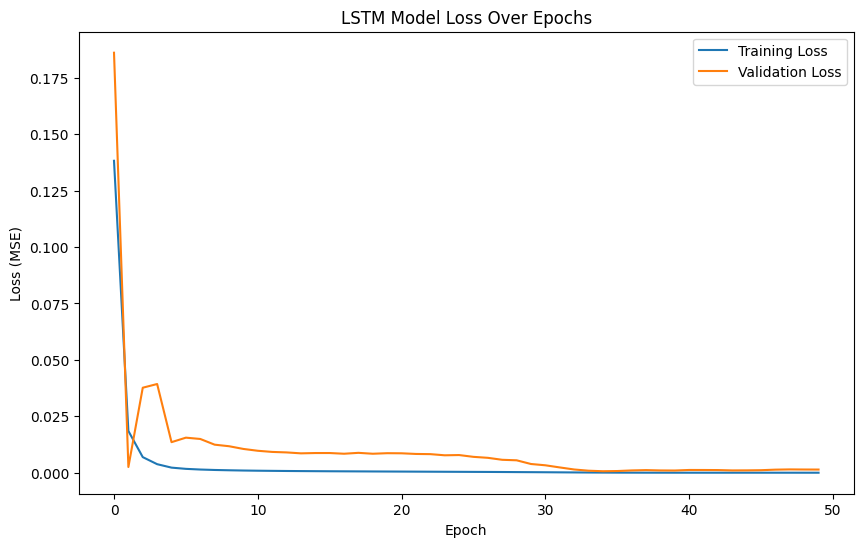

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import matplotlib.pyplot as plt

# 1. Build the LSTM Model Architecture
lstm_model = Sequential()
# Add an LSTM layer. input_shape is (sequence_length, num_features)
# We have 10 frames in the sequence and 4 features (the bbox coordinates).
lstm_model.add(LSTM(units=50, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])))
# Add a Dense output layer with 4 neurons to predict the 4 bbox coordinates
lstm_model.add(Dense(4))

# 2. Compile the Model
# For a regression task like predicting coordinates, 'mean_squared_error' is the best loss function.
lstm_model.compile(optimizer='adam', loss='mean_squared_error')

# Print the model's architecture
lstm_model.summary()

# 3. Train the Model
print("\nStarting LSTM model training...")
history_lstm = lstm_model.fit(
    X_train_lstm,
    y_train_lstm,
    epochs=50, # Training for more epochs as LSTMs can take longer to learn
    batch_size=32,
    validation_split=0.1, # Use 10% of data to check for overfitting
    verbose=1
)

print("\n✅ LSTM Training Complete!")

# 4. Plot the Training and Validation Loss
plt.figure(figsize=(10, 6))
plt.plot(history_lstm.history['loss'], label='Training Loss')
plt.plot(history_lstm.history['val_loss'], label='Validation Loss')
plt.title('LSTM Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss (MSE)')
plt.legend()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


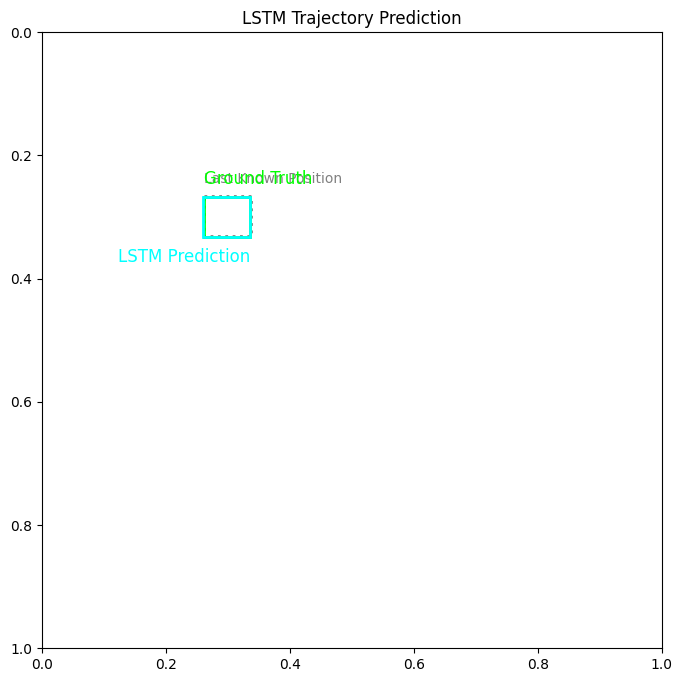

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

# Let's take a sample from the data we prepared
# You can change the sample_index to see different predictions
sample_index = 50
input_sequence = X_train_lstm[sample_index]
ground_truth_next_box = y_train_lstm[sample_index]

# The model expects a "batch" of inputs, so we add an extra dimension
input_for_prediction = np.expand_dims(input_sequence, axis=0)

# Use the LSTM model to predict the next bounding box
predicted_next_box = lstm_model.predict(input_for_prediction)[0]

# --- Visualize the results ---
# We'll draw on a blank canvas for clarity
fig, ax = plt.subplots(1, figsize=(8, 8))
ax.set_xlim(0, 1)
ax.set_ylim(1, 0) # Invert Y axis to match image coordinates (0,0 is top-left)
ax.set_title("LSTM Trajectory Prediction")

# Draw the last known position of the vehicle (the 10th box in the input sequence)
last_known_box = input_sequence[-1]
y_min, x_min, y_max, x_max = last_known_box
rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='gray', facecolor='none', linestyle=':')
ax.add_patch(rect)
plt.text(x_min, y_min - 0.02, 'Last Known Position', color='gray', fontsize=10)

# Draw the Ground Truth box (the REAL next position) in GREEN
y_min, x_min, y_max, x_max = ground_truth_next_box
rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='lime', facecolor='none')
ax.add_patch(rect)
plt.text(x_min, y_min - 0.02, 'Ground Truth', color='lime', fontsize=12)

# Draw the PREDICTED box in CYAN
y_min, x_min, y_max, x_max = predicted_next_box
rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='cyan', facecolor='none')
ax.add_patch(rect)
plt.text(x_max, y_max + 0.04, 'LSTM Prediction', color='cyan', fontsize=12, ha='right')

plt.show()